# **Import Libraries :** #

In [90]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MaxAbsScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier 
from catboost import CatBoostClassifier ,Pool
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
import joblib

# **Reading Data :** # 

In [91]:
data = pd.read_csv("D:/Mall_Customers.csv")

# **EDA :**

In [92]:
data.head(7)

,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40
5,6,Female,22,17,76
6,7,Female,35,18,6


In [93]:
data.tail(7)

,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100)
193,194,Female,38,113,91
194,195,Female,47,120,16
195,196,Female,35,120,79
196,197,Female,45,126,28
197,198,Male,32,126,74
198,199,Male,32,137,18
199,200,Male,30,137,83


In [94]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   CustomerID              200 non-null    int64 
 1   Gender                  200 non-null    object
 2   Age                     200 non-null    int64 
 3   Annual Income (k$)      200 non-null    int64 
 4   Spending Score (1-100)  200 non-null    int64 
dtypes: int64(4), object(1)
memory usage: 7.9+ KB


In [95]:
data.describe()

,CustomerID,Age,Annual Income (k$),Spending Score (1-100)
count,200.000000,200.000000,200.000000,200.000000
mean,100.500000,38.850000,60.560000,50.200000
std,57.879185,13.969007,26.264721,25.823522
min,1.000000,18.000000,15.000000,1.000000
25%,50.750000,28.750000,41.500000,34.750000
50%,100.500000,36.000000,61.500000,50.000000
75%,150.250000,49.000000,78.000000,73.000000
max,200.000000,70.000000,137.000000,99.000000


In [96]:
cols=data.columns
for col in cols:
    print(data[col].value_counts(),"\n")

CustomerID
1      1
138    1
128    1
129    1
130    1
      ..
70     1
71     1
72     1
73     1
200    1
Name: count, Length: 200, dtype: int64 

Gender
Female    112
Male       88
Name: count, dtype: int64 

Age
32    11
35     9
19     8
31     8
30     7
49     7
40     6
38     6
47     6
27     6
36     6
23     6
34     5
20     5
29     5
50     5
48     5
21     5
24     4
18     4
28     4
67     4
59     4
54     4
43     3
60     3
45     3
39     3
33     3
37     3
22     3
25     3
46     3
68     3
52     2
44     2
66     2
57     2
26     2
53     2
42     2
63     2
70     2
51     2
58     2
65     2
41     2
55     1
69     1
64     1
56     1
Name: count, dtype: int64 

Annual Income (k$)
54     12
78     12
48      6
71      6
63      6
       ..
58      2
59      2
16      2
64      2
137     2
Name: count, Length: 64, dtype: int64 

Spending Score (1-100)
42    8
55    7
46    6
73    6
35    5
     ..
31    1
44    1
53    1
65    1
18    1
Name: count, Le

#  **EDA With Visualization :** #

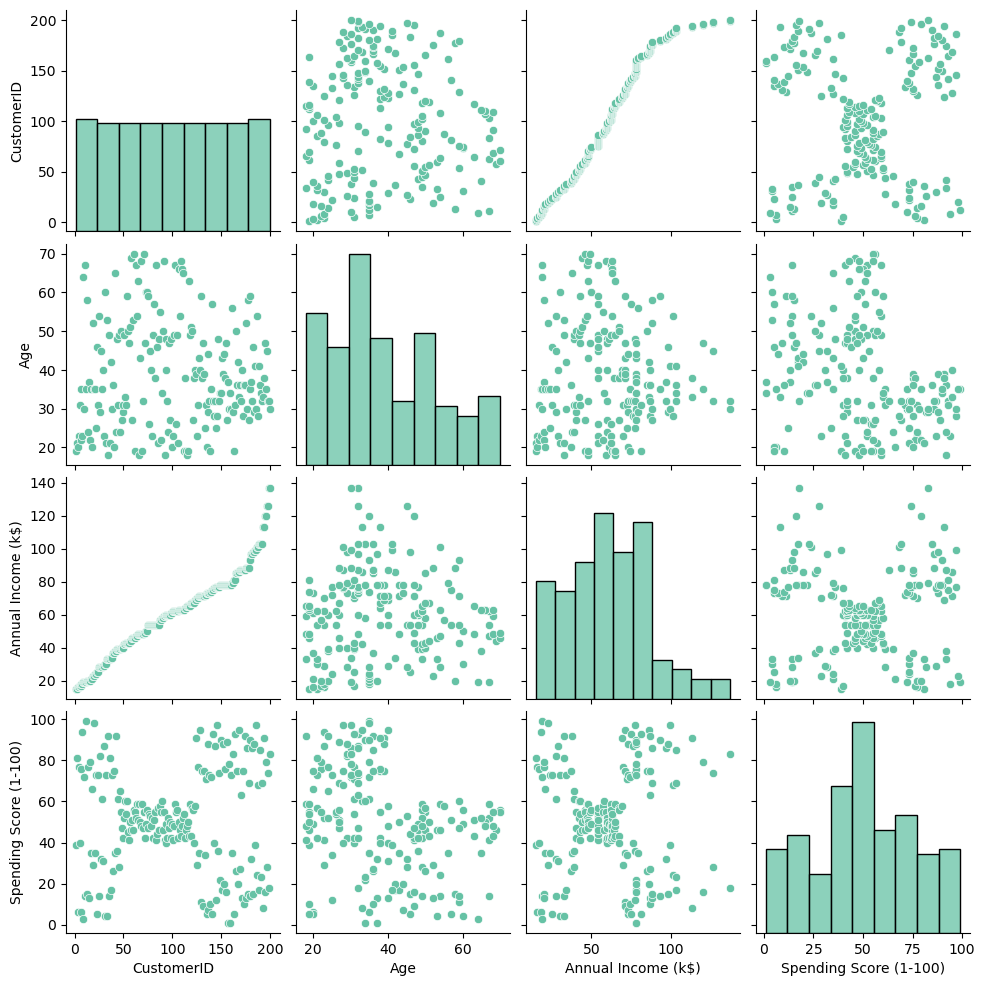

In [97]:
custom_palette = "Set2"
sns.set_palette(custom_palette)
sns.pairplot(data)

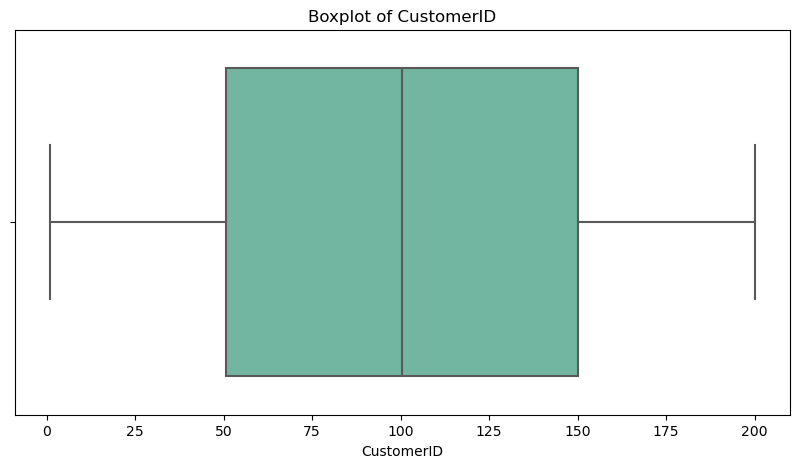

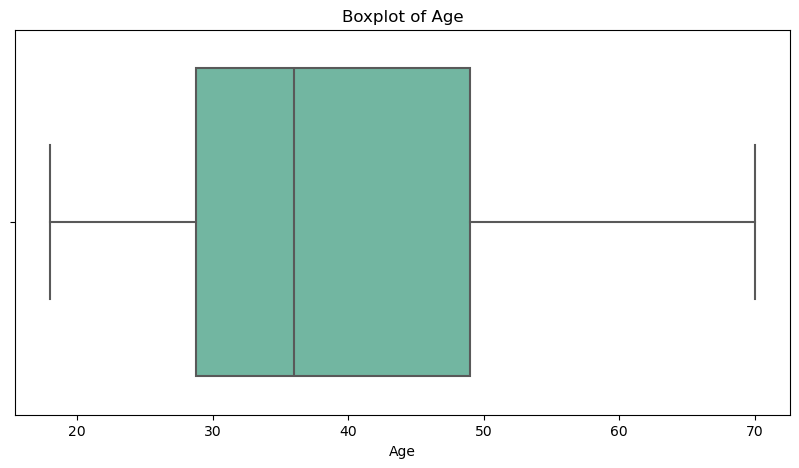

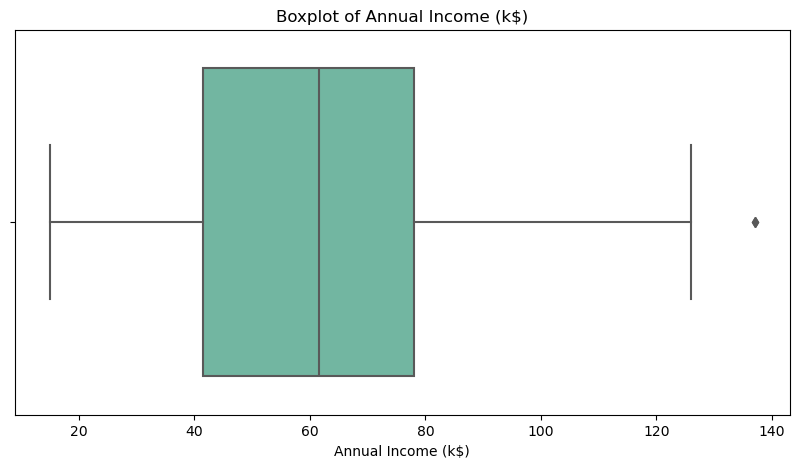

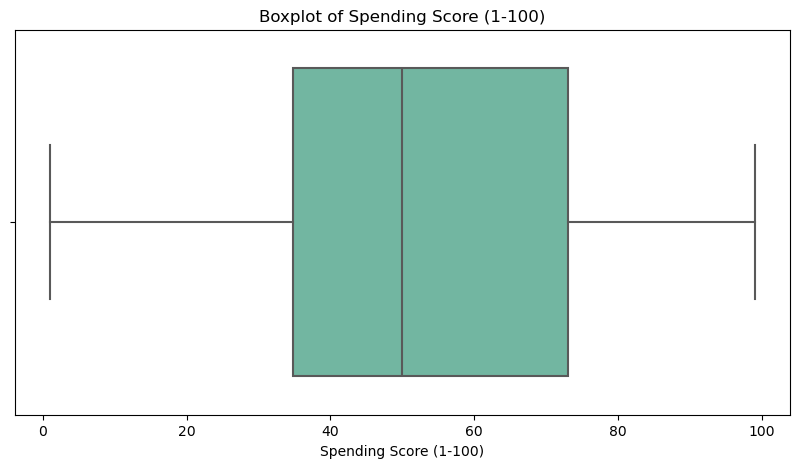

In [98]:
custom_palette = "Set2"
sns.set_palette(custom_palette)
for col in data.select_dtypes(include=['int', 'float']).columns:
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.set_title(f'Boxplot of {col}')
    bp = sns.boxplot(data=data, x=col, ax=ax)
    plt.show()
    plt.close(fig)

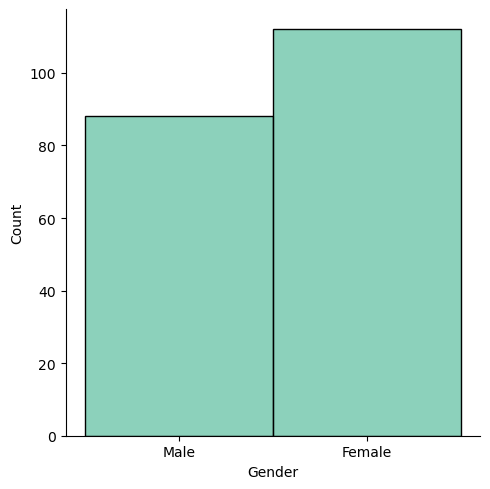

In [99]:
custom_palette = "Set2"  
sns.set_palette(custom_palette)
sns.displot(data=data, x="Gender")

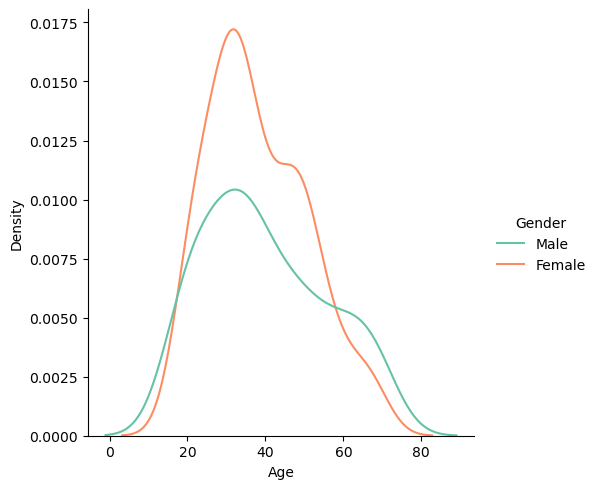

In [100]:
sns.displot(data, x = 'Age',hue='Gender', kind='kde')

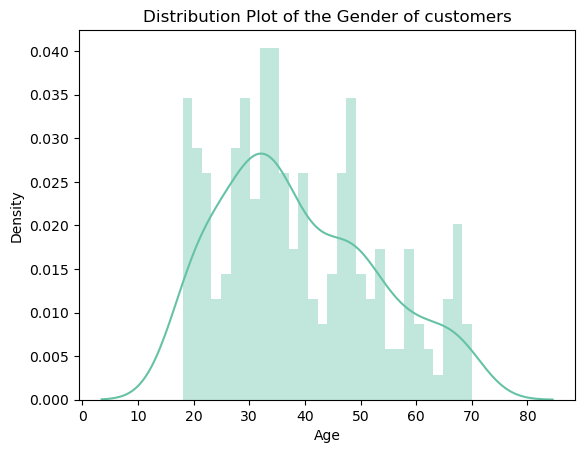

In [101]:
sns.set_palette("Set2")  
sns.distplot(data['Age'], kde=True, bins=30)
plt.title('Distribution Plot of the Gender of customers')
plt.show()

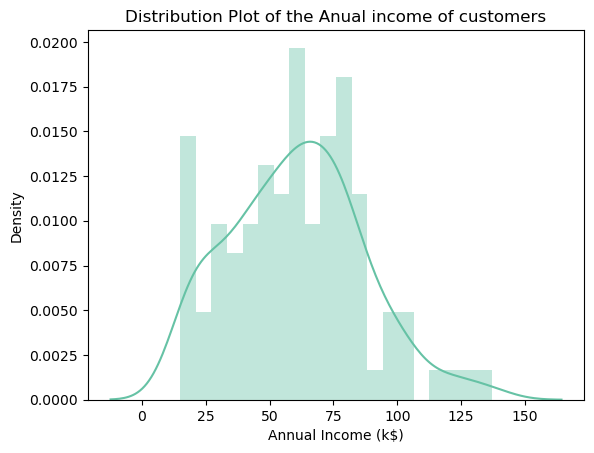

In [102]:
sns.set_palette("Set2")  
sns.distplot(data['Annual Income (k$)'], kde=True, bins=20)
plt.title('Distribution Plot of the Anual income of customers')
plt.show()

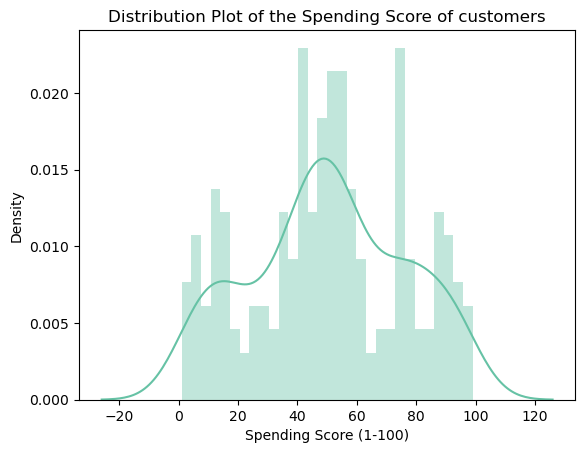

In [103]:
sns.set_palette("Set2")  
sns.distplot(data["Spending Score (1-100)"], kde=True, bins=30)
plt.title('Distribution Plot of the Spending Score of customers')
plt.show()

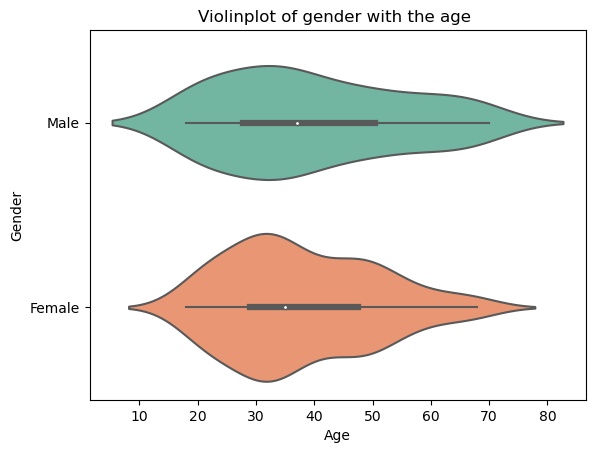

In [104]:
custom_palette = "Set2"
sns.violinplot(x='Age', y='Gender', data=data, palette=custom_palette)
plt.title('Violinplot of gender with the age ')
plt.show()

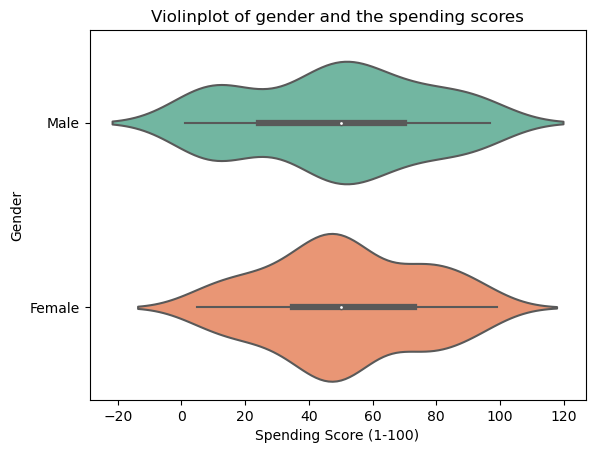

In [105]:
custom_palette = "Set2"
sns.violinplot(x="Spending Score (1-100)", y='Gender', data=data, palette=custom_palette)
plt.title('Violinplot of gender and the spending scores')
plt.show()

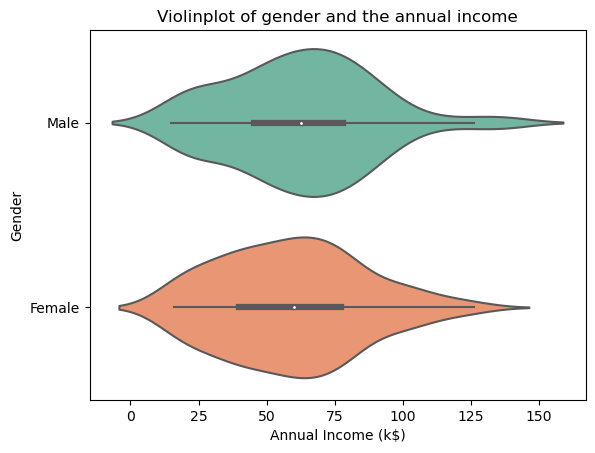

In [106]:
custom_palette = "Set2"
sns.violinplot(x="Annual Income (k$)", y='Gender', data=data, palette=custom_palette)
plt.title('Violinplot of gender and the annual income')
plt.show()

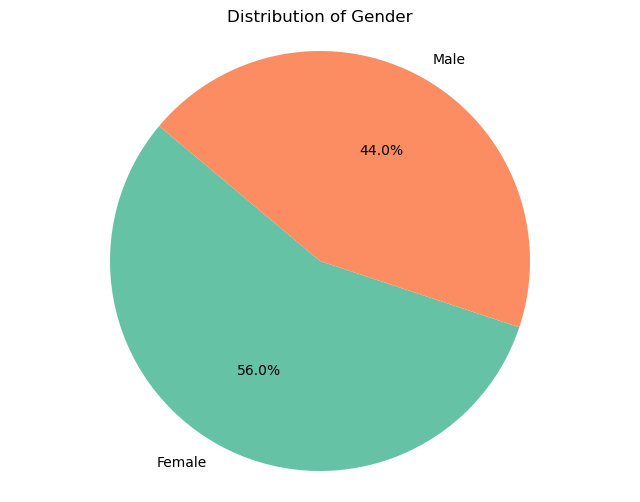

In [107]:
custom_palette = "Set2"
sns.set_palette(custom_palette)
plt.figure(figsize=(8, 6))
data['Gender'].value_counts().plot(kind='pie', autopct='%1.1f%%', colors=sns.color_palette()
                                   , startangle=140)
plt.title("Distribution of Gender")
plt.ylabel("")
plt.axis('equal')
plt.show()

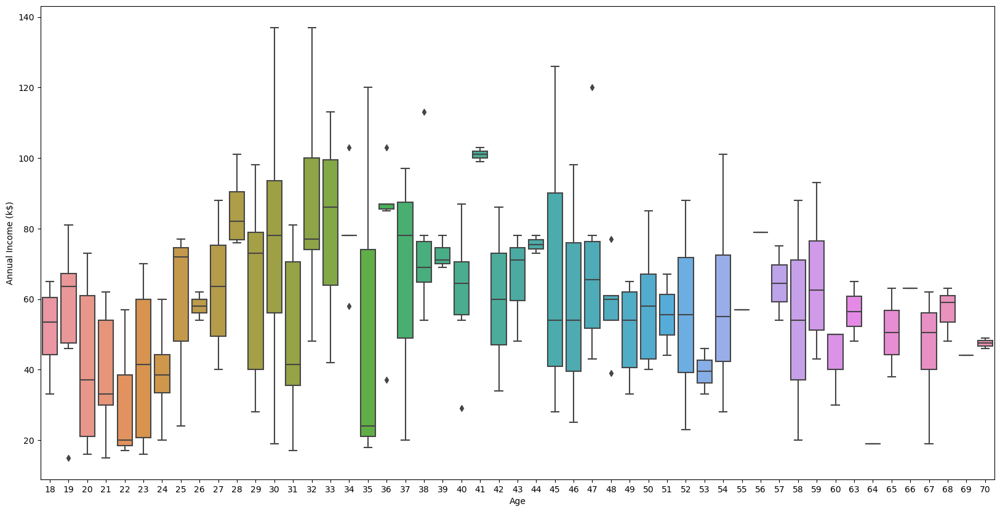

In [108]:
custom_palette = "Set2"
sns.set_palette(custom_palette)
plt.figure(figsize=(20,10))
sns.boxplot(data=data, x="Age", y="Annual Income (k$)")
plt.show()

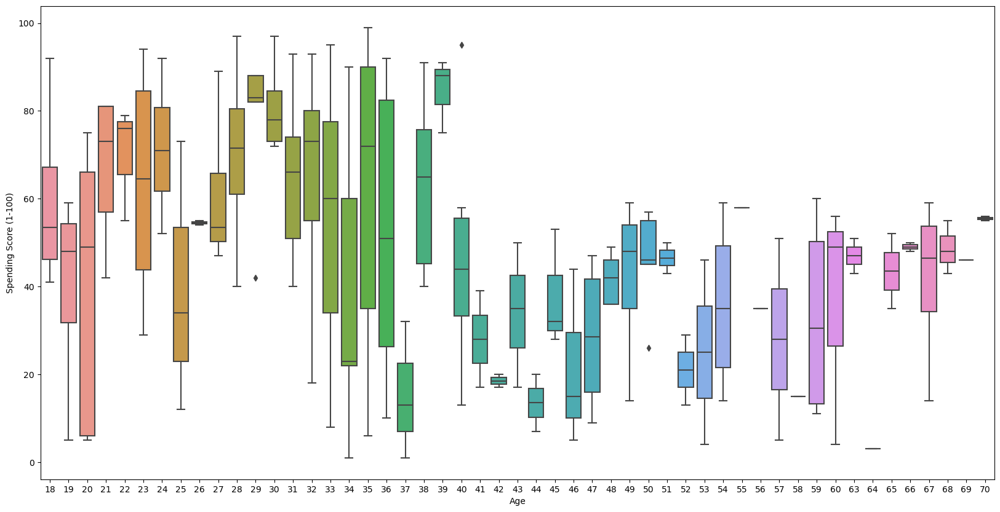

In [109]:
custom_palette = "Set2"
sns.set_palette(custom_palette)
plt.figure(figsize=(20,10))
sns.boxplot(data=data, x="Age", y="Spending Score (1-100)")
plt.show()

# **Pre-Processing Operations :**

In [110]:
data.isna().sum()

CustomerID                0
Gender                    0
Age                       0
Annual Income (k$)        0
Spending Score (1-100)    0
dtype: int64

In [111]:
data.duplicated().sum()

0

In [112]:
# Dropping the customer id columns because it will be not useful and maybe has effects on the models 
data.drop(columns=["CustomerID"],inplace=True)

In [113]:
Features=data.drop(columns=["Gender"])
Goal=data["Gender"]

In [114]:
Features.head(10)

,Age,Annual Income (k$),Spending Score (1-100)
0,19,15,39
1,21,15,81
2,20,16,6
3,23,16,77
4,31,17,40
5,22,17,76
6,35,18,6
7,23,18,94
8,64,19,3
9,30,19,72


In [115]:
Goal.head(10)

0      Male
1      Male
2    Female
3    Female
4    Female
5    Female
6    Female
7    Female
8      Male
9    Female
Name: Gender, dtype: object

In [116]:
Scaled_Features = MaxAbsScaler().fit_transform(Features)
Scaled_Features = pd.DataFrame(Scaled_Features, columns=Features.columns)

In [117]:
Scaled_Features.head()

,Age,Annual Income (k$),Spending Score (1-100)
0,0.271429,0.109489,0.393939
1,0.300000,0.109489,0.818182
2,0.285714,0.116788,0.060606
3,0.328571,0.116788,0.777778
4,0.442857,0.124088,0.404040


In [118]:
# Saving Scaled Features as CSV File
Scaled_Features.to_csv('Scaled Features.csv', index=False)

In [119]:
Ftrain,Ftest,Gtrain,Gtest=train_test_split(Scaled_Features,Goal,test_size=0.1,random_state=0)

In [120]:
Ftrain.head()

,Age,Annual Income (k$),Spending Score (1-100)
183,0.414286,0.715328,0.888889
145,0.400000,0.562044,0.979798
45,0.342857,0.284672,0.656566
159,0.428571,0.569343,0.737374
60,1.000000,0.335766,0.565657


In [121]:
Ftest.head()

,Age,Annual Income (k$),Spending Score (1-100)
18,0.742857,0.167883,0.292929
170,0.571429,0.635036,0.131313
107,0.771429,0.459854,0.464646
98,0.685714,0.445255,0.424242
177,0.385714,0.642336,0.696970


In [122]:
Gtrain.head()

183    Female
145      Male
45     Female
159    Female
60       Male
Name: Gender, dtype: object

In [123]:
Gtest.head()

18     Male
170    Male
107    Male
98     Male
177    Male
Name: Gender, dtype: object

# **Applying Grid Search Model on Decision Tree Classifier :**

In [124]:
DTC = DecisionTreeClassifier()

DTC_Params = {
    'max_depth' : [3,5,7,9,10,11,12],
    'min_samples_leaf' :list(range(2,20)),
    'criterion': ['gini', 'entropy'],
    'min_samples_split' : list(range(2,20))
}

GRS = GridSearchCV(DTC, DTC_Params, cv = 7)
GRS.fit(Ftrain, Gtrain)

print(GRS.best_params_)
print(GRS.best_score_)

{'criterion': 'entropy', 'max_depth': 12, 'min_samples_leaf': 2, 'min_samples_split': 5}
0.6167032967032967


In [125]:
DTC=DecisionTreeClassifier(criterion= 'entropy', max_depth= 12, min_samples_leaf= 2, min_samples_split= 5)
DTC.fit(Ftrain,Gtrain)
DTC_Pred=DTC.predict(Ftest)
DTC_Pred_Train=DTC.predict(Ftrain)

In [126]:
test_accuracy = accuracy_score(Gtest, DTC_Pred)
print(f"Accuracy Score for the test group: {test_accuracy*100}\n")
train_accuracy = accuracy_score(Gtrain, DTC_Pred_Train)
print(f"Accuracy Score for the train group: {train_accuracy*100:.2f}\n")

Accuracy Score for the test group: 40.0

Accuracy Score for the train group: 81.67



In [127]:
print("Classification Report for the test group : \n")
print(classification_report(Gtest,DTC_Pred),"\n\n")
print("Classification Report for the train group (to check if there is any overfitting): \n")
print(classification_report(Gtrain,DTC_Pred_Train),"\n\n")

Classification Report for the test group : 

              precision    recall  f1-score   support

      Female       0.38      0.75      0.50         8
        Male       0.50      0.17      0.25        12

    accuracy                           0.40        20
   macro avg       0.44      0.46      0.38        20
weighted avg       0.45      0.40      0.35        20
 


Classification Report for the train group (to check if there is any overfitting): 

              precision    recall  f1-score   support

      Female       0.78      0.96      0.86       104
        Male       0.92      0.62      0.74        76

    accuracy                           0.82       180
   macro avg       0.85      0.79      0.80       180
weighted avg       0.84      0.82      0.81       180
 




[[ 6  2]
 [10  2]]


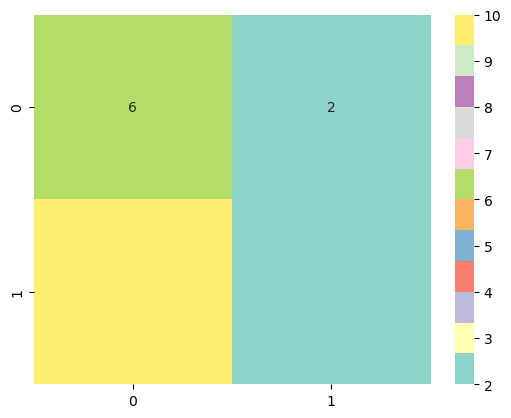

In [128]:
CM_DTC=confusion_matrix(Gtest,DTC_Pred)
print(CM_DTC)
sns.heatmap(CM_DTC,annot=True,cmap="Set3")
plt.show()

# **Applying Grid Search Model on CatBoosting Classifier :**

In [129]:
CB_params = {
    'learning_rate': [0.05, 0.1],
    'depth': [2,3,4,5,6,7],
    'iterations': [100,150,250,300,350],
    'bagging_temperature': [0.5, 1.0]
}

CB = CatBoostClassifier()
GRS = GridSearchCV(CB, CB_params, cv=7)
GRS.fit(Ftrain, Gtrain)

# Print the best parameters and best score
print(GRS.best_params_)
print(GRS.best_score_)

0:	learn: 0.6911682	total: 142ms	remaining: 14.1s
1:	learn: 0.6886276	total: 143ms	remaining: 7.02s
2:	learn: 0.6862540	total: 144ms	remaining: 4.65s
3:	learn: 0.6837791	total: 144ms	remaining: 3.46s
4:	learn: 0.6821672	total: 145ms	remaining: 2.75s
5:	learn: 0.6813416	total: 145ms	remaining: 2.28s
6:	learn: 0.6800405	total: 146ms	remaining: 1.94s
7:	learn: 0.6787544	total: 146ms	remaining: 1.68s
8:	learn: 0.6776697	total: 147ms	remaining: 1.48s
9:	learn: 0.6752722	total: 147ms	remaining: 1.32s
10:	learn: 0.6737457	total: 148ms	remaining: 1.2s
11:	learn: 0.6730963	total: 148ms	remaining: 1.09s
12:	learn: 0.6719305	total: 149ms	remaining: 998ms
13:	learn: 0.6703777	total: 150ms	remaining: 918ms
14:	learn: 0.6692562	total: 150ms	remaining: 851ms
15:	learn: 0.6678082	total: 151ms	remaining: 791ms
16:	learn: 0.6675817	total: 152ms	remaining: 740ms
17:	learn: 0.6664331	total: 152ms	remaining: 693ms
18:	learn: 0.6649804	total: 153ms	remaining: 651ms
19:	learn: 0.6637027	total: 153ms	remainin

0:	learn: 0.6908775	total: 398us	remaining: 39.4ms
1:	learn: 0.6881822	total: 1.13ms	remaining: 55.2ms
2:	learn: 0.6858556	total: 1.33ms	remaining: 43.1ms
3:	learn: 0.6831447	total: 1.46ms	remaining: 35ms
4:	learn: 0.6811834	total: 1.58ms	remaining: 30ms
5:	learn: 0.6801313	total: 1.72ms	remaining: 27ms
6:	learn: 0.6786492	total: 1.84ms	remaining: 24.4ms
7:	learn: 0.6767284	total: 1.97ms	remaining: 22.6ms
8:	learn: 0.6758515	total: 2.11ms	remaining: 21.3ms
9:	learn: 0.6740862	total: 2.22ms	remaining: 20ms
10:	learn: 0.6729497	total: 2.39ms	remaining: 19.4ms
11:	learn: 0.6714676	total: 2.72ms	remaining: 19.9ms
12:	learn: 0.6703758	total: 3.03ms	remaining: 20.3ms
13:	learn: 0.6686440	total: 3.34ms	remaining: 20.5ms
14:	learn: 0.6673097	total: 3.74ms	remaining: 21.2ms
15:	learn: 0.6660738	total: 3.87ms	remaining: 20.3ms
16:	learn: 0.6655069	total: 4.12ms	remaining: 20.1ms
17:	learn: 0.6645828	total: 4.27ms	remaining: 19.5ms
18:	learn: 0.6638324	total: 4.46ms	remaining: 19ms
19:	learn: 0.6

0:	learn: 0.6892674	total: 297us	remaining: 29.4ms
1:	learn: 0.6845368	total: 837us	remaining: 41ms
2:	learn: 0.6804482	total: 1.08ms	remaining: 35ms
3:	learn: 0.6782281	total: 1.27ms	remaining: 30.6ms
4:	learn: 0.6757200	total: 1.47ms	remaining: 28ms
5:	learn: 0.6745739	total: 1.68ms	remaining: 26.4ms
6:	learn: 0.6725416	total: 1.94ms	remaining: 25.8ms
7:	learn: 0.6706185	total: 2.08ms	remaining: 24ms
8:	learn: 0.6691202	total: 2.25ms	remaining: 22.7ms
9:	learn: 0.6673858	total: 2.37ms	remaining: 21.3ms
10:	learn: 0.6652206	total: 2.51ms	remaining: 20.3ms
11:	learn: 0.6639800	total: 2.63ms	remaining: 19.3ms
12:	learn: 0.6627121	total: 2.76ms	remaining: 18.4ms
13:	learn: 0.6604865	total: 2.87ms	remaining: 17.6ms
14:	learn: 0.6582742	total: 2.98ms	remaining: 16.9ms
15:	learn: 0.6562776	total: 3.13ms	remaining: 16.4ms
16:	learn: 0.6555364	total: 3.26ms	remaining: 15.9ms
17:	learn: 0.6540369	total: 3.46ms	remaining: 15.8ms
18:	learn: 0.6521201	total: 3.67ms	remaining: 15.6ms
19:	learn: 0.

7:	learn: 0.6648978	total: 2.64ms	remaining: 30.3ms
8:	learn: 0.6621215	total: 3.17ms	remaining: 32ms
9:	learn: 0.6598479	total: 3.32ms	remaining: 29.9ms
10:	learn: 0.6578319	total: 3.45ms	remaining: 27.9ms
11:	learn: 0.6561715	total: 3.58ms	remaining: 26.2ms
12:	learn: 0.6559033	total: 3.75ms	remaining: 25.1ms
13:	learn: 0.6541351	total: 3.93ms	remaining: 24.2ms
14:	learn: 0.6530054	total: 4.15ms	remaining: 23.5ms
15:	learn: 0.6520691	total: 4.35ms	remaining: 22.8ms
16:	learn: 0.6515924	total: 4.59ms	remaining: 22.4ms
17:	learn: 0.6493969	total: 4.73ms	remaining: 21.6ms
18:	learn: 0.6468716	total: 4.86ms	remaining: 20.7ms
19:	learn: 0.6463604	total: 4.98ms	remaining: 19.9ms
20:	learn: 0.6461507	total: 5.17ms	remaining: 19.5ms
21:	learn: 0.6438178	total: 5.33ms	remaining: 18.9ms
22:	learn: 0.6428353	total: 5.48ms	remaining: 18.3ms
23:	learn: 0.6418856	total: 5.6ms	remaining: 17.7ms
24:	learn: 0.6407995	total: 5.79ms	remaining: 17.4ms
25:	learn: 0.6387942	total: 5.93ms	remaining: 16.9ms

0:	learn: 0.6907340	total: 366us	remaining: 54.5ms
1:	learn: 0.6882218	total: 774us	remaining: 57.3ms
2:	learn: 0.6862635	total: 983us	remaining: 48.2ms
3:	learn: 0.6840563	total: 1.26ms	remaining: 46.2ms
4:	learn: 0.6821944	total: 1.46ms	remaining: 42.4ms
5:	learn: 0.6809870	total: 1.61ms	remaining: 38.7ms
6:	learn: 0.6799067	total: 1.8ms	remaining: 36.9ms
7:	learn: 0.6785648	total: 2.03ms	remaining: 36ms
8:	learn: 0.6773469	total: 2.2ms	remaining: 34.5ms
9:	learn: 0.6765007	total: 2.35ms	remaining: 32.9ms
10:	learn: 0.6749403	total: 2.53ms	remaining: 32ms
11:	learn: 0.6744108	total: 2.7ms	remaining: 31.1ms
12:	learn: 0.6731076	total: 2.97ms	remaining: 31.3ms
13:	learn: 0.6720331	total: 3.18ms	remaining: 30.9ms
14:	learn: 0.6707729	total: 3.34ms	remaining: 30.1ms
15:	learn: 0.6696699	total: 3.62ms	remaining: 30.3ms
16:	learn: 0.6693937	total: 3.87ms	remaining: 30.3ms
17:	learn: 0.6677952	total: 4.03ms	remaining: 29.6ms
18:	learn: 0.6664751	total: 4.14ms	remaining: 28.5ms
19:	learn: 0.

79:	learn: 0.6292241	total: 16.5ms	remaining: 14.5ms
80:	learn: 0.6290426	total: 17.1ms	remaining: 14.6ms
81:	learn: 0.6289557	total: 17.3ms	remaining: 14.4ms
82:	learn: 0.6287677	total: 17.5ms	remaining: 14.2ms
83:	learn: 0.6285583	total: 17.7ms	remaining: 13.9ms
84:	learn: 0.6282424	total: 18ms	remaining: 13.7ms
85:	learn: 0.6278239	total: 18.2ms	remaining: 13.5ms
86:	learn: 0.6274688	total: 18.4ms	remaining: 13.3ms
87:	learn: 0.6268772	total: 18.7ms	remaining: 13.2ms
88:	learn: 0.6265090	total: 18.9ms	remaining: 13ms
89:	learn: 0.6260732	total: 19.1ms	remaining: 12.7ms
90:	learn: 0.6254821	total: 19.2ms	remaining: 12.5ms
91:	learn: 0.6251928	total: 19.4ms	remaining: 12.2ms
92:	learn: 0.6249237	total: 19.6ms	remaining: 12ms
93:	learn: 0.6248082	total: 19.7ms	remaining: 11.7ms
94:	learn: 0.6247706	total: 19.8ms	remaining: 11.5ms
95:	learn: 0.6242757	total: 20ms	remaining: 11.2ms
96:	learn: 0.6242274	total: 20.1ms	remaining: 11ms
97:	learn: 0.6237087	total: 20.2ms	remaining: 10.7ms
98:

0:	learn: 0.6884245	total: 275us	remaining: 41.1ms
1:	learn: 0.6837904	total: 1.25ms	remaining: 92.3ms
2:	learn: 0.6805243	total: 1.44ms	remaining: 70.7ms
3:	learn: 0.6761415	total: 1.58ms	remaining: 57.8ms
4:	learn: 0.6731937	total: 1.72ms	remaining: 49.8ms
5:	learn: 0.6714280	total: 1.84ms	remaining: 44.3ms
6:	learn: 0.6697907	total: 1.97ms	remaining: 40.3ms
7:	learn: 0.6678654	total: 2.1ms	remaining: 37.3ms
8:	learn: 0.6662629	total: 2.23ms	remaining: 35ms
9:	learn: 0.6648200	total: 2.38ms	remaining: 33.3ms
10:	learn: 0.6626666	total: 2.51ms	remaining: 31.7ms
11:	learn: 0.6615091	total: 2.64ms	remaining: 30.4ms
12:	learn: 0.6600658	total: 2.77ms	remaining: 29.2ms
13:	learn: 0.6587524	total: 2.9ms	remaining: 28.1ms
14:	learn: 0.6572295	total: 3.02ms	remaining: 27.2ms
15:	learn: 0.6548414	total: 3.13ms	remaining: 26.3ms
16:	learn: 0.6546945	total: 3.25ms	remaining: 25.5ms
17:	learn: 0.6524923	total: 3.37ms	remaining: 24.7ms
18:	learn: 0.6517820	total: 3.48ms	remaining: 24ms
19:	learn:

48:	learn: 0.6219448	total: 12.4ms	remaining: 25.5ms
49:	learn: 0.6211403	total: 12.8ms	remaining: 25.5ms
50:	learn: 0.6202340	total: 13ms	remaining: 25.2ms
51:	learn: 0.6198350	total: 13.1ms	remaining: 24.7ms
52:	learn: 0.6188157	total: 13.2ms	remaining: 24.2ms
53:	learn: 0.6176052	total: 13.4ms	remaining: 23.7ms
54:	learn: 0.6173449	total: 13.5ms	remaining: 23.3ms
55:	learn: 0.6169728	total: 13.6ms	remaining: 22.8ms
56:	learn: 0.6158725	total: 13.7ms	remaining: 22.4ms
57:	learn: 0.6152206	total: 13.9ms	remaining: 22ms
58:	learn: 0.6138255	total: 14ms	remaining: 21.6ms
59:	learn: 0.6133460	total: 14.1ms	remaining: 21.2ms
60:	learn: 0.6127440	total: 14.2ms	remaining: 20.8ms
61:	learn: 0.6114730	total: 14.4ms	remaining: 20.4ms
62:	learn: 0.6109998	total: 14.5ms	remaining: 20ms
63:	learn: 0.6098580	total: 14.6ms	remaining: 19.6ms
64:	learn: 0.6088020	total: 14.8ms	remaining: 19.3ms
65:	learn: 0.6079510	total: 14.9ms	remaining: 18.9ms
66:	learn: 0.6071720	total: 15ms	remaining: 18.6ms
67:

38:	learn: 0.6320299	total: 27.3ms	remaining: 148ms
39:	learn: 0.6304280	total: 28.2ms	remaining: 148ms
40:	learn: 0.6293538	total: 28.8ms	remaining: 147ms
41:	learn: 0.6291822	total: 29.6ms	remaining: 147ms
42:	learn: 0.6283712	total: 30.4ms	remaining: 147ms
43:	learn: 0.6281740	total: 31.4ms	remaining: 147ms
44:	learn: 0.6265009	total: 32.1ms	remaining: 146ms
45:	learn: 0.6258183	total: 33ms	remaining: 146ms
46:	learn: 0.6250959	total: 33.9ms	remaining: 146ms
47:	learn: 0.6247201	total: 34.4ms	remaining: 145ms
48:	learn: 0.6240850	total: 35ms	remaining: 144ms
49:	learn: 0.6238204	total: 35.6ms	remaining: 142ms
50:	learn: 0.6233755	total: 36.4ms	remaining: 142ms
51:	learn: 0.6231188	total: 37.2ms	remaining: 142ms
52:	learn: 0.6230108	total: 37.8ms	remaining: 140ms
53:	learn: 0.6220315	total: 38.3ms	remaining: 139ms
54:	learn: 0.6204671	total: 38.8ms	remaining: 138ms
55:	learn: 0.6199683	total: 39.4ms	remaining: 136ms
56:	learn: 0.6195733	total: 40.2ms	remaining: 136ms
57:	learn: 0.618

239:	learn: 0.4806853	total: 207ms	remaining: 8.61ms
240:	learn: 0.4804049	total: 208ms	remaining: 7.76ms
241:	learn: 0.4794496	total: 209ms	remaining: 6.9ms
242:	learn: 0.4779091	total: 210ms	remaining: 6.04ms
243:	learn: 0.4770852	total: 211ms	remaining: 5.18ms
244:	learn: 0.4764081	total: 212ms	remaining: 4.32ms
245:	learn: 0.4755997	total: 213ms	remaining: 3.46ms
246:	learn: 0.4744145	total: 214ms	remaining: 2.6ms
247:	learn: 0.4738992	total: 215ms	remaining: 1.73ms
248:	learn: 0.4734173	total: 216ms	remaining: 866us
249:	learn: 0.4727350	total: 217ms	remaining: 0us
0:	learn: 0.6902672	total: 1.14ms	remaining: 284ms
1:	learn: 0.6889574	total: 2.32ms	remaining: 288ms
2:	learn: 0.6862046	total: 3.65ms	remaining: 301ms
3:	learn: 0.6826835	total: 5.3ms	remaining: 326ms
4:	learn: 0.6803127	total: 7.41ms	remaining: 363ms
5:	learn: 0.6775078	total: 8.4ms	remaining: 341ms
6:	learn: 0.6759085	total: 9.27ms	remaining: 322ms
7:	learn: 0.6733478	total: 10.7ms	remaining: 324ms
8:	learn: 0.67169

45:	learn: 0.6177007	total: 46.8ms	remaining: 208ms
46:	learn: 0.6176532	total: 47.9ms	remaining: 207ms
47:	learn: 0.6156483	total: 49ms	remaining: 206ms
48:	learn: 0.6141348	total: 50.1ms	remaining: 205ms
49:	learn: 0.6129160	total: 50.9ms	remaining: 204ms
50:	learn: 0.6125180	total: 51.8ms	remaining: 202ms
51:	learn: 0.6115853	total: 53ms	remaining: 202ms
52:	learn: 0.6095789	total: 54.1ms	remaining: 201ms
53:	learn: 0.6083950	total: 55.1ms	remaining: 200ms
54:	learn: 0.6077833	total: 56.1ms	remaining: 199ms
55:	learn: 0.6070034	total: 57.1ms	remaining: 198ms
56:	learn: 0.6059200	total: 58.2ms	remaining: 197ms
57:	learn: 0.6052227	total: 59ms	remaining: 195ms
58:	learn: 0.6046956	total: 60.1ms	remaining: 194ms
59:	learn: 0.6038239	total: 60.9ms	remaining: 193ms
60:	learn: 0.6032864	total: 61.6ms	remaining: 191ms
61:	learn: 0.6029298	total: 62.8ms	remaining: 190ms
62:	learn: 0.6022939	total: 63.8ms	remaining: 189ms
63:	learn: 0.6018874	total: 64.8ms	remaining: 188ms
64:	learn: 0.60106

218:	learn: 0.4749003	total: 231ms	remaining: 32.7ms
219:	learn: 0.4745114	total: 232ms	remaining: 31.6ms
220:	learn: 0.4741872	total: 233ms	remaining: 30.6ms
221:	learn: 0.4730885	total: 234ms	remaining: 29.5ms
222:	learn: 0.4712643	total: 235ms	remaining: 28.4ms
223:	learn: 0.4705431	total: 236ms	remaining: 27.4ms
224:	learn: 0.4696695	total: 237ms	remaining: 26.3ms
225:	learn: 0.4690573	total: 238ms	remaining: 25.2ms
226:	learn: 0.4681370	total: 239ms	remaining: 24.2ms
227:	learn: 0.4674179	total: 240ms	remaining: 23.1ms
228:	learn: 0.4667995	total: 241ms	remaining: 22.1ms
229:	learn: 0.4663820	total: 242ms	remaining: 21ms
230:	learn: 0.4657487	total: 243ms	remaining: 20ms
231:	learn: 0.4652859	total: 244ms	remaining: 18.9ms
232:	learn: 0.4651363	total: 245ms	remaining: 17.9ms
233:	learn: 0.4642128	total: 246ms	remaining: 16.8ms
234:	learn: 0.4636790	total: 247ms	remaining: 15.8ms
235:	learn: 0.4629988	total: 248ms	remaining: 14.7ms
236:	learn: 0.4627555	total: 249ms	remaining: 13.6

10:	learn: 0.6671696	total: 10.3ms	remaining: 224ms
11:	learn: 0.6661781	total: 11.5ms	remaining: 229ms
12:	learn: 0.6636013	total: 12.6ms	remaining: 229ms
13:	learn: 0.6619383	total: 13.6ms	remaining: 230ms
14:	learn: 0.6602972	total: 14.6ms	remaining: 229ms
15:	learn: 0.6588948	total: 15.7ms	remaining: 229ms
16:	learn: 0.6573174	total: 16.4ms	remaining: 225ms
17:	learn: 0.6557413	total: 17.1ms	remaining: 220ms
18:	learn: 0.6537623	total: 17.9ms	remaining: 217ms
19:	learn: 0.6535031	total: 18.8ms	remaining: 217ms
20:	learn: 0.6528424	total: 19.9ms	remaining: 217ms
21:	learn: 0.6502773	total: 21ms	remaining: 217ms
22:	learn: 0.6497571	total: 22ms	remaining: 217ms
23:	learn: 0.6488340	total: 23.1ms	remaining: 218ms
24:	learn: 0.6484051	total: 24.4ms	remaining: 219ms
25:	learn: 0.6476433	total: 25.4ms	remaining: 219ms
26:	learn: 0.6474383	total: 26.4ms	remaining: 218ms
27:	learn: 0.6466687	total: 27.4ms	remaining: 217ms
28:	learn: 0.6450130	total: 28.3ms	remaining: 216ms
29:	learn: 0.643

186:	learn: 0.5253411	total: 188ms	remaining: 63.3ms
187:	learn: 0.5244382	total: 189ms	remaining: 62.4ms
188:	learn: 0.5240628	total: 190ms	remaining: 61.4ms
189:	learn: 0.5230977	total: 191ms	remaining: 60.4ms
190:	learn: 0.5226492	total: 192ms	remaining: 59.4ms
191:	learn: 0.5219538	total: 193ms	remaining: 58.3ms
192:	learn: 0.5215713	total: 194ms	remaining: 57.2ms
193:	learn: 0.5206388	total: 195ms	remaining: 56.2ms
194:	learn: 0.5196589	total: 196ms	remaining: 55.2ms
195:	learn: 0.5192468	total: 197ms	remaining: 54.2ms
196:	learn: 0.5184777	total: 198ms	remaining: 53.2ms
197:	learn: 0.5180723	total: 199ms	remaining: 52.1ms
198:	learn: 0.5176519	total: 199ms	remaining: 51.1ms
199:	learn: 0.5166942	total: 200ms	remaining: 50.1ms
200:	learn: 0.5155649	total: 202ms	remaining: 49.1ms
201:	learn: 0.5154205	total: 203ms	remaining: 48.1ms
202:	learn: 0.5137825	total: 203ms	remaining: 47.1ms
203:	learn: 0.5133241	total: 204ms	remaining: 46.1ms
204:	learn: 0.5127903	total: 205ms	remaining: 

0:	learn: 0.6887491	total: 848us	remaining: 211ms
1:	learn: 0.6853197	total: 2.28ms	remaining: 282ms
2:	learn: 0.6825401	total: 4.2ms	remaining: 345ms
3:	learn: 0.6792564	total: 5.27ms	remaining: 324ms
4:	learn: 0.6770299	total: 6.15ms	remaining: 302ms
5:	learn: 0.6742312	total: 7.08ms	remaining: 288ms
6:	learn: 0.6714116	total: 8.19ms	remaining: 284ms
7:	learn: 0.6682104	total: 9.22ms	remaining: 279ms
8:	learn: 0.6652506	total: 10.4ms	remaining: 277ms
9:	learn: 0.6635931	total: 11.6ms	remaining: 279ms
10:	learn: 0.6599055	total: 12.6ms	remaining: 273ms
11:	learn: 0.6583660	total: 13.7ms	remaining: 272ms
12:	learn: 0.6564357	total: 14.6ms	remaining: 267ms
13:	learn: 0.6543554	total: 15.7ms	remaining: 265ms
14:	learn: 0.6531549	total: 16.6ms	remaining: 261ms
15:	learn: 0.6514902	total: 17.6ms	remaining: 258ms
16:	learn: 0.6505949	total: 18.8ms	remaining: 257ms
17:	learn: 0.6495945	total: 19.7ms	remaining: 254ms
18:	learn: 0.6477721	total: 20.8ms	remaining: 253ms
19:	learn: 0.6463589	tot

177:	learn: 0.5078255	total: 182ms	remaining: 73.7ms
178:	learn: 0.5074245	total: 184ms	remaining: 72.8ms
179:	learn: 0.5066159	total: 185ms	remaining: 71.8ms
180:	learn: 0.5054714	total: 186ms	remaining: 70.8ms
181:	learn: 0.5047460	total: 186ms	remaining: 69.6ms
182:	learn: 0.5037172	total: 187ms	remaining: 68.6ms
183:	learn: 0.5035222	total: 188ms	remaining: 67.5ms
184:	learn: 0.5027933	total: 189ms	remaining: 66.6ms
185:	learn: 0.5023512	total: 190ms	remaining: 65.5ms
186:	learn: 0.5012180	total: 191ms	remaining: 64.4ms
187:	learn: 0.5002569	total: 192ms	remaining: 63.4ms
188:	learn: 0.4992878	total: 193ms	remaining: 62.3ms
189:	learn: 0.4985869	total: 194ms	remaining: 61.2ms
190:	learn: 0.4978649	total: 195ms	remaining: 60.2ms
191:	learn: 0.4966743	total: 196ms	remaining: 59.2ms
192:	learn: 0.4961632	total: 197ms	remaining: 58.2ms
193:	learn: 0.4955710	total: 198ms	remaining: 57.2ms
194:	learn: 0.4953641	total: 199ms	remaining: 56.2ms
195:	learn: 0.4949586	total: 200ms	remaining: 

246:	learn: 0.3623370	total: 258ms	remaining: 3.13ms
247:	learn: 0.3617051	total: 260ms	remaining: 2.1ms
248:	learn: 0.3614320	total: 261ms	remaining: 1.05ms
249:	learn: 0.3593498	total: 262ms	remaining: 0us
0:	learn: 0.6875355	total: 1.3ms	remaining: 325ms
1:	learn: 0.6852519	total: 2.37ms	remaining: 294ms
2:	learn: 0.6804363	total: 3.38ms	remaining: 278ms
3:	learn: 0.6743443	total: 4.63ms	remaining: 285ms
4:	learn: 0.6706171	total: 5.97ms	remaining: 292ms
5:	learn: 0.6670173	total: 7.23ms	remaining: 294ms
6:	learn: 0.6646784	total: 8.34ms	remaining: 289ms
7:	learn: 0.6636492	total: 9.33ms	remaining: 282ms
8:	learn: 0.6613133	total: 10.5ms	remaining: 281ms
9:	learn: 0.6582503	total: 11.4ms	remaining: 274ms
10:	learn: 0.6541634	total: 12.5ms	remaining: 272ms
11:	learn: 0.6493511	total: 13.6ms	remaining: 270ms
12:	learn: 0.6466845	total: 14.7ms	remaining: 267ms
13:	learn: 0.6433915	total: 15.7ms	remaining: 264ms
14:	learn: 0.6412529	total: 16.9ms	remaining: 264ms
15:	learn: 0.6391474	to

22:	learn: 0.6146126	total: 29.9ms	remaining: 295ms
23:	learn: 0.6111516	total: 31.7ms	remaining: 299ms
24:	learn: 0.6090736	total: 32.9ms	remaining: 296ms
25:	learn: 0.6079853	total: 34ms	remaining: 293ms
26:	learn: 0.6064045	total: 34.7ms	remaining: 286ms
27:	learn: 0.6051507	total: 35.5ms	remaining: 281ms
28:	learn: 0.6025487	total: 36.4ms	remaining: 278ms
29:	learn: 0.6024361	total: 37.5ms	remaining: 275ms
30:	learn: 0.6009020	total: 38.5ms	remaining: 272ms
31:	learn: 0.6007647	total: 39.5ms	remaining: 269ms
32:	learn: 0.5999931	total: 40.6ms	remaining: 267ms
33:	learn: 0.5981846	total: 41.9ms	remaining: 266ms
34:	learn: 0.5972117	total: 43.1ms	remaining: 265ms
35:	learn: 0.5948837	total: 44.2ms	remaining: 263ms
36:	learn: 0.5941873	total: 45.2ms	remaining: 260ms
37:	learn: 0.5922436	total: 46.2ms	remaining: 258ms
38:	learn: 0.5916193	total: 47.3ms	remaining: 256ms
39:	learn: 0.5896468	total: 48.4ms	remaining: 254ms
40:	learn: 0.5891478	total: 49.3ms	remaining: 252ms
41:	learn: 0.5

199:	learn: 0.3809221	total: 207ms	remaining: 51.8ms
200:	learn: 0.3800368	total: 209ms	remaining: 51ms
201:	learn: 0.3788958	total: 210ms	remaining: 50ms
202:	learn: 0.3779963	total: 211ms	remaining: 49ms
203:	learn: 0.3775293	total: 212ms	remaining: 47.9ms
204:	learn: 0.3768841	total: 213ms	remaining: 46.8ms
205:	learn: 0.3757055	total: 214ms	remaining: 45.8ms
206:	learn: 0.3748434	total: 215ms	remaining: 44.7ms
207:	learn: 0.3741589	total: 217ms	remaining: 43.8ms
208:	learn: 0.3738489	total: 218ms	remaining: 42.7ms
209:	learn: 0.3727123	total: 219ms	remaining: 41.7ms
210:	learn: 0.3723224	total: 220ms	remaining: 40.7ms
211:	learn: 0.3713833	total: 221ms	remaining: 39.6ms
212:	learn: 0.3711997	total: 222ms	remaining: 38.6ms
213:	learn: 0.3707329	total: 223ms	remaining: 37.6ms
214:	learn: 0.3697386	total: 225ms	remaining: 36.6ms
215:	learn: 0.3692331	total: 225ms	remaining: 35.5ms
216:	learn: 0.3682972	total: 226ms	remaining: 34.4ms
217:	learn: 0.3672751	total: 227ms	remaining: 33.4ms

0:	learn: 0.6863631	total: 1.33ms	remaining: 331ms
1:	learn: 0.6835238	total: 3.11ms	remaining: 385ms
2:	learn: 0.6781805	total: 4.67ms	remaining: 385ms
3:	learn: 0.6733728	total: 5.52ms	remaining: 340ms
4:	learn: 0.6679583	total: 6.43ms	remaining: 315ms
5:	learn: 0.6635120	total: 7.13ms	remaining: 290ms
6:	learn: 0.6583435	total: 8.19ms	remaining: 284ms
7:	learn: 0.6570034	total: 9.33ms	remaining: 282ms
8:	learn: 0.6548483	total: 10.7ms	remaining: 287ms
9:	learn: 0.6527146	total: 11.4ms	remaining: 273ms
10:	learn: 0.6502476	total: 12.2ms	remaining: 264ms
11:	learn: 0.6494709	total: 13.1ms	remaining: 260ms
12:	learn: 0.6456007	total: 14.1ms	remaining: 258ms
13:	learn: 0.6433302	total: 15.5ms	remaining: 261ms
14:	learn: 0.6416875	total: 16.4ms	remaining: 257ms
15:	learn: 0.6402124	total: 17ms	remaining: 249ms
16:	learn: 0.6386964	total: 18.3ms	remaining: 250ms
17:	learn: 0.6353501	total: 19.4ms	remaining: 250ms
18:	learn: 0.6329045	total: 20.6ms	remaining: 250ms
19:	learn: 0.6326369	tot

187:	learn: 0.4134919	total: 177ms	remaining: 58.3ms
188:	learn: 0.4112027	total: 178ms	remaining: 57.3ms
189:	learn: 0.4103579	total: 179ms	remaining: 56.4ms
190:	learn: 0.4080363	total: 180ms	remaining: 55.4ms
191:	learn: 0.4073143	total: 181ms	remaining: 54.5ms
192:	learn: 0.4067599	total: 181ms	remaining: 53.5ms
193:	learn: 0.4056241	total: 182ms	remaining: 52.6ms
194:	learn: 0.4041955	total: 183ms	remaining: 51.6ms
195:	learn: 0.4024228	total: 184ms	remaining: 50.7ms
196:	learn: 0.4023562	total: 185ms	remaining: 49.8ms
197:	learn: 0.4012078	total: 186ms	remaining: 48.9ms
198:	learn: 0.4008114	total: 187ms	remaining: 48ms
199:	learn: 0.4007034	total: 188ms	remaining: 47ms
200:	learn: 0.3998611	total: 189ms	remaining: 46.1ms
201:	learn: 0.3993101	total: 190ms	remaining: 45.1ms
202:	learn: 0.3986133	total: 191ms	remaining: 44.2ms
203:	learn: 0.3976733	total: 192ms	remaining: 43.2ms
204:	learn: 0.3974876	total: 193ms	remaining: 42.3ms
205:	learn: 0.3971102	total: 194ms	remaining: 41.4

0:	learn: 0.6845862	total: 904us	remaining: 225ms
1:	learn: 0.6783778	total: 2.31ms	remaining: 287ms
2:	learn: 0.6738931	total: 3.33ms	remaining: 274ms
3:	learn: 0.6706878	total: 4.82ms	remaining: 296ms
4:	learn: 0.6664050	total: 6.01ms	remaining: 294ms
5:	learn: 0.6636147	total: 6.67ms	remaining: 271ms
6:	learn: 0.6583802	total: 7.78ms	remaining: 270ms
7:	learn: 0.6543480	total: 8.85ms	remaining: 268ms
8:	learn: 0.6509488	total: 9.87ms	remaining: 264ms
9:	learn: 0.6489271	total: 11.1ms	remaining: 267ms
10:	learn: 0.6437840	total: 11.9ms	remaining: 258ms
11:	learn: 0.6418630	total: 12.7ms	remaining: 252ms
12:	learn: 0.6393244	total: 13.6ms	remaining: 249ms
13:	learn: 0.6349385	total: 14.8ms	remaining: 249ms
14:	learn: 0.6324698	total: 15.9ms	remaining: 248ms
15:	learn: 0.6311631	total: 16.8ms	remaining: 246ms
16:	learn: 0.6286813	total: 17.8ms	remaining: 244ms
17:	learn: 0.6269257	total: 18.7ms	remaining: 241ms
18:	learn: 0.6250607	total: 19.9ms	remaining: 241ms
19:	learn: 0.6240441	to

182:	learn: 0.3936320	total: 191ms	remaining: 70.1ms
183:	learn: 0.3922337	total: 193ms	remaining: 69.2ms
184:	learn: 0.3915134	total: 194ms	remaining: 68.1ms
185:	learn: 0.3908638	total: 195ms	remaining: 67ms
186:	learn: 0.3893828	total: 196ms	remaining: 66ms
187:	learn: 0.3886715	total: 197ms	remaining: 64.9ms
188:	learn: 0.3880406	total: 199ms	remaining: 64.1ms
189:	learn: 0.3867710	total: 200ms	remaining: 63ms
190:	learn: 0.3861607	total: 201ms	remaining: 62ms
191:	learn: 0.3854460	total: 202ms	remaining: 60.9ms
192:	learn: 0.3851516	total: 202ms	remaining: 59.8ms
193:	learn: 0.3845453	total: 203ms	remaining: 58.7ms
194:	learn: 0.3842398	total: 204ms	remaining: 57.5ms
195:	learn: 0.3830816	total: 205ms	remaining: 56.4ms
196:	learn: 0.3824183	total: 206ms	remaining: 55.4ms
197:	learn: 0.3822012	total: 207ms	remaining: 54.3ms
198:	learn: 0.3813465	total: 208ms	remaining: 53.2ms
199:	learn: 0.3807230	total: 209ms	remaining: 52.1ms
200:	learn: 0.3804156	total: 209ms	remaining: 51ms
201

274:	learn: 0.4575901	total: 261ms	remaining: 23.7ms
275:	learn: 0.4571733	total: 262ms	remaining: 22.8ms
276:	learn: 0.4568285	total: 263ms	remaining: 21.9ms
277:	learn: 0.4565864	total: 264ms	remaining: 20.9ms
278:	learn: 0.4563418	total: 265ms	remaining: 20ms
279:	learn: 0.4561804	total: 266ms	remaining: 19ms
280:	learn: 0.4557644	total: 267ms	remaining: 18ms
281:	learn: 0.4556092	total: 268ms	remaining: 17.1ms
282:	learn: 0.4550487	total: 269ms	remaining: 16.1ms
283:	learn: 0.4541442	total: 269ms	remaining: 15.2ms
284:	learn: 0.4539757	total: 270ms	remaining: 14.2ms
285:	learn: 0.4536889	total: 271ms	remaining: 13.3ms
286:	learn: 0.4530545	total: 272ms	remaining: 12.3ms
287:	learn: 0.4528884	total: 272ms	remaining: 11.3ms
288:	learn: 0.4522791	total: 273ms	remaining: 10.4ms
289:	learn: 0.4518514	total: 274ms	remaining: 9.46ms
290:	learn: 0.4508665	total: 277ms	remaining: 8.56ms
291:	learn: 0.4503994	total: 278ms	remaining: 7.61ms
292:	learn: 0.4493719	total: 279ms	remaining: 6.66ms

132:	learn: 0.5468043	total: 125ms	remaining: 157ms
133:	learn: 0.5457647	total: 126ms	remaining: 156ms
134:	learn: 0.5453348	total: 127ms	remaining: 156ms
135:	learn: 0.5426470	total: 128ms	remaining: 155ms
136:	learn: 0.5422802	total: 129ms	remaining: 154ms
137:	learn: 0.5415801	total: 130ms	remaining: 153ms
138:	learn: 0.5409274	total: 131ms	remaining: 152ms
139:	learn: 0.5405523	total: 132ms	remaining: 151ms
140:	learn: 0.5402744	total: 133ms	remaining: 150ms
141:	learn: 0.5396096	total: 133ms	remaining: 149ms
142:	learn: 0.5391458	total: 134ms	remaining: 148ms
143:	learn: 0.5389521	total: 135ms	remaining: 146ms
144:	learn: 0.5383390	total: 136ms	remaining: 145ms
145:	learn: 0.5370778	total: 137ms	remaining: 145ms
146:	learn: 0.5362756	total: 138ms	remaining: 144ms
147:	learn: 0.5353537	total: 139ms	remaining: 143ms
148:	learn: 0.5343057	total: 140ms	remaining: 142ms
149:	learn: 0.5336339	total: 141ms	remaining: 141ms
150:	learn: 0.5329182	total: 142ms	remaining: 140ms
151:	learn: 

0:	learn: 0.6899730	total: 773us	remaining: 231ms
1:	learn: 0.6874582	total: 2.06ms	remaining: 308ms
2:	learn: 0.6852137	total: 2.91ms	remaining: 288ms
3:	learn: 0.6823549	total: 3.74ms	remaining: 277ms
4:	learn: 0.6793376	total: 4.46ms	remaining: 263ms
5:	learn: 0.6759815	total: 5.31ms	remaining: 260ms
6:	learn: 0.6734210	total: 5.97ms	remaining: 250ms
7:	learn: 0.6707386	total: 6.72ms	remaining: 245ms
8:	learn: 0.6690125	total: 8.15ms	remaining: 263ms
9:	learn: 0.6675280	total: 8.89ms	remaining: 258ms
10:	learn: 0.6650462	total: 9.89ms	remaining: 260ms
11:	learn: 0.6634685	total: 10.6ms	remaining: 255ms
12:	learn: 0.6611918	total: 11.3ms	remaining: 250ms
13:	learn: 0.6594708	total: 12.1ms	remaining: 247ms
14:	learn: 0.6578554	total: 13ms	remaining: 246ms
15:	learn: 0.6557991	total: 13.6ms	remaining: 242ms
16:	learn: 0.6539640	total: 14.5ms	remaining: 242ms
17:	learn: 0.6509686	total: 15.3ms	remaining: 240ms
18:	learn: 0.6495329	total: 16.2ms	remaining: 239ms
19:	learn: 0.6482733	tota

191:	learn: 0.4911688	total: 186ms	remaining: 105ms
192:	learn: 0.4909106	total: 187ms	remaining: 104ms
193:	learn: 0.4903759	total: 188ms	remaining: 103ms
194:	learn: 0.4896453	total: 189ms	remaining: 102ms
195:	learn: 0.4890795	total: 190ms	remaining: 101ms
196:	learn: 0.4889875	total: 191ms	remaining: 99.8ms
197:	learn: 0.4883891	total: 192ms	remaining: 98.8ms
198:	learn: 0.4882037	total: 193ms	remaining: 97.8ms
199:	learn: 0.4874212	total: 193ms	remaining: 96.7ms
200:	learn: 0.4867726	total: 195ms	remaining: 95.8ms
201:	learn: 0.4861465	total: 195ms	remaining: 94.8ms
202:	learn: 0.4854703	total: 196ms	remaining: 93.8ms
203:	learn: 0.4852302	total: 197ms	remaining: 92.7ms
204:	learn: 0.4851591	total: 198ms	remaining: 91.7ms
205:	learn: 0.4849269	total: 199ms	remaining: 90.7ms
206:	learn: 0.4843079	total: 200ms	remaining: 89.6ms
207:	learn: 0.4823134	total: 200ms	remaining: 88.6ms
208:	learn: 0.4812968	total: 201ms	remaining: 87.6ms
209:	learn: 0.4804957	total: 202ms	remaining: 86.7m

215:	learn: 0.4615351	total: 225ms	remaining: 87.7ms
216:	learn: 0.4610597	total: 227ms	remaining: 86.7ms
217:	learn: 0.4607552	total: 228ms	remaining: 85.7ms
218:	learn: 0.4598982	total: 229ms	remaining: 84.7ms
219:	learn: 0.4589308	total: 230ms	remaining: 83.5ms
220:	learn: 0.4582429	total: 231ms	remaining: 82.5ms
221:	learn: 0.4575249	total: 232ms	remaining: 81.4ms
222:	learn: 0.4567153	total: 233ms	remaining: 80.3ms
223:	learn: 0.4550940	total: 234ms	remaining: 79.3ms
224:	learn: 0.4546004	total: 235ms	remaining: 78.3ms
225:	learn: 0.4543760	total: 236ms	remaining: 77.1ms
226:	learn: 0.4538611	total: 236ms	remaining: 76ms
227:	learn: 0.4532382	total: 237ms	remaining: 74.9ms
228:	learn: 0.4528386	total: 238ms	remaining: 73.8ms
229:	learn: 0.4523270	total: 239ms	remaining: 72.7ms
230:	learn: 0.4522673	total: 240ms	remaining: 71.6ms
231:	learn: 0.4516037	total: 241ms	remaining: 70.6ms
232:	learn: 0.4513874	total: 242ms	remaining: 69.5ms
233:	learn: 0.4509041	total: 243ms	remaining: 68

235:	learn: 0.4901267	total: 242ms	remaining: 65.7ms
236:	learn: 0.4894469	total: 244ms	remaining: 64.8ms
237:	learn: 0.4892799	total: 245ms	remaining: 63.7ms
238:	learn: 0.4891773	total: 245ms	remaining: 62.6ms
239:	learn: 0.4874185	total: 246ms	remaining: 61.5ms
240:	learn: 0.4871852	total: 247ms	remaining: 60.4ms
241:	learn: 0.4868933	total: 248ms	remaining: 59.3ms
242:	learn: 0.4866271	total: 249ms	remaining: 58.4ms
243:	learn: 0.4864434	total: 250ms	remaining: 57.3ms
244:	learn: 0.4859828	total: 251ms	remaining: 56.3ms
245:	learn: 0.4855925	total: 252ms	remaining: 55.2ms
246:	learn: 0.4846657	total: 252ms	remaining: 54.2ms
247:	learn: 0.4840980	total: 253ms	remaining: 53.1ms
248:	learn: 0.4833897	total: 254ms	remaining: 52ms
249:	learn: 0.4833622	total: 255ms	remaining: 51ms
250:	learn: 0.4831371	total: 256ms	remaining: 49.9ms
251:	learn: 0.4828102	total: 256ms	remaining: 48.8ms
252:	learn: 0.4819799	total: 257ms	remaining: 47.7ms
253:	learn: 0.4815730	total: 258ms	remaining: 46.7

92:	learn: 0.5896822	total: 86.7ms	remaining: 193ms
93:	learn: 0.5882405	total: 88.1ms	remaining: 193ms
94:	learn: 0.5878487	total: 89.2ms	remaining: 192ms
95:	learn: 0.5868165	total: 90.2ms	remaining: 192ms
96:	learn: 0.5863877	total: 90.9ms	remaining: 190ms
97:	learn: 0.5860228	total: 91.6ms	remaining: 189ms
98:	learn: 0.5853439	total: 92.5ms	remaining: 188ms
99:	learn: 0.5847904	total: 93.5ms	remaining: 187ms
100:	learn: 0.5846092	total: 94.6ms	remaining: 186ms
101:	learn: 0.5837533	total: 95.7ms	remaining: 186ms
102:	learn: 0.5830414	total: 96.7ms	remaining: 185ms
103:	learn: 0.5826903	total: 97.3ms	remaining: 183ms
104:	learn: 0.5821867	total: 98.1ms	remaining: 182ms
105:	learn: 0.5814775	total: 98.9ms	remaining: 181ms
106:	learn: 0.5806218	total: 100ms	remaining: 180ms
107:	learn: 0.5793031	total: 101ms	remaining: 180ms
108:	learn: 0.5772323	total: 102ms	remaining: 179ms
109:	learn: 0.5765827	total: 103ms	remaining: 178ms
110:	learn: 0.5762428	total: 104ms	remaining: 177ms
111:	l

273:	learn: 0.4635417	total: 268ms	remaining: 25.4ms
274:	learn: 0.4629527	total: 269ms	remaining: 24.5ms
275:	learn: 0.4627661	total: 270ms	remaining: 23.5ms
276:	learn: 0.4622456	total: 271ms	remaining: 22.5ms
277:	learn: 0.4620746	total: 272ms	remaining: 21.5ms
278:	learn: 0.4616894	total: 274ms	remaining: 20.6ms
279:	learn: 0.4613413	total: 274ms	remaining: 19.6ms
280:	learn: 0.4606156	total: 275ms	remaining: 18.6ms
281:	learn: 0.4600053	total: 276ms	remaining: 17.6ms
282:	learn: 0.4595311	total: 277ms	remaining: 16.7ms
283:	learn: 0.4592173	total: 278ms	remaining: 15.7ms
284:	learn: 0.4588624	total: 279ms	remaining: 14.7ms
285:	learn: 0.4586544	total: 280ms	remaining: 13.7ms
286:	learn: 0.4583769	total: 281ms	remaining: 12.7ms
287:	learn: 0.4577802	total: 281ms	remaining: 11.7ms
288:	learn: 0.4571349	total: 282ms	remaining: 10.7ms
289:	learn: 0.4566423	total: 283ms	remaining: 9.75ms
290:	learn: 0.4563926	total: 284ms	remaining: 8.78ms
291:	learn: 0.4558524	total: 285ms	remaining: 

0:	learn: 0.6883209	total: 827us	remaining: 247ms
1:	learn: 0.6853210	total: 2.25ms	remaining: 335ms
2:	learn: 0.6816493	total: 3.2ms	remaining: 317ms
3:	learn: 0.6752685	total: 4.34ms	remaining: 322ms
4:	learn: 0.6710298	total: 5.34ms	remaining: 315ms
5:	learn: 0.6666120	total: 6.39ms	remaining: 313ms
6:	learn: 0.6628954	total: 7.41ms	remaining: 310ms
7:	learn: 0.6602820	total: 8.3ms	remaining: 303ms
8:	learn: 0.6560702	total: 9.28ms	remaining: 300ms
9:	learn: 0.6537438	total: 10.1ms	remaining: 293ms
10:	learn: 0.6524970	total: 11ms	remaining: 290ms
11:	learn: 0.6511978	total: 12ms	remaining: 289ms
12:	learn: 0.6490599	total: 13.1ms	remaining: 289ms
13:	learn: 0.6482872	total: 13.9ms	remaining: 284ms
14:	learn: 0.6464035	total: 14.8ms	remaining: 282ms
15:	learn: 0.6435257	total: 15.7ms	remaining: 279ms
16:	learn: 0.6416909	total: 16.6ms	remaining: 276ms
17:	learn: 0.6400379	total: 17.3ms	remaining: 271ms
18:	learn: 0.6376202	total: 18ms	remaining: 267ms
19:	learn: 0.6350820	total: 18.

195:	learn: 0.4005754	total: 181ms	remaining: 96.2ms
196:	learn: 0.3997209	total: 183ms	remaining: 95.5ms
197:	learn: 0.3986587	total: 184ms	remaining: 94.7ms
198:	learn: 0.3976019	total: 185ms	remaining: 93.7ms
199:	learn: 0.3973746	total: 185ms	remaining: 92.7ms
200:	learn: 0.3971694	total: 186ms	remaining: 91.7ms
201:	learn: 0.3965901	total: 187ms	remaining: 90.8ms
202:	learn: 0.3959710	total: 188ms	remaining: 89.9ms
203:	learn: 0.3953088	total: 189ms	remaining: 89.1ms
204:	learn: 0.3946555	total: 190ms	remaining: 88.2ms
205:	learn: 0.3939682	total: 191ms	remaining: 87.3ms
206:	learn: 0.3935187	total: 192ms	remaining: 86.4ms
207:	learn: 0.3904893	total: 193ms	remaining: 85.4ms
208:	learn: 0.3901428	total: 194ms	remaining: 84.6ms
209:	learn: 0.3893589	total: 195ms	remaining: 83.7ms
210:	learn: 0.3873274	total: 196ms	remaining: 82.6ms
211:	learn: 0.3859257	total: 197ms	remaining: 81.6ms
212:	learn: 0.3853692	total: 197ms	remaining: 80.7ms
213:	learn: 0.3848600	total: 199ms	remaining: 

233:	learn: 0.3650757	total: 224ms	remaining: 63.2ms
234:	learn: 0.3645461	total: 225ms	remaining: 62.3ms
235:	learn: 0.3641031	total: 226ms	remaining: 61.4ms
236:	learn: 0.3633186	total: 227ms	remaining: 60.5ms
237:	learn: 0.3617066	total: 228ms	remaining: 59.4ms
238:	learn: 0.3604893	total: 229ms	remaining: 58.4ms
239:	learn: 0.3597614	total: 230ms	remaining: 57.5ms
240:	learn: 0.3592781	total: 231ms	remaining: 56.5ms
241:	learn: 0.3580390	total: 232ms	remaining: 55.6ms
242:	learn: 0.3578051	total: 233ms	remaining: 54.6ms
243:	learn: 0.3573279	total: 234ms	remaining: 53.7ms
244:	learn: 0.3559107	total: 235ms	remaining: 52.8ms
245:	learn: 0.3553709	total: 236ms	remaining: 51.8ms
246:	learn: 0.3544456	total: 237ms	remaining: 50.9ms
247:	learn: 0.3536850	total: 239ms	remaining: 50ms
248:	learn: 0.3532586	total: 239ms	remaining: 49ms
249:	learn: 0.3530673	total: 241ms	remaining: 48.1ms
250:	learn: 0.3522827	total: 242ms	remaining: 47.2ms
251:	learn: 0.3519451	total: 243ms	remaining: 46.2

270:	learn: 0.3257741	total: 267ms	remaining: 28.6ms
271:	learn: 0.3253323	total: 268ms	remaining: 27.6ms
272:	learn: 0.3251354	total: 269ms	remaining: 26.6ms
273:	learn: 0.3246632	total: 270ms	remaining: 25.6ms
274:	learn: 0.3243316	total: 271ms	remaining: 24.6ms
275:	learn: 0.3233167	total: 271ms	remaining: 23.6ms
276:	learn: 0.3228826	total: 272ms	remaining: 22.6ms
277:	learn: 0.3223681	total: 273ms	remaining: 21.6ms
278:	learn: 0.3220776	total: 274ms	remaining: 20.6ms
279:	learn: 0.3216884	total: 275ms	remaining: 19.6ms
280:	learn: 0.3212342	total: 276ms	remaining: 18.6ms
281:	learn: 0.3207714	total: 277ms	remaining: 17.7ms
282:	learn: 0.3203260	total: 278ms	remaining: 16.7ms
283:	learn: 0.3195926	total: 279ms	remaining: 15.7ms
284:	learn: 0.3191945	total: 280ms	remaining: 14.7ms
285:	learn: 0.3187808	total: 280ms	remaining: 13.7ms
286:	learn: 0.3185463	total: 281ms	remaining: 12.7ms
287:	learn: 0.3171779	total: 282ms	remaining: 11.8ms
288:	learn: 0.3166165	total: 284ms	remaining: 

0:	learn: 0.6863631	total: 950us	remaining: 284ms
1:	learn: 0.6835238	total: 2.4ms	remaining: 358ms
2:	learn: 0.6781805	total: 3.45ms	remaining: 342ms
3:	learn: 0.6733728	total: 4.55ms	remaining: 336ms
4:	learn: 0.6679583	total: 5.88ms	remaining: 347ms
5:	learn: 0.6635120	total: 6.7ms	remaining: 328ms
6:	learn: 0.6583435	total: 7.42ms	remaining: 310ms
7:	learn: 0.6570034	total: 8.03ms	remaining: 293ms
8:	learn: 0.6548483	total: 9.03ms	remaining: 292ms
9:	learn: 0.6527146	total: 9.96ms	remaining: 289ms
10:	learn: 0.6502476	total: 11ms	remaining: 290ms
11:	learn: 0.6494709	total: 12.1ms	remaining: 289ms
12:	learn: 0.6456007	total: 13ms	remaining: 287ms
13:	learn: 0.6433302	total: 14ms	remaining: 287ms
14:	learn: 0.6416875	total: 15ms	remaining: 284ms
15:	learn: 0.6402124	total: 16.1ms	remaining: 286ms
16:	learn: 0.6386964	total: 17.1ms	remaining: 284ms
17:	learn: 0.6353501	total: 18.1ms	remaining: 284ms
18:	learn: 0.6329045	total: 19.3ms	remaining: 286ms
19:	learn: 0.6326369	total: 20.3m

180:	learn: 0.4192284	total: 185ms	remaining: 122ms
181:	learn: 0.4183067	total: 187ms	remaining: 121ms
182:	learn: 0.4168718	total: 188ms	remaining: 120ms
183:	learn: 0.4158476	total: 189ms	remaining: 119ms
184:	learn: 0.4153562	total: 190ms	remaining: 118ms
185:	learn: 0.4141661	total: 190ms	remaining: 117ms
186:	learn: 0.4139348	total: 191ms	remaining: 116ms
187:	learn: 0.4134919	total: 192ms	remaining: 115ms
188:	learn: 0.4112027	total: 193ms	remaining: 114ms
189:	learn: 0.4103579	total: 194ms	remaining: 113ms
190:	learn: 0.4080363	total: 195ms	remaining: 111ms
191:	learn: 0.4073143	total: 196ms	remaining: 110ms
192:	learn: 0.4067599	total: 197ms	remaining: 109ms
193:	learn: 0.4056241	total: 198ms	remaining: 108ms
194:	learn: 0.4041955	total: 199ms	remaining: 107ms
195:	learn: 0.4024228	total: 200ms	remaining: 106ms
196:	learn: 0.4023562	total: 201ms	remaining: 105ms
197:	learn: 0.4012078	total: 202ms	remaining: 104ms
198:	learn: 0.4008114	total: 203ms	remaining: 103ms
199:	learn: 

214:	learn: 0.3967658	total: 214ms	remaining: 84.6ms
215:	learn: 0.3962982	total: 215ms	remaining: 83.7ms
216:	learn: 0.3952360	total: 216ms	remaining: 82.7ms
217:	learn: 0.3944798	total: 217ms	remaining: 81.8ms
218:	learn: 0.3941649	total: 218ms	remaining: 80.8ms
219:	learn: 0.3925205	total: 219ms	remaining: 79.7ms
220:	learn: 0.3913236	total: 220ms	remaining: 78.7ms
221:	learn: 0.3907034	total: 221ms	remaining: 77.7ms
222:	learn: 0.3903540	total: 222ms	remaining: 76.7ms
223:	learn: 0.3898225	total: 223ms	remaining: 75.8ms
224:	learn: 0.3893071	total: 224ms	remaining: 74.8ms
225:	learn: 0.3890435	total: 225ms	remaining: 73.8ms
226:	learn: 0.3883017	total: 226ms	remaining: 72.7ms
227:	learn: 0.3874363	total: 227ms	remaining: 71.7ms
228:	learn: 0.3870871	total: 228ms	remaining: 70.7ms
229:	learn: 0.3857107	total: 229ms	remaining: 69.7ms
230:	learn: 0.3846895	total: 230ms	remaining: 68.7ms
231:	learn: 0.3835720	total: 231ms	remaining: 67.7ms
232:	learn: 0.3825982	total: 232ms	remaining: 

245:	learn: 0.3441429	total: 248ms	remaining: 54.5ms
246:	learn: 0.3437044	total: 250ms	remaining: 53.7ms
247:	learn: 0.3434893	total: 251ms	remaining: 52.6ms
248:	learn: 0.3429997	total: 252ms	remaining: 51.6ms
249:	learn: 0.3424409	total: 253ms	remaining: 50.6ms
250:	learn: 0.3410625	total: 253ms	remaining: 49.5ms
251:	learn: 0.3403175	total: 254ms	remaining: 48.4ms
252:	learn: 0.3398312	total: 255ms	remaining: 47.4ms
253:	learn: 0.3395096	total: 256ms	remaining: 46.4ms
254:	learn: 0.3376779	total: 257ms	remaining: 45.4ms
255:	learn: 0.3373457	total: 258ms	remaining: 44.4ms
256:	learn: 0.3367905	total: 259ms	remaining: 43.4ms
257:	learn: 0.3351577	total: 260ms	remaining: 42.3ms
258:	learn: 0.3343547	total: 261ms	remaining: 41.3ms
259:	learn: 0.3340023	total: 261ms	remaining: 40.2ms
260:	learn: 0.3333815	total: 262ms	remaining: 39.2ms
261:	learn: 0.3323514	total: 263ms	remaining: 38.2ms
262:	learn: 0.3318761	total: 264ms	remaining: 37.2ms
263:	learn: 0.3316749	total: 265ms	remaining: 

282:	learn: 0.4550487	total: 279ms	remaining: 66.1ms
283:	learn: 0.4541442	total: 280ms	remaining: 65.2ms
284:	learn: 0.4539757	total: 282ms	remaining: 64.2ms
285:	learn: 0.4536889	total: 283ms	remaining: 63.3ms
286:	learn: 0.4530545	total: 284ms	remaining: 62.3ms
287:	learn: 0.4528884	total: 285ms	remaining: 61.3ms
288:	learn: 0.4522791	total: 286ms	remaining: 60.3ms
289:	learn: 0.4518514	total: 286ms	remaining: 59.3ms
290:	learn: 0.4508665	total: 287ms	remaining: 58.3ms
291:	learn: 0.4503994	total: 288ms	remaining: 57.3ms
292:	learn: 0.4493719	total: 290ms	remaining: 56.3ms
293:	learn: 0.4489459	total: 291ms	remaining: 55.4ms
294:	learn: 0.4480971	total: 292ms	remaining: 54.4ms
295:	learn: 0.4472623	total: 293ms	remaining: 53.4ms
296:	learn: 0.4469314	total: 294ms	remaining: 52.4ms
297:	learn: 0.4462039	total: 295ms	remaining: 51.4ms
298:	learn: 0.4454521	total: 296ms	remaining: 50.4ms
299:	learn: 0.4447318	total: 297ms	remaining: 49.5ms
300:	learn: 0.4442232	total: 298ms	remaining: 

270:	learn: 0.4625442	total: 280ms	remaining: 81.5ms
271:	learn: 0.4621992	total: 281ms	remaining: 80.6ms
272:	learn: 0.4618636	total: 282ms	remaining: 79.6ms
273:	learn: 0.4610271	total: 283ms	remaining: 78.6ms
274:	learn: 0.4608655	total: 284ms	remaining: 77.5ms
275:	learn: 0.4602171	total: 285ms	remaining: 76.4ms
276:	learn: 0.4596702	total: 286ms	remaining: 75.4ms
277:	learn: 0.4594382	total: 287ms	remaining: 74.3ms
278:	learn: 0.4590684	total: 288ms	remaining: 73.3ms
279:	learn: 0.4588177	total: 289ms	remaining: 72.3ms
280:	learn: 0.4581738	total: 290ms	remaining: 71.2ms
281:	learn: 0.4576058	total: 291ms	remaining: 70.2ms
282:	learn: 0.4569871	total: 293ms	remaining: 69.3ms
283:	learn: 0.4563479	total: 293ms	remaining: 68.2ms
284:	learn: 0.4558779	total: 295ms	remaining: 67.2ms
285:	learn: 0.4553065	total: 296ms	remaining: 66.1ms
286:	learn: 0.4550301	total: 297ms	remaining: 65.1ms
287:	learn: 0.4540369	total: 302ms	remaining: 65.1ms
288:	learn: 0.4536085	total: 304ms	remaining: 

240:	learn: 0.4609442	total: 248ms	remaining: 112ms
241:	learn: 0.4603961	total: 250ms	remaining: 111ms
242:	learn: 0.4602154	total: 251ms	remaining: 110ms
243:	learn: 0.4593135	total: 252ms	remaining: 109ms
244:	learn: 0.4584595	total: 252ms	remaining: 108ms
245:	learn: 0.4582434	total: 253ms	remaining: 107ms
246:	learn: 0.4575091	total: 254ms	remaining: 106ms
247:	learn: 0.4568004	total: 255ms	remaining: 105ms
248:	learn: 0.4557048	total: 256ms	remaining: 104ms
249:	learn: 0.4548085	total: 257ms	remaining: 103ms
250:	learn: 0.4544107	total: 258ms	remaining: 102ms
251:	learn: 0.4538811	total: 259ms	remaining: 101ms
252:	learn: 0.4523172	total: 260ms	remaining: 99.7ms
253:	learn: 0.4521146	total: 261ms	remaining: 98.8ms
254:	learn: 0.4516274	total: 262ms	remaining: 97.7ms
255:	learn: 0.4515360	total: 263ms	remaining: 96.7ms
256:	learn: 0.4514292	total: 264ms	remaining: 95.7ms
257:	learn: 0.4508001	total: 265ms	remaining: 94.7ms
258:	learn: 0.4504195	total: 267ms	remaining: 93.7ms
259:	

199:	learn: 0.4761606	total: 200ms	remaining: 150ms
200:	learn: 0.4751424	total: 202ms	remaining: 150ms
201:	learn: 0.4740859	total: 203ms	remaining: 149ms
202:	learn: 0.4731557	total: 203ms	remaining: 147ms
203:	learn: 0.4725244	total: 204ms	remaining: 146ms
204:	learn: 0.4710968	total: 205ms	remaining: 145ms
205:	learn: 0.4698335	total: 206ms	remaining: 144ms
206:	learn: 0.4678174	total: 207ms	remaining: 143ms
207:	learn: 0.4668640	total: 208ms	remaining: 142ms
208:	learn: 0.4664608	total: 209ms	remaining: 141ms
209:	learn: 0.4652120	total: 210ms	remaining: 140ms
210:	learn: 0.4648059	total: 211ms	remaining: 139ms
211:	learn: 0.4645488	total: 212ms	remaining: 138ms
212:	learn: 0.4634238	total: 212ms	remaining: 137ms
213:	learn: 0.4626011	total: 213ms	remaining: 136ms
214:	learn: 0.4618425	total: 215ms	remaining: 135ms
215:	learn: 0.4615351	total: 216ms	remaining: 134ms
216:	learn: 0.4610597	total: 216ms	remaining: 133ms
217:	learn: 0.4607552	total: 217ms	remaining: 131ms
218:	learn: 

172:	learn: 0.5361231	total: 182ms	remaining: 186ms
173:	learn: 0.5358386	total: 183ms	remaining: 185ms
174:	learn: 0.5344096	total: 185ms	remaining: 185ms
175:	learn: 0.5339519	total: 186ms	remaining: 183ms
176:	learn: 0.5333867	total: 186ms	remaining: 182ms
177:	learn: 0.5324358	total: 187ms	remaining: 181ms
178:	learn: 0.5313894	total: 188ms	remaining: 180ms
179:	learn: 0.5306715	total: 189ms	remaining: 178ms
180:	learn: 0.5300857	total: 190ms	remaining: 177ms
181:	learn: 0.5292381	total: 191ms	remaining: 176ms
182:	learn: 0.5284346	total: 192ms	remaining: 175ms
183:	learn: 0.5281915	total: 193ms	remaining: 174ms
184:	learn: 0.5273413	total: 194ms	remaining: 173ms
185:	learn: 0.5263403	total: 195ms	remaining: 172ms
186:	learn: 0.5253411	total: 196ms	remaining: 171ms
187:	learn: 0.5244382	total: 197ms	remaining: 170ms
188:	learn: 0.5240628	total: 198ms	remaining: 169ms
189:	learn: 0.5230977	total: 199ms	remaining: 167ms
190:	learn: 0.5226492	total: 200ms	remaining: 167ms
191:	learn: 

0:	learn: 0.6895819	total: 1.19ms	remaining: 415ms
1:	learn: 0.6874717	total: 2.6ms	remaining: 452ms
2:	learn: 0.6842065	total: 3.64ms	remaining: 421ms
3:	learn: 0.6818252	total: 4.67ms	remaining: 404ms
4:	learn: 0.6784657	total: 5.66ms	remaining: 391ms
5:	learn: 0.6754970	total: 6.29ms	remaining: 361ms
6:	learn: 0.6733670	total: 7.46ms	remaining: 366ms
7:	learn: 0.6722768	total: 8.47ms	remaining: 362ms
8:	learn: 0.6692708	total: 9.56ms	remaining: 362ms
9:	learn: 0.6671745	total: 10.6ms	remaining: 359ms
10:	learn: 0.6656800	total: 11.6ms	remaining: 359ms
11:	learn: 0.6648214	total: 12.6ms	remaining: 354ms
12:	learn: 0.6633402	total: 13.6ms	remaining: 354ms
13:	learn: 0.6609101	total: 14.6ms	remaining: 351ms
14:	learn: 0.6597936	total: 15.9ms	remaining: 355ms
15:	learn: 0.6578779	total: 16.9ms	remaining: 353ms
16:	learn: 0.6564969	total: 18ms	remaining: 353ms
17:	learn: 0.6551577	total: 19ms	remaining: 350ms
18:	learn: 0.6525553	total: 20ms	remaining: 349ms
19:	learn: 0.6516349	total: 2

172:	learn: 0.5249820	total: 182ms	remaining: 186ms
173:	learn: 0.5240275	total: 183ms	remaining: 186ms
174:	learn: 0.5233877	total: 185ms	remaining: 185ms
175:	learn: 0.5223343	total: 186ms	remaining: 184ms
176:	learn: 0.5220822	total: 187ms	remaining: 183ms
177:	learn: 0.5216718	total: 187ms	remaining: 181ms
178:	learn: 0.5214415	total: 188ms	remaining: 180ms
179:	learn: 0.5208312	total: 189ms	remaining: 178ms
180:	learn: 0.5203892	total: 190ms	remaining: 177ms
181:	learn: 0.5192666	total: 190ms	remaining: 176ms
182:	learn: 0.5190060	total: 192ms	remaining: 175ms
183:	learn: 0.5181150	total: 193ms	remaining: 174ms
184:	learn: 0.5177830	total: 193ms	remaining: 172ms
185:	learn: 0.5175491	total: 194ms	remaining: 171ms
186:	learn: 0.5169264	total: 195ms	remaining: 170ms
187:	learn: 0.5162904	total: 196ms	remaining: 169ms
188:	learn: 0.5157425	total: 197ms	remaining: 168ms
189:	learn: 0.5148539	total: 198ms	remaining: 167ms
190:	learn: 0.5142181	total: 199ms	remaining: 166ms
191:	learn: 

0:	learn: 0.6887491	total: 1.09ms	remaining: 382ms
1:	learn: 0.6853197	total: 2.58ms	remaining: 449ms
2:	learn: 0.6825401	total: 3.59ms	remaining: 415ms
3:	learn: 0.6792564	total: 4.74ms	remaining: 410ms
4:	learn: 0.6770299	total: 5.76ms	remaining: 397ms
5:	learn: 0.6742312	total: 6.85ms	remaining: 393ms
6:	learn: 0.6714116	total: 8.02ms	remaining: 393ms
7:	learn: 0.6682104	total: 9.28ms	remaining: 397ms
8:	learn: 0.6652506	total: 10.4ms	remaining: 394ms
9:	learn: 0.6635931	total: 11.4ms	remaining: 386ms
10:	learn: 0.6599055	total: 12.5ms	remaining: 384ms
11:	learn: 0.6583660	total: 13.4ms	remaining: 378ms
12:	learn: 0.6564357	total: 14.7ms	remaining: 382ms
13:	learn: 0.6543554	total: 15.7ms	remaining: 376ms
14:	learn: 0.6531549	total: 16.6ms	remaining: 371ms
15:	learn: 0.6514902	total: 17.7ms	remaining: 369ms
16:	learn: 0.6505949	total: 18.7ms	remaining: 365ms
17:	learn: 0.6495945	total: 19.7ms	remaining: 364ms
18:	learn: 0.6477721	total: 20.7ms	remaining: 361ms
19:	learn: 0.6463589	t

180:	learn: 0.5054714	total: 188ms	remaining: 176ms
181:	learn: 0.5047460	total: 190ms	remaining: 175ms
182:	learn: 0.5037172	total: 191ms	remaining: 174ms
183:	learn: 0.5035222	total: 192ms	remaining: 173ms
184:	learn: 0.5027933	total: 193ms	remaining: 172ms
185:	learn: 0.5023512	total: 194ms	remaining: 171ms
186:	learn: 0.5012180	total: 195ms	remaining: 170ms
187:	learn: 0.5002569	total: 196ms	remaining: 169ms
188:	learn: 0.4992878	total: 197ms	remaining: 168ms
189:	learn: 0.4985869	total: 198ms	remaining: 167ms
190:	learn: 0.4978649	total: 199ms	remaining: 166ms
191:	learn: 0.4966743	total: 200ms	remaining: 165ms
192:	learn: 0.4961632	total: 201ms	remaining: 163ms
193:	learn: 0.4955710	total: 202ms	remaining: 162ms
194:	learn: 0.4953641	total: 203ms	remaining: 161ms
195:	learn: 0.4949586	total: 204ms	remaining: 160ms
196:	learn: 0.4941216	total: 204ms	remaining: 159ms
197:	learn: 0.4934505	total: 205ms	remaining: 157ms
198:	learn: 0.4923276	total: 206ms	remaining: 156ms
199:	learn: 

0:	learn: 0.6883209	total: 1.06ms	remaining: 372ms
1:	learn: 0.6853210	total: 2.52ms	remaining: 438ms
2:	learn: 0.6816493	total: 3.51ms	remaining: 406ms
3:	learn: 0.6752685	total: 4.69ms	remaining: 405ms
4:	learn: 0.6710298	total: 5.83ms	remaining: 402ms
5:	learn: 0.6666120	total: 6.82ms	remaining: 391ms
6:	learn: 0.6628954	total: 7.93ms	remaining: 389ms
7:	learn: 0.6602820	total: 8.9ms	remaining: 380ms
8:	learn: 0.6560702	total: 10ms	remaining: 381ms
9:	learn: 0.6537438	total: 11.2ms	remaining: 382ms
10:	learn: 0.6524970	total: 12.2ms	remaining: 376ms
11:	learn: 0.6511978	total: 13.3ms	remaining: 375ms
12:	learn: 0.6490599	total: 14.2ms	remaining: 369ms
13:	learn: 0.6482872	total: 15.4ms	remaining: 369ms
14:	learn: 0.6464035	total: 16.3ms	remaining: 365ms
15:	learn: 0.6435257	total: 17.4ms	remaining: 364ms
16:	learn: 0.6416909	total: 18.6ms	remaining: 364ms
17:	learn: 0.6400379	total: 19.5ms	remaining: 360ms
18:	learn: 0.6376202	total: 20.7ms	remaining: 360ms
19:	learn: 0.6350820	tota

174:	learn: 0.4174825	total: 182ms	remaining: 182ms
175:	learn: 0.4165931	total: 184ms	remaining: 182ms
176:	learn: 0.4161299	total: 185ms	remaining: 181ms
177:	learn: 0.4143534	total: 186ms	remaining: 180ms
178:	learn: 0.4129728	total: 187ms	remaining: 179ms
179:	learn: 0.4120709	total: 188ms	remaining: 177ms
180:	learn: 0.4103637	total: 189ms	remaining: 176ms
181:	learn: 0.4100116	total: 190ms	remaining: 175ms
182:	learn: 0.4086269	total: 191ms	remaining: 174ms
183:	learn: 0.4073714	total: 192ms	remaining: 173ms
184:	learn: 0.4069341	total: 193ms	remaining: 172ms
185:	learn: 0.4066673	total: 194ms	remaining: 171ms
186:	learn: 0.4061080	total: 194ms	remaining: 169ms
187:	learn: 0.4053055	total: 195ms	remaining: 168ms
188:	learn: 0.4047926	total: 196ms	remaining: 167ms
189:	learn: 0.4040612	total: 197ms	remaining: 166ms
190:	learn: 0.4032018	total: 199ms	remaining: 165ms
191:	learn: 0.4025878	total: 199ms	remaining: 164ms
192:	learn: 0.4016536	total: 200ms	remaining: 163ms
193:	learn: 

0:	learn: 0.6875355	total: 1.02ms	remaining: 357ms
1:	learn: 0.6852519	total: 2.31ms	remaining: 403ms
2:	learn: 0.6804363	total: 3.55ms	remaining: 411ms
3:	learn: 0.6743443	total: 4.54ms	remaining: 393ms
4:	learn: 0.6706171	total: 5.74ms	remaining: 396ms
5:	learn: 0.6670173	total: 6.89ms	remaining: 395ms
6:	learn: 0.6646784	total: 7.89ms	remaining: 387ms
7:	learn: 0.6636492	total: 9.03ms	remaining: 386ms
8:	learn: 0.6613133	total: 9.96ms	remaining: 378ms
9:	learn: 0.6582503	total: 11.1ms	remaining: 379ms
10:	learn: 0.6541634	total: 12.1ms	remaining: 373ms
11:	learn: 0.6493511	total: 13.1ms	remaining: 368ms
12:	learn: 0.6466845	total: 14.2ms	remaining: 367ms
13:	learn: 0.6433915	total: 15.2ms	remaining: 364ms
14:	learn: 0.6412529	total: 16.2ms	remaining: 361ms
15:	learn: 0.6391474	total: 17.3ms	remaining: 361ms
16:	learn: 0.6379666	total: 18.2ms	remaining: 357ms
17:	learn: 0.6371794	total: 19.3ms	remaining: 356ms
18:	learn: 0.6339396	total: 20.2ms	remaining: 352ms
19:	learn: 0.6320171	t

174:	learn: 0.4160534	total: 184ms	remaining: 184ms
175:	learn: 0.4155080	total: 185ms	remaining: 183ms
176:	learn: 0.4149815	total: 186ms	remaining: 182ms
177:	learn: 0.4116101	total: 187ms	remaining: 181ms
178:	learn: 0.4106364	total: 188ms	remaining: 180ms
179:	learn: 0.4079485	total: 189ms	remaining: 178ms
180:	learn: 0.4075346	total: 189ms	remaining: 177ms
181:	learn: 0.4062937	total: 190ms	remaining: 176ms
182:	learn: 0.4057139	total: 192ms	remaining: 175ms
183:	learn: 0.4051099	total: 193ms	remaining: 174ms
184:	learn: 0.4047922	total: 194ms	remaining: 173ms
185:	learn: 0.4036138	total: 194ms	remaining: 171ms
186:	learn: 0.4029116	total: 195ms	remaining: 170ms
187:	learn: 0.4020355	total: 196ms	remaining: 169ms
188:	learn: 0.4007973	total: 197ms	remaining: 168ms
189:	learn: 0.4007695	total: 198ms	remaining: 167ms
190:	learn: 0.4000794	total: 199ms	remaining: 165ms
191:	learn: 0.3990799	total: 200ms	remaining: 164ms
192:	learn: 0.3984692	total: 201ms	remaining: 163ms
193:	learn: 

0:	learn: 0.6869810	total: 1.2ms	remaining: 418ms
1:	learn: 0.6823082	total: 2.48ms	remaining: 432ms
2:	learn: 0.6776126	total: 3.67ms	remaining: 424ms
3:	learn: 0.6713447	total: 4.7ms	remaining: 406ms
4:	learn: 0.6691699	total: 5.8ms	remaining: 401ms
5:	learn: 0.6638543	total: 6.94ms	remaining: 398ms
6:	learn: 0.6583825	total: 7.72ms	remaining: 379ms
7:	learn: 0.6546979	total: 8.37ms	remaining: 358ms
8:	learn: 0.6487601	total: 9.32ms	remaining: 353ms
9:	learn: 0.6459540	total: 10.4ms	remaining: 355ms
10:	learn: 0.6426053	total: 11.4ms	remaining: 351ms
11:	learn: 0.6409507	total: 12.5ms	remaining: 353ms
12:	learn: 0.6393055	total: 13.6ms	remaining: 353ms
13:	learn: 0.6368156	total: 14.6ms	remaining: 351ms
14:	learn: 0.6343240	total: 15.7ms	remaining: 351ms
15:	learn: 0.6313893	total: 16.7ms	remaining: 348ms
16:	learn: 0.6297097	total: 17.8ms	remaining: 348ms
17:	learn: 0.6252043	total: 18.7ms	remaining: 345ms
18:	learn: 0.6234993	total: 20ms	remaining: 349ms
19:	learn: 0.6217000	total:

173:	learn: 0.4007730	total: 181ms	remaining: 183ms
174:	learn: 0.4001980	total: 183ms	remaining: 183ms
175:	learn: 0.3992937	total: 184ms	remaining: 182ms
176:	learn: 0.3987854	total: 185ms	remaining: 181ms
177:	learn: 0.3973446	total: 186ms	remaining: 179ms
178:	learn: 0.3963238	total: 186ms	remaining: 178ms
179:	learn: 0.3958922	total: 187ms	remaining: 177ms
180:	learn: 0.3956728	total: 188ms	remaining: 176ms
181:	learn: 0.3948614	total: 189ms	remaining: 174ms
182:	learn: 0.3937478	total: 190ms	remaining: 173ms
183:	learn: 0.3930212	total: 191ms	remaining: 172ms
184:	learn: 0.3921902	total: 192ms	remaining: 171ms
185:	learn: 0.3914913	total: 196ms	remaining: 173ms
186:	learn: 0.3911050	total: 197ms	remaining: 171ms
187:	learn: 0.3899424	total: 198ms	remaining: 170ms
188:	learn: 0.3894613	total: 199ms	remaining: 169ms
189:	learn: 0.3889493	total: 200ms	remaining: 168ms
190:	learn: 0.3881686	total: 201ms	remaining: 167ms
191:	learn: 0.3875227	total: 201ms	remaining: 166ms
192:	learn: 

0:	learn: 0.6851647	total: 1.06ms	remaining: 370ms
1:	learn: 0.6825804	total: 2.43ms	remaining: 423ms
2:	learn: 0.6794814	total: 3.5ms	remaining: 405ms
3:	learn: 0.6739834	total: 4.49ms	remaining: 389ms
4:	learn: 0.6702428	total: 5.68ms	remaining: 392ms
5:	learn: 0.6661960	total: 6.81ms	remaining: 390ms
6:	learn: 0.6617480	total: 7.8ms	remaining: 382ms
7:	learn: 0.6583192	total: 8.87ms	remaining: 379ms
8:	learn: 0.6548824	total: 9.83ms	remaining: 373ms
9:	learn: 0.6529470	total: 10.9ms	remaining: 372ms
10:	learn: 0.6505473	total: 11.8ms	remaining: 365ms
11:	learn: 0.6472007	total: 12.9ms	remaining: 363ms
12:	learn: 0.6435791	total: 14ms	remaining: 362ms
13:	learn: 0.6389159	total: 15ms	remaining: 360ms
14:	learn: 0.6380021	total: 16.2ms	remaining: 362ms
15:	learn: 0.6323194	total: 17.2ms	remaining: 358ms
16:	learn: 0.6279458	total: 18.3ms	remaining: 358ms
17:	learn: 0.6253146	total: 19.2ms	remaining: 354ms
18:	learn: 0.6234543	total: 20.3ms	remaining: 353ms
19:	learn: 0.6212619	total: 

170:	learn: 0.3841478	total: 177ms	remaining: 185ms
171:	learn: 0.3807984	total: 178ms	remaining: 185ms
172:	learn: 0.3790333	total: 179ms	remaining: 183ms
173:	learn: 0.3785504	total: 180ms	remaining: 182ms
174:	learn: 0.3773730	total: 181ms	remaining: 181ms
175:	learn: 0.3767138	total: 182ms	remaining: 180ms
176:	learn: 0.3754076	total: 183ms	remaining: 179ms
177:	learn: 0.3735804	total: 184ms	remaining: 178ms
178:	learn: 0.3726055	total: 185ms	remaining: 177ms
179:	learn: 0.3713808	total: 186ms	remaining: 175ms
180:	learn: 0.3703876	total: 187ms	remaining: 174ms
181:	learn: 0.3696770	total: 188ms	remaining: 173ms
182:	learn: 0.3687864	total: 188ms	remaining: 172ms
183:	learn: 0.3683899	total: 189ms	remaining: 171ms
184:	learn: 0.3667032	total: 190ms	remaining: 169ms
185:	learn: 0.3656447	total: 191ms	remaining: 168ms
186:	learn: 0.3648755	total: 192ms	remaining: 167ms
187:	learn: 0.3640341	total: 193ms	remaining: 166ms
188:	learn: 0.3632598	total: 194ms	remaining: 165ms
189:	learn: 

345:	learn: 0.2543475	total: 355ms	remaining: 4.1ms
346:	learn: 0.2540109	total: 357ms	remaining: 3.08ms
347:	learn: 0.2523298	total: 358ms	remaining: 2.05ms
348:	learn: 0.2516564	total: 359ms	remaining: 1.03ms
349:	learn: 0.2512697	total: 359ms	remaining: 0us
0:	learn: 0.6863631	total: 1.19ms	remaining: 415ms
1:	learn: 0.6835238	total: 2.2ms	remaining: 383ms
2:	learn: 0.6781805	total: 3.31ms	remaining: 382ms
3:	learn: 0.6733728	total: 4.28ms	remaining: 370ms
4:	learn: 0.6679583	total: 5.53ms	remaining: 382ms
5:	learn: 0.6635120	total: 6.48ms	remaining: 372ms
6:	learn: 0.6583435	total: 7.58ms	remaining: 372ms
7:	learn: 0.6570034	total: 8.58ms	remaining: 367ms
8:	learn: 0.6548483	total: 9.52ms	remaining: 361ms
9:	learn: 0.6527146	total: 10.6ms	remaining: 361ms
10:	learn: 0.6502476	total: 11.6ms	remaining: 357ms
11:	learn: 0.6494709	total: 12.6ms	remaining: 356ms
12:	learn: 0.6456007	total: 13.6ms	remaining: 352ms
13:	learn: 0.6433302	total: 14.8ms	remaining: 356ms
14:	learn: 0.6416875	t

318:	learn: 0.3237134	total: 331ms	remaining: 32.2ms
319:	learn: 0.3236316	total: 333ms	remaining: 31.2ms
320:	learn: 0.3233986	total: 334ms	remaining: 30.2ms
321:	learn: 0.3231259	total: 335ms	remaining: 29.1ms
322:	learn: 0.3226012	total: 336ms	remaining: 28.1ms
323:	learn: 0.3222864	total: 337ms	remaining: 27ms
324:	learn: 0.3217609	total: 337ms	remaining: 25.9ms
325:	learn: 0.3212551	total: 338ms	remaining: 24.9ms
326:	learn: 0.3199987	total: 339ms	remaining: 23.9ms
327:	learn: 0.3192176	total: 340ms	remaining: 22.8ms
328:	learn: 0.3191397	total: 341ms	remaining: 21.8ms
329:	learn: 0.3184002	total: 342ms	remaining: 20.7ms
330:	learn: 0.3179221	total: 343ms	remaining: 19.7ms
331:	learn: 0.3176706	total: 344ms	remaining: 18.7ms
332:	learn: 0.3169170	total: 345ms	remaining: 17.6ms
333:	learn: 0.3161662	total: 346ms	remaining: 16.6ms
334:	learn: 0.3154303	total: 347ms	remaining: 15.5ms
335:	learn: 0.3145860	total: 348ms	remaining: 14.5ms
336:	learn: 0.3139874	total: 349ms	remaining: 13

289:	learn: 0.3516739	total: 302ms	remaining: 62.5ms
290:	learn: 0.3505187	total: 304ms	remaining: 61.5ms
291:	learn: 0.3503637	total: 305ms	remaining: 60.5ms
292:	learn: 0.3495219	total: 306ms	remaining: 59.4ms
293:	learn: 0.3492638	total: 307ms	remaining: 58.4ms
294:	learn: 0.3490018	total: 307ms	remaining: 57.3ms
295:	learn: 0.3487411	total: 308ms	remaining: 56.2ms
296:	learn: 0.3485084	total: 309ms	remaining: 55.1ms
297:	learn: 0.3481695	total: 310ms	remaining: 54.1ms
298:	learn: 0.3480599	total: 311ms	remaining: 53.1ms
299:	learn: 0.3467599	total: 312ms	remaining: 52ms
300:	learn: 0.3464494	total: 313ms	remaining: 50.9ms
301:	learn: 0.3456059	total: 314ms	remaining: 49.9ms
302:	learn: 0.3447292	total: 315ms	remaining: 48.9ms
303:	learn: 0.3443965	total: 316ms	remaining: 47.8ms
304:	learn: 0.3442357	total: 317ms	remaining: 46.7ms
305:	learn: 0.3440180	total: 318ms	remaining: 45.7ms
306:	learn: 0.3434614	total: 319ms	remaining: 44.6ms
307:	learn: 0.3432465	total: 320ms	remaining: 43

262:	learn: 0.3318761	total: 272ms	remaining: 89.9ms
263:	learn: 0.3316749	total: 273ms	remaining: 88.9ms
264:	learn: 0.3302413	total: 274ms	remaining: 87.9ms
265:	learn: 0.3295461	total: 275ms	remaining: 86.9ms
266:	learn: 0.3290232	total: 276ms	remaining: 85.8ms
267:	learn: 0.3286052	total: 277ms	remaining: 84.7ms
268:	learn: 0.3279108	total: 278ms	remaining: 83.6ms
269:	learn: 0.3272710	total: 279ms	remaining: 82.5ms
270:	learn: 0.3268061	total: 280ms	remaining: 81.5ms
271:	learn: 0.3266509	total: 281ms	remaining: 80.5ms
272:	learn: 0.3261278	total: 282ms	remaining: 79.4ms
273:	learn: 0.3255159	total: 282ms	remaining: 78.3ms
274:	learn: 0.3252686	total: 283ms	remaining: 77.2ms
275:	learn: 0.3247541	total: 284ms	remaining: 76.2ms
276:	learn: 0.3242351	total: 285ms	remaining: 75ms
277:	learn: 0.3241207	total: 286ms	remaining: 74ms
278:	learn: 0.3236919	total: 286ms	remaining: 72.8ms
279:	learn: 0.3230052	total: 287ms	remaining: 71.8ms
280:	learn: 0.3223486	total: 288ms	remaining: 70.8

0:	learn: 0.6908050	total: 685us	remaining: 67.9ms
1:	learn: 0.6870984	total: 1.86ms	remaining: 91.2ms
2:	learn: 0.6845740	total: 2.27ms	remaining: 73.3ms
3:	learn: 0.6817601	total: 2.58ms	remaining: 61.9ms
4:	learn: 0.6791160	total: 2.88ms	remaining: 54.7ms
5:	learn: 0.6772687	total: 3.32ms	remaining: 52.1ms
6:	learn: 0.6753776	total: 3.67ms	remaining: 48.7ms
7:	learn: 0.6725876	total: 4.01ms	remaining: 46.2ms
8:	learn: 0.6711831	total: 4.26ms	remaining: 43.1ms
9:	learn: 0.6691047	total: 4.51ms	remaining: 40.6ms
10:	learn: 0.6673960	total: 4.94ms	remaining: 39.9ms
11:	learn: 0.6653342	total: 5.22ms	remaining: 38.3ms
12:	learn: 0.6640087	total: 5.86ms	remaining: 39.2ms
13:	learn: 0.6633319	total: 6.2ms	remaining: 38.1ms
14:	learn: 0.6619210	total: 6.57ms	remaining: 37.2ms
15:	learn: 0.6613406	total: 6.91ms	remaining: 36.3ms
16:	learn: 0.6598349	total: 7.18ms	remaining: 35ms
17:	learn: 0.6581315	total: 7.54ms	remaining: 34.3ms
18:	learn: 0.6568362	total: 8.19ms	remaining: 34.9ms
19:	lea

0:	learn: 0.6902118	total: 826us	remaining: 81.8ms
1:	learn: 0.6875214	total: 2.21ms	remaining: 108ms
2:	learn: 0.6852982	total: 3ms	remaining: 97ms
3:	learn: 0.6830398	total: 3.81ms	remaining: 91.6ms
4:	learn: 0.6807570	total: 4.58ms	remaining: 87ms
5:	learn: 0.6787849	total: 5.28ms	remaining: 82.7ms
6:	learn: 0.6767159	total: 6.03ms	remaining: 80.2ms
7:	learn: 0.6750928	total: 6.75ms	remaining: 77.7ms
8:	learn: 0.6732613	total: 7.28ms	remaining: 73.6ms
9:	learn: 0.6718334	total: 7.96ms	remaining: 71.7ms
10:	learn: 0.6699010	total: 8.69ms	remaining: 70.3ms
11:	learn: 0.6683128	total: 9.17ms	remaining: 67.2ms
12:	learn: 0.6671757	total: 10.1ms	remaining: 67.3ms
13:	learn: 0.6646825	total: 10.6ms	remaining: 65.3ms
14:	learn: 0.6636806	total: 11.2ms	remaining: 63.3ms
15:	learn: 0.6623328	total: 11.6ms	remaining: 60.9ms
16:	learn: 0.6615037	total: 12.2ms	remaining: 59.5ms
17:	learn: 0.6603668	total: 12.7ms	remaining: 57.7ms
18:	learn: 0.6600279	total: 13.1ms	remaining: 55.9ms
19:	learn: 0

73:	learn: 0.6040449	total: 20.2ms	remaining: 7.11ms
74:	learn: 0.6035946	total: 21.3ms	remaining: 7.09ms
75:	learn: 0.6033760	total: 21.7ms	remaining: 6.86ms
76:	learn: 0.6027827	total: 22.1ms	remaining: 6.6ms
77:	learn: 0.6010147	total: 22.5ms	remaining: 6.34ms
78:	learn: 0.5994181	total: 23.2ms	remaining: 6.16ms
79:	learn: 0.5990588	total: 23.7ms	remaining: 5.92ms
80:	learn: 0.5986525	total: 24.3ms	remaining: 5.7ms
81:	learn: 0.5984315	total: 24.7ms	remaining: 5.42ms
82:	learn: 0.5979560	total: 25.1ms	remaining: 5.13ms
83:	learn: 0.5973557	total: 25.5ms	remaining: 4.85ms
84:	learn: 0.5966326	total: 26ms	remaining: 4.59ms
85:	learn: 0.5961744	total: 26.6ms	remaining: 4.32ms
86:	learn: 0.5948922	total: 27.2ms	remaining: 4.06ms
87:	learn: 0.5944769	total: 27.8ms	remaining: 3.79ms
88:	learn: 0.5936941	total: 28.4ms	remaining: 3.5ms
89:	learn: 0.5934892	total: 29ms	remaining: 3.22ms
90:	learn: 0.5929404	total: 29.6ms	remaining: 2.92ms
91:	learn: 0.5924950	total: 29.8ms	remaining: 2.59ms


0:	learn: 0.6871303	total: 550us	remaining: 54.5ms
1:	learn: 0.6796503	total: 1.33ms	remaining: 65ms
2:	learn: 0.6753669	total: 1.83ms	remaining: 59.4ms
3:	learn: 0.6718473	total: 2.28ms	remaining: 54.6ms
4:	learn: 0.6675488	total: 3.02ms	remaining: 57.3ms
5:	learn: 0.6635218	total: 3.64ms	remaining: 57ms
6:	learn: 0.6580354	total: 4.14ms	remaining: 55ms
7:	learn: 0.6540339	total: 4.49ms	remaining: 51.7ms
8:	learn: 0.6524384	total: 4.85ms	remaining: 49ms
9:	learn: 0.6503914	total: 5.27ms	remaining: 47.4ms
10:	learn: 0.6481582	total: 5.78ms	remaining: 46.8ms
11:	learn: 0.6438786	total: 6.17ms	remaining: 45.3ms
12:	learn: 0.6414889	total: 6.55ms	remaining: 43.9ms
13:	learn: 0.6409178	total: 6.94ms	remaining: 42.6ms
14:	learn: 0.6397069	total: 7.33ms	remaining: 41.6ms
15:	learn: 0.6382580	total: 7.92ms	remaining: 41.6ms
16:	learn: 0.6355782	total: 8.38ms	remaining: 40.9ms
17:	learn: 0.6346817	total: 8.73ms	remaining: 39.8ms
18:	learn: 0.6320970	total: 9.11ms	remaining: 38.8ms
19:	learn: 0

36:	learn: 0.6133420	total: 16.5ms	remaining: 28.1ms
37:	learn: 0.6113383	total: 17.1ms	remaining: 28ms
38:	learn: 0.6097025	total: 17.7ms	remaining: 27.6ms
39:	learn: 0.6093065	total: 18.1ms	remaining: 27.1ms
40:	learn: 0.6087543	total: 18.5ms	remaining: 26.6ms
41:	learn: 0.6072512	total: 18.8ms	remaining: 26ms
42:	learn: 0.6062950	total: 19.2ms	remaining: 25.4ms
43:	learn: 0.6060123	total: 19.7ms	remaining: 25.1ms
44:	learn: 0.6037914	total: 20ms	remaining: 24.5ms
45:	learn: 0.6025833	total: 20.3ms	remaining: 23.8ms
46:	learn: 0.6019586	total: 20.5ms	remaining: 23.1ms
47:	learn: 0.6011028	total: 20.7ms	remaining: 22.5ms
48:	learn: 0.5989227	total: 21.2ms	remaining: 22ms
49:	learn: 0.5973563	total: 21.6ms	remaining: 21.6ms
50:	learn: 0.5964430	total: 21.9ms	remaining: 21.1ms
51:	learn: 0.5960262	total: 22.3ms	remaining: 20.6ms
52:	learn: 0.5946968	total: 22.8ms	remaining: 20.2ms
53:	learn: 0.5926964	total: 23.2ms	remaining: 19.7ms
54:	learn: 0.5915562	total: 23.6ms	remaining: 19.3ms
5

95:	learn: 0.5373187	total: 39.3ms	remaining: 1.64ms
96:	learn: 0.5365268	total: 40.4ms	remaining: 1.25ms
97:	learn: 0.5357160	total: 40.8ms	remaining: 833us
98:	learn: 0.5347788	total: 41.2ms	remaining: 416us
99:	learn: 0.5341346	total: 41.6ms	remaining: 0us
0:	learn: 0.6902830	total: 616us	remaining: 91.9ms
1:	learn: 0.6873970	total: 1.06ms	remaining: 78.5ms
2:	learn: 0.6846840	total: 1.48ms	remaining: 72.6ms
3:	learn: 0.6827923	total: 2.14ms	remaining: 78.2ms
4:	learn: 0.6808453	total: 2.58ms	remaining: 74.7ms
5:	learn: 0.6791089	total: 3.01ms	remaining: 72.2ms
6:	learn: 0.6764314	total: 3.42ms	remaining: 69.8ms
7:	learn: 0.6746463	total: 3.81ms	remaining: 67.6ms
8:	learn: 0.6732070	total: 4.07ms	remaining: 63.8ms
9:	learn: 0.6719772	total: 4.44ms	remaining: 62.1ms
10:	learn: 0.6705587	total: 4.86ms	remaining: 61.4ms
11:	learn: 0.6691996	total: 5.27ms	remaining: 60.6ms
12:	learn: 0.6677646	total: 5.61ms	remaining: 59.1ms
13:	learn: 0.6668761	total: 5.96ms	remaining: 57.9ms
14:	learn

69:	learn: 0.6169234	total: 28.1ms	remaining: 32.1ms
70:	learn: 0.6163022	total: 28.9ms	remaining: 32.1ms
71:	learn: 0.6160090	total: 29.2ms	remaining: 31.7ms
72:	learn: 0.6155873	total: 29.8ms	remaining: 31.4ms
73:	learn: 0.6144755	total: 30.3ms	remaining: 31.1ms
74:	learn: 0.6138076	total: 30.8ms	remaining: 30.8ms
75:	learn: 0.6135738	total: 31.2ms	remaining: 30.4ms
76:	learn: 0.6130230	total: 31.8ms	remaining: 30.1ms
77:	learn: 0.6127488	total: 32.2ms	remaining: 29.7ms
78:	learn: 0.6124642	total: 32.4ms	remaining: 29.2ms
79:	learn: 0.6121381	total: 32.7ms	remaining: 28.6ms
80:	learn: 0.6114595	total: 32.9ms	remaining: 28ms
81:	learn: 0.6112520	total: 33.4ms	remaining: 27.7ms
82:	learn: 0.6102642	total: 33.8ms	remaining: 27.3ms
83:	learn: 0.6101820	total: 34.1ms	remaining: 26.8ms
84:	learn: 0.6094520	total: 34.5ms	remaining: 26.4ms
85:	learn: 0.6084721	total: 34.9ms	remaining: 26ms
86:	learn: 0.6082911	total: 35.3ms	remaining: 25.6ms
87:	learn: 0.6080731	total: 35.7ms	remaining: 25.2

23:	learn: 0.6489838	total: 9.68ms	remaining: 50.8ms
24:	learn: 0.6464804	total: 10.4ms	remaining: 51.9ms
25:	learn: 0.6456624	total: 10.8ms	remaining: 51.5ms
26:	learn: 0.6445218	total: 11.2ms	remaining: 51.2ms
27:	learn: 0.6440461	total: 11.6ms	remaining: 50.7ms
28:	learn: 0.6429191	total: 12.2ms	remaining: 50.8ms
29:	learn: 0.6420235	total: 12.7ms	remaining: 50.8ms
30:	learn: 0.6409144	total: 13.2ms	remaining: 50.6ms
31:	learn: 0.6403402	total: 13.5ms	remaining: 49.9ms
32:	learn: 0.6392431	total: 13.8ms	remaining: 48.8ms
33:	learn: 0.6387842	total: 14ms	remaining: 47.8ms
34:	learn: 0.6379874	total: 14.3ms	remaining: 47.1ms
35:	learn: 0.6373960	total: 14.7ms	remaining: 46.7ms
36:	learn: 0.6362776	total: 15.4ms	remaining: 46.9ms
37:	learn: 0.6350167	total: 15.8ms	remaining: 46.7ms
38:	learn: 0.6343823	total: 16.1ms	remaining: 45.9ms
39:	learn: 0.6332713	total: 16.5ms	remaining: 45.3ms
40:	learn: 0.6325681	total: 16.8ms	remaining: 44.6ms
41:	learn: 0.6310193	total: 17.1ms	remaining: 44

0:	learn: 0.6910879	total: 482us	remaining: 71.8ms
1:	learn: 0.6893955	total: 1.01ms	remaining: 74.7ms
2:	learn: 0.6862036	total: 1.24ms	remaining: 60.9ms
3:	learn: 0.6840519	total: 1.58ms	remaining: 57.6ms
4:	learn: 0.6825795	total: 1.92ms	remaining: 55.8ms
5:	learn: 0.6799877	total: 2.44ms	remaining: 58.6ms
6:	learn: 0.6779344	total: 2.83ms	remaining: 57.9ms
7:	learn: 0.6760532	total: 3.33ms	remaining: 59.1ms
8:	learn: 0.6745417	total: 4.02ms	remaining: 62.9ms
9:	learn: 0.6735591	total: 4.6ms	remaining: 64.4ms
10:	learn: 0.6721796	total: 4.84ms	remaining: 61.1ms
11:	learn: 0.6707123	total: 5.29ms	remaining: 60.8ms
12:	learn: 0.6698663	total: 5.76ms	remaining: 60.7ms
13:	learn: 0.6690805	total: 6.28ms	remaining: 61ms
14:	learn: 0.6671106	total: 6.62ms	remaining: 59.6ms
15:	learn: 0.6664559	total: 6.98ms	remaining: 58.5ms
16:	learn: 0.6650953	total: 7.39ms	remaining: 57.8ms
17:	learn: 0.6626998	total: 7.8ms	remaining: 57.2ms
18:	learn: 0.6616427	total: 8.19ms	remaining: 56.5ms
19:	lear

0:	learn: 0.6875343	total: 496us	remaining: 74ms
1:	learn: 0.6821422	total: 1.29ms	remaining: 95.2ms
2:	learn: 0.6772976	total: 1.77ms	remaining: 86.9ms
3:	learn: 0.6742285	total: 2.17ms	remaining: 79.4ms
4:	learn: 0.6710946	total: 2.71ms	remaining: 78.5ms
5:	learn: 0.6683039	total: 3.08ms	remaining: 74ms
6:	learn: 0.6636627	total: 3.49ms	remaining: 71.4ms
7:	learn: 0.6612468	total: 3.9ms	remaining: 69.2ms
8:	learn: 0.6592460	total: 4.45ms	remaining: 69.8ms
9:	learn: 0.6572288	total: 5.08ms	remaining: 71.1ms
10:	learn: 0.6552865	total: 5.49ms	remaining: 69.3ms
11:	learn: 0.6523222	total: 5.88ms	remaining: 67.7ms
12:	learn: 0.6504738	total: 6.43ms	remaining: 67.7ms
13:	learn: 0.6493665	total: 6.85ms	remaining: 66.5ms
14:	learn: 0.6486412	total: 7.19ms	remaining: 64.7ms
15:	learn: 0.6476812	total: 7.54ms	remaining: 63.2ms
16:	learn: 0.6463695	total: 8.12ms	remaining: 63.5ms
17:	learn: 0.6454354	total: 8.51ms	remaining: 62.4ms
18:	learn: 0.6438224	total: 8.85ms	remaining: 61ms
19:	learn: 

0:	learn: 0.6871303	total: 620us	remaining: 92.4ms
1:	learn: 0.6796503	total: 1.41ms	remaining: 104ms
2:	learn: 0.6753669	total: 1.84ms	remaining: 90.1ms
3:	learn: 0.6718473	total: 2.33ms	remaining: 85ms
4:	learn: 0.6675488	total: 2.87ms	remaining: 83.1ms
5:	learn: 0.6635218	total: 3.37ms	remaining: 80.9ms
6:	learn: 0.6580354	total: 3.86ms	remaining: 78.8ms
7:	learn: 0.6540339	total: 4.36ms	remaining: 77.4ms
8:	learn: 0.6524384	total: 5.13ms	remaining: 80.3ms
9:	learn: 0.6503914	total: 5.57ms	remaining: 78ms
10:	learn: 0.6481582	total: 6ms	remaining: 75.9ms
11:	learn: 0.6438786	total: 6.46ms	remaining: 74.3ms
12:	learn: 0.6414889	total: 6.84ms	remaining: 72.1ms
13:	learn: 0.6409178	total: 7.48ms	remaining: 72.7ms
14:	learn: 0.6397069	total: 7.87ms	remaining: 70.8ms
15:	learn: 0.6382580	total: 8.24ms	remaining: 69ms
16:	learn: 0.6355782	total: 8.75ms	remaining: 68.5ms
17:	learn: 0.6346817	total: 9.22ms	remaining: 67.6ms
18:	learn: 0.6320970	total: 9.64ms	remaining: 66.5ms
19:	learn: 0.6

0:	learn: 0.6873933	total: 689us	remaining: 103ms
1:	learn: 0.6824376	total: 1.46ms	remaining: 108ms
2:	learn: 0.6783869	total: 1.87ms	remaining: 91.7ms
3:	learn: 0.6740092	total: 2.26ms	remaining: 82.6ms
4:	learn: 0.6716549	total: 2.64ms	remaining: 76.6ms
5:	learn: 0.6686121	total: 3.01ms	remaining: 72.2ms
6:	learn: 0.6660870	total: 3.59ms	remaining: 73.4ms
7:	learn: 0.6620947	total: 4.04ms	remaining: 71.7ms
8:	learn: 0.6593428	total: 4.31ms	remaining: 67.5ms
9:	learn: 0.6573780	total: 4.53ms	remaining: 63.4ms
10:	learn: 0.6552213	total: 4.76ms	remaining: 60.1ms
11:	learn: 0.6530233	total: 5.23ms	remaining: 60.2ms
12:	learn: 0.6510608	total: 5.61ms	remaining: 59.1ms
13:	learn: 0.6486045	total: 6.03ms	remaining: 58.6ms
14:	learn: 0.6468650	total: 6.4ms	remaining: 57.6ms
15:	learn: 0.6463017	total: 7ms	remaining: 58.6ms
16:	learn: 0.6436715	total: 7.42ms	remaining: 58.1ms
17:	learn: 0.6418865	total: 7.79ms	remaining: 57.2ms
18:	learn: 0.6406731	total: 8.12ms	remaining: 56ms
19:	learn: 0

0:	learn: 0.6865607	total: 520us	remaining: 77.5ms
1:	learn: 0.6798635	total: 1.31ms	remaining: 96.8ms
2:	learn: 0.6739441	total: 1.66ms	remaining: 81.4ms
3:	learn: 0.6699686	total: 2.09ms	remaining: 76.3ms
4:	learn: 0.6630497	total: 2.52ms	remaining: 73ms
5:	learn: 0.6608501	total: 2.9ms	remaining: 69.7ms
6:	learn: 0.6569807	total: 3.26ms	remaining: 66.6ms
7:	learn: 0.6527057	total: 3.58ms	remaining: 63.6ms
8:	learn: 0.6500409	total: 3.95ms	remaining: 61.9ms
9:	learn: 0.6470657	total: 4.34ms	remaining: 60.8ms
10:	learn: 0.6446410	total: 4.77ms	remaining: 60.3ms
11:	learn: 0.6409204	total: 5.33ms	remaining: 61.3ms
12:	learn: 0.6391331	total: 5.7ms	remaining: 60ms
13:	learn: 0.6381808	total: 6.05ms	remaining: 58.8ms
14:	learn: 0.6350477	total: 6.53ms	remaining: 58.8ms
15:	learn: 0.6344331	total: 6.87ms	remaining: 57.5ms
16:	learn: 0.6315875	total: 7.26ms	remaining: 56.8ms
17:	learn: 0.6294368	total: 7.6ms	remaining: 55.7ms
18:	learn: 0.6269579	total: 7.91ms	remaining: 54.5ms
19:	learn: 

75:	learn: 0.5664577	total: 87.5ms	remaining: 200ms
76:	learn: 0.5656410	total: 88.8ms	remaining: 199ms
77:	learn: 0.5651690	total: 90ms	remaining: 198ms
78:	learn: 0.5646725	total: 91.1ms	remaining: 197ms
79:	learn: 0.5625983	total: 91.9ms	remaining: 195ms
80:	learn: 0.5613544	total: 92.9ms	remaining: 194ms
81:	learn: 0.5598226	total: 94ms	remaining: 193ms
82:	learn: 0.5578208	total: 95.2ms	remaining: 192ms
83:	learn: 0.5551600	total: 96.5ms	remaining: 191ms
84:	learn: 0.5538693	total: 97.6ms	remaining: 189ms
85:	learn: 0.5532923	total: 98.8ms	remaining: 189ms
86:	learn: 0.5511384	total: 100ms	remaining: 188ms
87:	learn: 0.5489824	total: 101ms	remaining: 186ms
88:	learn: 0.5485790	total: 102ms	remaining: 184ms
89:	learn: 0.5472811	total: 103ms	remaining: 183ms
90:	learn: 0.5462290	total: 104ms	remaining: 182ms
91:	learn: 0.5459862	total: 105ms	remaining: 181ms
92:	learn: 0.5450587	total: 106ms	remaining: 180ms
93:	learn: 0.5445856	total: 107ms	remaining: 178ms
94:	learn: 0.5431898	tot

237:	learn: 0.3763632	total: 272ms	remaining: 13.7ms
238:	learn: 0.3754843	total: 273ms	remaining: 12.6ms
239:	learn: 0.3748495	total: 274ms	remaining: 11.4ms
240:	learn: 0.3744420	total: 275ms	remaining: 10.3ms
241:	learn: 0.3738805	total: 276ms	remaining: 9.13ms
242:	learn: 0.3733894	total: 277ms	remaining: 7.99ms
243:	learn: 0.3721849	total: 279ms	remaining: 6.85ms
244:	learn: 0.3715311	total: 280ms	remaining: 5.7ms
245:	learn: 0.3699181	total: 281ms	remaining: 4.56ms
246:	learn: 0.3688108	total: 282ms	remaining: 3.42ms
247:	learn: 0.3680151	total: 283ms	remaining: 2.28ms
248:	learn: 0.3677694	total: 284ms	remaining: 1.14ms
249:	learn: 0.3676006	total: 285ms	remaining: 0us
0:	learn: 0.6888000	total: 1.26ms	remaining: 313ms
1:	learn: 0.6838745	total: 2.48ms	remaining: 308ms
2:	learn: 0.6797461	total: 3.68ms	remaining: 303ms
3:	learn: 0.6763280	total: 4.75ms	remaining: 292ms
4:	learn: 0.6696733	total: 5.92ms	remaining: 290ms
5:	learn: 0.6672377	total: 7.02ms	remaining: 286ms
6:	learn:

4:	learn: 0.6718996	total: 6.13ms	remaining: 300ms
5:	learn: 0.6686117	total: 7.92ms	remaining: 322ms
6:	learn: 0.6655060	total: 9.02ms	remaining: 313ms
7:	learn: 0.6625684	total: 10.3ms	remaining: 312ms
8:	learn: 0.6600162	total: 11.2ms	remaining: 300ms
9:	learn: 0.6578319	total: 12ms	remaining: 289ms
10:	learn: 0.6546419	total: 13.1ms	remaining: 285ms
11:	learn: 0.6530524	total: 14.2ms	remaining: 282ms
12:	learn: 0.6507533	total: 15.2ms	remaining: 278ms
13:	learn: 0.6480118	total: 16.5ms	remaining: 278ms
14:	learn: 0.6466526	total: 17.7ms	remaining: 277ms
15:	learn: 0.6454278	total: 18.4ms	remaining: 269ms
16:	learn: 0.6434930	total: 19.4ms	remaining: 265ms
17:	learn: 0.6418436	total: 20.2ms	remaining: 260ms
18:	learn: 0.6385278	total: 21ms	remaining: 255ms
19:	learn: 0.6380830	total: 22ms	remaining: 253ms
20:	learn: 0.6357544	total: 23.1ms	remaining: 252ms
21:	learn: 0.6331253	total: 24ms	remaining: 249ms
22:	learn: 0.6307297	total: 25ms	remaining: 246ms
23:	learn: 0.6270456	total: 

44:	learn: 0.5905878	total: 47.4ms	remaining: 216ms
45:	learn: 0.5887924	total: 49ms	remaining: 217ms
46:	learn: 0.5870247	total: 50.2ms	remaining: 217ms
47:	learn: 0.5864418	total: 51.3ms	remaining: 216ms
48:	learn: 0.5845561	total: 52.3ms	remaining: 215ms
49:	learn: 0.5825316	total: 53.1ms	remaining: 213ms
50:	learn: 0.5814470	total: 54.2ms	remaining: 211ms
51:	learn: 0.5802399	total: 55.2ms	remaining: 210ms
52:	learn: 0.5793119	total: 56.4ms	remaining: 210ms
53:	learn: 0.5784595	total: 57.5ms	remaining: 209ms
54:	learn: 0.5775331	total: 58.7ms	remaining: 208ms
55:	learn: 0.5769502	total: 59.9ms	remaining: 207ms
56:	learn: 0.5747059	total: 60.9ms	remaining: 206ms
57:	learn: 0.5728481	total: 62.2ms	remaining: 206ms
58:	learn: 0.5716495	total: 63ms	remaining: 204ms
59:	learn: 0.5714529	total: 63.8ms	remaining: 202ms
60:	learn: 0.5699492	total: 64.8ms	remaining: 201ms
61:	learn: 0.5694986	total: 65.9ms	remaining: 200ms
62:	learn: 0.5693116	total: 67.1ms	remaining: 199ms
63:	learn: 0.565

211:	learn: 0.3749637	total: 237ms	remaining: 42.6ms
212:	learn: 0.3738689	total: 239ms	remaining: 41.5ms
213:	learn: 0.3730701	total: 240ms	remaining: 40.4ms
214:	learn: 0.3722327	total: 241ms	remaining: 39.3ms
215:	learn: 0.3712056	total: 242ms	remaining: 38.1ms
216:	learn: 0.3695287	total: 243ms	remaining: 37ms
217:	learn: 0.3680683	total: 244ms	remaining: 35.9ms
218:	learn: 0.3675293	total: 245ms	remaining: 34.7ms
219:	learn: 0.3665742	total: 246ms	remaining: 33.6ms
220:	learn: 0.3655703	total: 247ms	remaining: 32.5ms
221:	learn: 0.3651306	total: 249ms	remaining: 31.4ms
222:	learn: 0.3645081	total: 250ms	remaining: 30.2ms
223:	learn: 0.3634356	total: 251ms	remaining: 29.1ms
224:	learn: 0.3612918	total: 252ms	remaining: 28ms
225:	learn: 0.3601767	total: 254ms	remaining: 26.9ms
226:	learn: 0.3579813	total: 255ms	remaining: 25.8ms
227:	learn: 0.3565360	total: 256ms	remaining: 24.7ms
228:	learn: 0.3557911	total: 257ms	remaining: 23.6ms
229:	learn: 0.3545352	total: 258ms	remaining: 22.5

249:	learn: 0.3866526	total: 284ms	remaining: 0us
0:	learn: 0.6894187	total: 1.56ms	remaining: 388ms
1:	learn: 0.6846643	total: 3.46ms	remaining: 429ms
2:	learn: 0.6795219	total: 5.1ms	remaining: 420ms
3:	learn: 0.6750785	total: 6.85ms	remaining: 422ms
4:	learn: 0.6712133	total: 8.29ms	remaining: 406ms
5:	learn: 0.6686900	total: 10.1ms	remaining: 409ms
6:	learn: 0.6649824	total: 11.6ms	remaining: 403ms
7:	learn: 0.6613403	total: 13ms	remaining: 393ms
8:	learn: 0.6567727	total: 14.3ms	remaining: 384ms
9:	learn: 0.6542483	total: 15.7ms	remaining: 378ms
10:	learn: 0.6525423	total: 18.6ms	remaining: 405ms
11:	learn: 0.6503502	total: 20.5ms	remaining: 408ms
12:	learn: 0.6484789	total: 22.1ms	remaining: 403ms
13:	learn: 0.6472919	total: 23.8ms	remaining: 402ms
14:	learn: 0.6461987	total: 26.9ms	remaining: 421ms
15:	learn: 0.6447869	total: 28.4ms	remaining: 415ms
16:	learn: 0.6419468	total: 29.5ms	remaining: 404ms
17:	learn: 0.6401954	total: 30.6ms	remaining: 395ms
18:	learn: 0.6387771	total:

12:	learn: 0.6454584	total: 15.3ms	remaining: 278ms
13:	learn: 0.6427272	total: 16.8ms	remaining: 283ms
14:	learn: 0.6404687	total: 18.3ms	remaining: 287ms
15:	learn: 0.6388724	total: 19.1ms	remaining: 279ms
16:	learn: 0.6368157	total: 20ms	remaining: 274ms
17:	learn: 0.6342124	total: 20.8ms	remaining: 268ms
18:	learn: 0.6319217	total: 21.7ms	remaining: 264ms
19:	learn: 0.6308767	total: 22.9ms	remaining: 264ms
20:	learn: 0.6282122	total: 23.8ms	remaining: 259ms
21:	learn: 0.6250896	total: 24.6ms	remaining: 255ms
22:	learn: 0.6215644	total: 25.4ms	remaining: 251ms
23:	learn: 0.6195878	total: 26.2ms	remaining: 247ms
24:	learn: 0.6178045	total: 26.9ms	remaining: 242ms
25:	learn: 0.6152849	total: 27.6ms	remaining: 238ms
26:	learn: 0.6139363	total: 28.5ms	remaining: 235ms
27:	learn: 0.6126217	total: 29.5ms	remaining: 234ms
28:	learn: 0.6105506	total: 30.2ms	remaining: 230ms
29:	learn: 0.6086226	total: 31.2ms	remaining: 229ms
30:	learn: 0.6067450	total: 32.3ms	remaining: 228ms
31:	learn: 0.6

188:	learn: 0.4082713	total: 206ms	remaining: 66.5ms
189:	learn: 0.4067671	total: 207ms	remaining: 65.5ms
190:	learn: 0.4064038	total: 209ms	remaining: 64.4ms
191:	learn: 0.4045029	total: 210ms	remaining: 63.4ms
192:	learn: 0.4025583	total: 210ms	remaining: 62.2ms
193:	learn: 0.4018204	total: 212ms	remaining: 61.1ms
194:	learn: 0.4010759	total: 213ms	remaining: 60ms
195:	learn: 0.3999879	total: 214ms	remaining: 58.9ms
196:	learn: 0.3982076	total: 215ms	remaining: 57.8ms
197:	learn: 0.3971383	total: 216ms	remaining: 56.7ms
198:	learn: 0.3960681	total: 217ms	remaining: 55.5ms
199:	learn: 0.3953327	total: 218ms	remaining: 54.4ms
200:	learn: 0.3948145	total: 219ms	remaining: 53.3ms
201:	learn: 0.3935053	total: 220ms	remaining: 52.2ms
202:	learn: 0.3928021	total: 221ms	remaining: 51.1ms
203:	learn: 0.3921110	total: 221ms	remaining: 49.9ms
204:	learn: 0.3913306	total: 223ms	remaining: 48.9ms
205:	learn: 0.3902146	total: 224ms	remaining: 47.9ms
206:	learn: 0.3892790	total: 226ms	remaining: 46

236:	learn: 0.2255079	total: 269ms	remaining: 14.7ms
237:	learn: 0.2238702	total: 270ms	remaining: 13.6ms
238:	learn: 0.2234337	total: 271ms	remaining: 12.5ms
239:	learn: 0.2230859	total: 273ms	remaining: 11.4ms
240:	learn: 0.2226932	total: 274ms	remaining: 10.2ms
241:	learn: 0.2220457	total: 275ms	remaining: 9.07ms
242:	learn: 0.2210164	total: 276ms	remaining: 7.94ms
243:	learn: 0.2206582	total: 277ms	remaining: 6.81ms
244:	learn: 0.2201015	total: 278ms	remaining: 5.67ms
245:	learn: 0.2198257	total: 279ms	remaining: 4.54ms
246:	learn: 0.2184453	total: 280ms	remaining: 3.4ms
247:	learn: 0.2173735	total: 281ms	remaining: 2.27ms
248:	learn: 0.2161569	total: 282ms	remaining: 1.13ms
249:	learn: 0.2145411	total: 283ms	remaining: 0us
0:	learn: 0.6847171	total: 1.21ms	remaining: 302ms
1:	learn: 0.6754622	total: 2.42ms	remaining: 301ms
2:	learn: 0.6681502	total: 3.67ms	remaining: 302ms
3:	learn: 0.6622183	total: 4.75ms	remaining: 292ms
4:	learn: 0.6505085	total: 5.98ms	remaining: 293ms
5:	lear

8:	learn: 0.6323376	total: 11.4ms	remaining: 304ms
9:	learn: 0.6300798	total: 12.4ms	remaining: 297ms
10:	learn: 0.6243141	total: 13.3ms	remaining: 288ms
11:	learn: 0.6213366	total: 14.2ms	remaining: 282ms
12:	learn: 0.6175552	total: 14.9ms	remaining: 272ms
13:	learn: 0.6141317	total: 15.9ms	remaining: 268ms
14:	learn: 0.6121440	total: 16.6ms	remaining: 259ms
15:	learn: 0.6105437	total: 17.5ms	remaining: 256ms
16:	learn: 0.6087181	total: 18.4ms	remaining: 253ms
17:	learn: 0.6010502	total: 19.4ms	remaining: 250ms
18:	learn: 0.5977904	total: 20.4ms	remaining: 248ms
19:	learn: 0.5959857	total: 21.6ms	remaining: 248ms
20:	learn: 0.5921346	total: 22.3ms	remaining: 244ms
21:	learn: 0.5896286	total: 23.2ms	remaining: 240ms
22:	learn: 0.5871622	total: 24ms	remaining: 237ms
23:	learn: 0.5848245	total: 25.2ms	remaining: 237ms
24:	learn: 0.5803485	total: 26.3ms	remaining: 237ms
25:	learn: 0.5788720	total: 27.5ms	remaining: 237ms
26:	learn: 0.5757722	total: 28.5ms	remaining: 236ms
27:	learn: 0.572

175:	learn: 0.2809927	total: 193ms	remaining: 81.3ms
176:	learn: 0.2800578	total: 195ms	remaining: 80.4ms
177:	learn: 0.2790030	total: 196ms	remaining: 79.3ms
178:	learn: 0.2784567	total: 197ms	remaining: 78.3ms
179:	learn: 0.2777967	total: 198ms	remaining: 77ms
180:	learn: 0.2770999	total: 199ms	remaining: 75.9ms
181:	learn: 0.2741556	total: 200ms	remaining: 74.8ms
182:	learn: 0.2728265	total: 201ms	remaining: 73.5ms
183:	learn: 0.2717562	total: 202ms	remaining: 72.4ms
184:	learn: 0.2704779	total: 203ms	remaining: 71.3ms
185:	learn: 0.2701369	total: 204ms	remaining: 70.2ms
186:	learn: 0.2692429	total: 205ms	remaining: 69ms
187:	learn: 0.2686094	total: 206ms	remaining: 67.8ms
188:	learn: 0.2663798	total: 206ms	remaining: 66.6ms
189:	learn: 0.2657687	total: 207ms	remaining: 65.5ms
190:	learn: 0.2644761	total: 208ms	remaining: 64.4ms
191:	learn: 0.2637398	total: 210ms	remaining: 63.3ms
192:	learn: 0.2628738	total: 211ms	remaining: 62.2ms
193:	learn: 0.2620180	total: 212ms	remaining: 61.1

235:	learn: 0.1938495	total: 252ms	remaining: 14.9ms
236:	learn: 0.1935310	total: 253ms	remaining: 13.9ms
237:	learn: 0.1924004	total: 254ms	remaining: 12.8ms
238:	learn: 0.1919432	total: 255ms	remaining: 11.7ms
239:	learn: 0.1916406	total: 256ms	remaining: 10.7ms
240:	learn: 0.1911520	total: 257ms	remaining: 9.59ms
241:	learn: 0.1902647	total: 258ms	remaining: 8.52ms
242:	learn: 0.1894354	total: 259ms	remaining: 7.46ms
243:	learn: 0.1883650	total: 260ms	remaining: 6.39ms
244:	learn: 0.1873658	total: 261ms	remaining: 5.32ms
245:	learn: 0.1866320	total: 262ms	remaining: 4.26ms
246:	learn: 0.1848163	total: 263ms	remaining: 3.19ms
247:	learn: 0.1832872	total: 263ms	remaining: 2.12ms
248:	learn: 0.1822276	total: 264ms	remaining: 1.06ms
249:	learn: 0.1811915	total: 265ms	remaining: 0us
0:	learn: 0.6845027	total: 1.57ms	remaining: 392ms
1:	learn: 0.6779144	total: 3.35ms	remaining: 415ms
2:	learn: 0.6734398	total: 5.17ms	remaining: 425ms
3:	learn: 0.6665730	total: 6.89ms	remaining: 424ms
4:	l

10:	learn: 0.6275103	total: 21.5ms	remaining: 466ms
11:	learn: 0.6205967	total: 23.8ms	remaining: 473ms
12:	learn: 0.6150192	total: 25.5ms	remaining: 465ms
13:	learn: 0.6137021	total: 26.3ms	remaining: 444ms
14:	learn: 0.6114820	total: 27.4ms	remaining: 430ms
15:	learn: 0.6094394	total: 29ms	remaining: 424ms
16:	learn: 0.6072017	total: 30.5ms	remaining: 418ms
17:	learn: 0.6053911	total: 31.7ms	remaining: 409ms
18:	learn: 0.6023414	total: 32.6ms	remaining: 397ms
19:	learn: 0.5993081	total: 33.8ms	remaining: 389ms
20:	learn: 0.5963855	total: 35.2ms	remaining: 384ms
21:	learn: 0.5894392	total: 36.1ms	remaining: 374ms
22:	learn: 0.5851421	total: 36.9ms	remaining: 364ms
23:	learn: 0.5839920	total: 37.8ms	remaining: 356ms
24:	learn: 0.5822925	total: 38.5ms	remaining: 347ms
25:	learn: 0.5800287	total: 39.3ms	remaining: 339ms
26:	learn: 0.5786272	total: 40.1ms	remaining: 331ms
27:	learn: 0.5748125	total: 40.9ms	remaining: 324ms
28:	learn: 0.5743861	total: 41.9ms	remaining: 320ms
29:	learn: 0.5

182:	learn: 0.2860541	total: 214ms	remaining: 78.2ms
183:	learn: 0.2848322	total: 215ms	remaining: 77.2ms
184:	learn: 0.2835852	total: 216ms	remaining: 76ms
185:	learn: 0.2826432	total: 217ms	remaining: 74.7ms
186:	learn: 0.2816985	total: 218ms	remaining: 73.6ms
187:	learn: 0.2795694	total: 219ms	remaining: 72.4ms
188:	learn: 0.2778278	total: 221ms	remaining: 71.2ms
189:	learn: 0.2755573	total: 221ms	remaining: 69.9ms
190:	learn: 0.2747584	total: 222ms	remaining: 68.7ms
191:	learn: 0.2730819	total: 223ms	remaining: 67.5ms
192:	learn: 0.2718169	total: 224ms	remaining: 66.2ms
193:	learn: 0.2703539	total: 225ms	remaining: 65ms
194:	learn: 0.2689229	total: 226ms	remaining: 63.8ms
195:	learn: 0.2681838	total: 227ms	remaining: 62.6ms
196:	learn: 0.2666939	total: 228ms	remaining: 61.4ms
197:	learn: 0.2657519	total: 229ms	remaining: 60.2ms
198:	learn: 0.2649762	total: 230ms	remaining: 59ms
199:	learn: 0.2636166	total: 231ms	remaining: 57.8ms
200:	learn: 0.2626454	total: 232ms	remaining: 56.6ms

225:	learn: 0.2206915	total: 255ms	remaining: 27.1ms
226:	learn: 0.2196515	total: 257ms	remaining: 26ms
227:	learn: 0.2184001	total: 258ms	remaining: 24.9ms
228:	learn: 0.2168810	total: 259ms	remaining: 23.8ms
229:	learn: 0.2164720	total: 260ms	remaining: 22.6ms
230:	learn: 0.2159260	total: 261ms	remaining: 21.5ms
231:	learn: 0.2150095	total: 262ms	remaining: 20.3ms
232:	learn: 0.2147366	total: 263ms	remaining: 19.2ms
233:	learn: 0.2135332	total: 265ms	remaining: 18.1ms
234:	learn: 0.2133310	total: 266ms	remaining: 17ms
235:	learn: 0.2123509	total: 267ms	remaining: 15.8ms
236:	learn: 0.2110888	total: 268ms	remaining: 14.7ms
237:	learn: 0.2103219	total: 269ms	remaining: 13.6ms
238:	learn: 0.2098795	total: 270ms	remaining: 12.4ms
239:	learn: 0.2087951	total: 271ms	remaining: 11.3ms
240:	learn: 0.2073196	total: 272ms	remaining: 10.2ms
241:	learn: 0.2070269	total: 273ms	remaining: 9.03ms
242:	learn: 0.2063006	total: 274ms	remaining: 7.91ms
243:	learn: 0.2059700	total: 276ms	remaining: 6.78

271:	learn: 0.3470704	total: 309ms	remaining: 31.9ms
272:	learn: 0.3466197	total: 311ms	remaining: 30.7ms
273:	learn: 0.3460103	total: 312ms	remaining: 29.6ms
274:	learn: 0.3445647	total: 313ms	remaining: 28.5ms
275:	learn: 0.3434157	total: 314ms	remaining: 27.3ms
276:	learn: 0.3428114	total: 315ms	remaining: 26.2ms
277:	learn: 0.3419117	total: 316ms	remaining: 25ms
278:	learn: 0.3415823	total: 317ms	remaining: 23.9ms
279:	learn: 0.3406535	total: 318ms	remaining: 22.7ms
280:	learn: 0.3398151	total: 319ms	remaining: 21.6ms
281:	learn: 0.3383713	total: 320ms	remaining: 20.4ms
282:	learn: 0.3379785	total: 322ms	remaining: 19.3ms
283:	learn: 0.3367055	total: 322ms	remaining: 18.2ms
284:	learn: 0.3361628	total: 324ms	remaining: 17ms
285:	learn: 0.3350878	total: 324ms	remaining: 15.9ms
286:	learn: 0.3345798	total: 326ms	remaining: 14.8ms
287:	learn: 0.3342880	total: 327ms	remaining: 13.6ms
288:	learn: 0.3338761	total: 328ms	remaining: 12.5ms
289:	learn: 0.3325435	total: 329ms	remaining: 11.3

263:	learn: 0.3581021	total: 302ms	remaining: 41.1ms
264:	learn: 0.3566258	total: 303ms	remaining: 40ms
265:	learn: 0.3557024	total: 304ms	remaining: 38.9ms
266:	learn: 0.3546536	total: 305ms	remaining: 37.7ms
267:	learn: 0.3539511	total: 306ms	remaining: 36.5ms
268:	learn: 0.3533038	total: 307ms	remaining: 35.4ms
269:	learn: 0.3522537	total: 308ms	remaining: 34.2ms
270:	learn: 0.3516391	total: 309ms	remaining: 33ms
271:	learn: 0.3508569	total: 310ms	remaining: 31.9ms
272:	learn: 0.3505685	total: 311ms	remaining: 30.7ms
273:	learn: 0.3497098	total: 312ms	remaining: 29.6ms
274:	learn: 0.3491681	total: 313ms	remaining: 28.5ms
275:	learn: 0.3482336	total: 314ms	remaining: 27.3ms
276:	learn: 0.3475767	total: 315ms	remaining: 26.1ms
277:	learn: 0.3456930	total: 316ms	remaining: 25ms
278:	learn: 0.3441459	total: 317ms	remaining: 23.8ms
279:	learn: 0.3438719	total: 318ms	remaining: 22.7ms
280:	learn: 0.3434910	total: 319ms	remaining: 21.6ms
281:	learn: 0.3427717	total: 320ms	remaining: 20.4ms

258:	learn: 0.3415616	total: 296ms	remaining: 46.9ms
259:	learn: 0.3404445	total: 297ms	remaining: 45.8ms
260:	learn: 0.3396543	total: 299ms	remaining: 44.6ms
261:	learn: 0.3389130	total: 300ms	remaining: 43.5ms
262:	learn: 0.3377389	total: 301ms	remaining: 42.3ms
263:	learn: 0.3368259	total: 301ms	remaining: 41.1ms
264:	learn: 0.3362218	total: 302ms	remaining: 39.9ms
265:	learn: 0.3356008	total: 304ms	remaining: 38.8ms
266:	learn: 0.3346159	total: 305ms	remaining: 37.7ms
267:	learn: 0.3335296	total: 306ms	remaining: 36.5ms
268:	learn: 0.3319752	total: 307ms	remaining: 35.3ms
269:	learn: 0.3312250	total: 307ms	remaining: 34.1ms
270:	learn: 0.3302871	total: 309ms	remaining: 33ms
271:	learn: 0.3293066	total: 310ms	remaining: 31.9ms
272:	learn: 0.3279661	total: 311ms	remaining: 30.7ms
273:	learn: 0.3268429	total: 312ms	remaining: 29.6ms
274:	learn: 0.3253421	total: 313ms	remaining: 28.4ms
275:	learn: 0.3239161	total: 314ms	remaining: 27.3ms
276:	learn: 0.3230532	total: 323ms	remaining: 26

244:	learn: 0.3400684	total: 278ms	remaining: 62.4ms
245:	learn: 0.3397587	total: 280ms	remaining: 61.4ms
246:	learn: 0.3390182	total: 281ms	remaining: 60.3ms
247:	learn: 0.3383489	total: 282ms	remaining: 59.2ms
248:	learn: 0.3377386	total: 283ms	remaining: 58ms
249:	learn: 0.3373917	total: 284ms	remaining: 56.8ms
250:	learn: 0.3366324	total: 285ms	remaining: 55.6ms
251:	learn: 0.3351072	total: 286ms	remaining: 54.4ms
252:	learn: 0.3338883	total: 287ms	remaining: 53.3ms
253:	learn: 0.3330113	total: 288ms	remaining: 52.1ms
254:	learn: 0.3323363	total: 289ms	remaining: 51ms
255:	learn: 0.3307412	total: 290ms	remaining: 49.9ms
256:	learn: 0.3302360	total: 291ms	remaining: 48.7ms
257:	learn: 0.3291039	total: 292ms	remaining: 47.6ms
258:	learn: 0.3278358	total: 293ms	remaining: 46.4ms
259:	learn: 0.3274877	total: 295ms	remaining: 45.3ms
260:	learn: 0.3259490	total: 296ms	remaining: 44.2ms
261:	learn: 0.3248981	total: 297ms	remaining: 43ms
262:	learn: 0.3241327	total: 298ms	remaining: 41.9ms

234:	learn: 0.3994256	total: 269ms	remaining: 74.4ms
235:	learn: 0.3983026	total: 270ms	remaining: 73.3ms
236:	learn: 0.3976562	total: 271ms	remaining: 72.1ms
237:	learn: 0.3952534	total: 272ms	remaining: 71ms
238:	learn: 0.3945614	total: 273ms	remaining: 69.8ms
239:	learn: 0.3936934	total: 274ms	remaining: 68.5ms
240:	learn: 0.3935049	total: 275ms	remaining: 67.4ms
241:	learn: 0.3931600	total: 276ms	remaining: 66.2ms
242:	learn: 0.3920821	total: 277ms	remaining: 65ms
243:	learn: 0.3912461	total: 278ms	remaining: 63.8ms
244:	learn: 0.3903034	total: 279ms	remaining: 62.7ms
245:	learn: 0.3897131	total: 280ms	remaining: 61.6ms
246:	learn: 0.3886295	total: 282ms	remaining: 60.4ms
247:	learn: 0.3880093	total: 283ms	remaining: 59.3ms
248:	learn: 0.3877969	total: 284ms	remaining: 58.2ms
249:	learn: 0.3866526	total: 285ms	remaining: 57.1ms
250:	learn: 0.3855688	total: 286ms	remaining: 55.8ms
251:	learn: 0.3849113	total: 287ms	remaining: 54.7ms
252:	learn: 0.3836787	total: 288ms	remaining: 53.6

223:	learn: 0.4010124	total: 256ms	remaining: 87ms
224:	learn: 0.4001309	total: 258ms	remaining: 85.9ms
225:	learn: 0.3990798	total: 259ms	remaining: 84.8ms
226:	learn: 0.3978447	total: 260ms	remaining: 83.6ms
227:	learn: 0.3971025	total: 261ms	remaining: 82.3ms
228:	learn: 0.3963928	total: 262ms	remaining: 81.2ms
229:	learn: 0.3951628	total: 263ms	remaining: 80ms
230:	learn: 0.3947170	total: 264ms	remaining: 78.9ms
231:	learn: 0.3945679	total: 265ms	remaining: 77.7ms
232:	learn: 0.3933379	total: 266ms	remaining: 76.6ms
233:	learn: 0.3930740	total: 267ms	remaining: 75.4ms
234:	learn: 0.3924889	total: 268ms	remaining: 74.3ms
235:	learn: 0.3916977	total: 270ms	remaining: 73.1ms
236:	learn: 0.3895996	total: 271ms	remaining: 72ms
237:	learn: 0.3890375	total: 272ms	remaining: 70.8ms
238:	learn: 0.3878057	total: 273ms	remaining: 69.6ms
239:	learn: 0.3869389	total: 273ms	remaining: 68.3ms
240:	learn: 0.3864244	total: 275ms	remaining: 67.2ms
241:	learn: 0.3857781	total: 276ms	remaining: 66.1ms

218:	learn: 0.3792656	total: 246ms	remaining: 90.9ms
219:	learn: 0.3782336	total: 247ms	remaining: 90ms
220:	learn: 0.3773843	total: 249ms	remaining: 88.9ms
221:	learn: 0.3769288	total: 250ms	remaining: 87.7ms
222:	learn: 0.3748185	total: 251ms	remaining: 86.5ms
223:	learn: 0.3733470	total: 252ms	remaining: 85.4ms
224:	learn: 0.3719977	total: 253ms	remaining: 84.2ms
225:	learn: 0.3707357	total: 254ms	remaining: 83.1ms
226:	learn: 0.3695418	total: 255ms	remaining: 81.9ms
227:	learn: 0.3687239	total: 256ms	remaining: 80.8ms
228:	learn: 0.3681676	total: 257ms	remaining: 79.7ms
229:	learn: 0.3670719	total: 258ms	remaining: 78.6ms
230:	learn: 0.3654591	total: 260ms	remaining: 77.5ms
231:	learn: 0.3645069	total: 261ms	remaining: 76.4ms
232:	learn: 0.3640985	total: 262ms	remaining: 75.2ms
233:	learn: 0.3631718	total: 263ms	remaining: 74.1ms
234:	learn: 0.3616549	total: 264ms	remaining: 73ms
235:	learn: 0.3609816	total: 265ms	remaining: 71.8ms
236:	learn: 0.3597179	total: 266ms	remaining: 70.7

215:	learn: 0.2443267	total: 242ms	remaining: 94.2ms
216:	learn: 0.2429182	total: 244ms	remaining: 93.3ms
217:	learn: 0.2420149	total: 245ms	remaining: 92.2ms
218:	learn: 0.2413164	total: 246ms	remaining: 91.1ms
219:	learn: 0.2402859	total: 247ms	remaining: 89.9ms
220:	learn: 0.2388638	total: 248ms	remaining: 88.7ms
221:	learn: 0.2386017	total: 249ms	remaining: 87.4ms
222:	learn: 0.2381015	total: 250ms	remaining: 86.3ms
223:	learn: 0.2368213	total: 251ms	remaining: 85.2ms
224:	learn: 0.2361704	total: 252ms	remaining: 84ms
225:	learn: 0.2352574	total: 253ms	remaining: 82.9ms
226:	learn: 0.2347497	total: 254ms	remaining: 81.8ms
227:	learn: 0.2329284	total: 255ms	remaining: 80.6ms
228:	learn: 0.2325323	total: 256ms	remaining: 79.5ms
229:	learn: 0.2321474	total: 257ms	remaining: 78.3ms
230:	learn: 0.2316686	total: 258ms	remaining: 77.1ms
231:	learn: 0.2307204	total: 259ms	remaining: 76ms
232:	learn: 0.2294058	total: 261ms	remaining: 74.9ms
233:	learn: 0.2286014	total: 261ms	remaining: 73.7

220:	learn: 0.2229387	total: 246ms	remaining: 87.9ms
221:	learn: 0.2225268	total: 247ms	remaining: 86.9ms
222:	learn: 0.2217422	total: 249ms	remaining: 85.9ms
223:	learn: 0.2205468	total: 250ms	remaining: 84.8ms
224:	learn: 0.2201143	total: 251ms	remaining: 83.6ms
225:	learn: 0.2189065	total: 252ms	remaining: 82.4ms
226:	learn: 0.2186614	total: 253ms	remaining: 81.3ms
227:	learn: 0.2170659	total: 254ms	remaining: 80.2ms
228:	learn: 0.2162354	total: 255ms	remaining: 79.1ms
229:	learn: 0.2153668	total: 256ms	remaining: 77.9ms
230:	learn: 0.2145059	total: 257ms	remaining: 76.8ms
231:	learn: 0.2137835	total: 258ms	remaining: 75.8ms
232:	learn: 0.2131090	total: 260ms	remaining: 74.7ms
233:	learn: 0.2121065	total: 261ms	remaining: 73.6ms
234:	learn: 0.2119854	total: 262ms	remaining: 72.5ms
235:	learn: 0.2106604	total: 263ms	remaining: 71.4ms
236:	learn: 0.2100573	total: 264ms	remaining: 70.3ms
237:	learn: 0.2095409	total: 265ms	remaining: 69.2ms
238:	learn: 0.2093902	total: 267ms	remaining: 

224:	learn: 0.2357370	total: 249ms	remaining: 82.9ms
225:	learn: 0.2348760	total: 250ms	remaining: 81.9ms
226:	learn: 0.2340126	total: 251ms	remaining: 80.8ms
227:	learn: 0.2331052	total: 252ms	remaining: 79.7ms
228:	learn: 0.2320370	total: 253ms	remaining: 78.6ms
229:	learn: 0.2307017	total: 254ms	remaining: 77.3ms
230:	learn: 0.2291949	total: 255ms	remaining: 76.2ms
231:	learn: 0.2277825	total: 256ms	remaining: 75ms
232:	learn: 0.2275707	total: 257ms	remaining: 73.9ms
233:	learn: 0.2260752	total: 258ms	remaining: 72.8ms
234:	learn: 0.2250017	total: 259ms	remaining: 71.7ms
235:	learn: 0.2242165	total: 260ms	remaining: 70.6ms
236:	learn: 0.2239754	total: 262ms	remaining: 69.5ms
237:	learn: 0.2237137	total: 262ms	remaining: 68.3ms
238:	learn: 0.2225023	total: 263ms	remaining: 67.3ms
239:	learn: 0.2219097	total: 265ms	remaining: 66.1ms
240:	learn: 0.2216521	total: 266ms	remaining: 65.1ms
241:	learn: 0.2214731	total: 267ms	remaining: 64ms
242:	learn: 0.2206890	total: 268ms	remaining: 62.9

213:	learn: 0.2118356	total: 240ms	remaining: 96.3ms
214:	learn: 0.2113585	total: 241ms	remaining: 95.3ms
215:	learn: 0.2103255	total: 242ms	remaining: 94.2ms
216:	learn: 0.2095626	total: 243ms	remaining: 93.1ms
217:	learn: 0.2085468	total: 244ms	remaining: 91.8ms
218:	learn: 0.2077779	total: 245ms	remaining: 90.7ms
219:	learn: 0.2064324	total: 246ms	remaining: 89.5ms
220:	learn: 0.2055420	total: 247ms	remaining: 88.4ms
221:	learn: 0.2047287	total: 249ms	remaining: 87.3ms
222:	learn: 0.2037790	total: 250ms	remaining: 86.2ms
223:	learn: 0.2024622	total: 251ms	remaining: 85ms
224:	learn: 0.2019467	total: 251ms	remaining: 83.8ms
225:	learn: 0.2015309	total: 252ms	remaining: 82.6ms
226:	learn: 0.2011379	total: 254ms	remaining: 81.5ms
227:	learn: 0.1997341	total: 254ms	remaining: 80.3ms
228:	learn: 0.1994816	total: 255ms	remaining: 79.2ms
229:	learn: 0.1990711	total: 257ms	remaining: 78.1ms
230:	learn: 0.1974075	total: 258ms	remaining: 77ms
231:	learn: 0.1965550	total: 259ms	remaining: 75.9

214:	learn: 0.2660635	total: 245ms	remaining: 96.9ms
215:	learn: 0.2657864	total: 247ms	remaining: 96ms
216:	learn: 0.2645487	total: 248ms	remaining: 94.9ms
217:	learn: 0.2636399	total: 249ms	remaining: 93.8ms
218:	learn: 0.2624063	total: 250ms	remaining: 92.6ms
219:	learn: 0.2610325	total: 251ms	remaining: 91.3ms
220:	learn: 0.2600866	total: 252ms	remaining: 90.2ms
221:	learn: 0.2594142	total: 254ms	remaining: 89.1ms
222:	learn: 0.2586023	total: 255ms	remaining: 88ms
223:	learn: 0.2579950	total: 256ms	remaining: 86.9ms
224:	learn: 0.2572365	total: 257ms	remaining: 85.7ms
225:	learn: 0.2562148	total: 258ms	remaining: 84.6ms
226:	learn: 0.2552860	total: 259ms	remaining: 83.4ms
227:	learn: 0.2551037	total: 260ms	remaining: 82.1ms
228:	learn: 0.2542790	total: 261ms	remaining: 80.9ms
229:	learn: 0.2516894	total: 262ms	remaining: 79.7ms
230:	learn: 0.2507203	total: 263ms	remaining: 78.4ms
231:	learn: 0.2498289	total: 264ms	remaining: 77.2ms
232:	learn: 0.2486369	total: 265ms	remaining: 76.1

205:	learn: 0.2600296	total: 233ms	remaining: 106ms
206:	learn: 0.2578615	total: 235ms	remaining: 106ms
207:	learn: 0.2574638	total: 236ms	remaining: 105ms
208:	learn: 0.2567041	total: 237ms	remaining: 103ms
209:	learn: 0.2562894	total: 238ms	remaining: 102ms
210:	learn: 0.2558364	total: 239ms	remaining: 101ms
211:	learn: 0.2544078	total: 240ms	remaining: 99.7ms
212:	learn: 0.2535881	total: 241ms	remaining: 98.5ms
213:	learn: 0.2529208	total: 242ms	remaining: 97.3ms
214:	learn: 0.2520502	total: 243ms	remaining: 96.1ms
215:	learn: 0.2504065	total: 244ms	remaining: 94.9ms
216:	learn: 0.2492311	total: 245ms	remaining: 93.7ms
217:	learn: 0.2488531	total: 246ms	remaining: 92.5ms
218:	learn: 0.2482853	total: 247ms	remaining: 91.4ms
219:	learn: 0.2477493	total: 248ms	remaining: 90.2ms
220:	learn: 0.2473101	total: 249ms	remaining: 89ms
221:	learn: 0.2470664	total: 250ms	remaining: 87.9ms
222:	learn: 0.2458348	total: 251ms	remaining: 86.8ms
223:	learn: 0.2453235	total: 253ms	remaining: 85.7ms
2

203:	learn: 0.2401174	total: 228ms	remaining: 107ms
204:	learn: 0.2394577	total: 229ms	remaining: 106ms
205:	learn: 0.2385237	total: 231ms	remaining: 105ms
206:	learn: 0.2380192	total: 231ms	remaining: 104ms
207:	learn: 0.2375759	total: 232ms	remaining: 103ms
208:	learn: 0.2369829	total: 233ms	remaining: 102ms
209:	learn: 0.2362193	total: 234ms	remaining: 100ms
210:	learn: 0.2358516	total: 236ms	remaining: 99.4ms
211:	learn: 0.2347118	total: 237ms	remaining: 98.2ms
212:	learn: 0.2334210	total: 238ms	remaining: 97.1ms
213:	learn: 0.2329499	total: 239ms	remaining: 95.9ms
214:	learn: 0.2325477	total: 240ms	remaining: 94.7ms
215:	learn: 0.2321896	total: 241ms	remaining: 93.6ms
216:	learn: 0.2311199	total: 242ms	remaining: 92.5ms
217:	learn: 0.2297335	total: 243ms	remaining: 91.4ms
218:	learn: 0.2280604	total: 244ms	remaining: 90.2ms
219:	learn: 0.2273122	total: 245ms	remaining: 89ms
220:	learn: 0.2265654	total: 246ms	remaining: 87.8ms
221:	learn: 0.2258831	total: 247ms	remaining: 86.7ms
22

168:	learn: 0.4450010	total: 188ms	remaining: 202ms
169:	learn: 0.4434628	total: 190ms	remaining: 201ms
170:	learn: 0.4429440	total: 191ms	remaining: 200ms
171:	learn: 0.4418790	total: 192ms	remaining: 199ms
172:	learn: 0.4400470	total: 193ms	remaining: 198ms
173:	learn: 0.4385236	total: 194ms	remaining: 196ms
174:	learn: 0.4363318	total: 195ms	remaining: 195ms
175:	learn: 0.4357356	total: 196ms	remaining: 194ms
176:	learn: 0.4350873	total: 197ms	remaining: 193ms
177:	learn: 0.4342965	total: 199ms	remaining: 192ms
178:	learn: 0.4325444	total: 200ms	remaining: 191ms
179:	learn: 0.4310773	total: 201ms	remaining: 190ms
180:	learn: 0.4303526	total: 202ms	remaining: 188ms
181:	learn: 0.4289755	total: 203ms	remaining: 187ms
182:	learn: 0.4280552	total: 204ms	remaining: 186ms
183:	learn: 0.4273614	total: 205ms	remaining: 185ms
184:	learn: 0.4268654	total: 206ms	remaining: 184ms
185:	learn: 0.4253234	total: 216ms	remaining: 190ms
186:	learn: 0.4242515	total: 217ms	remaining: 189ms
187:	learn: 

98:	learn: 0.5350463	total: 112ms	remaining: 284ms
99:	learn: 0.5328177	total: 114ms	remaining: 284ms
100:	learn: 0.5315376	total: 115ms	remaining: 283ms
101:	learn: 0.5303477	total: 116ms	remaining: 282ms
102:	learn: 0.5294863	total: 117ms	remaining: 280ms
103:	learn: 0.5280402	total: 118ms	remaining: 279ms
104:	learn: 0.5266824	total: 119ms	remaining: 278ms
105:	learn: 0.5256971	total: 120ms	remaining: 277ms
106:	learn: 0.5252939	total: 121ms	remaining: 275ms
107:	learn: 0.5248368	total: 122ms	remaining: 274ms
108:	learn: 0.5240764	total: 123ms	remaining: 273ms
109:	learn: 0.5230067	total: 124ms	remaining: 272ms
110:	learn: 0.5213493	total: 126ms	remaining: 271ms
111:	learn: 0.5206581	total: 127ms	remaining: 269ms
112:	learn: 0.5192787	total: 128ms	remaining: 268ms
113:	learn: 0.5169681	total: 129ms	remaining: 267ms
114:	learn: 0.5167540	total: 130ms	remaining: 266ms
115:	learn: 0.5155866	total: 131ms	remaining: 265ms
116:	learn: 0.5148960	total: 132ms	remaining: 263ms
117:	learn: 0.

266:	learn: 0.3546536	total: 300ms	remaining: 93.2ms
267:	learn: 0.3539511	total: 301ms	remaining: 92.1ms
268:	learn: 0.3533038	total: 302ms	remaining: 91ms
269:	learn: 0.3522537	total: 303ms	remaining: 89.9ms
270:	learn: 0.3516391	total: 304ms	remaining: 88.7ms
271:	learn: 0.3508569	total: 305ms	remaining: 87.5ms
272:	learn: 0.3505685	total: 306ms	remaining: 86.4ms
273:	learn: 0.3497098	total: 307ms	remaining: 85.2ms
274:	learn: 0.3491681	total: 308ms	remaining: 84.1ms
275:	learn: 0.3482336	total: 309ms	remaining: 82.9ms
276:	learn: 0.3475767	total: 310ms	remaining: 81.7ms
277:	learn: 0.3456930	total: 311ms	remaining: 80.6ms
278:	learn: 0.3441459	total: 312ms	remaining: 79.4ms
279:	learn: 0.3438719	total: 313ms	remaining: 78.3ms
280:	learn: 0.3434910	total: 314ms	remaining: 77.1ms
281:	learn: 0.3427717	total: 315ms	remaining: 76ms
282:	learn: 0.3415903	total: 316ms	remaining: 74.9ms
283:	learn: 0.3409147	total: 318ms	remaining: 73.8ms
284:	learn: 0.3398513	total: 319ms	remaining: 72.7

211:	learn: 0.3860338	total: 235ms	remaining: 153ms
212:	learn: 0.3852327	total: 237ms	remaining: 152ms
213:	learn: 0.3843656	total: 238ms	remaining: 151ms
214:	learn: 0.3833113	total: 239ms	remaining: 150ms
215:	learn: 0.3823154	total: 240ms	remaining: 149ms
216:	learn: 0.3815591	total: 241ms	remaining: 148ms
217:	learn: 0.3808928	total: 242ms	remaining: 147ms
218:	learn: 0.3800517	total: 243ms	remaining: 146ms
219:	learn: 0.3797271	total: 245ms	remaining: 145ms
220:	learn: 0.3790043	total: 246ms	remaining: 144ms
221:	learn: 0.3785000	total: 247ms	remaining: 142ms
222:	learn: 0.3777867	total: 248ms	remaining: 141ms
223:	learn: 0.3771866	total: 250ms	remaining: 140ms
224:	learn: 0.3763627	total: 251ms	remaining: 139ms
225:	learn: 0.3748249	total: 251ms	remaining: 138ms
226:	learn: 0.3741145	total: 253ms	remaining: 137ms
227:	learn: 0.3731864	total: 254ms	remaining: 136ms
228:	learn: 0.3721782	total: 254ms	remaining: 134ms
229:	learn: 0.3709764	total: 255ms	remaining: 133ms
230:	learn: 

158:	learn: 0.4355715	total: 182ms	remaining: 219ms
159:	learn: 0.4337457	total: 184ms	remaining: 218ms
160:	learn: 0.4308884	total: 185ms	remaining: 217ms
161:	learn: 0.4292485	total: 186ms	remaining: 216ms
162:	learn: 0.4278480	total: 187ms	remaining: 215ms
163:	learn: 0.4257416	total: 188ms	remaining: 214ms
164:	learn: 0.4245894	total: 189ms	remaining: 212ms
165:	learn: 0.4233184	total: 191ms	remaining: 211ms
166:	learn: 0.4225899	total: 192ms	remaining: 210ms
167:	learn: 0.4214198	total: 193ms	remaining: 209ms
168:	learn: 0.4186776	total: 194ms	remaining: 208ms
169:	learn: 0.4181590	total: 195ms	remaining: 207ms
170:	learn: 0.4168879	total: 196ms	remaining: 205ms
171:	learn: 0.4162178	total: 197ms	remaining: 204ms
172:	learn: 0.4155273	total: 198ms	remaining: 202ms
173:	learn: 0.4149072	total: 199ms	remaining: 201ms
174:	learn: 0.4137874	total: 199ms	remaining: 199ms
175:	learn: 0.4131281	total: 201ms	remaining: 198ms
176:	learn: 0.4124978	total: 202ms	remaining: 197ms
177:	learn: 

317:	learn: 0.2773777	total: 362ms	remaining: 36.5ms
318:	learn: 0.2769058	total: 364ms	remaining: 35.4ms
319:	learn: 0.2764424	total: 365ms	remaining: 34.2ms
320:	learn: 0.2758987	total: 366ms	remaining: 33.1ms
321:	learn: 0.2750724	total: 367ms	remaining: 31.9ms
322:	learn: 0.2740932	total: 368ms	remaining: 30.7ms
323:	learn: 0.2733376	total: 369ms	remaining: 29.6ms
324:	learn: 0.2729740	total: 370ms	remaining: 28.4ms
325:	learn: 0.2725021	total: 371ms	remaining: 27.3ms
326:	learn: 0.2721388	total: 372ms	remaining: 26.2ms
327:	learn: 0.2714757	total: 373ms	remaining: 25ms
328:	learn: 0.2710531	total: 374ms	remaining: 23.9ms
329:	learn: 0.2703473	total: 375ms	remaining: 22.8ms
330:	learn: 0.2697439	total: 377ms	remaining: 21.6ms
331:	learn: 0.2690464	total: 378ms	remaining: 20.5ms
332:	learn: 0.2683489	total: 379ms	remaining: 19.3ms
333:	learn: 0.2674091	total: 380ms	remaining: 18.2ms
334:	learn: 0.2664023	total: 381ms	remaining: 17.1ms
335:	learn: 0.2657486	total: 382ms	remaining: 15

268:	learn: 0.3715681	total: 299ms	remaining: 90.1ms
269:	learn: 0.3710708	total: 301ms	remaining: 89.1ms
270:	learn: 0.3705955	total: 302ms	remaining: 88ms
271:	learn: 0.3704576	total: 303ms	remaining: 86.9ms
272:	learn: 0.3702649	total: 304ms	remaining: 85.7ms
273:	learn: 0.3698659	total: 305ms	remaining: 84.5ms
274:	learn: 0.3689424	total: 306ms	remaining: 83.4ms
275:	learn: 0.3687536	total: 307ms	remaining: 82.3ms
276:	learn: 0.3675351	total: 308ms	remaining: 81.2ms
277:	learn: 0.3666435	total: 309ms	remaining: 80.1ms
278:	learn: 0.3656687	total: 310ms	remaining: 79ms
279:	learn: 0.3654900	total: 311ms	remaining: 77.9ms
280:	learn: 0.3647282	total: 313ms	remaining: 76.7ms
281:	learn: 0.3642063	total: 314ms	remaining: 75.7ms
282:	learn: 0.3632438	total: 315ms	remaining: 74.6ms
283:	learn: 0.3623279	total: 316ms	remaining: 73.5ms
284:	learn: 0.3613340	total: 318ms	remaining: 72.4ms
285:	learn: 0.3610771	total: 319ms	remaining: 71.3ms
286:	learn: 0.3599381	total: 320ms	remaining: 70.2

210:	learn: 0.4131212	total: 236ms	remaining: 155ms
211:	learn: 0.4126327	total: 237ms	remaining: 154ms
212:	learn: 0.4108606	total: 238ms	remaining: 153ms
213:	learn: 0.4104272	total: 240ms	remaining: 152ms
214:	learn: 0.4085739	total: 240ms	remaining: 151ms
215:	learn: 0.4075313	total: 241ms	remaining: 150ms
216:	learn: 0.4067318	total: 242ms	remaining: 149ms
217:	learn: 0.4048203	total: 244ms	remaining: 148ms
218:	learn: 0.4037328	total: 245ms	remaining: 147ms
219:	learn: 0.4029252	total: 246ms	remaining: 145ms
220:	learn: 0.4026396	total: 247ms	remaining: 144ms
221:	learn: 0.4021939	total: 248ms	remaining: 143ms
222:	learn: 0.4015845	total: 249ms	remaining: 142ms
223:	learn: 0.4010124	total: 250ms	remaining: 141ms
224:	learn: 0.4001309	total: 251ms	remaining: 140ms
225:	learn: 0.3990798	total: 252ms	remaining: 138ms
226:	learn: 0.3978447	total: 253ms	remaining: 137ms
227:	learn: 0.3971025	total: 254ms	remaining: 136ms
228:	learn: 0.3963928	total: 255ms	remaining: 135ms
229:	learn: 

160:	learn: 0.4442729	total: 183ms	remaining: 215ms
161:	learn: 0.4427295	total: 185ms	remaining: 215ms
162:	learn: 0.4415425	total: 186ms	remaining: 214ms
163:	learn: 0.4399973	total: 188ms	remaining: 213ms
164:	learn: 0.4394679	total: 189ms	remaining: 211ms
165:	learn: 0.4385495	total: 189ms	remaining: 210ms
166:	learn: 0.4381471	total: 191ms	remaining: 209ms
167:	learn: 0.4356203	total: 192ms	remaining: 208ms
168:	learn: 0.4332422	total: 193ms	remaining: 206ms
169:	learn: 0.4324933	total: 194ms	remaining: 205ms
170:	learn: 0.4308411	total: 195ms	remaining: 204ms
171:	learn: 0.4291723	total: 196ms	remaining: 203ms
172:	learn: 0.4276524	total: 197ms	remaining: 202ms
173:	learn: 0.4262810	total: 198ms	remaining: 200ms
174:	learn: 0.4252699	total: 199ms	remaining: 199ms
175:	learn: 0.4238541	total: 200ms	remaining: 198ms
176:	learn: 0.4223237	total: 201ms	remaining: 196ms
177:	learn: 0.4211603	total: 202ms	remaining: 195ms
178:	learn: 0.4204671	total: 203ms	remaining: 194ms
179:	learn: 

320:	learn: 0.2981913	total: 364ms	remaining: 32.9ms
321:	learn: 0.2969298	total: 366ms	remaining: 31.8ms
322:	learn: 0.2964570	total: 367ms	remaining: 30.6ms
323:	learn: 0.2959538	total: 368ms	remaining: 29.5ms
324:	learn: 0.2956148	total: 369ms	remaining: 28.4ms
325:	learn: 0.2944660	total: 370ms	remaining: 27.2ms
326:	learn: 0.2933566	total: 371ms	remaining: 26.1ms
327:	learn: 0.2925336	total: 372ms	remaining: 24.9ms
328:	learn: 0.2922323	total: 373ms	remaining: 23.8ms
329:	learn: 0.2913037	total: 374ms	remaining: 22.7ms
330:	learn: 0.2902279	total: 375ms	remaining: 21.5ms
331:	learn: 0.2894957	total: 377ms	remaining: 20.4ms
332:	learn: 0.2890497	total: 378ms	remaining: 19.3ms
333:	learn: 0.2882575	total: 379ms	remaining: 18.1ms
334:	learn: 0.2872161	total: 380ms	remaining: 17ms
335:	learn: 0.2868817	total: 381ms	remaining: 15.9ms
336:	learn: 0.2861435	total: 382ms	remaining: 14.7ms
337:	learn: 0.2858046	total: 383ms	remaining: 13.6ms
338:	learn: 0.2849781	total: 384ms	remaining: 12

259:	learn: 0.2052020	total: 295ms	remaining: 102ms
260:	learn: 0.2047745	total: 297ms	remaining: 101ms
261:	learn: 0.2035531	total: 298ms	remaining: 100ms
262:	learn: 0.2030178	total: 299ms	remaining: 98.9ms
263:	learn: 0.2026579	total: 300ms	remaining: 97.6ms
264:	learn: 0.2022139	total: 301ms	remaining: 96.4ms
265:	learn: 0.2018368	total: 302ms	remaining: 95.3ms
266:	learn: 0.2008336	total: 303ms	remaining: 94.1ms
267:	learn: 0.1995167	total: 304ms	remaining: 93ms
268:	learn: 0.1989710	total: 305ms	remaining: 91.9ms
269:	learn: 0.1984722	total: 306ms	remaining: 90.7ms
270:	learn: 0.1978228	total: 307ms	remaining: 89.5ms
271:	learn: 0.1976296	total: 308ms	remaining: 88.4ms
272:	learn: 0.1969504	total: 310ms	remaining: 87.3ms
273:	learn: 0.1963027	total: 311ms	remaining: 86.2ms
274:	learn: 0.1959644	total: 312ms	remaining: 85ms
275:	learn: 0.1957735	total: 313ms	remaining: 83.9ms
276:	learn: 0.1952084	total: 314ms	remaining: 82.8ms
277:	learn: 0.1944323	total: 315ms	remaining: 81.6ms


200:	learn: 0.2437033	total: 224ms	remaining: 166ms
201:	learn: 0.2426969	total: 225ms	remaining: 165ms
202:	learn: 0.2416411	total: 226ms	remaining: 164ms
203:	learn: 0.2390221	total: 227ms	remaining: 163ms
204:	learn: 0.2385355	total: 228ms	remaining: 161ms
205:	learn: 0.2381339	total: 229ms	remaining: 160ms
206:	learn: 0.2369344	total: 230ms	remaining: 159ms
207:	learn: 0.2360022	total: 231ms	remaining: 158ms
208:	learn: 0.2353086	total: 232ms	remaining: 157ms
209:	learn: 0.2337617	total: 234ms	remaining: 156ms
210:	learn: 0.2319981	total: 235ms	remaining: 155ms
211:	learn: 0.2314436	total: 236ms	remaining: 153ms
212:	learn: 0.2302817	total: 237ms	remaining: 152ms
213:	learn: 0.2299697	total: 238ms	remaining: 151ms
214:	learn: 0.2295078	total: 239ms	remaining: 150ms
215:	learn: 0.2281446	total: 240ms	remaining: 149ms
216:	learn: 0.2276401	total: 241ms	remaining: 148ms
217:	learn: 0.2253446	total: 242ms	remaining: 147ms
218:	learn: 0.2239301	total: 244ms	remaining: 146ms
219:	learn: 

160:	learn: 0.3010287	total: 185ms	remaining: 217ms
161:	learn: 0.2988562	total: 187ms	remaining: 217ms
162:	learn: 0.2975695	total: 188ms	remaining: 216ms
163:	learn: 0.2969235	total: 189ms	remaining: 214ms
164:	learn: 0.2951949	total: 190ms	remaining: 213ms
165:	learn: 0.2941728	total: 191ms	remaining: 211ms
166:	learn: 0.2928774	total: 192ms	remaining: 210ms
167:	learn: 0.2913105	total: 192ms	remaining: 209ms
168:	learn: 0.2907362	total: 194ms	remaining: 207ms
169:	learn: 0.2901046	total: 195ms	remaining: 206ms
170:	learn: 0.2892478	total: 196ms	remaining: 205ms
171:	learn: 0.2871106	total: 197ms	remaining: 204ms
172:	learn: 0.2862054	total: 198ms	remaining: 203ms
173:	learn: 0.2845469	total: 199ms	remaining: 201ms
174:	learn: 0.2828833	total: 200ms	remaining: 200ms
175:	learn: 0.2809927	total: 201ms	remaining: 199ms
176:	learn: 0.2800578	total: 202ms	remaining: 198ms
177:	learn: 0.2790030	total: 203ms	remaining: 197ms
178:	learn: 0.2784567	total: 204ms	remaining: 195ms
179:	learn: 

317:	learn: 0.1643400	total: 364ms	remaining: 36.6ms
318:	learn: 0.1642755	total: 365ms	remaining: 35.5ms
319:	learn: 0.1636531	total: 366ms	remaining: 34.3ms
320:	learn: 0.1632683	total: 367ms	remaining: 33.2ms
321:	learn: 0.1630458	total: 368ms	remaining: 32ms
322:	learn: 0.1628691	total: 369ms	remaining: 30.9ms
323:	learn: 0.1626652	total: 370ms	remaining: 29.7ms
324:	learn: 0.1620362	total: 371ms	remaining: 28.6ms
325:	learn: 0.1616092	total: 373ms	remaining: 27.4ms
326:	learn: 0.1606927	total: 374ms	remaining: 26.3ms
327:	learn: 0.1598415	total: 375ms	remaining: 25.2ms
328:	learn: 0.1596103	total: 376ms	remaining: 24ms
329:	learn: 0.1590989	total: 377ms	remaining: 22.9ms
330:	learn: 0.1586505	total: 378ms	remaining: 21.7ms
331:	learn: 0.1576574	total: 380ms	remaining: 20.6ms
332:	learn: 0.1573303	total: 380ms	remaining: 19.4ms
333:	learn: 0.1564549	total: 381ms	remaining: 18.3ms
334:	learn: 0.1562230	total: 382ms	remaining: 17.1ms
335:	learn: 0.1557281	total: 383ms	remaining: 16ms

265:	learn: 0.1702286	total: 304ms	remaining: 96ms
266:	learn: 0.1697999	total: 305ms	remaining: 94.9ms
267:	learn: 0.1693843	total: 307ms	remaining: 93.8ms
268:	learn: 0.1685722	total: 308ms	remaining: 92.6ms
269:	learn: 0.1681022	total: 309ms	remaining: 91.4ms
270:	learn: 0.1678575	total: 309ms	remaining: 90.2ms
271:	learn: 0.1667133	total: 310ms	remaining: 89ms
272:	learn: 0.1661412	total: 312ms	remaining: 87.9ms
273:	learn: 0.1653081	total: 313ms	remaining: 86.7ms
274:	learn: 0.1645084	total: 314ms	remaining: 85.6ms
275:	learn: 0.1636044	total: 315ms	remaining: 84.5ms
276:	learn: 0.1627580	total: 316ms	remaining: 83.4ms
277:	learn: 0.1625569	total: 317ms	remaining: 82.1ms
278:	learn: 0.1620191	total: 318ms	remaining: 80.9ms
279:	learn: 0.1618081	total: 319ms	remaining: 79.7ms
280:	learn: 0.1612440	total: 320ms	remaining: 78.6ms
281:	learn: 0.1604352	total: 321ms	remaining: 77.3ms
282:	learn: 0.1595480	total: 322ms	remaining: 76.2ms
283:	learn: 0.1587247	total: 323ms	remaining: 75.1

219:	learn: 0.2610325	total: 248ms	remaining: 147ms
220:	learn: 0.2600866	total: 250ms	remaining: 146ms
221:	learn: 0.2594142	total: 251ms	remaining: 145ms
222:	learn: 0.2586023	total: 252ms	remaining: 144ms
223:	learn: 0.2579950	total: 253ms	remaining: 142ms
224:	learn: 0.2572365	total: 254ms	remaining: 141ms
225:	learn: 0.2562148	total: 255ms	remaining: 140ms
226:	learn: 0.2552860	total: 256ms	remaining: 139ms
227:	learn: 0.2551037	total: 257ms	remaining: 138ms
228:	learn: 0.2542790	total: 259ms	remaining: 137ms
229:	learn: 0.2516894	total: 260ms	remaining: 136ms
230:	learn: 0.2507203	total: 261ms	remaining: 134ms
231:	learn: 0.2498289	total: 262ms	remaining: 133ms
232:	learn: 0.2486369	total: 263ms	remaining: 132ms
233:	learn: 0.2470512	total: 264ms	remaining: 131ms
234:	learn: 0.2465933	total: 265ms	remaining: 130ms
235:	learn: 0.2455215	total: 266ms	remaining: 129ms
236:	learn: 0.2444048	total: 267ms	remaining: 127ms
237:	learn: 0.2442618	total: 268ms	remaining: 126ms
238:	learn: 

159:	learn: 0.3173774	total: 189ms	remaining: 225ms
160:	learn: 0.3170069	total: 191ms	remaining: 224ms
161:	learn: 0.3149441	total: 192ms	remaining: 223ms
162:	learn: 0.3137681	total: 194ms	remaining: 222ms
163:	learn: 0.3121563	total: 194ms	remaining: 221ms
164:	learn: 0.3098297	total: 196ms	remaining: 219ms
165:	learn: 0.3080766	total: 196ms	remaining: 218ms
166:	learn: 0.3076868	total: 197ms	remaining: 216ms
167:	learn: 0.3064010	total: 201ms	remaining: 218ms
168:	learn: 0.3046874	total: 202ms	remaining: 217ms
169:	learn: 0.3042548	total: 203ms	remaining: 215ms
170:	learn: 0.3025052	total: 204ms	remaining: 214ms
171:	learn: 0.3022788	total: 205ms	remaining: 212ms
172:	learn: 0.3004160	total: 206ms	remaining: 210ms
173:	learn: 0.2971804	total: 207ms	remaining: 209ms
174:	learn: 0.2950280	total: 207ms	remaining: 207ms
175:	learn: 0.2943209	total: 208ms	remaining: 206ms
176:	learn: 0.2931646	total: 209ms	remaining: 204ms
177:	learn: 0.2918691	total: 210ms	remaining: 203ms
178:	learn: 

326:	learn: 0.1742660	total: 372ms	remaining: 26.1ms
327:	learn: 0.1733034	total: 373ms	remaining: 25ms
328:	learn: 0.1725759	total: 375ms	remaining: 23.9ms
329:	learn: 0.1724820	total: 376ms	remaining: 22.8ms
330:	learn: 0.1720576	total: 377ms	remaining: 21.6ms
331:	learn: 0.1712797	total: 378ms	remaining: 20.5ms
332:	learn: 0.1711280	total: 379ms	remaining: 19.3ms
333:	learn: 0.1708910	total: 380ms	remaining: 18.2ms
334:	learn: 0.1705652	total: 381ms	remaining: 17.1ms
335:	learn: 0.1703511	total: 382ms	remaining: 15.9ms
336:	learn: 0.1697401	total: 384ms	remaining: 14.8ms
337:	learn: 0.1687463	total: 385ms	remaining: 13.7ms
338:	learn: 0.1679962	total: 386ms	remaining: 12.5ms
339:	learn: 0.1677708	total: 387ms	remaining: 11.4ms
340:	learn: 0.1675802	total: 388ms	remaining: 10.2ms
341:	learn: 0.1668988	total: 389ms	remaining: 9.1ms
342:	learn: 0.1662176	total: 390ms	remaining: 7.96ms
343:	learn: 0.1656786	total: 391ms	remaining: 6.82ms
344:	learn: 0.1647078	total: 392ms	remaining: 5.6

274:	learn: 0.1822203	total: 310ms	remaining: 84.5ms
275:	learn: 0.1819270	total: 311ms	remaining: 83.4ms
276:	learn: 0.1809739	total: 312ms	remaining: 82.3ms
277:	learn: 0.1804482	total: 313ms	remaining: 81.2ms
278:	learn: 0.1803242	total: 314ms	remaining: 80ms
279:	learn: 0.1797411	total: 315ms	remaining: 78.8ms
280:	learn: 0.1796183	total: 316ms	remaining: 77.7ms
281:	learn: 0.1789727	total: 318ms	remaining: 76.6ms
282:	learn: 0.1780362	total: 319ms	remaining: 75.4ms
283:	learn: 0.1772058	total: 320ms	remaining: 74.3ms
284:	learn: 0.1766238	total: 320ms	remaining: 73.1ms
285:	learn: 0.1760654	total: 321ms	remaining: 71.9ms
286:	learn: 0.1754183	total: 322ms	remaining: 70.7ms
287:	learn: 0.1751750	total: 323ms	remaining: 69.5ms
288:	learn: 0.1745914	total: 324ms	remaining: 68.3ms
289:	learn: 0.1743673	total: 325ms	remaining: 67.2ms
290:	learn: 0.1734323	total: 326ms	remaining: 66.1ms
291:	learn: 0.1725009	total: 327ms	remaining: 64.9ms
292:	learn: 0.1721189	total: 328ms	remaining: 63

0:	learn: 0.6902715	total: 420us	remaining: 41.6ms
1:	learn: 0.6879818	total: 1.11ms	remaining: 54.4ms
2:	learn: 0.6846232	total: 1.65ms	remaining: 53.3ms
3:	learn: 0.6822827	total: 2.13ms	remaining: 51.2ms
4:	learn: 0.6800455	total: 2.68ms	remaining: 51ms
5:	learn: 0.6776342	total: 3.28ms	remaining: 51.4ms
6:	learn: 0.6762913	total: 3.8ms	remaining: 50.4ms
7:	learn: 0.6737133	total: 4.23ms	remaining: 48.6ms
8:	learn: 0.6720390	total: 4.75ms	remaining: 48.1ms
9:	learn: 0.6705149	total: 5.08ms	remaining: 45.7ms
10:	learn: 0.6684030	total: 5.36ms	remaining: 43.4ms
11:	learn: 0.6655553	total: 5.81ms	remaining: 42.6ms
12:	learn: 0.6638288	total: 6.59ms	remaining: 44.1ms
13:	learn: 0.6622863	total: 7.08ms	remaining: 43.5ms
14:	learn: 0.6610565	total: 7.49ms	remaining: 42.5ms
15:	learn: 0.6598666	total: 8.11ms	remaining: 42.6ms
16:	learn: 0.6582684	total: 8.66ms	remaining: 42.3ms
17:	learn: 0.6574027	total: 9.08ms	remaining: 41.4ms
18:	learn: 0.6558090	total: 9.51ms	remaining: 40.5ms
19:	lea

19:	learn: 0.6494746	total: 16.8ms	remaining: 67.3ms
20:	learn: 0.6474752	total: 17.9ms	remaining: 67.3ms
21:	learn: 0.6465687	total: 18.5ms	remaining: 65.6ms
22:	learn: 0.6450633	total: 19.2ms	remaining: 64.4ms
23:	learn: 0.6431421	total: 19.9ms	remaining: 63ms
24:	learn: 0.6415972	total: 20.3ms	remaining: 60.8ms
25:	learn: 0.6399147	total: 20.6ms	remaining: 58.6ms
26:	learn: 0.6383901	total: 21ms	remaining: 56.9ms
27:	learn: 0.6371803	total: 21.6ms	remaining: 55.4ms
28:	learn: 0.6350602	total: 22.4ms	remaining: 54.9ms
29:	learn: 0.6341234	total: 22.9ms	remaining: 53.5ms
30:	learn: 0.6325209	total: 23.4ms	remaining: 52ms
31:	learn: 0.6311422	total: 23.7ms	remaining: 50.4ms
32:	learn: 0.6305341	total: 24.3ms	remaining: 49.3ms
33:	learn: 0.6298581	total: 24.9ms	remaining: 48.4ms
34:	learn: 0.6285959	total: 25.4ms	remaining: 47.2ms
35:	learn: 0.6280506	total: 26ms	remaining: 46.2ms
36:	learn: 0.6272385	total: 26.6ms	remaining: 45.3ms
37:	learn: 0.6259854	total: 27.1ms	remaining: 44.3ms
3

31:	learn: 0.6381091	total: 16.9ms	remaining: 35.8ms
32:	learn: 0.6376458	total: 17.9ms	remaining: 36.3ms
33:	learn: 0.6368166	total: 18.3ms	remaining: 35.6ms
34:	learn: 0.6353162	total: 18.8ms	remaining: 35ms
35:	learn: 0.6346430	total: 19.4ms	remaining: 34.5ms
36:	learn: 0.6341356	total: 19.9ms	remaining: 33.9ms
37:	learn: 0.6336166	total: 20.2ms	remaining: 32.9ms
38:	learn: 0.6328947	total: 20.5ms	remaining: 32ms
39:	learn: 0.6320641	total: 20.9ms	remaining: 31.4ms
40:	learn: 0.6307577	total: 21.4ms	remaining: 30.9ms
41:	learn: 0.6291863	total: 21.7ms	remaining: 30ms
42:	learn: 0.6285574	total: 22.1ms	remaining: 29.2ms
43:	learn: 0.6279502	total: 22.6ms	remaining: 28.7ms
44:	learn: 0.6276877	total: 23ms	remaining: 28.1ms
45:	learn: 0.6269767	total: 23.5ms	remaining: 27.6ms
46:	learn: 0.6256010	total: 24.2ms	remaining: 27.2ms
47:	learn: 0.6248182	total: 24.6ms	remaining: 26.7ms
48:	learn: 0.6236680	total: 25.1ms	remaining: 26.1ms
49:	learn: 0.6231034	total: 25.6ms	remaining: 25.6ms
5

72:	learn: 0.5569375	total: 38.4ms	remaining: 14.2ms
73:	learn: 0.5561555	total: 39.2ms	remaining: 13.8ms
74:	learn: 0.5548812	total: 39.7ms	remaining: 13.2ms
75:	learn: 0.5531658	total: 40.3ms	remaining: 12.7ms
76:	learn: 0.5524967	total: 41ms	remaining: 12.3ms
77:	learn: 0.5512474	total: 41.6ms	remaining: 11.7ms
78:	learn: 0.5504445	total: 41.9ms	remaining: 11.1ms
79:	learn: 0.5489922	total: 42.2ms	remaining: 10.6ms
80:	learn: 0.5472713	total: 42.5ms	remaining: 9.98ms
81:	learn: 0.5459121	total: 43ms	remaining: 9.45ms
82:	learn: 0.5441093	total: 43.5ms	remaining: 8.91ms
83:	learn: 0.5427966	total: 44ms	remaining: 8.39ms
84:	learn: 0.5417278	total: 44.7ms	remaining: 7.89ms
85:	learn: 0.5404317	total: 45.2ms	remaining: 7.36ms
86:	learn: 0.5388219	total: 45.7ms	remaining: 6.83ms
87:	learn: 0.5376229	total: 46.3ms	remaining: 6.31ms
88:	learn: 0.5359970	total: 46.8ms	remaining: 5.78ms
89:	learn: 0.5353937	total: 47.2ms	remaining: 5.25ms
90:	learn: 0.5343832	total: 47.7ms	remaining: 4.72ms

79:	learn: 0.5320381	total: 42.3ms	remaining: 10.6ms
80:	learn: 0.5306468	total: 43.3ms	remaining: 10.1ms
81:	learn: 0.5279232	total: 44ms	remaining: 9.66ms
82:	learn: 0.5264648	total: 44.5ms	remaining: 9.11ms
83:	learn: 0.5256895	total: 45ms	remaining: 8.58ms
84:	learn: 0.5219804	total: 45.5ms	remaining: 8.03ms
85:	learn: 0.5203475	total: 46.2ms	remaining: 7.52ms
86:	learn: 0.5187123	total: 46.5ms	remaining: 6.95ms
87:	learn: 0.5163357	total: 46.9ms	remaining: 6.39ms
88:	learn: 0.5140177	total: 47.3ms	remaining: 5.84ms
89:	learn: 0.5119897	total: 47.9ms	remaining: 5.32ms
90:	learn: 0.5094691	total: 48.4ms	remaining: 4.79ms
91:	learn: 0.5086166	total: 48.9ms	remaining: 4.25ms
92:	learn: 0.5077398	total: 49.4ms	remaining: 3.71ms
93:	learn: 0.5054824	total: 49.8ms	remaining: 3.18ms
94:	learn: 0.5050923	total: 50.5ms	remaining: 2.66ms
95:	learn: 0.5041676	total: 51ms	remaining: 2.13ms
96:	learn: 0.5031954	total: 51.6ms	remaining: 1.59ms
97:	learn: 0.5025082	total: 52.1ms	remaining: 1.06ms

95:	learn: 0.5227742	total: 48.2ms	remaining: 2.01ms
96:	learn: 0.5217170	total: 49.1ms	remaining: 1.52ms
97:	learn: 0.5205533	total: 49.5ms	remaining: 1.01ms
98:	learn: 0.5189932	total: 50.1ms	remaining: 505us
99:	learn: 0.5170148	total: 50.6ms	remaining: 0us
0:	learn: 0.6886269	total: 654us	remaining: 64.8ms
1:	learn: 0.6846092	total: 1.17ms	remaining: 57.3ms
2:	learn: 0.6809885	total: 1.77ms	remaining: 57.3ms
3:	learn: 0.6773404	total: 2.34ms	remaining: 56.3ms
4:	learn: 0.6719987	total: 2.89ms	remaining: 54.8ms
5:	learn: 0.6677747	total: 3.37ms	remaining: 52.8ms
6:	learn: 0.6640460	total: 4ms	remaining: 53.1ms
7:	learn: 0.6619689	total: 4.43ms	remaining: 50.9ms
8:	learn: 0.6573334	total: 4.91ms	remaining: 49.6ms
9:	learn: 0.6558164	total: 5.39ms	remaining: 48.5ms
10:	learn: 0.6534199	total: 6.09ms	remaining: 49.3ms
11:	learn: 0.6508118	total: 6.61ms	remaining: 48.5ms
12:	learn: 0.6490905	total: 7.07ms	remaining: 47.3ms
13:	learn: 0.6458398	total: 7.61ms	remaining: 46.7ms
14:	learn: 

0:	learn: 0.6897591	total: 606us	remaining: 90.3ms
1:	learn: 0.6879200	total: 1.34ms	remaining: 99ms
2:	learn: 0.6845194	total: 1.82ms	remaining: 89.3ms
3:	learn: 0.6825710	total: 2.32ms	remaining: 84.8ms
4:	learn: 0.6812403	total: 2.98ms	remaining: 86.5ms
5:	learn: 0.6791184	total: 3.54ms	remaining: 85.1ms
6:	learn: 0.6774558	total: 3.81ms	remaining: 78ms
7:	learn: 0.6750958	total: 4.43ms	remaining: 78.6ms
8:	learn: 0.6736117	total: 4.89ms	remaining: 76.6ms
9:	learn: 0.6710362	total: 5.31ms	remaining: 74.4ms
10:	learn: 0.6686409	total: 5.88ms	remaining: 74.3ms
11:	learn: 0.6658054	total: 6.39ms	remaining: 73.5ms
12:	learn: 0.6640675	total: 6.9ms	remaining: 72.7ms
13:	learn: 0.6629160	total: 7.35ms	remaining: 71.4ms
14:	learn: 0.6620866	total: 7.97ms	remaining: 71.7ms
15:	learn: 0.6608748	total: 8.48ms	remaining: 71.1ms
16:	learn: 0.6587329	total: 9.08ms	remaining: 71ms
17:	learn: 0.6563234	total: 9.82ms	remaining: 72ms
18:	learn: 0.6544600	total: 10.4ms	remaining: 71.5ms
19:	learn: 0.

88:	learn: 0.5850540	total: 50.2ms	remaining: 34.4ms
89:	learn: 0.5848184	total: 50.9ms	remaining: 34ms
90:	learn: 0.5843461	total: 51.2ms	remaining: 33.2ms
91:	learn: 0.5836926	total: 51.8ms	remaining: 32.7ms
92:	learn: 0.5830253	total: 52.4ms	remaining: 32.1ms
93:	learn: 0.5822246	total: 52.9ms	remaining: 31.5ms
94:	learn: 0.5817109	total: 53.4ms	remaining: 30.9ms
95:	learn: 0.5806344	total: 53.9ms	remaining: 30.3ms
96:	learn: 0.5800413	total: 54.2ms	remaining: 29.6ms
97:	learn: 0.5793607	total: 54.6ms	remaining: 29ms
98:	learn: 0.5782485	total: 55.1ms	remaining: 28.4ms
99:	learn: 0.5774277	total: 55.6ms	remaining: 27.8ms
100:	learn: 0.5767110	total: 56.1ms	remaining: 27.2ms
101:	learn: 0.5750784	total: 56.7ms	remaining: 26.7ms
102:	learn: 0.5746428	total: 57.1ms	remaining: 26.1ms
103:	learn: 0.5741341	total: 57.6ms	remaining: 25.5ms
104:	learn: 0.5735388	total: 58.1ms	remaining: 24.9ms
105:	learn: 0.5726711	total: 58.6ms	remaining: 24.3ms
106:	learn: 0.5715241	total: 58.9ms	remainin

5:	learn: 0.6756764	total: 3.65ms	remaining: 87.7ms
6:	learn: 0.6733726	total: 5.27ms	remaining: 108ms
7:	learn: 0.6707991	total: 5.94ms	remaining: 105ms
8:	learn: 0.6686806	total: 6.53ms	remaining: 102ms
9:	learn: 0.6671499	total: 7.07ms	remaining: 99ms
10:	learn: 0.6652418	total: 7.62ms	remaining: 96.2ms
11:	learn: 0.6626025	total: 7.95ms	remaining: 91.4ms
12:	learn: 0.6613052	total: 8.25ms	remaining: 87ms
13:	learn: 0.6592214	total: 8.53ms	remaining: 82.9ms
14:	learn: 0.6572876	total: 8.93ms	remaining: 80.4ms
15:	learn: 0.6552950	total: 9.61ms	remaining: 80.5ms
16:	learn: 0.6543286	total: 9.91ms	remaining: 77.5ms
17:	learn: 0.6527252	total: 10.2ms	remaining: 74.9ms
18:	learn: 0.6520780	total: 10.6ms	remaining: 73.4ms
19:	learn: 0.6494746	total: 11.3ms	remaining: 73.6ms
20:	learn: 0.6474752	total: 12ms	remaining: 74ms
21:	learn: 0.6465687	total: 13ms	remaining: 75.7ms
22:	learn: 0.6450633	total: 13.8ms	remaining: 76.4ms
23:	learn: 0.6431421	total: 14.2ms	remaining: 74.7ms
24:	learn: 

125:	learn: 0.5623017	total: 62.9ms	remaining: 12ms
126:	learn: 0.5615646	total: 63.6ms	remaining: 11.5ms
127:	learn: 0.5610678	total: 64.2ms	remaining: 11ms
128:	learn: 0.5595287	total: 64.7ms	remaining: 10.5ms
129:	learn: 0.5590188	total: 65.3ms	remaining: 10ms
130:	learn: 0.5578378	total: 65.9ms	remaining: 9.56ms
131:	learn: 0.5570804	total: 66.2ms	remaining: 9.03ms
132:	learn: 0.5565156	total: 66.6ms	remaining: 8.51ms
133:	learn: 0.5559140	total: 66.9ms	remaining: 7.98ms
134:	learn: 0.5544863	total: 67.3ms	remaining: 7.48ms
135:	learn: 0.5537631	total: 67.8ms	remaining: 6.98ms
136:	learn: 0.5533601	total: 68.5ms	remaining: 6.5ms
137:	learn: 0.5530282	total: 68.8ms	remaining: 5.99ms
138:	learn: 0.5524402	total: 69.2ms	remaining: 5.47ms
139:	learn: 0.5522200	total: 69.5ms	remaining: 4.96ms
140:	learn: 0.5512698	total: 70ms	remaining: 4.46ms
141:	learn: 0.5505100	total: 70.5ms	remaining: 3.97ms
142:	learn: 0.5499337	total: 71ms	remaining: 3.47ms
143:	learn: 0.5496576	total: 71.4ms	rem

49:	learn: 0.6111257	total: 25.1ms	remaining: 50.2ms
50:	learn: 0.6101522	total: 26.1ms	remaining: 50.7ms
51:	learn: 0.6096512	total: 26.6ms	remaining: 50.1ms
52:	learn: 0.6084102	total: 27ms	remaining: 49.5ms
53:	learn: 0.6077315	total: 27.5ms	remaining: 48.9ms
54:	learn: 0.6068362	total: 28ms	remaining: 48.4ms
55:	learn: 0.6064422	total: 28.4ms	remaining: 47.6ms
56:	learn: 0.6059003	total: 28.7ms	remaining: 46.8ms
57:	learn: 0.6055263	total: 29ms	remaining: 46.1ms
58:	learn: 0.6048744	total: 29.4ms	remaining: 45.4ms
59:	learn: 0.6033780	total: 29.9ms	remaining: 44.8ms
60:	learn: 0.6015087	total: 30.5ms	remaining: 44.5ms
61:	learn: 0.6008628	total: 31ms	remaining: 44ms
62:	learn: 0.6001452	total: 31.4ms	remaining: 43.4ms
63:	learn: 0.5991663	total: 32ms	remaining: 43ms
64:	learn: 0.5987772	total: 32.5ms	remaining: 42.5ms
65:	learn: 0.5983882	total: 33ms	remaining: 41.9ms
66:	learn: 0.5968106	total: 33.3ms	remaining: 41.3ms
67:	learn: 0.5963705	total: 33.6ms	remaining: 40.5ms
68:	learn

0:	learn: 0.6874937	total: 756us	remaining: 113ms
1:	learn: 0.6832070	total: 2.02ms	remaining: 149ms
2:	learn: 0.6770316	total: 3ms	remaining: 147ms
3:	learn: 0.6729948	total: 4.01ms	remaining: 146ms
4:	learn: 0.6678837	total: 4.97ms	remaining: 144ms
5:	learn: 0.6641094	total: 6.04ms	remaining: 145ms
6:	learn: 0.6622762	total: 6.79ms	remaining: 139ms
7:	learn: 0.6582198	total: 7.55ms	remaining: 134ms
8:	learn: 0.6555868	total: 8.33ms	remaining: 131ms
9:	learn: 0.6535088	total: 8.73ms	remaining: 122ms
10:	learn: 0.6483993	total: 9.05ms	remaining: 114ms
11:	learn: 0.6442974	total: 9.34ms	remaining: 107ms
12:	learn: 0.6411886	total: 9.69ms	remaining: 102ms
13:	learn: 0.6388671	total: 10.4ms	remaining: 101ms
14:	learn: 0.6374247	total: 11ms	remaining: 99.3ms
15:	learn: 0.6356802	total: 12ms	remaining: 100ms
16:	learn: 0.6334683	total: 12.7ms	remaining: 99.1ms
17:	learn: 0.6326010	total: 13.4ms	remaining: 98ms
18:	learn: 0.6289126	total: 14.1ms	remaining: 97.4ms
19:	learn: 0.6278383	total: 

98:	learn: 0.5016902	total: 52.1ms	remaining: 26.8ms
99:	learn: 0.4999749	total: 52.9ms	remaining: 26.5ms
100:	learn: 0.4989665	total: 53.5ms	remaining: 26ms
101:	learn: 0.4971220	total: 54.1ms	remaining: 25.5ms
102:	learn: 0.4961027	total: 54.7ms	remaining: 25ms
103:	learn: 0.4951692	total: 55.2ms	remaining: 24.4ms
104:	learn: 0.4941082	total: 55.9ms	remaining: 24ms
105:	learn: 0.4933857	total: 56.3ms	remaining: 23.4ms
106:	learn: 0.4922481	total: 56.6ms	remaining: 22.7ms
107:	learn: 0.4915441	total: 57ms	remaining: 22.2ms
108:	learn: 0.4911073	total: 57.5ms	remaining: 21.6ms
109:	learn: 0.4894213	total: 58.2ms	remaining: 21.2ms
110:	learn: 0.4875747	total: 58.7ms	remaining: 20.6ms
111:	learn: 0.4862869	total: 59.3ms	remaining: 20.1ms
112:	learn: 0.4852945	total: 59.8ms	remaining: 19.6ms
113:	learn: 0.4837548	total: 60.4ms	remaining: 19.1ms
114:	learn: 0.4830700	total: 60.9ms	remaining: 18.5ms
115:	learn: 0.4810952	total: 61.3ms	remaining: 18ms
116:	learn: 0.4790681	total: 61.8ms	rema

7:	learn: 0.6608440	total: 4.01ms	remaining: 71.1ms
8:	learn: 0.6592223	total: 4.73ms	remaining: 74.2ms
9:	learn: 0.6549027	total: 5.1ms	remaining: 71.4ms
10:	learn: 0.6525282	total: 5.58ms	remaining: 70.6ms
11:	learn: 0.6496166	total: 6.09ms	remaining: 70ms
12:	learn: 0.6483755	total: 6.68ms	remaining: 70.5ms
13:	learn: 0.6461672	total: 7.03ms	remaining: 68.3ms
14:	learn: 0.6433548	total: 7.54ms	remaining: 67.9ms
15:	learn: 0.6412284	total: 7.83ms	remaining: 65.6ms
16:	learn: 0.6401642	total: 8.17ms	remaining: 63.9ms
17:	learn: 0.6382854	total: 8.47ms	remaining: 62.1ms
18:	learn: 0.6362469	total: 8.89ms	remaining: 61.3ms
19:	learn: 0.6346420	total: 9.64ms	remaining: 62.7ms
20:	learn: 0.6319470	total: 10.1ms	remaining: 61.9ms
21:	learn: 0.6302216	total: 10.4ms	remaining: 60.4ms
22:	learn: 0.6282399	total: 11ms	remaining: 60.6ms
23:	learn: 0.6259632	total: 11.7ms	remaining: 61.4ms
24:	learn: 0.6229418	total: 12.4ms	remaining: 61.8ms
25:	learn: 0.6212645	total: 12.9ms	remaining: 61.4ms
2

129:	learn: 0.4788823	total: 66ms	remaining: 10.2ms
130:	learn: 0.4777231	total: 67ms	remaining: 9.71ms
131:	learn: 0.4769414	total: 67.5ms	remaining: 9.2ms
132:	learn: 0.4763099	total: 68ms	remaining: 8.7ms
133:	learn: 0.4750190	total: 68.6ms	remaining: 8.2ms
134:	learn: 0.4741406	total: 69.2ms	remaining: 7.69ms
135:	learn: 0.4718874	total: 69.7ms	remaining: 7.17ms
136:	learn: 0.4702120	total: 70.3ms	remaining: 6.67ms
137:	learn: 0.4697193	total: 70.6ms	remaining: 6.13ms
138:	learn: 0.4690299	total: 71.1ms	remaining: 5.63ms
139:	learn: 0.4671169	total: 71.6ms	remaining: 5.12ms
140:	learn: 0.4651066	total: 72.2ms	remaining: 4.61ms
141:	learn: 0.4646075	total: 72.6ms	remaining: 4.09ms
142:	learn: 0.4631500	total: 73.1ms	remaining: 3.58ms
143:	learn: 0.4628155	total: 73.6ms	remaining: 3.07ms
144:	learn: 0.4613525	total: 74.1ms	remaining: 2.56ms
145:	learn: 0.4607618	total: 74.6ms	remaining: 2.04ms
146:	learn: 0.4603406	total: 75.1ms	remaining: 1.53ms
147:	learn: 0.4595757	total: 75.6ms	r

0:	learn: 0.6879753	total: 1.41ms	remaining: 352ms
1:	learn: 0.6813093	total: 2.66ms	remaining: 330ms
2:	learn: 0.6768038	total: 4.09ms	remaining: 337ms
3:	learn: 0.6720907	total: 5.97ms	remaining: 367ms
4:	learn: 0.6685054	total: 7.82ms	remaining: 383ms
5:	learn: 0.6640745	total: 9.89ms	remaining: 402ms
6:	learn: 0.6615964	total: 11.1ms	remaining: 387ms
7:	learn: 0.6583920	total: 12.5ms	remaining: 378ms
8:	learn: 0.6566133	total: 14ms	remaining: 375ms
9:	learn: 0.6517084	total: 15.6ms	remaining: 375ms
10:	learn: 0.6475867	total: 16.7ms	remaining: 362ms
11:	learn: 0.6434989	total: 18.2ms	remaining: 362ms
12:	learn: 0.6420157	total: 19.4ms	remaining: 354ms
13:	learn: 0.6399377	total: 20.7ms	remaining: 349ms
14:	learn: 0.6369873	total: 21.5ms	remaining: 337ms
15:	learn: 0.6354804	total: 22.3ms	remaining: 326ms
16:	learn: 0.6323257	total: 23.6ms	remaining: 324ms
17:	learn: 0.6292009	total: 24.9ms	remaining: 321ms
18:	learn: 0.6259879	total: 26.1ms	remaining: 317ms
19:	learn: 0.6228335	tot

14:	learn: 0.6331173	total: 18ms	remaining: 283ms
15:	learn: 0.6308252	total: 19.9ms	remaining: 292ms
16:	learn: 0.6279716	total: 21.4ms	remaining: 293ms
17:	learn: 0.6248595	total: 22.7ms	remaining: 292ms
18:	learn: 0.6226669	total: 23.5ms	remaining: 286ms
19:	learn: 0.6199372	total: 24.9ms	remaining: 287ms
20:	learn: 0.6167446	total: 26.4ms	remaining: 287ms
21:	learn: 0.6145289	total: 27.5ms	remaining: 285ms
22:	learn: 0.6110600	total: 28.8ms	remaining: 284ms
23:	learn: 0.6071984	total: 30ms	remaining: 283ms
24:	learn: 0.6049855	total: 31.4ms	remaining: 283ms
25:	learn: 0.6032319	total: 32.3ms	remaining: 278ms
26:	learn: 0.6013307	total: 33.2ms	remaining: 274ms
27:	learn: 0.5960573	total: 34.4ms	remaining: 273ms
28:	learn: 0.5938794	total: 35.5ms	remaining: 270ms
29:	learn: 0.5927780	total: 36.7ms	remaining: 269ms
30:	learn: 0.5905638	total: 38ms	remaining: 269ms
31:	learn: 0.5885484	total: 38.9ms	remaining: 265ms
32:	learn: 0.5843289	total: 40.3ms	remaining: 265ms
33:	learn: 0.58088

29:	learn: 0.5896129	total: 37.2ms	remaining: 273ms
30:	learn: 0.5888747	total: 39ms	remaining: 276ms
31:	learn: 0.5861781	total: 40.3ms	remaining: 275ms
32:	learn: 0.5850487	total: 41.3ms	remaining: 272ms
33:	learn: 0.5838192	total: 42.4ms	remaining: 269ms
34:	learn: 0.5818698	total: 43.5ms	remaining: 267ms
35:	learn: 0.5790921	total: 44.7ms	remaining: 266ms
36:	learn: 0.5773937	total: 46ms	remaining: 265ms
37:	learn: 0.5754853	total: 47.4ms	remaining: 264ms
38:	learn: 0.5750365	total: 48.5ms	remaining: 262ms
39:	learn: 0.5735069	total: 49.7ms	remaining: 261ms
40:	learn: 0.5715175	total: 50.6ms	remaining: 258ms
41:	learn: 0.5692391	total: 51.7ms	remaining: 256ms
42:	learn: 0.5676440	total: 53.1ms	remaining: 256ms
43:	learn: 0.5652412	total: 54.4ms	remaining: 255ms
44:	learn: 0.5614968	total: 55.6ms	remaining: 253ms
45:	learn: 0.5591041	total: 56.9ms	remaining: 252ms
46:	learn: 0.5582973	total: 58.1ms	remaining: 251ms
47:	learn: 0.5566022	total: 59.6ms	remaining: 251ms
48:	learn: 0.555

45:	learn: 0.5494081	total: 55.3ms	remaining: 245ms
46:	learn: 0.5476133	total: 56.6ms	remaining: 245ms
47:	learn: 0.5456219	total: 57.6ms	remaining: 242ms
48:	learn: 0.5445510	total: 58.8ms	remaining: 241ms
49:	learn: 0.5436567	total: 60ms	remaining: 240ms
50:	learn: 0.5412573	total: 61.3ms	remaining: 239ms
51:	learn: 0.5387539	total: 62.5ms	remaining: 238ms
52:	learn: 0.5369769	total: 63.2ms	remaining: 235ms
53:	learn: 0.5347282	total: 64.4ms	remaining: 234ms
54:	learn: 0.5318513	total: 65.7ms	remaining: 233ms
55:	learn: 0.5289333	total: 66.9ms	remaining: 232ms
56:	learn: 0.5264228	total: 68.4ms	remaining: 231ms
57:	learn: 0.5244093	total: 69.3ms	remaining: 229ms
58:	learn: 0.5225473	total: 70.5ms	remaining: 228ms
59:	learn: 0.5210851	total: 71.9ms	remaining: 228ms
60:	learn: 0.5202465	total: 73.1ms	remaining: 226ms
61:	learn: 0.5183767	total: 74.2ms	remaining: 225ms
62:	learn: 0.5174482	total: 75.7ms	remaining: 225ms
63:	learn: 0.5160629	total: 76.9ms	remaining: 224ms
64:	learn: 0.5

68:	learn: 0.5251024	total: 87.4ms	remaining: 229ms
69:	learn: 0.5241049	total: 88.9ms	remaining: 229ms
70:	learn: 0.5229070	total: 90.2ms	remaining: 227ms
71:	learn: 0.5220884	total: 91.4ms	remaining: 226ms
72:	learn: 0.5197448	total: 92.5ms	remaining: 224ms
73:	learn: 0.5194688	total: 93.8ms	remaining: 223ms
74:	learn: 0.5178785	total: 94.7ms	remaining: 221ms
75:	learn: 0.5167441	total: 95.7ms	remaining: 219ms
76:	learn: 0.5157152	total: 96.9ms	remaining: 218ms
77:	learn: 0.5153828	total: 98.1ms	remaining: 216ms
78:	learn: 0.5139983	total: 99.5ms	remaining: 215ms
79:	learn: 0.5125853	total: 101ms	remaining: 214ms
80:	learn: 0.5097864	total: 102ms	remaining: 213ms
81:	learn: 0.5088009	total: 113ms	remaining: 231ms
82:	learn: 0.5085619	total: 114ms	remaining: 229ms
83:	learn: 0.5061679	total: 115ms	remaining: 227ms
84:	learn: 0.5051275	total: 116ms	remaining: 225ms
85:	learn: 0.5041127	total: 117ms	remaining: 223ms
86:	learn: 0.5025156	total: 118ms	remaining: 221ms
87:	learn: 0.4993919

81:	learn: 0.5111772	total: 102ms	remaining: 209ms
82:	learn: 0.5108627	total: 104ms	remaining: 208ms
83:	learn: 0.5094453	total: 104ms	remaining: 206ms
84:	learn: 0.5078296	total: 105ms	remaining: 204ms
85:	learn: 0.5068807	total: 107ms	remaining: 203ms
86:	learn: 0.5063883	total: 108ms	remaining: 202ms
87:	learn: 0.5053519	total: 109ms	remaining: 201ms
88:	learn: 0.5041537	total: 110ms	remaining: 200ms
89:	learn: 0.5034460	total: 111ms	remaining: 197ms
90:	learn: 0.5026891	total: 112ms	remaining: 196ms
91:	learn: 0.4998936	total: 114ms	remaining: 195ms
92:	learn: 0.4983173	total: 115ms	remaining: 195ms
93:	learn: 0.4969619	total: 116ms	remaining: 193ms
94:	learn: 0.4956873	total: 117ms	remaining: 191ms
95:	learn: 0.4929194	total: 118ms	remaining: 190ms
96:	learn: 0.4910351	total: 119ms	remaining: 188ms
97:	learn: 0.4899378	total: 121ms	remaining: 187ms
98:	learn: 0.4886977	total: 122ms	remaining: 186ms
99:	learn: 0.4856767	total: 123ms	remaining: 185ms
100:	learn: 0.4841275	total: 12

93:	learn: 0.4897753	total: 116ms	remaining: 193ms
94:	learn: 0.4888134	total: 118ms	remaining: 193ms
95:	learn: 0.4869472	total: 119ms	remaining: 191ms
96:	learn: 0.4861225	total: 120ms	remaining: 189ms
97:	learn: 0.4855340	total: 121ms	remaining: 188ms
98:	learn: 0.4837742	total: 123ms	remaining: 187ms
99:	learn: 0.4828712	total: 124ms	remaining: 186ms
100:	learn: 0.4802362	total: 125ms	remaining: 185ms
101:	learn: 0.4797708	total: 127ms	remaining: 184ms
102:	learn: 0.4789998	total: 128ms	remaining: 182ms
103:	learn: 0.4773308	total: 129ms	remaining: 181ms
104:	learn: 0.4759549	total: 130ms	remaining: 179ms
105:	learn: 0.4749948	total: 131ms	remaining: 178ms
106:	learn: 0.4740591	total: 132ms	remaining: 176ms
107:	learn: 0.4729901	total: 133ms	remaining: 175ms
108:	learn: 0.4716980	total: 134ms	remaining: 173ms
109:	learn: 0.4709363	total: 135ms	remaining: 172ms
110:	learn: 0.4694593	total: 137ms	remaining: 171ms
111:	learn: 0.4676320	total: 138ms	remaining: 170ms
112:	learn: 0.46579

104:	learn: 0.3360600	total: 136ms	remaining: 187ms
105:	learn: 0.3340564	total: 137ms	remaining: 187ms
106:	learn: 0.3333278	total: 139ms	remaining: 185ms
107:	learn: 0.3314930	total: 140ms	remaining: 184ms
108:	learn: 0.3277397	total: 141ms	remaining: 182ms
109:	learn: 0.3249447	total: 142ms	remaining: 181ms
110:	learn: 0.3226924	total: 143ms	remaining: 180ms
111:	learn: 0.3215168	total: 145ms	remaining: 178ms
112:	learn: 0.3185999	total: 146ms	remaining: 177ms
113:	learn: 0.3175942	total: 147ms	remaining: 176ms
114:	learn: 0.3162793	total: 148ms	remaining: 174ms
115:	learn: 0.3148027	total: 149ms	remaining: 173ms
116:	learn: 0.3120011	total: 151ms	remaining: 171ms
117:	learn: 0.3112002	total: 152ms	remaining: 170ms
118:	learn: 0.3074271	total: 153ms	remaining: 168ms
119:	learn: 0.3038050	total: 154ms	remaining: 167ms
120:	learn: 0.3016575	total: 155ms	remaining: 166ms
121:	learn: 0.2985025	total: 156ms	remaining: 164ms
122:	learn: 0.2941962	total: 158ms	remaining: 163ms
123:	learn: 

147:	learn: 0.2259469	total: 186ms	remaining: 128ms
148:	learn: 0.2240605	total: 188ms	remaining: 127ms
149:	learn: 0.2217972	total: 189ms	remaining: 126ms
150:	learn: 0.2206884	total: 191ms	remaining: 125ms
151:	learn: 0.2191902	total: 191ms	remaining: 123ms
152:	learn: 0.2181551	total: 192ms	remaining: 122ms
153:	learn: 0.2167585	total: 194ms	remaining: 121ms
154:	learn: 0.2158318	total: 195ms	remaining: 120ms
155:	learn: 0.2151660	total: 196ms	remaining: 118ms
156:	learn: 0.2133288	total: 198ms	remaining: 117ms
157:	learn: 0.2098440	total: 199ms	remaining: 116ms
158:	learn: 0.2076936	total: 200ms	remaining: 115ms
159:	learn: 0.2072757	total: 202ms	remaining: 113ms
160:	learn: 0.2061273	total: 203ms	remaining: 112ms
161:	learn: 0.2041716	total: 204ms	remaining: 111ms
162:	learn: 0.2031054	total: 205ms	remaining: 109ms
163:	learn: 0.2006621	total: 206ms	remaining: 108ms
164:	learn: 0.1988888	total: 208ms	remaining: 107ms
165:	learn: 0.1967214	total: 209ms	remaining: 106ms
166:	learn: 

162:	learn: 0.1972017	total: 202ms	remaining: 108ms
163:	learn: 0.1965895	total: 204ms	remaining: 107ms
164:	learn: 0.1946771	total: 205ms	remaining: 106ms
165:	learn: 0.1933822	total: 207ms	remaining: 105ms
166:	learn: 0.1925910	total: 208ms	remaining: 103ms
167:	learn: 0.1919264	total: 209ms	remaining: 102ms
168:	learn: 0.1913456	total: 210ms	remaining: 100ms
169:	learn: 0.1890526	total: 211ms	remaining: 99.2ms
170:	learn: 0.1887513	total: 212ms	remaining: 98ms
171:	learn: 0.1877577	total: 213ms	remaining: 96.8ms
172:	learn: 0.1868990	total: 215ms	remaining: 95.5ms
173:	learn: 0.1858414	total: 216ms	remaining: 94.3ms
174:	learn: 0.1855318	total: 217ms	remaining: 93.1ms
175:	learn: 0.1847045	total: 219ms	remaining: 91.9ms
176:	learn: 0.1833979	total: 219ms	remaining: 90.5ms
177:	learn: 0.1818862	total: 221ms	remaining: 89.3ms
178:	learn: 0.1798933	total: 222ms	remaining: 88ms
179:	learn: 0.1786610	total: 223ms	remaining: 86.7ms
180:	learn: 0.1779590	total: 224ms	remaining: 85.5ms
181:

182:	learn: 0.1668826	total: 227ms	remaining: 83.2ms
183:	learn: 0.1659477	total: 229ms	remaining: 82.1ms
184:	learn: 0.1652807	total: 230ms	remaining: 80.9ms
185:	learn: 0.1634787	total: 232ms	remaining: 79.7ms
186:	learn: 0.1631814	total: 232ms	remaining: 78.3ms
187:	learn: 0.1612980	total: 234ms	remaining: 77ms
188:	learn: 0.1602932	total: 235ms	remaining: 75.8ms
189:	learn: 0.1591890	total: 236ms	remaining: 74.6ms
190:	learn: 0.1581219	total: 237ms	remaining: 73.3ms
191:	learn: 0.1575297	total: 239ms	remaining: 72.1ms
192:	learn: 0.1564710	total: 240ms	remaining: 70.8ms
193:	learn: 0.1546604	total: 241ms	remaining: 69.6ms
194:	learn: 0.1531265	total: 242ms	remaining: 68.4ms
195:	learn: 0.1517145	total: 244ms	remaining: 67.1ms
196:	learn: 0.1511434	total: 245ms	remaining: 65.8ms
197:	learn: 0.1508345	total: 246ms	remaining: 64.6ms
198:	learn: 0.1502878	total: 247ms	remaining: 63.3ms
199:	learn: 0.1494630	total: 248ms	remaining: 62.1ms
200:	learn: 0.1489932	total: 249ms	remaining: 60

197:	learn: 0.1792443	total: 247ms	remaining: 64.8ms
198:	learn: 0.1780021	total: 248ms	remaining: 63.5ms
199:	learn: 0.1763208	total: 249ms	remaining: 62.3ms
200:	learn: 0.1753129	total: 250ms	remaining: 61.1ms
201:	learn: 0.1743654	total: 251ms	remaining: 59.7ms
202:	learn: 0.1733121	total: 252ms	remaining: 58.5ms
203:	learn: 0.1723160	total: 254ms	remaining: 57.2ms
204:	learn: 0.1709145	total: 255ms	remaining: 55.9ms
205:	learn: 0.1698058	total: 256ms	remaining: 54.6ms
206:	learn: 0.1684837	total: 257ms	remaining: 53.4ms
207:	learn: 0.1672855	total: 258ms	remaining: 52.1ms
208:	learn: 0.1667234	total: 259ms	remaining: 50.9ms
209:	learn: 0.1661198	total: 260ms	remaining: 49.6ms
210:	learn: 0.1659335	total: 261ms	remaining: 48.3ms
211:	learn: 0.1655971	total: 263ms	remaining: 47.1ms
212:	learn: 0.1642857	total: 264ms	remaining: 45.8ms
213:	learn: 0.1629948	total: 265ms	remaining: 44.6ms
214:	learn: 0.1621903	total: 266ms	remaining: 43.3ms
215:	learn: 0.1600897	total: 267ms	remaining: 

214:	learn: 0.1703929	total: 273ms	remaining: 44.4ms
215:	learn: 0.1696868	total: 275ms	remaining: 43.2ms
216:	learn: 0.1692500	total: 276ms	remaining: 42ms
217:	learn: 0.1691460	total: 277ms	remaining: 40.7ms
218:	learn: 0.1683942	total: 278ms	remaining: 39.4ms
219:	learn: 0.1668010	total: 279ms	remaining: 38.1ms
220:	learn: 0.1656195	total: 281ms	remaining: 36.8ms
221:	learn: 0.1646357	total: 282ms	remaining: 35.5ms
222:	learn: 0.1634665	total: 283ms	remaining: 34.3ms
223:	learn: 0.1629574	total: 285ms	remaining: 33ms
224:	learn: 0.1621445	total: 286ms	remaining: 31.8ms
225:	learn: 0.1616086	total: 287ms	remaining: 30.5ms
226:	learn: 0.1595724	total: 288ms	remaining: 29.2ms
227:	learn: 0.1578197	total: 289ms	remaining: 27.9ms
228:	learn: 0.1567554	total: 290ms	remaining: 26.6ms
229:	learn: 0.1558129	total: 292ms	remaining: 25.4ms
230:	learn: 0.1553096	total: 293ms	remaining: 24.1ms
231:	learn: 0.1539674	total: 294ms	remaining: 22.8ms
232:	learn: 0.1532150	total: 295ms	remaining: 21.6

237:	learn: 0.1348219	total: 299ms	remaining: 15.1ms
238:	learn: 0.1345188	total: 301ms	remaining: 13.9ms
239:	learn: 0.1337731	total: 302ms	remaining: 12.6ms
240:	learn: 0.1330945	total: 303ms	remaining: 11.3ms
241:	learn: 0.1328893	total: 304ms	remaining: 10.1ms
242:	learn: 0.1321087	total: 305ms	remaining: 8.8ms
243:	learn: 0.1318567	total: 307ms	remaining: 7.54ms
244:	learn: 0.1316527	total: 308ms	remaining: 6.28ms
245:	learn: 0.1313046	total: 309ms	remaining: 5.02ms
246:	learn: 0.1304709	total: 310ms	remaining: 3.77ms
247:	learn: 0.1296798	total: 311ms	remaining: 2.51ms
248:	learn: 0.1293389	total: 313ms	remaining: 1.25ms
249:	learn: 0.1284386	total: 314ms	remaining: 0us
0:	learn: 0.6879753	total: 1.37ms	remaining: 410ms
1:	learn: 0.6813093	total: 2.74ms	remaining: 409ms
2:	learn: 0.6768038	total: 3.94ms	remaining: 390ms
3:	learn: 0.6720907	total: 5.33ms	remaining: 394ms
4:	learn: 0.6685054	total: 6.66ms	remaining: 393ms
5:	learn: 0.6640745	total: 7.86ms	remaining: 385ms
6:	learn:

266:	learn: 0.2653444	total: 336ms	remaining: 41.5ms
267:	learn: 0.2640469	total: 338ms	remaining: 40.4ms
268:	learn: 0.2633594	total: 339ms	remaining: 39.1ms
269:	learn: 0.2620083	total: 341ms	remaining: 37.9ms
270:	learn: 0.2614916	total: 342ms	remaining: 36.5ms
271:	learn: 0.2600858	total: 343ms	remaining: 35.3ms
272:	learn: 0.2597541	total: 344ms	remaining: 34ms
273:	learn: 0.2587230	total: 345ms	remaining: 32.7ms
274:	learn: 0.2580311	total: 346ms	remaining: 31.5ms
275:	learn: 0.2569867	total: 348ms	remaining: 30.2ms
276:	learn: 0.2563380	total: 349ms	remaining: 29ms
277:	learn: 0.2555660	total: 350ms	remaining: 27.7ms
278:	learn: 0.2550751	total: 351ms	remaining: 26.4ms
279:	learn: 0.2545987	total: 353ms	remaining: 25.2ms
280:	learn: 0.2539494	total: 353ms	remaining: 23.9ms
281:	learn: 0.2530105	total: 355ms	remaining: 22.6ms
282:	learn: 0.2524134	total: 356ms	remaining: 21.4ms
283:	learn: 0.2517635	total: 357ms	remaining: 20.1ms
284:	learn: 0.2507422	total: 358ms	remaining: 18.9

240:	learn: 0.2716829	total: 303ms	remaining: 74.3ms
241:	learn: 0.2710251	total: 305ms	remaining: 73ms
242:	learn: 0.2698572	total: 306ms	remaining: 71.8ms
243:	learn: 0.2689411	total: 307ms	remaining: 70.5ms
244:	learn: 0.2680649	total: 308ms	remaining: 69.2ms
245:	learn: 0.2649755	total: 310ms	remaining: 68ms
246:	learn: 0.2640088	total: 311ms	remaining: 66.7ms
247:	learn: 0.2624880	total: 312ms	remaining: 65.4ms
248:	learn: 0.2620109	total: 313ms	remaining: 64.1ms
249:	learn: 0.2616034	total: 314ms	remaining: 62.9ms
250:	learn: 0.2609991	total: 316ms	remaining: 61.6ms
251:	learn: 0.2598960	total: 317ms	remaining: 60.4ms
252:	learn: 0.2594116	total: 318ms	remaining: 59.1ms
253:	learn: 0.2587589	total: 319ms	remaining: 57.8ms
254:	learn: 0.2582526	total: 321ms	remaining: 56.6ms
255:	learn: 0.2569480	total: 322ms	remaining: 55.3ms
256:	learn: 0.2562304	total: 323ms	remaining: 54.1ms
257:	learn: 0.2551677	total: 324ms	remaining: 52.8ms
258:	learn: 0.2540447	total: 325ms	remaining: 51.5

203:	learn: 0.3103244	total: 259ms	remaining: 122ms
204:	learn: 0.3090985	total: 261ms	remaining: 121ms
205:	learn: 0.3078910	total: 262ms	remaining: 120ms
206:	learn: 0.3062679	total: 263ms	remaining: 118ms
207:	learn: 0.3051693	total: 265ms	remaining: 117ms
208:	learn: 0.3046252	total: 266ms	remaining: 116ms
209:	learn: 0.3035733	total: 267ms	remaining: 114ms
210:	learn: 0.3019978	total: 268ms	remaining: 113ms
211:	learn: 0.3000701	total: 270ms	remaining: 112ms
212:	learn: 0.2994231	total: 271ms	remaining: 111ms
213:	learn: 0.2978100	total: 272ms	remaining: 109ms
214:	learn: 0.2970096	total: 273ms	remaining: 108ms
215:	learn: 0.2954591	total: 274ms	remaining: 107ms
216:	learn: 0.2936183	total: 276ms	remaining: 106ms
217:	learn: 0.2920719	total: 277ms	remaining: 104ms
218:	learn: 0.2905876	total: 279ms	remaining: 103ms
219:	learn: 0.2898462	total: 280ms	remaining: 102ms
220:	learn: 0.2894156	total: 281ms	remaining: 101ms
221:	learn: 0.2887273	total: 282ms	remaining: 99.1ms
222:	learn:

166:	learn: 0.3508044	total: 211ms	remaining: 168ms
167:	learn: 0.3491121	total: 213ms	remaining: 167ms
168:	learn: 0.3467681	total: 214ms	remaining: 166ms
169:	learn: 0.3449741	total: 216ms	remaining: 165ms
170:	learn: 0.3428343	total: 216ms	remaining: 163ms
171:	learn: 0.3417999	total: 217ms	remaining: 162ms
172:	learn: 0.3391776	total: 219ms	remaining: 161ms
173:	learn: 0.3382115	total: 220ms	remaining: 159ms
174:	learn: 0.3367000	total: 221ms	remaining: 158ms
175:	learn: 0.3348079	total: 222ms	remaining: 157ms
176:	learn: 0.3335095	total: 224ms	remaining: 155ms
177:	learn: 0.3324988	total: 225ms	remaining: 154ms
178:	learn: 0.3305382	total: 226ms	remaining: 153ms
179:	learn: 0.3290683	total: 227ms	remaining: 151ms
180:	learn: 0.3278053	total: 228ms	remaining: 150ms
181:	learn: 0.3269113	total: 229ms	remaining: 149ms
182:	learn: 0.3249702	total: 231ms	remaining: 147ms
183:	learn: 0.3244217	total: 232ms	remaining: 146ms
184:	learn: 0.3235715	total: 233ms	remaining: 145ms
185:	learn: 

140:	learn: 0.4221373	total: 182ms	remaining: 205ms
141:	learn: 0.4192593	total: 183ms	remaining: 204ms
142:	learn: 0.4171860	total: 184ms	remaining: 202ms
143:	learn: 0.4156199	total: 185ms	remaining: 201ms
144:	learn: 0.4138329	total: 187ms	remaining: 200ms
145:	learn: 0.4114221	total: 188ms	remaining: 198ms
146:	learn: 0.4097982	total: 189ms	remaining: 196ms
147:	learn: 0.4085140	total: 190ms	remaining: 195ms
148:	learn: 0.4074038	total: 191ms	remaining: 194ms
149:	learn: 0.4053853	total: 193ms	remaining: 193ms
150:	learn: 0.4033488	total: 193ms	remaining: 191ms
151:	learn: 0.4018669	total: 195ms	remaining: 189ms
152:	learn: 0.4013644	total: 196ms	remaining: 188ms
153:	learn: 0.3991524	total: 197ms	remaining: 187ms
154:	learn: 0.3966406	total: 198ms	remaining: 185ms
155:	learn: 0.3943746	total: 199ms	remaining: 184ms
156:	learn: 0.3929893	total: 201ms	remaining: 183ms
157:	learn: 0.3900893	total: 202ms	remaining: 181ms
158:	learn: 0.3882327	total: 203ms	remaining: 180ms
159:	learn: 

101:	learn: 0.4832969	total: 130ms	remaining: 252ms
102:	learn: 0.4822439	total: 132ms	remaining: 252ms
103:	learn: 0.4804922	total: 133ms	remaining: 250ms
104:	learn: 0.4796696	total: 134ms	remaining: 249ms
105:	learn: 0.4780396	total: 135ms	remaining: 247ms
106:	learn: 0.4765940	total: 136ms	remaining: 245ms
107:	learn: 0.4757743	total: 137ms	remaining: 244ms
108:	learn: 0.4742187	total: 138ms	remaining: 243ms
109:	learn: 0.4731909	total: 140ms	remaining: 241ms
110:	learn: 0.4716101	total: 141ms	remaining: 240ms
111:	learn: 0.4702638	total: 142ms	remaining: 238ms
112:	learn: 0.4688345	total: 143ms	remaining: 237ms
113:	learn: 0.4671933	total: 144ms	remaining: 235ms
114:	learn: 0.4653151	total: 146ms	remaining: 234ms
115:	learn: 0.4649180	total: 147ms	remaining: 233ms
116:	learn: 0.4621509	total: 148ms	remaining: 231ms
117:	learn: 0.4603541	total: 149ms	remaining: 230ms
118:	learn: 0.4594599	total: 150ms	remaining: 229ms
119:	learn: 0.4586028	total: 151ms	remaining: 227ms
120:	learn: 

73:	learn: 0.5157580	total: 95.2ms	remaining: 291ms
74:	learn: 0.5147560	total: 97.8ms	remaining: 293ms
75:	learn: 0.5139032	total: 99.1ms	remaining: 292ms
76:	learn: 0.5127459	total: 100ms	remaining: 290ms
77:	learn: 0.5121272	total: 101ms	remaining: 287ms
78:	learn: 0.5103994	total: 102ms	remaining: 286ms
79:	learn: 0.5087364	total: 103ms	remaining: 284ms
80:	learn: 0.5068916	total: 104ms	remaining: 282ms
81:	learn: 0.5063103	total: 106ms	remaining: 281ms
82:	learn: 0.5052331	total: 107ms	remaining: 279ms
83:	learn: 0.5039158	total: 108ms	remaining: 278ms
84:	learn: 0.5025983	total: 109ms	remaining: 277ms
85:	learn: 0.5017258	total: 111ms	remaining: 276ms
86:	learn: 0.5010544	total: 112ms	remaining: 274ms
87:	learn: 0.4990183	total: 113ms	remaining: 272ms
88:	learn: 0.4973692	total: 114ms	remaining: 271ms
89:	learn: 0.4966015	total: 116ms	remaining: 270ms
90:	learn: 0.4958353	total: 117ms	remaining: 269ms
91:	learn: 0.4938173	total: 118ms	remaining: 267ms
92:	learn: 0.4915348	total: 

39:	learn: 0.5194658	total: 47.1ms	remaining: 306ms
40:	learn: 0.5174303	total: 48.9ms	remaining: 309ms
41:	learn: 0.5108165	total: 49.9ms	remaining: 306ms
42:	learn: 0.5084164	total: 51.3ms	remaining: 307ms
43:	learn: 0.5041680	total: 52.2ms	remaining: 304ms
44:	learn: 0.5000859	total: 53.5ms	remaining: 303ms
45:	learn: 0.4984375	total: 54.6ms	remaining: 302ms
46:	learn: 0.4971224	total: 55.6ms	remaining: 299ms
47:	learn: 0.4943560	total: 56.9ms	remaining: 299ms
48:	learn: 0.4921560	total: 58ms	remaining: 297ms
49:	learn: 0.4879894	total: 59.1ms	remaining: 295ms
50:	learn: 0.4863204	total: 60.4ms	remaining: 295ms
51:	learn: 0.4852127	total: 61.6ms	remaining: 294ms
52:	learn: 0.4837104	total: 62.8ms	remaining: 293ms
53:	learn: 0.4786207	total: 63.7ms	remaining: 290ms
54:	learn: 0.4765303	total: 64.7ms	remaining: 288ms
55:	learn: 0.4720114	total: 66ms	remaining: 288ms
56:	learn: 0.4694229	total: 67.3ms	remaining: 287ms
57:	learn: 0.4662116	total: 68.5ms	remaining: 286ms
58:	learn: 0.461

3:	learn: 0.6508206	total: 6.4ms	remaining: 473ms
4:	learn: 0.6441497	total: 7.97ms	remaining: 470ms
5:	learn: 0.6396785	total: 9.67ms	remaining: 474ms
6:	learn: 0.6306024	total: 10.7ms	remaining: 449ms
7:	learn: 0.6264526	total: 12.4ms	remaining: 452ms
8:	learn: 0.6238345	total: 14.3ms	remaining: 462ms
9:	learn: 0.6158208	total: 16.1ms	remaining: 467ms
10:	learn: 0.6105716	total: 18.2ms	remaining: 478ms
11:	learn: 0.6043627	total: 20ms	remaining: 481ms
12:	learn: 0.6014309	total: 21.8ms	remaining: 481ms
13:	learn: 0.5951999	total: 23.5ms	remaining: 480ms
14:	learn: 0.5916181	total: 25.3ms	remaining: 480ms
15:	learn: 0.5909107	total: 26.8ms	remaining: 477ms
16:	learn: 0.5873238	total: 28.5ms	remaining: 474ms
17:	learn: 0.5825354	total: 29.3ms	remaining: 459ms
18:	learn: 0.5796597	total: 30.5ms	remaining: 450ms
19:	learn: 0.5757836	total: 31.9ms	remaining: 447ms
20:	learn: 0.5712605	total: 32.9ms	remaining: 437ms
21:	learn: 0.5686197	total: 34.3ms	remaining: 433ms
22:	learn: 0.5641769	t

289:	learn: 0.0974082	total: 369ms	remaining: 12.7ms
290:	learn: 0.0972988	total: 371ms	remaining: 11.5ms
291:	learn: 0.0966736	total: 372ms	remaining: 10.2ms
292:	learn: 0.0958298	total: 373ms	remaining: 8.92ms
293:	learn: 0.0955636	total: 374ms	remaining: 7.64ms
294:	learn: 0.0950089	total: 376ms	remaining: 6.37ms
295:	learn: 0.0944480	total: 377ms	remaining: 5.09ms
296:	learn: 0.0937316	total: 378ms	remaining: 3.82ms
297:	learn: 0.0928201	total: 380ms	remaining: 2.55ms
298:	learn: 0.0919371	total: 380ms	remaining: 1.27ms
299:	learn: 0.0915027	total: 381ms	remaining: 0us
0:	learn: 0.6786582	total: 1.33ms	remaining: 399ms
1:	learn: 0.6664404	total: 2.6ms	remaining: 388ms
2:	learn: 0.6599045	total: 3.99ms	remaining: 395ms
3:	learn: 0.6493474	total: 5.19ms	remaining: 384ms
4:	learn: 0.6369888	total: 6.51ms	remaining: 384ms
5:	learn: 0.6285019	total: 7.8ms	remaining: 382ms
6:	learn: 0.6262683	total: 9.09ms	remaining: 380ms
7:	learn: 0.6200639	total: 10.2ms	remaining: 373ms
8:	learn: 0.61

258:	learn: 0.1168277	total: 325ms	remaining: 51.5ms
259:	learn: 0.1161859	total: 327ms	remaining: 50.3ms
260:	learn: 0.1154055	total: 328ms	remaining: 49ms
261:	learn: 0.1151103	total: 329ms	remaining: 47.8ms
262:	learn: 0.1142437	total: 330ms	remaining: 46.5ms
263:	learn: 0.1135955	total: 332ms	remaining: 45.2ms
264:	learn: 0.1134030	total: 332ms	remaining: 43.9ms
265:	learn: 0.1133000	total: 333ms	remaining: 42.6ms
266:	learn: 0.1132111	total: 335ms	remaining: 41.4ms
267:	learn: 0.1126892	total: 336ms	remaining: 40.1ms
268:	learn: 0.1121240	total: 337ms	remaining: 38.9ms
269:	learn: 0.1114357	total: 338ms	remaining: 37.6ms
270:	learn: 0.1110150	total: 339ms	remaining: 36.3ms
271:	learn: 0.1107030	total: 340ms	remaining: 35ms
272:	learn: 0.1105974	total: 341ms	remaining: 33.7ms
273:	learn: 0.1095326	total: 342ms	remaining: 32.4ms
274:	learn: 0.1088925	total: 343ms	remaining: 31.2ms
275:	learn: 0.1082037	total: 344ms	remaining: 29.9ms
276:	learn: 0.1076265	total: 345ms	remaining: 28.6

229:	learn: 0.1270115	total: 286ms	remaining: 87ms
230:	learn: 0.1262172	total: 288ms	remaining: 86ms
231:	learn: 0.1249072	total: 289ms	remaining: 84.7ms
232:	learn: 0.1239957	total: 290ms	remaining: 83.5ms
233:	learn: 0.1228637	total: 291ms	remaining: 82.1ms
234:	learn: 0.1218695	total: 293ms	remaining: 80.9ms
235:	learn: 0.1215228	total: 294ms	remaining: 79.7ms
236:	learn: 0.1212872	total: 295ms	remaining: 78.4ms
237:	learn: 0.1207966	total: 296ms	remaining: 77.2ms
238:	learn: 0.1203061	total: 297ms	remaining: 75.9ms
239:	learn: 0.1193649	total: 299ms	remaining: 74.7ms
240:	learn: 0.1186376	total: 300ms	remaining: 73.4ms
241:	learn: 0.1182570	total: 301ms	remaining: 72.1ms
242:	learn: 0.1176390	total: 302ms	remaining: 70.8ms
243:	learn: 0.1174087	total: 303ms	remaining: 69.5ms
244:	learn: 0.1165057	total: 304ms	remaining: 68.2ms
245:	learn: 0.1158118	total: 305ms	remaining: 67ms
246:	learn: 0.1151399	total: 306ms	remaining: 65.7ms
247:	learn: 0.1147532	total: 307ms	remaining: 64.4ms

199:	learn: 0.1763208	total: 248ms	remaining: 124ms
200:	learn: 0.1753129	total: 249ms	remaining: 123ms
201:	learn: 0.1743654	total: 251ms	remaining: 122ms
202:	learn: 0.1733121	total: 252ms	remaining: 120ms
203:	learn: 0.1723160	total: 253ms	remaining: 119ms
204:	learn: 0.1709145	total: 254ms	remaining: 118ms
205:	learn: 0.1698058	total: 255ms	remaining: 116ms
206:	learn: 0.1684837	total: 256ms	remaining: 115ms
207:	learn: 0.1672855	total: 258ms	remaining: 114ms
208:	learn: 0.1667234	total: 259ms	remaining: 113ms
209:	learn: 0.1661198	total: 260ms	remaining: 112ms
210:	learn: 0.1659335	total: 262ms	remaining: 110ms
211:	learn: 0.1655971	total: 263ms	remaining: 109ms
212:	learn: 0.1642857	total: 264ms	remaining: 108ms
213:	learn: 0.1629948	total: 265ms	remaining: 106ms
214:	learn: 0.1621903	total: 266ms	remaining: 105ms
215:	learn: 0.1600897	total: 267ms	remaining: 104ms
216:	learn: 0.1588344	total: 269ms	remaining: 103ms
217:	learn: 0.1577153	total: 270ms	remaining: 102ms
218:	learn: 

160:	learn: 0.2331479	total: 202ms	remaining: 175ms
161:	learn: 0.2326114	total: 204ms	remaining: 174ms
162:	learn: 0.2320980	total: 205ms	remaining: 173ms
163:	learn: 0.2309916	total: 206ms	remaining: 171ms
164:	learn: 0.2287912	total: 208ms	remaining: 170ms
165:	learn: 0.2269776	total: 209ms	remaining: 169ms
166:	learn: 0.2261194	total: 210ms	remaining: 167ms
167:	learn: 0.2252215	total: 211ms	remaining: 166ms
168:	learn: 0.2242500	total: 212ms	remaining: 165ms
169:	learn: 0.2228773	total: 214ms	remaining: 163ms
170:	learn: 0.2215191	total: 215ms	remaining: 162ms
171:	learn: 0.2209369	total: 216ms	remaining: 161ms
172:	learn: 0.2187162	total: 217ms	remaining: 160ms
173:	learn: 0.2165893	total: 218ms	remaining: 158ms
174:	learn: 0.2144907	total: 219ms	remaining: 157ms
175:	learn: 0.2133529	total: 220ms	remaining: 155ms
176:	learn: 0.2121028	total: 222ms	remaining: 154ms
177:	learn: 0.2118142	total: 223ms	remaining: 153ms
178:	learn: 0.2105849	total: 224ms	remaining: 152ms
179:	learn: 

150:	learn: 0.2228996	total: 191ms	remaining: 189ms
151:	learn: 0.2214360	total: 193ms	remaining: 188ms
152:	learn: 0.2200033	total: 195ms	remaining: 187ms
153:	learn: 0.2190914	total: 196ms	remaining: 186ms
154:	learn: 0.2174125	total: 197ms	remaining: 184ms
155:	learn: 0.2159249	total: 198ms	remaining: 183ms
156:	learn: 0.2141092	total: 199ms	remaining: 181ms
157:	learn: 0.2132718	total: 200ms	remaining: 180ms
158:	learn: 0.2124980	total: 202ms	remaining: 179ms
159:	learn: 0.2116107	total: 203ms	remaining: 177ms
160:	learn: 0.2102056	total: 204ms	remaining: 176ms
161:	learn: 0.2089961	total: 205ms	remaining: 175ms
162:	learn: 0.2065311	total: 206ms	remaining: 174ms
163:	learn: 0.2053063	total: 208ms	remaining: 172ms
164:	learn: 0.2039447	total: 209ms	remaining: 171ms
165:	learn: 0.2037009	total: 210ms	remaining: 169ms
166:	learn: 0.2028546	total: 211ms	remaining: 168ms
167:	learn: 0.2016357	total: 213ms	remaining: 167ms
168:	learn: 0.1999248	total: 214ms	remaining: 166ms
169:	learn: 

155:	learn: 0.4016417	total: 190ms	remaining: 236ms
156:	learn: 0.3994622	total: 191ms	remaining: 235ms
157:	learn: 0.3985634	total: 193ms	remaining: 235ms
158:	learn: 0.3971358	total: 194ms	remaining: 233ms
159:	learn: 0.3964165	total: 195ms	remaining: 232ms
160:	learn: 0.3955846	total: 197ms	remaining: 231ms
161:	learn: 0.3943410	total: 198ms	remaining: 230ms
162:	learn: 0.3934924	total: 199ms	remaining: 228ms
163:	learn: 0.3921563	total: 200ms	remaining: 227ms
164:	learn: 0.3910889	total: 202ms	remaining: 226ms
165:	learn: 0.3886095	total: 203ms	remaining: 225ms
166:	learn: 0.3876682	total: 204ms	remaining: 224ms
167:	learn: 0.3858021	total: 206ms	remaining: 223ms
168:	learn: 0.3841382	total: 207ms	remaining: 221ms
169:	learn: 0.3828796	total: 208ms	remaining: 220ms
170:	learn: 0.3822569	total: 209ms	remaining: 218ms
171:	learn: 0.3802366	total: 210ms	remaining: 217ms
172:	learn: 0.3793409	total: 211ms	remaining: 216ms
173:	learn: 0.3783321	total: 213ms	remaining: 215ms
174:	learn: 

82:	learn: 0.4996046	total: 101ms	remaining: 326ms
83:	learn: 0.4974949	total: 103ms	remaining: 326ms
84:	learn: 0.4941361	total: 104ms	remaining: 324ms
85:	learn: 0.4932927	total: 105ms	remaining: 321ms
86:	learn: 0.4918633	total: 106ms	remaining: 320ms
87:	learn: 0.4898318	total: 107ms	remaining: 319ms
88:	learn: 0.4887180	total: 108ms	remaining: 318ms
89:	learn: 0.4879551	total: 110ms	remaining: 317ms
90:	learn: 0.4862317	total: 111ms	remaining: 315ms
91:	learn: 0.4854385	total: 112ms	remaining: 314ms
92:	learn: 0.4842603	total: 113ms	remaining: 313ms
93:	learn: 0.4824808	total: 115ms	remaining: 313ms
94:	learn: 0.4806394	total: 116ms	remaining: 311ms
95:	learn: 0.4794349	total: 117ms	remaining: 310ms
96:	learn: 0.4776136	total: 118ms	remaining: 308ms
97:	learn: 0.4761644	total: 119ms	remaining: 306ms
98:	learn: 0.4743551	total: 120ms	remaining: 304ms
99:	learn: 0.4725955	total: 121ms	remaining: 302ms
100:	learn: 0.4713761	total: 122ms	remaining: 300ms
101:	learn: 0.4701381	total: 1

241:	learn: 0.2710251	total: 294ms	remaining: 131ms
242:	learn: 0.2698572	total: 295ms	remaining: 130ms
243:	learn: 0.2689411	total: 297ms	remaining: 129ms
244:	learn: 0.2680649	total: 297ms	remaining: 127ms
245:	learn: 0.2649755	total: 298ms	remaining: 126ms
246:	learn: 0.2640088	total: 300ms	remaining: 125ms
247:	learn: 0.2624880	total: 301ms	remaining: 124ms
248:	learn: 0.2620109	total: 302ms	remaining: 122ms
249:	learn: 0.2616034	total: 303ms	remaining: 121ms
250:	learn: 0.2609991	total: 304ms	remaining: 120ms
251:	learn: 0.2598960	total: 305ms	remaining: 119ms
252:	learn: 0.2594116	total: 306ms	remaining: 117ms
253:	learn: 0.2587589	total: 307ms	remaining: 116ms
254:	learn: 0.2582526	total: 309ms	remaining: 115ms
255:	learn: 0.2569480	total: 309ms	remaining: 114ms
256:	learn: 0.2562304	total: 310ms	remaining: 112ms
257:	learn: 0.2551677	total: 311ms	remaining: 111ms
258:	learn: 0.2540447	total: 312ms	remaining: 110ms
259:	learn: 0.2528405	total: 313ms	remaining: 108ms
260:	learn: 

179:	learn: 0.3427036	total: 219ms	remaining: 207ms
180:	learn: 0.3414936	total: 221ms	remaining: 206ms
181:	learn: 0.3401094	total: 222ms	remaining: 205ms
182:	learn: 0.3395794	total: 223ms	remaining: 204ms
183:	learn: 0.3392577	total: 224ms	remaining: 202ms
184:	learn: 0.3374045	total: 225ms	remaining: 201ms
185:	learn: 0.3357010	total: 226ms	remaining: 200ms
186:	learn: 0.3350058	total: 228ms	remaining: 198ms
187:	learn: 0.3330985	total: 229ms	remaining: 197ms
188:	learn: 0.3311087	total: 230ms	remaining: 196ms
189:	learn: 0.3307364	total: 231ms	remaining: 194ms
190:	learn: 0.3295952	total: 232ms	remaining: 193ms
191:	learn: 0.3290834	total: 233ms	remaining: 192ms
192:	learn: 0.3266510	total: 234ms	remaining: 191ms
193:	learn: 0.3253653	total: 235ms	remaining: 189ms
194:	learn: 0.3239049	total: 236ms	remaining: 188ms
195:	learn: 0.3219513	total: 237ms	remaining: 186ms
196:	learn: 0.3206703	total: 238ms	remaining: 185ms
197:	learn: 0.3188691	total: 239ms	remaining: 184ms
198:	learn: 

99:	learn: 0.4588187	total: 135ms	remaining: 336ms
100:	learn: 0.4572655	total: 136ms	remaining: 336ms
101:	learn: 0.4559063	total: 138ms	remaining: 335ms
102:	learn: 0.4552232	total: 139ms	remaining: 332ms
103:	learn: 0.4541800	total: 140ms	remaining: 331ms
104:	learn: 0.4525006	total: 141ms	remaining: 329ms
105:	learn: 0.4507333	total: 142ms	remaining: 327ms
106:	learn: 0.4482036	total: 143ms	remaining: 326ms
107:	learn: 0.4474918	total: 145ms	remaining: 324ms
108:	learn: 0.4461670	total: 146ms	remaining: 323ms
109:	learn: 0.4448264	total: 147ms	remaining: 321ms
110:	learn: 0.4423669	total: 148ms	remaining: 319ms
111:	learn: 0.4408904	total: 150ms	remaining: 318ms
112:	learn: 0.4392746	total: 151ms	remaining: 316ms
113:	learn: 0.4383650	total: 152ms	remaining: 315ms
114:	learn: 0.4366014	total: 153ms	remaining: 313ms
115:	learn: 0.4349014	total: 155ms	remaining: 312ms
116:	learn: 0.4332926	total: 156ms	remaining: 310ms
117:	learn: 0.4298322	total: 157ms	remaining: 309ms
118:	learn: 0

21:	learn: 0.6189246	total: 27.8ms	remaining: 414ms
22:	learn: 0.6160551	total: 29.3ms	remaining: 416ms
23:	learn: 0.6141895	total: 30.6ms	remaining: 416ms
24:	learn: 0.6114491	total: 31.9ms	remaining: 415ms
25:	learn: 0.6087396	total: 32.7ms	remaining: 407ms
26:	learn: 0.6055602	total: 34ms	remaining: 406ms
27:	learn: 0.6034061	total: 35.3ms	remaining: 405ms
28:	learn: 0.6013246	total: 36.4ms	remaining: 403ms
29:	learn: 0.5982764	total: 37.7ms	remaining: 402ms
30:	learn: 0.5934711	total: 39ms	remaining: 401ms
31:	learn: 0.5922405	total: 40.1ms	remaining: 399ms
32:	learn: 0.5894615	total: 41.4ms	remaining: 397ms
33:	learn: 0.5863091	total: 42.3ms	remaining: 393ms
34:	learn: 0.5837677	total: 43.3ms	remaining: 389ms
35:	learn: 0.5818088	total: 44.5ms	remaining: 388ms
36:	learn: 0.5810160	total: 45.9ms	remaining: 388ms
37:	learn: 0.5776024	total: 47.2ms	remaining: 388ms
38:	learn: 0.5746770	total: 48ms	remaining: 383ms
39:	learn: 0.5734785	total: 49ms	remaining: 380ms
40:	learn: 0.5725464

325:	learn: 0.2260201	total: 395ms	remaining: 29.1ms
326:	learn: 0.2253294	total: 397ms	remaining: 27.9ms
327:	learn: 0.2246536	total: 398ms	remaining: 26.7ms
328:	learn: 0.2237333	total: 399ms	remaining: 25.4ms
329:	learn: 0.2236083	total: 400ms	remaining: 24.2ms
330:	learn: 0.2235114	total: 400ms	remaining: 23ms
331:	learn: 0.2227581	total: 402ms	remaining: 21.8ms
332:	learn: 0.2226212	total: 403ms	remaining: 20.6ms
333:	learn: 0.2225373	total: 404ms	remaining: 19.4ms
334:	learn: 0.2219335	total: 405ms	remaining: 18.1ms
335:	learn: 0.2216326	total: 406ms	remaining: 16.9ms
336:	learn: 0.2213564	total: 407ms	remaining: 15.7ms
337:	learn: 0.2203497	total: 408ms	remaining: 14.5ms
338:	learn: 0.2191688	total: 409ms	remaining: 13.3ms
339:	learn: 0.2182339	total: 410ms	remaining: 12.1ms
340:	learn: 0.2175978	total: 411ms	remaining: 10.9ms
341:	learn: 0.2168207	total: 412ms	remaining: 9.64ms
342:	learn: 0.2163475	total: 413ms	remaining: 8.43ms
343:	learn: 0.2155293	total: 414ms	remaining: 7.

263:	learn: 0.2811021	total: 320ms	remaining: 104ms
264:	learn: 0.2804671	total: 322ms	remaining: 103ms
265:	learn: 0.2792041	total: 323ms	remaining: 102ms
266:	learn: 0.2788546	total: 324ms	remaining: 101ms
267:	learn: 0.2778634	total: 325ms	remaining: 99.4ms
268:	learn: 0.2767888	total: 326ms	remaining: 98.2ms
269:	learn: 0.2753543	total: 327ms	remaining: 97ms
270:	learn: 0.2741032	total: 329ms	remaining: 95.8ms
271:	learn: 0.2732480	total: 329ms	remaining: 94.4ms
272:	learn: 0.2725165	total: 330ms	remaining: 93.1ms
273:	learn: 0.2713198	total: 331ms	remaining: 91.9ms
274:	learn: 0.2706279	total: 333ms	remaining: 90.7ms
275:	learn: 0.2696146	total: 333ms	remaining: 89.4ms
276:	learn: 0.2690270	total: 335ms	remaining: 88.2ms
277:	learn: 0.2679156	total: 336ms	remaining: 86.9ms
278:	learn: 0.2665610	total: 336ms	remaining: 85.6ms
279:	learn: 0.2663052	total: 338ms	remaining: 84.4ms
280:	learn: 0.2651022	total: 339ms	remaining: 83.2ms
281:	learn: 0.2648023	total: 340ms	remaining: 82ms
2

197:	learn: 0.3331285	total: 236ms	remaining: 181ms
198:	learn: 0.3318920	total: 238ms	remaining: 180ms
199:	learn: 0.3315082	total: 239ms	remaining: 179ms
200:	learn: 0.3294360	total: 240ms	remaining: 178ms
201:	learn: 0.3282905	total: 241ms	remaining: 177ms
202:	learn: 0.3269053	total: 242ms	remaining: 175ms
203:	learn: 0.3252407	total: 243ms	remaining: 174ms
204:	learn: 0.3246266	total: 244ms	remaining: 172ms
205:	learn: 0.3231922	total: 245ms	remaining: 171ms
206:	learn: 0.3224580	total: 247ms	remaining: 170ms
207:	learn: 0.3207751	total: 248ms	remaining: 169ms
208:	learn: 0.3198461	total: 249ms	remaining: 168ms
209:	learn: 0.3190553	total: 250ms	remaining: 167ms
210:	learn: 0.3175730	total: 251ms	remaining: 166ms
211:	learn: 0.3161841	total: 252ms	remaining: 164ms
212:	learn: 0.3150562	total: 253ms	remaining: 163ms
213:	learn: 0.3133030	total: 254ms	remaining: 162ms
214:	learn: 0.3120862	total: 256ms	remaining: 161ms
215:	learn: 0.3104750	total: 257ms	remaining: 159ms
216:	learn: 

122:	learn: 0.2941962	total: 151ms	remaining: 278ms
123:	learn: 0.2929140	total: 152ms	remaining: 277ms
124:	learn: 0.2906835	total: 154ms	remaining: 276ms
125:	learn: 0.2895424	total: 154ms	remaining: 275ms
126:	learn: 0.2883997	total: 155ms	remaining: 273ms
127:	learn: 0.2864538	total: 156ms	remaining: 271ms
128:	learn: 0.2847435	total: 157ms	remaining: 269ms
129:	learn: 0.2834957	total: 158ms	remaining: 268ms
130:	learn: 0.2825068	total: 160ms	remaining: 267ms
131:	learn: 0.2792515	total: 161ms	remaining: 266ms
132:	learn: 0.2783560	total: 162ms	remaining: 264ms
133:	learn: 0.2772270	total: 163ms	remaining: 262ms
134:	learn: 0.2745083	total: 164ms	remaining: 261ms
135:	learn: 0.2730004	total: 165ms	remaining: 259ms
136:	learn: 0.2686831	total: 166ms	remaining: 258ms
137:	learn: 0.2660451	total: 167ms	remaining: 256ms
138:	learn: 0.2646678	total: 168ms	remaining: 255ms
139:	learn: 0.2634406	total: 169ms	remaining: 254ms
140:	learn: 0.2619024	total: 171ms	remaining: 253ms
141:	learn: 

41:	learn: 0.4985862	total: 52.8ms	remaining: 387ms
42:	learn: 0.4956896	total: 54.8ms	remaining: 391ms
43:	learn: 0.4935479	total: 56.1ms	remaining: 390ms
44:	learn: 0.4911096	total: 57.3ms	remaining: 388ms
45:	learn: 0.4883183	total: 58.2ms	remaining: 385ms
46:	learn: 0.4867787	total: 59.4ms	remaining: 383ms
47:	learn: 0.4856450	total: 60.8ms	remaining: 382ms
48:	learn: 0.4819730	total: 62.1ms	remaining: 381ms
49:	learn: 0.4806195	total: 63.4ms	remaining: 380ms
50:	learn: 0.4790474	total: 64.5ms	remaining: 378ms
51:	learn: 0.4747136	total: 65.8ms	remaining: 377ms
52:	learn: 0.4720657	total: 67ms	remaining: 376ms
53:	learn: 0.4686531	total: 68ms	remaining: 372ms
54:	learn: 0.4658477	total: 69ms	remaining: 370ms
55:	learn: 0.4620121	total: 70ms	remaining: 368ms
56:	learn: 0.4605484	total: 70.9ms	remaining: 365ms
57:	learn: 0.4575503	total: 72.3ms	remaining: 364ms
58:	learn: 0.4514844	total: 73.7ms	remaining: 364ms
59:	learn: 0.4498342	total: 74.9ms	remaining: 362ms
60:	learn: 0.4441904

341:	learn: 0.0759652	total: 430ms	remaining: 10.1ms
342:	learn: 0.0756632	total: 432ms	remaining: 8.81ms
343:	learn: 0.0754798	total: 433ms	remaining: 7.55ms
344:	learn: 0.0750064	total: 434ms	remaining: 6.29ms
345:	learn: 0.0746615	total: 435ms	remaining: 5.03ms
346:	learn: 0.0745352	total: 437ms	remaining: 3.77ms
347:	learn: 0.0741344	total: 438ms	remaining: 2.52ms
348:	learn: 0.0737039	total: 439ms	remaining: 1.26ms
349:	learn: 0.0733519	total: 441ms	remaining: 0us
0:	learn: 0.6786582	total: 1.34ms	remaining: 468ms
1:	learn: 0.6664404	total: 2.71ms	remaining: 472ms
2:	learn: 0.6599045	total: 4.09ms	remaining: 473ms
3:	learn: 0.6493474	total: 5.27ms	remaining: 456ms
4:	learn: 0.6369888	total: 6.66ms	remaining: 460ms
5:	learn: 0.6285019	total: 8.01ms	remaining: 459ms
6:	learn: 0.6262683	total: 9.3ms	remaining: 456ms
7:	learn: 0.6200639	total: 10.5ms	remaining: 447ms
8:	learn: 0.6159609	total: 11.7ms	remaining: 445ms
9:	learn: 0.6095935	total: 13.1ms	remaining: 444ms
10:	learn: 0.6060

252:	learn: 0.1201292	total: 321ms	remaining: 123ms
253:	learn: 0.1196664	total: 323ms	remaining: 122ms
254:	learn: 0.1188932	total: 324ms	remaining: 121ms
255:	learn: 0.1183173	total: 326ms	remaining: 120ms
256:	learn: 0.1178728	total: 326ms	remaining: 118ms
257:	learn: 0.1173269	total: 328ms	remaining: 117ms
258:	learn: 0.1168277	total: 329ms	remaining: 116ms
259:	learn: 0.1161859	total: 330ms	remaining: 114ms
260:	learn: 0.1154055	total: 331ms	remaining: 113ms
261:	learn: 0.1151103	total: 333ms	remaining: 112ms
262:	learn: 0.1142437	total: 334ms	remaining: 110ms
263:	learn: 0.1135955	total: 335ms	remaining: 109ms
264:	learn: 0.1134030	total: 336ms	remaining: 108ms
265:	learn: 0.1133000	total: 337ms	remaining: 106ms
266:	learn: 0.1132111	total: 338ms	remaining: 105ms
267:	learn: 0.1126892	total: 339ms	remaining: 104ms
268:	learn: 0.1121240	total: 340ms	remaining: 102ms
269:	learn: 0.1114357	total: 341ms	remaining: 101ms
270:	learn: 0.1110150	total: 342ms	remaining: 99.8ms
271:	learn:

161:	learn: 0.1921567	total: 210ms	remaining: 244ms
162:	learn: 0.1915623	total: 212ms	remaining: 243ms
163:	learn: 0.1911170	total: 213ms	remaining: 242ms
164:	learn: 0.1894487	total: 214ms	remaining: 240ms
165:	learn: 0.1876364	total: 215ms	remaining: 238ms
166:	learn: 0.1861633	total: 216ms	remaining: 237ms
167:	learn: 0.1845084	total: 218ms	remaining: 236ms
168:	learn: 0.1829224	total: 219ms	remaining: 234ms
169:	learn: 0.1823856	total: 220ms	remaining: 233ms
170:	learn: 0.1806693	total: 221ms	remaining: 231ms
171:	learn: 0.1791565	total: 222ms	remaining: 230ms
172:	learn: 0.1768907	total: 223ms	remaining: 228ms
173:	learn: 0.1755755	total: 224ms	remaining: 227ms
174:	learn: 0.1740762	total: 226ms	remaining: 226ms
175:	learn: 0.1736391	total: 227ms	remaining: 224ms
176:	learn: 0.1730734	total: 228ms	remaining: 223ms
177:	learn: 0.1720305	total: 229ms	remaining: 222ms
178:	learn: 0.1709721	total: 231ms	remaining: 220ms
179:	learn: 0.1698764	total: 232ms	remaining: 219ms
180:	learn: 

84:	learn: 0.3707695	total: 108ms	remaining: 337ms
85:	learn: 0.3687951	total: 110ms	remaining: 336ms
86:	learn: 0.3678015	total: 111ms	remaining: 334ms
87:	learn: 0.3643061	total: 112ms	remaining: 332ms
88:	learn: 0.3622311	total: 113ms	remaining: 331ms
89:	learn: 0.3590349	total: 114ms	remaining: 329ms
90:	learn: 0.3554080	total: 115ms	remaining: 328ms
91:	learn: 0.3544191	total: 117ms	remaining: 327ms
92:	learn: 0.3501544	total: 118ms	remaining: 325ms
93:	learn: 0.3475367	total: 119ms	remaining: 324ms
94:	learn: 0.3444633	total: 120ms	remaining: 323ms
95:	learn: 0.3415330	total: 121ms	remaining: 321ms
96:	learn: 0.3406440	total: 122ms	remaining: 319ms
97:	learn: 0.3380691	total: 123ms	remaining: 317ms
98:	learn: 0.3354396	total: 124ms	remaining: 315ms
99:	learn: 0.3338778	total: 125ms	remaining: 314ms
100:	learn: 0.3318867	total: 127ms	remaining: 312ms
101:	learn: 0.3297609	total: 128ms	remaining: 311ms
102:	learn: 0.3291880	total: 129ms	remaining: 310ms
103:	learn: 0.3261503	total:

2:	learn: 0.6583681	total: 4.16ms	remaining: 481ms
3:	learn: 0.6499909	total: 5.86ms	remaining: 507ms
4:	learn: 0.6441102	total: 7.29ms	remaining: 503ms
5:	learn: 0.6401530	total: 8.45ms	remaining: 485ms
6:	learn: 0.6351670	total: 9.52ms	remaining: 467ms
7:	learn: 0.6306712	total: 10.9ms	remaining: 467ms
8:	learn: 0.6268201	total: 12.1ms	remaining: 458ms
9:	learn: 0.6223976	total: 13ms	remaining: 441ms
10:	learn: 0.6173752	total: 13.9ms	remaining: 428ms
11:	learn: 0.6134948	total: 15.2ms	remaining: 429ms
12:	learn: 0.6102479	total: 16.5ms	remaining: 427ms
13:	learn: 0.6054822	total: 17.8ms	remaining: 427ms
14:	learn: 0.5998471	total: 19ms	remaining: 425ms
15:	learn: 0.5958679	total: 20.3ms	remaining: 424ms
16:	learn: 0.5927843	total: 21.7ms	remaining: 426ms
17:	learn: 0.5882585	total: 22.9ms	remaining: 423ms
18:	learn: 0.5839037	total: 24ms	remaining: 418ms
19:	learn: 0.5808490	total: 25.4ms	remaining: 418ms
20:	learn: 0.5781034	total: 26.8ms	remaining: 420ms
21:	learn: 0.5768424	total

304:	learn: 0.1073697	total: 380ms	remaining: 56ms
305:	learn: 0.1069206	total: 382ms	remaining: 54.9ms
306:	learn: 0.1063184	total: 383ms	remaining: 53.6ms
307:	learn: 0.1061080	total: 384ms	remaining: 52.4ms
308:	learn: 0.1056937	total: 385ms	remaining: 51.1ms
309:	learn: 0.1054368	total: 386ms	remaining: 49.8ms
310:	learn: 0.1050639	total: 387ms	remaining: 48.5ms
311:	learn: 0.1047488	total: 388ms	remaining: 47.3ms
312:	learn: 0.1044157	total: 389ms	remaining: 46ms
313:	learn: 0.1039570	total: 390ms	remaining: 44.7ms
314:	learn: 0.1035833	total: 392ms	remaining: 43.5ms
315:	learn: 0.1031781	total: 393ms	remaining: 42.3ms
316:	learn: 0.1026593	total: 394ms	remaining: 41ms
317:	learn: 0.1022850	total: 395ms	remaining: 39.8ms
318:	learn: 0.1017467	total: 397ms	remaining: 38.6ms
319:	learn: 0.1009779	total: 398ms	remaining: 37.3ms
320:	learn: 0.1006756	total: 399ms	remaining: 36.1ms
321:	learn: 0.1002121	total: 400ms	remaining: 34.8ms
322:	learn: 0.0998249	total: 402ms	remaining: 33.6ms

235:	learn: 0.1360417	total: 298ms	remaining: 144ms
236:	learn: 0.1352653	total: 300ms	remaining: 143ms
237:	learn: 0.1348219	total: 301ms	remaining: 142ms
238:	learn: 0.1345188	total: 302ms	remaining: 140ms
239:	learn: 0.1337731	total: 303ms	remaining: 139ms
240:	learn: 0.1330945	total: 305ms	remaining: 138ms
241:	learn: 0.1328893	total: 306ms	remaining: 137ms
242:	learn: 0.1321087	total: 307ms	remaining: 135ms
243:	learn: 0.1318567	total: 309ms	remaining: 134ms
244:	learn: 0.1316527	total: 310ms	remaining: 133ms
245:	learn: 0.1313046	total: 311ms	remaining: 132ms
246:	learn: 0.1304709	total: 312ms	remaining: 130ms
247:	learn: 0.1296798	total: 314ms	remaining: 129ms
248:	learn: 0.1293389	total: 315ms	remaining: 128ms
249:	learn: 0.1284386	total: 316ms	remaining: 126ms
250:	learn: 0.1276240	total: 317ms	remaining: 125ms
251:	learn: 0.1268881	total: 318ms	remaining: 124ms
252:	learn: 0.1261751	total: 319ms	remaining: 122ms
253:	learn: 0.1256736	total: 321ms	remaining: 121ms
254:	learn: 

0:	learn: 0.6894527	total: 849us	remaining: 84.1ms
1:	learn: 0.6867595	total: 1.55ms	remaining: 76ms
2:	learn: 0.6847042	total: 2.4ms	remaining: 77.5ms
3:	learn: 0.6809232	total: 3.1ms	remaining: 74.5ms
4:	learn: 0.6769920	total: 4.13ms	remaining: 78.6ms
5:	learn: 0.6727317	total: 5.09ms	remaining: 79.8ms
6:	learn: 0.6703800	total: 6.07ms	remaining: 80.6ms
7:	learn: 0.6664707	total: 7.25ms	remaining: 83.4ms
8:	learn: 0.6644900	total: 8.25ms	remaining: 83.4ms
9:	learn: 0.6626758	total: 8.96ms	remaining: 80.7ms
10:	learn: 0.6610556	total: 9.94ms	remaining: 80.4ms
11:	learn: 0.6597026	total: 10.8ms	remaining: 78.9ms
12:	learn: 0.6573474	total: 11.9ms	remaining: 79.7ms
13:	learn: 0.6556905	total: 12.8ms	remaining: 78.6ms
14:	learn: 0.6531794	total: 13.7ms	remaining: 77.5ms
15:	learn: 0.6509927	total: 14.8ms	remaining: 77.7ms
16:	learn: 0.6481132	total: 15.7ms	remaining: 76.5ms
17:	learn: 0.6459214	total: 16.5ms	remaining: 75.1ms
18:	learn: 0.6435706	total: 17.2ms	remaining: 73.5ms
19:	lear

87:	learn: 0.5677224	total: 63.6ms	remaining: 8.68ms
88:	learn: 0.5668791	total: 65ms	remaining: 8.03ms
89:	learn: 0.5657777	total: 65.8ms	remaining: 7.31ms
90:	learn: 0.5647591	total: 66.8ms	remaining: 6.61ms
91:	learn: 0.5638704	total: 67.6ms	remaining: 5.88ms
92:	learn: 0.5628327	total: 68.1ms	remaining: 5.13ms
93:	learn: 0.5613620	total: 68.6ms	remaining: 4.38ms
94:	learn: 0.5593051	total: 69.2ms	remaining: 3.64ms
95:	learn: 0.5583828	total: 69.9ms	remaining: 2.91ms
96:	learn: 0.5569621	total: 70.6ms	remaining: 2.18ms
97:	learn: 0.5562308	total: 71.3ms	remaining: 1.46ms
98:	learn: 0.5553996	total: 72.1ms	remaining: 728us
99:	learn: 0.5537692	total: 72.8ms	remaining: 0us
0:	learn: 0.6902986	total: 790us	remaining: 78.3ms
1:	learn: 0.6872024	total: 1.61ms	remaining: 79.2ms
2:	learn: 0.6833406	total: 2.54ms	remaining: 82.2ms
3:	learn: 0.6804305	total: 3.27ms	remaining: 78.4ms
4:	learn: 0.6782377	total: 3.97ms	remaining: 75.4ms
5:	learn: 0.6758629	total: 4.85ms	remaining: 75.9ms
6:	lea

6:	learn: 0.6576406	total: 5.24ms	remaining: 69.6ms
7:	learn: 0.6532648	total: 6.78ms	remaining: 78ms
8:	learn: 0.6488581	total: 7.47ms	remaining: 75.6ms
9:	learn: 0.6460259	total: 8.23ms	remaining: 74.1ms
10:	learn: 0.6422070	total: 9.24ms	remaining: 74.7ms
11:	learn: 0.6400578	total: 10.3ms	remaining: 75.6ms
12:	learn: 0.6348346	total: 11.2ms	remaining: 75ms
13:	learn: 0.6322508	total: 12.3ms	remaining: 75.6ms
14:	learn: 0.6304756	total: 13.1ms	remaining: 74.1ms
15:	learn: 0.6268024	total: 13.8ms	remaining: 72.7ms
16:	learn: 0.6246295	total: 15.1ms	remaining: 73.6ms
17:	learn: 0.6220534	total: 15.9ms	remaining: 72.4ms
18:	learn: 0.6199548	total: 16.6ms	remaining: 70.7ms
19:	learn: 0.6183741	total: 17.3ms	remaining: 69.1ms
20:	learn: 0.6167755	total: 18ms	remaining: 67.8ms
21:	learn: 0.6153489	total: 18.9ms	remaining: 67.1ms
22:	learn: 0.6132383	total: 19.8ms	remaining: 66.2ms
23:	learn: 0.6107298	total: 20.9ms	remaining: 66.2ms
24:	learn: 0.6092702	total: 21.7ms	remaining: 65.1ms
25:

99:	learn: 0.4758114	total: 69.1ms	remaining: 0us
0:	learn: 0.6858819	total: 807us	remaining: 80ms
1:	learn: 0.6807857	total: 1.53ms	remaining: 74.9ms
2:	learn: 0.6770739	total: 2.21ms	remaining: 71.5ms
3:	learn: 0.6702859	total: 2.89ms	remaining: 69.4ms
4:	learn: 0.6634149	total: 3.57ms	remaining: 67.8ms
5:	learn: 0.6561254	total: 4.21ms	remaining: 66ms
6:	learn: 0.6506882	total: 4.84ms	remaining: 64.3ms
7:	learn: 0.6444345	total: 5.46ms	remaining: 62.8ms
8:	learn: 0.6414420	total: 6.08ms	remaining: 61.5ms
9:	learn: 0.6387606	total: 6.71ms	remaining: 60.4ms
10:	learn: 0.6353343	total: 7.34ms	remaining: 59.4ms
11:	learn: 0.6335594	total: 7.97ms	remaining: 58.4ms
12:	learn: 0.6299231	total: 8.61ms	remaining: 57.6ms
13:	learn: 0.6283358	total: 9.23ms	remaining: 56.7ms
14:	learn: 0.6244514	total: 9.85ms	remaining: 55.8ms
15:	learn: 0.6220733	total: 10.5ms	remaining: 55.1ms
16:	learn: 0.6200217	total: 11.1ms	remaining: 54.4ms
17:	learn: 0.6178419	total: 11.8ms	remaining: 53.6ms
18:	learn: 

95:	learn: 0.4876487	total: 65.8ms	remaining: 2.74ms
96:	learn: 0.4847221	total: 67.1ms	remaining: 2.08ms
97:	learn: 0.4829496	total: 67.8ms	remaining: 1.38ms
98:	learn: 0.4817245	total: 68.6ms	remaining: 692us
99:	learn: 0.4808469	total: 69.3ms	remaining: 0us
0:	learn: 0.6892488	total: 824us	remaining: 81.7ms
1:	learn: 0.6846391	total: 1.55ms	remaining: 76.2ms
2:	learn: 0.6786600	total: 2.26ms	remaining: 73.2ms
3:	learn: 0.6732093	total: 2.95ms	remaining: 70.8ms
4:	learn: 0.6689130	total: 3.6ms	remaining: 68.4ms
5:	learn: 0.6634785	total: 4.24ms	remaining: 66.4ms
6:	learn: 0.6575942	total: 4.87ms	remaining: 64.7ms
7:	learn: 0.6539760	total: 5.5ms	remaining: 63.3ms
8:	learn: 0.6507338	total: 6.13ms	remaining: 62ms
9:	learn: 0.6478139	total: 6.76ms	remaining: 60.8ms
10:	learn: 0.6464148	total: 7.28ms	remaining: 58.9ms
11:	learn: 0.6435551	total: 7.92ms	remaining: 58.1ms
12:	learn: 0.6406086	total: 8.54ms	remaining: 57.2ms
13:	learn: 0.6379033	total: 9.17ms	remaining: 56.3ms
14:	learn: 0

69:	learn: 0.5135004	total: 48.7ms	remaining: 20.9ms
70:	learn: 0.5110697	total: 49.8ms	remaining: 20.3ms
71:	learn: 0.5088410	total: 50.6ms	remaining: 19.7ms
72:	learn: 0.5078747	total: 51.3ms	remaining: 19ms
73:	learn: 0.5066293	total: 51.9ms	remaining: 18.2ms
74:	learn: 0.5042752	total: 52.7ms	remaining: 17.6ms
75:	learn: 0.5022603	total: 53.1ms	remaining: 16.8ms
76:	learn: 0.5011251	total: 53.9ms	remaining: 16.1ms
77:	learn: 0.4989742	total: 54.6ms	remaining: 15.4ms
78:	learn: 0.4975151	total: 55.2ms	remaining: 14.7ms
79:	learn: 0.4963683	total: 55.9ms	remaining: 14ms
80:	learn: 0.4952843	total: 56.5ms	remaining: 13.2ms
81:	learn: 0.4933109	total: 57.1ms	remaining: 12.5ms
82:	learn: 0.4920744	total: 57.8ms	remaining: 11.8ms
83:	learn: 0.4904493	total: 58.3ms	remaining: 11.1ms
84:	learn: 0.4877724	total: 59ms	remaining: 10.4ms
85:	learn: 0.4857442	total: 59.5ms	remaining: 9.68ms
86:	learn: 0.4844687	total: 59.8ms	remaining: 8.94ms
87:	learn: 0.4832016	total: 60.2ms	remaining: 8.21ms

0:	learn: 0.6904598	total: 840us	remaining: 125ms
1:	learn: 0.6883431	total: 2.08ms	remaining: 154ms
2:	learn: 0.6845431	total: 2.55ms	remaining: 125ms
3:	learn: 0.6817617	total: 3.42ms	remaining: 125ms
4:	learn: 0.6794432	total: 4.05ms	remaining: 117ms
5:	learn: 0.6767028	total: 4.86ms	remaining: 117ms
6:	learn: 0.6736514	total: 5.47ms	remaining: 112ms
7:	learn: 0.6705655	total: 6.06ms	remaining: 108ms
8:	learn: 0.6674874	total: 6.88ms	remaining: 108ms
9:	learn: 0.6636674	total: 7.6ms	remaining: 106ms
10:	learn: 0.6620588	total: 8.18ms	remaining: 103ms
11:	learn: 0.6607850	total: 8.66ms	remaining: 99.6ms
12:	learn: 0.6581833	total: 9.29ms	remaining: 97.9ms
13:	learn: 0.6566286	total: 10ms	remaining: 97.2ms
14:	learn: 0.6545639	total: 10.6ms	remaining: 95.4ms
15:	learn: 0.6523997	total: 11.2ms	remaining: 94.2ms
16:	learn: 0.6498601	total: 12.1ms	remaining: 94.6ms
17:	learn: 0.6478009	total: 12.8ms	remaining: 93.9ms
18:	learn: 0.6458517	total: 13.4ms	remaining: 92.1ms
19:	learn: 0.64446

75:	learn: 0.5730707	total: 41ms	remaining: 39.9ms
76:	learn: 0.5720701	total: 42ms	remaining: 39.8ms
77:	learn: 0.5713807	total: 42.7ms	remaining: 39.4ms
78:	learn: 0.5705181	total: 43.4ms	remaining: 39ms
79:	learn: 0.5692250	total: 44.3ms	remaining: 38.7ms
80:	learn: 0.5683554	total: 44.9ms	remaining: 38.2ms
81:	learn: 0.5672514	total: 45.3ms	remaining: 37.6ms
82:	learn: 0.5668520	total: 45.8ms	remaining: 36.9ms
83:	learn: 0.5660816	total: 46.3ms	remaining: 36.4ms
84:	learn: 0.5657442	total: 47.1ms	remaining: 36ms
85:	learn: 0.5647249	total: 47.7ms	remaining: 35.5ms
86:	learn: 0.5635077	total: 48.4ms	remaining: 35ms
87:	learn: 0.5631349	total: 49ms	remaining: 34.5ms
88:	learn: 0.5622026	total: 49.6ms	remaining: 34ms
89:	learn: 0.5613001	total: 50ms	remaining: 33.4ms
90:	learn: 0.5605741	total: 50.9ms	remaining: 33ms
91:	learn: 0.5599204	total: 51.6ms	remaining: 32.5ms
92:	learn: 0.5588661	total: 52.2ms	remaining: 32ms
93:	learn: 0.5576468	total: 53.1ms	remaining: 31.6ms
94:	learn: 0.

133:	learn: 0.5229497	total: 92.4ms	remaining: 11ms
134:	learn: 0.5218003	total: 93.4ms	remaining: 10.4ms
135:	learn: 0.5210173	total: 94ms	remaining: 9.68ms
136:	learn: 0.5202033	total: 94.8ms	remaining: 8.99ms
137:	learn: 0.5195494	total: 95.5ms	remaining: 8.3ms
138:	learn: 0.5188979	total: 96.1ms	remaining: 7.61ms
139:	learn: 0.5182823	total: 96.7ms	remaining: 6.91ms
140:	learn: 0.5174453	total: 97.1ms	remaining: 6.2ms
141:	learn: 0.5166926	total: 97.7ms	remaining: 5.51ms
142:	learn: 0.5157887	total: 98.4ms	remaining: 4.82ms
143:	learn: 0.5151649	total: 99ms	remaining: 4.13ms
144:	learn: 0.5144336	total: 99.7ms	remaining: 3.44ms
145:	learn: 0.5135913	total: 100ms	remaining: 2.75ms
146:	learn: 0.5126869	total: 101ms	remaining: 2.06ms
147:	learn: 0.5114132	total: 102ms	remaining: 1.37ms
148:	learn: 0.5106414	total: 102ms	remaining: 685us
149:	learn: 0.5098535	total: 103ms	remaining: 0us
0:	learn: 0.6902986	total: 785us	remaining: 117ms
1:	learn: 0.6872024	total: 1.46ms	remaining: 108m

0:	learn: 0.6911693	total: 803us	remaining: 120ms
1:	learn: 0.6887367	total: 1.66ms	remaining: 123ms
2:	learn: 0.6855768	total: 2.28ms	remaining: 112ms
3:	learn: 0.6825879	total: 2.94ms	remaining: 107ms
4:	learn: 0.6801554	total: 3.63ms	remaining: 105ms
5:	learn: 0.6776372	total: 4.18ms	remaining: 100ms
6:	learn: 0.6741735	total: 4.74ms	remaining: 96.7ms
7:	learn: 0.6717204	total: 5.55ms	remaining: 98.5ms
8:	learn: 0.6695746	total: 6.04ms	remaining: 94.7ms
9:	learn: 0.6675945	total: 6.39ms	remaining: 89.4ms
10:	learn: 0.6665455	total: 6.98ms	remaining: 88.2ms
11:	learn: 0.6645886	total: 7.77ms	remaining: 89.3ms
12:	learn: 0.6625852	total: 8.19ms	remaining: 86.3ms
13:	learn: 0.6605910	total: 8.92ms	remaining: 86.7ms
14:	learn: 0.6589232	total: 9.6ms	remaining: 86.4ms
15:	learn: 0.6570338	total: 10.4ms	remaining: 87.4ms
16:	learn: 0.6554620	total: 11.1ms	remaining: 87ms
17:	learn: 0.6536628	total: 11.8ms	remaining: 86.7ms
18:	learn: 0.6519946	total: 12.2ms	remaining: 83.9ms
19:	learn: 0.

59:	learn: 0.5903644	total: 41ms	remaining: 61.5ms
60:	learn: 0.5892471	total: 41.9ms	remaining: 61.2ms
61:	learn: 0.5887378	total: 42.8ms	remaining: 60.7ms
62:	learn: 0.5882163	total: 43.6ms	remaining: 60.2ms
63:	learn: 0.5873606	total: 44.3ms	remaining: 59.5ms
64:	learn: 0.5867694	total: 45ms	remaining: 58.9ms
65:	learn: 0.5859949	total: 45.5ms	remaining: 57.9ms
66:	learn: 0.5851952	total: 45.9ms	remaining: 56.9ms
67:	learn: 0.5846286	total: 46.6ms	remaining: 56.1ms
68:	learn: 0.5832599	total: 47.1ms	remaining: 55.3ms
69:	learn: 0.5826463	total: 47.7ms	remaining: 54.6ms
70:	learn: 0.5815494	total: 48.5ms	remaining: 54ms
71:	learn: 0.5804389	total: 49.2ms	remaining: 53.3ms
72:	learn: 0.5792836	total: 49.8ms	remaining: 52.5ms
73:	learn: 0.5783637	total: 50.3ms	remaining: 51.7ms
74:	learn: 0.5761986	total: 50.9ms	remaining: 50.9ms
75:	learn: 0.5752344	total: 51.6ms	remaining: 50.2ms
76:	learn: 0.5746536	total: 52.4ms	remaining: 49.6ms
77:	learn: 0.5733132	total: 53ms	remaining: 48.9ms
7

129:	learn: 0.4418500	total: 89.5ms	remaining: 13.8ms
130:	learn: 0.4408249	total: 90.6ms	remaining: 13.1ms
131:	learn: 0.4382894	total: 91.3ms	remaining: 12.4ms
132:	learn: 0.4373364	total: 92ms	remaining: 11.8ms
133:	learn: 0.4365150	total: 92.9ms	remaining: 11.1ms
134:	learn: 0.4347049	total: 93.5ms	remaining: 10.4ms
135:	learn: 0.4326194	total: 93.9ms	remaining: 9.67ms
136:	learn: 0.4319374	total: 94.3ms	remaining: 8.95ms
137:	learn: 0.4297890	total: 94.9ms	remaining: 8.25ms
138:	learn: 0.4289853	total: 95.5ms	remaining: 7.56ms
139:	learn: 0.4275203	total: 96.4ms	remaining: 6.88ms
140:	learn: 0.4262717	total: 97ms	remaining: 6.19ms
141:	learn: 0.4256541	total: 97.9ms	remaining: 5.51ms
142:	learn: 0.4252075	total: 98.3ms	remaining: 4.81ms
143:	learn: 0.4236413	total: 98.7ms	remaining: 4.11ms
144:	learn: 0.4225880	total: 99.3ms	remaining: 3.42ms
145:	learn: 0.4219838	total: 99.9ms	remaining: 2.74ms
146:	learn: 0.4209394	total: 101ms	remaining: 2.05ms
147:	learn: 0.4203304	total: 101m

0:	learn: 0.6858819	total: 732us	remaining: 109ms
1:	learn: 0.6807857	total: 1.63ms	remaining: 120ms
2:	learn: 0.6770739	total: 2.43ms	remaining: 119ms
3:	learn: 0.6702859	total: 3.1ms	remaining: 113ms
4:	learn: 0.6634149	total: 4ms	remaining: 116ms
5:	learn: 0.6561254	total: 4.64ms	remaining: 111ms
6:	learn: 0.6506882	total: 5.22ms	remaining: 107ms
7:	learn: 0.6444345	total: 5.85ms	remaining: 104ms
8:	learn: 0.6414420	total: 6.47ms	remaining: 101ms
9:	learn: 0.6387606	total: 7.09ms	remaining: 99.3ms
10:	learn: 0.6353343	total: 7.79ms	remaining: 98.5ms
11:	learn: 0.6335594	total: 8.41ms	remaining: 96.7ms
12:	learn: 0.6299231	total: 9.11ms	remaining: 96ms
13:	learn: 0.6283358	total: 9.97ms	remaining: 96.9ms
14:	learn: 0.6244514	total: 10.6ms	remaining: 95.6ms
15:	learn: 0.6220733	total: 11.4ms	remaining: 95.5ms
16:	learn: 0.6200217	total: 12.2ms	remaining: 95.7ms
17:	learn: 0.6178419	total: 12.7ms	remaining: 93.3ms
18:	learn: 0.6117221	total: 13.1ms	remaining: 90.6ms
19:	learn: 0.609784

58:	learn: 0.5358378	total: 41ms	remaining: 63.2ms
59:	learn: 0.5344372	total: 42ms	remaining: 63ms
60:	learn: 0.5325872	total: 42.7ms	remaining: 62.3ms
61:	learn: 0.5306536	total: 43.6ms	remaining: 61.9ms
62:	learn: 0.5282192	total: 44.3ms	remaining: 61.1ms
63:	learn: 0.5260413	total: 44.7ms	remaining: 60ms
64:	learn: 0.5224240	total: 45.4ms	remaining: 59.4ms
65:	learn: 0.5199263	total: 46ms	remaining: 58.6ms
66:	learn: 0.5175415	total: 46.7ms	remaining: 57.9ms
67:	learn: 0.5149648	total: 47.4ms	remaining: 57.1ms
68:	learn: 0.5133944	total: 48ms	remaining: 56.4ms
69:	learn: 0.5121943	total: 48.9ms	remaining: 55.9ms
70:	learn: 0.5110141	total: 49.5ms	remaining: 55.1ms
71:	learn: 0.5099567	total: 50.2ms	remaining: 54.4ms
72:	learn: 0.5085775	total: 50.9ms	remaining: 53.7ms
73:	learn: 0.5069368	total: 51.5ms	remaining: 52.9ms
74:	learn: 0.5056162	total: 52.1ms	remaining: 52.1ms
75:	learn: 0.5045439	total: 52.8ms	remaining: 51.5ms
76:	learn: 0.5031928	total: 53.4ms	remaining: 50.7ms
77:	l

114:	learn: 0.4576710	total: 79.8ms	remaining: 24.3ms
115:	learn: 0.4559767	total: 80.7ms	remaining: 23.7ms
116:	learn: 0.4549883	total: 81.4ms	remaining: 23ms
117:	learn: 0.4543088	total: 82.1ms	remaining: 22.3ms
118:	learn: 0.4532766	total: 82.8ms	remaining: 21.6ms
119:	learn: 0.4517359	total: 83.3ms	remaining: 20.8ms
120:	learn: 0.4496461	total: 83.8ms	remaining: 20.1ms
121:	learn: 0.4484584	total: 84.3ms	remaining: 19.4ms
122:	learn: 0.4478381	total: 84.8ms	remaining: 18.6ms
123:	learn: 0.4471359	total: 85.2ms	remaining: 17.9ms
124:	learn: 0.4464828	total: 85.8ms	remaining: 17.2ms
125:	learn: 0.4450867	total: 86.3ms	remaining: 16.4ms
126:	learn: 0.4445551	total: 87.1ms	remaining: 15.8ms
127:	learn: 0.4435610	total: 87.7ms	remaining: 15.1ms
128:	learn: 0.4428427	total: 88.3ms	remaining: 14.4ms
129:	learn: 0.4401332	total: 89.1ms	remaining: 13.7ms
130:	learn: 0.4393938	total: 89.7ms	remaining: 13ms
131:	learn: 0.4379235	total: 90.4ms	remaining: 12.3ms
132:	learn: 0.4368620	total: 91m

0:	learn: 0.6856180	total: 816us	remaining: 122ms
1:	learn: 0.6787820	total: 2.03ms	remaining: 150ms
2:	learn: 0.6735673	total: 2.68ms	remaining: 131ms
3:	learn: 0.6694337	total: 3.42ms	remaining: 125ms
4:	learn: 0.6645330	total: 4.19ms	remaining: 121ms
5:	learn: 0.6594686	total: 4.93ms	remaining: 118ms
6:	learn: 0.6516183	total: 5.85ms	remaining: 120ms
7:	learn: 0.6468092	total: 6.84ms	remaining: 121ms
8:	learn: 0.6435789	total: 7.58ms	remaining: 119ms
9:	learn: 0.6416396	total: 8.22ms	remaining: 115ms
10:	learn: 0.6378009	total: 8.71ms	remaining: 110ms
11:	learn: 0.6353563	total: 9.3ms	remaining: 107ms
12:	learn: 0.6308079	total: 10.3ms	remaining: 109ms
13:	learn: 0.6283130	total: 10.9ms	remaining: 106ms
14:	learn: 0.6256462	total: 11.7ms	remaining: 105ms
15:	learn: 0.6222212	total: 12.3ms	remaining: 103ms
16:	learn: 0.6182192	total: 12.9ms	remaining: 101ms
17:	learn: 0.6138929	total: 13.8ms	remaining: 101ms
18:	learn: 0.6104030	total: 14.4ms	remaining: 99.6ms
19:	learn: 0.6080681	to

29:	learn: 0.5807273	total: 44.2ms	remaining: 324ms
30:	learn: 0.5795328	total: 46.1ms	remaining: 326ms
31:	learn: 0.5774580	total: 47.5ms	remaining: 323ms
32:	learn: 0.5751195	total: 48.6ms	remaining: 319ms
33:	learn: 0.5732350	total: 50ms	remaining: 318ms
34:	learn: 0.5711304	total: 51.5ms	remaining: 316ms
35:	learn: 0.5670701	total: 53ms	remaining: 315ms
36:	learn: 0.5655591	total: 54.5ms	remaining: 314ms
37:	learn: 0.5630744	total: 55.8ms	remaining: 311ms
38:	learn: 0.5609688	total: 57.3ms	remaining: 310ms
39:	learn: 0.5597845	total: 58.7ms	remaining: 308ms
40:	learn: 0.5553063	total: 60.2ms	remaining: 307ms
41:	learn: 0.5529164	total: 61.1ms	remaining: 303ms
42:	learn: 0.5514608	total: 62.4ms	remaining: 301ms
43:	learn: 0.5494212	total: 63.9ms	remaining: 299ms
44:	learn: 0.5475957	total: 65.3ms	remaining: 298ms
45:	learn: 0.5430882	total: 66.7ms	remaining: 296ms
46:	learn: 0.5404399	total: 68.2ms	remaining: 294ms
47:	learn: 0.5384648	total: 69.7ms	remaining: 293ms
48:	learn: 0.536

11:	learn: 0.6232598	total: 18.4ms	remaining: 365ms
12:	learn: 0.6188190	total: 20.1ms	remaining: 367ms
13:	learn: 0.6123128	total: 21.6ms	remaining: 364ms
14:	learn: 0.6078110	total: 22.6ms	remaining: 355ms
15:	learn: 0.6056099	total: 23.9ms	remaining: 350ms
16:	learn: 0.6001820	total: 25.5ms	remaining: 349ms
17:	learn: 0.5978210	total: 26.8ms	remaining: 345ms
18:	learn: 0.5934955	total: 28.2ms	remaining: 343ms
19:	learn: 0.5890965	total: 29.6ms	remaining: 340ms
20:	learn: 0.5867808	total: 31.1ms	remaining: 339ms
21:	learn: 0.5838426	total: 32.5ms	remaining: 337ms
22:	learn: 0.5811575	total: 33.9ms	remaining: 335ms
23:	learn: 0.5783210	total: 35.2ms	remaining: 331ms
24:	learn: 0.5745455	total: 36.3ms	remaining: 327ms
25:	learn: 0.5724522	total: 37.6ms	remaining: 324ms
26:	learn: 0.5707298	total: 39ms	remaining: 322ms
27:	learn: 0.5672301	total: 40.4ms	remaining: 321ms
28:	learn: 0.5630146	total: 41.9ms	remaining: 320ms
29:	learn: 0.5578172	total: 43.1ms	remaining: 316ms
30:	learn: 0.5

10:	learn: 0.6267264	total: 16.1ms	remaining: 351ms
11:	learn: 0.6209945	total: 17.9ms	remaining: 354ms
12:	learn: 0.6154342	total: 19.5ms	remaining: 355ms
13:	learn: 0.6102500	total: 20.8ms	remaining: 351ms
14:	learn: 0.6075881	total: 22ms	remaining: 345ms
15:	learn: 0.6051127	total: 23.6ms	remaining: 346ms
16:	learn: 0.6016326	total: 25.1ms	remaining: 344ms
17:	learn: 0.5975099	total: 26.8ms	remaining: 345ms
18:	learn: 0.5938853	total: 28.2ms	remaining: 343ms
19:	learn: 0.5899120	total: 29.4ms	remaining: 338ms
20:	learn: 0.5884817	total: 31ms	remaining: 338ms
21:	learn: 0.5838842	total: 31.9ms	remaining: 330ms
22:	learn: 0.5796012	total: 46.9ms	remaining: 462ms
23:	learn: 0.5779321	total: 48.6ms	remaining: 458ms
24:	learn: 0.5752049	total: 49.9ms	remaining: 450ms
25:	learn: 0.5728394	total: 51.5ms	remaining: 443ms
26:	learn: 0.5711129	total: 52.5ms	remaining: 434ms
27:	learn: 0.5679037	total: 53.7ms	remaining: 426ms
28:	learn: 0.5639076	total: 54.8ms	remaining: 417ms
29:	learn: 0.560

7:	learn: 0.6375854	total: 10.3ms	remaining: 313ms
8:	learn: 0.6339156	total: 12ms	remaining: 322ms
9:	learn: 0.6274887	total: 14ms	remaining: 337ms
10:	learn: 0.6211575	total: 15.1ms	remaining: 328ms
11:	learn: 0.6173171	total: 16.6ms	remaining: 329ms
12:	learn: 0.6129744	total: 18.7ms	remaining: 341ms
13:	learn: 0.6055246	total: 20.5ms	remaining: 346ms
14:	learn: 0.6012845	total: 22.2ms	remaining: 348ms
15:	learn: 0.5995923	total: 23.7ms	remaining: 347ms
16:	learn: 0.5963681	total: 25.6ms	remaining: 352ms
17:	learn: 0.5933599	total: 27.5ms	remaining: 354ms
18:	learn: 0.5899020	total: 29.2ms	remaining: 355ms
19:	learn: 0.5862846	total: 31.1ms	remaining: 358ms
20:	learn: 0.5847395	total: 32.9ms	remaining: 359ms
21:	learn: 0.5797982	total: 34.5ms	remaining: 357ms
22:	learn: 0.5768946	total: 36.3ms	remaining: 358ms
23:	learn: 0.5725766	total: 38.2ms	remaining: 360ms
24:	learn: 0.5700449	total: 39.8ms	remaining: 358ms
25:	learn: 0.5673090	total: 41.1ms	remaining: 354ms
26:	learn: 0.562521

0:	learn: 0.6882172	total: 1.23ms	remaining: 306ms
1:	learn: 0.6782936	total: 3.57ms	remaining: 443ms
2:	learn: 0.6732513	total: 5.52ms	remaining: 455ms
3:	learn: 0.6696367	total: 6.76ms	remaining: 416ms
4:	learn: 0.6644495	total: 8.95ms	remaining: 439ms
5:	learn: 0.6556501	total: 11.6ms	remaining: 470ms
6:	learn: 0.6519000	total: 12.6ms	remaining: 439ms
7:	learn: 0.6469672	total: 13.8ms	remaining: 418ms
8:	learn: 0.6443803	total: 15ms	remaining: 401ms
9:	learn: 0.6392712	total: 16.5ms	remaining: 397ms
10:	learn: 0.6336058	total: 18.5ms	remaining: 403ms
11:	learn: 0.6323108	total: 19.7ms	remaining: 391ms
12:	learn: 0.6281185	total: 21.2ms	remaining: 386ms
13:	learn: 0.6240332	total: 22.2ms	remaining: 375ms
14:	learn: 0.6198231	total: 23.7ms	remaining: 371ms
15:	learn: 0.6156450	total: 25ms	remaining: 366ms
16:	learn: 0.6123913	total: 26.5ms	remaining: 363ms
17:	learn: 0.6093075	total: 27.6ms	remaining: 356ms
18:	learn: 0.6077510	total: 29ms	remaining: 352ms
19:	learn: 0.6033307	total: 

0:	learn: 0.6884621	total: 1.49ms	remaining: 371ms
1:	learn: 0.6805767	total: 3.8ms	remaining: 471ms
2:	learn: 0.6746093	total: 5.32ms	remaining: 438ms
3:	learn: 0.6702407	total: 6.73ms	remaining: 414ms
4:	learn: 0.6670819	total: 8.2ms	remaining: 402ms
5:	learn: 0.6610311	total: 9.67ms	remaining: 393ms
6:	learn: 0.6566307	total: 11.2ms	remaining: 389ms
7:	learn: 0.6525564	total: 12.8ms	remaining: 386ms
8:	learn: 0.6487793	total: 14.2ms	remaining: 380ms
9:	learn: 0.6437225	total: 15.5ms	remaining: 373ms
10:	learn: 0.6402419	total: 16.7ms	remaining: 363ms
11:	learn: 0.6367588	total: 18.2ms	remaining: 361ms
12:	learn: 0.6317345	total: 19.5ms	remaining: 356ms
13:	learn: 0.6283858	total: 21ms	remaining: 354ms
14:	learn: 0.6219044	total: 22.6ms	remaining: 354ms
15:	learn: 0.6187914	total: 24.1ms	remaining: 353ms
16:	learn: 0.6155265	total: 25.5ms	remaining: 349ms
17:	learn: 0.6135608	total: 27ms	remaining: 348ms
18:	learn: 0.6094681	total: 28.4ms	remaining: 345ms
19:	learn: 0.6048428	total: 

0:	learn: 0.6848214	total: 975us	remaining: 243ms
1:	learn: 0.6731050	total: 3.41ms	remaining: 423ms
2:	learn: 0.6655501	total: 5.54ms	remaining: 456ms
3:	learn: 0.6607702	total: 6.5ms	remaining: 400ms
4:	learn: 0.6557618	total: 7.75ms	remaining: 380ms
5:	learn: 0.6479419	total: 9.01ms	remaining: 366ms
6:	learn: 0.6428161	total: 10.8ms	remaining: 376ms
7:	learn: 0.6383005	total: 12.3ms	remaining: 373ms
8:	learn: 0.6319937	total: 13.3ms	remaining: 357ms
9:	learn: 0.6255770	total: 14.7ms	remaining: 352ms
10:	learn: 0.6231568	total: 16.1ms	remaining: 351ms
11:	learn: 0.6178252	total: 17.5ms	remaining: 347ms
12:	learn: 0.6132152	total: 18.8ms	remaining: 342ms
13:	learn: 0.6086868	total: 19.7ms	remaining: 333ms
14:	learn: 0.6048838	total: 21.1ms	remaining: 330ms
15:	learn: 0.6023260	total: 22.1ms	remaining: 323ms
16:	learn: 0.5994648	total: 23.4ms	remaining: 321ms
17:	learn: 0.5981048	total: 24.7ms	remaining: 318ms
18:	learn: 0.5945369	total: 25.9ms	remaining: 315ms
19:	learn: 0.5902973	tot

0:	learn: 0.6829933	total: 1.73ms	remaining: 432ms
1:	learn: 0.6705366	total: 3.65ms	remaining: 453ms
2:	learn: 0.6604278	total: 4.51ms	remaining: 371ms
3:	learn: 0.6503446	total: 6.09ms	remaining: 374ms
4:	learn: 0.6442852	total: 8.01ms	remaining: 392ms
5:	learn: 0.6311117	total: 9ms	remaining: 366ms
6:	learn: 0.6272278	total: 10.2ms	remaining: 355ms
7:	learn: 0.6207049	total: 11.6ms	remaining: 350ms
8:	learn: 0.6159882	total: 13ms	remaining: 348ms
9:	learn: 0.6060213	total: 14.8ms	remaining: 355ms
10:	learn: 0.6024211	total: 16.9ms	remaining: 367ms
11:	learn: 0.5952339	total: 17.8ms	remaining: 354ms
12:	learn: 0.5901930	total: 19ms	remaining: 347ms
13:	learn: 0.5850396	total: 20.6ms	remaining: 348ms
14:	learn: 0.5784880	total: 21.4ms	remaining: 336ms
15:	learn: 0.5748701	total: 22.7ms	remaining: 332ms
16:	learn: 0.5719646	total: 24.3ms	remaining: 332ms
17:	learn: 0.5631105	total: 25.9ms	remaining: 333ms
18:	learn: 0.5575558	total: 27.2ms	remaining: 330ms
19:	learn: 0.5547959	total: 2

0:	learn: 0.6818299	total: 1.88ms	remaining: 467ms
1:	learn: 0.6688257	total: 3.64ms	remaining: 452ms
2:	learn: 0.6568479	total: 5.29ms	remaining: 436ms
3:	learn: 0.6488451	total: 6.84ms	remaining: 421ms
4:	learn: 0.6416166	total: 8.41ms	remaining: 412ms
5:	learn: 0.6356834	total: 9.79ms	remaining: 398ms
6:	learn: 0.6290318	total: 11.3ms	remaining: 393ms
7:	learn: 0.6226949	total: 12.7ms	remaining: 384ms
8:	learn: 0.6136975	total: 14.3ms	remaining: 383ms
9:	learn: 0.6080835	total: 15.3ms	remaining: 368ms
10:	learn: 0.6020747	total: 16.5ms	remaining: 359ms
11:	learn: 0.5931690	total: 17.9ms	remaining: 356ms
12:	learn: 0.5860253	total: 19.3ms	remaining: 351ms
13:	learn: 0.5803236	total: 20.6ms	remaining: 347ms
14:	learn: 0.5730541	total: 22ms	remaining: 344ms
15:	learn: 0.5663012	total: 23.5ms	remaining: 343ms
16:	learn: 0.5575938	total: 24.9ms	remaining: 341ms
17:	learn: 0.5522320	total: 26.3ms	remaining: 339ms
18:	learn: 0.5467481	total: 27.7ms	remaining: 337ms
19:	learn: 0.5397255	tot

0:	learn: 0.6781538	total: 1.61ms	remaining: 402ms
1:	learn: 0.6644369	total: 3.49ms	remaining: 433ms
2:	learn: 0.6549608	total: 5.11ms	remaining: 421ms
3:	learn: 0.6476561	total: 6.26ms	remaining: 385ms
4:	learn: 0.6399333	total: 7.81ms	remaining: 383ms
5:	learn: 0.6280143	total: 9.15ms	remaining: 372ms
6:	learn: 0.6218629	total: 10.5ms	remaining: 364ms
7:	learn: 0.6110041	total: 11.8ms	remaining: 356ms
8:	learn: 0.6050002	total: 13.1ms	remaining: 350ms
9:	learn: 0.5954299	total: 14.4ms	remaining: 346ms
10:	learn: 0.5906027	total: 15.8ms	remaining: 344ms
11:	learn: 0.5822283	total: 17.5ms	remaining: 347ms
12:	learn: 0.5752504	total: 19ms	remaining: 346ms
13:	learn: 0.5686346	total: 20.6ms	remaining: 347ms
14:	learn: 0.5625006	total: 22.2ms	remaining: 348ms
15:	learn: 0.5585042	total: 23.6ms	remaining: 346ms
16:	learn: 0.5531260	total: 25.2ms	remaining: 345ms
17:	learn: 0.5483023	total: 26.7ms	remaining: 344ms
18:	learn: 0.5422679	total: 28ms	remaining: 341ms
19:	learn: 0.5326139	total

0:	learn: 0.6816116	total: 1.8ms	remaining: 449ms
1:	learn: 0.6642155	total: 3.69ms	remaining: 457ms
2:	learn: 0.6529651	total: 4.77ms	remaining: 393ms
3:	learn: 0.6432734	total: 6.17ms	remaining: 379ms
4:	learn: 0.6321407	total: 7.52ms	remaining: 369ms
5:	learn: 0.6146517	total: 9.1ms	remaining: 370ms
6:	learn: 0.5988604	total: 10.4ms	remaining: 361ms
7:	learn: 0.5953051	total: 11.8ms	remaining: 358ms
8:	learn: 0.5908574	total: 13.2ms	remaining: 354ms
9:	learn: 0.5822110	total: 14.6ms	remaining: 350ms
10:	learn: 0.5743001	total: 16.2ms	remaining: 351ms
11:	learn: 0.5672775	total: 17.5ms	remaining: 348ms
12:	learn: 0.5619259	total: 18.9ms	remaining: 344ms
13:	learn: 0.5526677	total: 19.9ms	remaining: 336ms
14:	learn: 0.5470649	total: 21ms	remaining: 328ms
15:	learn: 0.5402406	total: 22.1ms	remaining: 323ms
16:	learn: 0.5351097	total: 23.4ms	remaining: 320ms
17:	learn: 0.5324166	total: 24.7ms	remaining: 319ms
18:	learn: 0.5278283	total: 26.2ms	remaining: 318ms
19:	learn: 0.5235009	total

0:	learn: 0.6835474	total: 1.49ms	remaining: 371ms
1:	learn: 0.6649977	total: 3.26ms	remaining: 404ms
2:	learn: 0.6560054	total: 4.88ms	remaining: 401ms
3:	learn: 0.6470014	total: 6.69ms	remaining: 411ms
4:	learn: 0.6392332	total: 8.19ms	remaining: 401ms
5:	learn: 0.6243497	total: 9.66ms	remaining: 393ms
6:	learn: 0.6194442	total: 10.9ms	remaining: 380ms
7:	learn: 0.6118773	total: 12.4ms	remaining: 375ms
8:	learn: 0.6097510	total: 13.9ms	remaining: 371ms
9:	learn: 0.6022749	total: 15.3ms	remaining: 368ms
10:	learn: 0.5959531	total: 16.7ms	remaining: 363ms
11:	learn: 0.5947389	total: 17.8ms	remaining: 353ms
12:	learn: 0.5895543	total: 19.3ms	remaining: 353ms
13:	learn: 0.5850675	total: 20.8ms	remaining: 351ms
14:	learn: 0.5800442	total: 22.2ms	remaining: 348ms
15:	learn: 0.5706207	total: 24ms	remaining: 352ms
16:	learn: 0.5662677	total: 25.5ms	remaining: 350ms
17:	learn: 0.5620777	total: 27.2ms	remaining: 350ms
18:	learn: 0.5577654	total: 28.6ms	remaining: 348ms
19:	learn: 0.5540786	tot

0:	learn: 0.6840350	total: 2.03ms	remaining: 506ms
1:	learn: 0.6690672	total: 3.76ms	remaining: 467ms
2:	learn: 0.6584450	total: 5.03ms	remaining: 415ms
3:	learn: 0.6440252	total: 6.49ms	remaining: 399ms
4:	learn: 0.6377934	total: 8.39ms	remaining: 411ms
5:	learn: 0.6278214	total: 9.46ms	remaining: 385ms
6:	learn: 0.6200543	total: 11.6ms	remaining: 401ms
7:	learn: 0.6140906	total: 13.2ms	remaining: 399ms
8:	learn: 0.6087248	total: 15.1ms	remaining: 405ms
9:	learn: 0.6039377	total: 16.8ms	remaining: 404ms
10:	learn: 0.5974019	total: 18.3ms	remaining: 397ms
11:	learn: 0.5925772	total: 19.8ms	remaining: 392ms
12:	learn: 0.5864506	total: 21.4ms	remaining: 390ms
13:	learn: 0.5811222	total: 23ms	remaining: 387ms
14:	learn: 0.5738762	total: 24.3ms	remaining: 381ms
15:	learn: 0.5715063	total: 25.8ms	remaining: 377ms
16:	learn: 0.5673242	total: 27.3ms	remaining: 375ms
17:	learn: 0.5625868	total: 29.1ms	remaining: 376ms
18:	learn: 0.5589125	total: 30.5ms	remaining: 371ms
19:	learn: 0.5509157	tot

0:	learn: 0.6770197	total: 1.28ms	remaining: 319ms
1:	learn: 0.6551501	total: 2.66ms	remaining: 330ms
2:	learn: 0.6421928	total: 3.75ms	remaining: 309ms
3:	learn: 0.6342704	total: 4.79ms	remaining: 295ms
4:	learn: 0.6264510	total: 5.87ms	remaining: 288ms
5:	learn: 0.6080057	total: 7.41ms	remaining: 301ms
6:	learn: 0.6000476	total: 9.42ms	remaining: 327ms
7:	learn: 0.5932952	total: 10.7ms	remaining: 325ms
8:	learn: 0.5850554	total: 12.2ms	remaining: 327ms
9:	learn: 0.5767300	total: 13.6ms	remaining: 327ms
10:	learn: 0.5717619	total: 15ms	remaining: 325ms
11:	learn: 0.5643782	total: 16ms	remaining: 318ms
12:	learn: 0.5604784	total: 17.4ms	remaining: 317ms
13:	learn: 0.5543785	total: 18.9ms	remaining: 319ms
14:	learn: 0.5500474	total: 20.4ms	remaining: 320ms
15:	learn: 0.5455598	total: 21.9ms	remaining: 321ms
16:	learn: 0.5418222	total: 23.4ms	remaining: 321ms
17:	learn: 0.5351464	total: 24.7ms	remaining: 318ms
18:	learn: 0.5267192	total: 26.1ms	remaining: 317ms
19:	learn: 0.5204328	total

0:	learn: 0.6879301	total: 2.97ms	remaining: 889ms
1:	learn: 0.6812706	total: 4.68ms	remaining: 697ms
2:	learn: 0.6755898	total: 6.06ms	remaining: 600ms
3:	learn: 0.6698254	total: 8.19ms	remaining: 606ms
4:	learn: 0.6654609	total: 10.1ms	remaining: 594ms
5:	learn: 0.6579554	total: 11.2ms	remaining: 547ms
6:	learn: 0.6548826	total: 13.4ms	remaining: 562ms
7:	learn: 0.6501999	total: 15.6ms	remaining: 569ms
8:	learn: 0.6462863	total: 17.2ms	remaining: 556ms
9:	learn: 0.6413126	total: 18.1ms	remaining: 526ms
10:	learn: 0.6389389	total: 19.5ms	remaining: 513ms
11:	learn: 0.6343737	total: 21.5ms	remaining: 516ms
12:	learn: 0.6307156	total: 22.8ms	remaining: 503ms
13:	learn: 0.6268326	total: 23.7ms	remaining: 485ms
14:	learn: 0.6238081	total: 25.2ms	remaining: 479ms
15:	learn: 0.6207510	total: 26.7ms	remaining: 473ms
16:	learn: 0.6183634	total: 28ms	remaining: 467ms
17:	learn: 0.6161962	total: 29.2ms	remaining: 457ms
18:	learn: 0.6111015	total: 30.2ms	remaining: 447ms
19:	learn: 0.6070326	tot

264:	learn: 0.2022527	total: 379ms	remaining: 50.1ms
265:	learn: 0.2012323	total: 381ms	remaining: 48.7ms
266:	learn: 0.2001953	total: 382ms	remaining: 47.3ms
267:	learn: 0.1995665	total: 383ms	remaining: 45.8ms
268:	learn: 0.1989818	total: 385ms	remaining: 44.3ms
269:	learn: 0.1980055	total: 386ms	remaining: 42.9ms
270:	learn: 0.1961685	total: 388ms	remaining: 41.5ms
271:	learn: 0.1956306	total: 389ms	remaining: 40ms
272:	learn: 0.1948668	total: 390ms	remaining: 38.5ms
273:	learn: 0.1945676	total: 391ms	remaining: 37.1ms
274:	learn: 0.1942976	total: 392ms	remaining: 35.6ms
275:	learn: 0.1935464	total: 394ms	remaining: 34.2ms
276:	learn: 0.1928672	total: 395ms	remaining: 32.8ms
277:	learn: 0.1917934	total: 396ms	remaining: 31.4ms
278:	learn: 0.1913196	total: 398ms	remaining: 29.9ms
279:	learn: 0.1901980	total: 399ms	remaining: 28.5ms
280:	learn: 0.1892531	total: 401ms	remaining: 27.1ms
281:	learn: 0.1889658	total: 402ms	remaining: 25.7ms
282:	learn: 0.1876457	total: 403ms	remaining: 24

201:	learn: 0.2369972	total: 286ms	remaining: 139ms
202:	learn: 0.2351320	total: 288ms	remaining: 138ms
203:	learn: 0.2335860	total: 289ms	remaining: 136ms
204:	learn: 0.2329779	total: 291ms	remaining: 135ms
205:	learn: 0.2320009	total: 292ms	remaining: 133ms
206:	learn: 0.2304878	total: 293ms	remaining: 132ms
207:	learn: 0.2288583	total: 294ms	remaining: 130ms
208:	learn: 0.2280241	total: 296ms	remaining: 129ms
209:	learn: 0.2266039	total: 297ms	remaining: 127ms
210:	learn: 0.2254934	total: 298ms	remaining: 126ms
211:	learn: 0.2237458	total: 300ms	remaining: 124ms
212:	learn: 0.2224997	total: 301ms	remaining: 123ms
213:	learn: 0.2202926	total: 303ms	remaining: 122ms
214:	learn: 0.2190957	total: 303ms	remaining: 120ms
215:	learn: 0.2186437	total: 305ms	remaining: 119ms
216:	learn: 0.2162426	total: 306ms	remaining: 117ms
217:	learn: 0.2144641	total: 307ms	remaining: 116ms
218:	learn: 0.2128667	total: 308ms	remaining: 114ms
219:	learn: 0.2115727	total: 309ms	remaining: 113ms
220:	learn: 

148:	learn: 0.3286749	total: 204ms	remaining: 207ms
149:	learn: 0.3262730	total: 206ms	remaining: 206ms
150:	learn: 0.3251830	total: 208ms	remaining: 205ms
151:	learn: 0.3241169	total: 209ms	remaining: 203ms
152:	learn: 0.3218298	total: 210ms	remaining: 202ms
153:	learn: 0.3203240	total: 211ms	remaining: 200ms
154:	learn: 0.3187854	total: 212ms	remaining: 198ms
155:	learn: 0.3175755	total: 213ms	remaining: 197ms
156:	learn: 0.3146084	total: 215ms	remaining: 196ms
157:	learn: 0.3133913	total: 216ms	remaining: 195ms
158:	learn: 0.3115167	total: 218ms	remaining: 193ms
159:	learn: 0.3089586	total: 219ms	remaining: 191ms
160:	learn: 0.3085116	total: 220ms	remaining: 190ms
161:	learn: 0.3067401	total: 221ms	remaining: 188ms
162:	learn: 0.3055387	total: 222ms	remaining: 186ms
163:	learn: 0.3035454	total: 223ms	remaining: 185ms
164:	learn: 0.3021621	total: 224ms	remaining: 183ms
165:	learn: 0.3006313	total: 226ms	remaining: 182ms
166:	learn: 0.2992108	total: 227ms	remaining: 181ms
167:	learn: 

94:	learn: 0.4111822	total: 135ms	remaining: 291ms
95:	learn: 0.4090524	total: 137ms	remaining: 290ms
96:	learn: 0.4080911	total: 138ms	remaining: 288ms
97:	learn: 0.4059672	total: 139ms	remaining: 286ms
98:	learn: 0.4033456	total: 140ms	remaining: 284ms
99:	learn: 0.4013868	total: 141ms	remaining: 282ms
100:	learn: 0.3995362	total: 142ms	remaining: 280ms
101:	learn: 0.3982835	total: 144ms	remaining: 279ms
102:	learn: 0.3972914	total: 145ms	remaining: 277ms
103:	learn: 0.3964603	total: 146ms	remaining: 275ms
104:	learn: 0.3955811	total: 147ms	remaining: 273ms
105:	learn: 0.3940869	total: 148ms	remaining: 272ms
106:	learn: 0.3924016	total: 149ms	remaining: 269ms
107:	learn: 0.3899537	total: 150ms	remaining: 267ms
108:	learn: 0.3882043	total: 151ms	remaining: 265ms
109:	learn: 0.3864004	total: 152ms	remaining: 263ms
110:	learn: 0.3828747	total: 153ms	remaining: 261ms
111:	learn: 0.3811498	total: 155ms	remaining: 259ms
112:	learn: 0.3798362	total: 156ms	remaining: 258ms
113:	learn: 0.3788

48:	learn: 0.5295300	total: 70.2ms	remaining: 360ms
49:	learn: 0.5259157	total: 72.1ms	remaining: 361ms
50:	learn: 0.5238531	total: 73.7ms	remaining: 360ms
51:	learn: 0.5222165	total: 74.7ms	remaining: 356ms
52:	learn: 0.5199539	total: 75.9ms	remaining: 354ms
53:	learn: 0.5185352	total: 77.2ms	remaining: 351ms
54:	learn: 0.5178059	total: 78.1ms	remaining: 348ms
55:	learn: 0.5163184	total: 79.4ms	remaining: 346ms
56:	learn: 0.5144505	total: 80.8ms	remaining: 344ms
57:	learn: 0.5136438	total: 82.2ms	remaining: 343ms
58:	learn: 0.5111780	total: 83.4ms	remaining: 341ms
59:	learn: 0.5089047	total: 84.3ms	remaining: 337ms
60:	learn: 0.5066974	total: 85.5ms	remaining: 335ms
61:	learn: 0.5055509	total: 86.5ms	remaining: 332ms
62:	learn: 0.5038970	total: 87.5ms	remaining: 329ms
63:	learn: 0.5015147	total: 88.8ms	remaining: 328ms
64:	learn: 0.4998881	total: 89.9ms	remaining: 325ms
65:	learn: 0.4980618	total: 91.2ms	remaining: 323ms
66:	learn: 0.4951482	total: 92.6ms	remaining: 322ms
67:	learn: 0

0:	learn: 0.6884621	total: 1.32ms	remaining: 395ms
1:	learn: 0.6805767	total: 2.81ms	remaining: 418ms
2:	learn: 0.6746093	total: 4.58ms	remaining: 453ms
3:	learn: 0.6702407	total: 5.92ms	remaining: 438ms
4:	learn: 0.6670819	total: 7.58ms	remaining: 447ms
5:	learn: 0.6610311	total: 9.05ms	remaining: 443ms
6:	learn: 0.6566307	total: 10.4ms	remaining: 437ms
7:	learn: 0.6525564	total: 11.9ms	remaining: 434ms
8:	learn: 0.6487793	total: 13.2ms	remaining: 426ms
9:	learn: 0.6437225	total: 14.7ms	remaining: 427ms
10:	learn: 0.6402419	total: 16ms	remaining: 421ms
11:	learn: 0.6367588	total: 17.1ms	remaining: 411ms
12:	learn: 0.6317345	total: 18.5ms	remaining: 408ms
13:	learn: 0.6283858	total: 19.9ms	remaining: 406ms
14:	learn: 0.6219044	total: 21.3ms	remaining: 404ms
15:	learn: 0.6187914	total: 22.7ms	remaining: 403ms
16:	learn: 0.6155265	total: 24.2ms	remaining: 402ms
17:	learn: 0.6135608	total: 25.6ms	remaining: 400ms
18:	learn: 0.6094681	total: 26.9ms	remaining: 398ms
19:	learn: 0.6048428	tot

258:	learn: 0.2208278	total: 369ms	remaining: 58.5ms
259:	learn: 0.2200464	total: 371ms	remaining: 57.1ms
260:	learn: 0.2198565	total: 373ms	remaining: 55.7ms
261:	learn: 0.2190805	total: 374ms	remaining: 54.3ms
262:	learn: 0.2182528	total: 375ms	remaining: 52.8ms
263:	learn: 0.2174521	total: 377ms	remaining: 51.4ms
264:	learn: 0.2169970	total: 378ms	remaining: 49.9ms
265:	learn: 0.2156752	total: 379ms	remaining: 48.5ms
266:	learn: 0.2146963	total: 381ms	remaining: 47.1ms
267:	learn: 0.2140191	total: 382ms	remaining: 45.6ms
268:	learn: 0.2126810	total: 383ms	remaining: 44.2ms
269:	learn: 0.2115253	total: 385ms	remaining: 42.7ms
270:	learn: 0.2112554	total: 386ms	remaining: 41.3ms
271:	learn: 0.2109059	total: 387ms	remaining: 39.8ms
272:	learn: 0.2091607	total: 388ms	remaining: 38.4ms
273:	learn: 0.2074778	total: 389ms	remaining: 36.9ms
274:	learn: 0.2068284	total: 390ms	remaining: 35.5ms
275:	learn: 0.2064284	total: 392ms	remaining: 34.1ms
276:	learn: 0.2061330	total: 393ms	remaining: 

199:	learn: 0.2572584	total: 283ms	remaining: 142ms
200:	learn: 0.2566078	total: 285ms	remaining: 140ms
201:	learn: 0.2548378	total: 287ms	remaining: 139ms
202:	learn: 0.2529477	total: 288ms	remaining: 138ms
203:	learn: 0.2520929	total: 289ms	remaining: 136ms
204:	learn: 0.2514984	total: 290ms	remaining: 135ms
205:	learn: 0.2497174	total: 292ms	remaining: 133ms
206:	learn: 0.2486460	total: 293ms	remaining: 132ms
207:	learn: 0.2462751	total: 295ms	remaining: 130ms
208:	learn: 0.2449707	total: 296ms	remaining: 129ms
209:	learn: 0.2435372	total: 298ms	remaining: 128ms
210:	learn: 0.2428476	total: 299ms	remaining: 126ms
211:	learn: 0.2411118	total: 302ms	remaining: 125ms
212:	learn: 0.2400856	total: 303ms	remaining: 124ms
213:	learn: 0.2386865	total: 304ms	remaining: 122ms
214:	learn: 0.2379029	total: 306ms	remaining: 121ms
215:	learn: 0.2365034	total: 307ms	remaining: 119ms
216:	learn: 0.2351573	total: 308ms	remaining: 118ms
217:	learn: 0.2345000	total: 310ms	remaining: 117ms
218:	learn: 

152:	learn: 0.1673723	total: 216ms	remaining: 208ms
153:	learn: 0.1666828	total: 218ms	remaining: 207ms
154:	learn: 0.1653704	total: 220ms	remaining: 205ms
155:	learn: 0.1648282	total: 221ms	remaining: 204ms
156:	learn: 0.1644291	total: 222ms	remaining: 202ms
157:	learn: 0.1632845	total: 224ms	remaining: 201ms
158:	learn: 0.1620785	total: 225ms	remaining: 200ms
159:	learn: 0.1610346	total: 227ms	remaining: 198ms
160:	learn: 0.1603769	total: 228ms	remaining: 197ms
161:	learn: 0.1596174	total: 229ms	remaining: 195ms
162:	learn: 0.1593763	total: 230ms	remaining: 194ms
163:	learn: 0.1587652	total: 232ms	remaining: 192ms
164:	learn: 0.1575772	total: 233ms	remaining: 191ms
165:	learn: 0.1563524	total: 235ms	remaining: 190ms
166:	learn: 0.1552885	total: 236ms	remaining: 188ms
167:	learn: 0.1540751	total: 238ms	remaining: 187ms
168:	learn: 0.1535787	total: 239ms	remaining: 185ms
169:	learn: 0.1529952	total: 240ms	remaining: 184ms
170:	learn: 0.1515253	total: 241ms	remaining: 182ms
171:	learn: 

99:	learn: 0.2513793	total: 134ms	remaining: 269ms
100:	learn: 0.2478404	total: 136ms	remaining: 268ms
101:	learn: 0.2447553	total: 138ms	remaining: 267ms
102:	learn: 0.2439141	total: 139ms	remaining: 266ms
103:	learn: 0.2429332	total: 140ms	remaining: 265ms
104:	learn: 0.2381129	total: 142ms	remaining: 263ms
105:	learn: 0.2339715	total: 143ms	remaining: 262ms
106:	learn: 0.2324323	total: 145ms	remaining: 261ms
107:	learn: 0.2274254	total: 146ms	remaining: 259ms
108:	learn: 0.2263872	total: 147ms	remaining: 258ms
109:	learn: 0.2238710	total: 149ms	remaining: 257ms
110:	learn: 0.2223052	total: 150ms	remaining: 256ms
111:	learn: 0.2214056	total: 152ms	remaining: 254ms
112:	learn: 0.2180505	total: 153ms	remaining: 253ms
113:	learn: 0.2167697	total: 154ms	remaining: 252ms
114:	learn: 0.2145245	total: 156ms	remaining: 250ms
115:	learn: 0.2136112	total: 157ms	remaining: 249ms
116:	learn: 0.2103781	total: 158ms	remaining: 247ms
117:	learn: 0.2084173	total: 160ms	remaining: 246ms
118:	learn: 0

42:	learn: 0.4520174	total: 59.4ms	remaining: 355ms
43:	learn: 0.4499754	total: 61ms	remaining: 355ms
44:	learn: 0.4433677	total: 62.5ms	remaining: 354ms
45:	learn: 0.4364676	total: 63.6ms	remaining: 351ms
46:	learn: 0.4325698	total: 64.7ms	remaining: 348ms
47:	learn: 0.4293524	total: 66.1ms	remaining: 347ms
48:	learn: 0.4250876	total: 67.6ms	remaining: 346ms
49:	learn: 0.4216553	total: 69.2ms	remaining: 346ms
50:	learn: 0.4174453	total: 70.6ms	remaining: 345ms
51:	learn: 0.4147121	total: 71.9ms	remaining: 343ms
52:	learn: 0.4080380	total: 73.3ms	remaining: 342ms
53:	learn: 0.4043596	total: 74.7ms	remaining: 340ms
54:	learn: 0.4026982	total: 76.3ms	remaining: 340ms
55:	learn: 0.3996755	total: 77.8ms	remaining: 339ms
56:	learn: 0.3954649	total: 78.7ms	remaining: 336ms
57:	learn: 0.3901938	total: 80.1ms	remaining: 334ms
58:	learn: 0.3878406	total: 81.6ms	remaining: 333ms
59:	learn: 0.3829634	total: 83ms	remaining: 332ms
60:	learn: 0.3781013	total: 84.5ms	remaining: 331ms
61:	learn: 0.375

0:	learn: 0.6816116	total: 1.51ms	remaining: 453ms
1:	learn: 0.6642155	total: 3.44ms	remaining: 513ms
2:	learn: 0.6529651	total: 4.8ms	remaining: 475ms
3:	learn: 0.6432734	total: 6.37ms	remaining: 471ms
4:	learn: 0.6321407	total: 7.78ms	remaining: 459ms
5:	learn: 0.6146517	total: 9.4ms	remaining: 461ms
6:	learn: 0.5988604	total: 11.1ms	remaining: 463ms
7:	learn: 0.5953051	total: 12.5ms	remaining: 457ms
8:	learn: 0.5908574	total: 13.9ms	remaining: 450ms
9:	learn: 0.5822110	total: 15.6ms	remaining: 452ms
10:	learn: 0.5743001	total: 16.8ms	remaining: 442ms
11:	learn: 0.5672775	total: 18ms	remaining: 431ms
12:	learn: 0.5619259	total: 19ms	remaining: 420ms
13:	learn: 0.5526677	total: 21.1ms	remaining: 431ms
14:	learn: 0.5470649	total: 22.6ms	remaining: 429ms
15:	learn: 0.5402406	total: 23.8ms	remaining: 422ms
16:	learn: 0.5351097	total: 25ms	remaining: 417ms
17:	learn: 0.5324166	total: 26.4ms	remaining: 413ms
18:	learn: 0.5278283	total: 28.1ms	remaining: 416ms
19:	learn: 0.5235009	total: 29

249:	learn: 0.0725903	total: 368ms	remaining: 73.5ms
250:	learn: 0.0720659	total: 370ms	remaining: 72.2ms
251:	learn: 0.0719671	total: 371ms	remaining: 70.7ms
252:	learn: 0.0715209	total: 372ms	remaining: 69.2ms
253:	learn: 0.0712779	total: 373ms	remaining: 67.6ms
254:	learn: 0.0711629	total: 375ms	remaining: 66.1ms
255:	learn: 0.0706695	total: 376ms	remaining: 64.7ms
256:	learn: 0.0700901	total: 378ms	remaining: 63.2ms
257:	learn: 0.0694937	total: 379ms	remaining: 61.7ms
258:	learn: 0.0693975	total: 380ms	remaining: 60.2ms
259:	learn: 0.0690299	total: 382ms	remaining: 58.7ms
260:	learn: 0.0689159	total: 382ms	remaining: 57.1ms
261:	learn: 0.0686707	total: 384ms	remaining: 55.7ms
262:	learn: 0.0685615	total: 385ms	remaining: 54.2ms
263:	learn: 0.0681135	total: 387ms	remaining: 52.7ms
264:	learn: 0.0677232	total: 388ms	remaining: 51.2ms
265:	learn: 0.0671033	total: 389ms	remaining: 49.8ms
266:	learn: 0.0669983	total: 391ms	remaining: 48.3ms
267:	learn: 0.0668038	total: 392ms	remaining: 

187:	learn: 0.1361721	total: 266ms	remaining: 159ms
188:	learn: 0.1353904	total: 268ms	remaining: 157ms
189:	learn: 0.1339247	total: 269ms	remaining: 156ms
190:	learn: 0.1335818	total: 270ms	remaining: 154ms
191:	learn: 0.1329920	total: 272ms	remaining: 153ms
192:	learn: 0.1322356	total: 273ms	remaining: 151ms
193:	learn: 0.1311452	total: 274ms	remaining: 150ms
194:	learn: 0.1306499	total: 276ms	remaining: 148ms
195:	learn: 0.1291145	total: 277ms	remaining: 147ms
196:	learn: 0.1282578	total: 279ms	remaining: 146ms
197:	learn: 0.1272730	total: 280ms	remaining: 144ms
198:	learn: 0.1270024	total: 281ms	remaining: 143ms
199:	learn: 0.1262416	total: 283ms	remaining: 141ms
200:	learn: 0.1250687	total: 284ms	remaining: 140ms
201:	learn: 0.1249455	total: 285ms	remaining: 138ms
202:	learn: 0.1242733	total: 287ms	remaining: 137ms
203:	learn: 0.1237224	total: 288ms	remaining: 136ms
204:	learn: 0.1231601	total: 290ms	remaining: 134ms
205:	learn: 0.1221413	total: 291ms	remaining: 133ms
206:	learn: 

133:	learn: 0.2081591	total: 193ms	remaining: 239ms
134:	learn: 0.2075412	total: 195ms	remaining: 239ms
135:	learn: 0.2065668	total: 196ms	remaining: 237ms
136:	learn: 0.2049268	total: 197ms	remaining: 235ms
137:	learn: 0.2045156	total: 199ms	remaining: 233ms
138:	learn: 0.2027654	total: 200ms	remaining: 232ms
139:	learn: 0.2023012	total: 202ms	remaining: 230ms
140:	learn: 0.2002147	total: 203ms	remaining: 229ms
141:	learn: 0.1980345	total: 204ms	remaining: 227ms
142:	learn: 0.1972347	total: 206ms	remaining: 226ms
143:	learn: 0.1959877	total: 207ms	remaining: 224ms
144:	learn: 0.1942539	total: 209ms	remaining: 223ms
145:	learn: 0.1934472	total: 210ms	remaining: 221ms
146:	learn: 0.1914213	total: 211ms	remaining: 220ms
147:	learn: 0.1896042	total: 212ms	remaining: 218ms
148:	learn: 0.1890781	total: 214ms	remaining: 217ms
149:	learn: 0.1869276	total: 215ms	remaining: 215ms
150:	learn: 0.1865141	total: 217ms	remaining: 214ms
151:	learn: 0.1837191	total: 218ms	remaining: 212ms
152:	learn: 

71:	learn: 0.3357728	total: 102ms	remaining: 323ms
72:	learn: 0.3307889	total: 104ms	remaining: 323ms
73:	learn: 0.3281280	total: 106ms	remaining: 323ms
74:	learn: 0.3243229	total: 107ms	remaining: 321ms
75:	learn: 0.3188731	total: 108ms	remaining: 318ms
76:	learn: 0.3157472	total: 109ms	remaining: 316ms
77:	learn: 0.3141066	total: 111ms	remaining: 315ms
78:	learn: 0.3108538	total: 112ms	remaining: 313ms
79:	learn: 0.3100028	total: 113ms	remaining: 311ms
80:	learn: 0.3078444	total: 114ms	remaining: 309ms
81:	learn: 0.3030764	total: 116ms	remaining: 308ms
82:	learn: 0.3000197	total: 117ms	remaining: 307ms
83:	learn: 0.2948393	total: 119ms	remaining: 305ms
84:	learn: 0.2909925	total: 120ms	remaining: 303ms
85:	learn: 0.2879391	total: 121ms	remaining: 302ms
86:	learn: 0.2833814	total: 122ms	remaining: 299ms
87:	learn: 0.2796779	total: 124ms	remaining: 298ms
88:	learn: 0.2743187	total: 125ms	remaining: 296ms
89:	learn: 0.2711430	total: 126ms	remaining: 294ms
90:	learn: 0.2675257	total: 127

9:	learn: 0.6413126	total: 15ms	remaining: 509ms
10:	learn: 0.6389389	total: 16.4ms	remaining: 505ms
11:	learn: 0.6343737	total: 17.9ms	remaining: 504ms
12:	learn: 0.6307156	total: 19.1ms	remaining: 496ms
13:	learn: 0.6268326	total: 20ms	remaining: 479ms
14:	learn: 0.6238081	total: 21.3ms	remaining: 475ms
15:	learn: 0.6207510	total: 22.5ms	remaining: 471ms
16:	learn: 0.6183634	total: 23.5ms	remaining: 461ms
17:	learn: 0.6161962	total: 25ms	remaining: 460ms
18:	learn: 0.6111015	total: 26.4ms	remaining: 460ms
19:	learn: 0.6070326	total: 27.9ms	remaining: 460ms
20:	learn: 0.6060996	total: 29.5ms	remaining: 462ms
21:	learn: 0.6008312	total: 30.8ms	remaining: 459ms
22:	learn: 0.5980993	total: 32ms	remaining: 455ms
23:	learn: 0.5957109	total: 33.1ms	remaining: 449ms
24:	learn: 0.5933510	total: 34.3ms	remaining: 446ms
25:	learn: 0.5904990	total: 35.4ms	remaining: 441ms
26:	learn: 0.5885233	total: 36.8ms	remaining: 440ms
27:	learn: 0.5865009	total: 38.3ms	remaining: 441ms
28:	learn: 0.5849021	

271:	learn: 0.1956306	total: 381ms	remaining: 109ms
272:	learn: 0.1948668	total: 383ms	remaining: 108ms
273:	learn: 0.1945676	total: 385ms	remaining: 107ms
274:	learn: 0.1942976	total: 386ms	remaining: 105ms
275:	learn: 0.1935464	total: 387ms	remaining: 104ms
276:	learn: 0.1928672	total: 388ms	remaining: 102ms
277:	learn: 0.1917934	total: 390ms	remaining: 101ms
278:	learn: 0.1913196	total: 391ms	remaining: 99.6ms
279:	learn: 0.1901980	total: 393ms	remaining: 98.2ms
280:	learn: 0.1892531	total: 395ms	remaining: 96.9ms
281:	learn: 0.1889658	total: 396ms	remaining: 95.4ms
282:	learn: 0.1876457	total: 397ms	remaining: 94.1ms
283:	learn: 0.1866706	total: 399ms	remaining: 92.7ms
284:	learn: 0.1862011	total: 400ms	remaining: 91.2ms
285:	learn: 0.1856880	total: 401ms	remaining: 89.8ms
286:	learn: 0.1851567	total: 403ms	remaining: 88.4ms
287:	learn: 0.1845897	total: 404ms	remaining: 87ms
288:	learn: 0.1840324	total: 406ms	remaining: 85.6ms
289:	learn: 0.1832744	total: 407ms	remaining: 84.1ms
29

166:	learn: 0.2860769	total: 222ms	remaining: 244ms
167:	learn: 0.2851931	total: 224ms	remaining: 243ms
168:	learn: 0.2842839	total: 226ms	remaining: 242ms
169:	learn: 0.2832003	total: 227ms	remaining: 240ms
170:	learn: 0.2806107	total: 228ms	remaining: 239ms
171:	learn: 0.2791871	total: 230ms	remaining: 238ms
172:	learn: 0.2772514	total: 231ms	remaining: 236ms
173:	learn: 0.2761140	total: 232ms	remaining: 235ms
174:	learn: 0.2741693	total: 234ms	remaining: 234ms
175:	learn: 0.2728482	total: 235ms	remaining: 232ms
176:	learn: 0.2712732	total: 236ms	remaining: 231ms
177:	learn: 0.2689817	total: 238ms	remaining: 230ms
178:	learn: 0.2669564	total: 239ms	remaining: 229ms
179:	learn: 0.2642503	total: 240ms	remaining: 227ms
180:	learn: 0.2634228	total: 241ms	remaining: 225ms
181:	learn: 0.2622909	total: 243ms	remaining: 224ms
182:	learn: 0.2612220	total: 244ms	remaining: 223ms
183:	learn: 0.2602445	total: 246ms	remaining: 222ms
184:	learn: 0.2584138	total: 247ms	remaining: 220ms
185:	learn: 

59:	learn: 0.4933137	total: 87.5ms	remaining: 423ms
60:	learn: 0.4927502	total: 89.4ms	remaining: 424ms
61:	learn: 0.4911984	total: 91.1ms	remaining: 423ms
62:	learn: 0.4897660	total: 92.1ms	remaining: 420ms
63:	learn: 0.4887603	total: 93.5ms	remaining: 418ms
64:	learn: 0.4878179	total: 94.6ms	remaining: 415ms
65:	learn: 0.4870719	total: 95.8ms	remaining: 412ms
66:	learn: 0.4854477	total: 97.1ms	remaining: 410ms
67:	learn: 0.4837219	total: 98.4ms	remaining: 408ms
68:	learn: 0.4804544	total: 99.9ms	remaining: 407ms
69:	learn: 0.4790659	total: 101ms	remaining: 405ms
70:	learn: 0.4779728	total: 103ms	remaining: 403ms
71:	learn: 0.4763173	total: 104ms	remaining: 402ms
72:	learn: 0.4744642	total: 106ms	remaining: 401ms
73:	learn: 0.4727152	total: 107ms	remaining: 399ms
74:	learn: 0.4712710	total: 108ms	remaining: 397ms
75:	learn: 0.4687587	total: 110ms	remaining: 396ms
76:	learn: 0.4653125	total: 111ms	remaining: 394ms
77:	learn: 0.4615773	total: 113ms	remaining: 394ms
78:	learn: 0.4595250	

318:	learn: 0.1467869	total: 458ms	remaining: 44.5ms
319:	learn: 0.1466385	total: 460ms	remaining: 43.1ms
320:	learn: 0.1460392	total: 461ms	remaining: 41.7ms
321:	learn: 0.1451067	total: 463ms	remaining: 40.2ms
322:	learn: 0.1444932	total: 464ms	remaining: 38.8ms
323:	learn: 0.1436240	total: 465ms	remaining: 37.3ms
324:	learn: 0.1427258	total: 467ms	remaining: 35.9ms
325:	learn: 0.1422205	total: 468ms	remaining: 34.5ms
326:	learn: 0.1419819	total: 470ms	remaining: 33ms
327:	learn: 0.1418213	total: 471ms	remaining: 31.6ms
328:	learn: 0.1409041	total: 472ms	remaining: 30.1ms
329:	learn: 0.1406473	total: 474ms	remaining: 28.7ms
330:	learn: 0.1400401	total: 475ms	remaining: 27.3ms
331:	learn: 0.1398665	total: 476ms	remaining: 25.8ms
332:	learn: 0.1397378	total: 478ms	remaining: 24.4ms
333:	learn: 0.1389910	total: 479ms	remaining: 22.9ms
334:	learn: 0.1387738	total: 480ms	remaining: 21.5ms
335:	learn: 0.1384777	total: 482ms	remaining: 20.1ms
336:	learn: 0.1376701	total: 483ms	remaining: 18

202:	learn: 0.2378420	total: 291ms	remaining: 211ms
203:	learn: 0.2365516	total: 293ms	remaining: 210ms
204:	learn: 0.2351384	total: 295ms	remaining: 208ms
205:	learn: 0.2336463	total: 296ms	remaining: 207ms
206:	learn: 0.2326457	total: 297ms	remaining: 205ms
207:	learn: 0.2316253	total: 298ms	remaining: 203ms
208:	learn: 0.2305214	total: 299ms	remaining: 202ms
209:	learn: 0.2300096	total: 301ms	remaining: 200ms
210:	learn: 0.2284553	total: 302ms	remaining: 199ms
211:	learn: 0.2270240	total: 304ms	remaining: 198ms
212:	learn: 0.2257571	total: 305ms	remaining: 196ms
213:	learn: 0.2247151	total: 307ms	remaining: 195ms
214:	learn: 0.2236462	total: 308ms	remaining: 193ms
215:	learn: 0.2231356	total: 309ms	remaining: 192ms
216:	learn: 0.2214598	total: 310ms	remaining: 190ms
217:	learn: 0.2206077	total: 311ms	remaining: 189ms
218:	learn: 0.2202449	total: 313ms	remaining: 187ms
219:	learn: 0.2197316	total: 314ms	remaining: 186ms
220:	learn: 0.2190004	total: 316ms	remaining: 184ms
221:	learn: 

85:	learn: 0.4624356	total: 124ms	remaining: 381ms
86:	learn: 0.4595157	total: 126ms	remaining: 381ms
87:	learn: 0.4586581	total: 128ms	remaining: 380ms
88:	learn: 0.4574228	total: 129ms	remaining: 379ms
89:	learn: 0.4567222	total: 130ms	remaining: 377ms
90:	learn: 0.4555253	total: 132ms	remaining: 375ms
91:	learn: 0.4545990	total: 133ms	remaining: 373ms
92:	learn: 0.4535583	total: 134ms	remaining: 372ms
93:	learn: 0.4514217	total: 136ms	remaining: 370ms
94:	learn: 0.4500755	total: 137ms	remaining: 368ms
95:	learn: 0.4488644	total: 139ms	remaining: 367ms
96:	learn: 0.4468244	total: 140ms	remaining: 365ms
97:	learn: 0.4457893	total: 141ms	remaining: 364ms
98:	learn: 0.4435243	total: 143ms	remaining: 363ms
99:	learn: 0.4428134	total: 144ms	remaining: 360ms
100:	learn: 0.4410886	total: 145ms	remaining: 358ms
101:	learn: 0.4397924	total: 147ms	remaining: 356ms
102:	learn: 0.4387171	total: 148ms	remaining: 354ms
103:	learn: 0.4381480	total: 149ms	remaining: 353ms
104:	learn: 0.4375125	total

0:	learn: 0.6884621	total: 1.47ms	remaining: 512ms
1:	learn: 0.6805767	total: 3.21ms	remaining: 558ms
2:	learn: 0.6746093	total: 4.66ms	remaining: 539ms
3:	learn: 0.6702407	total: 6.1ms	remaining: 528ms
4:	learn: 0.6670819	total: 7.55ms	remaining: 521ms
5:	learn: 0.6610311	total: 8.84ms	remaining: 507ms
6:	learn: 0.6566307	total: 10.3ms	remaining: 504ms
7:	learn: 0.6525564	total: 11.7ms	remaining: 500ms
8:	learn: 0.6487793	total: 13ms	remaining: 494ms
9:	learn: 0.6437225	total: 14.6ms	remaining: 497ms
10:	learn: 0.6402419	total: 16.1ms	remaining: 495ms
11:	learn: 0.6367588	total: 17.4ms	remaining: 490ms
12:	learn: 0.6317345	total: 18.8ms	remaining: 488ms
13:	learn: 0.6283858	total: 20.2ms	remaining: 484ms
14:	learn: 0.6219044	total: 21.6ms	remaining: 482ms
15:	learn: 0.6187914	total: 23.1ms	remaining: 483ms
16:	learn: 0.6155265	total: 24.7ms	remaining: 483ms
17:	learn: 0.6135608	total: 26ms	remaining: 480ms
18:	learn: 0.6094681	total: 27.5ms	remaining: 478ms
19:	learn: 0.6048428	total:

253:	learn: 0.2267067	total: 365ms	remaining: 138ms
254:	learn: 0.2253358	total: 366ms	remaining: 137ms
255:	learn: 0.2237480	total: 368ms	remaining: 135ms
256:	learn: 0.2224533	total: 369ms	remaining: 134ms
257:	learn: 0.2220184	total: 370ms	remaining: 132ms
258:	learn: 0.2208278	total: 372ms	remaining: 131ms
259:	learn: 0.2200464	total: 373ms	remaining: 129ms
260:	learn: 0.2198565	total: 374ms	remaining: 128ms
261:	learn: 0.2190805	total: 375ms	remaining: 126ms
262:	learn: 0.2182528	total: 377ms	remaining: 125ms
263:	learn: 0.2174521	total: 378ms	remaining: 123ms
264:	learn: 0.2169970	total: 379ms	remaining: 122ms
265:	learn: 0.2156752	total: 381ms	remaining: 120ms
266:	learn: 0.2146963	total: 382ms	remaining: 119ms
267:	learn: 0.2140191	total: 383ms	remaining: 117ms
268:	learn: 0.2126810	total: 385ms	remaining: 116ms
269:	learn: 0.2115253	total: 386ms	remaining: 114ms
270:	learn: 0.2112554	total: 387ms	remaining: 113ms
271:	learn: 0.2109059	total: 388ms	remaining: 111ms
272:	learn: 

132:	learn: 0.3645663	total: 191ms	remaining: 311ms
133:	learn: 0.3630123	total: 192ms	remaining: 310ms
134:	learn: 0.3600995	total: 194ms	remaining: 309ms
135:	learn: 0.3590608	total: 195ms	remaining: 307ms
136:	learn: 0.3571905	total: 196ms	remaining: 305ms
137:	learn: 0.3552092	total: 198ms	remaining: 304ms
138:	learn: 0.3536659	total: 199ms	remaining: 302ms
139:	learn: 0.3520137	total: 200ms	remaining: 300ms
140:	learn: 0.3483902	total: 201ms	remaining: 298ms
141:	learn: 0.3475375	total: 203ms	remaining: 297ms
142:	learn: 0.3451529	total: 204ms	remaining: 296ms
143:	learn: 0.3435432	total: 206ms	remaining: 294ms
144:	learn: 0.3417028	total: 207ms	remaining: 293ms
145:	learn: 0.3397347	total: 208ms	remaining: 291ms
146:	learn: 0.3378759	total: 209ms	remaining: 289ms
147:	learn: 0.3371760	total: 211ms	remaining: 288ms
148:	learn: 0.3351208	total: 212ms	remaining: 286ms
149:	learn: 0.3331883	total: 214ms	remaining: 285ms
150:	learn: 0.3325607	total: 215ms	remaining: 283ms
151:	learn: 

19:	learn: 0.5547959	total: 28.4ms	remaining: 469ms
20:	learn: 0.5494478	total: 30.4ms	remaining: 475ms
21:	learn: 0.5449245	total: 31.9ms	remaining: 476ms
22:	learn: 0.5420198	total: 32.9ms	remaining: 467ms
23:	learn: 0.5379126	total: 34.4ms	remaining: 467ms
24:	learn: 0.5339655	total: 35.7ms	remaining: 464ms
25:	learn: 0.5310859	total: 37ms	remaining: 461ms
26:	learn: 0.5279411	total: 38.5ms	remaining: 460ms
27:	learn: 0.5254200	total: 39.9ms	remaining: 459ms
28:	learn: 0.5228519	total: 41.5ms	remaining: 459ms
29:	learn: 0.5170200	total: 42.9ms	remaining: 457ms
30:	learn: 0.5157592	total: 44.5ms	remaining: 458ms
31:	learn: 0.5105786	total: 45.9ms	remaining: 456ms
32:	learn: 0.5073428	total: 47ms	remaining: 452ms
33:	learn: 0.5040335	total: 48.5ms	remaining: 451ms
34:	learn: 0.5011323	total: 50ms	remaining: 450ms
35:	learn: 0.4978659	total: 51.4ms	remaining: 449ms
36:	learn: 0.4924460	total: 52.4ms	remaining: 444ms
37:	learn: 0.4897320	total: 54ms	remaining: 444ms
38:	learn: 0.4861722

272:	learn: 0.0822125	total: 390ms	remaining: 110ms
273:	learn: 0.0820773	total: 391ms	remaining: 109ms
274:	learn: 0.0816498	total: 393ms	remaining: 107ms
275:	learn: 0.0809918	total: 394ms	remaining: 106ms
276:	learn: 0.0801687	total: 395ms	remaining: 104ms
277:	learn: 0.0794856	total: 397ms	remaining: 103ms
278:	learn: 0.0788315	total: 398ms	remaining: 101ms
279:	learn: 0.0786238	total: 400ms	remaining: 99.9ms
280:	learn: 0.0783706	total: 401ms	remaining: 98.5ms
281:	learn: 0.0782009	total: 403ms	remaining: 97.1ms
282:	learn: 0.0776026	total: 404ms	remaining: 95.7ms
283:	learn: 0.0771238	total: 405ms	remaining: 94.2ms
284:	learn: 0.0765347	total: 407ms	remaining: 92.7ms
285:	learn: 0.0763853	total: 408ms	remaining: 91.2ms
286:	learn: 0.0758285	total: 409ms	remaining: 89.7ms
287:	learn: 0.0753221	total: 410ms	remaining: 88.3ms
288:	learn: 0.0748838	total: 412ms	remaining: 86.9ms
289:	learn: 0.0745392	total: 413ms	remaining: 85.5ms
290:	learn: 0.0743965	total: 415ms	remaining: 84.1ms


157:	learn: 0.1457010	total: 223ms	remaining: 271ms
158:	learn: 0.1445171	total: 225ms	remaining: 270ms
159:	learn: 0.1425454	total: 226ms	remaining: 269ms
160:	learn: 0.1403836	total: 228ms	remaining: 267ms
161:	learn: 0.1400474	total: 229ms	remaining: 265ms
162:	learn: 0.1386349	total: 230ms	remaining: 264ms
163:	learn: 0.1375456	total: 232ms	remaining: 263ms
164:	learn: 0.1372370	total: 233ms	remaining: 261ms
165:	learn: 0.1358571	total: 235ms	remaining: 260ms
166:	learn: 0.1341740	total: 236ms	remaining: 259ms
167:	learn: 0.1338018	total: 237ms	remaining: 257ms
168:	learn: 0.1316506	total: 238ms	remaining: 255ms
169:	learn: 0.1308210	total: 240ms	remaining: 254ms
170:	learn: 0.1304152	total: 241ms	remaining: 252ms
171:	learn: 0.1293045	total: 242ms	remaining: 251ms
172:	learn: 0.1280321	total: 244ms	remaining: 249ms
173:	learn: 0.1258066	total: 245ms	remaining: 248ms
174:	learn: 0.1250964	total: 246ms	remaining: 246ms
175:	learn: 0.1242771	total: 247ms	remaining: 245ms
176:	learn: 

42:	learn: 0.4520174	total: 60.4ms	remaining: 431ms
43:	learn: 0.4499754	total: 62ms	remaining: 431ms
44:	learn: 0.4433677	total: 63.6ms	remaining: 431ms
45:	learn: 0.4364676	total: 64.7ms	remaining: 427ms
46:	learn: 0.4325698	total: 65.8ms	remaining: 424ms
47:	learn: 0.4293524	total: 67ms	remaining: 422ms
48:	learn: 0.4250876	total: 68.5ms	remaining: 421ms
49:	learn: 0.4216553	total: 69.9ms	remaining: 420ms
50:	learn: 0.4174453	total: 71.4ms	remaining: 419ms
51:	learn: 0.4147121	total: 72.9ms	remaining: 418ms
52:	learn: 0.4080380	total: 74.3ms	remaining: 416ms
53:	learn: 0.4043596	total: 75.7ms	remaining: 415ms
54:	learn: 0.4026982	total: 77.2ms	remaining: 414ms
55:	learn: 0.3996755	total: 78.4ms	remaining: 411ms
56:	learn: 0.3954649	total: 79.4ms	remaining: 408ms
57:	learn: 0.3901938	total: 81ms	remaining: 408ms
58:	learn: 0.3878406	total: 82.4ms	remaining: 407ms
59:	learn: 0.3829634	total: 83.8ms	remaining: 405ms
60:	learn: 0.3781013	total: 85.2ms	remaining: 404ms
61:	learn: 0.37526

296:	learn: 0.0636205	total: 422ms	remaining: 75.4ms
297:	learn: 0.0634345	total: 424ms	remaining: 74.1ms
298:	learn: 0.0633910	total: 426ms	remaining: 72.6ms
299:	learn: 0.0632384	total: 427ms	remaining: 71.2ms
300:	learn: 0.0631618	total: 428ms	remaining: 69.7ms
301:	learn: 0.0626883	total: 429ms	remaining: 68.3ms
302:	learn: 0.0623885	total: 431ms	remaining: 66.8ms
303:	learn: 0.0619767	total: 432ms	remaining: 65.3ms
304:	learn: 0.0619100	total: 433ms	remaining: 63.9ms
305:	learn: 0.0615749	total: 434ms	remaining: 62.5ms
306:	learn: 0.0614015	total: 436ms	remaining: 61.1ms
307:	learn: 0.0610584	total: 437ms	remaining: 59.6ms
308:	learn: 0.0606486	total: 438ms	remaining: 58.2ms
309:	learn: 0.0603698	total: 439ms	remaining: 56.7ms
310:	learn: 0.0600139	total: 440ms	remaining: 55.2ms
311:	learn: 0.0596884	total: 442ms	remaining: 53.8ms
312:	learn: 0.0595114	total: 443ms	remaining: 52.4ms
313:	learn: 0.0593520	total: 444ms	remaining: 51ms
314:	learn: 0.0592465	total: 446ms	remaining: 49

183:	learn: 0.1086408	total: 263ms	remaining: 237ms
184:	learn: 0.1083473	total: 265ms	remaining: 236ms
185:	learn: 0.1072598	total: 267ms	remaining: 235ms
186:	learn: 0.1069101	total: 268ms	remaining: 234ms
187:	learn: 0.1066648	total: 269ms	remaining: 232ms
188:	learn: 0.1055103	total: 270ms	remaining: 230ms
189:	learn: 0.1045155	total: 272ms	remaining: 229ms
190:	learn: 0.1042885	total: 273ms	remaining: 227ms
191:	learn: 0.1035090	total: 274ms	remaining: 226ms
192:	learn: 0.1027565	total: 275ms	remaining: 224ms
193:	learn: 0.1025433	total: 277ms	remaining: 222ms
194:	learn: 0.1021663	total: 278ms	remaining: 221ms
195:	learn: 0.1013515	total: 279ms	remaining: 219ms
196:	learn: 0.1008994	total: 280ms	remaining: 218ms
197:	learn: 0.1003777	total: 282ms	remaining: 216ms
198:	learn: 0.0997610	total: 283ms	remaining: 215ms
199:	learn: 0.0992538	total: 285ms	remaining: 214ms
200:	learn: 0.0986383	total: 286ms	remaining: 212ms
201:	learn: 0.0978532	total: 287ms	remaining: 210ms
202:	learn: 

73:	learn: 0.3457819	total: 109ms	remaining: 405ms
74:	learn: 0.3444023	total: 110ms	remaining: 405ms
75:	learn: 0.3423717	total: 112ms	remaining: 403ms
76:	learn: 0.3388521	total: 113ms	remaining: 400ms
77:	learn: 0.3334293	total: 114ms	remaining: 398ms
78:	learn: 0.3305621	total: 116ms	remaining: 396ms
79:	learn: 0.3286344	total: 117ms	remaining: 395ms
80:	learn: 0.3250867	total: 119ms	remaining: 394ms
81:	learn: 0.3228807	total: 120ms	remaining: 392ms
82:	learn: 0.3199838	total: 121ms	remaining: 391ms
83:	learn: 0.3162981	total: 123ms	remaining: 388ms
84:	learn: 0.3121074	total: 124ms	remaining: 385ms
85:	learn: 0.3085136	total: 125ms	remaining: 384ms
86:	learn: 0.3052276	total: 127ms	remaining: 383ms
87:	learn: 0.3005840	total: 128ms	remaining: 382ms
88:	learn: 0.2968268	total: 130ms	remaining: 381ms
89:	learn: 0.2954572	total: 131ms	remaining: 380ms
90:	learn: 0.2912159	total: 133ms	remaining: 378ms
91:	learn: 0.2892733	total: 134ms	remaining: 376ms
92:	learn: 0.2875416	total: 135

330:	learn: 0.0651846	total: 476ms	remaining: 27.3ms
331:	learn: 0.0649163	total: 478ms	remaining: 25.9ms
332:	learn: 0.0645284	total: 479ms	remaining: 24.5ms
333:	learn: 0.0642510	total: 480ms	remaining: 23ms
334:	learn: 0.0640209	total: 482ms	remaining: 21.6ms
335:	learn: 0.0636688	total: 483ms	remaining: 20.1ms
336:	learn: 0.0634509	total: 485ms	remaining: 18.7ms
337:	learn: 0.0632344	total: 486ms	remaining: 17.3ms
338:	learn: 0.0629588	total: 488ms	remaining: 15.8ms
339:	learn: 0.0627792	total: 489ms	remaining: 14.4ms
340:	learn: 0.0624379	total: 490ms	remaining: 12.9ms
341:	learn: 0.0621103	total: 491ms	remaining: 11.5ms
342:	learn: 0.0619311	total: 492ms	remaining: 10ms
343:	learn: 0.0616684	total: 494ms	remaining: 8.61ms
344:	learn: 0.0615899	total: 495ms	remaining: 7.18ms
345:	learn: 0.0612721	total: 496ms	remaining: 5.74ms
346:	learn: 0.0610810	total: 498ms	remaining: 4.3ms
347:	learn: 0.0606787	total: 499ms	remaining: 2.87ms
348:	learn: 0.0603775	total: 501ms	remaining: 1.44m

211:	learn: 0.1216490	total: 306ms	remaining: 199ms
212:	learn: 0.1209487	total: 307ms	remaining: 198ms
213:	learn: 0.1206389	total: 309ms	remaining: 196ms
214:	learn: 0.1201226	total: 310ms	remaining: 194ms
215:	learn: 0.1194466	total: 311ms	remaining: 193ms
216:	learn: 0.1180751	total: 313ms	remaining: 192ms
217:	learn: 0.1170601	total: 314ms	remaining: 190ms
218:	learn: 0.1165413	total: 315ms	remaining: 189ms
219:	learn: 0.1162432	total: 317ms	remaining: 187ms
220:	learn: 0.1152558	total: 318ms	remaining: 186ms
221:	learn: 0.1146187	total: 319ms	remaining: 184ms
222:	learn: 0.1142138	total: 321ms	remaining: 183ms
223:	learn: 0.1136295	total: 322ms	remaining: 181ms
224:	learn: 0.1133464	total: 324ms	remaining: 180ms
225:	learn: 0.1125264	total: 325ms	remaining: 178ms
226:	learn: 0.1116839	total: 326ms	remaining: 177ms
227:	learn: 0.1107604	total: 328ms	remaining: 175ms
228:	learn: 0.1095601	total: 329ms	remaining: 174ms
229:	learn: 0.1087832	total: 331ms	remaining: 173ms
230:	learn: 

94:	learn: 0.2565573	total: 131ms	remaining: 350ms
95:	learn: 0.2551999	total: 132ms	remaining: 350ms
96:	learn: 0.2528697	total: 133ms	remaining: 348ms
97:	learn: 0.2512430	total: 134ms	remaining: 346ms
98:	learn: 0.2486850	total: 136ms	remaining: 345ms
99:	learn: 0.2453912	total: 137ms	remaining: 343ms
100:	learn: 0.2440145	total: 139ms	remaining: 342ms
101:	learn: 0.2415056	total: 140ms	remaining: 340ms
102:	learn: 0.2396418	total: 141ms	remaining: 339ms
103:	learn: 0.2381012	total: 142ms	remaining: 336ms
104:	learn: 0.2369143	total: 143ms	remaining: 335ms
105:	learn: 0.2340369	total: 145ms	remaining: 333ms
106:	learn: 0.2304178	total: 146ms	remaining: 332ms
107:	learn: 0.2291461	total: 148ms	remaining: 331ms
108:	learn: 0.2278585	total: 148ms	remaining: 328ms
109:	learn: 0.2267644	total: 149ms	remaining: 326ms
110:	learn: 0.2233854	total: 151ms	remaining: 325ms
111:	learn: 0.2212894	total: 152ms	remaining: 323ms
112:	learn: 0.2186139	total: 154ms	remaining: 322ms
113:	learn: 0.2157

0:	learn: 0.6895892	total: 1.02ms	remaining: 102ms
1:	learn: 0.6878716	total: 1.95ms	remaining: 95.5ms
2:	learn: 0.6839680	total: 2.78ms	remaining: 89.8ms
3:	learn: 0.6823311	total: 3.73ms	remaining: 89.4ms
4:	learn: 0.6788238	total: 4.49ms	remaining: 85.2ms
5:	learn: 0.6744569	total: 5.5ms	remaining: 86.2ms
6:	learn: 0.6720632	total: 6.31ms	remaining: 83.9ms
7:	learn: 0.6690100	total: 6.98ms	remaining: 80.3ms
8:	learn: 0.6670714	total: 7.53ms	remaining: 76.2ms
9:	learn: 0.6634887	total: 8.31ms	remaining: 74.8ms
10:	learn: 0.6595663	total: 9.51ms	remaining: 76.9ms
11:	learn: 0.6568863	total: 10.3ms	remaining: 75.8ms
12:	learn: 0.6549423	total: 11.3ms	remaining: 75.3ms
13:	learn: 0.6527186	total: 12.1ms	remaining: 74.2ms
14:	learn: 0.6506602	total: 13ms	remaining: 73.7ms
15:	learn: 0.6494933	total: 13.8ms	remaining: 72.7ms
16:	learn: 0.6468498	total: 14.8ms	remaining: 72.4ms
17:	learn: 0.6449984	total: 15.6ms	remaining: 70.9ms
18:	learn: 0.6430898	total: 16.6ms	remaining: 70.7ms
19:	lea

74:	learn: 0.5678825	total: 66.1ms	remaining: 22ms
75:	learn: 0.5666725	total: 67.6ms	remaining: 21.3ms
76:	learn: 0.5659246	total: 68.6ms	remaining: 20.5ms
77:	learn: 0.5650537	total: 69.6ms	remaining: 19.6ms
78:	learn: 0.5642686	total: 70.3ms	remaining: 18.7ms
79:	learn: 0.5636850	total: 71ms	remaining: 17.7ms
80:	learn: 0.5627806	total: 71.9ms	remaining: 16.9ms
81:	learn: 0.5612795	total: 72.8ms	remaining: 16ms
82:	learn: 0.5601182	total: 73.8ms	remaining: 15.1ms
83:	learn: 0.5589022	total: 74.6ms	remaining: 14.2ms
84:	learn: 0.5577317	total: 75.6ms	remaining: 13.3ms
85:	learn: 0.5568100	total: 76.1ms	remaining: 12.4ms
86:	learn: 0.5556293	total: 76.5ms	remaining: 11.4ms
87:	learn: 0.5545006	total: 77.5ms	remaining: 10.6ms
88:	learn: 0.5533640	total: 78.4ms	remaining: 9.69ms
89:	learn: 0.5523343	total: 79.2ms	remaining: 8.8ms
90:	learn: 0.5520913	total: 79.5ms	remaining: 7.87ms
91:	learn: 0.5517018	total: 80.4ms	remaining: 6.99ms
92:	learn: 0.5511840	total: 80.8ms	remaining: 6.08ms


66:	learn: 0.5774377	total: 61.3ms	remaining: 30.2ms
67:	learn: 0.5763146	total: 62.5ms	remaining: 29.4ms
68:	learn: 0.5755000	total: 63.3ms	remaining: 28.4ms
69:	learn: 0.5743762	total: 64.1ms	remaining: 27.5ms
70:	learn: 0.5729677	total: 65ms	remaining: 26.5ms
71:	learn: 0.5720618	total: 65.6ms	remaining: 25.5ms
72:	learn: 0.5711215	total: 66.5ms	remaining: 24.6ms
73:	learn: 0.5704085	total: 67.4ms	remaining: 23.7ms
74:	learn: 0.5693505	total: 68.2ms	remaining: 22.7ms
75:	learn: 0.5688172	total: 69.1ms	remaining: 21.8ms
76:	learn: 0.5677791	total: 71.2ms	remaining: 21.3ms
77:	learn: 0.5670981	total: 73.1ms	remaining: 20.6ms
78:	learn: 0.5663906	total: 73.8ms	remaining: 19.6ms
79:	learn: 0.5647030	total: 74.7ms	remaining: 18.7ms
80:	learn: 0.5639721	total: 75.7ms	remaining: 17.8ms
81:	learn: 0.5632263	total: 76.8ms	remaining: 16.9ms
82:	learn: 0.5613427	total: 77.5ms	remaining: 15.9ms
83:	learn: 0.5599977	total: 78.5ms	remaining: 15ms
84:	learn: 0.5590128	total: 79.2ms	remaining: 14ms

65:	learn: 0.5206079	total: 61ms	remaining: 31.4ms
66:	learn: 0.5193471	total: 62.4ms	remaining: 30.7ms
67:	learn: 0.5165473	total: 63.4ms	remaining: 29.9ms
68:	learn: 0.5146061	total: 64.4ms	remaining: 28.9ms
69:	learn: 0.5132744	total: 65.5ms	remaining: 28.1ms
70:	learn: 0.5112574	total: 66.1ms	remaining: 27ms
71:	learn: 0.5089880	total: 66.9ms	remaining: 26ms
72:	learn: 0.5074344	total: 67.7ms	remaining: 25ms
73:	learn: 0.5059948	total: 68.7ms	remaining: 24.2ms
74:	learn: 0.5045890	total: 69.5ms	remaining: 23.2ms
75:	learn: 0.5037837	total: 70.3ms	remaining: 22.2ms
76:	learn: 0.5019030	total: 71.3ms	remaining: 21.3ms
77:	learn: 0.4987009	total: 72ms	remaining: 20.3ms
78:	learn: 0.4976550	total: 73ms	remaining: 19.4ms
79:	learn: 0.4951046	total: 73.7ms	remaining: 18.4ms
80:	learn: 0.4938739	total: 74.6ms	remaining: 17.5ms
81:	learn: 0.4900407	total: 75.5ms	remaining: 16.6ms
82:	learn: 0.4863153	total: 76.3ms	remaining: 15.6ms
83:	learn: 0.4856210	total: 77.2ms	remaining: 14.7ms
84:	l

75:	learn: 0.4785815	total: 72.4ms	remaining: 22.9ms
76:	learn: 0.4758308	total: 73.6ms	remaining: 22ms
77:	learn: 0.4742476	total: 74.7ms	remaining: 21.1ms
78:	learn: 0.4717119	total: 75.3ms	remaining: 20ms
79:	learn: 0.4688533	total: 76ms	remaining: 19ms
80:	learn: 0.4668113	total: 76.8ms	remaining: 18ms
81:	learn: 0.4648831	total: 77.6ms	remaining: 17ms
82:	learn: 0.4632657	total: 78.4ms	remaining: 16.1ms
83:	learn: 0.4612802	total: 79.4ms	remaining: 15.1ms
84:	learn: 0.4600934	total: 80.4ms	remaining: 14.2ms
85:	learn: 0.4584678	total: 81ms	remaining: 13.2ms
86:	learn: 0.4561539	total: 81.7ms	remaining: 12.2ms
87:	learn: 0.4537292	total: 82.6ms	remaining: 11.3ms
88:	learn: 0.4516610	total: 83.4ms	remaining: 10.3ms
89:	learn: 0.4501206	total: 84.3ms	remaining: 9.36ms
90:	learn: 0.4474172	total: 85.1ms	remaining: 8.42ms
91:	learn: 0.4462017	total: 85.7ms	remaining: 7.45ms
92:	learn: 0.4443491	total: 86.6ms	remaining: 6.51ms
93:	learn: 0.4430809	total: 87.3ms	remaining: 5.57ms
94:	lea

70:	learn: 0.4959059	total: 72.3ms	remaining: 29.5ms
71:	learn: 0.4943452	total: 73.4ms	remaining: 28.5ms
72:	learn: 0.4917741	total: 74.3ms	remaining: 27.5ms
73:	learn: 0.4906759	total: 75ms	remaining: 26.3ms
74:	learn: 0.4879640	total: 75.5ms	remaining: 25.2ms
75:	learn: 0.4848556	total: 76.3ms	remaining: 24.1ms
76:	learn: 0.4836928	total: 77.1ms	remaining: 23ms
77:	learn: 0.4809254	total: 78ms	remaining: 22ms
78:	learn: 0.4794877	total: 78.8ms	remaining: 21ms
79:	learn: 0.4785000	total: 79.7ms	remaining: 19.9ms
80:	learn: 0.4766881	total: 80.5ms	remaining: 18.9ms
81:	learn: 0.4741898	total: 81.5ms	remaining: 17.9ms
82:	learn: 0.4733132	total: 82.1ms	remaining: 16.8ms
83:	learn: 0.4702888	total: 82.7ms	remaining: 15.8ms
84:	learn: 0.4678728	total: 83.5ms	remaining: 14.7ms
85:	learn: 0.4652663	total: 84.3ms	remaining: 13.7ms
86:	learn: 0.4644074	total: 85.2ms	remaining: 12.7ms
87:	learn: 0.4632473	total: 85.8ms	remaining: 11.7ms
88:	learn: 0.4613763	total: 86.5ms	remaining: 10.7ms
89:

138:	learn: 0.5090219	total: 121ms	remaining: 9.57ms
139:	learn: 0.5077917	total: 122ms	remaining: 8.72ms
140:	learn: 0.5065838	total: 123ms	remaining: 7.86ms
141:	learn: 0.5051605	total: 124ms	remaining: 6.98ms
142:	learn: 0.5047497	total: 125ms	remaining: 6.1ms
143:	learn: 0.5032557	total: 125ms	remaining: 5.22ms
144:	learn: 0.5017481	total: 126ms	remaining: 4.35ms
145:	learn: 0.5011830	total: 127ms	remaining: 3.48ms
146:	learn: 0.5006244	total: 128ms	remaining: 2.61ms
147:	learn: 0.5001651	total: 129ms	remaining: 1.74ms
148:	learn: 0.4986637	total: 130ms	remaining: 870us
149:	learn: 0.4977281	total: 130ms	remaining: 0us
0:	learn: 0.6897259	total: 739us	remaining: 110ms
1:	learn: 0.6871224	total: 2.14ms	remaining: 159ms
2:	learn: 0.6836907	total: 3.25ms	remaining: 159ms
3:	learn: 0.6811212	total: 4.49ms	remaining: 164ms
4:	learn: 0.6792098	total: 5.57ms	remaining: 162ms
5:	learn: 0.6760428	total: 6.86ms	remaining: 165ms
6:	learn: 0.6730539	total: 7.86ms	remaining: 161ms
7:	learn: 0.6

0:	learn: 0.6892403	total: 1.03ms	remaining: 154ms
1:	learn: 0.6869701	total: 2.52ms	remaining: 186ms
2:	learn: 0.6837016	total: 3.41ms	remaining: 167ms
3:	learn: 0.6816505	total: 4.39ms	remaining: 160ms
4:	learn: 0.6792693	total: 5.34ms	remaining: 155ms
5:	learn: 0.6760784	total: 6.42ms	remaining: 154ms
6:	learn: 0.6737816	total: 7.23ms	remaining: 148ms
7:	learn: 0.6704598	total: 8.15ms	remaining: 145ms
8:	learn: 0.6674233	total: 9.04ms	remaining: 142ms
9:	learn: 0.6648970	total: 9.93ms	remaining: 139ms
10:	learn: 0.6623509	total: 10.8ms	remaining: 136ms
11:	learn: 0.6599363	total: 11.5ms	remaining: 132ms
12:	learn: 0.6567067	total: 12.6ms	remaining: 133ms
13:	learn: 0.6545263	total: 13.4ms	remaining: 130ms
14:	learn: 0.6528473	total: 14.4ms	remaining: 129ms
15:	learn: 0.6507457	total: 15.2ms	remaining: 128ms
16:	learn: 0.6484746	total: 16.1ms	remaining: 126ms
17:	learn: 0.6455736	total: 17ms	remaining: 124ms
18:	learn: 0.6440257	total: 18.2ms	remaining: 125ms
19:	learn: 0.6427231	tot

15:	learn: 0.6470234	total: 15.2ms	remaining: 127ms
16:	learn: 0.6448637	total: 16.3ms	remaining: 127ms
17:	learn: 0.6429898	total: 17.3ms	remaining: 127ms
18:	learn: 0.6396121	total: 18.2ms	remaining: 125ms
19:	learn: 0.6376289	total: 19.1ms	remaining: 124ms
20:	learn: 0.6353487	total: 19.7ms	remaining: 121ms
21:	learn: 0.6332563	total: 20.4ms	remaining: 118ms
22:	learn: 0.6316562	total: 21.3ms	remaining: 117ms
23:	learn: 0.6289051	total: 22.2ms	remaining: 116ms
24:	learn: 0.6271081	total: 23ms	remaining: 115ms
25:	learn: 0.6243863	total: 23.8ms	remaining: 114ms
26:	learn: 0.6223226	total: 24.5ms	remaining: 112ms
27:	learn: 0.6202641	total: 25.1ms	remaining: 109ms
28:	learn: 0.6186926	total: 26ms	remaining: 108ms
29:	learn: 0.6170263	total: 26.7ms	remaining: 107ms
30:	learn: 0.6157213	total: 27.7ms	remaining: 106ms
31:	learn: 0.6139741	total: 28.5ms	remaining: 105ms
32:	learn: 0.6125566	total: 29.4ms	remaining: 104ms
33:	learn: 0.6111574	total: 30ms	remaining: 102ms
34:	learn: 0.60898

24:	learn: 0.6336468	total: 25.3ms	remaining: 126ms
25:	learn: 0.6320610	total: 26.8ms	remaining: 128ms
26:	learn: 0.6303135	total: 27.6ms	remaining: 126ms
27:	learn: 0.6285371	total: 28.7ms	remaining: 125ms
28:	learn: 0.6273855	total: 29.5ms	remaining: 123ms
29:	learn: 0.6256271	total: 30.1ms	remaining: 121ms
30:	learn: 0.6238943	total: 30.8ms	remaining: 118ms
31:	learn: 0.6226511	total: 31.7ms	remaining: 117ms
32:	learn: 0.6203379	total: 32.5ms	remaining: 115ms
33:	learn: 0.6186673	total: 33.6ms	remaining: 114ms
34:	learn: 0.6177969	total: 34.1ms	remaining: 112ms
35:	learn: 0.6156366	total: 34.8ms	remaining: 110ms
36:	learn: 0.6149796	total: 35.9ms	remaining: 109ms
37:	learn: 0.6130121	total: 36.7ms	remaining: 108ms
38:	learn: 0.6116178	total: 37.7ms	remaining: 107ms
39:	learn: 0.6095371	total: 38.5ms	remaining: 106ms
40:	learn: 0.6080032	total: 39.4ms	remaining: 105ms
41:	learn: 0.6064509	total: 40ms	remaining: 103ms
42:	learn: 0.6051474	total: 40.5ms	remaining: 101ms
43:	learn: 0.6

32:	learn: 0.6265317	total: 29ms	remaining: 103ms
33:	learn: 0.6240765	total: 30.5ms	remaining: 104ms
34:	learn: 0.6223420	total: 31.4ms	remaining: 103ms
35:	learn: 0.6206863	total: 32.4ms	remaining: 103ms
36:	learn: 0.6194584	total: 33.3ms	remaining: 102ms
37:	learn: 0.6188826	total: 34ms	remaining: 100ms
38:	learn: 0.6178747	total: 34.5ms	remaining: 98.3ms
39:	learn: 0.6161755	total: 35.5ms	remaining: 97.6ms
40:	learn: 0.6144716	total: 36.4ms	remaining: 96.8ms
41:	learn: 0.6130152	total: 37.2ms	remaining: 95.8ms
42:	learn: 0.6121627	total: 38ms	remaining: 94.6ms
43:	learn: 0.6103912	total: 38.9ms	remaining: 93.8ms
44:	learn: 0.6094480	total: 39.7ms	remaining: 92.6ms
45:	learn: 0.6077921	total: 40.5ms	remaining: 91.6ms
46:	learn: 0.6060805	total: 41.4ms	remaining: 90.7ms
47:	learn: 0.6044891	total: 42.1ms	remaining: 89.4ms
48:	learn: 0.6027389	total: 42.8ms	remaining: 88.2ms
49:	learn: 0.6017355	total: 43.4ms	remaining: 86.9ms
50:	learn: 0.6009023	total: 44ms	remaining: 85.4ms
51:	lea

48:	learn: 0.5889374	total: 43.9ms	remaining: 90.4ms
49:	learn: 0.5879781	total: 45.5ms	remaining: 91.1ms
50:	learn: 0.5866785	total: 46.5ms	remaining: 90.2ms
51:	learn: 0.5856703	total: 47.4ms	remaining: 89.3ms
52:	learn: 0.5844727	total: 48.4ms	remaining: 88.6ms
53:	learn: 0.5833884	total: 48.9ms	remaining: 87ms
54:	learn: 0.5819899	total: 49.7ms	remaining: 85.9ms
55:	learn: 0.5813665	total: 50.3ms	remaining: 84.4ms
56:	learn: 0.5801171	total: 51ms	remaining: 83.2ms
57:	learn: 0.5795088	total: 51.9ms	remaining: 82.3ms
58:	learn: 0.5786012	total: 52.8ms	remaining: 81.5ms
59:	learn: 0.5776901	total: 53.6ms	remaining: 80.4ms
60:	learn: 0.5769351	total: 54.6ms	remaining: 79.7ms
61:	learn: 0.5757535	total: 55.5ms	remaining: 78.8ms
62:	learn: 0.5747479	total: 56.3ms	remaining: 77.7ms
63:	learn: 0.5736581	total: 56.9ms	remaining: 76.4ms
64:	learn: 0.5727193	total: 57.5ms	remaining: 75.1ms
65:	learn: 0.5720984	total: 58.1ms	remaining: 74ms
66:	learn: 0.5712352	total: 59ms	remaining: 73.1ms
6

61:	learn: 0.5295799	total: 55.6ms	remaining: 78.9ms
62:	learn: 0.5269677	total: 57.2ms	remaining: 79ms
63:	learn: 0.5248888	total: 58.3ms	remaining: 78.3ms
64:	learn: 0.5230654	total: 59.5ms	remaining: 77.8ms
65:	learn: 0.5206079	total: 60.3ms	remaining: 76.8ms
66:	learn: 0.5193471	total: 60.9ms	remaining: 75.5ms
67:	learn: 0.5165473	total: 61.6ms	remaining: 74.2ms
68:	learn: 0.5146061	total: 62.3ms	remaining: 73.2ms
69:	learn: 0.5132744	total: 63.3ms	remaining: 72.4ms
70:	learn: 0.5112574	total: 64.2ms	remaining: 71.5ms
71:	learn: 0.5089880	total: 65.3ms	remaining: 70.7ms
72:	learn: 0.5074344	total: 65.8ms	remaining: 69.4ms
73:	learn: 0.5059948	total: 66.4ms	remaining: 68.2ms
74:	learn: 0.5045890	total: 67.3ms	remaining: 67.3ms
75:	learn: 0.5037837	total: 68.1ms	remaining: 66.3ms
76:	learn: 0.5019030	total: 68.9ms	remaining: 65.3ms
77:	learn: 0.4987009	total: 69.9ms	remaining: 64.5ms
78:	learn: 0.4976550	total: 70.7ms	remaining: 63.5ms
79:	learn: 0.4951046	total: 71.5ms	remaining: 62

75:	learn: 0.5029210	total: 71.3ms	remaining: 69.4ms
76:	learn: 0.5019022	total: 72.5ms	remaining: 68.7ms
77:	learn: 0.5003248	total: 73.4ms	remaining: 67.8ms
78:	learn: 0.4982044	total: 74.5ms	remaining: 66.9ms
79:	learn: 0.4961502	total: 75ms	remaining: 65.7ms
80:	learn: 0.4925477	total: 75.9ms	remaining: 64.7ms
81:	learn: 0.4901556	total: 76.8ms	remaining: 63.7ms
82:	learn: 0.4872747	total: 77.5ms	remaining: 62.6ms
83:	learn: 0.4859500	total: 78.5ms	remaining: 61.7ms
84:	learn: 0.4823190	total: 79.2ms	remaining: 60.5ms
85:	learn: 0.4806609	total: 79.8ms	remaining: 59.4ms
86:	learn: 0.4787244	total: 80.6ms	remaining: 58.4ms
87:	learn: 0.4758237	total: 81.5ms	remaining: 57.4ms
88:	learn: 0.4747676	total: 82.3ms	remaining: 56.4ms
89:	learn: 0.4722667	total: 83.2ms	remaining: 55.5ms
90:	learn: 0.4709821	total: 84ms	remaining: 54.5ms
91:	learn: 0.4671872	total: 84.9ms	remaining: 53.5ms
92:	learn: 0.4662036	total: 85.8ms	remaining: 52.6ms
93:	learn: 0.4649952	total: 86.7ms	remaining: 51.6

84:	learn: 0.4689113	total: 77.8ms	remaining: 59.5ms
85:	learn: 0.4666398	total: 79ms	remaining: 58.8ms
86:	learn: 0.4656480	total: 80.1ms	remaining: 58ms
87:	learn: 0.4646148	total: 81ms	remaining: 57.1ms
88:	learn: 0.4615999	total: 81.6ms	remaining: 55.9ms
89:	learn: 0.4601292	total: 82.4ms	remaining: 54.9ms
90:	learn: 0.4589928	total: 82.9ms	remaining: 53.8ms
91:	learn: 0.4578103	total: 83.6ms	remaining: 52.7ms
92:	learn: 0.4556516	total: 84.4ms	remaining: 51.7ms
93:	learn: 0.4535003	total: 85.1ms	remaining: 50.7ms
94:	learn: 0.4522079	total: 86.2ms	remaining: 49.9ms
95:	learn: 0.4507325	total: 87ms	remaining: 48.9ms
96:	learn: 0.4478195	total: 88ms	remaining: 48.1ms
97:	learn: 0.4453401	total: 88.6ms	remaining: 47ms
98:	learn: 0.4436661	total: 89.2ms	remaining: 45.9ms
99:	learn: 0.4419003	total: 89.9ms	remaining: 45ms
100:	learn: 0.4407599	total: 90.8ms	remaining: 44ms
101:	learn: 0.4395746	total: 91.4ms	remaining: 43ms
102:	learn: 0.4377037	total: 92ms	remaining: 42ms
103:	learn: 

95:	learn: 0.4389257	total: 88ms	remaining: 49.5ms
96:	learn: 0.4357656	total: 89.3ms	remaining: 48.8ms
97:	learn: 0.4342541	total: 90.3ms	remaining: 47.9ms
98:	learn: 0.4330903	total: 91.3ms	remaining: 47ms
99:	learn: 0.4306854	total: 91.9ms	remaining: 45.9ms
100:	learn: 0.4283406	total: 92.7ms	remaining: 45ms
101:	learn: 0.4271447	total: 93.6ms	remaining: 44ms
102:	learn: 0.4254419	total: 94.5ms	remaining: 43.1ms
103:	learn: 0.4221117	total: 95.4ms	remaining: 42.2ms
104:	learn: 0.4199099	total: 96.3ms	remaining: 41.3ms
105:	learn: 0.4181534	total: 97ms	remaining: 40.3ms
106:	learn: 0.4167637	total: 97.9ms	remaining: 39.3ms
107:	learn: 0.4158664	total: 98.6ms	remaining: 38.4ms
108:	learn: 0.4137872	total: 99.7ms	remaining: 37.5ms
109:	learn: 0.4125680	total: 101ms	remaining: 36.6ms
110:	learn: 0.4102386	total: 102ms	remaining: 35.7ms
111:	learn: 0.4095200	total: 102ms	remaining: 34.8ms
112:	learn: 0.4087864	total: 103ms	remaining: 33.9ms
113:	learn: 0.4067845	total: 104ms	remaining: 3

112:	learn: 0.4387595	total: 104ms	remaining: 33.9ms
113:	learn: 0.4370598	total: 105ms	remaining: 33.1ms
114:	learn: 0.4365571	total: 106ms	remaining: 32.2ms
115:	learn: 0.4361395	total: 107ms	remaining: 31.3ms
116:	learn: 0.4348652	total: 108ms	remaining: 30.4ms
117:	learn: 0.4327541	total: 108ms	remaining: 29.4ms
118:	learn: 0.4321886	total: 110ms	remaining: 28.5ms
119:	learn: 0.4313899	total: 110ms	remaining: 27.5ms
120:	learn: 0.4310588	total: 111ms	remaining: 26.6ms
121:	learn: 0.4294766	total: 112ms	remaining: 25.6ms
122:	learn: 0.4287359	total: 113ms	remaining: 24.7ms
123:	learn: 0.4265504	total: 114ms	remaining: 23.8ms
124:	learn: 0.4258285	total: 115ms	remaining: 22.9ms
125:	learn: 0.4250729	total: 116ms	remaining: 22ms
126:	learn: 0.4247437	total: 116ms	remaining: 21ms
127:	learn: 0.4228489	total: 117ms	remaining: 20.1ms
128:	learn: 0.4213704	total: 118ms	remaining: 19.2ms
129:	learn: 0.4201705	total: 118ms	remaining: 18.2ms
130:	learn: 0.4181674	total: 119ms	remaining: 17.3

127:	learn: 0.4114987	total: 115ms	remaining: 19.8ms
128:	learn: 0.4096146	total: 116ms	remaining: 18.9ms
129:	learn: 0.4081752	total: 117ms	remaining: 18ms
130:	learn: 0.4075169	total: 118ms	remaining: 17.1ms
131:	learn: 0.4051246	total: 119ms	remaining: 16.2ms
132:	learn: 0.4039267	total: 119ms	remaining: 15.3ms
133:	learn: 0.4024471	total: 120ms	remaining: 14.3ms
134:	learn: 0.4020003	total: 121ms	remaining: 13.4ms
135:	learn: 0.4000193	total: 122ms	remaining: 12.5ms
136:	learn: 0.3986952	total: 122ms	remaining: 11.6ms
137:	learn: 0.3967181	total: 123ms	remaining: 10.7ms
138:	learn: 0.3961334	total: 124ms	remaining: 9.78ms
139:	learn: 0.3943340	total: 124ms	remaining: 8.87ms
140:	learn: 0.3938111	total: 125ms	remaining: 7.99ms
141:	learn: 0.3926102	total: 126ms	remaining: 7.1ms
142:	learn: 0.3917357	total: 127ms	remaining: 6.22ms
143:	learn: 0.3909363	total: 128ms	remaining: 5.33ms
144:	learn: 0.3900488	total: 129ms	remaining: 4.44ms
145:	learn: 0.3886242	total: 129ms	remaining: 3.5

137:	learn: 0.3900398	total: 130ms	remaining: 11.3ms
138:	learn: 0.3884596	total: 131ms	remaining: 10.4ms
139:	learn: 0.3872611	total: 132ms	remaining: 9.43ms
140:	learn: 0.3860507	total: 133ms	remaining: 8.47ms
141:	learn: 0.3844046	total: 133ms	remaining: 7.51ms
142:	learn: 0.3831463	total: 134ms	remaining: 6.56ms
143:	learn: 0.3813634	total: 135ms	remaining: 5.62ms
144:	learn: 0.3797243	total: 136ms	remaining: 4.68ms
145:	learn: 0.3792287	total: 137ms	remaining: 3.74ms
146:	learn: 0.3777934	total: 138ms	remaining: 2.81ms
147:	learn: 0.3768382	total: 138ms	remaining: 1.87ms
148:	learn: 0.3753046	total: 139ms	remaining: 932us
149:	learn: 0.3742697	total: 139ms	remaining: 0us
0:	learn: 0.6862110	total: 1.83ms	remaining: 455ms
1:	learn: 0.6780775	total: 3.46ms	remaining: 429ms
2:	learn: 0.6717737	total: 5.1ms	remaining: 420ms
3:	learn: 0.6663146	total: 6.85ms	remaining: 421ms
4:	learn: 0.6624108	total: 8.6ms	remaining: 422ms
5:	learn: 0.6550185	total: 10.3ms	remaining: 417ms
6:	learn: 0

194:	learn: 0.2134820	total: 325ms	remaining: 91.8ms
195:	learn: 0.2128446	total: 328ms	remaining: 90.3ms
196:	learn: 0.2121029	total: 329ms	remaining: 88.5ms
197:	learn: 0.2104824	total: 330ms	remaining: 86.7ms
198:	learn: 0.2093853	total: 332ms	remaining: 85.1ms
199:	learn: 0.2086744	total: 334ms	remaining: 83.4ms
200:	learn: 0.2075836	total: 335ms	remaining: 81.6ms
201:	learn: 0.2069379	total: 336ms	remaining: 79.9ms
202:	learn: 0.2062042	total: 338ms	remaining: 78.3ms
203:	learn: 0.2049416	total: 340ms	remaining: 76.6ms
204:	learn: 0.2034932	total: 341ms	remaining: 74.8ms
205:	learn: 0.2023207	total: 342ms	remaining: 73.1ms
206:	learn: 0.2012018	total: 343ms	remaining: 71.3ms
207:	learn: 0.1997548	total: 345ms	remaining: 69.6ms
208:	learn: 0.1986998	total: 346ms	remaining: 67.9ms
209:	learn: 0.1981093	total: 347ms	remaining: 66.2ms
210:	learn: 0.1971662	total: 349ms	remaining: 64.5ms
211:	learn: 0.1957362	total: 350ms	remaining: 62.8ms
212:	learn: 0.1948818	total: 352ms	remaining: 

153:	learn: 0.2551552	total: 250ms	remaining: 156ms
154:	learn: 0.2533916	total: 252ms	remaining: 155ms
155:	learn: 0.2519403	total: 254ms	remaining: 153ms
156:	learn: 0.2498950	total: 255ms	remaining: 151ms
157:	learn: 0.2483279	total: 257ms	remaining: 149ms
158:	learn: 0.2464644	total: 258ms	remaining: 148ms
159:	learn: 0.2449688	total: 260ms	remaining: 146ms
160:	learn: 0.2433680	total: 262ms	remaining: 145ms
161:	learn: 0.2414190	total: 264ms	remaining: 143ms
162:	learn: 0.2397395	total: 265ms	remaining: 142ms
163:	learn: 0.2382568	total: 267ms	remaining: 140ms
164:	learn: 0.2366369	total: 268ms	remaining: 138ms
165:	learn: 0.2349710	total: 269ms	remaining: 136ms
166:	learn: 0.2331337	total: 271ms	remaining: 135ms
167:	learn: 0.2322058	total: 272ms	remaining: 133ms
168:	learn: 0.2305418	total: 274ms	remaining: 131ms
169:	learn: 0.2296476	total: 276ms	remaining: 130ms
170:	learn: 0.2282914	total: 277ms	remaining: 128ms
171:	learn: 0.2269210	total: 279ms	remaining: 127ms
172:	learn: 

113:	learn: 0.3485870	total: 188ms	remaining: 225ms
114:	learn: 0.3451367	total: 190ms	remaining: 224ms
115:	learn: 0.3428728	total: 192ms	remaining: 221ms
116:	learn: 0.3404090	total: 193ms	remaining: 220ms
117:	learn: 0.3381157	total: 195ms	remaining: 218ms
118:	learn: 0.3358010	total: 196ms	remaining: 216ms
119:	learn: 0.3345432	total: 198ms	remaining: 214ms
120:	learn: 0.3328589	total: 199ms	remaining: 213ms
121:	learn: 0.3288484	total: 201ms	remaining: 211ms
122:	learn: 0.3252512	total: 203ms	remaining: 209ms
123:	learn: 0.3245967	total: 204ms	remaining: 208ms
124:	learn: 0.3220729	total: 206ms	remaining: 206ms
125:	learn: 0.3185098	total: 207ms	remaining: 204ms
126:	learn: 0.3170930	total: 209ms	remaining: 202ms
127:	learn: 0.3136705	total: 210ms	remaining: 200ms
128:	learn: 0.3123451	total: 212ms	remaining: 198ms
129:	learn: 0.3098032	total: 213ms	remaining: 197ms
130:	learn: 0.3086802	total: 215ms	remaining: 195ms
131:	learn: 0.3064653	total: 216ms	remaining: 193ms
132:	learn: 

66:	learn: 0.4290238	total: 112ms	remaining: 306ms
67:	learn: 0.4263711	total: 115ms	remaining: 307ms
68:	learn: 0.4239104	total: 116ms	remaining: 305ms
69:	learn: 0.4218021	total: 118ms	remaining: 302ms
70:	learn: 0.4185516	total: 119ms	remaining: 301ms
71:	learn: 0.4159476	total: 121ms	remaining: 299ms
72:	learn: 0.4141543	total: 123ms	remaining: 298ms
73:	learn: 0.4116171	total: 124ms	remaining: 296ms
74:	learn: 0.4107494	total: 126ms	remaining: 294ms
75:	learn: 0.4086409	total: 128ms	remaining: 293ms
76:	learn: 0.4066769	total: 130ms	remaining: 292ms
77:	learn: 0.4044613	total: 131ms	remaining: 289ms
78:	learn: 0.4030830	total: 133ms	remaining: 288ms
79:	learn: 0.3997491	total: 135ms	remaining: 286ms
80:	learn: 0.3985573	total: 136ms	remaining: 284ms
81:	learn: 0.3976237	total: 138ms	remaining: 282ms
82:	learn: 0.3967675	total: 139ms	remaining: 280ms
83:	learn: 0.3947792	total: 141ms	remaining: 278ms
84:	learn: 0.3930798	total: 142ms	remaining: 276ms
85:	learn: 0.3904407	total: 144

23:	learn: 0.5747650	total: 39.9ms	remaining: 376ms
24:	learn: 0.5712039	total: 41.5ms	remaining: 373ms
25:	learn: 0.5681392	total: 42.7ms	remaining: 368ms
26:	learn: 0.5654456	total: 44ms	remaining: 364ms
27:	learn: 0.5607985	total: 45.9ms	remaining: 364ms
28:	learn: 0.5590860	total: 46.9ms	remaining: 358ms
29:	learn: 0.5563664	total: 48.6ms	remaining: 356ms
30:	learn: 0.5521482	total: 49.6ms	remaining: 351ms
31:	learn: 0.5493629	total: 51.2ms	remaining: 349ms
32:	learn: 0.5469668	total: 52.8ms	remaining: 347ms
33:	learn: 0.5434558	total: 54ms	remaining: 343ms
34:	learn: 0.5413102	total: 55.7ms	remaining: 342ms
35:	learn: 0.5377194	total: 57.3ms	remaining: 340ms
36:	learn: 0.5348932	total: 59ms	remaining: 340ms
37:	learn: 0.5287549	total: 60.7ms	remaining: 338ms
38:	learn: 0.5267449	total: 62.2ms	remaining: 336ms
39:	learn: 0.5232511	total: 64ms	remaining: 336ms
40:	learn: 0.5232268	total: 65.2ms	remaining: 332ms
41:	learn: 0.5218754	total: 66.4ms	remaining: 329ms
42:	learn: 0.5178821

0:	learn: 0.6878584	total: 2.03ms	remaining: 505ms
1:	learn: 0.6829579	total: 3.75ms	remaining: 465ms
2:	learn: 0.6768031	total: 5.44ms	remaining: 448ms
3:	learn: 0.6700911	total: 7.16ms	remaining: 440ms
4:	learn: 0.6631906	total: 8.87ms	remaining: 435ms
5:	learn: 0.6573473	total: 10.4ms	remaining: 423ms
6:	learn: 0.6469991	total: 11.7ms	remaining: 405ms
7:	learn: 0.6414215	total: 13.3ms	remaining: 402ms
8:	learn: 0.6360988	total: 15ms	remaining: 402ms
9:	learn: 0.6296266	total: 16.9ms	remaining: 407ms
10:	learn: 0.6248966	total: 18.9ms	remaining: 411ms
11:	learn: 0.6213813	total: 20.6ms	remaining: 409ms
12:	learn: 0.6164466	total: 22.4ms	remaining: 409ms
13:	learn: 0.6112049	total: 24.1ms	remaining: 407ms
14:	learn: 0.6067841	total: 25.8ms	remaining: 404ms
15:	learn: 0.6053108	total: 27ms	remaining: 395ms
16:	learn: 0.5997844	total: 28.6ms	remaining: 392ms
17:	learn: 0.5955483	total: 30.4ms	remaining: 391ms
18:	learn: 0.5932605	total: 32.1ms	remaining: 390ms
19:	learn: 0.5885497	total

234:	learn: 0.1890672	total: 389ms	remaining: 24.9ms
235:	learn: 0.1874973	total: 391ms	remaining: 23.2ms
236:	learn: 0.1867433	total: 393ms	remaining: 21.6ms
237:	learn: 0.1855116	total: 394ms	remaining: 19.9ms
238:	learn: 0.1850892	total: 396ms	remaining: 18.2ms
239:	learn: 0.1838676	total: 397ms	remaining: 16.6ms
240:	learn: 0.1830291	total: 399ms	remaining: 14.9ms
241:	learn: 0.1815987	total: 400ms	remaining: 13.2ms
242:	learn: 0.1812118	total: 402ms	remaining: 11.6ms
243:	learn: 0.1795871	total: 403ms	remaining: 9.91ms
244:	learn: 0.1783490	total: 405ms	remaining: 8.26ms
245:	learn: 0.1772953	total: 406ms	remaining: 6.6ms
246:	learn: 0.1761830	total: 407ms	remaining: 4.95ms
247:	learn: 0.1754177	total: 409ms	remaining: 3.3ms
248:	learn: 0.1744270	total: 410ms	remaining: 1.65ms
249:	learn: 0.1732594	total: 412ms	remaining: 0us
0:	learn: 0.6839202	total: 1.23ms	remaining: 306ms
1:	learn: 0.6764514	total: 2.87ms	remaining: 356ms
2:	learn: 0.6683509	total: 4.29ms	remaining: 353ms
3:	l

195:	learn: 0.2110367	total: 323ms	remaining: 88.9ms
196:	learn: 0.2105376	total: 325ms	remaining: 87.4ms
197:	learn: 0.2095827	total: 327ms	remaining: 85.8ms
198:	learn: 0.2082778	total: 328ms	remaining: 84ms
199:	learn: 0.2070016	total: 329ms	remaining: 82.3ms
200:	learn: 0.2064266	total: 331ms	remaining: 80.7ms
201:	learn: 0.2048352	total: 333ms	remaining: 79ms
202:	learn: 0.2044444	total: 334ms	remaining: 77.3ms
203:	learn: 0.2030800	total: 336ms	remaining: 75.7ms
204:	learn: 0.2026689	total: 337ms	remaining: 74ms
205:	learn: 0.2015539	total: 338ms	remaining: 72.3ms
206:	learn: 0.2001544	total: 340ms	remaining: 70.6ms
207:	learn: 0.1992027	total: 341ms	remaining: 68.8ms
208:	learn: 0.1987033	total: 342ms	remaining: 67.1ms
209:	learn: 0.1973290	total: 343ms	remaining: 65.4ms
210:	learn: 0.1966945	total: 345ms	remaining: 63.8ms
211:	learn: 0.1957242	total: 347ms	remaining: 62.2ms
212:	learn: 0.1940255	total: 348ms	remaining: 60.5ms
213:	learn: 0.1929589	total: 350ms	remaining: 58.9ms

147:	learn: 0.1290215	total: 247ms	remaining: 171ms
148:	learn: 0.1279521	total: 250ms	remaining: 169ms
149:	learn: 0.1254268	total: 251ms	remaining: 168ms
150:	learn: 0.1242596	total: 252ms	remaining: 165ms
151:	learn: 0.1228878	total: 254ms	remaining: 164ms
152:	learn: 0.1215659	total: 256ms	remaining: 162ms
153:	learn: 0.1202955	total: 257ms	remaining: 160ms
154:	learn: 0.1198796	total: 259ms	remaining: 159ms
155:	learn: 0.1196277	total: 261ms	remaining: 157ms
156:	learn: 0.1186971	total: 262ms	remaining: 155ms
157:	learn: 0.1172662	total: 264ms	remaining: 154ms
158:	learn: 0.1168003	total: 266ms	remaining: 152ms
159:	learn: 0.1159144	total: 267ms	remaining: 150ms
160:	learn: 0.1151304	total: 268ms	remaining: 148ms
161:	learn: 0.1137174	total: 270ms	remaining: 147ms
162:	learn: 0.1123514	total: 271ms	remaining: 145ms
163:	learn: 0.1118624	total: 273ms	remaining: 143ms
164:	learn: 0.1111498	total: 275ms	remaining: 142ms
165:	learn: 0.1099970	total: 276ms	remaining: 140ms
166:	learn: 

113:	learn: 0.1640281	total: 191ms	remaining: 227ms
114:	learn: 0.1608778	total: 193ms	remaining: 226ms
115:	learn: 0.1589488	total: 194ms	remaining: 224ms
116:	learn: 0.1556224	total: 195ms	remaining: 222ms
117:	learn: 0.1542716	total: 197ms	remaining: 220ms
118:	learn: 0.1524461	total: 198ms	remaining: 218ms
119:	learn: 0.1497280	total: 200ms	remaining: 217ms
120:	learn: 0.1482265	total: 201ms	remaining: 215ms
121:	learn: 0.1476453	total: 203ms	remaining: 213ms
122:	learn: 0.1459810	total: 205ms	remaining: 211ms
123:	learn: 0.1455321	total: 206ms	remaining: 209ms
124:	learn: 0.1449414	total: 208ms	remaining: 208ms
125:	learn: 0.1432976	total: 209ms	remaining: 206ms
126:	learn: 0.1418967	total: 211ms	remaining: 204ms
127:	learn: 0.1404616	total: 213ms	remaining: 203ms
128:	learn: 0.1385691	total: 214ms	remaining: 201ms
129:	learn: 0.1370365	total: 216ms	remaining: 199ms
130:	learn: 0.1361518	total: 217ms	remaining: 198ms
131:	learn: 0.1337154	total: 219ms	remaining: 196ms
132:	learn: 

67:	learn: 0.2864710	total: 113ms	remaining: 303ms
68:	learn: 0.2835691	total: 115ms	remaining: 302ms
69:	learn: 0.2816629	total: 116ms	remaining: 300ms
70:	learn: 0.2768882	total: 118ms	remaining: 297ms
71:	learn: 0.2757264	total: 119ms	remaining: 295ms
72:	learn: 0.2737438	total: 121ms	remaining: 294ms
73:	learn: 0.2684421	total: 123ms	remaining: 292ms
74:	learn: 0.2670374	total: 125ms	remaining: 291ms
75:	learn: 0.2630118	total: 126ms	remaining: 289ms
76:	learn: 0.2593045	total: 128ms	remaining: 287ms
77:	learn: 0.2548996	total: 129ms	remaining: 284ms
78:	learn: 0.2530047	total: 130ms	remaining: 281ms
79:	learn: 0.2493545	total: 131ms	remaining: 278ms
80:	learn: 0.2477277	total: 132ms	remaining: 276ms
81:	learn: 0.2465207	total: 134ms	remaining: 274ms
82:	learn: 0.2454024	total: 135ms	remaining: 272ms
83:	learn: 0.2407489	total: 137ms	remaining: 270ms
84:	learn: 0.2388568	total: 138ms	remaining: 268ms
85:	learn: 0.2359091	total: 140ms	remaining: 267ms
86:	learn: 0.2317644	total: 142

33:	learn: 0.4327802	total: 56.9ms	remaining: 361ms
34:	learn: 0.4290543	total: 58.9ms	remaining: 362ms
35:	learn: 0.4245732	total: 60.3ms	remaining: 358ms
36:	learn: 0.4203155	total: 61.8ms	remaining: 356ms
37:	learn: 0.4173002	total: 63.7ms	remaining: 355ms
38:	learn: 0.4072288	total: 65.3ms	remaining: 354ms
39:	learn: 0.4017801	total: 67ms	remaining: 352ms
40:	learn: 0.3967511	total: 68.7ms	remaining: 350ms
41:	learn: 0.3933296	total: 69.9ms	remaining: 346ms
42:	learn: 0.3883057	total: 71.5ms	remaining: 344ms
43:	learn: 0.3816900	total: 73.1ms	remaining: 342ms
44:	learn: 0.3777900	total: 74.3ms	remaining: 338ms
45:	learn: 0.3748650	total: 75.5ms	remaining: 335ms
46:	learn: 0.3721384	total: 77.3ms	remaining: 334ms
47:	learn: 0.3685889	total: 79ms	remaining: 333ms
48:	learn: 0.3633236	total: 80.8ms	remaining: 331ms
49:	learn: 0.3588927	total: 82.3ms	remaining: 329ms
50:	learn: 0.3564634	total: 83.8ms	remaining: 327ms
51:	learn: 0.3543536	total: 85.5ms	remaining: 325ms
52:	learn: 0.350

0:	learn: 0.6789294	total: 2.16ms	remaining: 538ms
1:	learn: 0.6644785	total: 3.99ms	remaining: 495ms
2:	learn: 0.6519054	total: 6.67ms	remaining: 549ms
3:	learn: 0.6392088	total: 8.29ms	remaining: 510ms
4:	learn: 0.6275956	total: 10.1ms	remaining: 493ms
5:	learn: 0.6155447	total: 11.8ms	remaining: 481ms
6:	learn: 0.6083812	total: 14ms	remaining: 484ms
7:	learn: 0.6024947	total: 15.5ms	remaining: 470ms
8:	learn: 0.5960505	total: 17.4ms	remaining: 465ms
9:	learn: 0.5915454	total: 19.3ms	remaining: 462ms
10:	learn: 0.5847328	total: 21ms	remaining: 455ms
11:	learn: 0.5775337	total: 22.6ms	remaining: 447ms
12:	learn: 0.5622322	total: 24.3ms	remaining: 443ms
13:	learn: 0.5541355	total: 26ms	remaining: 438ms
14:	learn: 0.5503108	total: 27.6ms	remaining: 433ms
15:	learn: 0.5455740	total: 29.2ms	remaining: 427ms
16:	learn: 0.5431547	total: 31ms	remaining: 424ms
17:	learn: 0.5383095	total: 32.6ms	remaining: 420ms
18:	learn: 0.5309399	total: 34.6ms	remaining: 421ms
19:	learn: 0.5253989	total: 36

224:	learn: 0.0774469	total: 375ms	remaining: 41.7ms
225:	learn: 0.0773541	total: 377ms	remaining: 40.1ms
226:	learn: 0.0766536	total: 379ms	remaining: 38.4ms
227:	learn: 0.0762422	total: 380ms	remaining: 36.7ms
228:	learn: 0.0758250	total: 382ms	remaining: 35ms
229:	learn: 0.0754547	total: 383ms	remaining: 33.3ms
230:	learn: 0.0749406	total: 385ms	remaining: 31.7ms
231:	learn: 0.0743175	total: 387ms	remaining: 30ms
232:	learn: 0.0736720	total: 388ms	remaining: 28.3ms
233:	learn: 0.0733030	total: 390ms	remaining: 26.6ms
234:	learn: 0.0731418	total: 391ms	remaining: 24.9ms
235:	learn: 0.0727956	total: 393ms	remaining: 23.3ms
236:	learn: 0.0718343	total: 394ms	remaining: 21.6ms
237:	learn: 0.0716969	total: 396ms	remaining: 20ms
238:	learn: 0.0709342	total: 398ms	remaining: 18.3ms
239:	learn: 0.0703742	total: 399ms	remaining: 16.6ms
240:	learn: 0.0700165	total: 401ms	remaining: 15ms
241:	learn: 0.0698767	total: 402ms	remaining: 13.3ms
242:	learn: 0.0698145	total: 404ms	remaining: 11.6ms
2

182:	learn: 0.1055816	total: 302ms	remaining: 110ms
183:	learn: 0.1054989	total: 304ms	remaining: 109ms
184:	learn: 0.1042458	total: 306ms	remaining: 107ms
185:	learn: 0.1038363	total: 307ms	remaining: 106ms
186:	learn: 0.1031208	total: 308ms	remaining: 104ms
187:	learn: 0.1028180	total: 310ms	remaining: 102ms
188:	learn: 0.1017038	total: 311ms	remaining: 100ms
189:	learn: 0.1013015	total: 312ms	remaining: 98.6ms
190:	learn: 0.1009091	total: 314ms	remaining: 97ms
191:	learn: 0.0997074	total: 316ms	remaining: 95.3ms
192:	learn: 0.0987708	total: 317ms	remaining: 93.6ms
193:	learn: 0.0980524	total: 318ms	remaining: 91.8ms
194:	learn: 0.0974407	total: 320ms	remaining: 90.2ms
195:	learn: 0.0961612	total: 322ms	remaining: 88.6ms
196:	learn: 0.0955118	total: 323ms	remaining: 86.9ms
197:	learn: 0.0945307	total: 324ms	remaining: 85.2ms
198:	learn: 0.0937746	total: 326ms	remaining: 83.6ms
199:	learn: 0.0932919	total: 328ms	remaining: 82ms
200:	learn: 0.0925162	total: 329ms	remaining: 80.3ms
201:

134:	learn: 0.1502807	total: 224ms	remaining: 191ms
135:	learn: 0.1481295	total: 227ms	remaining: 190ms
136:	learn: 0.1466929	total: 228ms	remaining: 188ms
137:	learn: 0.1452979	total: 229ms	remaining: 186ms
138:	learn: 0.1437872	total: 231ms	remaining: 184ms
139:	learn: 0.1431501	total: 232ms	remaining: 183ms
140:	learn: 0.1408006	total: 234ms	remaining: 181ms
141:	learn: 0.1392657	total: 236ms	remaining: 179ms
142:	learn: 0.1375517	total: 237ms	remaining: 178ms
143:	learn: 0.1354771	total: 239ms	remaining: 176ms
144:	learn: 0.1341173	total: 240ms	remaining: 174ms
145:	learn: 0.1325633	total: 242ms	remaining: 172ms
146:	learn: 0.1316346	total: 243ms	remaining: 170ms
147:	learn: 0.1310454	total: 245ms	remaining: 169ms
148:	learn: 0.1302151	total: 247ms	remaining: 167ms
149:	learn: 0.1286477	total: 248ms	remaining: 165ms
150:	learn: 0.1272141	total: 249ms	remaining: 163ms
151:	learn: 0.1264003	total: 251ms	remaining: 162ms
152:	learn: 0.1246298	total: 253ms	remaining: 160ms
153:	learn: 

112:	learn: 0.3498683	total: 188ms	remaining: 311ms
113:	learn: 0.3472216	total: 190ms	remaining: 310ms
114:	learn: 0.3464202	total: 191ms	remaining: 308ms
115:	learn: 0.3453323	total: 193ms	remaining: 305ms
116:	learn: 0.3424263	total: 194ms	remaining: 304ms
117:	learn: 0.3409789	total: 196ms	remaining: 302ms
118:	learn: 0.3395480	total: 198ms	remaining: 300ms
119:	learn: 0.3378171	total: 199ms	remaining: 299ms
120:	learn: 0.3370656	total: 201ms	remaining: 297ms
121:	learn: 0.3325024	total: 202ms	remaining: 295ms
122:	learn: 0.3314902	total: 204ms	remaining: 293ms
123:	learn: 0.3292718	total: 205ms	remaining: 292ms
124:	learn: 0.3269834	total: 207ms	remaining: 290ms
125:	learn: 0.3256454	total: 209ms	remaining: 288ms
126:	learn: 0.3236708	total: 210ms	remaining: 287ms
127:	learn: 0.3227525	total: 212ms	remaining: 285ms
128:	learn: 0.3218962	total: 213ms	remaining: 283ms
129:	learn: 0.3183766	total: 215ms	remaining: 281ms
130:	learn: 0.3150858	total: 217ms	remaining: 280ms
131:	learn: 

17:	learn: 0.5855599	total: 29.9ms	remaining: 468ms
18:	learn: 0.5822167	total: 32ms	remaining: 473ms
19:	learn: 0.5763698	total: 33.6ms	remaining: 471ms
20:	learn: 0.5719416	total: 34.8ms	remaining: 462ms
21:	learn: 0.5691822	total: 36.4ms	remaining: 460ms
22:	learn: 0.5666392	total: 38.1ms	remaining: 459ms
23:	learn: 0.5631524	total: 39.7ms	remaining: 456ms
24:	learn: 0.5607187	total: 41.4ms	remaining: 455ms
25:	learn: 0.5590367	total: 43ms	remaining: 454ms
26:	learn: 0.5559001	total: 44.6ms	remaining: 451ms
27:	learn: 0.5504735	total: 46.3ms	remaining: 449ms
28:	learn: 0.5482641	total: 47.9ms	remaining: 448ms
29:	learn: 0.5425825	total: 49.5ms	remaining: 446ms
30:	learn: 0.5392808	total: 50.6ms	remaining: 439ms
31:	learn: 0.5361281	total: 52.3ms	remaining: 438ms
32:	learn: 0.5309915	total: 54.1ms	remaining: 437ms
33:	learn: 0.5271531	total: 55.8ms	remaining: 437ms
34:	learn: 0.5251470	total: 57.6ms	remaining: 436ms
35:	learn: 0.5234068	total: 59.4ms	remaining: 435ms
36:	learn: 0.520

240:	learn: 0.1466367	total: 404ms	remaining: 98.8ms
241:	learn: 0.1460287	total: 406ms	remaining: 97.3ms
242:	learn: 0.1454582	total: 408ms	remaining: 95.6ms
243:	learn: 0.1439168	total: 409ms	remaining: 93.8ms
244:	learn: 0.1431030	total: 411ms	remaining: 92.2ms
245:	learn: 0.1419823	total: 412ms	remaining: 90.5ms
246:	learn: 0.1413307	total: 414ms	remaining: 88.8ms
247:	learn: 0.1405578	total: 416ms	remaining: 87.1ms
248:	learn: 0.1399695	total: 417ms	remaining: 85.5ms
249:	learn: 0.1382098	total: 419ms	remaining: 83.8ms
250:	learn: 0.1364644	total: 421ms	remaining: 82.1ms
251:	learn: 0.1361315	total: 422ms	remaining: 80.4ms
252:	learn: 0.1356516	total: 424ms	remaining: 78.7ms
253:	learn: 0.1351223	total: 436ms	remaining: 79ms
254:	learn: 0.1342308	total: 438ms	remaining: 77.3ms
255:	learn: 0.1331613	total: 440ms	remaining: 75.6ms
256:	learn: 0.1327038	total: 441ms	remaining: 73.9ms
257:	learn: 0.1321731	total: 443ms	remaining: 72.1ms
258:	learn: 0.1313665	total: 444ms	remaining: 70

150:	learn: 0.2662052	total: 249ms	remaining: 245ms
151:	learn: 0.2643492	total: 251ms	remaining: 244ms
152:	learn: 0.2629242	total: 253ms	remaining: 243ms
153:	learn: 0.2608511	total: 254ms	remaining: 241ms
154:	learn: 0.2585661	total: 256ms	remaining: 239ms
155:	learn: 0.2581778	total: 257ms	remaining: 237ms
156:	learn: 0.2558417	total: 259ms	remaining: 236ms
157:	learn: 0.2550397	total: 260ms	remaining: 234ms
158:	learn: 0.2539867	total: 262ms	remaining: 232ms
159:	learn: 0.2521464	total: 263ms	remaining: 230ms
160:	learn: 0.2505620	total: 265ms	remaining: 229ms
161:	learn: 0.2492425	total: 267ms	remaining: 227ms
162:	learn: 0.2478595	total: 268ms	remaining: 225ms
163:	learn: 0.2463475	total: 270ms	remaining: 224ms
164:	learn: 0.2444606	total: 271ms	remaining: 222ms
165:	learn: 0.2430993	total: 273ms	remaining: 220ms
166:	learn: 0.2408844	total: 274ms	remaining: 219ms
167:	learn: 0.2395645	total: 276ms	remaining: 217ms
168:	learn: 0.2382763	total: 278ms	remaining: 215ms
169:	learn: 

59:	learn: 0.4447671	total: 103ms	remaining: 412ms
60:	learn: 0.4425841	total: 105ms	remaining: 411ms
61:	learn: 0.4399796	total: 107ms	remaining: 409ms
62:	learn: 0.4381627	total: 108ms	remaining: 405ms
63:	learn: 0.4357535	total: 109ms	remaining: 403ms
64:	learn: 0.4341430	total: 111ms	remaining: 401ms
65:	learn: 0.4316214	total: 113ms	remaining: 399ms
66:	learn: 0.4290238	total: 114ms	remaining: 398ms
67:	learn: 0.4263711	total: 116ms	remaining: 396ms
68:	learn: 0.4239104	total: 118ms	remaining: 395ms
69:	learn: 0.4218021	total: 119ms	remaining: 392ms
70:	learn: 0.4185516	total: 121ms	remaining: 389ms
71:	learn: 0.4159476	total: 122ms	remaining: 385ms
72:	learn: 0.4141543	total: 123ms	remaining: 383ms
73:	learn: 0.4116171	total: 125ms	remaining: 380ms
74:	learn: 0.4107494	total: 126ms	remaining: 379ms
75:	learn: 0.4086409	total: 128ms	remaining: 377ms
76:	learn: 0.4066769	total: 130ms	remaining: 376ms
77:	learn: 0.4044613	total: 132ms	remaining: 374ms
78:	learn: 0.4030830	total: 133

285:	learn: 0.1180392	total: 477ms	remaining: 23.4ms
286:	learn: 0.1173790	total: 480ms	remaining: 21.7ms
287:	learn: 0.1165326	total: 482ms	remaining: 20.1ms
288:	learn: 0.1159471	total: 483ms	remaining: 18.4ms
289:	learn: 0.1157386	total: 485ms	remaining: 16.7ms
290:	learn: 0.1149441	total: 486ms	remaining: 15ms
291:	learn: 0.1143597	total: 488ms	remaining: 13.4ms
292:	learn: 0.1138883	total: 490ms	remaining: 11.7ms
293:	learn: 0.1133789	total: 491ms	remaining: 10ms
294:	learn: 0.1122885	total: 493ms	remaining: 8.35ms
295:	learn: 0.1115135	total: 494ms	remaining: 6.68ms
296:	learn: 0.1109266	total: 495ms	remaining: 5ms
297:	learn: 0.1102849	total: 496ms	remaining: 3.33ms
298:	learn: 0.1099329	total: 498ms	remaining: 1.66ms
299:	learn: 0.1096099	total: 500ms	remaining: 0us
0:	learn: 0.6858470	total: 1.7ms	remaining: 509ms
1:	learn: 0.6780567	total: 3.41ms	remaining: 509ms
2:	learn: 0.6712054	total: 5.15ms	remaining: 510ms
3:	learn: 0.6640066	total: 6.74ms	remaining: 499ms
4:	learn: 0.

192:	learn: 0.2311078	total: 318ms	remaining: 176ms
193:	learn: 0.2299627	total: 320ms	remaining: 175ms
194:	learn: 0.2283496	total: 321ms	remaining: 173ms
195:	learn: 0.2264374	total: 323ms	remaining: 171ms
196:	learn: 0.2248171	total: 324ms	remaining: 170ms
197:	learn: 0.2237419	total: 326ms	remaining: 168ms
198:	learn: 0.2223078	total: 328ms	remaining: 166ms
199:	learn: 0.2206453	total: 329ms	remaining: 165ms
200:	learn: 0.2192341	total: 331ms	remaining: 163ms
201:	learn: 0.2178515	total: 332ms	remaining: 161ms
202:	learn: 0.2156530	total: 333ms	remaining: 159ms
203:	learn: 0.2139768	total: 334ms	remaining: 157ms
204:	learn: 0.2132148	total: 336ms	remaining: 156ms
205:	learn: 0.2114308	total: 337ms	remaining: 154ms
206:	learn: 0.2099682	total: 339ms	remaining: 152ms
207:	learn: 0.2088667	total: 341ms	remaining: 151ms
208:	learn: 0.2077914	total: 342ms	remaining: 149ms
209:	learn: 0.2064741	total: 344ms	remaining: 147ms
210:	learn: 0.2058530	total: 345ms	remaining: 146ms
211:	learn: 

110:	learn: 0.3716946	total: 186ms	remaining: 317ms
111:	learn: 0.3695918	total: 188ms	remaining: 316ms
112:	learn: 0.3680965	total: 190ms	remaining: 314ms
113:	learn: 0.3658240	total: 191ms	remaining: 312ms
114:	learn: 0.3650280	total: 193ms	remaining: 310ms
115:	learn: 0.3635149	total: 194ms	remaining: 308ms
116:	learn: 0.3612132	total: 196ms	remaining: 307ms
117:	learn: 0.3595083	total: 197ms	remaining: 305ms
118:	learn: 0.3579463	total: 199ms	remaining: 302ms
119:	learn: 0.3559407	total: 200ms	remaining: 300ms
120:	learn: 0.3538444	total: 201ms	remaining: 298ms
121:	learn: 0.3529213	total: 203ms	remaining: 296ms
122:	learn: 0.3513314	total: 205ms	remaining: 294ms
123:	learn: 0.3497608	total: 206ms	remaining: 292ms
124:	learn: 0.3476491	total: 207ms	remaining: 290ms
125:	learn: 0.3456110	total: 209ms	remaining: 289ms
126:	learn: 0.3423111	total: 211ms	remaining: 287ms
127:	learn: 0.3407105	total: 212ms	remaining: 286ms
128:	learn: 0.3393405	total: 214ms	remaining: 284ms
129:	learn: 

18:	learn: 0.5791017	total: 32.7ms	remaining: 484ms
19:	learn: 0.5748739	total: 35ms	remaining: 490ms
20:	learn: 0.5726119	total: 36.7ms	remaining: 488ms
21:	learn: 0.5686979	total: 38.1ms	remaining: 481ms
22:	learn: 0.5639801	total: 39.4ms	remaining: 475ms
23:	learn: 0.5602085	total: 41.1ms	remaining: 473ms
24:	learn: 0.5573222	total: 42.7ms	remaining: 470ms
25:	learn: 0.5527917	total: 44.3ms	remaining: 467ms
26:	learn: 0.5496011	total: 45.4ms	remaining: 459ms
27:	learn: 0.5450768	total: 47.2ms	remaining: 458ms
28:	learn: 0.5433288	total: 48.9ms	remaining: 457ms
29:	learn: 0.5414811	total: 50.1ms	remaining: 451ms
30:	learn: 0.5395591	total: 51.5ms	remaining: 447ms
31:	learn: 0.5367006	total: 53.1ms	remaining: 445ms
32:	learn: 0.5339453	total: 54.7ms	remaining: 442ms
33:	learn: 0.5314908	total: 56.4ms	remaining: 441ms
34:	learn: 0.5298908	total: 57.4ms	remaining: 434ms
35:	learn: 0.5276585	total: 59ms	remaining: 433ms
36:	learn: 0.5235281	total: 60.6ms	remaining: 431ms
37:	learn: 0.521

236:	learn: 0.1701145	total: 388ms	remaining: 103ms
237:	learn: 0.1686485	total: 390ms	remaining: 102ms
238:	learn: 0.1682382	total: 392ms	remaining: 99.9ms
239:	learn: 0.1673067	total: 393ms	remaining: 98.2ms
240:	learn: 0.1660912	total: 394ms	remaining: 96.6ms
241:	learn: 0.1658081	total: 396ms	remaining: 94.8ms
242:	learn: 0.1647032	total: 397ms	remaining: 93.2ms
243:	learn: 0.1638529	total: 399ms	remaining: 91.6ms
244:	learn: 0.1632030	total: 401ms	remaining: 89.9ms
245:	learn: 0.1620382	total: 402ms	remaining: 88.3ms
246:	learn: 0.1614398	total: 404ms	remaining: 86.6ms
247:	learn: 0.1606836	total: 405ms	remaining: 85ms
248:	learn: 0.1595040	total: 407ms	remaining: 83.4ms
249:	learn: 0.1589152	total: 408ms	remaining: 81.7ms
250:	learn: 0.1585407	total: 409ms	remaining: 79.9ms
251:	learn: 0.1573192	total: 411ms	remaining: 78.3ms
252:	learn: 0.1566373	total: 413ms	remaining: 76.7ms
253:	learn: 0.1563375	total: 414ms	remaining: 75ms
254:	learn: 0.1550615	total: 415ms	remaining: 73.3ms

161:	learn: 0.1137174	total: 254ms	remaining: 217ms
162:	learn: 0.1123514	total: 256ms	remaining: 215ms
163:	learn: 0.1118624	total: 257ms	remaining: 213ms
164:	learn: 0.1111498	total: 259ms	remaining: 212ms
165:	learn: 0.1099970	total: 260ms	remaining: 210ms
166:	learn: 0.1095171	total: 262ms	remaining: 208ms
167:	learn: 0.1086226	total: 263ms	remaining: 207ms
168:	learn: 0.1073515	total: 265ms	remaining: 205ms
169:	learn: 0.1065572	total: 266ms	remaining: 204ms
170:	learn: 0.1057268	total: 268ms	remaining: 202ms
171:	learn: 0.1046956	total: 270ms	remaining: 201ms
172:	learn: 0.1044029	total: 271ms	remaining: 199ms
173:	learn: 0.1036771	total: 272ms	remaining: 197ms
174:	learn: 0.1028189	total: 274ms	remaining: 195ms
175:	learn: 0.1019278	total: 275ms	remaining: 194ms
176:	learn: 0.1007184	total: 277ms	remaining: 192ms
177:	learn: 0.0998722	total: 278ms	remaining: 191ms
178:	learn: 0.0991778	total: 280ms	remaining: 189ms
179:	learn: 0.0988304	total: 281ms	remaining: 188ms
180:	learn: 

72:	learn: 0.2693737	total: 128ms	remaining: 397ms
73:	learn: 0.2686607	total: 130ms	remaining: 396ms
74:	learn: 0.2646077	total: 131ms	remaining: 394ms
75:	learn: 0.2619784	total: 133ms	remaining: 391ms
76:	learn: 0.2598269	total: 134ms	remaining: 389ms
77:	learn: 0.2560994	total: 136ms	remaining: 387ms
78:	learn: 0.2498809	total: 138ms	remaining: 385ms
79:	learn: 0.2460241	total: 139ms	remaining: 381ms
80:	learn: 0.2404015	total: 140ms	remaining: 379ms
81:	learn: 0.2389123	total: 142ms	remaining: 377ms
82:	learn: 0.2321749	total: 143ms	remaining: 375ms
83:	learn: 0.2277597	total: 145ms	remaining: 372ms
84:	learn: 0.2245509	total: 146ms	remaining: 370ms
85:	learn: 0.2194814	total: 148ms	remaining: 368ms
86:	learn: 0.2167627	total: 149ms	remaining: 366ms
87:	learn: 0.2150509	total: 151ms	remaining: 364ms
88:	learn: 0.2134481	total: 153ms	remaining: 362ms
89:	learn: 0.2098229	total: 154ms	remaining: 360ms
90:	learn: 0.2084040	total: 156ms	remaining: 358ms
91:	learn: 0.2059627	total: 158

297:	learn: 0.0390530	total: 498ms	remaining: 3.35ms
298:	learn: 0.0389454	total: 501ms	remaining: 1.67ms
299:	learn: 0.0386797	total: 502ms	remaining: 0us
0:	learn: 0.6757815	total: 2.02ms	remaining: 603ms
1:	learn: 0.6596095	total: 4.27ms	remaining: 636ms
2:	learn: 0.6490323	total: 6.65ms	remaining: 659ms
3:	learn: 0.6320518	total: 8.53ms	remaining: 631ms
4:	learn: 0.6233023	total: 10.2ms	remaining: 600ms
5:	learn: 0.6096207	total: 11.8ms	remaining: 579ms
6:	learn: 0.5995824	total: 13.3ms	remaining: 557ms
7:	learn: 0.5912201	total: 15.5ms	remaining: 565ms
8:	learn: 0.5845582	total: 17.2ms	remaining: 557ms
9:	learn: 0.5734527	total: 19ms	remaining: 551ms
10:	learn: 0.5683518	total: 20.6ms	remaining: 542ms
11:	learn: 0.5623305	total: 22.3ms	remaining: 534ms
12:	learn: 0.5525434	total: 23.9ms	remaining: 527ms
13:	learn: 0.5468352	total: 25.3ms	remaining: 518ms
14:	learn: 0.5431989	total: 27ms	remaining: 512ms
15:	learn: 0.5381997	total: 28.7ms	remaining: 509ms
16:	learn: 0.5302641	total

200:	learn: 0.0801965	total: 334ms	remaining: 165ms
201:	learn: 0.0795366	total: 336ms	remaining: 163ms
202:	learn: 0.0791290	total: 337ms	remaining: 161ms
203:	learn: 0.0786860	total: 339ms	remaining: 159ms
204:	learn: 0.0777326	total: 340ms	remaining: 158ms
205:	learn: 0.0771869	total: 342ms	remaining: 156ms
206:	learn: 0.0766586	total: 343ms	remaining: 154ms
207:	learn: 0.0761677	total: 344ms	remaining: 152ms
208:	learn: 0.0756826	total: 346ms	remaining: 151ms
209:	learn: 0.0750371	total: 348ms	remaining: 149ms
210:	learn: 0.0747850	total: 349ms	remaining: 147ms
211:	learn: 0.0746194	total: 350ms	remaining: 145ms
212:	learn: 0.0741169	total: 351ms	remaining: 143ms
213:	learn: 0.0732611	total: 353ms	remaining: 142ms
214:	learn: 0.0728595	total: 355ms	remaining: 140ms
215:	learn: 0.0727225	total: 356ms	remaining: 139ms
216:	learn: 0.0726015	total: 358ms	remaining: 137ms
217:	learn: 0.0724978	total: 359ms	remaining: 135ms
218:	learn: 0.0722124	total: 361ms	remaining: 133ms
219:	learn: 

137:	learn: 0.1236520	total: 221ms	remaining: 259ms
138:	learn: 0.1222704	total: 223ms	remaining: 258ms
139:	learn: 0.1197366	total: 224ms	remaining: 256ms
140:	learn: 0.1185376	total: 226ms	remaining: 255ms
141:	learn: 0.1176398	total: 227ms	remaining: 253ms
142:	learn: 0.1163712	total: 229ms	remaining: 251ms
143:	learn: 0.1156168	total: 230ms	remaining: 249ms
144:	learn: 0.1144007	total: 232ms	remaining: 248ms
145:	learn: 0.1134544	total: 233ms	remaining: 246ms
146:	learn: 0.1131121	total: 235ms	remaining: 244ms
147:	learn: 0.1120649	total: 236ms	remaining: 242ms
148:	learn: 0.1111553	total: 237ms	remaining: 240ms
149:	learn: 0.1098857	total: 238ms	remaining: 238ms
150:	learn: 0.1092649	total: 239ms	remaining: 236ms
151:	learn: 0.1083961	total: 241ms	remaining: 234ms
152:	learn: 0.1074429	total: 242ms	remaining: 233ms
153:	learn: 0.1068607	total: 244ms	remaining: 231ms
154:	learn: 0.1051404	total: 245ms	remaining: 230ms
155:	learn: 0.1041795	total: 247ms	remaining: 228ms
156:	learn: 

58:	learn: 0.3637782	total: 99.7ms	remaining: 407ms
59:	learn: 0.3600110	total: 102ms	remaining: 406ms
60:	learn: 0.3538912	total: 103ms	remaining: 404ms
61:	learn: 0.3509339	total: 105ms	remaining: 401ms
62:	learn: 0.3473608	total: 106ms	remaining: 398ms
63:	learn: 0.3444798	total: 107ms	remaining: 396ms
64:	learn: 0.3416046	total: 109ms	remaining: 394ms
65:	learn: 0.3394943	total: 110ms	remaining: 392ms
66:	learn: 0.3353940	total: 112ms	remaining: 388ms
67:	learn: 0.3319243	total: 113ms	remaining: 387ms
68:	learn: 0.3284202	total: 115ms	remaining: 384ms
69:	learn: 0.3238628	total: 116ms	remaining: 381ms
70:	learn: 0.3197714	total: 117ms	remaining: 378ms
71:	learn: 0.3137831	total: 119ms	remaining: 378ms
72:	learn: 0.3124466	total: 121ms	remaining: 376ms
73:	learn: 0.3066535	total: 123ms	remaining: 374ms
74:	learn: 0.3056286	total: 124ms	remaining: 373ms
75:	learn: 0.3019147	total: 126ms	remaining: 371ms
76:	learn: 0.2981442	total: 127ms	remaining: 369ms
77:	learn: 0.2939025	total: 12

284:	learn: 0.0550645	total: 466ms	remaining: 24.5ms
285:	learn: 0.0547152	total: 469ms	remaining: 22.9ms
286:	learn: 0.0541993	total: 470ms	remaining: 21.3ms
287:	learn: 0.0539856	total: 471ms	remaining: 19.6ms
288:	learn: 0.0539510	total: 473ms	remaining: 18ms
289:	learn: 0.0536618	total: 475ms	remaining: 16.4ms
290:	learn: 0.0532829	total: 476ms	remaining: 14.7ms
291:	learn: 0.0529193	total: 478ms	remaining: 13.1ms
292:	learn: 0.0526238	total: 480ms	remaining: 11.5ms
293:	learn: 0.0523576	total: 481ms	remaining: 9.82ms
294:	learn: 0.0520936	total: 483ms	remaining: 8.18ms
295:	learn: 0.0519596	total: 484ms	remaining: 6.55ms
296:	learn: 0.0518190	total: 486ms	remaining: 4.91ms
297:	learn: 0.0515773	total: 488ms	remaining: 3.27ms
298:	learn: 0.0514298	total: 489ms	remaining: 1.64ms
299:	learn: 0.0511262	total: 491ms	remaining: 0us
0:	learn: 0.6828412	total: 1.72ms	remaining: 514ms
1:	learn: 0.6735887	total: 3.35ms	remaining: 499ms
2:	learn: 0.6625677	total: 5.02ms	remaining: 497ms
3:	l

189:	learn: 0.1013015	total: 316ms	remaining: 183ms
190:	learn: 0.1009091	total: 318ms	remaining: 182ms
191:	learn: 0.0997074	total: 320ms	remaining: 180ms
192:	learn: 0.0987708	total: 321ms	remaining: 178ms
193:	learn: 0.0980524	total: 323ms	remaining: 176ms
194:	learn: 0.0974407	total: 324ms	remaining: 175ms
195:	learn: 0.0961612	total: 326ms	remaining: 173ms
196:	learn: 0.0955118	total: 327ms	remaining: 171ms
197:	learn: 0.0945307	total: 329ms	remaining: 169ms
198:	learn: 0.0937746	total: 331ms	remaining: 168ms
199:	learn: 0.0932919	total: 332ms	remaining: 166ms
200:	learn: 0.0925162	total: 334ms	remaining: 164ms
201:	learn: 0.0913673	total: 335ms	remaining: 163ms
202:	learn: 0.0906963	total: 337ms	remaining: 161ms
203:	learn: 0.0904258	total: 338ms	remaining: 159ms
204:	learn: 0.0897096	total: 339ms	remaining: 157ms
205:	learn: 0.0892403	total: 341ms	remaining: 156ms
206:	learn: 0.0882648	total: 343ms	remaining: 154ms
207:	learn: 0.0878041	total: 344ms	remaining: 152ms
208:	learn: 

113:	learn: 0.1780096	total: 186ms	remaining: 303ms
114:	learn: 0.1763789	total: 188ms	remaining: 303ms
115:	learn: 0.1757961	total: 191ms	remaining: 304ms
116:	learn: 0.1742856	total: 193ms	remaining: 301ms
117:	learn: 0.1730168	total: 194ms	remaining: 300ms
118:	learn: 0.1720115	total: 196ms	remaining: 298ms
119:	learn: 0.1692261	total: 198ms	remaining: 297ms
120:	learn: 0.1679400	total: 200ms	remaining: 295ms
121:	learn: 0.1670794	total: 201ms	remaining: 293ms
122:	learn: 0.1659465	total: 202ms	remaining: 291ms
123:	learn: 0.1641796	total: 203ms	remaining: 289ms
124:	learn: 0.1627631	total: 205ms	remaining: 287ms
125:	learn: 0.1612192	total: 206ms	remaining: 284ms
126:	learn: 0.1603149	total: 207ms	remaining: 282ms
127:	learn: 0.1583398	total: 209ms	remaining: 280ms
128:	learn: 0.1574794	total: 210ms	remaining: 278ms
129:	learn: 0.1559171	total: 211ms	remaining: 276ms
130:	learn: 0.1549382	total: 213ms	remaining: 274ms
131:	learn: 0.1542514	total: 214ms	remaining: 273ms
132:	learn: 

24:	learn: 0.5755328	total: 44.7ms	remaining: 580ms
25:	learn: 0.5689743	total: 46.7ms	remaining: 582ms
26:	learn: 0.5640685	total: 48ms	remaining: 575ms
27:	learn: 0.5589251	total: 49.2ms	remaining: 566ms
28:	learn: 0.5565552	total: 50.8ms	remaining: 563ms
29:	learn: 0.5518289	total: 53.3ms	remaining: 569ms
30:	learn: 0.5448143	total: 55ms	remaining: 566ms
31:	learn: 0.5411692	total: 56.2ms	remaining: 558ms
32:	learn: 0.5387304	total: 58ms	remaining: 557ms
33:	learn: 0.5349185	total: 59.7ms	remaining: 555ms
34:	learn: 0.5331003	total: 61.6ms	remaining: 554ms
35:	learn: 0.5293806	total: 62.8ms	remaining: 548ms
36:	learn: 0.5265002	total: 64.5ms	remaining: 546ms
37:	learn: 0.5230060	total: 66.1ms	remaining: 543ms
38:	learn: 0.5194062	total: 67.4ms	remaining: 538ms
39:	learn: 0.5166465	total: 69ms	remaining: 535ms
40:	learn: 0.5152841	total: 70.5ms	remaining: 531ms
41:	learn: 0.5106577	total: 72.2ms	remaining: 529ms
42:	learn: 0.5082309	total: 74ms	remaining: 528ms
43:	learn: 0.5060776	t

255:	learn: 0.1526637	total: 421ms	remaining: 155ms
256:	learn: 0.1518488	total: 423ms	remaining: 153ms
257:	learn: 0.1515485	total: 425ms	remaining: 152ms
258:	learn: 0.1507239	total: 426ms	remaining: 150ms
259:	learn: 0.1498473	total: 427ms	remaining: 148ms
260:	learn: 0.1483249	total: 429ms	remaining: 146ms
261:	learn: 0.1477736	total: 430ms	remaining: 144ms
262:	learn: 0.1470713	total: 432ms	remaining: 143ms
263:	learn: 0.1467571	total: 433ms	remaining: 141ms
264:	learn: 0.1465096	total: 435ms	remaining: 139ms
265:	learn: 0.1462406	total: 436ms	remaining: 138ms
266:	learn: 0.1453457	total: 438ms	remaining: 136ms
267:	learn: 0.1442879	total: 439ms	remaining: 134ms
268:	learn: 0.1439702	total: 441ms	remaining: 133ms
269:	learn: 0.1432104	total: 443ms	remaining: 131ms
270:	learn: 0.1426575	total: 444ms	remaining: 129ms
271:	learn: 0.1420313	total: 445ms	remaining: 128ms
272:	learn: 0.1416610	total: 447ms	remaining: 126ms
273:	learn: 0.1412205	total: 449ms	remaining: 124ms
274:	learn: 

121:	learn: 0.3192778	total: 193ms	remaining: 361ms
122:	learn: 0.3171910	total: 195ms	remaining: 360ms
123:	learn: 0.3142913	total: 197ms	remaining: 359ms
124:	learn: 0.3113389	total: 198ms	remaining: 357ms
125:	learn: 0.3088531	total: 200ms	remaining: 355ms
126:	learn: 0.3078569	total: 201ms	remaining: 353ms
127:	learn: 0.3064656	total: 203ms	remaining: 351ms
128:	learn: 0.3046092	total: 204ms	remaining: 350ms
129:	learn: 0.3020035	total: 206ms	remaining: 348ms
130:	learn: 0.2988556	total: 207ms	remaining: 346ms
131:	learn: 0.2963051	total: 208ms	remaining: 344ms
132:	learn: 0.2940169	total: 210ms	remaining: 342ms
133:	learn: 0.2916450	total: 211ms	remaining: 340ms
134:	learn: 0.2890483	total: 212ms	remaining: 338ms
135:	learn: 0.2875498	total: 214ms	remaining: 336ms
136:	learn: 0.2855256	total: 215ms	remaining: 334ms
137:	learn: 0.2842453	total: 216ms	remaining: 332ms
138:	learn: 0.2824837	total: 218ms	remaining: 331ms
139:	learn: 0.2810695	total: 219ms	remaining: 329ms
140:	learn: 

0:	learn: 0.6842112	total: 1.78ms	remaining: 622ms
1:	learn: 0.6752661	total: 3.71ms	remaining: 645ms
2:	learn: 0.6692130	total: 5.32ms	remaining: 615ms
3:	learn: 0.6590531	total: 6.97ms	remaining: 603ms
4:	learn: 0.6546472	total: 8.65ms	remaining: 597ms
5:	learn: 0.6469382	total: 10.2ms	remaining: 584ms
6:	learn: 0.6407196	total: 11.6ms	remaining: 570ms
7:	learn: 0.6354358	total: 12.9ms	remaining: 552ms
8:	learn: 0.6306674	total: 14ms	remaining: 532ms
9:	learn: 0.6256894	total: 16ms	remaining: 544ms
10:	learn: 0.6207661	total: 17.6ms	remaining: 543ms
11:	learn: 0.6136900	total: 18.8ms	remaining: 530ms
12:	learn: 0.6114050	total: 19.9ms	remaining: 517ms
13:	learn: 0.6054550	total: 21.5ms	remaining: 517ms
14:	learn: 0.5987631	total: 23.3ms	remaining: 519ms
15:	learn: 0.5958808	total: 24.8ms	remaining: 517ms
16:	learn: 0.5911130	total: 26.1ms	remaining: 512ms
17:	learn: 0.5866406	total: 27.8ms	remaining: 512ms
18:	learn: 0.5841645	total: 29.4ms	remaining: 513ms
19:	learn: 0.5811723	total

229:	learn: 0.1705874	total: 378ms	remaining: 197ms
230:	learn: 0.1694625	total: 380ms	remaining: 196ms
231:	learn: 0.1691856	total: 381ms	remaining: 194ms
232:	learn: 0.1687901	total: 383ms	remaining: 192ms
233:	learn: 0.1684633	total: 384ms	remaining: 190ms
234:	learn: 0.1682350	total: 386ms	remaining: 189ms
235:	learn: 0.1680365	total: 387ms	remaining: 187ms
236:	learn: 0.1665412	total: 389ms	remaining: 185ms
237:	learn: 0.1661910	total: 390ms	remaining: 184ms
238:	learn: 0.1650728	total: 392ms	remaining: 182ms
239:	learn: 0.1637932	total: 393ms	remaining: 180ms
240:	learn: 0.1625556	total: 395ms	remaining: 179ms
241:	learn: 0.1616354	total: 397ms	remaining: 177ms
242:	learn: 0.1607608	total: 398ms	remaining: 175ms
243:	learn: 0.1600960	total: 400ms	remaining: 174ms
244:	learn: 0.1597449	total: 401ms	remaining: 172ms
245:	learn: 0.1587633	total: 402ms	remaining: 170ms
246:	learn: 0.1578567	total: 404ms	remaining: 168ms
247:	learn: 0.1575493	total: 405ms	remaining: 167ms
248:	learn: 

80:	learn: 0.3985573	total: 136ms	remaining: 452ms
81:	learn: 0.3976237	total: 138ms	remaining: 452ms
82:	learn: 0.3967675	total: 140ms	remaining: 451ms
83:	learn: 0.3947792	total: 141ms	remaining: 447ms
84:	learn: 0.3930798	total: 143ms	remaining: 446ms
85:	learn: 0.3904407	total: 145ms	remaining: 444ms
86:	learn: 0.3886956	total: 146ms	remaining: 442ms
87:	learn: 0.3856900	total: 148ms	remaining: 440ms
88:	learn: 0.3815760	total: 149ms	remaining: 437ms
89:	learn: 0.3804378	total: 151ms	remaining: 436ms
90:	learn: 0.3797359	total: 153ms	remaining: 434ms
91:	learn: 0.3782452	total: 154ms	remaining: 431ms
92:	learn: 0.3764653	total: 156ms	remaining: 430ms
93:	learn: 0.3757056	total: 157ms	remaining: 427ms
94:	learn: 0.3751929	total: 158ms	remaining: 425ms
95:	learn: 0.3737783	total: 160ms	remaining: 423ms
96:	learn: 0.3709454	total: 161ms	remaining: 421ms
97:	learn: 0.3686840	total: 163ms	remaining: 419ms
98:	learn: 0.3667506	total: 164ms	remaining: 417ms
99:	learn: 0.3661434	total: 166

301:	learn: 0.1087382	total: 505ms	remaining: 80.3ms
302:	learn: 0.1081490	total: 507ms	remaining: 78.7ms
303:	learn: 0.1072380	total: 509ms	remaining: 77ms
304:	learn: 0.1067229	total: 510ms	remaining: 75.3ms
305:	learn: 0.1061487	total: 512ms	remaining: 73.6ms
306:	learn: 0.1056596	total: 513ms	remaining: 71.9ms
307:	learn: 0.1053641	total: 515ms	remaining: 70.3ms
308:	learn: 0.1047528	total: 517ms	remaining: 68.6ms
309:	learn: 0.1042540	total: 518ms	remaining: 66.8ms
310:	learn: 0.1038877	total: 519ms	remaining: 65.1ms
311:	learn: 0.1033632	total: 521ms	remaining: 63.5ms
312:	learn: 0.1028592	total: 523ms	remaining: 61.8ms
313:	learn: 0.1021412	total: 524ms	remaining: 60.1ms
314:	learn: 0.1014348	total: 526ms	remaining: 58.4ms
315:	learn: 0.1009180	total: 527ms	remaining: 56.7ms
316:	learn: 0.1006644	total: 529ms	remaining: 55.1ms
317:	learn: 0.1002730	total: 530ms	remaining: 53.4ms
318:	learn: 0.0996508	total: 532ms	remaining: 51.7ms
319:	learn: 0.0989276	total: 534ms	remaining: 50

158:	learn: 0.2811606	total: 264ms	remaining: 318ms
159:	learn: 0.2803579	total: 267ms	remaining: 317ms
160:	learn: 0.2777754	total: 268ms	remaining: 315ms
161:	learn: 0.2761367	total: 269ms	remaining: 312ms
162:	learn: 0.2747389	total: 271ms	remaining: 311ms
163:	learn: 0.2728747	total: 273ms	remaining: 309ms
164:	learn: 0.2717098	total: 274ms	remaining: 307ms
165:	learn: 0.2701316	total: 276ms	remaining: 306ms
166:	learn: 0.2687088	total: 277ms	remaining: 304ms
167:	learn: 0.2658643	total: 279ms	remaining: 302ms
168:	learn: 0.2634487	total: 281ms	remaining: 301ms
169:	learn: 0.2613031	total: 282ms	remaining: 299ms
170:	learn: 0.2592473	total: 284ms	remaining: 297ms
171:	learn: 0.2586373	total: 286ms	remaining: 295ms
172:	learn: 0.2579681	total: 287ms	remaining: 293ms
173:	learn: 0.2565820	total: 288ms	remaining: 292ms
174:	learn: 0.2551828	total: 290ms	remaining: 290ms
175:	learn: 0.2542127	total: 291ms	remaining: 288ms
176:	learn: 0.2526701	total: 293ms	remaining: 286ms
177:	learn: 

11:	learn: 0.6213813	total: 20.9ms	remaining: 589ms
12:	learn: 0.6164466	total: 22.8ms	remaining: 591ms
13:	learn: 0.6112049	total: 24.7ms	remaining: 593ms
14:	learn: 0.6067841	total: 25.8ms	remaining: 575ms
15:	learn: 0.6053108	total: 27.1ms	remaining: 567ms
16:	learn: 0.5997844	total: 28.2ms	remaining: 552ms
17:	learn: 0.5955483	total: 30ms	remaining: 553ms
18:	learn: 0.5932605	total: 31.5ms	remaining: 549ms
19:	learn: 0.5885497	total: 33.1ms	remaining: 547ms
20:	learn: 0.5826696	total: 34.3ms	remaining: 538ms
21:	learn: 0.5781712	total: 35.4ms	remaining: 527ms
22:	learn: 0.5742990	total: 37ms	remaining: 526ms
23:	learn: 0.5702990	total: 38.6ms	remaining: 524ms
24:	learn: 0.5655637	total: 40.1ms	remaining: 522ms
25:	learn: 0.5625019	total: 41.3ms	remaining: 515ms
26:	learn: 0.5592614	total: 42.9ms	remaining: 513ms
27:	learn: 0.5570542	total: 44.7ms	remaining: 514ms
28:	learn: 0.5552027	total: 45.8ms	remaining: 507ms
29:	learn: 0.5521595	total: 47.1ms	remaining: 503ms
30:	learn: 0.547

235:	learn: 0.1874973	total: 385ms	remaining: 186ms
236:	learn: 0.1867433	total: 388ms	remaining: 185ms
237:	learn: 0.1855116	total: 390ms	remaining: 183ms
238:	learn: 0.1850892	total: 391ms	remaining: 182ms
239:	learn: 0.1838676	total: 392ms	remaining: 180ms
240:	learn: 0.1830291	total: 394ms	remaining: 178ms
241:	learn: 0.1815987	total: 396ms	remaining: 177ms
242:	learn: 0.1812118	total: 397ms	remaining: 175ms
243:	learn: 0.1795871	total: 399ms	remaining: 173ms
244:	learn: 0.1783490	total: 400ms	remaining: 172ms
245:	learn: 0.1772953	total: 402ms	remaining: 170ms
246:	learn: 0.1761830	total: 403ms	remaining: 168ms
247:	learn: 0.1754177	total: 405ms	remaining: 166ms
248:	learn: 0.1744270	total: 406ms	remaining: 165ms
249:	learn: 0.1732594	total: 408ms	remaining: 163ms
250:	learn: 0.1726259	total: 409ms	remaining: 161ms
251:	learn: 0.1710240	total: 411ms	remaining: 160ms
252:	learn: 0.1704727	total: 412ms	remaining: 158ms
253:	learn: 0.1695014	total: 414ms	remaining: 156ms
254:	learn: 

86:	learn: 0.3972568	total: 148ms	remaining: 449ms
87:	learn: 0.3956614	total: 150ms	remaining: 448ms
88:	learn: 0.3925802	total: 152ms	remaining: 445ms
89:	learn: 0.3914066	total: 153ms	remaining: 443ms
90:	learn: 0.3890406	total: 155ms	remaining: 441ms
91:	learn: 0.3863515	total: 157ms	remaining: 439ms
92:	learn: 0.3838807	total: 158ms	remaining: 438ms
93:	learn: 0.3826483	total: 160ms	remaining: 436ms
94:	learn: 0.3800883	total: 162ms	remaining: 434ms
95:	learn: 0.3794682	total: 163ms	remaining: 430ms
96:	learn: 0.3766333	total: 164ms	remaining: 429ms
97:	learn: 0.3743649	total: 166ms	remaining: 427ms
98:	learn: 0.3731139	total: 168ms	remaining: 425ms
99:	learn: 0.3712739	total: 169ms	remaining: 422ms
100:	learn: 0.3689819	total: 171ms	remaining: 420ms
101:	learn: 0.3676288	total: 172ms	remaining: 419ms
102:	learn: 0.3649284	total: 174ms	remaining: 417ms
103:	learn: 0.3620919	total: 175ms	remaining: 415ms
104:	learn: 0.3594726	total: 177ms	remaining: 413ms
105:	learn: 0.3579866	tota

314:	learn: 0.1162781	total: 525ms	remaining: 58.3ms
315:	learn: 0.1156661	total: 527ms	remaining: 56.7ms
316:	learn: 0.1150230	total: 529ms	remaining: 55.1ms
317:	learn: 0.1146015	total: 530ms	remaining: 53.3ms
318:	learn: 0.1141905	total: 532ms	remaining: 51.7ms
319:	learn: 0.1137648	total: 533ms	remaining: 50ms
320:	learn: 0.1130633	total: 535ms	remaining: 48.3ms
321:	learn: 0.1125268	total: 537ms	remaining: 46.7ms
322:	learn: 0.1118707	total: 538ms	remaining: 45ms
323:	learn: 0.1114876	total: 540ms	remaining: 43.3ms
324:	learn: 0.1109936	total: 542ms	remaining: 41.7ms
325:	learn: 0.1108024	total: 543ms	remaining: 40ms
326:	learn: 0.1101364	total: 544ms	remaining: 38.3ms
327:	learn: 0.1095160	total: 546ms	remaining: 36.6ms
328:	learn: 0.1091364	total: 547ms	remaining: 34.9ms
329:	learn: 0.1086690	total: 549ms	remaining: 33.3ms
330:	learn: 0.1081689	total: 550ms	remaining: 31.6ms
331:	learn: 0.1076572	total: 552ms	remaining: 29.9ms
332:	learn: 0.1075555	total: 553ms	remaining: 28.3ms

162:	learn: 0.1123514	total: 271ms	remaining: 311ms
163:	learn: 0.1118624	total: 273ms	remaining: 309ms
164:	learn: 0.1111498	total: 274ms	remaining: 307ms
165:	learn: 0.1099970	total: 275ms	remaining: 305ms
166:	learn: 0.1095171	total: 277ms	remaining: 304ms
167:	learn: 0.1086226	total: 279ms	remaining: 302ms
168:	learn: 0.1073515	total: 280ms	remaining: 300ms
169:	learn: 0.1065572	total: 282ms	remaining: 298ms
170:	learn: 0.1057268	total: 284ms	remaining: 297ms
171:	learn: 0.1046956	total: 285ms	remaining: 295ms
172:	learn: 0.1044029	total: 286ms	remaining: 293ms
173:	learn: 0.1036771	total: 287ms	remaining: 291ms
174:	learn: 0.1028189	total: 289ms	remaining: 289ms
175:	learn: 0.1019278	total: 290ms	remaining: 287ms
176:	learn: 0.1007184	total: 291ms	remaining: 285ms
177:	learn: 0.0998722	total: 293ms	remaining: 283ms
178:	learn: 0.0991778	total: 295ms	remaining: 282ms
179:	learn: 0.0988304	total: 297ms	remaining: 280ms
180:	learn: 0.0979203	total: 298ms	remaining: 278ms
181:	learn: 

23:	learn: 0.4837190	total: 40ms	remaining: 543ms
24:	learn: 0.4807758	total: 42.1ms	remaining: 547ms
25:	learn: 0.4771551	total: 44.1ms	remaining: 549ms
26:	learn: 0.4728132	total: 46ms	remaining: 551ms
27:	learn: 0.4684269	total: 48.1ms	remaining: 553ms
28:	learn: 0.4666490	total: 49.7ms	remaining: 550ms
29:	learn: 0.4551827	total: 51.3ms	remaining: 547ms
30:	learn: 0.4498006	total: 53.2ms	remaining: 547ms
31:	learn: 0.4469851	total: 54.4ms	remaining: 540ms
32:	learn: 0.4422927	total: 55.6ms	remaining: 534ms
33:	learn: 0.4379895	total: 57.3ms	remaining: 533ms
34:	learn: 0.4361932	total: 58.8ms	remaining: 529ms
35:	learn: 0.4318909	total: 60.1ms	remaining: 524ms
36:	learn: 0.4258616	total: 61.7ms	remaining: 522ms
37:	learn: 0.4231644	total: 63.3ms	remaining: 520ms
38:	learn: 0.4183969	total: 64.7ms	remaining: 516ms
39:	learn: 0.4137318	total: 66.4ms	remaining: 514ms
40:	learn: 0.4070207	total: 68.2ms	remaining: 514ms
41:	learn: 0.4012281	total: 69.9ms	remaining: 513ms
42:	learn: 0.395

252:	learn: 0.0499590	total: 418ms	remaining: 160ms
253:	learn: 0.0499066	total: 420ms	remaining: 159ms
254:	learn: 0.0492313	total: 421ms	remaining: 157ms
255:	learn: 0.0486199	total: 423ms	remaining: 155ms
256:	learn: 0.0485081	total: 424ms	remaining: 154ms
257:	learn: 0.0481634	total: 426ms	remaining: 152ms
258:	learn: 0.0480799	total: 428ms	remaining: 150ms
259:	learn: 0.0477497	total: 429ms	remaining: 149ms
260:	learn: 0.0472211	total: 431ms	remaining: 147ms
261:	learn: 0.0469445	total: 432ms	remaining: 145ms
262:	learn: 0.0466527	total: 435ms	remaining: 144ms
263:	learn: 0.0464593	total: 436ms	remaining: 142ms
264:	learn: 0.0463759	total: 438ms	remaining: 140ms
265:	learn: 0.0461135	total: 439ms	remaining: 139ms
266:	learn: 0.0457518	total: 441ms	remaining: 137ms
267:	learn: 0.0453845	total: 443ms	remaining: 136ms
268:	learn: 0.0453041	total: 445ms	remaining: 134ms
269:	learn: 0.0449362	total: 446ms	remaining: 132ms
270:	learn: 0.0447699	total: 448ms	remaining: 130ms
271:	learn: 

114:	learn: 0.1679663	total: 191ms	remaining: 391ms
115:	learn: 0.1659489	total: 193ms	remaining: 390ms
116:	learn: 0.1635521	total: 195ms	remaining: 388ms
117:	learn: 0.1624407	total: 196ms	remaining: 386ms
118:	learn: 0.1605355	total: 198ms	remaining: 384ms
119:	learn: 0.1587487	total: 199ms	remaining: 382ms
120:	learn: 0.1570392	total: 200ms	remaining: 379ms
121:	learn: 0.1544890	total: 202ms	remaining: 378ms
122:	learn: 0.1527632	total: 204ms	remaining: 376ms
123:	learn: 0.1503330	total: 205ms	remaining: 374ms
124:	learn: 0.1496837	total: 207ms	remaining: 373ms
125:	learn: 0.1489287	total: 209ms	remaining: 371ms
126:	learn: 0.1472196	total: 210ms	remaining: 368ms
127:	learn: 0.1453534	total: 211ms	remaining: 366ms
128:	learn: 0.1428349	total: 212ms	remaining: 364ms
129:	learn: 0.1412293	total: 214ms	remaining: 362ms
130:	learn: 0.1409099	total: 216ms	remaining: 361ms
131:	learn: 0.1401232	total: 217ms	remaining: 359ms
132:	learn: 0.1382665	total: 219ms	remaining: 357ms
133:	learn: 

342:	learn: 0.0382578	total: 562ms	remaining: 11.5ms
343:	learn: 0.0381899	total: 564ms	remaining: 9.83ms
344:	learn: 0.0381093	total: 565ms	remaining: 8.19ms
345:	learn: 0.0379520	total: 566ms	remaining: 6.55ms
346:	learn: 0.0378379	total: 568ms	remaining: 4.91ms
347:	learn: 0.0376869	total: 569ms	remaining: 3.27ms
348:	learn: 0.0376074	total: 571ms	remaining: 1.64ms
349:	learn: 0.0375680	total: 573ms	remaining: 0us
0:	learn: 0.6718550	total: 1.82ms	remaining: 634ms
1:	learn: 0.6558384	total: 3.57ms	remaining: 622ms
2:	learn: 0.6425788	total: 5.29ms	remaining: 612ms
3:	learn: 0.6333397	total: 6.96ms	remaining: 602ms
4:	learn: 0.6195288	total: 8.61ms	remaining: 594ms
5:	learn: 0.6076786	total: 10.3ms	remaining: 591ms
6:	learn: 0.5948774	total: 11.9ms	remaining: 585ms
7:	learn: 0.5873406	total: 14ms	remaining: 597ms
8:	learn: 0.5777075	total: 15.2ms	remaining: 576ms
9:	learn: 0.5693853	total: 16.9ms	remaining: 573ms
10:	learn: 0.5626573	total: 18.4ms	remaining: 566ms
11:	learn: 0.555556

201:	learn: 0.0745127	total: 337ms	remaining: 247ms
202:	learn: 0.0738588	total: 339ms	remaining: 246ms
203:	learn: 0.0732262	total: 341ms	remaining: 244ms
204:	learn: 0.0723790	total: 342ms	remaining: 242ms
205:	learn: 0.0717084	total: 344ms	remaining: 240ms
206:	learn: 0.0715445	total: 345ms	remaining: 239ms
207:	learn: 0.0708849	total: 347ms	remaining: 237ms
208:	learn: 0.0706399	total: 348ms	remaining: 235ms
209:	learn: 0.0700512	total: 350ms	remaining: 233ms
210:	learn: 0.0699197	total: 351ms	remaining: 231ms
211:	learn: 0.0693930	total: 353ms	remaining: 230ms
212:	learn: 0.0687759	total: 355ms	remaining: 228ms
213:	learn: 0.0680574	total: 356ms	remaining: 227ms
214:	learn: 0.0673222	total: 358ms	remaining: 225ms
215:	learn: 0.0668742	total: 360ms	remaining: 223ms
216:	learn: 0.0666054	total: 362ms	remaining: 222ms
217:	learn: 0.0663950	total: 363ms	remaining: 220ms
218:	learn: 0.0657678	total: 365ms	remaining: 218ms
219:	learn: 0.0656041	total: 366ms	remaining: 217ms
220:	learn: 

45:	learn: 0.4093097	total: 77.4ms	remaining: 511ms
46:	learn: 0.4082678	total: 79.7ms	remaining: 514ms
47:	learn: 0.4038832	total: 81.5ms	remaining: 513ms
48:	learn: 0.4002639	total: 82.7ms	remaining: 508ms
49:	learn: 0.3963593	total: 84.5ms	remaining: 507ms
50:	learn: 0.3919986	total: 86ms	remaining: 504ms
51:	learn: 0.3874733	total: 87.8ms	remaining: 503ms
52:	learn: 0.3858122	total: 89.5ms	remaining: 501ms
53:	learn: 0.3809969	total: 91.2ms	remaining: 500ms
54:	learn: 0.3771011	total: 92.9ms	remaining: 498ms
55:	learn: 0.3749603	total: 94ms	remaining: 494ms
56:	learn: 0.3702658	total: 95.4ms	remaining: 490ms
57:	learn: 0.3659012	total: 96.5ms	remaining: 486ms
58:	learn: 0.3637782	total: 98.2ms	remaining: 484ms
59:	learn: 0.3600110	total: 100ms	remaining: 484ms
60:	learn: 0.3538912	total: 102ms	remaining: 482ms
61:	learn: 0.3509339	total: 103ms	remaining: 479ms
62:	learn: 0.3473608	total: 105ms	remaining: 478ms
63:	learn: 0.3444798	total: 106ms	remaining: 475ms
64:	learn: 0.3416046	

279:	learn: 0.0567453	total: 464ms	remaining: 116ms
280:	learn: 0.0564472	total: 466ms	remaining: 114ms
281:	learn: 0.0564083	total: 467ms	remaining: 113ms
282:	learn: 0.0560329	total: 469ms	remaining: 111ms
283:	learn: 0.0554786	total: 471ms	remaining: 109ms
284:	learn: 0.0550645	total: 472ms	remaining: 108ms
285:	learn: 0.0547152	total: 474ms	remaining: 106ms
286:	learn: 0.0541993	total: 475ms	remaining: 104ms
287:	learn: 0.0539856	total: 477ms	remaining: 103ms
288:	learn: 0.0539510	total: 478ms	remaining: 101ms
289:	learn: 0.0536618	total: 480ms	remaining: 99.3ms
290:	learn: 0.0532829	total: 481ms	remaining: 97.6ms
291:	learn: 0.0529193	total: 483ms	remaining: 95.9ms
292:	learn: 0.0526238	total: 485ms	remaining: 94.3ms
293:	learn: 0.0523576	total: 486ms	remaining: 92.6ms
294:	learn: 0.0520936	total: 488ms	remaining: 90.9ms
295:	learn: 0.0519596	total: 489ms	remaining: 89.2ms
296:	learn: 0.0518190	total: 490ms	remaining: 87.4ms
297:	learn: 0.0515773	total: 491ms	remaining: 85.7ms
298

133:	learn: 0.1601238	total: 218ms	remaining: 352ms
134:	learn: 0.1585211	total: 220ms	remaining: 351ms
135:	learn: 0.1559813	total: 222ms	remaining: 350ms
136:	learn: 0.1549460	total: 223ms	remaining: 347ms
137:	learn: 0.1537824	total: 225ms	remaining: 346ms
138:	learn: 0.1521870	total: 227ms	remaining: 344ms
139:	learn: 0.1513669	total: 228ms	remaining: 343ms
140:	learn: 0.1504906	total: 230ms	remaining: 341ms
141:	learn: 0.1488565	total: 232ms	remaining: 340ms
142:	learn: 0.1476559	total: 233ms	remaining: 338ms
143:	learn: 0.1459358	total: 235ms	remaining: 335ms
144:	learn: 0.1453745	total: 236ms	remaining: 334ms
145:	learn: 0.1436186	total: 238ms	remaining: 332ms
146:	learn: 0.1424303	total: 239ms	remaining: 331ms
147:	learn: 0.1417802	total: 241ms	remaining: 329ms
148:	learn: 0.1399447	total: 243ms	remaining: 327ms
149:	learn: 0.1391411	total: 244ms	remaining: 326ms
150:	learn: 0.1377367	total: 246ms	remaining: 324ms
151:	learn: 0.1370717	total: 247ms	remaining: 322ms
152:	learn: 

0:	learn: 0.6752715	total: 2.06ms	remaining: 720ms
1:	learn: 0.6618428	total: 4.27ms	remaining: 743ms
2:	learn: 0.6481593	total: 6.14ms	remaining: 710ms
3:	learn: 0.6344170	total: 7.73ms	remaining: 668ms
4:	learn: 0.6226823	total: 8.98ms	remaining: 619ms
5:	learn: 0.6104693	total: 10.7ms	remaining: 611ms
6:	learn: 0.5972073	total: 12.3ms	remaining: 602ms
7:	learn: 0.5876998	total: 14ms	remaining: 599ms
8:	learn: 0.5814749	total: 15.4ms	remaining: 583ms
9:	learn: 0.5746804	total: 17.2ms	remaining: 584ms
10:	learn: 0.5681799	total: 19ms	remaining: 587ms
11:	learn: 0.5593210	total: 20.9ms	remaining: 588ms
12:	learn: 0.5516531	total: 22.4ms	remaining: 581ms
13:	learn: 0.5488940	total: 24.2ms	remaining: 580ms
14:	learn: 0.5438482	total: 25.7ms	remaining: 574ms
15:	learn: 0.5407364	total: 27.1ms	remaining: 565ms
16:	learn: 0.5307617	total: 28.6ms	remaining: 560ms
17:	learn: 0.5241372	total: 30.2ms	remaining: 557ms
18:	learn: 0.5205912	total: 32.1ms	remaining: 558ms
19:	learn: 0.5164272	total

224:	learn: 0.0713422	total: 376ms	remaining: 209ms
225:	learn: 0.0712306	total: 379ms	remaining: 208ms
226:	learn: 0.0709348	total: 380ms	remaining: 206ms
227:	learn: 0.0704407	total: 381ms	remaining: 204ms
228:	learn: 0.0698522	total: 383ms	remaining: 202ms
229:	learn: 0.0693396	total: 384ms	remaining: 200ms
230:	learn: 0.0688151	total: 386ms	remaining: 199ms
231:	learn: 0.0683982	total: 388ms	remaining: 197ms
232:	learn: 0.0680305	total: 389ms	remaining: 196ms
233:	learn: 0.0676112	total: 391ms	remaining: 194ms
234:	learn: 0.0671250	total: 393ms	remaining: 192ms
235:	learn: 0.0669339	total: 394ms	remaining: 190ms
236:	learn: 0.0665049	total: 395ms	remaining: 189ms
237:	learn: 0.0659881	total: 397ms	remaining: 187ms
238:	learn: 0.0653970	total: 398ms	remaining: 185ms
239:	learn: 0.0651264	total: 400ms	remaining: 183ms
240:	learn: 0.0646972	total: 402ms	remaining: 182ms
241:	learn: 0.0643260	total: 403ms	remaining: 180ms
242:	learn: 0.0641574	total: 405ms	remaining: 178ms
243:	learn: 

0:	learn: 0.6894772	total: 2.08ms	remaining: 206ms
1:	learn: 0.6866320	total: 3.71ms	remaining: 182ms
2:	learn: 0.6832856	total: 5.03ms	remaining: 163ms
3:	learn: 0.6795870	total: 5.83ms	remaining: 140ms
4:	learn: 0.6763159	total: 7.2ms	remaining: 137ms
5:	learn: 0.6738414	total: 8.53ms	remaining: 134ms
6:	learn: 0.6698450	total: 9.65ms	remaining: 128ms
7:	learn: 0.6667588	total: 10.8ms	remaining: 124ms
8:	learn: 0.6639182	total: 11.5ms	remaining: 117ms
9:	learn: 0.6608940	total: 12.8ms	remaining: 115ms
10:	learn: 0.6586836	total: 13.9ms	remaining: 113ms
11:	learn: 0.6553721	total: 15.2ms	remaining: 111ms
12:	learn: 0.6527077	total: 16.4ms	remaining: 110ms
13:	learn: 0.6499495	total: 17.5ms	remaining: 108ms
14:	learn: 0.6479578	total: 18.9ms	remaining: 107ms
15:	learn: 0.6445303	total: 20ms	remaining: 105ms
16:	learn: 0.6416962	total: 21.5ms	remaining: 105ms
17:	learn: 0.6402381	total: 22.7ms	remaining: 103ms
18:	learn: 0.6376646	total: 24ms	remaining: 102ms
19:	learn: 0.6351228	total:

51:	learn: 0.5787469	total: 68.6ms	remaining: 63.3ms
52:	learn: 0.5774637	total: 70.3ms	remaining: 62.3ms
53:	learn: 0.5764000	total: 71.6ms	remaining: 61ms
54:	learn: 0.5750958	total: 72.7ms	remaining: 59.5ms
55:	learn: 0.5738694	total: 73.5ms	remaining: 57.7ms
56:	learn: 0.5721370	total: 74.8ms	remaining: 56.4ms
57:	learn: 0.5710409	total: 76.1ms	remaining: 55.1ms
58:	learn: 0.5689566	total: 77ms	remaining: 53.5ms
59:	learn: 0.5674522	total: 78ms	remaining: 52ms
60:	learn: 0.5655180	total: 78.9ms	remaining: 50.5ms
61:	learn: 0.5636345	total: 80.2ms	remaining: 49.1ms
62:	learn: 0.5623027	total: 81.3ms	remaining: 47.8ms
63:	learn: 0.5604742	total: 82.7ms	remaining: 46.5ms
64:	learn: 0.5594911	total: 83.5ms	remaining: 45ms
65:	learn: 0.5582885	total: 84.6ms	remaining: 43.6ms
66:	learn: 0.5571606	total: 85.5ms	remaining: 42.1ms
67:	learn: 0.5557132	total: 86.4ms	remaining: 40.6ms
68:	learn: 0.5540229	total: 87.4ms	remaining: 39.3ms
69:	learn: 0.5524573	total: 88.7ms	remaining: 38ms
70:	l

89:	learn: 0.5436998	total: 114ms	remaining: 12.7ms
90:	learn: 0.5424947	total: 116ms	remaining: 11.5ms
91:	learn: 0.5410716	total: 118ms	remaining: 10.2ms
92:	learn: 0.5395139	total: 119ms	remaining: 8.93ms
93:	learn: 0.5384717	total: 120ms	remaining: 7.64ms
94:	learn: 0.5376737	total: 121ms	remaining: 6.36ms
95:	learn: 0.5359962	total: 122ms	remaining: 5.08ms
96:	learn: 0.5352246	total: 123ms	remaining: 3.81ms
97:	learn: 0.5342252	total: 124ms	remaining: 2.54ms
98:	learn: 0.5334841	total: 125ms	remaining: 1.27ms
99:	learn: 0.5319070	total: 126ms	remaining: 0us
0:	learn: 0.6889000	total: 1.63ms	remaining: 162ms
1:	learn: 0.6867106	total: 2.77ms	remaining: 135ms
2:	learn: 0.6837358	total: 4.02ms	remaining: 130ms
3:	learn: 0.6800811	total: 5.37ms	remaining: 129ms
4:	learn: 0.6761441	total: 6.61ms	remaining: 126ms
5:	learn: 0.6729376	total: 7.75ms	remaining: 122ms
6:	learn: 0.6688223	total: 9.11ms	remaining: 121ms
7:	learn: 0.6641567	total: 10.4ms	remaining: 120ms
8:	learn: 0.6613505	tot

17:	learn: 0.6069237	total: 25.4ms	remaining: 116ms
18:	learn: 0.6033241	total: 27.3ms	remaining: 116ms
19:	learn: 0.5977746	total: 28.5ms	remaining: 114ms
20:	learn: 0.5943107	total: 29.6ms	remaining: 111ms
21:	learn: 0.5919600	total: 30.8ms	remaining: 109ms
22:	learn: 0.5902540	total: 32.2ms	remaining: 108ms
23:	learn: 0.5868273	total: 33.6ms	remaining: 106ms
24:	learn: 0.5825145	total: 34.9ms	remaining: 105ms
25:	learn: 0.5792086	total: 36ms	remaining: 102ms
26:	learn: 0.5761330	total: 37.4ms	remaining: 101ms
27:	learn: 0.5734841	total: 38.5ms	remaining: 98.9ms
28:	learn: 0.5705094	total: 39.6ms	remaining: 97ms
29:	learn: 0.5662687	total: 40.6ms	remaining: 94.6ms
30:	learn: 0.5640419	total: 41.9ms	remaining: 93.2ms
31:	learn: 0.5625950	total: 43.1ms	remaining: 91.5ms
32:	learn: 0.5598086	total: 44.3ms	remaining: 90ms
33:	learn: 0.5573913	total: 45.5ms	remaining: 88.4ms
34:	learn: 0.5551818	total: 46.9ms	remaining: 87.1ms
35:	learn: 0.5526146	total: 48ms	remaining: 85.4ms
36:	learn: 

65:	learn: 0.4814596	total: 85.2ms	remaining: 43.9ms
66:	learn: 0.4792989	total: 86.8ms	remaining: 42.7ms
67:	learn: 0.4763428	total: 88.3ms	remaining: 41.6ms
68:	learn: 0.4724626	total: 89.3ms	remaining: 40.1ms
69:	learn: 0.4688300	total: 90.5ms	remaining: 38.8ms
70:	learn: 0.4657243	total: 91.8ms	remaining: 37.5ms
71:	learn: 0.4638897	total: 92.9ms	remaining: 36.1ms
72:	learn: 0.4622572	total: 94.2ms	remaining: 34.8ms
73:	learn: 0.4605793	total: 95ms	remaining: 33.4ms
74:	learn: 0.4574755	total: 96.3ms	remaining: 32.1ms
75:	learn: 0.4559369	total: 97.5ms	remaining: 30.8ms
76:	learn: 0.4530906	total: 98.7ms	remaining: 29.5ms
77:	learn: 0.4501682	total: 99.8ms	remaining: 28.1ms
78:	learn: 0.4466615	total: 101ms	remaining: 26.8ms
79:	learn: 0.4449100	total: 102ms	remaining: 25.6ms
80:	learn: 0.4432318	total: 104ms	remaining: 24.4ms
81:	learn: 0.4405464	total: 105ms	remaining: 23ms
82:	learn: 0.4395002	total: 106ms	remaining: 21.7ms
83:	learn: 0.4374312	total: 107ms	remaining: 20.4ms
84:

0:	learn: 0.6847882	total: 1.55ms	remaining: 153ms
1:	learn: 0.6806652	total: 3.11ms	remaining: 152ms
2:	learn: 0.6750759	total: 4.16ms	remaining: 135ms
3:	learn: 0.6680019	total: 5.1ms	remaining: 122ms
4:	learn: 0.6608515	total: 6.4ms	remaining: 122ms
5:	learn: 0.6554858	total: 7.63ms	remaining: 120ms
6:	learn: 0.6485410	total: 8.79ms	remaining: 117ms
7:	learn: 0.6406612	total: 10ms	remaining: 116ms
8:	learn: 0.6347658	total: 11.4ms	remaining: 115ms
9:	learn: 0.6303918	total: 12.4ms	remaining: 111ms
10:	learn: 0.6248584	total: 13.6ms	remaining: 110ms
11:	learn: 0.6199033	total: 14.8ms	remaining: 109ms
12:	learn: 0.6148424	total: 16ms	remaining: 107ms
13:	learn: 0.6109127	total: 17.2ms	remaining: 106ms
14:	learn: 0.6082781	total: 18.4ms	remaining: 104ms
15:	learn: 0.6055563	total: 19.5ms	remaining: 102ms
16:	learn: 0.6021924	total: 20.6ms	remaining: 101ms
17:	learn: 0.6002174	total: 21.8ms	remaining: 99.5ms
18:	learn: 0.5977759	total: 22.9ms	remaining: 97.8ms
19:	learn: 0.5939586	total

7:	learn: 0.6667588	total: 11.8ms	remaining: 210ms
8:	learn: 0.6639182	total: 12.6ms	remaining: 198ms
9:	learn: 0.6608940	total: 14.1ms	remaining: 197ms
10:	learn: 0.6586836	total: 14.9ms	remaining: 188ms
11:	learn: 0.6553721	total: 15.8ms	remaining: 181ms
12:	learn: 0.6527077	total: 17.1ms	remaining: 180ms
13:	learn: 0.6499495	total: 18.3ms	remaining: 178ms
14:	learn: 0.6479578	total: 19.6ms	remaining: 176ms
15:	learn: 0.6445303	total: 20.8ms	remaining: 174ms
16:	learn: 0.6416962	total: 22ms	remaining: 172ms
17:	learn: 0.6402381	total: 23ms	remaining: 169ms
18:	learn: 0.6376646	total: 23.9ms	remaining: 165ms
19:	learn: 0.6351228	total: 25ms	remaining: 162ms
20:	learn: 0.6326239	total: 26.1ms	remaining: 161ms
21:	learn: 0.6307397	total: 27.3ms	remaining: 159ms
22:	learn: 0.6295041	total: 28.4ms	remaining: 157ms
23:	learn: 0.6282602	total: 29.6ms	remaining: 155ms
24:	learn: 0.6261460	total: 30.7ms	remaining: 153ms
25:	learn: 0.6238943	total: 32ms	remaining: 152ms
26:	learn: 0.6222295	to

0:	learn: 0.6892922	total: 2.19ms	remaining: 327ms
1:	learn: 0.6856535	total: 3.59ms	remaining: 266ms
2:	learn: 0.6815290	total: 4.79ms	remaining: 235ms
3:	learn: 0.6775132	total: 6.07ms	remaining: 221ms
4:	learn: 0.6747624	total: 7.38ms	remaining: 214ms
5:	learn: 0.6716252	total: 8.6ms	remaining: 206ms
6:	learn: 0.6686894	total: 10.1ms	remaining: 207ms
7:	learn: 0.6647372	total: 11.4ms	remaining: 202ms
8:	learn: 0.6619230	total: 12.6ms	remaining: 197ms
9:	learn: 0.6590937	total: 13.9ms	remaining: 195ms
10:	learn: 0.6563508	total: 15.1ms	remaining: 191ms
11:	learn: 0.6533010	total: 16.3ms	remaining: 188ms
12:	learn: 0.6500403	total: 17.6ms	remaining: 185ms
13:	learn: 0.6473021	total: 18.9ms	remaining: 184ms
14:	learn: 0.6455756	total: 20.2ms	remaining: 182ms
15:	learn: 0.6438067	total: 21.6ms	remaining: 181ms
16:	learn: 0.6417719	total: 22.9ms	remaining: 179ms
17:	learn: 0.6396951	total: 24ms	remaining: 176ms
18:	learn: 0.6379038	total: 25.4ms	remaining: 175ms
19:	learn: 0.6358546	tota

102:	learn: 0.5291508	total: 132ms	remaining: 60.4ms
103:	learn: 0.5283178	total: 134ms	remaining: 59.2ms
104:	learn: 0.5271170	total: 135ms	remaining: 58ms
105:	learn: 0.5265498	total: 136ms	remaining: 56.6ms
106:	learn: 0.5255204	total: 137ms	remaining: 55.1ms
107:	learn: 0.5250111	total: 138ms	remaining: 53.8ms
108:	learn: 0.5234382	total: 139ms	remaining: 52.5ms
109:	learn: 0.5220774	total: 141ms	remaining: 51.2ms
110:	learn: 0.5207036	total: 142ms	remaining: 49.9ms
111:	learn: 0.5199520	total: 143ms	remaining: 48.6ms
112:	learn: 0.5191775	total: 144ms	remaining: 47.3ms
113:	learn: 0.5186386	total: 145ms	remaining: 45.9ms
114:	learn: 0.5175376	total: 147ms	remaining: 44.6ms
115:	learn: 0.5167424	total: 148ms	remaining: 43.2ms
116:	learn: 0.5156368	total: 149ms	remaining: 41.9ms
117:	learn: 0.5147639	total: 150ms	remaining: 40.6ms
118:	learn: 0.5141474	total: 151ms	remaining: 39.3ms
119:	learn: 0.5124155	total: 152ms	remaining: 37.9ms
120:	learn: 0.5113578	total: 153ms	remaining: 36

58:	learn: 0.5662468	total: 71.8ms	remaining: 111ms
59:	learn: 0.5648867	total: 74ms	remaining: 111ms
60:	learn: 0.5637280	total: 75.1ms	remaining: 110ms
61:	learn: 0.5628069	total: 75.9ms	remaining: 108ms
62:	learn: 0.5619646	total: 77ms	remaining: 106ms
63:	learn: 0.5611445	total: 78.3ms	remaining: 105ms
64:	learn: 0.5594248	total: 79.5ms	remaining: 104ms
65:	learn: 0.5581709	total: 80.7ms	remaining: 103ms
66:	learn: 0.5570744	total: 81.5ms	remaining: 101ms
67:	learn: 0.5561503	total: 82.8ms	remaining: 99.8ms
68:	learn: 0.5554932	total: 84ms	remaining: 98.6ms
69:	learn: 0.5541871	total: 85.2ms	remaining: 97.4ms
70:	learn: 0.5527448	total: 86.3ms	remaining: 96ms
71:	learn: 0.5519076	total: 87.5ms	remaining: 94.8ms
72:	learn: 0.5511675	total: 88.5ms	remaining: 93.3ms
73:	learn: 0.5498992	total: 89.9ms	remaining: 92.3ms
74:	learn: 0.5491484	total: 90.8ms	remaining: 90.8ms
75:	learn: 0.5478126	total: 92ms	remaining: 89.6ms
76:	learn: 0.5468750	total: 93.3ms	remaining: 88.5ms
77:	learn: 0

14:	learn: 0.6179607	total: 18.5ms	remaining: 167ms
15:	learn: 0.6135905	total: 20.1ms	remaining: 169ms
16:	learn: 0.6092283	total: 21.3ms	remaining: 166ms
17:	learn: 0.6069237	total: 22.2ms	remaining: 163ms
18:	learn: 0.6033241	total: 23ms	remaining: 159ms
19:	learn: 0.5977746	total: 40.2ms	remaining: 261ms
20:	learn: 0.5943107	total: 41.7ms	remaining: 256ms
21:	learn: 0.5919600	total: 42.9ms	remaining: 250ms
22:	learn: 0.5902540	total: 44ms	remaining: 243ms
23:	learn: 0.5868273	total: 45ms	remaining: 236ms
24:	learn: 0.5825145	total: 46ms	remaining: 230ms
25:	learn: 0.5792086	total: 47.2ms	remaining: 225ms
26:	learn: 0.5761330	total: 48.6ms	remaining: 221ms
27:	learn: 0.5734841	total: 49.7ms	remaining: 216ms
28:	learn: 0.5705094	total: 50.7ms	remaining: 211ms
29:	learn: 0.5662687	total: 51.7ms	remaining: 207ms
30:	learn: 0.5640419	total: 52.8ms	remaining: 203ms
31:	learn: 0.5625950	total: 53.6ms	remaining: 198ms
32:	learn: 0.5598086	total: 54.6ms	remaining: 194ms
33:	learn: 0.5573913

0:	learn: 0.6855158	total: 1.12ms	remaining: 167ms
1:	learn: 0.6785278	total: 2.28ms	remaining: 169ms
2:	learn: 0.6707418	total: 3.07ms	remaining: 151ms
3:	learn: 0.6634048	total: 4.01ms	remaining: 146ms
4:	learn: 0.6573583	total: 5.34ms	remaining: 155ms
5:	learn: 0.6520450	total: 6.53ms	remaining: 157ms
6:	learn: 0.6462076	total: 7.55ms	remaining: 154ms
7:	learn: 0.6395871	total: 8.33ms	remaining: 148ms
8:	learn: 0.6353908	total: 9.5ms	remaining: 149ms
9:	learn: 0.6307176	total: 10.6ms	remaining: 148ms
10:	learn: 0.6275402	total: 11.4ms	remaining: 144ms
11:	learn: 0.6234823	total: 12.3ms	remaining: 141ms
12:	learn: 0.6184105	total: 13.2ms	remaining: 139ms
13:	learn: 0.6140989	total: 14.1ms	remaining: 137ms
14:	learn: 0.6119965	total: 15.7ms	remaining: 142ms
15:	learn: 0.6098424	total: 17.5ms	remaining: 146ms
16:	learn: 0.6071539	total: 18.3ms	remaining: 143ms
17:	learn: 0.6037978	total: 19.2ms	remaining: 141ms
18:	learn: 0.6013673	total: 20.3ms	remaining: 140ms
19:	learn: 0.5979892	to

145:	learn: 0.3618865	total: 178ms	remaining: 4.88ms
146:	learn: 0.3605480	total: 181ms	remaining: 3.68ms
147:	learn: 0.3596079	total: 182ms	remaining: 2.46ms
148:	learn: 0.3579406	total: 183ms	remaining: 1.23ms
149:	learn: 0.3568489	total: 184ms	remaining: 0us
0:	learn: 0.6878009	total: 1.86ms	remaining: 277ms
1:	learn: 0.6825373	total: 3.08ms	remaining: 228ms
2:	learn: 0.6779130	total: 4.25ms	remaining: 208ms
3:	learn: 0.6729168	total: 5.51ms	remaining: 201ms
4:	learn: 0.6681647	total: 6.55ms	remaining: 190ms
5:	learn: 0.6627987	total: 7.31ms	remaining: 175ms
6:	learn: 0.6556757	total: 8.35ms	remaining: 170ms
7:	learn: 0.6503957	total: 9.46ms	remaining: 168ms
8:	learn: 0.6472011	total: 10.7ms	remaining: 168ms
9:	learn: 0.6439171	total: 12.1ms	remaining: 170ms
10:	learn: 0.6400852	total: 13.5ms	remaining: 170ms
11:	learn: 0.6360791	total: 14.7ms	remaining: 169ms
12:	learn: 0.6324849	total: 16.1ms	remaining: 170ms
13:	learn: 0.6292712	total: 17.5ms	remaining: 170ms
14:	learn: 0.6275460

82:	learn: 0.4428511	total: 109ms	remaining: 87.6ms
83:	learn: 0.4417270	total: 110ms	remaining: 86.8ms
84:	learn: 0.4404050	total: 112ms	remaining: 85.5ms
85:	learn: 0.4389318	total: 113ms	remaining: 84.1ms
86:	learn: 0.4372414	total: 114ms	remaining: 82.5ms
87:	learn: 0.4362931	total: 115ms	remaining: 81.1ms
88:	learn: 0.4348501	total: 116ms	remaining: 79.7ms
89:	learn: 0.4332501	total: 117ms	remaining: 78.3ms
90:	learn: 0.4313981	total: 119ms	remaining: 76.8ms
91:	learn: 0.4295611	total: 120ms	remaining: 75.4ms
92:	learn: 0.4276680	total: 121ms	remaining: 74.1ms
93:	learn: 0.4267257	total: 122ms	remaining: 72.7ms
94:	learn: 0.4246544	total: 123ms	remaining: 71.3ms
95:	learn: 0.4227066	total: 124ms	remaining: 70ms
96:	learn: 0.4212482	total: 125ms	remaining: 68.6ms
97:	learn: 0.4192502	total: 127ms	remaining: 67.2ms
98:	learn: 0.4167013	total: 128ms	remaining: 65.9ms
99:	learn: 0.4145640	total: 129ms	remaining: 64.5ms
100:	learn: 0.4126137	total: 130ms	remaining: 63ms
101:	learn: 0.4

130:	learn: 0.2802308	total: 256ms	remaining: 233ms
131:	learn: 0.2782293	total: 258ms	remaining: 231ms
132:	learn: 0.2763766	total: 260ms	remaining: 229ms
133:	learn: 0.2751276	total: 262ms	remaining: 227ms
134:	learn: 0.2730988	total: 264ms	remaining: 225ms
135:	learn: 0.2714657	total: 266ms	remaining: 223ms
136:	learn: 0.2689710	total: 268ms	remaining: 221ms
137:	learn: 0.2673018	total: 269ms	remaining: 219ms
138:	learn: 0.2647905	total: 272ms	remaining: 217ms
139:	learn: 0.2627295	total: 274ms	remaining: 215ms
140:	learn: 0.2609478	total: 276ms	remaining: 213ms
141:	learn: 0.2582948	total: 277ms	remaining: 211ms
142:	learn: 0.2557195	total: 280ms	remaining: 209ms
143:	learn: 0.2543095	total: 281ms	remaining: 207ms
144:	learn: 0.2520985	total: 283ms	remaining: 205ms
145:	learn: 0.2504008	total: 285ms	remaining: 203ms
146:	learn: 0.2493829	total: 287ms	remaining: 201ms
147:	learn: 0.2479801	total: 289ms	remaining: 199ms
148:	learn: 0.2469477	total: 291ms	remaining: 197ms
149:	learn: 

61:	learn: 0.4270433	total: 128ms	remaining: 387ms
62:	learn: 0.4229768	total: 130ms	remaining: 386ms
63:	learn: 0.4200933	total: 132ms	remaining: 383ms
64:	learn: 0.4187555	total: 133ms	remaining: 380ms
65:	learn: 0.4154896	total: 135ms	remaining: 377ms
66:	learn: 0.4123516	total: 137ms	remaining: 375ms
67:	learn: 0.4094284	total: 139ms	remaining: 373ms
68:	learn: 0.4067049	total: 141ms	remaining: 371ms
69:	learn: 0.4052100	total: 143ms	remaining: 368ms
70:	learn: 0.4027143	total: 145ms	remaining: 366ms
71:	learn: 0.4006361	total: 147ms	remaining: 364ms
72:	learn: 0.3989682	total: 148ms	remaining: 360ms
73:	learn: 0.3982416	total: 150ms	remaining: 358ms
74:	learn: 0.3950255	total: 153ms	remaining: 356ms
75:	learn: 0.3926887	total: 155ms	remaining: 354ms
76:	learn: 0.3893913	total: 157ms	remaining: 352ms
77:	learn: 0.3869442	total: 159ms	remaining: 350ms
78:	learn: 0.3842980	total: 161ms	remaining: 348ms
79:	learn: 0.3821419	total: 162ms	remaining: 345ms
80:	learn: 0.3808215	total: 164

0:	learn: 0.6829928	total: 2.3ms	remaining: 573ms
1:	learn: 0.6772119	total: 4.75ms	remaining: 588ms
2:	learn: 0.6694071	total: 6.79ms	remaining: 559ms
3:	learn: 0.6621999	total: 8.94ms	remaining: 550ms
4:	learn: 0.6546260	total: 11ms	remaining: 538ms
5:	learn: 0.6441779	total: 13ms	remaining: 530ms
6:	learn: 0.6357280	total: 15ms	remaining: 520ms
7:	learn: 0.6285407	total: 17ms	remaining: 514ms
8:	learn: 0.6217527	total: 19ms	remaining: 509ms
9:	learn: 0.6127715	total: 21.4ms	remaining: 513ms
10:	learn: 0.6061798	total: 23.4ms	remaining: 508ms
11:	learn: 0.5979950	total: 25.6ms	remaining: 507ms
12:	learn: 0.5945053	total: 27.5ms	remaining: 501ms
13:	learn: 0.5929306	total: 28.7ms	remaining: 483ms
14:	learn: 0.5876809	total: 30.5ms	remaining: 478ms
15:	learn: 0.5817798	total: 32.5ms	remaining: 476ms
16:	learn: 0.5765173	total: 34.6ms	remaining: 474ms
17:	learn: 0.5715247	total: 36.6ms	remaining: 471ms
18:	learn: 0.5692814	total: 38.5ms	remaining: 468ms
19:	learn: 0.5620706	total: 40.6m

186:	learn: 0.1833763	total: 376ms	remaining: 127ms
187:	learn: 0.1818640	total: 379ms	remaining: 125ms
188:	learn: 0.1808849	total: 380ms	remaining: 123ms
189:	learn: 0.1788577	total: 382ms	remaining: 121ms
190:	learn: 0.1776084	total: 384ms	remaining: 119ms
191:	learn: 0.1763556	total: 386ms	remaining: 117ms
192:	learn: 0.1756752	total: 388ms	remaining: 115ms
193:	learn: 0.1750831	total: 390ms	remaining: 113ms
194:	learn: 0.1737617	total: 392ms	remaining: 111ms
195:	learn: 0.1724244	total: 394ms	remaining: 109ms
196:	learn: 0.1708285	total: 396ms	remaining: 107ms
197:	learn: 0.1693224	total: 398ms	remaining: 105ms
198:	learn: 0.1679647	total: 400ms	remaining: 103ms
199:	learn: 0.1665474	total: 402ms	remaining: 100ms
200:	learn: 0.1650525	total: 404ms	remaining: 98.4ms
201:	learn: 0.1641418	total: 406ms	remaining: 96.5ms
202:	learn: 0.1627145	total: 408ms	remaining: 94.4ms
203:	learn: 0.1622649	total: 410ms	remaining: 92.4ms
204:	learn: 0.1609881	total: 412ms	remaining: 90.4ms
205:	le

104:	learn: 0.3054344	total: 215ms	remaining: 296ms
105:	learn: 0.3034042	total: 217ms	remaining: 295ms
106:	learn: 0.3011607	total: 219ms	remaining: 293ms
107:	learn: 0.2996458	total: 221ms	remaining: 290ms
108:	learn: 0.2967346	total: 223ms	remaining: 288ms
109:	learn: 0.2949937	total: 225ms	remaining: 286ms
110:	learn: 0.2921760	total: 227ms	remaining: 284ms
111:	learn: 0.2901599	total: 229ms	remaining: 282ms
112:	learn: 0.2883829	total: 230ms	remaining: 279ms
113:	learn: 0.2864834	total: 232ms	remaining: 277ms
114:	learn: 0.2838650	total: 234ms	remaining: 275ms
115:	learn: 0.2814148	total: 237ms	remaining: 273ms
116:	learn: 0.2787209	total: 239ms	remaining: 271ms
117:	learn: 0.2772705	total: 240ms	remaining: 269ms
118:	learn: 0.2751287	total: 242ms	remaining: 267ms
119:	learn: 0.2732599	total: 244ms	remaining: 265ms
120:	learn: 0.2711623	total: 247ms	remaining: 263ms
121:	learn: 0.2691450	total: 248ms	remaining: 261ms
122:	learn: 0.2669837	total: 251ms	remaining: 259ms
123:	learn: 

19:	learn: 0.5744491	total: 42.7ms	remaining: 491ms
20:	learn: 0.5705116	total: 45.2ms	remaining: 493ms
21:	learn: 0.5645340	total: 46.9ms	remaining: 486ms
22:	learn: 0.5605149	total: 48.7ms	remaining: 481ms
23:	learn: 0.5537189	total: 50.7ms	remaining: 477ms
24:	learn: 0.5516092	total: 52.6ms	remaining: 473ms
25:	learn: 0.5465916	total: 54.6ms	remaining: 471ms
26:	learn: 0.5427853	total: 56.6ms	remaining: 467ms
27:	learn: 0.5374503	total: 58.6ms	remaining: 464ms
28:	learn: 0.5317078	total: 60.6ms	remaining: 462ms
29:	learn: 0.5281878	total: 62.6ms	remaining: 459ms
30:	learn: 0.5249279	total: 64.6ms	remaining: 456ms
31:	learn: 0.5224256	total: 66ms	remaining: 450ms
32:	learn: 0.5191916	total: 67.9ms	remaining: 447ms
33:	learn: 0.5138560	total: 69.9ms	remaining: 444ms
34:	learn: 0.5090142	total: 71.9ms	remaining: 442ms
35:	learn: 0.5057189	total: 74ms	remaining: 440ms
36:	learn: 0.5018160	total: 76.1ms	remaining: 438ms
37:	learn: 0.4996171	total: 78ms	remaining: 435ms
38:	learn: 0.49692

211:	learn: 0.1655482	total: 432ms	remaining: 77.4ms
212:	learn: 0.1643242	total: 434ms	remaining: 75.4ms
213:	learn: 0.1631925	total: 436ms	remaining: 73.3ms
214:	learn: 0.1625577	total: 438ms	remaining: 71.3ms
215:	learn: 0.1613695	total: 440ms	remaining: 69.3ms
216:	learn: 0.1603179	total: 442ms	remaining: 67.3ms
217:	learn: 0.1594256	total: 444ms	remaining: 65.2ms
218:	learn: 0.1590139	total: 446ms	remaining: 63.2ms
219:	learn: 0.1577147	total: 448ms	remaining: 61.1ms
220:	learn: 0.1566635	total: 450ms	remaining: 59.1ms
221:	learn: 0.1557108	total: 452ms	remaining: 57ms
222:	learn: 0.1545295	total: 454ms	remaining: 55ms
223:	learn: 0.1536412	total: 456ms	remaining: 52.9ms
224:	learn: 0.1529899	total: 458ms	remaining: 50.9ms
225:	learn: 0.1521717	total: 460ms	remaining: 48.9ms
226:	learn: 0.1508806	total: 462ms	remaining: 46.8ms
227:	learn: 0.1505658	total: 464ms	remaining: 44.8ms
228:	learn: 0.1499479	total: 466ms	remaining: 42.8ms
229:	learn: 0.1487158	total: 468ms	remaining: 40.7

134:	learn: 0.2922601	total: 272ms	remaining: 232ms
135:	learn: 0.2896751	total: 274ms	remaining: 230ms
136:	learn: 0.2881089	total: 276ms	remaining: 228ms
137:	learn: 0.2846130	total: 278ms	remaining: 225ms
138:	learn: 0.2833603	total: 280ms	remaining: 223ms
139:	learn: 0.2819857	total: 282ms	remaining: 221ms
140:	learn: 0.2802263	total: 284ms	remaining: 219ms
141:	learn: 0.2782476	total: 285ms	remaining: 217ms
142:	learn: 0.2757258	total: 287ms	remaining: 215ms
143:	learn: 0.2741902	total: 290ms	remaining: 213ms
144:	learn: 0.2723256	total: 292ms	remaining: 211ms
145:	learn: 0.2704370	total: 294ms	remaining: 209ms
146:	learn: 0.2692691	total: 296ms	remaining: 207ms
147:	learn: 0.2659595	total: 298ms	remaining: 205ms
148:	learn: 0.2634631	total: 300ms	remaining: 203ms
149:	learn: 0.2603886	total: 301ms	remaining: 201ms
150:	learn: 0.2583480	total: 303ms	remaining: 199ms
151:	learn: 0.2566285	total: 305ms	remaining: 197ms
152:	learn: 0.2552639	total: 307ms	remaining: 195ms
153:	learn: 

52:	learn: 0.4334737	total: 111ms	remaining: 411ms
53:	learn: 0.4301755	total: 114ms	remaining: 412ms
54:	learn: 0.4280258	total: 116ms	remaining: 410ms
55:	learn: 0.4267773	total: 118ms	remaining: 408ms
56:	learn: 0.4253564	total: 120ms	remaining: 405ms
57:	learn: 0.4234184	total: 121ms	remaining: 402ms
58:	learn: 0.4199131	total: 123ms	remaining: 398ms
59:	learn: 0.4176643	total: 125ms	remaining: 396ms
60:	learn: 0.4138637	total: 127ms	remaining: 394ms
61:	learn: 0.4116247	total: 129ms	remaining: 390ms
62:	learn: 0.4090468	total: 131ms	remaining: 388ms
63:	learn: 0.4064039	total: 133ms	remaining: 386ms
64:	learn: 0.4038134	total: 134ms	remaining: 382ms
65:	learn: 0.4012785	total: 136ms	remaining: 379ms
66:	learn: 0.3989541	total: 138ms	remaining: 377ms
67:	learn: 0.3967726	total: 140ms	remaining: 374ms
68:	learn: 0.3945520	total: 141ms	remaining: 371ms
69:	learn: 0.3927561	total: 143ms	remaining: 369ms
70:	learn: 0.3907668	total: 145ms	remaining: 367ms
71:	learn: 0.3896727	total: 147

246:	learn: 0.1262751	total: 494ms	remaining: 6ms
247:	learn: 0.1256190	total: 496ms	remaining: 4ms
248:	learn: 0.1248464	total: 498ms	remaining: 2ms
249:	learn: 0.1239378	total: 500ms	remaining: 0us
0:	learn: 0.6787596	total: 2.18ms	remaining: 542ms
1:	learn: 0.6636630	total: 4.21ms	remaining: 522ms
2:	learn: 0.6529061	total: 6.54ms	remaining: 538ms
3:	learn: 0.6427036	total: 8ms	remaining: 492ms
4:	learn: 0.6366708	total: 9.57ms	remaining: 469ms
5:	learn: 0.6264842	total: 11.5ms	remaining: 468ms
6:	learn: 0.6147815	total: 13.4ms	remaining: 466ms
7:	learn: 0.6075691	total: 15.3ms	remaining: 463ms
8:	learn: 0.5986339	total: 17.3ms	remaining: 462ms
9:	learn: 0.5812992	total: 19.3ms	remaining: 462ms
10:	learn: 0.5758236	total: 21.2ms	remaining: 461ms
11:	learn: 0.5670345	total: 23.2ms	remaining: 461ms
12:	learn: 0.5601268	total: 25.2ms	remaining: 459ms
13:	learn: 0.5569608	total: 26.4ms	remaining: 446ms
14:	learn: 0.5493685	total: 28.4ms	remaining: 445ms
15:	learn: 0.5455425	total: 30ms	

169:	learn: 0.0845252	total: 332ms	remaining: 156ms
170:	learn: 0.0834561	total: 335ms	remaining: 155ms
171:	learn: 0.0825282	total: 336ms	remaining: 152ms
172:	learn: 0.0816601	total: 337ms	remaining: 150ms
173:	learn: 0.0809500	total: 339ms	remaining: 148ms
174:	learn: 0.0805604	total: 341ms	remaining: 146ms
175:	learn: 0.0801215	total: 343ms	remaining: 144ms
176:	learn: 0.0794324	total: 344ms	remaining: 142ms
177:	learn: 0.0786171	total: 346ms	remaining: 140ms
178:	learn: 0.0777541	total: 348ms	remaining: 138ms
179:	learn: 0.0769309	total: 350ms	remaining: 136ms
180:	learn: 0.0764860	total: 352ms	remaining: 134ms
181:	learn: 0.0759511	total: 354ms	remaining: 132ms
182:	learn: 0.0756350	total: 356ms	remaining: 130ms
183:	learn: 0.0751077	total: 358ms	remaining: 128ms
184:	learn: 0.0745297	total: 360ms	remaining: 126ms
185:	learn: 0.0740238	total: 362ms	remaining: 124ms
186:	learn: 0.0734714	total: 363ms	remaining: 122ms
187:	learn: 0.0732415	total: 365ms	remaining: 120ms
188:	learn: 

95:	learn: 0.1539313	total: 193ms	remaining: 310ms
96:	learn: 0.1528965	total: 196ms	remaining: 309ms
97:	learn: 0.1510216	total: 198ms	remaining: 307ms
98:	learn: 0.1500372	total: 199ms	remaining: 304ms
99:	learn: 0.1472174	total: 201ms	remaining: 302ms
100:	learn: 0.1441213	total: 203ms	remaining: 299ms
101:	learn: 0.1432917	total: 205ms	remaining: 297ms
102:	learn: 0.1417482	total: 206ms	remaining: 295ms
103:	learn: 0.1407029	total: 208ms	remaining: 292ms
104:	learn: 0.1393984	total: 210ms	remaining: 291ms
105:	learn: 0.1378485	total: 212ms	remaining: 288ms
106:	learn: 0.1353508	total: 214ms	remaining: 286ms
107:	learn: 0.1339380	total: 216ms	remaining: 284ms
108:	learn: 0.1329211	total: 218ms	remaining: 282ms
109:	learn: 0.1317403	total: 220ms	remaining: 280ms
110:	learn: 0.1300208	total: 222ms	remaining: 278ms
111:	learn: 0.1293444	total: 224ms	remaining: 276ms
112:	learn: 0.1279520	total: 226ms	remaining: 273ms
113:	learn: 0.1265084	total: 228ms	remaining: 272ms
114:	learn: 0.124

14:	learn: 0.5084769	total: 29.6ms	remaining: 463ms
15:	learn: 0.5010529	total: 31.8ms	remaining: 465ms
16:	learn: 0.4937293	total: 33.4ms	remaining: 458ms
17:	learn: 0.4876457	total: 35.4ms	remaining: 456ms
18:	learn: 0.4819813	total: 37.5ms	remaining: 456ms
19:	learn: 0.4711213	total: 39.4ms	remaining: 454ms
20:	learn: 0.4665932	total: 41.2ms	remaining: 449ms
21:	learn: 0.4624275	total: 43ms	remaining: 446ms
22:	learn: 0.4585277	total: 44.9ms	remaining: 443ms
23:	learn: 0.4533139	total: 46.8ms	remaining: 441ms
24:	learn: 0.4476798	total: 48.8ms	remaining: 439ms
25:	learn: 0.4413117	total: 50.8ms	remaining: 438ms
26:	learn: 0.4373392	total: 52.7ms	remaining: 436ms
27:	learn: 0.4337725	total: 54.6ms	remaining: 433ms
28:	learn: 0.4265526	total: 56.5ms	remaining: 431ms
29:	learn: 0.4205315	total: 58.6ms	remaining: 429ms
30:	learn: 0.4197772	total: 59.8ms	remaining: 422ms
31:	learn: 0.4119381	total: 61.5ms	remaining: 419ms
32:	learn: 0.4054359	total: 63.4ms	remaining: 417ms
33:	learn: 0.4

210:	learn: 0.0558465	total: 417ms	remaining: 77.1ms
211:	learn: 0.0554575	total: 420ms	remaining: 75.2ms
212:	learn: 0.0550737	total: 422ms	remaining: 73.2ms
213:	learn: 0.0547175	total: 423ms	remaining: 71.2ms
214:	learn: 0.0542083	total: 425ms	remaining: 69.2ms
215:	learn: 0.0539714	total: 427ms	remaining: 67.2ms
216:	learn: 0.0536564	total: 429ms	remaining: 65.3ms
217:	learn: 0.0535892	total: 431ms	remaining: 63.3ms
218:	learn: 0.0532292	total: 433ms	remaining: 61.3ms
219:	learn: 0.0528344	total: 435ms	remaining: 59.4ms
220:	learn: 0.0525333	total: 438ms	remaining: 57.4ms
221:	learn: 0.0522619	total: 439ms	remaining: 55.4ms
222:	learn: 0.0520151	total: 441ms	remaining: 53.4ms
223:	learn: 0.0518393	total: 443ms	remaining: 51.4ms
224:	learn: 0.0513507	total: 445ms	remaining: 49.4ms
225:	learn: 0.0510238	total: 447ms	remaining: 47.5ms
226:	learn: 0.0506223	total: 449ms	remaining: 45.5ms
227:	learn: 0.0503002	total: 451ms	remaining: 43.5ms
228:	learn: 0.0500470	total: 453ms	remaining: 

134:	learn: 0.0977363	total: 271ms	remaining: 231ms
135:	learn: 0.0962205	total: 273ms	remaining: 229ms
136:	learn: 0.0952669	total: 275ms	remaining: 227ms
137:	learn: 0.0944216	total: 277ms	remaining: 225ms
138:	learn: 0.0938050	total: 279ms	remaining: 223ms
139:	learn: 0.0929067	total: 281ms	remaining: 221ms
140:	learn: 0.0923981	total: 283ms	remaining: 219ms
141:	learn: 0.0911296	total: 285ms	remaining: 217ms
142:	learn: 0.0907036	total: 287ms	remaining: 215ms
143:	learn: 0.0892341	total: 289ms	remaining: 213ms
144:	learn: 0.0883734	total: 291ms	remaining: 211ms
145:	learn: 0.0877296	total: 293ms	remaining: 209ms
146:	learn: 0.0869610	total: 295ms	remaining: 207ms
147:	learn: 0.0856229	total: 297ms	remaining: 204ms
148:	learn: 0.0849276	total: 299ms	remaining: 202ms
149:	learn: 0.0838912	total: 301ms	remaining: 200ms
150:	learn: 0.0832264	total: 302ms	remaining: 198ms
151:	learn: 0.0824213	total: 304ms	remaining: 196ms
152:	learn: 0.0816096	total: 306ms	remaining: 194ms
153:	learn: 

57:	learn: 0.3174253	total: 114ms	remaining: 378ms
58:	learn: 0.3144900	total: 117ms	remaining: 378ms
59:	learn: 0.3123321	total: 119ms	remaining: 376ms
60:	learn: 0.3089753	total: 121ms	remaining: 375ms
61:	learn: 0.3053957	total: 123ms	remaining: 373ms
62:	learn: 0.3013825	total: 125ms	remaining: 372ms
63:	learn: 0.2969593	total: 127ms	remaining: 369ms
64:	learn: 0.2922088	total: 129ms	remaining: 367ms
65:	learn: 0.2885623	total: 131ms	remaining: 365ms
66:	learn: 0.2846269	total: 133ms	remaining: 363ms
67:	learn: 0.2825636	total: 135ms	remaining: 360ms
68:	learn: 0.2788705	total: 137ms	remaining: 358ms
69:	learn: 0.2751402	total: 139ms	remaining: 357ms
70:	learn: 0.2730389	total: 141ms	remaining: 355ms
71:	learn: 0.2698881	total: 143ms	remaining: 354ms
72:	learn: 0.2688238	total: 145ms	remaining: 352ms
73:	learn: 0.2648679	total: 147ms	remaining: 350ms
74:	learn: 0.2601600	total: 149ms	remaining: 349ms
75:	learn: 0.2554663	total: 151ms	remaining: 347ms
76:	learn: 0.2540443	total: 153

247:	learn: 0.0525051	total: 486ms	remaining: 3.92ms
248:	learn: 0.0521807	total: 489ms	remaining: 1.96ms
249:	learn: 0.0521380	total: 491ms	remaining: 0us
0:	learn: 0.6784682	total: 1.64ms	remaining: 409ms
1:	learn: 0.6630127	total: 3.62ms	remaining: 449ms
2:	learn: 0.6472739	total: 5.59ms	remaining: 460ms
3:	learn: 0.6405502	total: 7.55ms	remaining: 465ms
4:	learn: 0.6288535	total: 9.56ms	remaining: 468ms
5:	learn: 0.6193739	total: 11.5ms	remaining: 466ms
6:	learn: 0.6084706	total: 13.4ms	remaining: 465ms
7:	learn: 0.5990180	total: 15.2ms	remaining: 459ms
8:	learn: 0.5857161	total: 16.9ms	remaining: 453ms
9:	learn: 0.5783273	total: 18.8ms	remaining: 452ms
10:	learn: 0.5688050	total: 20.8ms	remaining: 451ms
11:	learn: 0.5609053	total: 22.7ms	remaining: 450ms
12:	learn: 0.5537495	total: 24.6ms	remaining: 448ms
13:	learn: 0.5483261	total: 26.5ms	remaining: 448ms
14:	learn: 0.5411779	total: 28.6ms	remaining: 448ms
15:	learn: 0.5370176	total: 30.6ms	remaining: 448ms
16:	learn: 0.5329435	t

170:	learn: 0.0902845	total: 340ms	remaining: 157ms
171:	learn: 0.0893822	total: 342ms	remaining: 155ms
172:	learn: 0.0889030	total: 344ms	remaining: 153ms
173:	learn: 0.0879685	total: 346ms	remaining: 151ms
174:	learn: 0.0864538	total: 348ms	remaining: 149ms
175:	learn: 0.0860322	total: 350ms	remaining: 147ms
176:	learn: 0.0849472	total: 352ms	remaining: 145ms
177:	learn: 0.0842937	total: 354ms	remaining: 143ms
178:	learn: 0.0840779	total: 356ms	remaining: 141ms
179:	learn: 0.0834067	total: 359ms	remaining: 140ms
180:	learn: 0.0826772	total: 361ms	remaining: 138ms
181:	learn: 0.0821096	total: 363ms	remaining: 136ms
182:	learn: 0.0815760	total: 365ms	remaining: 134ms
183:	learn: 0.0810445	total: 368ms	remaining: 132ms
184:	learn: 0.0805162	total: 370ms	remaining: 130ms
185:	learn: 0.0800699	total: 372ms	remaining: 128ms
186:	learn: 0.0793187	total: 373ms	remaining: 126ms
187:	learn: 0.0789099	total: 375ms	remaining: 124ms
188:	learn: 0.0779669	total: 377ms	remaining: 122ms
189:	learn: 

90:	learn: 0.1924711	total: 192ms	remaining: 335ms
91:	learn: 0.1904013	total: 195ms	remaining: 334ms
92:	learn: 0.1878150	total: 196ms	remaining: 332ms
93:	learn: 0.1842334	total: 198ms	remaining: 329ms
94:	learn: 0.1817220	total: 200ms	remaining: 327ms
95:	learn: 0.1808514	total: 202ms	remaining: 324ms
96:	learn: 0.1798721	total: 204ms	remaining: 322ms
97:	learn: 0.1792392	total: 206ms	remaining: 319ms
98:	learn: 0.1756516	total: 208ms	remaining: 317ms
99:	learn: 0.1743408	total: 210ms	remaining: 314ms
100:	learn: 0.1725806	total: 212ms	remaining: 312ms
101:	learn: 0.1699200	total: 214ms	remaining: 310ms
102:	learn: 0.1687513	total: 215ms	remaining: 307ms
103:	learn: 0.1662061	total: 217ms	remaining: 305ms
104:	learn: 0.1643688	total: 219ms	remaining: 303ms
105:	learn: 0.1625030	total: 221ms	remaining: 300ms
106:	learn: 0.1597335	total: 223ms	remaining: 298ms
107:	learn: 0.1579540	total: 225ms	remaining: 296ms
108:	learn: 0.1561327	total: 227ms	remaining: 293ms
109:	learn: 0.1520312	

3:	learn: 0.6646933	total: 11.5ms	remaining: 854ms
4:	learn: 0.6616241	total: 14.1ms	remaining: 833ms
5:	learn: 0.6518404	total: 16.4ms	remaining: 803ms
6:	learn: 0.6445785	total: 18.6ms	remaining: 778ms
7:	learn: 0.6400455	total: 20.7ms	remaining: 757ms
8:	learn: 0.6330741	total: 22.6ms	remaining: 732ms
9:	learn: 0.6283233	total: 25.6ms	remaining: 742ms
10:	learn: 0.6246787	total: 28.7ms	remaining: 753ms
11:	learn: 0.6157556	total: 31.4ms	remaining: 754ms
12:	learn: 0.6082598	total: 34.8ms	remaining: 768ms
13:	learn: 0.6060692	total: 36ms	remaining: 735ms
14:	learn: 0.6009787	total: 38.7ms	remaining: 736ms
15:	learn: 0.5974200	total: 40.5ms	remaining: 720ms
16:	learn: 0.5910931	total: 42.7ms	remaining: 710ms
17:	learn: 0.5867245	total: 44.7ms	remaining: 700ms
18:	learn: 0.5835520	total: 46.8ms	remaining: 692ms
19:	learn: 0.5797669	total: 49ms	remaining: 686ms
20:	learn: 0.5754029	total: 50.9ms	remaining: 676ms
21:	learn: 0.5698728	total: 52.8ms	remaining: 667ms
22:	learn: 0.5644657	to

188:	learn: 0.1846465	total: 387ms	remaining: 227ms
189:	learn: 0.1832480	total: 390ms	remaining: 226ms
190:	learn: 0.1821434	total: 392ms	remaining: 223ms
191:	learn: 0.1814728	total: 394ms	remaining: 221ms
192:	learn: 0.1799372	total: 396ms	remaining: 219ms
193:	learn: 0.1789805	total: 397ms	remaining: 217ms
194:	learn: 0.1779669	total: 399ms	remaining: 215ms
195:	learn: 0.1772618	total: 401ms	remaining: 213ms
196:	learn: 0.1763758	total: 403ms	remaining: 211ms
197:	learn: 0.1758895	total: 405ms	remaining: 209ms
198:	learn: 0.1743308	total: 407ms	remaining: 207ms
199:	learn: 0.1733260	total: 409ms	remaining: 204ms
200:	learn: 0.1718052	total: 410ms	remaining: 202ms
201:	learn: 0.1702686	total: 412ms	remaining: 200ms
202:	learn: 0.1694593	total: 415ms	remaining: 198ms
203:	learn: 0.1688021	total: 416ms	remaining: 196ms
204:	learn: 0.1681053	total: 418ms	remaining: 194ms
205:	learn: 0.1666075	total: 420ms	remaining: 192ms
206:	learn: 0.1657591	total: 422ms	remaining: 190ms
207:	learn: 

62:	learn: 0.4229768	total: 125ms	remaining: 471ms
63:	learn: 0.4200933	total: 128ms	remaining: 472ms
64:	learn: 0.4187555	total: 130ms	remaining: 469ms
65:	learn: 0.4154896	total: 131ms	remaining: 465ms
66:	learn: 0.4123516	total: 133ms	remaining: 462ms
67:	learn: 0.4094284	total: 134ms	remaining: 459ms
68:	learn: 0.4067049	total: 136ms	remaining: 457ms
69:	learn: 0.4052100	total: 139ms	remaining: 455ms
70:	learn: 0.4027143	total: 140ms	remaining: 451ms
71:	learn: 0.4006361	total: 142ms	remaining: 449ms
72:	learn: 0.3989682	total: 144ms	remaining: 447ms
73:	learn: 0.3982416	total: 146ms	remaining: 445ms
74:	learn: 0.3950255	total: 148ms	remaining: 443ms
75:	learn: 0.3926887	total: 150ms	remaining: 441ms
76:	learn: 0.3893913	total: 152ms	remaining: 439ms
77:	learn: 0.3869442	total: 154ms	remaining: 437ms
78:	learn: 0.3842980	total: 155ms	remaining: 435ms
79:	learn: 0.3821419	total: 157ms	remaining: 433ms
80:	learn: 0.3808215	total: 159ms	remaining: 431ms
81:	learn: 0.3777386	total: 161

257:	learn: 0.1096263	total: 510ms	remaining: 83ms
258:	learn: 0.1083995	total: 512ms	remaining: 81.1ms
259:	learn: 0.1075303	total: 514ms	remaining: 79.1ms
260:	learn: 0.1072011	total: 516ms	remaining: 77.1ms
261:	learn: 0.1066953	total: 518ms	remaining: 75.1ms
262:	learn: 0.1058872	total: 520ms	remaining: 73.1ms
263:	learn: 0.1052407	total: 522ms	remaining: 71.2ms
264:	learn: 0.1046257	total: 524ms	remaining: 69.2ms
265:	learn: 0.1040272	total: 525ms	remaining: 67.2ms
266:	learn: 0.1035356	total: 527ms	remaining: 65.1ms
267:	learn: 0.1026514	total: 528ms	remaining: 63.1ms
268:	learn: 0.1020207	total: 530ms	remaining: 61.1ms
269:	learn: 0.1012437	total: 532ms	remaining: 59.1ms
270:	learn: 0.1006957	total: 533ms	remaining: 57ms
271:	learn: 0.0999010	total: 535ms	remaining: 55ms
272:	learn: 0.0997625	total: 537ms	remaining: 53.1ms
273:	learn: 0.0989752	total: 538ms	remaining: 51.1ms
274:	learn: 0.0982963	total: 540ms	remaining: 49.1ms
275:	learn: 0.0975495	total: 542ms	remaining: 47.1ms

130:	learn: 0.2675039	total: 262ms	remaining: 338ms
131:	learn: 0.2660804	total: 264ms	remaining: 337ms
132:	learn: 0.2644225	total: 266ms	remaining: 334ms
133:	learn: 0.2636771	total: 268ms	remaining: 332ms
134:	learn: 0.2610165	total: 270ms	remaining: 330ms
135:	learn: 0.2600929	total: 272ms	remaining: 328ms
136:	learn: 0.2583406	total: 274ms	remaining: 326ms
137:	learn: 0.2571768	total: 276ms	remaining: 324ms
138:	learn: 0.2564461	total: 278ms	remaining: 322ms
139:	learn: 0.2548378	total: 280ms	remaining: 320ms
140:	learn: 0.2529891	total: 282ms	remaining: 318ms
141:	learn: 0.2511440	total: 284ms	remaining: 316ms
142:	learn: 0.2492052	total: 286ms	remaining: 314ms
143:	learn: 0.2468533	total: 288ms	remaining: 312ms
144:	learn: 0.2450645	total: 289ms	remaining: 309ms
145:	learn: 0.2431442	total: 291ms	remaining: 307ms
146:	learn: 0.2417249	total: 293ms	remaining: 305ms
147:	learn: 0.2405446	total: 295ms	remaining: 303ms
148:	learn: 0.2396617	total: 297ms	remaining: 301ms
149:	learn: 

0:	learn: 0.6801939	total: 2.75ms	remaining: 822ms
1:	learn: 0.6693517	total: 5.48ms	remaining: 817ms
2:	learn: 0.6624528	total: 7.58ms	remaining: 751ms
3:	learn: 0.6553611	total: 9.6ms	remaining: 710ms
4:	learn: 0.6488481	total: 11.2ms	remaining: 663ms
5:	learn: 0.6398164	total: 13.1ms	remaining: 644ms
6:	learn: 0.6320664	total: 15.4ms	remaining: 643ms
7:	learn: 0.6249985	total: 17.2ms	remaining: 626ms
8:	learn: 0.6190613	total: 19.3ms	remaining: 625ms
9:	learn: 0.6108001	total: 21.3ms	remaining: 619ms
10:	learn: 0.6055896	total: 23.3ms	remaining: 613ms
11:	learn: 0.5993289	total: 25.3ms	remaining: 607ms
12:	learn: 0.5936844	total: 27.4ms	remaining: 604ms
13:	learn: 0.5859804	total: 29.6ms	remaining: 604ms
14:	learn: 0.5791717	total: 31.6ms	remaining: 600ms
15:	learn: 0.5747678	total: 33.6ms	remaining: 597ms
16:	learn: 0.5703153	total: 35.7ms	remaining: 594ms
17:	learn: 0.5653217	total: 37.7ms	remaining: 590ms
18:	learn: 0.5608972	total: 39.9ms	remaining: 590ms
19:	learn: 0.5564414	to

186:	learn: 0.1676826	total: 384ms	remaining: 232ms
187:	learn: 0.1667984	total: 387ms	remaining: 230ms
188:	learn: 0.1661118	total: 388ms	remaining: 228ms
189:	learn: 0.1645957	total: 390ms	remaining: 226ms
190:	learn: 0.1635899	total: 392ms	remaining: 224ms
191:	learn: 0.1628142	total: 394ms	remaining: 221ms
192:	learn: 0.1615873	total: 396ms	remaining: 219ms
193:	learn: 0.1611206	total: 398ms	remaining: 217ms
194:	learn: 0.1598994	total: 400ms	remaining: 215ms
195:	learn: 0.1588575	total: 402ms	remaining: 213ms
196:	learn: 0.1573861	total: 404ms	remaining: 211ms
197:	learn: 0.1564301	total: 406ms	remaining: 209ms
198:	learn: 0.1551629	total: 408ms	remaining: 207ms
199:	learn: 0.1544100	total: 410ms	remaining: 205ms
200:	learn: 0.1534206	total: 411ms	remaining: 202ms
201:	learn: 0.1528352	total: 413ms	remaining: 200ms
202:	learn: 0.1519635	total: 415ms	remaining: 198ms
203:	learn: 0.1508888	total: 417ms	remaining: 196ms
204:	learn: 0.1496129	total: 419ms	remaining: 194ms
205:	learn: 

52:	learn: 0.4533738	total: 111ms	remaining: 518ms
53:	learn: 0.4507879	total: 114ms	remaining: 517ms
54:	learn: 0.4463809	total: 115ms	remaining: 513ms
55:	learn: 0.4431454	total: 117ms	remaining: 511ms
56:	learn: 0.4406545	total: 119ms	remaining: 506ms
57:	learn: 0.4395163	total: 121ms	remaining: 504ms
58:	learn: 0.4371846	total: 123ms	remaining: 503ms
59:	learn: 0.4342285	total: 125ms	remaining: 500ms
60:	learn: 0.4295546	total: 127ms	remaining: 497ms
61:	learn: 0.4270028	total: 129ms	remaining: 496ms
62:	learn: 0.4251674	total: 131ms	remaining: 492ms
63:	learn: 0.4229595	total: 133ms	remaining: 489ms
64:	learn: 0.4212321	total: 135ms	remaining: 487ms
65:	learn: 0.4171358	total: 137ms	remaining: 485ms
66:	learn: 0.4154963	total: 139ms	remaining: 482ms
67:	learn: 0.4129293	total: 141ms	remaining: 480ms
68:	learn: 0.4104057	total: 143ms	remaining: 477ms
69:	learn: 0.4077326	total: 145ms	remaining: 475ms
70:	learn: 0.4042605	total: 147ms	remaining: 473ms
71:	learn: 0.4024032	total: 149

228:	learn: 0.1499479	total: 477ms	remaining: 148ms
229:	learn: 0.1487158	total: 479ms	remaining: 146ms
230:	learn: 0.1484248	total: 481ms	remaining: 144ms
231:	learn: 0.1476218	total: 483ms	remaining: 142ms
232:	learn: 0.1471366	total: 485ms	remaining: 139ms
233:	learn: 0.1467317	total: 487ms	remaining: 137ms
234:	learn: 0.1455314	total: 488ms	remaining: 135ms
235:	learn: 0.1453331	total: 490ms	remaining: 133ms
236:	learn: 0.1443459	total: 492ms	remaining: 131ms
237:	learn: 0.1435161	total: 494ms	remaining: 129ms
238:	learn: 0.1425726	total: 495ms	remaining: 126ms
239:	learn: 0.1418529	total: 497ms	remaining: 124ms
240:	learn: 0.1415914	total: 499ms	remaining: 122ms
241:	learn: 0.1404419	total: 501ms	remaining: 120ms
242:	learn: 0.1395831	total: 503ms	remaining: 118ms
243:	learn: 0.1381144	total: 505ms	remaining: 116ms
244:	learn: 0.1373919	total: 507ms	remaining: 114ms
245:	learn: 0.1365423	total: 509ms	remaining: 112ms
246:	learn: 0.1356655	total: 510ms	remaining: 109ms
247:	learn: 

90:	learn: 0.3815455	total: 194ms	remaining: 445ms
91:	learn: 0.3798570	total: 197ms	remaining: 445ms
92:	learn: 0.3767706	total: 199ms	remaining: 442ms
93:	learn: 0.3748331	total: 200ms	remaining: 438ms
94:	learn: 0.3719296	total: 202ms	remaining: 436ms
95:	learn: 0.3700099	total: 204ms	remaining: 434ms
96:	learn: 0.3690517	total: 206ms	remaining: 431ms
97:	learn: 0.3681351	total: 208ms	remaining: 429ms
98:	learn: 0.3652971	total: 210ms	remaining: 426ms
99:	learn: 0.3640703	total: 212ms	remaining: 424ms
100:	learn: 0.3610153	total: 214ms	remaining: 421ms
101:	learn: 0.3594658	total: 216ms	remaining: 418ms
102:	learn: 0.3569547	total: 217ms	remaining: 416ms
103:	learn: 0.3540492	total: 219ms	remaining: 413ms
104:	learn: 0.3512735	total: 221ms	remaining: 411ms
105:	learn: 0.3499897	total: 223ms	remaining: 408ms
106:	learn: 0.3486199	total: 225ms	remaining: 406ms
107:	learn: 0.3462814	total: 227ms	remaining: 403ms
108:	learn: 0.3453018	total: 229ms	remaining: 401ms
109:	learn: 0.3427658	

282:	learn: 0.1207936	total: 567ms	remaining: 34.1ms
283:	learn: 0.1200398	total: 569ms	remaining: 32.1ms
284:	learn: 0.1194602	total: 571ms	remaining: 30ms
285:	learn: 0.1186778	total: 572ms	remaining: 28ms
286:	learn: 0.1179775	total: 574ms	remaining: 26ms
287:	learn: 0.1167924	total: 576ms	remaining: 24ms
288:	learn: 0.1159398	total: 578ms	remaining: 22ms
289:	learn: 0.1156597	total: 580ms	remaining: 20ms
290:	learn: 0.1151920	total: 582ms	remaining: 18ms
291:	learn: 0.1147513	total: 583ms	remaining: 16ms
292:	learn: 0.1143282	total: 586ms	remaining: 14ms
293:	learn: 0.1138977	total: 587ms	remaining: 12ms
294:	learn: 0.1135079	total: 589ms	remaining: 9.98ms
295:	learn: 0.1129431	total: 591ms	remaining: 7.98ms
296:	learn: 0.1125085	total: 593ms	remaining: 5.99ms
297:	learn: 0.1120517	total: 594ms	remaining: 3.99ms
298:	learn: 0.1117031	total: 596ms	remaining: 1.99ms
299:	learn: 0.1112878	total: 598ms	remaining: 0us
0:	learn: 0.6834576	total: 2.92ms	remaining: 874ms
1:	learn: 0.676261

160:	learn: 0.2224682	total: 321ms	remaining: 277ms
161:	learn: 0.2206937	total: 323ms	remaining: 275ms
162:	learn: 0.2185606	total: 325ms	remaining: 273ms
163:	learn: 0.2175857	total: 326ms	remaining: 270ms
164:	learn: 0.2163883	total: 328ms	remaining: 268ms
165:	learn: 0.2156212	total: 330ms	remaining: 266ms
166:	learn: 0.2150694	total: 332ms	remaining: 265ms
167:	learn: 0.2130823	total: 334ms	remaining: 263ms
168:	learn: 0.2114806	total: 336ms	remaining: 260ms
169:	learn: 0.2100898	total: 338ms	remaining: 258ms
170:	learn: 0.2087350	total: 339ms	remaining: 256ms
171:	learn: 0.2076377	total: 341ms	remaining: 254ms
172:	learn: 0.2070488	total: 343ms	remaining: 252ms
173:	learn: 0.2061814	total: 345ms	remaining: 250ms
174:	learn: 0.2055863	total: 347ms	remaining: 248ms
175:	learn: 0.2041373	total: 349ms	remaining: 246ms
176:	learn: 0.2031940	total: 350ms	remaining: 243ms
177:	learn: 0.2021120	total: 352ms	remaining: 241ms
178:	learn: 0.2010412	total: 354ms	remaining: 239ms
179:	learn: 

37:	learn: 0.4180855	total: 80.1ms	remaining: 552ms
38:	learn: 0.4153681	total: 82.5ms	remaining: 552ms
39:	learn: 0.4068247	total: 84.1ms	remaining: 547ms
40:	learn: 0.3965428	total: 86.2ms	remaining: 545ms
41:	learn: 0.3931384	total: 88.2ms	remaining: 542ms
42:	learn: 0.3876994	total: 90.4ms	remaining: 540ms
43:	learn: 0.3829092	total: 92.3ms	remaining: 537ms
44:	learn: 0.3807369	total: 94.4ms	remaining: 535ms
45:	learn: 0.3728589	total: 96.3ms	remaining: 532ms
46:	learn: 0.3681743	total: 98.4ms	remaining: 529ms
47:	learn: 0.3612697	total: 100ms	remaining: 527ms
48:	learn: 0.3561624	total: 102ms	remaining: 525ms
49:	learn: 0.3528929	total: 104ms	remaining: 522ms
50:	learn: 0.3471848	total: 107ms	remaining: 520ms
51:	learn: 0.3437875	total: 109ms	remaining: 518ms
52:	learn: 0.3395359	total: 111ms	remaining: 517ms
53:	learn: 0.3355126	total: 113ms	remaining: 514ms
54:	learn: 0.3286415	total: 115ms	remaining: 511ms
55:	learn: 0.3248651	total: 117ms	remaining: 509ms
56:	learn: 0.3230513	

231:	learn: 0.0549227	total: 470ms	remaining: 138ms
232:	learn: 0.0546311	total: 473ms	remaining: 136ms
233:	learn: 0.0542341	total: 474ms	remaining: 134ms
234:	learn: 0.0539850	total: 476ms	remaining: 132ms
235:	learn: 0.0536466	total: 478ms	remaining: 130ms
236:	learn: 0.0533818	total: 480ms	remaining: 128ms
237:	learn: 0.0531831	total: 482ms	remaining: 125ms
238:	learn: 0.0527116	total: 484ms	remaining: 123ms
239:	learn: 0.0525089	total: 486ms	remaining: 121ms
240:	learn: 0.0522987	total: 488ms	remaining: 119ms
241:	learn: 0.0521870	total: 490ms	remaining: 117ms
242:	learn: 0.0519571	total: 492ms	remaining: 115ms
243:	learn: 0.0518723	total: 494ms	remaining: 113ms
244:	learn: 0.0517066	total: 496ms	remaining: 111ms
245:	learn: 0.0513866	total: 497ms	remaining: 109ms
246:	learn: 0.0509420	total: 499ms	remaining: 107ms
247:	learn: 0.0508443	total: 501ms	remaining: 105ms
248:	learn: 0.0503734	total: 503ms	remaining: 103ms
249:	learn: 0.0498051	total: 505ms	remaining: 101ms
250:	learn: 

96:	learn: 0.1528965	total: 196ms	remaining: 410ms
97:	learn: 0.1510216	total: 199ms	remaining: 410ms
98:	learn: 0.1500372	total: 200ms	remaining: 407ms
99:	learn: 0.1472174	total: 202ms	remaining: 404ms
100:	learn: 0.1441213	total: 204ms	remaining: 402ms
101:	learn: 0.1432917	total: 206ms	remaining: 400ms
102:	learn: 0.1417482	total: 209ms	remaining: 399ms
103:	learn: 0.1407029	total: 211ms	remaining: 398ms
104:	learn: 0.1393984	total: 214ms	remaining: 398ms
105:	learn: 0.1378485	total: 216ms	remaining: 395ms
106:	learn: 0.1353508	total: 218ms	remaining: 392ms
107:	learn: 0.1339380	total: 219ms	remaining: 389ms
108:	learn: 0.1329211	total: 221ms	remaining: 387ms
109:	learn: 0.1317403	total: 222ms	remaining: 384ms
110:	learn: 0.1300208	total: 224ms	remaining: 381ms
111:	learn: 0.1293444	total: 225ms	remaining: 378ms
112:	learn: 0.1279520	total: 227ms	remaining: 375ms
113:	learn: 0.1265084	total: 228ms	remaining: 372ms
114:	learn: 0.1247799	total: 230ms	remaining: 370ms
115:	learn: 0.12

290:	learn: 0.0316826	total: 581ms	remaining: 18ms
291:	learn: 0.0314904	total: 583ms	remaining: 16ms
292:	learn: 0.0312573	total: 585ms	remaining: 14ms
293:	learn: 0.0310682	total: 607ms	remaining: 12.4ms
294:	learn: 0.0309251	total: 609ms	remaining: 10.3ms
295:	learn: 0.0308893	total: 611ms	remaining: 8.25ms
296:	learn: 0.0306969	total: 612ms	remaining: 6.19ms
297:	learn: 0.0305645	total: 614ms	remaining: 4.12ms
298:	learn: 0.0304363	total: 617ms	remaining: 2.06ms
299:	learn: 0.0300882	total: 618ms	remaining: 0us
0:	learn: 0.6734099	total: 3.52ms	remaining: 1.05s
1:	learn: 0.6572383	total: 6.8ms	remaining: 1.01s
2:	learn: 0.6418590	total: 10.1ms	remaining: 996ms
3:	learn: 0.6299105	total: 13.1ms	remaining: 966ms
4:	learn: 0.6164605	total: 16.2ms	remaining: 958ms
5:	learn: 0.5998438	total: 19.4ms	remaining: 949ms
6:	learn: 0.5881873	total: 22.8ms	remaining: 953ms
7:	learn: 0.5770657	total: 26.4ms	remaining: 965ms
8:	learn: 0.5659674	total: 29.7ms	remaining: 961ms
9:	learn: 0.5530466	t

152:	learn: 0.0884201	total: 303ms	remaining: 291ms
153:	learn: 0.0876693	total: 306ms	remaining: 290ms
154:	learn: 0.0867511	total: 307ms	remaining: 287ms
155:	learn: 0.0855216	total: 309ms	remaining: 285ms
156:	learn: 0.0848092	total: 311ms	remaining: 283ms
157:	learn: 0.0838346	total: 313ms	remaining: 281ms
158:	learn: 0.0829263	total: 315ms	remaining: 279ms
159:	learn: 0.0819132	total: 317ms	remaining: 277ms
160:	learn: 0.0812413	total: 318ms	remaining: 275ms
161:	learn: 0.0804111	total: 320ms	remaining: 273ms
162:	learn: 0.0797197	total: 322ms	remaining: 270ms
163:	learn: 0.0786931	total: 323ms	remaining: 268ms
164:	learn: 0.0781099	total: 325ms	remaining: 266ms
165:	learn: 0.0773515	total: 327ms	remaining: 264ms
166:	learn: 0.0771753	total: 329ms	remaining: 262ms
167:	learn: 0.0764508	total: 330ms	remaining: 259ms
168:	learn: 0.0757056	total: 332ms	remaining: 257ms
169:	learn: 0.0749973	total: 334ms	remaining: 255ms
170:	learn: 0.0742647	total: 336ms	remaining: 254ms
171:	learn: 

27:	learn: 0.4210037	total: 56.4ms	remaining: 548ms
28:	learn: 0.4194235	total: 58.2ms	remaining: 543ms
29:	learn: 0.4132241	total: 60.1ms	remaining: 541ms
30:	learn: 0.4068882	total: 61.4ms	remaining: 533ms
31:	learn: 0.3991505	total: 63.4ms	remaining: 531ms
32:	learn: 0.3920434	total: 65.4ms	remaining: 529ms
33:	learn: 0.3876975	total: 67.4ms	remaining: 527ms
34:	learn: 0.3819437	total: 69.4ms	remaining: 525ms
35:	learn: 0.3775639	total: 71.3ms	remaining: 523ms
36:	learn: 0.3730375	total: 73.2ms	remaining: 520ms
37:	learn: 0.3682646	total: 75ms	remaining: 517ms
38:	learn: 0.3617213	total: 77ms	remaining: 515ms
39:	learn: 0.3545917	total: 78.4ms	remaining: 510ms
40:	learn: 0.3505358	total: 80.1ms	remaining: 506ms
41:	learn: 0.3465228	total: 82ms	remaining: 504ms
42:	learn: 0.3418373	total: 84.1ms	remaining: 503ms
43:	learn: 0.3400479	total: 86.1ms	remaining: 501ms
44:	learn: 0.3358667	total: 88.1ms	remaining: 499ms
45:	learn: 0.3317233	total: 90ms	remaining: 497ms
46:	learn: 0.3273193

215:	learn: 0.0484319	total: 441ms	remaining: 172ms
216:	learn: 0.0483253	total: 444ms	remaining: 170ms
217:	learn: 0.0479183	total: 445ms	remaining: 167ms
218:	learn: 0.0477728	total: 447ms	remaining: 165ms
219:	learn: 0.0471601	total: 449ms	remaining: 163ms
220:	learn: 0.0466106	total: 451ms	remaining: 161ms
221:	learn: 0.0461138	total: 453ms	remaining: 159ms
222:	learn: 0.0458834	total: 454ms	remaining: 157ms
223:	learn: 0.0454211	total: 456ms	remaining: 155ms
224:	learn: 0.0452555	total: 458ms	remaining: 153ms
225:	learn: 0.0450176	total: 460ms	remaining: 151ms
226:	learn: 0.0446853	total: 462ms	remaining: 149ms
227:	learn: 0.0443676	total: 464ms	remaining: 147ms
228:	learn: 0.0440824	total: 466ms	remaining: 145ms
229:	learn: 0.0439613	total: 468ms	remaining: 142ms
230:	learn: 0.0434944	total: 470ms	remaining: 140ms
231:	learn: 0.0431685	total: 472ms	remaining: 138ms
232:	learn: 0.0430600	total: 473ms	remaining: 136ms
233:	learn: 0.0428958	total: 475ms	remaining: 134ms
234:	learn: 

98:	learn: 0.1866331	total: 198ms	remaining: 402ms
99:	learn: 0.1831014	total: 200ms	remaining: 400ms
100:	learn: 0.1819035	total: 202ms	remaining: 398ms
101:	learn: 0.1785840	total: 204ms	remaining: 395ms
102:	learn: 0.1770803	total: 206ms	remaining: 393ms
103:	learn: 0.1748870	total: 207ms	remaining: 391ms
104:	learn: 0.1720982	total: 209ms	remaining: 389ms
105:	learn: 0.1699576	total: 211ms	remaining: 385ms
106:	learn: 0.1682511	total: 212ms	remaining: 383ms
107:	learn: 0.1660184	total: 214ms	remaining: 381ms
108:	learn: 0.1634972	total: 216ms	remaining: 379ms
109:	learn: 0.1628888	total: 219ms	remaining: 378ms
110:	learn: 0.1618690	total: 221ms	remaining: 375ms
111:	learn: 0.1600065	total: 223ms	remaining: 374ms
112:	learn: 0.1593327	total: 225ms	remaining: 372ms
113:	learn: 0.1563205	total: 227ms	remaining: 370ms
114:	learn: 0.1541800	total: 229ms	remaining: 368ms
115:	learn: 0.1523491	total: 230ms	remaining: 365ms
116:	learn: 0.1504798	total: 232ms	remaining: 363ms
117:	learn: 0.

288:	learn: 0.0421498	total: 581ms	remaining: 22.1ms
289:	learn: 0.0419471	total: 583ms	remaining: 20.1ms
290:	learn: 0.0417706	total: 585ms	remaining: 18.1ms
291:	learn: 0.0414508	total: 587ms	remaining: 16.1ms
292:	learn: 0.0411947	total: 589ms	remaining: 14.1ms
293:	learn: 0.0409275	total: 591ms	remaining: 12.1ms
294:	learn: 0.0406031	total: 593ms	remaining: 10ms
295:	learn: 0.0402961	total: 595ms	remaining: 8.04ms
296:	learn: 0.0400187	total: 597ms	remaining: 6.03ms
297:	learn: 0.0398736	total: 599ms	remaining: 4.02ms
298:	learn: 0.0397721	total: 601ms	remaining: 2.01ms
299:	learn: 0.0396556	total: 603ms	remaining: 0us
0:	learn: 0.6784682	total: 2.26ms	remaining: 677ms
1:	learn: 0.6630127	total: 4.32ms	remaining: 644ms
2:	learn: 0.6472739	total: 6.38ms	remaining: 632ms
3:	learn: 0.6405502	total: 8.4ms	remaining: 621ms
4:	learn: 0.6288535	total: 10.5ms	remaining: 620ms
5:	learn: 0.6193739	total: 12.4ms	remaining: 609ms
6:	learn: 0.6084706	total: 14.3ms	remaining: 598ms
7:	learn: 0.5

161:	learn: 0.0974660	total: 320ms	remaining: 272ms
162:	learn: 0.0970764	total: 322ms	remaining: 271ms
163:	learn: 0.0963420	total: 324ms	remaining: 269ms
164:	learn: 0.0950533	total: 326ms	remaining: 266ms
165:	learn: 0.0942193	total: 327ms	remaining: 264ms
166:	learn: 0.0933114	total: 329ms	remaining: 262ms
167:	learn: 0.0924504	total: 331ms	remaining: 260ms
168:	learn: 0.0918850	total: 333ms	remaining: 258ms
169:	learn: 0.0908142	total: 335ms	remaining: 256ms
170:	learn: 0.0902845	total: 337ms	remaining: 254ms
171:	learn: 0.0893822	total: 339ms	remaining: 252ms
172:	learn: 0.0889030	total: 341ms	remaining: 250ms
173:	learn: 0.0879685	total: 343ms	remaining: 248ms
174:	learn: 0.0864538	total: 345ms	remaining: 246ms
175:	learn: 0.0860322	total: 347ms	remaining: 244ms
176:	learn: 0.0849472	total: 349ms	remaining: 242ms
177:	learn: 0.0842937	total: 351ms	remaining: 240ms
178:	learn: 0.0840779	total: 353ms	remaining: 239ms
179:	learn: 0.0834067	total: 355ms	remaining: 237ms
180:	learn: 

26:	learn: 0.4440824	total: 58.3ms	remaining: 589ms
27:	learn: 0.4349649	total: 60.5ms	remaining: 588ms
28:	learn: 0.4316271	total: 62.7ms	remaining: 586ms
29:	learn: 0.4274318	total: 64.3ms	remaining: 579ms
30:	learn: 0.4228012	total: 66.3ms	remaining: 575ms
31:	learn: 0.4171424	total: 68.3ms	remaining: 572ms
32:	learn: 0.4113276	total: 70.3ms	remaining: 569ms
33:	learn: 0.4075305	total: 72.2ms	remaining: 565ms
34:	learn: 0.4027200	total: 74.2ms	remaining: 561ms
35:	learn: 0.3969581	total: 76.2ms	remaining: 559ms
36:	learn: 0.3906342	total: 78.4ms	remaining: 558ms
37:	learn: 0.3879758	total: 80.1ms	remaining: 552ms
38:	learn: 0.3830765	total: 82.5ms	remaining: 552ms
39:	learn: 0.3785837	total: 84.5ms	remaining: 549ms
40:	learn: 0.3756788	total: 86.5ms	remaining: 547ms
41:	learn: 0.3700009	total: 88.2ms	remaining: 542ms
42:	learn: 0.3687824	total: 89.9ms	remaining: 537ms
43:	learn: 0.3657173	total: 92ms	remaining: 535ms
44:	learn: 0.3620032	total: 94ms	remaining: 533ms
45:	learn: 0.357

218:	learn: 0.0566608	total: 442ms	remaining: 164ms
219:	learn: 0.0564219	total: 445ms	remaining: 162ms
220:	learn: 0.0558538	total: 447ms	remaining: 160ms
221:	learn: 0.0555069	total: 448ms	remaining: 157ms
222:	learn: 0.0552797	total: 449ms	remaining: 155ms
223:	learn: 0.0551443	total: 451ms	remaining: 153ms
224:	learn: 0.0547125	total: 452ms	remaining: 151ms
225:	learn: 0.0541435	total: 454ms	remaining: 149ms
226:	learn: 0.0537027	total: 456ms	remaining: 147ms
227:	learn: 0.0531211	total: 458ms	remaining: 145ms
228:	learn: 0.0528424	total: 460ms	remaining: 143ms
229:	learn: 0.0523608	total: 461ms	remaining: 140ms
230:	learn: 0.0515491	total: 463ms	remaining: 138ms
231:	learn: 0.0513471	total: 464ms	remaining: 136ms
232:	learn: 0.0509683	total: 466ms	remaining: 134ms
233:	learn: 0.0507575	total: 468ms	remaining: 132ms
234:	learn: 0.0504371	total: 470ms	remaining: 130ms
235:	learn: 0.0500483	total: 471ms	remaining: 128ms
236:	learn: 0.0497564	total: 473ms	remaining: 126ms
237:	learn: 

97:	learn: 0.3525844	total: 198ms	remaining: 510ms
98:	learn: 0.3513297	total: 201ms	remaining: 509ms
99:	learn: 0.3476625	total: 203ms	remaining: 507ms
100:	learn: 0.3445120	total: 205ms	remaining: 505ms
101:	learn: 0.3415553	total: 207ms	remaining: 503ms
102:	learn: 0.3378535	total: 209ms	remaining: 501ms
103:	learn: 0.3361239	total: 211ms	remaining: 499ms
104:	learn: 0.3347248	total: 213ms	remaining: 496ms
105:	learn: 0.3323427	total: 215ms	remaining: 494ms
106:	learn: 0.3303711	total: 217ms	remaining: 492ms
107:	learn: 0.3274272	total: 219ms	remaining: 490ms
108:	learn: 0.3249196	total: 221ms	remaining: 488ms
109:	learn: 0.3219163	total: 223ms	remaining: 486ms
110:	learn: 0.3204700	total: 225ms	remaining: 484ms
111:	learn: 0.3178092	total: 227ms	remaining: 481ms
112:	learn: 0.3157312	total: 228ms	remaining: 478ms
113:	learn: 0.3135279	total: 230ms	remaining: 476ms
114:	learn: 0.3118746	total: 232ms	remaining: 474ms
115:	learn: 0.3104062	total: 233ms	remaining: 471ms
116:	learn: 0.3

290:	learn: 0.1050937	total: 585ms	remaining: 119ms
291:	learn: 0.1044767	total: 588ms	remaining: 117ms
292:	learn: 0.1042165	total: 590ms	remaining: 115ms
293:	learn: 0.1035834	total: 592ms	remaining: 113ms
294:	learn: 0.1031299	total: 593ms	remaining: 111ms
295:	learn: 0.1027912	total: 595ms	remaining: 109ms
296:	learn: 0.1020758	total: 597ms	remaining: 107ms
297:	learn: 0.1017470	total: 599ms	remaining: 104ms
298:	learn: 0.1013769	total: 601ms	remaining: 102ms
299:	learn: 0.1011076	total: 603ms	remaining: 101ms
300:	learn: 0.1006555	total: 605ms	remaining: 98.5ms
301:	learn: 0.1002505	total: 607ms	remaining: 96.5ms
302:	learn: 0.0999360	total: 609ms	remaining: 94.4ms
303:	learn: 0.0992844	total: 610ms	remaining: 92.4ms
304:	learn: 0.0987136	total: 612ms	remaining: 90.3ms
305:	learn: 0.0982666	total: 615ms	remaining: 88.4ms
306:	learn: 0.0979656	total: 616ms	remaining: 86.3ms
307:	learn: 0.0974509	total: 618ms	remaining: 84.3ms
308:	learn: 0.0969637	total: 620ms	remaining: 82.3ms
309

105:	learn: 0.3245058	total: 219ms	remaining: 504ms
106:	learn: 0.3220157	total: 222ms	remaining: 503ms
107:	learn: 0.3191760	total: 223ms	remaining: 500ms
108:	learn: 0.3162752	total: 225ms	remaining: 498ms
109:	learn: 0.3132678	total: 227ms	remaining: 496ms
110:	learn: 0.3105737	total: 229ms	remaining: 494ms
111:	learn: 0.3088175	total: 231ms	remaining: 491ms
112:	learn: 0.3066753	total: 233ms	remaining: 489ms
113:	learn: 0.3046064	total: 235ms	remaining: 487ms
114:	learn: 0.3020814	total: 237ms	remaining: 484ms
115:	learn: 0.2990299	total: 238ms	remaining: 481ms
116:	learn: 0.2976979	total: 240ms	remaining: 478ms
117:	learn: 0.2958179	total: 242ms	remaining: 475ms
118:	learn: 0.2943301	total: 244ms	remaining: 473ms
119:	learn: 0.2923522	total: 245ms	remaining: 470ms
120:	learn: 0.2895959	total: 247ms	remaining: 468ms
121:	learn: 0.2877528	total: 249ms	remaining: 466ms
122:	learn: 0.2859768	total: 251ms	remaining: 463ms
123:	learn: 0.2837696	total: 253ms	remaining: 461ms
124:	learn: 

290:	learn: 0.0903024	total: 595ms	remaining: 121ms
291:	learn: 0.0898717	total: 597ms	remaining: 119ms
292:	learn: 0.0892615	total: 599ms	remaining: 117ms
293:	learn: 0.0888948	total: 601ms	remaining: 115ms
294:	learn: 0.0884857	total: 603ms	remaining: 112ms
295:	learn: 0.0878434	total: 605ms	remaining: 110ms
296:	learn: 0.0875990	total: 607ms	remaining: 108ms
297:	learn: 0.0873409	total: 609ms	remaining: 106ms
298:	learn: 0.0870566	total: 611ms	remaining: 104ms
299:	learn: 0.0863785	total: 613ms	remaining: 102ms
300:	learn: 0.0862369	total: 614ms	remaining: 100ms
301:	learn: 0.0860074	total: 616ms	remaining: 97.9ms
302:	learn: 0.0855964	total: 618ms	remaining: 95.8ms
303:	learn: 0.0854523	total: 620ms	remaining: 93.8ms
304:	learn: 0.0849541	total: 622ms	remaining: 91.8ms
305:	learn: 0.0844977	total: 624ms	remaining: 89.7ms
306:	learn: 0.0844138	total: 626ms	remaining: 87.7ms
307:	learn: 0.0838927	total: 628ms	remaining: 85.6ms
308:	learn: 0.0832508	total: 630ms	remaining: 83.5ms
309:

107:	learn: 0.3182951	total: 223ms	remaining: 500ms
108:	learn: 0.3151039	total: 226ms	remaining: 499ms
109:	learn: 0.3135656	total: 227ms	remaining: 496ms
110:	learn: 0.3119820	total: 229ms	remaining: 494ms
111:	learn: 0.3094667	total: 231ms	remaining: 491ms
112:	learn: 0.3077840	total: 233ms	remaining: 489ms
113:	learn: 0.3045612	total: 235ms	remaining: 487ms
114:	learn: 0.3020070	total: 237ms	remaining: 485ms
115:	learn: 0.3002815	total: 239ms	remaining: 482ms
116:	learn: 0.2973556	total: 241ms	remaining: 480ms
117:	learn: 0.2956358	total: 243ms	remaining: 478ms
118:	learn: 0.2942125	total: 245ms	remaining: 475ms
119:	learn: 0.2926252	total: 246ms	remaining: 472ms
120:	learn: 0.2898988	total: 248ms	remaining: 470ms
121:	learn: 0.2878670	total: 250ms	remaining: 467ms
122:	learn: 0.2860859	total: 252ms	remaining: 465ms
123:	learn: 0.2817644	total: 254ms	remaining: 463ms
124:	learn: 0.2791941	total: 256ms	remaining: 461ms
125:	learn: 0.2760513	total: 258ms	remaining: 459ms
126:	learn: 

290:	learn: 0.1015836	total: 594ms	remaining: 120ms
291:	learn: 0.1007569	total: 596ms	remaining: 118ms
292:	learn: 0.1002705	total: 598ms	remaining: 116ms
293:	learn: 0.0998905	total: 600ms	remaining: 114ms
294:	learn: 0.0997786	total: 602ms	remaining: 112ms
295:	learn: 0.0990127	total: 604ms	remaining: 110ms
296:	learn: 0.0985008	total: 606ms	remaining: 108ms
297:	learn: 0.0982190	total: 609ms	remaining: 106ms
298:	learn: 0.0975712	total: 610ms	remaining: 104ms
299:	learn: 0.0968572	total: 613ms	remaining: 102ms
300:	learn: 0.0967011	total: 614ms	remaining: 100ms
301:	learn: 0.0965381	total: 616ms	remaining: 98ms
302:	learn: 0.0962906	total: 618ms	remaining: 95.9ms
303:	learn: 0.0956671	total: 621ms	remaining: 93.9ms
304:	learn: 0.0949249	total: 623ms	remaining: 91.9ms
305:	learn: 0.0947969	total: 624ms	remaining: 89.8ms
306:	learn: 0.0943385	total: 626ms	remaining: 87.7ms
307:	learn: 0.0938013	total: 628ms	remaining: 85.7ms
308:	learn: 0.0930137	total: 630ms	remaining: 83.6ms
309:	l

104:	learn: 0.3054344	total: 218ms	remaining: 508ms
105:	learn: 0.3034042	total: 220ms	remaining: 507ms
106:	learn: 0.3011607	total: 222ms	remaining: 503ms
107:	learn: 0.2996458	total: 224ms	remaining: 501ms
108:	learn: 0.2967346	total: 226ms	remaining: 499ms
109:	learn: 0.2949937	total: 228ms	remaining: 497ms
110:	learn: 0.2921760	total: 230ms	remaining: 495ms
111:	learn: 0.2901599	total: 232ms	remaining: 493ms
112:	learn: 0.2883829	total: 234ms	remaining: 491ms
113:	learn: 0.2864834	total: 236ms	remaining: 489ms
114:	learn: 0.2838650	total: 238ms	remaining: 487ms
115:	learn: 0.2814148	total: 240ms	remaining: 484ms
116:	learn: 0.2787209	total: 242ms	remaining: 482ms
117:	learn: 0.2772705	total: 244ms	remaining: 480ms
118:	learn: 0.2751287	total: 246ms	remaining: 478ms
119:	learn: 0.2732599	total: 248ms	remaining: 475ms
120:	learn: 0.2711623	total: 250ms	remaining: 473ms
121:	learn: 0.2691450	total: 251ms	remaining: 470ms
122:	learn: 0.2669837	total: 253ms	remaining: 468ms
123:	learn: 

289:	learn: 0.0907695	total: 602ms	remaining: 124ms
290:	learn: 0.0904635	total: 604ms	remaining: 122ms
291:	learn: 0.0902279	total: 606ms	remaining: 120ms
292:	learn: 0.0895773	total: 608ms	remaining: 118ms
293:	learn: 0.0888156	total: 610ms	remaining: 116ms
294:	learn: 0.0882646	total: 612ms	remaining: 114ms
295:	learn: 0.0877906	total: 614ms	remaining: 112ms
296:	learn: 0.0873136	total: 616ms	remaining: 110ms
297:	learn: 0.0868616	total: 618ms	remaining: 108ms
298:	learn: 0.0863129	total: 620ms	remaining: 106ms
299:	learn: 0.0858386	total: 622ms	remaining: 104ms
300:	learn: 0.0855237	total: 624ms	remaining: 102ms
301:	learn: 0.0848468	total: 626ms	remaining: 99.5ms
302:	learn: 0.0844266	total: 628ms	remaining: 97.4ms
303:	learn: 0.0840942	total: 630ms	remaining: 95.3ms
304:	learn: 0.0835331	total: 632ms	remaining: 93.2ms
305:	learn: 0.0833470	total: 633ms	remaining: 91.1ms
306:	learn: 0.0831957	total: 635ms	remaining: 89ms
307:	learn: 0.0828494	total: 637ms	remaining: 86.9ms
308:	le

106:	learn: 0.3237654	total: 222ms	remaining: 504ms
107:	learn: 0.3212866	total: 224ms	remaining: 502ms
108:	learn: 0.3193613	total: 226ms	remaining: 500ms
109:	learn: 0.3167394	total: 228ms	remaining: 497ms
110:	learn: 0.3139115	total: 230ms	remaining: 495ms
111:	learn: 0.3121286	total: 232ms	remaining: 492ms
112:	learn: 0.3110836	total: 234ms	remaining: 490ms
113:	learn: 0.3087223	total: 236ms	remaining: 488ms
114:	learn: 0.3065918	total: 238ms	remaining: 486ms
115:	learn: 0.3055616	total: 240ms	remaining: 484ms
116:	learn: 0.3044210	total: 242ms	remaining: 482ms
117:	learn: 0.3018059	total: 244ms	remaining: 479ms
118:	learn: 0.3007739	total: 246ms	remaining: 477ms
119:	learn: 0.2985435	total: 248ms	remaining: 475ms
120:	learn: 0.2972252	total: 250ms	remaining: 473ms
121:	learn: 0.2948371	total: 252ms	remaining: 470ms
122:	learn: 0.2920729	total: 254ms	remaining: 468ms
123:	learn: 0.2913433	total: 255ms	remaining: 465ms
124:	learn: 0.2882675	total: 257ms	remaining: 463ms
125:	learn: 

292:	learn: 0.1099977	total: 604ms	remaining: 117ms
293:	learn: 0.1093379	total: 606ms	remaining: 115ms
294:	learn: 0.1089527	total: 608ms	remaining: 113ms
295:	learn: 0.1082631	total: 610ms	remaining: 111ms
296:	learn: 0.1080674	total: 612ms	remaining: 109ms
297:	learn: 0.1074781	total: 614ms	remaining: 107ms
298:	learn: 0.1068090	total: 616ms	remaining: 105ms
299:	learn: 0.1062475	total: 618ms	remaining: 103ms
300:	learn: 0.1059225	total: 620ms	remaining: 101ms
301:	learn: 0.1054223	total: 622ms	remaining: 98.8ms
302:	learn: 0.1047342	total: 623ms	remaining: 96.7ms
303:	learn: 0.1043139	total: 625ms	remaining: 94.6ms
304:	learn: 0.1040951	total: 627ms	remaining: 92.5ms
305:	learn: 0.1036184	total: 628ms	remaining: 90.3ms
306:	learn: 0.1033801	total: 630ms	remaining: 88.3ms
307:	learn: 0.1028603	total: 633ms	remaining: 86.3ms
308:	learn: 0.1027897	total: 634ms	remaining: 84.2ms
309:	learn: 0.1025955	total: 636ms	remaining: 82.1ms
310:	learn: 0.1019557	total: 638ms	remaining: 80ms
311:

113:	learn: 0.3345241	total: 233ms	remaining: 483ms
114:	learn: 0.3317861	total: 236ms	remaining: 482ms
115:	learn: 0.3302689	total: 238ms	remaining: 480ms
116:	learn: 0.3288374	total: 239ms	remaining: 477ms
117:	learn: 0.3275163	total: 241ms	remaining: 475ms
118:	learn: 0.3253374	total: 243ms	remaining: 473ms
119:	learn: 0.3236614	total: 245ms	remaining: 470ms
120:	learn: 0.3224824	total: 247ms	remaining: 468ms
121:	learn: 0.3197377	total: 249ms	remaining: 465ms
122:	learn: 0.3148266	total: 251ms	remaining: 462ms
123:	learn: 0.3112137	total: 252ms	remaining: 460ms
124:	learn: 0.3090933	total: 254ms	remaining: 458ms
125:	learn: 0.3072684	total: 256ms	remaining: 455ms
126:	learn: 0.3056696	total: 258ms	remaining: 452ms
127:	learn: 0.3045260	total: 260ms	remaining: 450ms
128:	learn: 0.3021062	total: 261ms	remaining: 448ms
129:	learn: 0.3000881	total: 263ms	remaining: 446ms
130:	learn: 0.2986795	total: 265ms	remaining: 443ms
131:	learn: 0.2965338	total: 267ms	remaining: 440ms
132:	learn: 

307:	learn: 0.1080414	total: 614ms	remaining: 83.7ms
308:	learn: 0.1077964	total: 617ms	remaining: 81.8ms
309:	learn: 0.1072377	total: 618ms	remaining: 79.8ms
310:	learn: 0.1064129	total: 620ms	remaining: 77.8ms
311:	learn: 0.1061928	total: 622ms	remaining: 75.8ms
312:	learn: 0.1056709	total: 624ms	remaining: 73.8ms
313:	learn: 0.1048869	total: 626ms	remaining: 71.8ms
314:	learn: 0.1045028	total: 628ms	remaining: 69.7ms
315:	learn: 0.1042324	total: 630ms	remaining: 67.7ms
316:	learn: 0.1038415	total: 632ms	remaining: 65.8ms
317:	learn: 0.1034296	total: 634ms	remaining: 63.8ms
318:	learn: 0.1030633	total: 636ms	remaining: 61.8ms
319:	learn: 0.1024853	total: 638ms	remaining: 59.8ms
320:	learn: 0.1020401	total: 639ms	remaining: 57.7ms
321:	learn: 0.1012848	total: 641ms	remaining: 55.8ms
322:	learn: 0.1011484	total: 643ms	remaining: 53.8ms
323:	learn: 0.1006232	total: 645ms	remaining: 51.7ms
324:	learn: 0.0996257	total: 647ms	remaining: 49.7ms
325:	learn: 0.0992055	total: 648ms	remaining: 

121:	learn: 0.2927514	total: 250ms	remaining: 467ms
122:	learn: 0.2909662	total: 252ms	remaining: 466ms
123:	learn: 0.2892340	total: 254ms	remaining: 463ms
124:	learn: 0.2883167	total: 255ms	remaining: 459ms
125:	learn: 0.2866964	total: 257ms	remaining: 457ms
126:	learn: 0.2848688	total: 259ms	remaining: 455ms
127:	learn: 0.2827668	total: 261ms	remaining: 452ms
128:	learn: 0.2806122	total: 262ms	remaining: 449ms
129:	learn: 0.2777238	total: 264ms	remaining: 447ms
130:	learn: 0.2753342	total: 266ms	remaining: 445ms
131:	learn: 0.2738525	total: 268ms	remaining: 443ms
132:	learn: 0.2721253	total: 270ms	remaining: 440ms
133:	learn: 0.2702278	total: 272ms	remaining: 438ms
134:	learn: 0.2689561	total: 273ms	remaining: 435ms
135:	learn: 0.2672585	total: 275ms	remaining: 433ms
136:	learn: 0.2650613	total: 277ms	remaining: 430ms
137:	learn: 0.2627711	total: 279ms	remaining: 428ms
138:	learn: 0.2615141	total: 281ms	remaining: 426ms
139:	learn: 0.2591609	total: 282ms	remaining: 424ms
140:	learn: 

311:	learn: 0.0916419	total: 632ms	remaining: 77ms
312:	learn: 0.0911713	total: 634ms	remaining: 75ms
313:	learn: 0.0908686	total: 636ms	remaining: 72.9ms
314:	learn: 0.0907427	total: 638ms	remaining: 70.9ms
315:	learn: 0.0902236	total: 640ms	remaining: 68.8ms
316:	learn: 0.0897898	total: 642ms	remaining: 66.8ms
317:	learn: 0.0893299	total: 643ms	remaining: 64.7ms
318:	learn: 0.0887993	total: 645ms	remaining: 62.7ms
319:	learn: 0.0883963	total: 648ms	remaining: 60.7ms
320:	learn: 0.0880222	total: 649ms	remaining: 58.7ms
321:	learn: 0.0873925	total: 652ms	remaining: 56.7ms
322:	learn: 0.0871839	total: 654ms	remaining: 54.7ms
323:	learn: 0.0866978	total: 655ms	remaining: 52.6ms
324:	learn: 0.0864318	total: 658ms	remaining: 50.6ms
325:	learn: 0.0858503	total: 660ms	remaining: 48.6ms
326:	learn: 0.0856539	total: 662ms	remaining: 46.5ms
327:	learn: 0.0852950	total: 663ms	remaining: 44.5ms
328:	learn: 0.0849229	total: 665ms	remaining: 42.5ms
329:	learn: 0.0845407	total: 667ms	remaining: 40.4

136:	learn: 0.1165147	total: 272ms	remaining: 423ms
137:	learn: 0.1159262	total: 275ms	remaining: 422ms
138:	learn: 0.1137758	total: 277ms	remaining: 420ms
139:	learn: 0.1127787	total: 278ms	remaining: 418ms
140:	learn: 0.1117881	total: 280ms	remaining: 416ms
141:	learn: 0.1109307	total: 282ms	remaining: 413ms
142:	learn: 0.1094633	total: 284ms	remaining: 411ms
143:	learn: 0.1083738	total: 286ms	remaining: 409ms
144:	learn: 0.1069593	total: 288ms	remaining: 408ms
145:	learn: 0.1063396	total: 290ms	remaining: 406ms
146:	learn: 0.1053763	total: 292ms	remaining: 404ms
147:	learn: 0.1037511	total: 294ms	remaining: 402ms
148:	learn: 0.1032808	total: 296ms	remaining: 400ms
149:	learn: 0.1023094	total: 298ms	remaining: 398ms
150:	learn: 0.1005841	total: 301ms	remaining: 396ms
151:	learn: 0.1000990	total: 303ms	remaining: 395ms
152:	learn: 0.0997365	total: 305ms	remaining: 393ms
153:	learn: 0.0988722	total: 307ms	remaining: 391ms
154:	learn: 0.0970187	total: 309ms	remaining: 389ms
155:	learn: 

320:	learn: 0.0349034	total: 648ms	remaining: 58.5ms
321:	learn: 0.0346667	total: 650ms	remaining: 56.5ms
322:	learn: 0.0345371	total: 652ms	remaining: 54.5ms
323:	learn: 0.0344531	total: 654ms	remaining: 52.5ms
324:	learn: 0.0342553	total: 656ms	remaining: 50.4ms
325:	learn: 0.0340696	total: 657ms	remaining: 48.4ms
326:	learn: 0.0340401	total: 659ms	remaining: 46.4ms
327:	learn: 0.0339196	total: 661ms	remaining: 44.3ms
328:	learn: 0.0338107	total: 663ms	remaining: 42.3ms
329:	learn: 0.0335576	total: 664ms	remaining: 40.3ms
330:	learn: 0.0334007	total: 666ms	remaining: 38.2ms
331:	learn: 0.0333079	total: 668ms	remaining: 36.2ms
332:	learn: 0.0332455	total: 669ms	remaining: 34.2ms
333:	learn: 0.0331094	total: 671ms	remaining: 32.2ms
334:	learn: 0.0329376	total: 673ms	remaining: 30.1ms
335:	learn: 0.0326996	total: 675ms	remaining: 28.1ms
336:	learn: 0.0325771	total: 677ms	remaining: 26.1ms
337:	learn: 0.0324162	total: 679ms	remaining: 24.1ms
338:	learn: 0.0322757	total: 681ms	remaining: 

140:	learn: 0.0909615	total: 295ms	remaining: 437ms
141:	learn: 0.0903160	total: 297ms	remaining: 435ms
142:	learn: 0.0895849	total: 299ms	remaining: 432ms
143:	learn: 0.0890705	total: 301ms	remaining: 430ms
144:	learn: 0.0876327	total: 303ms	remaining: 428ms
145:	learn: 0.0872993	total: 305ms	remaining: 426ms
146:	learn: 0.0861657	total: 307ms	remaining: 424ms
147:	learn: 0.0858735	total: 309ms	remaining: 422ms
148:	learn: 0.0844506	total: 311ms	remaining: 419ms
149:	learn: 0.0839849	total: 313ms	remaining: 417ms
150:	learn: 0.0835958	total: 314ms	remaining: 414ms
151:	learn: 0.0832494	total: 316ms	remaining: 412ms
152:	learn: 0.0822797	total: 318ms	remaining: 409ms
153:	learn: 0.0809539	total: 320ms	remaining: 407ms
154:	learn: 0.0800325	total: 322ms	remaining: 405ms
155:	learn: 0.0788648	total: 324ms	remaining: 403ms
156:	learn: 0.0775013	total: 326ms	remaining: 400ms
157:	learn: 0.0766949	total: 328ms	remaining: 398ms
158:	learn: 0.0758036	total: 330ms	remaining: 396ms
159:	learn: 

330:	learn: 0.0263713	total: 683ms	remaining: 39.2ms
331:	learn: 0.0262288	total: 686ms	remaining: 37.2ms
332:	learn: 0.0261469	total: 688ms	remaining: 35.1ms
333:	learn: 0.0260619	total: 690ms	remaining: 33ms
334:	learn: 0.0257937	total: 692ms	remaining: 31ms
335:	learn: 0.0256454	total: 694ms	remaining: 28.9ms
336:	learn: 0.0255016	total: 696ms	remaining: 26.8ms
337:	learn: 0.0253764	total: 698ms	remaining: 24.8ms
338:	learn: 0.0252021	total: 700ms	remaining: 22.7ms
339:	learn: 0.0250899	total: 702ms	remaining: 20.7ms
340:	learn: 0.0250419	total: 704ms	remaining: 18.6ms
341:	learn: 0.0249128	total: 706ms	remaining: 16.5ms
342:	learn: 0.0248204	total: 708ms	remaining: 14.5ms
343:	learn: 0.0247049	total: 710ms	remaining: 12.4ms
344:	learn: 0.0246378	total: 712ms	remaining: 10.3ms
345:	learn: 0.0245844	total: 714ms	remaining: 8.25ms
346:	learn: 0.0245507	total: 716ms	remaining: 6.19ms
347:	learn: 0.0243891	total: 718ms	remaining: 4.13ms
348:	learn: 0.0243529	total: 720ms	remaining: 2.06

151:	learn: 0.0888940	total: 306ms	remaining: 398ms
152:	learn: 0.0884201	total: 308ms	remaining: 397ms
153:	learn: 0.0876693	total: 310ms	remaining: 395ms
154:	learn: 0.0867511	total: 312ms	remaining: 392ms
155:	learn: 0.0855216	total: 314ms	remaining: 390ms
156:	learn: 0.0848092	total: 315ms	remaining: 388ms
157:	learn: 0.0838346	total: 317ms	remaining: 386ms
158:	learn: 0.0829263	total: 319ms	remaining: 383ms
159:	learn: 0.0819132	total: 321ms	remaining: 381ms
160:	learn: 0.0812413	total: 323ms	remaining: 380ms
161:	learn: 0.0804111	total: 325ms	remaining: 377ms
162:	learn: 0.0797197	total: 327ms	remaining: 375ms
163:	learn: 0.0786931	total: 329ms	remaining: 373ms
164:	learn: 0.0781099	total: 331ms	remaining: 371ms
165:	learn: 0.0773515	total: 333ms	remaining: 369ms
166:	learn: 0.0771753	total: 335ms	remaining: 367ms
167:	learn: 0.0764508	total: 337ms	remaining: 365ms
168:	learn: 0.0757056	total: 339ms	remaining: 363ms
169:	learn: 0.0749973	total: 341ms	remaining: 361ms
170:	learn: 

341:	learn: 0.0282443	total: 687ms	remaining: 16.1ms
342:	learn: 0.0281559	total: 689ms	remaining: 14.1ms
343:	learn: 0.0280206	total: 691ms	remaining: 12.1ms
344:	learn: 0.0279103	total: 693ms	remaining: 10ms
345:	learn: 0.0278124	total: 695ms	remaining: 8.03ms
346:	learn: 0.0276073	total: 697ms	remaining: 6.02ms
347:	learn: 0.0275384	total: 699ms	remaining: 4.01ms
348:	learn: 0.0273924	total: 701ms	remaining: 2.01ms
349:	learn: 0.0272231	total: 703ms	remaining: 0us
0:	learn: 0.6680309	total: 2.75ms	remaining: 959ms
1:	learn: 0.6479644	total: 5.09ms	remaining: 886ms
2:	learn: 0.6363780	total: 7.61ms	remaining: 881ms
3:	learn: 0.6236057	total: 10.2ms	remaining: 880ms
4:	learn: 0.6088626	total: 12.5ms	remaining: 860ms
5:	learn: 0.5960178	total: 14.6ms	remaining: 835ms
6:	learn: 0.5872323	total: 16.6ms	remaining: 815ms
7:	learn: 0.5780465	total: 18.7ms	remaining: 798ms
8:	learn: 0.5688056	total: 20.6ms	remaining: 781ms
9:	learn: 0.5536219	total: 22.7ms	remaining: 772ms
10:	learn: 0.54290

160:	learn: 0.0761368	total: 330ms	remaining: 387ms
161:	learn: 0.0752565	total: 332ms	remaining: 385ms
162:	learn: 0.0745827	total: 333ms	remaining: 383ms
163:	learn: 0.0737090	total: 336ms	remaining: 381ms
164:	learn: 0.0729703	total: 338ms	remaining: 379ms
165:	learn: 0.0724194	total: 340ms	remaining: 377ms
166:	learn: 0.0715762	total: 342ms	remaining: 375ms
167:	learn: 0.0711609	total: 344ms	remaining: 372ms
168:	learn: 0.0704672	total: 345ms	remaining: 370ms
169:	learn: 0.0695590	total: 347ms	remaining: 368ms
170:	learn: 0.0685194	total: 349ms	remaining: 366ms
171:	learn: 0.0680945	total: 351ms	remaining: 364ms
172:	learn: 0.0675603	total: 369ms	remaining: 378ms
173:	learn: 0.0672626	total: 371ms	remaining: 375ms
174:	learn: 0.0667780	total: 373ms	remaining: 373ms
175:	learn: 0.0663684	total: 375ms	remaining: 370ms
176:	learn: 0.0661443	total: 376ms	remaining: 368ms
177:	learn: 0.0652481	total: 378ms	remaining: 365ms
178:	learn: 0.0644087	total: 380ms	remaining: 363ms
179:	learn: 

345:	learn: 0.0244042	total: 709ms	remaining: 8.2ms
346:	learn: 0.0243051	total: 712ms	remaining: 6.15ms
347:	learn: 0.0241550	total: 714ms	remaining: 4.1ms
348:	learn: 0.0241165	total: 715ms	remaining: 2.05ms
349:	learn: 0.0240271	total: 718ms	remaining: 0us
0:	learn: 0.6762360	total: 2.82ms	remaining: 984ms
1:	learn: 0.6619259	total: 5.2ms	remaining: 904ms
2:	learn: 0.6483080	total: 7.38ms	remaining: 853ms
3:	learn: 0.6358336	total: 9.48ms	remaining: 820ms
4:	learn: 0.6221020	total: 11.6ms	remaining: 802ms
5:	learn: 0.6114349	total: 13.7ms	remaining: 786ms
6:	learn: 0.6020127	total: 16.8ms	remaining: 824ms
7:	learn: 0.5962157	total: 18.7ms	remaining: 799ms
8:	learn: 0.5872154	total: 21ms	remaining: 797ms
9:	learn: 0.5762294	total: 23.1ms	remaining: 784ms
10:	learn: 0.5627539	total: 25.1ms	remaining: 775ms
11:	learn: 0.5515254	total: 27.1ms	remaining: 763ms
12:	learn: 0.5417690	total: 29.4ms	remaining: 762ms
13:	learn: 0.5357300	total: 31.5ms	remaining: 756ms
14:	learn: 0.5214861	tota

158:	learn: 0.0965344	total: 325ms	remaining: 390ms
159:	learn: 0.0957257	total: 327ms	remaining: 389ms
160:	learn: 0.0948753	total: 329ms	remaining: 386ms
161:	learn: 0.0940075	total: 331ms	remaining: 384ms
162:	learn: 0.0933708	total: 333ms	remaining: 382ms
163:	learn: 0.0921486	total: 335ms	remaining: 380ms
164:	learn: 0.0914025	total: 337ms	remaining: 378ms
165:	learn: 0.0907514	total: 339ms	remaining: 375ms
166:	learn: 0.0898167	total: 340ms	remaining: 373ms
167:	learn: 0.0896936	total: 342ms	remaining: 371ms
168:	learn: 0.0893666	total: 345ms	remaining: 369ms
169:	learn: 0.0886626	total: 347ms	remaining: 367ms
170:	learn: 0.0877318	total: 349ms	remaining: 365ms
171:	learn: 0.0871554	total: 351ms	remaining: 363ms
172:	learn: 0.0862675	total: 353ms	remaining: 361ms
173:	learn: 0.0856848	total: 355ms	remaining: 359ms
174:	learn: 0.0844591	total: 357ms	remaining: 357ms
175:	learn: 0.0835675	total: 359ms	remaining: 355ms
176:	learn: 0.0826966	total: 361ms	remaining: 353ms
177:	learn: 

341:	learn: 0.0332597	total: 698ms	remaining: 16.3ms
342:	learn: 0.0332130	total: 700ms	remaining: 14.3ms
343:	learn: 0.0330595	total: 702ms	remaining: 12.2ms
344:	learn: 0.0328595	total: 704ms	remaining: 10.2ms
345:	learn: 0.0326804	total: 706ms	remaining: 8.16ms
346:	learn: 0.0325409	total: 707ms	remaining: 6.12ms
347:	learn: 0.0324312	total: 709ms	remaining: 4.08ms
348:	learn: 0.0323538	total: 711ms	remaining: 2.04ms
349:	learn: 0.0323384	total: 713ms	remaining: 0us
0:	learn: 0.6784682	total: 2.29ms	remaining: 800ms
1:	learn: 0.6630127	total: 4.3ms	remaining: 749ms
2:	learn: 0.6472739	total: 6.49ms	remaining: 750ms
3:	learn: 0.6405502	total: 8.7ms	remaining: 753ms
4:	learn: 0.6288535	total: 10.8ms	remaining: 746ms
5:	learn: 0.6193739	total: 12.8ms	remaining: 734ms
6:	learn: 0.6084706	total: 15ms	remaining: 737ms
7:	learn: 0.5990180	total: 16.9ms	remaining: 724ms
8:	learn: 0.5857161	total: 19ms	remaining: 719ms
9:	learn: 0.5783273	total: 21ms	remaining: 715ms
10:	learn: 0.5688050	tot

160:	learn: 0.0986382	total: 319ms	remaining: 375ms
161:	learn: 0.0974660	total: 321ms	remaining: 373ms
162:	learn: 0.0970764	total: 323ms	remaining: 370ms
163:	learn: 0.0963420	total: 324ms	remaining: 368ms
164:	learn: 0.0950533	total: 326ms	remaining: 366ms
165:	learn: 0.0942193	total: 328ms	remaining: 363ms
166:	learn: 0.0933114	total: 330ms	remaining: 361ms
167:	learn: 0.0924504	total: 332ms	remaining: 359ms
168:	learn: 0.0918850	total: 333ms	remaining: 357ms
169:	learn: 0.0908142	total: 335ms	remaining: 354ms
170:	learn: 0.0902845	total: 336ms	remaining: 352ms
171:	learn: 0.0893822	total: 338ms	remaining: 349ms
172:	learn: 0.0889030	total: 339ms	remaining: 347ms
173:	learn: 0.0879685	total: 341ms	remaining: 345ms
174:	learn: 0.0864538	total: 343ms	remaining: 343ms
175:	learn: 0.0860322	total: 345ms	remaining: 341ms
176:	learn: 0.0849472	total: 346ms	remaining: 338ms
177:	learn: 0.0842937	total: 348ms	remaining: 336ms
178:	learn: 0.0840779	total: 350ms	remaining: 334ms
179:	learn: 

0:	learn: 0.6743669	total: 2.05ms	remaining: 716ms
1:	learn: 0.6611202	total: 4.25ms	remaining: 740ms
2:	learn: 0.6442512	total: 6.2ms	remaining: 717ms
3:	learn: 0.6302876	total: 8.19ms	remaining: 709ms
4:	learn: 0.6168816	total: 10.2ms	remaining: 704ms
5:	learn: 0.6079497	total: 12.1ms	remaining: 695ms
6:	learn: 0.5964359	total: 13.8ms	remaining: 674ms
7:	learn: 0.5913873	total: 15.4ms	remaining: 658ms
8:	learn: 0.5788871	total: 17.1ms	remaining: 648ms
9:	learn: 0.5687119	total: 19.1ms	remaining: 648ms
10:	learn: 0.5589715	total: 21.1ms	remaining: 649ms
11:	learn: 0.5489970	total: 23ms	remaining: 648ms
12:	learn: 0.5436783	total: 25ms	remaining: 647ms
13:	learn: 0.5372864	total: 26.9ms	remaining: 646ms
14:	learn: 0.5288566	total: 28.9ms	remaining: 646ms
15:	learn: 0.5222800	total: 30.9ms	remaining: 645ms
16:	learn: 0.5171202	total: 33ms	remaining: 646ms
17:	learn: 0.5110734	total: 36.1ms	remaining: 666ms
18:	learn: 0.5009332	total: 38.4ms	remaining: 668ms
19:	learn: 0.4940789	total: 4

193:	learn: 0.0677425	total: 386ms	remaining: 310ms
194:	learn: 0.0674691	total: 388ms	remaining: 308ms
195:	learn: 0.0671540	total: 389ms	remaining: 306ms
196:	learn: 0.0664460	total: 391ms	remaining: 304ms
197:	learn: 0.0658727	total: 393ms	remaining: 302ms
198:	learn: 0.0652289	total: 394ms	remaining: 299ms
199:	learn: 0.0649877	total: 396ms	remaining: 297ms
200:	learn: 0.0645389	total: 398ms	remaining: 295ms
201:	learn: 0.0640468	total: 399ms	remaining: 292ms
202:	learn: 0.0636041	total: 401ms	remaining: 290ms
203:	learn: 0.0634528	total: 402ms	remaining: 288ms
204:	learn: 0.0627533	total: 404ms	remaining: 286ms
205:	learn: 0.0622861	total: 406ms	remaining: 284ms
206:	learn: 0.0617926	total: 408ms	remaining: 282ms
207:	learn: 0.0613091	total: 410ms	remaining: 280ms
208:	learn: 0.0603503	total: 412ms	remaining: 278ms
209:	learn: 0.0598961	total: 413ms	remaining: 276ms
210:	learn: 0.0596985	total: 415ms	remaining: 273ms
211:	learn: 0.0592961	total: 416ms	remaining: 271ms
212:	learn: 

57:	learn: 0.6397104	total: 14.6ms	remaining: 10.6ms
58:	learn: 0.6393913	total: 15.7ms	remaining: 10.9ms
59:	learn: 0.6390372	total: 16.3ms	remaining: 10.9ms
60:	learn: 0.6388053	total: 16.9ms	remaining: 10.8ms
61:	learn: 0.6381497	total: 17.3ms	remaining: 10.6ms
62:	learn: 0.6378003	total: 17.7ms	remaining: 10.4ms
63:	learn: 0.6375779	total: 18ms	remaining: 10.1ms
64:	learn: 0.6373059	total: 18.3ms	remaining: 9.84ms
65:	learn: 0.6370107	total: 18.6ms	remaining: 9.57ms
66:	learn: 0.6365835	total: 18.8ms	remaining: 9.24ms
67:	learn: 0.6360967	total: 19.2ms	remaining: 9.05ms
68:	learn: 0.6359762	total: 19.5ms	remaining: 8.75ms
69:	learn: 0.6352858	total: 19.7ms	remaining: 8.43ms
70:	learn: 0.6349058	total: 19.9ms	remaining: 8.11ms
71:	learn: 0.6347863	total: 20.1ms	remaining: 7.83ms
72:	learn: 0.6345480	total: 20.4ms	remaining: 7.54ms
73:	learn: 0.6341726	total: 20.7ms	remaining: 7.26ms
74:	learn: 0.6338500	total: 21ms	remaining: 6.98ms
75:	learn: 0.6333624	total: 21.4ms	remaining: 6.74

0:	learn: 0.6908775	total: 536us	remaining: 53.1ms
1:	learn: 0.6881822	total: 1.19ms	remaining: 58.2ms
2:	learn: 0.6858556	total: 1.6ms	remaining: 51.8ms
3:	learn: 0.6831447	total: 2.05ms	remaining: 49.2ms
4:	learn: 0.6811834	total: 2.46ms	remaining: 46.7ms
5:	learn: 0.6801313	total: 3.12ms	remaining: 49ms
6:	learn: 0.6786492	total: 3.49ms	remaining: 46.4ms
7:	learn: 0.6767284	total: 3.84ms	remaining: 44.1ms
8:	learn: 0.6758515	total: 4.19ms	remaining: 42.4ms
9:	learn: 0.6740862	total: 4.59ms	remaining: 41.3ms
10:	learn: 0.6729497	total: 5.17ms	remaining: 41.9ms
11:	learn: 0.6714676	total: 5.72ms	remaining: 41.9ms
12:	learn: 0.6703758	total: 6.06ms	remaining: 40.6ms
13:	learn: 0.6686440	total: 6.33ms	remaining: 38.9ms
14:	learn: 0.6673097	total: 6.61ms	remaining: 37.5ms
15:	learn: 0.6660738	total: 7.14ms	remaining: 37.5ms
16:	learn: 0.6655069	total: 7.49ms	remaining: 36.5ms
17:	learn: 0.6645828	total: 7.81ms	remaining: 35.6ms
18:	learn: 0.6638324	total: 8.07ms	remaining: 34.4ms
19:	lea

0:	learn: 0.6896157	total: 468us	remaining: 46.4ms
1:	learn: 0.6865872	total: 1.39ms	remaining: 68.1ms
2:	learn: 0.6848214	total: 2ms	remaining: 64.5ms
3:	learn: 0.6825085	total: 2.28ms	remaining: 54.6ms
4:	learn: 0.6797734	total: 2.54ms	remaining: 48.2ms
5:	learn: 0.6785422	total: 2.82ms	remaining: 44.1ms
6:	learn: 0.6760276	total: 3.06ms	remaining: 40.7ms
7:	learn: 0.6747159	total: 3.47ms	remaining: 39.9ms
8:	learn: 0.6716215	total: 3.79ms	remaining: 38.3ms
9:	learn: 0.6694892	total: 4.07ms	remaining: 36.7ms
10:	learn: 0.6678086	total: 4.4ms	remaining: 35.6ms
11:	learn: 0.6660759	total: 4.86ms	remaining: 35.7ms
12:	learn: 0.6649138	total: 5.12ms	remaining: 34.3ms
13:	learn: 0.6639869	total: 5.41ms	remaining: 33.2ms
14:	learn: 0.6628065	total: 5.71ms	remaining: 32.3ms
15:	learn: 0.6612003	total: 6ms	remaining: 31.5ms
16:	learn: 0.6609115	total: 6.71ms	remaining: 32.8ms
17:	learn: 0.6599834	total: 6.91ms	remaining: 31.5ms
18:	learn: 0.6587770	total: 7.09ms	remaining: 30.2ms
19:	learn: 

0:	learn: 0.6892100	total: 544us	remaining: 53.9ms
1:	learn: 0.6847448	total: 1.46ms	remaining: 71.7ms
2:	learn: 0.6818333	total: 2.05ms	remaining: 66.2ms
3:	learn: 0.6768873	total: 2.58ms	remaining: 61.8ms
4:	learn: 0.6745432	total: 3.05ms	remaining: 58ms
5:	learn: 0.6729343	total: 3.61ms	remaining: 56.6ms
6:	learn: 0.6702752	total: 3.79ms	remaining: 50.3ms
7:	learn: 0.6661682	total: 4.02ms	remaining: 46.3ms
8:	learn: 0.6644811	total: 4.34ms	remaining: 43.9ms
9:	learn: 0.6635326	total: 4.57ms	remaining: 41.1ms
10:	learn: 0.6618907	total: 4.82ms	remaining: 39ms
11:	learn: 0.6597856	total: 5ms	remaining: 36.7ms
12:	learn: 0.6592049	total: 5.19ms	remaining: 34.8ms
13:	learn: 0.6590438	total: 5.7ms	remaining: 35ms
14:	learn: 0.6575024	total: 6.24ms	remaining: 35.4ms
15:	learn: 0.6554151	total: 6.66ms	remaining: 35ms
16:	learn: 0.6549991	total: 7.16ms	remaining: 35ms
17:	learn: 0.6536451	total: 7.72ms	remaining: 35.2ms
18:	learn: 0.6516781	total: 8.18ms	remaining: 34.9ms
19:	learn: 0.64882

0:	learn: 0.6884108	total: 314us	remaining: 31.1ms
1:	learn: 0.6846501	total: 791us	remaining: 38.8ms
2:	learn: 0.6823492	total: 1.35ms	remaining: 43.5ms
3:	learn: 0.6790550	total: 1.95ms	remaining: 46.8ms
4:	learn: 0.6767820	total: 2.56ms	remaining: 48.7ms
5:	learn: 0.6757967	total: 2.85ms	remaining: 44.6ms
6:	learn: 0.6729678	total: 3.06ms	remaining: 40.6ms
7:	learn: 0.6709333	total: 3.26ms	remaining: 37.5ms
8:	learn: 0.6691382	total: 3.62ms	remaining: 36.6ms
9:	learn: 0.6674585	total: 3.81ms	remaining: 34.3ms
10:	learn: 0.6663811	total: 3.99ms	remaining: 32.3ms
11:	learn: 0.6643195	total: 4.27ms	remaining: 31.3ms
12:	learn: 0.6628416	total: 4.46ms	remaining: 29.8ms
13:	learn: 0.6619514	total: 4.74ms	remaining: 29.1ms
14:	learn: 0.6607873	total: 4.93ms	remaining: 28ms
15:	learn: 0.6587127	total: 5.15ms	remaining: 27ms
16:	learn: 0.6585437	total: 5.32ms	remaining: 26ms
17:	learn: 0.6559919	total: 5.52ms	remaining: 25.1ms
18:	learn: 0.6544979	total: 5.69ms	remaining: 24.3ms
19:	learn: 

0:	learn: 0.6907340	total: 323us	remaining: 48.2ms
1:	learn: 0.6882218	total: 802us	remaining: 59.4ms
2:	learn: 0.6862635	total: 1.02ms	remaining: 49.9ms
3:	learn: 0.6840563	total: 1.29ms	remaining: 47ms
4:	learn: 0.6821944	total: 1.54ms	remaining: 44.8ms
5:	learn: 0.6809870	total: 1.74ms	remaining: 41.8ms
6:	learn: 0.6799067	total: 1.92ms	remaining: 39.2ms
7:	learn: 0.6785648	total: 2.09ms	remaining: 37.1ms
8:	learn: 0.6773469	total: 2.27ms	remaining: 35.5ms
9:	learn: 0.6765007	total: 2.44ms	remaining: 34.2ms
10:	learn: 0.6749403	total: 2.82ms	remaining: 35.7ms
11:	learn: 0.6744108	total: 3.01ms	remaining: 34.7ms
12:	learn: 0.6731076	total: 3.19ms	remaining: 33.6ms
13:	learn: 0.6720331	total: 3.35ms	remaining: 32.5ms
14:	learn: 0.6707729	total: 3.53ms	remaining: 31.8ms
15:	learn: 0.6696699	total: 3.69ms	remaining: 30.9ms
16:	learn: 0.6693937	total: 4.11ms	remaining: 32.2ms
17:	learn: 0.6677952	total: 4.51ms	remaining: 33.1ms
18:	learn: 0.6664751	total: 5ms	remaining: 34.5ms
19:	learn:

46:	learn: 0.6403144	total: 15.4ms	remaining: 33.7ms
47:	learn: 0.6401301	total: 16ms	remaining: 34ms
48:	learn: 0.6398577	total: 16.4ms	remaining: 33.8ms
49:	learn: 0.6393786	total: 16.7ms	remaining: 33.4ms
50:	learn: 0.6389077	total: 17ms	remaining: 33.1ms
51:	learn: 0.6383315	total: 17.6ms	remaining: 33.1ms
52:	learn: 0.6376637	total: 17.9ms	remaining: 32.7ms
53:	learn: 0.6369344	total: 18.2ms	remaining: 32.3ms
54:	learn: 0.6367849	total: 18.3ms	remaining: 31.6ms
55:	learn: 0.6364621	total: 18.6ms	remaining: 31.2ms
56:	learn: 0.6360329	total: 18.8ms	remaining: 30.6ms
57:	learn: 0.6352339	total: 18.9ms	remaining: 30ms
58:	learn: 0.6343480	total: 19.2ms	remaining: 29.7ms
59:	learn: 0.6339189	total: 19.4ms	remaining: 29.1ms
60:	learn: 0.6333980	total: 19.6ms	remaining: 28.6ms
61:	learn: 0.6328788	total: 19.7ms	remaining: 28ms
62:	learn: 0.6320409	total: 19.9ms	remaining: 27.5ms
63:	learn: 0.6310663	total: 20.1ms	remaining: 27ms
64:	learn: 0.6298688	total: 20.4ms	remaining: 26.7ms
65:	l

58:	learn: 0.6425266	total: 16.7ms	remaining: 25.7ms
59:	learn: 0.6421035	total: 17ms	remaining: 25.5ms
60:	learn: 0.6416044	total: 17.2ms	remaining: 25.1ms
61:	learn: 0.6412860	total: 17.5ms	remaining: 24.8ms
62:	learn: 0.6406588	total: 17.7ms	remaining: 24.5ms
63:	learn: 0.6404031	total: 18ms	remaining: 24.2ms
64:	learn: 0.6400940	total: 18.3ms	remaining: 23.9ms
65:	learn: 0.6391205	total: 18.7ms	remaining: 23.8ms
66:	learn: 0.6388190	total: 19ms	remaining: 23.5ms
67:	learn: 0.6383039	total: 19.3ms	remaining: 23.3ms
68:	learn: 0.6381971	total: 19.6ms	remaining: 23ms
69:	learn: 0.6374901	total: 19.7ms	remaining: 22.6ms
70:	learn: 0.6367946	total: 19.9ms	remaining: 22.2ms
71:	learn: 0.6364538	total: 20.1ms	remaining: 21.8ms
72:	learn: 0.6362373	total: 20.3ms	remaining: 21.4ms
73:	learn: 0.6357061	total: 20.5ms	remaining: 21.1ms
74:	learn: 0.6352481	total: 20.8ms	remaining: 20.8ms
75:	learn: 0.6347111	total: 21.2ms	remaining: 20.7ms
76:	learn: 0.6341466	total: 21.5ms	remaining: 20.4ms
7

76:	learn: 0.6008121	total: 25.1ms	remaining: 23.8ms
77:	learn: 0.6000824	total: 25.6ms	remaining: 23.7ms
78:	learn: 0.5981767	total: 25.9ms	remaining: 23.3ms
79:	learn: 0.5976093	total: 26.2ms	remaining: 22.9ms
80:	learn: 0.5968871	total: 26.5ms	remaining: 22.6ms
81:	learn: 0.5962070	total: 26.9ms	remaining: 22.3ms
82:	learn: 0.5952896	total: 27.3ms	remaining: 22.1ms
83:	learn: 0.5948233	total: 27.6ms	remaining: 21.7ms
84:	learn: 0.5934930	total: 27.9ms	remaining: 21.3ms
85:	learn: 0.5931490	total: 28.2ms	remaining: 21ms
86:	learn: 0.5915330	total: 28.4ms	remaining: 20.6ms
87:	learn: 0.5910554	total: 28.6ms	remaining: 20.2ms
88:	learn: 0.5907477	total: 28.8ms	remaining: 19.7ms
89:	learn: 0.5897182	total: 28.9ms	remaining: 19.3ms
90:	learn: 0.5894020	total: 29.1ms	remaining: 18.9ms
91:	learn: 0.5890138	total: 29.3ms	remaining: 18.4ms
92:	learn: 0.5884402	total: 29.5ms	remaining: 18.1ms
93:	learn: 0.5880537	total: 29.7ms	remaining: 17.7ms
94:	learn: 0.5869093	total: 30ms	remaining: 17.4

90:	learn: 0.5761321	total: 25.4ms	remaining: 16.5ms
91:	learn: 0.5755032	total: 26.6ms	remaining: 16.8ms
92:	learn: 0.5742695	total: 26.9ms	remaining: 16.5ms
93:	learn: 0.5735461	total: 27.2ms	remaining: 16.2ms
94:	learn: 0.5725506	total: 27.5ms	remaining: 15.9ms
95:	learn: 0.5709129	total: 27.8ms	remaining: 15.6ms
96:	learn: 0.5703143	total: 28.1ms	remaining: 15.4ms
97:	learn: 0.5697510	total: 28.6ms	remaining: 15.2ms
98:	learn: 0.5683774	total: 29.1ms	remaining: 15ms
99:	learn: 0.5675485	total: 29.3ms	remaining: 14.6ms
100:	learn: 0.5672995	total: 29.4ms	remaining: 14.3ms
101:	learn: 0.5670273	total: 29.6ms	remaining: 13.9ms
102:	learn: 0.5666382	total: 29.8ms	remaining: 13.6ms
103:	learn: 0.5664038	total: 29.9ms	remaining: 13.2ms
104:	learn: 0.5661771	total: 30.1ms	remaining: 12.9ms
105:	learn: 0.5647736	total: 30.5ms	remaining: 12.7ms
106:	learn: 0.5641782	total: 31.1ms	remaining: 12.5ms
107:	learn: 0.5639006	total: 31.6ms	remaining: 12.3ms
108:	learn: 0.5624063	total: 32ms	remain

98:	learn: 0.5804077	total: 31.2ms	remaining: 16.1ms
99:	learn: 0.5803006	total: 31.8ms	remaining: 15.9ms
100:	learn: 0.5800459	total: 32.1ms	remaining: 15.6ms
101:	learn: 0.5783311	total: 32.5ms	remaining: 15.3ms
102:	learn: 0.5780784	total: 32.9ms	remaining: 15ms
103:	learn: 0.5773489	total: 33.2ms	remaining: 14.7ms
104:	learn: 0.5769627	total: 33.8ms	remaining: 14.5ms
105:	learn: 0.5762856	total: 34.1ms	remaining: 14.2ms
106:	learn: 0.5759384	total: 34.5ms	remaining: 13.9ms
107:	learn: 0.5756092	total: 34.8ms	remaining: 13.5ms
108:	learn: 0.5750196	total: 35ms	remaining: 13.1ms
109:	learn: 0.5740494	total: 35.2ms	remaining: 12.8ms
110:	learn: 0.5730353	total: 35.4ms	remaining: 12.5ms
111:	learn: 0.5719627	total: 35.8ms	remaining: 12.1ms
112:	learn: 0.5713727	total: 36.1ms	remaining: 11.8ms
113:	learn: 0.5712024	total: 36.4ms	remaining: 11.5ms
114:	learn: 0.5706618	total: 36.7ms	remaining: 11.2ms
115:	learn: 0.5701735	total: 37ms	remaining: 10.8ms
116:	learn: 0.5694162	total: 37.3ms	

131:	learn: 0.5442282	total: 41.8ms	remaining: 5.7ms
132:	learn: 0.5429807	total: 42.3ms	remaining: 5.41ms
133:	learn: 0.5424097	total: 42.7ms	remaining: 5.1ms
134:	learn: 0.5418682	total: 43.1ms	remaining: 4.79ms
135:	learn: 0.5413546	total: 43.5ms	remaining: 4.48ms
136:	learn: 0.5405553	total: 43.8ms	remaining: 4.16ms
137:	learn: 0.5399204	total: 44.1ms	remaining: 3.84ms
138:	learn: 0.5394140	total: 44.4ms	remaining: 3.52ms
139:	learn: 0.5391533	total: 44.7ms	remaining: 3.19ms
140:	learn: 0.5389146	total: 45.1ms	remaining: 2.88ms
141:	learn: 0.5382871	total: 45.4ms	remaining: 2.56ms
142:	learn: 0.5374305	total: 45.7ms	remaining: 2.24ms
143:	learn: 0.5369378	total: 45.9ms	remaining: 1.91ms
144:	learn: 0.5366465	total: 46.1ms	remaining: 1.59ms
145:	learn: 0.5360179	total: 46.3ms	remaining: 1.27ms
146:	learn: 0.5351383	total: 46.5ms	remaining: 948us
147:	learn: 0.5347896	total: 46.8ms	remaining: 633us
148:	learn: 0.5343246	total: 47.1ms	remaining: 316us
149:	learn: 0.5340580	total: 47.4

140:	learn: 0.5559466	total: 147ms	remaining: 114ms
141:	learn: 0.5546776	total: 149ms	remaining: 113ms
142:	learn: 0.5537219	total: 150ms	remaining: 112ms
143:	learn: 0.5526324	total: 151ms	remaining: 111ms
144:	learn: 0.5518948	total: 152ms	remaining: 110ms
145:	learn: 0.5511519	total: 153ms	remaining: 109ms
146:	learn: 0.5505838	total: 154ms	remaining: 108ms
147:	learn: 0.5499418	total: 155ms	remaining: 107ms
148:	learn: 0.5486219	total: 156ms	remaining: 106ms
149:	learn: 0.5479024	total: 157ms	remaining: 105ms
150:	learn: 0.5472952	total: 158ms	remaining: 103ms
151:	learn: 0.5455697	total: 159ms	remaining: 102ms
152:	learn: 0.5445531	total: 159ms	remaining: 101ms
153:	learn: 0.5442303	total: 160ms	remaining: 100ms
154:	learn: 0.5435673	total: 162ms	remaining: 99ms
155:	learn: 0.5425632	total: 163ms	remaining: 98.1ms
156:	learn: 0.5418277	total: 164ms	remaining: 97.1ms
157:	learn: 0.5413073	total: 165ms	remaining: 96.2ms
158:	learn: 0.5406271	total: 166ms	remaining: 95.1ms
159:	lear

208:	learn: 0.4971777	total: 220ms	remaining: 43.1ms
209:	learn: 0.4966335	total: 221ms	remaining: 42.1ms
210:	learn: 0.4961622	total: 222ms	remaining: 41.1ms
211:	learn: 0.4954699	total: 223ms	remaining: 40ms
212:	learn: 0.4946561	total: 224ms	remaining: 38.9ms
213:	learn: 0.4941119	total: 225ms	remaining: 37.8ms
214:	learn: 0.4934665	total: 226ms	remaining: 36.8ms
215:	learn: 0.4929912	total: 227ms	remaining: 35.7ms
216:	learn: 0.4925123	total: 228ms	remaining: 34.7ms
217:	learn: 0.4908150	total: 229ms	remaining: 33.7ms
218:	learn: 0.4899047	total: 230ms	remaining: 32.6ms
219:	learn: 0.4890565	total: 232ms	remaining: 31.6ms
220:	learn: 0.4884858	total: 233ms	remaining: 30.5ms
221:	learn: 0.4874536	total: 234ms	remaining: 29.5ms
222:	learn: 0.4870105	total: 235ms	remaining: 28.4ms
223:	learn: 0.4864011	total: 236ms	remaining: 27.4ms
224:	learn: 0.4862264	total: 237ms	remaining: 26.3ms
225:	learn: 0.4856094	total: 238ms	remaining: 25.3ms
226:	learn: 0.4852565	total: 239ms	remaining: 24

0:	learn: 0.6890317	total: 1.24ms	remaining: 308ms
1:	learn: 0.6875711	total: 2.24ms	remaining: 278ms
2:	learn: 0.6857554	total: 2.92ms	remaining: 240ms
3:	learn: 0.6836701	total: 3.79ms	remaining: 233ms
4:	learn: 0.6814779	total: 4.68ms	remaining: 229ms
5:	learn: 0.6777482	total: 5.66ms	remaining: 230ms
6:	learn: 0.6763570	total: 6.75ms	remaining: 234ms
7:	learn: 0.6742586	total: 8.91ms	remaining: 269ms
8:	learn: 0.6728400	total: 9.74ms	remaining: 261ms
9:	learn: 0.6715674	total: 10.7ms	remaining: 256ms
10:	learn: 0.6686019	total: 11.7ms	remaining: 255ms
11:	learn: 0.6668668	total: 12.9ms	remaining: 256ms
12:	learn: 0.6650184	total: 13.9ms	remaining: 253ms
13:	learn: 0.6630750	total: 14.6ms	remaining: 247ms
14:	learn: 0.6622031	total: 15.7ms	remaining: 246ms
15:	learn: 0.6614767	total: 16.9ms	remaining: 247ms
16:	learn: 0.6584587	total: 18.2ms	remaining: 250ms
17:	learn: 0.6569009	total: 19.4ms	remaining: 250ms
18:	learn: 0.6544046	total: 20.6ms	remaining: 251ms
19:	learn: 0.6529399	t

166:	learn: 0.5013327	total: 177ms	remaining: 87.9ms
167:	learn: 0.5005978	total: 178ms	remaining: 87.1ms
168:	learn: 0.4998095	total: 179ms	remaining: 86ms
169:	learn: 0.4986103	total: 181ms	remaining: 85ms
170:	learn: 0.4979389	total: 181ms	remaining: 83.8ms
171:	learn: 0.4970072	total: 182ms	remaining: 82.6ms
172:	learn: 0.4962947	total: 183ms	remaining: 81.5ms
173:	learn: 0.4956481	total: 184ms	remaining: 80.5ms
174:	learn: 0.4950559	total: 185ms	remaining: 79.4ms
175:	learn: 0.4945500	total: 186ms	remaining: 78.2ms
176:	learn: 0.4937210	total: 187ms	remaining: 77ms
177:	learn: 0.4923950	total: 188ms	remaining: 75.9ms
178:	learn: 0.4915836	total: 189ms	remaining: 74.9ms
179:	learn: 0.4908434	total: 190ms	remaining: 73.8ms
180:	learn: 0.4899795	total: 191ms	remaining: 72.8ms
181:	learn: 0.4893578	total: 192ms	remaining: 71.7ms
182:	learn: 0.4887293	total: 193ms	remaining: 70.6ms
183:	learn: 0.4881116	total: 194ms	remaining: 69.6ms
184:	learn: 0.4877138	total: 195ms	remaining: 68.5ms

230:	learn: 0.4927893	total: 237ms	remaining: 19.5ms
231:	learn: 0.4925982	total: 238ms	remaining: 18.5ms
232:	learn: 0.4919625	total: 239ms	remaining: 17.5ms
233:	learn: 0.4915860	total: 240ms	remaining: 16.4ms
234:	learn: 0.4909344	total: 241ms	remaining: 15.4ms
235:	learn: 0.4901267	total: 242ms	remaining: 14.3ms
236:	learn: 0.4894469	total: 243ms	remaining: 13.3ms
237:	learn: 0.4892799	total: 244ms	remaining: 12.3ms
238:	learn: 0.4891773	total: 245ms	remaining: 11.3ms
239:	learn: 0.4874185	total: 246ms	remaining: 10.2ms
240:	learn: 0.4871852	total: 247ms	remaining: 9.21ms
241:	learn: 0.4868933	total: 248ms	remaining: 8.19ms
242:	learn: 0.4866271	total: 249ms	remaining: 7.16ms
243:	learn: 0.4864434	total: 249ms	remaining: 6.13ms
244:	learn: 0.4859828	total: 250ms	remaining: 5.1ms
245:	learn: 0.4855925	total: 251ms	remaining: 4.08ms
246:	learn: 0.4846657	total: 252ms	remaining: 3.06ms
247:	learn: 0.4840980	total: 253ms	remaining: 2.04ms
248:	learn: 0.4833897	total: 254ms	remaining: 1

16:	learn: 0.6505949	total: 18.4ms	remaining: 252ms
17:	learn: 0.6495945	total: 19.8ms	remaining: 255ms
18:	learn: 0.6477721	total: 20.8ms	remaining: 253ms
19:	learn: 0.6463589	total: 21.8ms	remaining: 251ms
20:	learn: 0.6454395	total: 22.8ms	remaining: 249ms
21:	learn: 0.6436163	total: 23.7ms	remaining: 246ms
22:	learn: 0.6420493	total: 24.6ms	remaining: 243ms
23:	learn: 0.6409313	total: 25.3ms	remaining: 238ms
24:	learn: 0.6392507	total: 26.3ms	remaining: 237ms
25:	learn: 0.6377261	total: 27.2ms	remaining: 235ms
26:	learn: 0.6369112	total: 28.3ms	remaining: 234ms
27:	learn: 0.6355149	total: 29.2ms	remaining: 232ms
28:	learn: 0.6342027	total: 30.5ms	remaining: 232ms
29:	learn: 0.6320269	total: 31.1ms	remaining: 228ms
30:	learn: 0.6309871	total: 31.9ms	remaining: 225ms
31:	learn: 0.6299910	total: 32.8ms	remaining: 224ms
32:	learn: 0.6288130	total: 33.8ms	remaining: 223ms
33:	learn: 0.6275254	total: 35ms	remaining: 222ms
34:	learn: 0.6268907	total: 35.9ms	remaining: 221ms
35:	learn: 0.6

198:	learn: 0.4923276	total: 204ms	remaining: 52.3ms
199:	learn: 0.4917260	total: 206ms	remaining: 51.4ms
200:	learn: 0.4907656	total: 207ms	remaining: 50.4ms
201:	learn: 0.4900939	total: 208ms	remaining: 49.4ms
202:	learn: 0.4889505	total: 209ms	remaining: 48.4ms
203:	learn: 0.4883012	total: 210ms	remaining: 47.3ms
204:	learn: 0.4867993	total: 211ms	remaining: 46.2ms
205:	learn: 0.4859697	total: 212ms	remaining: 45.2ms
206:	learn: 0.4856880	total: 213ms	remaining: 44.2ms
207:	learn: 0.4851264	total: 213ms	remaining: 43.1ms
208:	learn: 0.4839633	total: 214ms	remaining: 42ms
209:	learn: 0.4835577	total: 215ms	remaining: 41ms
210:	learn: 0.4827215	total: 216ms	remaining: 40ms
211:	learn: 0.4817980	total: 217ms	remaining: 39ms
212:	learn: 0.4815011	total: 219ms	remaining: 38ms
213:	learn: 0.4805662	total: 219ms	remaining: 36.9ms
214:	learn: 0.4797914	total: 220ms	remaining: 35.8ms
215:	learn: 0.4792828	total: 221ms	remaining: 34.8ms
216:	learn: 0.4785399	total: 222ms	remaining: 33.8ms
217

0:	learn: 0.6875355	total: 1.9ms	remaining: 473ms
1:	learn: 0.6852519	total: 3.17ms	remaining: 394ms
2:	learn: 0.6804363	total: 4.32ms	remaining: 355ms
3:	learn: 0.6743443	total: 5.23ms	remaining: 321ms
4:	learn: 0.6706171	total: 5.96ms	remaining: 292ms
5:	learn: 0.6670173	total: 6.76ms	remaining: 275ms
6:	learn: 0.6646784	total: 7.46ms	remaining: 259ms
7:	learn: 0.6636492	total: 8.24ms	remaining: 249ms
8:	learn: 0.6613133	total: 9.35ms	remaining: 250ms
9:	learn: 0.6582503	total: 10.4ms	remaining: 249ms
10:	learn: 0.6541634	total: 11.4ms	remaining: 248ms
11:	learn: 0.6493511	total: 12.4ms	remaining: 246ms
12:	learn: 0.6466845	total: 13.3ms	remaining: 242ms
13:	learn: 0.6433915	total: 13.9ms	remaining: 235ms
14:	learn: 0.6412529	total: 15ms	remaining: 235ms
15:	learn: 0.6391474	total: 16.1ms	remaining: 236ms
16:	learn: 0.6379666	total: 17.1ms	remaining: 234ms
17:	learn: 0.6371794	total: 18.2ms	remaining: 234ms
18:	learn: 0.6339396	total: 19.2ms	remaining: 234ms
19:	learn: 0.6320171	tota

173:	learn: 0.4173061	total: 180ms	remaining: 78.4ms
174:	learn: 0.4160534	total: 181ms	remaining: 77.7ms
175:	learn: 0.4155080	total: 183ms	remaining: 76.7ms
176:	learn: 0.4149815	total: 184ms	remaining: 75.8ms
177:	learn: 0.4116101	total: 185ms	remaining: 74.7ms
178:	learn: 0.4106364	total: 186ms	remaining: 73.6ms
179:	learn: 0.4079485	total: 187ms	remaining: 72.6ms
180:	learn: 0.4075346	total: 188ms	remaining: 71.5ms
181:	learn: 0.4062937	total: 188ms	remaining: 70.4ms
182:	learn: 0.4057139	total: 189ms	remaining: 69.3ms
183:	learn: 0.4051099	total: 190ms	remaining: 68.3ms
184:	learn: 0.4047922	total: 192ms	remaining: 67.3ms
185:	learn: 0.4036138	total: 192ms	remaining: 66.2ms
186:	learn: 0.4029116	total: 193ms	remaining: 65.1ms
187:	learn: 0.4020355	total: 194ms	remaining: 64.1ms
188:	learn: 0.4007973	total: 195ms	remaining: 62.9ms
189:	learn: 0.4007695	total: 196ms	remaining: 61.8ms
190:	learn: 0.4000794	total: 197ms	remaining: 60.8ms
191:	learn: 0.3990799	total: 198ms	remaining: 

239:	learn: 0.3494261	total: 249ms	remaining: 10.4ms
240:	learn: 0.3487662	total: 250ms	remaining: 9.35ms
241:	learn: 0.3482893	total: 252ms	remaining: 8.32ms
242:	learn: 0.3474922	total: 252ms	remaining: 7.27ms
243:	learn: 0.3471182	total: 253ms	remaining: 6.23ms
244:	learn: 0.3459385	total: 254ms	remaining: 5.19ms
245:	learn: 0.3450949	total: 255ms	remaining: 4.15ms
246:	learn: 0.3437773	total: 256ms	remaining: 3.11ms
247:	learn: 0.3427736	total: 257ms	remaining: 2.07ms
248:	learn: 0.3418059	total: 258ms	remaining: 1.04ms
249:	learn: 0.3401476	total: 259ms	remaining: 0us
0:	learn: 0.6851647	total: 1.23ms	remaining: 307ms
1:	learn: 0.6825804	total: 2.37ms	remaining: 293ms
2:	learn: 0.6794814	total: 3.33ms	remaining: 274ms
3:	learn: 0.6739834	total: 4.47ms	remaining: 275ms
4:	learn: 0.6702428	total: 5.42ms	remaining: 266ms
5:	learn: 0.6661960	total: 6.43ms	remaining: 262ms
6:	learn: 0.6617480	total: 7.46ms	remaining: 259ms
7:	learn: 0.6583192	total: 8.42ms	remaining: 255ms
8:	learn: 0.

35:	learn: 0.6135060	total: 34.7ms	remaining: 206ms
36:	learn: 0.6130523	total: 35.9ms	remaining: 207ms
37:	learn: 0.6122660	total: 37.2ms	remaining: 208ms
38:	learn: 0.6114592	total: 38.3ms	remaining: 207ms
39:	learn: 0.6110535	total: 39.1ms	remaining: 205ms
40:	learn: 0.6095686	total: 39.9ms	remaining: 203ms
41:	learn: 0.6083900	total: 40.8ms	remaining: 202ms
42:	learn: 0.6019890	total: 41.9ms	remaining: 202ms
43:	learn: 0.6014355	total: 42.8ms	remaining: 200ms
44:	learn: 0.6002586	total: 43.9ms	remaining: 200ms
45:	learn: 0.5987273	total: 45ms	remaining: 200ms
46:	learn: 0.5977894	total: 46ms	remaining: 199ms
47:	learn: 0.5972687	total: 47.1ms	remaining: 198ms
48:	learn: 0.5959390	total: 48ms	remaining: 197ms
49:	learn: 0.5954029	total: 48.7ms	remaining: 195ms
50:	learn: 0.5939776	total: 49.6ms	remaining: 194ms
51:	learn: 0.5923636	total: 50.8ms	remaining: 194ms
52:	learn: 0.5884046	total: 51.8ms	remaining: 193ms
53:	learn: 0.5876201	total: 52.6ms	remaining: 191ms
54:	learn: 0.58538

216:	learn: 0.3877422	total: 224ms	remaining: 34.1ms
217:	learn: 0.3872475	total: 225ms	remaining: 33.1ms
218:	learn: 0.3866861	total: 226ms	remaining: 32.1ms
219:	learn: 0.3863936	total: 228ms	remaining: 31ms
220:	learn: 0.3847213	total: 228ms	remaining: 30ms
221:	learn: 0.3838847	total: 229ms	remaining: 28.9ms
222:	learn: 0.3830844	total: 230ms	remaining: 27.9ms
223:	learn: 0.3822908	total: 231ms	remaining: 26.8ms
224:	learn: 0.3814007	total: 232ms	remaining: 25.8ms
225:	learn: 0.3806753	total: 233ms	remaining: 24.8ms
226:	learn: 0.3797412	total: 234ms	remaining: 23.7ms
227:	learn: 0.3782230	total: 235ms	remaining: 22.7ms
228:	learn: 0.3779035	total: 236ms	remaining: 21.7ms
229:	learn: 0.3772786	total: 237ms	remaining: 20.6ms
230:	learn: 0.3762442	total: 239ms	remaining: 19.6ms
231:	learn: 0.3758845	total: 240ms	remaining: 18.6ms
232:	learn: 0.3748581	total: 241ms	remaining: 17.6ms
233:	learn: 0.3746407	total: 242ms	remaining: 16.5ms
234:	learn: 0.3737598	total: 243ms	remaining: 15.5

6:	learn: 0.6583802	total: 7.32ms	remaining: 254ms
7:	learn: 0.6543480	total: 8.84ms	remaining: 267ms
8:	learn: 0.6509488	total: 9.99ms	remaining: 268ms
9:	learn: 0.6489271	total: 11.1ms	remaining: 266ms
10:	learn: 0.6437840	total: 12.2ms	remaining: 264ms
11:	learn: 0.6418630	total: 12.8ms	remaining: 254ms
12:	learn: 0.6393244	total: 13.7ms	remaining: 250ms
13:	learn: 0.6349385	total: 14.8ms	remaining: 250ms
14:	learn: 0.6324698	total: 15.8ms	remaining: 247ms
15:	learn: 0.6311631	total: 16.9ms	remaining: 247ms
16:	learn: 0.6286813	total: 17.6ms	remaining: 242ms
17:	learn: 0.6269257	total: 18.4ms	remaining: 237ms
18:	learn: 0.6250607	total: 19.4ms	remaining: 236ms
19:	learn: 0.6240441	total: 20.4ms	remaining: 234ms
20:	learn: 0.6223473	total: 21.6ms	remaining: 236ms
21:	learn: 0.6196309	total: 22.6ms	remaining: 234ms
22:	learn: 0.6189648	total: 23.5ms	remaining: 232ms
23:	learn: 0.6176470	total: 24.3ms	remaining: 229ms
24:	learn: 0.6144544	total: 25.2ms	remaining: 226ms
25:	learn: 0.611

174:	learn: 0.4009329	total: 185ms	remaining: 79.5ms
175:	learn: 0.3999143	total: 187ms	remaining: 78.5ms
176:	learn: 0.3996911	total: 188ms	remaining: 77.4ms
177:	learn: 0.3989309	total: 189ms	remaining: 76.3ms
178:	learn: 0.3984213	total: 189ms	remaining: 75.1ms
179:	learn: 0.3970719	total: 190ms	remaining: 74ms
180:	learn: 0.3963354	total: 191ms	remaining: 72.9ms
181:	learn: 0.3945756	total: 192ms	remaining: 71.9ms
182:	learn: 0.3936320	total: 193ms	remaining: 70.7ms
183:	learn: 0.3922337	total: 194ms	remaining: 69.6ms
184:	learn: 0.3915134	total: 195ms	remaining: 68.5ms
185:	learn: 0.3908638	total: 196ms	remaining: 67.4ms
186:	learn: 0.3893828	total: 197ms	remaining: 66.3ms
187:	learn: 0.3886715	total: 198ms	remaining: 65.3ms
188:	learn: 0.3880406	total: 199ms	remaining: 64.3ms
189:	learn: 0.3867710	total: 200ms	remaining: 63.1ms
190:	learn: 0.3861607	total: 201ms	remaining: 62ms
191:	learn: 0.3854460	total: 202ms	remaining: 60.9ms
192:	learn: 0.3851516	total: 203ms	remaining: 59.9

249:	learn: 0.4727350	total: 260ms	remaining: 52ms
250:	learn: 0.4720749	total: 262ms	remaining: 51.1ms
251:	learn: 0.4710862	total: 263ms	remaining: 50.1ms
252:	learn: 0.4707043	total: 264ms	remaining: 49ms
253:	learn: 0.4705656	total: 264ms	remaining: 47.9ms
254:	learn: 0.4704409	total: 266ms	remaining: 46.9ms
255:	learn: 0.4696371	total: 266ms	remaining: 45.8ms
256:	learn: 0.4690562	total: 268ms	remaining: 44.8ms
257:	learn: 0.4685281	total: 269ms	remaining: 43.8ms
258:	learn: 0.4680042	total: 270ms	remaining: 42.7ms
259:	learn: 0.4676922	total: 271ms	remaining: 41.7ms
260:	learn: 0.4667845	total: 272ms	remaining: 40.6ms
261:	learn: 0.4660516	total: 273ms	remaining: 39.6ms
262:	learn: 0.4659271	total: 274ms	remaining: 38.5ms
263:	learn: 0.4651149	total: 275ms	remaining: 37.5ms
264:	learn: 0.4648521	total: 276ms	remaining: 36.4ms
265:	learn: 0.4643552	total: 277ms	remaining: 35.4ms
266:	learn: 0.4626580	total: 277ms	remaining: 34.3ms
267:	learn: 0.4617793	total: 278ms	remaining: 33.2

272:	learn: 0.4618636	total: 286ms	remaining: 28.3ms
273:	learn: 0.4610271	total: 287ms	remaining: 27.3ms
274:	learn: 0.4608655	total: 289ms	remaining: 26.2ms
275:	learn: 0.4602171	total: 290ms	remaining: 25.2ms
276:	learn: 0.4596702	total: 290ms	remaining: 24.1ms
277:	learn: 0.4594382	total: 291ms	remaining: 23.1ms
278:	learn: 0.4590684	total: 292ms	remaining: 22ms
279:	learn: 0.4588177	total: 293ms	remaining: 20.9ms
280:	learn: 0.4581738	total: 294ms	remaining: 19.9ms
281:	learn: 0.4576058	total: 295ms	remaining: 18.8ms
282:	learn: 0.4569871	total: 296ms	remaining: 17.8ms
283:	learn: 0.4563479	total: 298ms	remaining: 16.8ms
284:	learn: 0.4558779	total: 299ms	remaining: 15.7ms
285:	learn: 0.4553065	total: 300ms	remaining: 14.7ms
286:	learn: 0.4550301	total: 300ms	remaining: 13.6ms
287:	learn: 0.4540369	total: 301ms	remaining: 12.6ms
288:	learn: 0.4536085	total: 302ms	remaining: 11.5ms
289:	learn: 0.4531793	total: 303ms	remaining: 10.5ms
290:	learn: 0.4527869	total: 304ms	remaining: 9.

288:	learn: 0.4316863	total: 304ms	remaining: 11.6ms
289:	learn: 0.4308905	total: 306ms	remaining: 10.5ms
290:	learn: 0.4304496	total: 307ms	remaining: 9.48ms
291:	learn: 0.4290618	total: 308ms	remaining: 8.43ms
292:	learn: 0.4289589	total: 309ms	remaining: 7.38ms
293:	learn: 0.4285394	total: 309ms	remaining: 6.32ms
294:	learn: 0.4272688	total: 311ms	remaining: 5.26ms
295:	learn: 0.4265444	total: 311ms	remaining: 4.21ms
296:	learn: 0.4260390	total: 312ms	remaining: 3.15ms
297:	learn: 0.4248784	total: 313ms	remaining: 2.1ms
298:	learn: 0.4238215	total: 314ms	remaining: 1.05ms
299:	learn: 0.4235468	total: 315ms	remaining: 0us
0:	learn: 0.6890317	total: 1.16ms	remaining: 346ms
1:	learn: 0.6875711	total: 2.31ms	remaining: 344ms
2:	learn: 0.6857554	total: 3.45ms	remaining: 341ms
3:	learn: 0.6836701	total: 4.32ms	remaining: 320ms
4:	learn: 0.6814779	total: 5.57ms	remaining: 329ms
5:	learn: 0.6777482	total: 6.61ms	remaining: 324ms
6:	learn: 0.6763570	total: 7.72ms	remaining: 323ms
7:	learn: 0

0:	learn: 0.6896647	total: 1.53ms	remaining: 458ms
1:	learn: 0.6881021	total: 3.55ms	remaining: 529ms
2:	learn: 0.6851653	total: 4.7ms	remaining: 465ms
3:	learn: 0.6824220	total: 5.51ms	remaining: 408ms
4:	learn: 0.6804595	total: 6.75ms	remaining: 398ms
5:	learn: 0.6781526	total: 7.88ms	remaining: 386ms
6:	learn: 0.6748069	total: 9.01ms	remaining: 377ms
7:	learn: 0.6739779	total: 10ms	remaining: 366ms
8:	learn: 0.6710782	total: 11.4ms	remaining: 368ms
9:	learn: 0.6694934	total: 12.1ms	remaining: 350ms
10:	learn: 0.6671696	total: 12.8ms	remaining: 338ms
11:	learn: 0.6661781	total: 13.9ms	remaining: 333ms
12:	learn: 0.6636013	total: 14.9ms	remaining: 329ms
13:	learn: 0.6619383	total: 16ms	remaining: 326ms
14:	learn: 0.6602972	total: 17.1ms	remaining: 324ms
15:	learn: 0.6588948	total: 18.2ms	remaining: 323ms
16:	learn: 0.6573174	total: 19.3ms	remaining: 321ms
17:	learn: 0.6557413	total: 20.1ms	remaining: 314ms
18:	learn: 0.6537623	total: 21ms	remaining: 311ms
19:	learn: 0.6535031	total: 2

167:	learn: 0.5393306	total: 179ms	remaining: 141ms
168:	learn: 0.5391009	total: 181ms	remaining: 140ms
169:	learn: 0.5378502	total: 182ms	remaining: 139ms
170:	learn: 0.5373235	total: 183ms	remaining: 138ms
171:	learn: 0.5366158	total: 184ms	remaining: 137ms
172:	learn: 0.5361231	total: 185ms	remaining: 136ms
173:	learn: 0.5358386	total: 186ms	remaining: 134ms
174:	learn: 0.5344096	total: 187ms	remaining: 133ms
175:	learn: 0.5339519	total: 188ms	remaining: 132ms
176:	learn: 0.5333867	total: 188ms	remaining: 131ms
177:	learn: 0.5324358	total: 189ms	remaining: 130ms
178:	learn: 0.5313894	total: 190ms	remaining: 129ms
179:	learn: 0.5306715	total: 191ms	remaining: 127ms
180:	learn: 0.5300857	total: 192ms	remaining: 126ms
181:	learn: 0.5292381	total: 193ms	remaining: 125ms
182:	learn: 0.5284346	total: 194ms	remaining: 124ms
183:	learn: 0.5281915	total: 195ms	remaining: 123ms
184:	learn: 0.5273413	total: 196ms	remaining: 122ms
185:	learn: 0.5263403	total: 197ms	remaining: 121ms
186:	learn: 

193:	learn: 0.5115217	total: 202ms	remaining: 110ms
194:	learn: 0.5106697	total: 204ms	remaining: 110ms
195:	learn: 0.5104019	total: 205ms	remaining: 109ms
196:	learn: 0.5099498	total: 206ms	remaining: 108ms
197:	learn: 0.5092145	total: 207ms	remaining: 107ms
198:	learn: 0.5078495	total: 207ms	remaining: 105ms
199:	learn: 0.5070312	total: 209ms	remaining: 104ms
200:	learn: 0.5066272	total: 210ms	remaining: 103ms
201:	learn: 0.5062157	total: 211ms	remaining: 102ms
202:	learn: 0.5058155	total: 212ms	remaining: 101ms
203:	learn: 0.5052345	total: 213ms	remaining: 100ms
204:	learn: 0.5049182	total: 214ms	remaining: 99.1ms
205:	learn: 0.5044560	total: 215ms	remaining: 98.1ms
206:	learn: 0.5038268	total: 216ms	remaining: 97.1ms
207:	learn: 0.5027018	total: 217ms	remaining: 96.1ms
208:	learn: 0.5022580	total: 218ms	remaining: 95ms
209:	learn: 0.5015937	total: 219ms	remaining: 94ms
210:	learn: 0.5011573	total: 220ms	remaining: 92.9ms
211:	learn: 0.5005208	total: 221ms	remaining: 91.8ms
212:	lea

212:	learn: 0.4815011	total: 226ms	remaining: 92.2ms
213:	learn: 0.4805662	total: 227ms	remaining: 91.3ms
214:	learn: 0.4797914	total: 228ms	remaining: 90.3ms
215:	learn: 0.4792828	total: 229ms	remaining: 89.2ms
216:	learn: 0.4785399	total: 230ms	remaining: 88.1ms
217:	learn: 0.4774129	total: 231ms	remaining: 87ms
218:	learn: 0.4771315	total: 232ms	remaining: 85.9ms
219:	learn: 0.4766080	total: 233ms	remaining: 84.9ms
220:	learn: 0.4755876	total: 234ms	remaining: 83.8ms
221:	learn: 0.4744026	total: 236ms	remaining: 82.8ms
222:	learn: 0.4738985	total: 237ms	remaining: 81.8ms
223:	learn: 0.4727684	total: 238ms	remaining: 80.7ms
224:	learn: 0.4721174	total: 239ms	remaining: 79.6ms
225:	learn: 0.4706742	total: 240ms	remaining: 78.6ms
226:	learn: 0.4699523	total: 241ms	remaining: 77.5ms
227:	learn: 0.4697521	total: 242ms	remaining: 76.4ms
228:	learn: 0.4694827	total: 243ms	remaining: 75.4ms
229:	learn: 0.4685234	total: 244ms	remaining: 74.3ms
230:	learn: 0.4678700	total: 245ms	remaining: 73

236:	learn: 0.3679557	total: 245ms	remaining: 65.1ms
237:	learn: 0.3675165	total: 246ms	remaining: 64.2ms
238:	learn: 0.3668680	total: 247ms	remaining: 63.1ms
239:	learn: 0.3661535	total: 249ms	remaining: 62.1ms
240:	learn: 0.3651138	total: 249ms	remaining: 61.1ms
241:	learn: 0.3647854	total: 250ms	remaining: 60ms
242:	learn: 0.3645326	total: 251ms	remaining: 58.9ms
243:	learn: 0.3640676	total: 252ms	remaining: 57.8ms
244:	learn: 0.3632441	total: 253ms	remaining: 56.8ms
245:	learn: 0.3626419	total: 254ms	remaining: 55.7ms
246:	learn: 0.3623370	total: 255ms	remaining: 54.7ms
247:	learn: 0.3617051	total: 256ms	remaining: 53.7ms
248:	learn: 0.3614320	total: 257ms	remaining: 52.6ms
249:	learn: 0.3593498	total: 258ms	remaining: 51.5ms
250:	learn: 0.3589959	total: 259ms	remaining: 50.5ms
251:	learn: 0.3583540	total: 260ms	remaining: 49.5ms
252:	learn: 0.3580651	total: 261ms	remaining: 48.4ms
253:	learn: 0.3570181	total: 262ms	remaining: 47.4ms
254:	learn: 0.3565989	total: 263ms	remaining: 46

268:	learn: 0.3418856	total: 283ms	remaining: 32.6ms
269:	learn: 0.3414712	total: 285ms	remaining: 31.6ms
270:	learn: 0.3412369	total: 286ms	remaining: 30.6ms
271:	learn: 0.3403335	total: 287ms	remaining: 29.5ms
272:	learn: 0.3399784	total: 288ms	remaining: 28.4ms
273:	learn: 0.3396232	total: 288ms	remaining: 27.4ms
274:	learn: 0.3390711	total: 289ms	remaining: 26.3ms
275:	learn: 0.3385705	total: 290ms	remaining: 25.2ms
276:	learn: 0.3378617	total: 291ms	remaining: 24.2ms
277:	learn: 0.3372388	total: 292ms	remaining: 23.1ms
278:	learn: 0.3363290	total: 293ms	remaining: 22.1ms
279:	learn: 0.3351142	total: 294ms	remaining: 21ms
280:	learn: 0.3347756	total: 295ms	remaining: 20ms
281:	learn: 0.3338973	total: 296ms	remaining: 18.9ms
282:	learn: 0.3333828	total: 297ms	remaining: 17.9ms
283:	learn: 0.3324582	total: 298ms	remaining: 16.8ms
284:	learn: 0.3312579	total: 299ms	remaining: 15.8ms
285:	learn: 0.3309377	total: 300ms	remaining: 14.7ms
286:	learn: 0.3305264	total: 301ms	remaining: 13.6

281:	learn: 0.3207714	total: 301ms	remaining: 19.2ms
282:	learn: 0.3203260	total: 302ms	remaining: 18.2ms
283:	learn: 0.3195926	total: 303ms	remaining: 17.1ms
284:	learn: 0.3191945	total: 305ms	remaining: 16ms
285:	learn: 0.3187808	total: 306ms	remaining: 15ms
286:	learn: 0.3185463	total: 306ms	remaining: 13.9ms
287:	learn: 0.3171779	total: 307ms	remaining: 12.8ms
288:	learn: 0.3166165	total: 308ms	remaining: 11.7ms
289:	learn: 0.3160367	total: 310ms	remaining: 10.7ms
290:	learn: 0.3149300	total: 311ms	remaining: 9.61ms
291:	learn: 0.3137004	total: 312ms	remaining: 8.54ms
292:	learn: 0.3132657	total: 313ms	remaining: 7.47ms
293:	learn: 0.3127131	total: 314ms	remaining: 6.41ms
294:	learn: 0.3120820	total: 315ms	remaining: 5.34ms
295:	learn: 0.3111945	total: 316ms	remaining: 4.27ms
296:	learn: 0.3106602	total: 317ms	remaining: 3.2ms
297:	learn: 0.3101666	total: 318ms	remaining: 2.13ms
298:	learn: 0.3098850	total: 319ms	remaining: 1.07ms
299:	learn: 0.3093305	total: 320ms	remaining: 0us
0

0:	learn: 0.6863631	total: 1.23ms	remaining: 368ms
1:	learn: 0.6835238	total: 2.54ms	remaining: 378ms
2:	learn: 0.6781805	total: 3.55ms	remaining: 351ms
3:	learn: 0.6733728	total: 4.6ms	remaining: 341ms
4:	learn: 0.6679583	total: 5.76ms	remaining: 340ms
5:	learn: 0.6635120	total: 6.87ms	remaining: 337ms
6:	learn: 0.6583435	total: 7.69ms	remaining: 322ms
7:	learn: 0.6570034	total: 8.63ms	remaining: 315ms
8:	learn: 0.6548483	total: 9.57ms	remaining: 309ms
9:	learn: 0.6527146	total: 10.7ms	remaining: 309ms
10:	learn: 0.6502476	total: 11.6ms	remaining: 306ms
11:	learn: 0.6494709	total: 13ms	remaining: 312ms
12:	learn: 0.6456007	total: 13.8ms	remaining: 304ms
13:	learn: 0.6433302	total: 14.8ms	remaining: 302ms
14:	learn: 0.6416875	total: 15.9ms	remaining: 302ms
15:	learn: 0.6402124	total: 16.9ms	remaining: 299ms
16:	learn: 0.6386964	total: 18.3ms	remaining: 304ms
17:	learn: 0.6353501	total: 19.4ms	remaining: 304ms
18:	learn: 0.6329045	total: 20.3ms	remaining: 301ms
19:	learn: 0.6326369	tota

168:	learn: 0.4335261	total: 180ms	remaining: 139ms
169:	learn: 0.4319030	total: 181ms	remaining: 138ms
170:	learn: 0.4299178	total: 182ms	remaining: 137ms
171:	learn: 0.4282433	total: 183ms	remaining: 136ms
172:	learn: 0.4274890	total: 184ms	remaining: 135ms
173:	learn: 0.4266572	total: 185ms	remaining: 134ms
174:	learn: 0.4257516	total: 186ms	remaining: 133ms
175:	learn: 0.4252798	total: 187ms	remaining: 132ms
176:	learn: 0.4232593	total: 188ms	remaining: 131ms
177:	learn: 0.4225676	total: 189ms	remaining: 130ms
178:	learn: 0.4210103	total: 190ms	remaining: 129ms
179:	learn: 0.4199767	total: 191ms	remaining: 127ms
180:	learn: 0.4192284	total: 192ms	remaining: 126ms
181:	learn: 0.4183067	total: 193ms	remaining: 125ms
182:	learn: 0.4168718	total: 194ms	remaining: 124ms
183:	learn: 0.4158476	total: 195ms	remaining: 123ms
184:	learn: 0.4153562	total: 196ms	remaining: 122ms
185:	learn: 0.4141661	total: 197ms	remaining: 120ms
186:	learn: 0.4139348	total: 198ms	remaining: 119ms
187:	learn: 

194:	learn: 0.4162634	total: 204ms	remaining: 110ms
195:	learn: 0.4150417	total: 206ms	remaining: 109ms
196:	learn: 0.4136346	total: 207ms	remaining: 108ms
197:	learn: 0.4119024	total: 208ms	remaining: 107ms
198:	learn: 0.4110556	total: 209ms	remaining: 106ms
199:	learn: 0.4101644	total: 210ms	remaining: 105ms
200:	learn: 0.4097234	total: 211ms	remaining: 104ms
201:	learn: 0.4089627	total: 211ms	remaining: 102ms
202:	learn: 0.4084887	total: 212ms	remaining: 101ms
203:	learn: 0.4077319	total: 213ms	remaining: 100ms
204:	learn: 0.4071016	total: 214ms	remaining: 99.2ms
205:	learn: 0.4056242	total: 215ms	remaining: 98.2ms
206:	learn: 0.4052857	total: 216ms	remaining: 97.1ms
207:	learn: 0.4049636	total: 217ms	remaining: 96ms
208:	learn: 0.4046391	total: 218ms	remaining: 94.9ms
209:	learn: 0.4022801	total: 219ms	remaining: 93.8ms
210:	learn: 0.4017145	total: 220ms	remaining: 92.8ms
211:	learn: 0.4001605	total: 221ms	remaining: 91.8ms
212:	learn: 0.3989610	total: 222ms	remaining: 90.7ms
213:	

217:	learn: 0.3688666	total: 226ms	remaining: 85.1ms
218:	learn: 0.3679238	total: 228ms	remaining: 84.2ms
219:	learn: 0.3669556	total: 229ms	remaining: 83.1ms
220:	learn: 0.3665904	total: 230ms	remaining: 82.1ms
221:	learn: 0.3661803	total: 231ms	remaining: 81ms
222:	learn: 0.3655268	total: 231ms	remaining: 79.9ms
223:	learn: 0.3646147	total: 232ms	remaining: 78.8ms
224:	learn: 0.3644736	total: 233ms	remaining: 77.8ms
225:	learn: 0.3635506	total: 234ms	remaining: 76.8ms
226:	learn: 0.3626111	total: 235ms	remaining: 75.7ms
227:	learn: 0.3603106	total: 236ms	remaining: 74.6ms
228:	learn: 0.3592561	total: 237ms	remaining: 73.5ms
229:	learn: 0.3579535	total: 238ms	remaining: 72.5ms
230:	learn: 0.3573668	total: 239ms	remaining: 71.5ms
231:	learn: 0.3568511	total: 240ms	remaining: 70.4ms
232:	learn: 0.3565816	total: 241ms	remaining: 69.4ms
233:	learn: 0.3562077	total: 242ms	remaining: 68.2ms
234:	learn: 0.3541278	total: 243ms	remaining: 67.1ms
235:	learn: 0.3536881	total: 244ms	remaining: 66

245:	learn: 0.4755997	total: 256ms	remaining: 108ms
246:	learn: 0.4744145	total: 258ms	remaining: 107ms
247:	learn: 0.4738992	total: 259ms	remaining: 106ms
248:	learn: 0.4734173	total: 260ms	remaining: 105ms
249:	learn: 0.4727350	total: 260ms	remaining: 104ms
250:	learn: 0.4720749	total: 261ms	remaining: 103ms
251:	learn: 0.4710862	total: 262ms	remaining: 102ms
252:	learn: 0.4707043	total: 263ms	remaining: 101ms
253:	learn: 0.4705656	total: 264ms	remaining: 99.9ms
254:	learn: 0.4704409	total: 265ms	remaining: 98.7ms
255:	learn: 0.4696371	total: 266ms	remaining: 97.7ms
256:	learn: 0.4690562	total: 267ms	remaining: 96.7ms
257:	learn: 0.4685281	total: 268ms	remaining: 95.6ms
258:	learn: 0.4680042	total: 269ms	remaining: 94.6ms
259:	learn: 0.4676922	total: 270ms	remaining: 93.5ms
260:	learn: 0.4667845	total: 271ms	remaining: 92.5ms
261:	learn: 0.4660516	total: 272ms	remaining: 91.5ms
262:	learn: 0.4659271	total: 274ms	remaining: 90.5ms
263:	learn: 0.4651149	total: 275ms	remaining: 89.5ms
2

222:	learn: 0.4870105	total: 232ms	remaining: 132ms
223:	learn: 0.4864011	total: 233ms	remaining: 131ms
224:	learn: 0.4862264	total: 234ms	remaining: 130ms
225:	learn: 0.4856094	total: 235ms	remaining: 129ms
226:	learn: 0.4852565	total: 236ms	remaining: 128ms
227:	learn: 0.4843048	total: 237ms	remaining: 127ms
228:	learn: 0.4838011	total: 238ms	remaining: 126ms
229:	learn: 0.4830474	total: 239ms	remaining: 125ms
230:	learn: 0.4825394	total: 240ms	remaining: 124ms
231:	learn: 0.4822066	total: 241ms	remaining: 123ms
232:	learn: 0.4818329	total: 242ms	remaining: 122ms
233:	learn: 0.4812551	total: 243ms	remaining: 120ms
234:	learn: 0.4800937	total: 244ms	remaining: 120ms
235:	learn: 0.4792790	total: 245ms	remaining: 118ms
236:	learn: 0.4788727	total: 246ms	remaining: 117ms
237:	learn: 0.4786672	total: 248ms	remaining: 116ms
238:	learn: 0.4782945	total: 248ms	remaining: 115ms
239:	learn: 0.4768321	total: 250ms	remaining: 114ms
240:	learn: 0.4758988	total: 251ms	remaining: 113ms
241:	learn: 

39:	learn: 0.6211616	total: 35.3ms	remaining: 273ms
40:	learn: 0.6209610	total: 36.6ms	remaining: 276ms
41:	learn: 0.6206266	total: 37.6ms	remaining: 276ms
42:	learn: 0.6196235	total: 38.7ms	remaining: 277ms
43:	learn: 0.6187496	total: 39.5ms	remaining: 275ms
44:	learn: 0.6179592	total: 40.5ms	remaining: 274ms
45:	learn: 0.6177007	total: 41.5ms	remaining: 274ms
46:	learn: 0.6176532	total: 42.5ms	remaining: 274ms
47:	learn: 0.6156483	total: 43.6ms	remaining: 274ms
48:	learn: 0.6141348	total: 44.7ms	remaining: 275ms
49:	learn: 0.6129160	total: 45.8ms	remaining: 275ms
50:	learn: 0.6125180	total: 46.8ms	remaining: 274ms
51:	learn: 0.6115853	total: 47.8ms	remaining: 274ms
52:	learn: 0.6095789	total: 48.7ms	remaining: 273ms
53:	learn: 0.6083950	total: 50ms	remaining: 274ms
54:	learn: 0.6077833	total: 51.1ms	remaining: 274ms
55:	learn: 0.6070034	total: 52.1ms	remaining: 273ms
56:	learn: 0.6059200	total: 53.1ms	remaining: 273ms
57:	learn: 0.6052227	total: 54.1ms	remaining: 272ms
58:	learn: 0.6

207:	learn: 0.4823134	total: 211ms	remaining: 144ms
208:	learn: 0.4812968	total: 213ms	remaining: 143ms
209:	learn: 0.4804957	total: 214ms	remaining: 142ms
210:	learn: 0.4798404	total: 215ms	remaining: 142ms
211:	learn: 0.4786985	total: 216ms	remaining: 140ms
212:	learn: 0.4783454	total: 217ms	remaining: 139ms
213:	learn: 0.4777586	total: 218ms	remaining: 138ms
214:	learn: 0.4772875	total: 219ms	remaining: 137ms
215:	learn: 0.4767672	total: 220ms	remaining: 136ms
216:	learn: 0.4762914	total: 221ms	remaining: 135ms
217:	learn: 0.4758914	total: 222ms	remaining: 134ms
218:	learn: 0.4749003	total: 223ms	remaining: 133ms
219:	learn: 0.4745114	total: 224ms	remaining: 132ms
220:	learn: 0.4741872	total: 225ms	remaining: 131ms
221:	learn: 0.4730885	total: 226ms	remaining: 130ms
222:	learn: 0.4712643	total: 227ms	remaining: 129ms
223:	learn: 0.4705431	total: 228ms	remaining: 128ms
224:	learn: 0.4696695	total: 229ms	remaining: 127ms
225:	learn: 0.4690573	total: 230ms	remaining: 126ms
226:	learn: 

181:	learn: 0.4893578	total: 189ms	remaining: 174ms
182:	learn: 0.4887293	total: 191ms	remaining: 174ms
183:	learn: 0.4881116	total: 192ms	remaining: 173ms
184:	learn: 0.4877138	total: 193ms	remaining: 172ms
185:	learn: 0.4873596	total: 194ms	remaining: 171ms
186:	learn: 0.4864646	total: 194ms	remaining: 169ms
187:	learn: 0.4859544	total: 195ms	remaining: 168ms
188:	learn: 0.4847220	total: 196ms	remaining: 167ms
189:	learn: 0.4834230	total: 197ms	remaining: 166ms
190:	learn: 0.4830722	total: 198ms	remaining: 165ms
191:	learn: 0.4821778	total: 199ms	remaining: 164ms
192:	learn: 0.4806401	total: 200ms	remaining: 163ms
193:	learn: 0.4800752	total: 201ms	remaining: 162ms
194:	learn: 0.4796020	total: 202ms	remaining: 160ms
195:	learn: 0.4784828	total: 203ms	remaining: 159ms
196:	learn: 0.4777671	total: 204ms	remaining: 158ms
197:	learn: 0.4770532	total: 205ms	remaining: 157ms
198:	learn: 0.4764552	total: 206ms	remaining: 156ms
199:	learn: 0.4761606	total: 207ms	remaining: 155ms
200:	learn: 

0:	learn: 0.6896647	total: 856us	remaining: 299ms
1:	learn: 0.6881021	total: 2.59ms	remaining: 451ms
2:	learn: 0.6851653	total: 3.3ms	remaining: 381ms
3:	learn: 0.6824220	total: 4.3ms	remaining: 372ms
4:	learn: 0.6804595	total: 5.28ms	remaining: 364ms
5:	learn: 0.6781526	total: 6.17ms	remaining: 354ms
6:	learn: 0.6748069	total: 6.93ms	remaining: 340ms
7:	learn: 0.6739779	total: 7.91ms	remaining: 338ms
8:	learn: 0.6710782	total: 9.29ms	remaining: 352ms
9:	learn: 0.6694934	total: 10.2ms	remaining: 348ms
10:	learn: 0.6671696	total: 11.3ms	remaining: 347ms
11:	learn: 0.6661781	total: 12.2ms	remaining: 343ms
12:	learn: 0.6636013	total: 13.3ms	remaining: 345ms
13:	learn: 0.6619383	total: 14.5ms	remaining: 348ms
14:	learn: 0.6602972	total: 15.5ms	remaining: 346ms
15:	learn: 0.6588948	total: 16.5ms	remaining: 344ms
16:	learn: 0.6573174	total: 17.4ms	remaining: 341ms
17:	learn: 0.6557413	total: 18.5ms	remaining: 341ms
18:	learn: 0.6537623	total: 19.6ms	remaining: 342ms
19:	learn: 0.6535031	tota

181:	learn: 0.5292381	total: 184ms	remaining: 170ms
182:	learn: 0.5284346	total: 186ms	remaining: 169ms
183:	learn: 0.5281915	total: 186ms	remaining: 168ms
184:	learn: 0.5273413	total: 187ms	remaining: 167ms
185:	learn: 0.5263403	total: 188ms	remaining: 166ms
186:	learn: 0.5253411	total: 188ms	remaining: 164ms
187:	learn: 0.5244382	total: 189ms	remaining: 163ms
188:	learn: 0.5240628	total: 190ms	remaining: 162ms
189:	learn: 0.5230977	total: 191ms	remaining: 161ms
190:	learn: 0.5226492	total: 192ms	remaining: 160ms
191:	learn: 0.5219538	total: 192ms	remaining: 158ms
192:	learn: 0.5215713	total: 193ms	remaining: 157ms
193:	learn: 0.5206388	total: 194ms	remaining: 156ms
194:	learn: 0.5196589	total: 195ms	remaining: 155ms
195:	learn: 0.5192468	total: 195ms	remaining: 154ms
196:	learn: 0.5184777	total: 196ms	remaining: 152ms
197:	learn: 0.5180723	total: 197ms	remaining: 151ms
198:	learn: 0.5176519	total: 198ms	remaining: 150ms
199:	learn: 0.5166942	total: 199ms	remaining: 149ms
200:	learn: 

0:	learn: 0.6895819	total: 852us	remaining: 297ms
1:	learn: 0.6874717	total: 1.83ms	remaining: 318ms
2:	learn: 0.6842065	total: 2.83ms	remaining: 327ms
3:	learn: 0.6818252	total: 3.93ms	remaining: 340ms
4:	learn: 0.6784657	total: 4.99ms	remaining: 344ms
5:	learn: 0.6754970	total: 6.16ms	remaining: 353ms
6:	learn: 0.6733670	total: 6.95ms	remaining: 340ms
7:	learn: 0.6722768	total: 7.72ms	remaining: 330ms
8:	learn: 0.6692708	total: 8.83ms	remaining: 334ms
9:	learn: 0.6671745	total: 9.85ms	remaining: 335ms
10:	learn: 0.6656800	total: 10.8ms	remaining: 334ms
11:	learn: 0.6648214	total: 12.1ms	remaining: 342ms
12:	learn: 0.6633402	total: 13.2ms	remaining: 341ms
13:	learn: 0.6609101	total: 13.9ms	remaining: 334ms
14:	learn: 0.6597936	total: 15ms	remaining: 335ms
15:	learn: 0.6578779	total: 16ms	remaining: 334ms
16:	learn: 0.6564969	total: 17ms	remaining: 333ms
17:	learn: 0.6551577	total: 18ms	remaining: 332ms
18:	learn: 0.6525553	total: 19ms	remaining: 331ms
19:	learn: 0.6516349	total: 20.1m

177:	learn: 0.5216718	total: 186ms	remaining: 180ms
178:	learn: 0.5214415	total: 188ms	remaining: 179ms
179:	learn: 0.5208312	total: 189ms	remaining: 178ms
180:	learn: 0.5203892	total: 190ms	remaining: 177ms
181:	learn: 0.5192666	total: 190ms	remaining: 176ms
182:	learn: 0.5190060	total: 191ms	remaining: 175ms
183:	learn: 0.5181150	total: 192ms	remaining: 174ms
184:	learn: 0.5177830	total: 193ms	remaining: 172ms
185:	learn: 0.5175491	total: 194ms	remaining: 171ms
186:	learn: 0.5169264	total: 195ms	remaining: 170ms
187:	learn: 0.5162904	total: 196ms	remaining: 169ms
188:	learn: 0.5157425	total: 197ms	remaining: 168ms
189:	learn: 0.5148539	total: 198ms	remaining: 167ms
190:	learn: 0.5142181	total: 199ms	remaining: 166ms
191:	learn: 0.5134234	total: 200ms	remaining: 165ms
192:	learn: 0.5122066	total: 201ms	remaining: 164ms
193:	learn: 0.5115217	total: 202ms	remaining: 162ms
194:	learn: 0.5106697	total: 203ms	remaining: 161ms
195:	learn: 0.5104019	total: 204ms	remaining: 160ms
196:	learn: 

0:	learn: 0.6887491	total: 843us	remaining: 295ms
1:	learn: 0.6853197	total: 1.89ms	remaining: 329ms
2:	learn: 0.6825401	total: 2.63ms	remaining: 305ms
3:	learn: 0.6792564	total: 3.64ms	remaining: 315ms
4:	learn: 0.6770299	total: 4.78ms	remaining: 330ms
5:	learn: 0.6742312	total: 5.77ms	remaining: 331ms
6:	learn: 0.6714116	total: 6.94ms	remaining: 340ms
7:	learn: 0.6682104	total: 7.72ms	remaining: 330ms
8:	learn: 0.6652506	total: 8.53ms	remaining: 323ms
9:	learn: 0.6635931	total: 9.17ms	remaining: 312ms
10:	learn: 0.6599055	total: 10.1ms	remaining: 312ms
11:	learn: 0.6583660	total: 11.2ms	remaining: 314ms
12:	learn: 0.6564357	total: 12.1ms	remaining: 314ms
13:	learn: 0.6543554	total: 13.2ms	remaining: 317ms
14:	learn: 0.6531549	total: 14.2ms	remaining: 317ms
15:	learn: 0.6514902	total: 15.2ms	remaining: 316ms
16:	learn: 0.6505949	total: 16.2ms	remaining: 317ms
17:	learn: 0.6495945	total: 17.1ms	remaining: 316ms
18:	learn: 0.6477721	total: 18.2ms	remaining: 317ms
19:	learn: 0.6463589	to

177:	learn: 0.5078255	total: 180ms	remaining: 174ms
178:	learn: 0.5074245	total: 181ms	remaining: 173ms
179:	learn: 0.5066159	total: 182ms	remaining: 172ms
180:	learn: 0.5054714	total: 182ms	remaining: 170ms
181:	learn: 0.5047460	total: 183ms	remaining: 169ms
182:	learn: 0.5037172	total: 184ms	remaining: 168ms
183:	learn: 0.5035222	total: 185ms	remaining: 167ms
184:	learn: 0.5027933	total: 187ms	remaining: 166ms
185:	learn: 0.5023512	total: 188ms	remaining: 165ms
186:	learn: 0.5012180	total: 189ms	remaining: 164ms
187:	learn: 0.5002569	total: 190ms	remaining: 163ms
188:	learn: 0.4992878	total: 191ms	remaining: 163ms
189:	learn: 0.4985869	total: 192ms	remaining: 162ms
190:	learn: 0.4978649	total: 193ms	remaining: 161ms
191:	learn: 0.4966743	total: 194ms	remaining: 160ms
192:	learn: 0.4961632	total: 195ms	remaining: 158ms
193:	learn: 0.4955710	total: 196ms	remaining: 157ms
194:	learn: 0.4953641	total: 196ms	remaining: 156ms
195:	learn: 0.4949586	total: 197ms	remaining: 155ms
196:	learn: 

0:	learn: 0.6883209	total: 1.08ms	remaining: 378ms
1:	learn: 0.6853210	total: 2.52ms	remaining: 438ms
2:	learn: 0.6816493	total: 4.13ms	remaining: 477ms
3:	learn: 0.6752685	total: 5.81ms	remaining: 502ms
4:	learn: 0.6710298	total: 6.95ms	remaining: 480ms
5:	learn: 0.6666120	total: 8.06ms	remaining: 462ms
6:	learn: 0.6628954	total: 9.1ms	remaining: 446ms
7:	learn: 0.6602820	total: 10.3ms	remaining: 438ms
8:	learn: 0.6560702	total: 11.8ms	remaining: 446ms
9:	learn: 0.6537438	total: 12.6ms	remaining: 428ms
10:	learn: 0.6524970	total: 13.3ms	remaining: 410ms
11:	learn: 0.6511978	total: 14.3ms	remaining: 402ms
12:	learn: 0.6490599	total: 15.5ms	remaining: 401ms
13:	learn: 0.6482872	total: 16.5ms	remaining: 396ms
14:	learn: 0.6464035	total: 17.6ms	remaining: 393ms
15:	learn: 0.6435257	total: 18.6ms	remaining: 388ms
16:	learn: 0.6416909	total: 19.7ms	remaining: 386ms
17:	learn: 0.6400379	total: 20.7ms	remaining: 381ms
18:	learn: 0.6376202	total: 21.6ms	remaining: 377ms
19:	learn: 0.6350820	to

170:	learn: 0.4211586	total: 181ms	remaining: 190ms
171:	learn: 0.4201896	total: 184ms	remaining: 190ms
172:	learn: 0.4188336	total: 185ms	remaining: 189ms
173:	learn: 0.4179868	total: 186ms	remaining: 188ms
174:	learn: 0.4174825	total: 186ms	remaining: 186ms
175:	learn: 0.4165931	total: 187ms	remaining: 185ms
176:	learn: 0.4161299	total: 188ms	remaining: 184ms
177:	learn: 0.4143534	total: 189ms	remaining: 183ms
178:	learn: 0.4129728	total: 190ms	remaining: 182ms
179:	learn: 0.4120709	total: 191ms	remaining: 181ms
180:	learn: 0.4103637	total: 192ms	remaining: 179ms
181:	learn: 0.4100116	total: 193ms	remaining: 178ms
182:	learn: 0.4086269	total: 194ms	remaining: 177ms
183:	learn: 0.4073714	total: 195ms	remaining: 176ms
184:	learn: 0.4069341	total: 196ms	remaining: 175ms
185:	learn: 0.4066673	total: 197ms	remaining: 174ms
186:	learn: 0.4061080	total: 198ms	remaining: 172ms
187:	learn: 0.4053055	total: 199ms	remaining: 171ms
188:	learn: 0.4047926	total: 200ms	remaining: 170ms
189:	learn: 

349:	learn: 0.2983900	total: 370ms	remaining: 0us
0:	learn: 0.6875355	total: 1.1ms	remaining: 384ms
1:	learn: 0.6852519	total: 2.05ms	remaining: 357ms
2:	learn: 0.6804363	total: 2.98ms	remaining: 344ms
3:	learn: 0.6743443	total: 3.89ms	remaining: 336ms
4:	learn: 0.6706171	total: 4.8ms	remaining: 331ms
5:	learn: 0.6670173	total: 5.67ms	remaining: 325ms
6:	learn: 0.6646784	total: 6.58ms	remaining: 323ms
7:	learn: 0.6636492	total: 7.46ms	remaining: 319ms
8:	learn: 0.6613133	total: 8.52ms	remaining: 323ms
9:	learn: 0.6582503	total: 9.54ms	remaining: 324ms
10:	learn: 0.6541634	total: 10.7ms	remaining: 329ms
11:	learn: 0.6493511	total: 11.7ms	remaining: 330ms
12:	learn: 0.6466845	total: 12.8ms	remaining: 332ms
13:	learn: 0.6433915	total: 13.4ms	remaining: 322ms
14:	learn: 0.6412529	total: 14.5ms	remaining: 324ms
15:	learn: 0.6391474	total: 15.5ms	remaining: 323ms
16:	learn: 0.6379666	total: 16.6ms	remaining: 325ms
17:	learn: 0.6371794	total: 17.7ms	remaining: 326ms
18:	learn: 0.6339396	total

321:	learn: 0.3129750	total: 333ms	remaining: 29ms
322:	learn: 0.3122924	total: 335ms	remaining: 28ms
323:	learn: 0.3120084	total: 336ms	remaining: 26.9ms
324:	learn: 0.3117768	total: 337ms	remaining: 25.9ms
325:	learn: 0.3111716	total: 338ms	remaining: 24.8ms
326:	learn: 0.3104798	total: 338ms	remaining: 23.8ms
327:	learn: 0.3102306	total: 339ms	remaining: 22.8ms
328:	learn: 0.3098298	total: 340ms	remaining: 21.7ms
329:	learn: 0.3096851	total: 341ms	remaining: 20.7ms
330:	learn: 0.3091354	total: 342ms	remaining: 19.6ms
331:	learn: 0.3085057	total: 343ms	remaining: 18.6ms
332:	learn: 0.3080712	total: 344ms	remaining: 17.6ms
333:	learn: 0.3076106	total: 345ms	remaining: 16.5ms
334:	learn: 0.3070775	total: 346ms	remaining: 15.5ms
335:	learn: 0.3068843	total: 347ms	remaining: 14.5ms
336:	learn: 0.3063661	total: 348ms	remaining: 13.4ms
337:	learn: 0.3060445	total: 349ms	remaining: 12.4ms
338:	learn: 0.3056038	total: 350ms	remaining: 11.4ms
339:	learn: 0.3047135	total: 351ms	remaining: 10.3

309:	learn: 0.3025728	total: 315ms	remaining: 40.6ms
310:	learn: 0.3019251	total: 316ms	remaining: 39.7ms
311:	learn: 0.3014875	total: 317ms	remaining: 38.7ms
312:	learn: 0.3007018	total: 318ms	remaining: 37.6ms
313:	learn: 0.2997751	total: 319ms	remaining: 36.6ms
314:	learn: 0.2994806	total: 320ms	remaining: 35.6ms
315:	learn: 0.2990587	total: 321ms	remaining: 34.5ms
316:	learn: 0.2986861	total: 322ms	remaining: 33.6ms
317:	learn: 0.2983678	total: 323ms	remaining: 32.5ms
318:	learn: 0.2976833	total: 324ms	remaining: 31.5ms
319:	learn: 0.2967586	total: 325ms	remaining: 30.5ms
320:	learn: 0.2965717	total: 327ms	remaining: 29.5ms
321:	learn: 0.2958398	total: 327ms	remaining: 28.4ms
322:	learn: 0.2950850	total: 328ms	remaining: 27.4ms
323:	learn: 0.2949062	total: 329ms	remaining: 26.4ms
324:	learn: 0.2944085	total: 330ms	remaining: 25.4ms
325:	learn: 0.2938344	total: 331ms	remaining: 24.3ms
326:	learn: 0.2935102	total: 332ms	remaining: 23.3ms
327:	learn: 0.2932245	total: 333ms	remaining: 

312:	learn: 0.2744974	total: 306ms	remaining: 36.1ms
313:	learn: 0.2739607	total: 307ms	remaining: 35.2ms
314:	learn: 0.2730359	total: 308ms	remaining: 34.2ms
315:	learn: 0.2726541	total: 309ms	remaining: 33.2ms
316:	learn: 0.2725291	total: 309ms	remaining: 32.2ms
317:	learn: 0.2717281	total: 310ms	remaining: 31.2ms
318:	learn: 0.2713483	total: 311ms	remaining: 30.2ms
319:	learn: 0.2705817	total: 312ms	remaining: 29.3ms
320:	learn: 0.2703326	total: 313ms	remaining: 28.3ms
321:	learn: 0.2700517	total: 314ms	remaining: 27.3ms
322:	learn: 0.2689240	total: 315ms	remaining: 26.3ms
323:	learn: 0.2686350	total: 316ms	remaining: 25.4ms
324:	learn: 0.2673953	total: 317ms	remaining: 24.4ms
325:	learn: 0.2670867	total: 318ms	remaining: 23.4ms
326:	learn: 0.2655790	total: 320ms	remaining: 22.5ms
327:	learn: 0.2646720	total: 320ms	remaining: 21.5ms
328:	learn: 0.2644144	total: 321ms	remaining: 20.5ms
329:	learn: 0.2637497	total: 322ms	remaining: 19.5ms
330:	learn: 0.2633020	total: 323ms	remaining: 

292:	learn: 0.3361994	total: 305ms	remaining: 59.4ms
293:	learn: 0.3357146	total: 307ms	remaining: 58.4ms
294:	learn: 0.3353521	total: 308ms	remaining: 57.4ms
295:	learn: 0.3345465	total: 309ms	remaining: 56.3ms
296:	learn: 0.3341925	total: 310ms	remaining: 55.2ms
297:	learn: 0.3335951	total: 311ms	remaining: 54.2ms
298:	learn: 0.3329141	total: 312ms	remaining: 53.2ms
299:	learn: 0.3328030	total: 313ms	remaining: 52.1ms
300:	learn: 0.3325123	total: 314ms	remaining: 51.1ms
301:	learn: 0.3322927	total: 315ms	remaining: 50.1ms
302:	learn: 0.3317637	total: 316ms	remaining: 49ms
303:	learn: 0.3314463	total: 317ms	remaining: 48ms
304:	learn: 0.3312545	total: 318ms	remaining: 47ms
305:	learn: 0.3306536	total: 319ms	remaining: 45.9ms
306:	learn: 0.3303834	total: 320ms	remaining: 44.9ms
307:	learn: 0.3298656	total: 321ms	remaining: 43.8ms
308:	learn: 0.3291022	total: 322ms	remaining: 42.7ms
309:	learn: 0.3283820	total: 323ms	remaining: 41.7ms
310:	learn: 0.3279640	total: 324ms	remaining: 40.6ms

255:	learn: 0.3693874	total: 270ms	remaining: 99.3ms
256:	learn: 0.3691481	total: 272ms	remaining: 98.5ms
257:	learn: 0.3681803	total: 273ms	remaining: 97.5ms
258:	learn: 0.3679240	total: 275ms	remaining: 96.5ms
259:	learn: 0.3670329	total: 275ms	remaining: 95.3ms
260:	learn: 0.3667905	total: 276ms	remaining: 94.1ms
261:	learn: 0.3663153	total: 277ms	remaining: 93ms
262:	learn: 0.3661038	total: 278ms	remaining: 92ms
263:	learn: 0.3655654	total: 279ms	remaining: 90.9ms
264:	learn: 0.3651029	total: 280ms	remaining: 89.8ms
265:	learn: 0.3646874	total: 281ms	remaining: 88.7ms
266:	learn: 0.3643255	total: 282ms	remaining: 87.6ms
267:	learn: 0.3641311	total: 283ms	remaining: 86.6ms
268:	learn: 0.3632978	total: 284ms	remaining: 85.5ms
269:	learn: 0.3626365	total: 285ms	remaining: 84.4ms
270:	learn: 0.3622871	total: 285ms	remaining: 83.2ms
271:	learn: 0.3607788	total: 286ms	remaining: 82.1ms
272:	learn: 0.3605865	total: 287ms	remaining: 81ms
273:	learn: 0.3593196	total: 288ms	remaining: 79.9ms

218:	learn: 0.3679238	total: 231ms	remaining: 138ms
219:	learn: 0.3669556	total: 232ms	remaining: 137ms
220:	learn: 0.3665904	total: 233ms	remaining: 136ms
221:	learn: 0.3661803	total: 235ms	remaining: 135ms
222:	learn: 0.3655268	total: 235ms	remaining: 134ms
223:	learn: 0.3646147	total: 236ms	remaining: 133ms
224:	learn: 0.3644736	total: 237ms	remaining: 132ms
225:	learn: 0.3635506	total: 238ms	remaining: 131ms
226:	learn: 0.3626111	total: 239ms	remaining: 130ms
227:	learn: 0.3603106	total: 240ms	remaining: 128ms
228:	learn: 0.3592561	total: 241ms	remaining: 127ms
229:	learn: 0.3579535	total: 242ms	remaining: 126ms
230:	learn: 0.3573668	total: 243ms	remaining: 125ms
231:	learn: 0.3568511	total: 244ms	remaining: 124ms
232:	learn: 0.3565816	total: 245ms	remaining: 123ms
233:	learn: 0.3562077	total: 246ms	remaining: 122ms
234:	learn: 0.3541278	total: 247ms	remaining: 121ms
235:	learn: 0.3536881	total: 248ms	remaining: 120ms
236:	learn: 0.3533490	total: 249ms	remaining: 119ms
237:	learn: 

52:	learn: 0.6355090	total: 11.6ms	remaining: 10.2ms
53:	learn: 0.6346383	total: 12.1ms	remaining: 10.3ms
54:	learn: 0.6343612	total: 12.6ms	remaining: 10.3ms
55:	learn: 0.6341413	total: 13.1ms	remaining: 10.3ms
56:	learn: 0.6336224	total: 13.8ms	remaining: 10.4ms
57:	learn: 0.6329604	total: 14.5ms	remaining: 10.5ms
58:	learn: 0.6320398	total: 15.4ms	remaining: 10.7ms
59:	learn: 0.6312337	total: 16.1ms	remaining: 10.7ms
60:	learn: 0.6304357	total: 16.7ms	remaining: 10.7ms
61:	learn: 0.6297874	total: 17.2ms	remaining: 10.5ms
62:	learn: 0.6290694	total: 18ms	remaining: 10.6ms
63:	learn: 0.6284983	total: 18.7ms	remaining: 10.5ms
64:	learn: 0.6280371	total: 19.4ms	remaining: 10.4ms
65:	learn: 0.6278329	total: 20ms	remaining: 10.3ms
66:	learn: 0.6271640	total: 20.7ms	remaining: 10.2ms
67:	learn: 0.6268330	total: 21.4ms	remaining: 10.1ms
68:	learn: 0.6265524	total: 22.3ms	remaining: 10ms
69:	learn: 0.6256562	total: 23.1ms	remaining: 9.9ms
70:	learn: 0.6248725	total: 23.8ms	remaining: 9.72ms


92:	learn: 0.5988027	total: 37ms	remaining: 2.79ms
93:	learn: 0.5978865	total: 37.7ms	remaining: 2.41ms
94:	learn: 0.5974052	total: 38.2ms	remaining: 2.01ms
95:	learn: 0.5969854	total: 38.6ms	remaining: 1.61ms
96:	learn: 0.5963061	total: 39ms	remaining: 1.21ms
97:	learn: 0.5958831	total: 39.5ms	remaining: 806us
98:	learn: 0.5950709	total: 39.9ms	remaining: 402us
99:	learn: 0.5942877	total: 40.2ms	remaining: 0us
0:	learn: 0.6903084	total: 551us	remaining: 54.6ms
1:	learn: 0.6872783	total: 957us	remaining: 46.9ms
2:	learn: 0.6839224	total: 1.3ms	remaining: 42.2ms
3:	learn: 0.6812823	total: 1.73ms	remaining: 41.5ms
4:	learn: 0.6790864	total: 2.1ms	remaining: 39.9ms
5:	learn: 0.6771700	total: 2.44ms	remaining: 38.2ms
6:	learn: 0.6742840	total: 2.84ms	remaining: 37.7ms
7:	learn: 0.6724219	total: 3.44ms	remaining: 39.6ms
8:	learn: 0.6705001	total: 3.83ms	remaining: 38.8ms
9:	learn: 0.6693510	total: 4.1ms	remaining: 36.9ms
10:	learn: 0.6671435	total: 4.35ms	remaining: 35.2ms
11:	learn: 0.6645

0:	learn: 0.6910879	total: 521us	remaining: 51.7ms
1:	learn: 0.6893955	total: 1.31ms	remaining: 64.2ms
2:	learn: 0.6862036	total: 1.68ms	remaining: 54.5ms
3:	learn: 0.6840519	total: 2.18ms	remaining: 52.3ms
4:	learn: 0.6825795	total: 2.61ms	remaining: 49.7ms
5:	learn: 0.6799877	total: 3.04ms	remaining: 47.7ms
6:	learn: 0.6779344	total: 3.42ms	remaining: 45.4ms
7:	learn: 0.6760532	total: 3.75ms	remaining: 43.1ms
8:	learn: 0.6745417	total: 4.14ms	remaining: 41.8ms
9:	learn: 0.6735591	total: 4.49ms	remaining: 40.4ms
10:	learn: 0.6721796	total: 4.97ms	remaining: 40.2ms
11:	learn: 0.6707123	total: 5.33ms	remaining: 39.1ms
12:	learn: 0.6698663	total: 5.73ms	remaining: 38.3ms
13:	learn: 0.6690805	total: 6.09ms	remaining: 37.4ms
14:	learn: 0.6671106	total: 6.61ms	remaining: 37.4ms
15:	learn: 0.6664559	total: 6.96ms	remaining: 36.5ms
16:	learn: 0.6650953	total: 7.37ms	remaining: 36ms
17:	learn: 0.6626998	total: 7.6ms	remaining: 34.6ms
18:	learn: 0.6616427	total: 7.83ms	remaining: 33.4ms
19:	lea

66:	learn: 0.5874919	total: 25.1ms	remaining: 12.4ms
67:	learn: 0.5866726	total: 25.8ms	remaining: 12.1ms
68:	learn: 0.5859061	total: 26.2ms	remaining: 11.8ms
69:	learn: 0.5848755	total: 26.7ms	remaining: 11.4ms
70:	learn: 0.5838425	total: 27ms	remaining: 11ms
71:	learn: 0.5832195	total: 27.4ms	remaining: 10.7ms
72:	learn: 0.5818185	total: 27.8ms	remaining: 10.3ms
73:	learn: 0.5802806	total: 28.2ms	remaining: 9.9ms
74:	learn: 0.5788087	total: 28.9ms	remaining: 9.63ms
75:	learn: 0.5779828	total: 29.1ms	remaining: 9.2ms
76:	learn: 0.5762864	total: 29.4ms	remaining: 8.78ms
77:	learn: 0.5752418	total: 29.6ms	remaining: 8.35ms
78:	learn: 0.5733119	total: 30ms	remaining: 7.97ms
79:	learn: 0.5717594	total: 30.5ms	remaining: 7.62ms
80:	learn: 0.5712124	total: 30.9ms	remaining: 7.24ms
81:	learn: 0.5699226	total: 31.2ms	remaining: 6.86ms
82:	learn: 0.5689466	total: 31.7ms	remaining: 6.5ms
83:	learn: 0.5662086	total: 32.1ms	remaining: 6.12ms
84:	learn: 0.5651813	total: 32.5ms	remaining: 5.73ms
85

0:	learn: 0.6875761	total: 689us	remaining: 68.3ms
1:	learn: 0.6819627	total: 1.47ms	remaining: 72.1ms
2:	learn: 0.6756924	total: 1.91ms	remaining: 61.7ms
3:	learn: 0.6702975	total: 2.51ms	remaining: 60.3ms
4:	learn: 0.6667196	total: 3.03ms	remaining: 57.6ms
5:	learn: 0.6637676	total: 3.5ms	remaining: 54.9ms
6:	learn: 0.6597897	total: 3.97ms	remaining: 52.8ms
7:	learn: 0.6566617	total: 4.52ms	remaining: 52ms
8:	learn: 0.6541017	total: 4.96ms	remaining: 50.1ms
9:	learn: 0.6525792	total: 5.25ms	remaining: 47.2ms
10:	learn: 0.6492212	total: 5.5ms	remaining: 44.5ms
11:	learn: 0.6452268	total: 5.77ms	remaining: 42.3ms
12:	learn: 0.6442322	total: 6.09ms	remaining: 40.8ms
13:	learn: 0.6432515	total: 6.51ms	remaining: 40ms
14:	learn: 0.6413363	total: 7.07ms	remaining: 40.1ms
15:	learn: 0.6405312	total: 7.45ms	remaining: 39.1ms
16:	learn: 0.6392979	total: 7.92ms	remaining: 38.7ms
17:	learn: 0.6369765	total: 8.3ms	remaining: 37.8ms
18:	learn: 0.6358833	total: 8.87ms	remaining: 37.8ms
19:	learn: 

64:	learn: 0.5867824	total: 28.7ms	remaining: 15.5ms
65:	learn: 0.5861655	total: 29.5ms	remaining: 15.2ms
66:	learn: 0.5842568	total: 30ms	remaining: 14.8ms
67:	learn: 0.5829943	total: 30.4ms	remaining: 14.3ms
68:	learn: 0.5818859	total: 30.8ms	remaining: 13.8ms
69:	learn: 0.5796879	total: 31.5ms	remaining: 13.5ms
70:	learn: 0.5791361	total: 32.3ms	remaining: 13.2ms
71:	learn: 0.5776910	total: 32.6ms	remaining: 12.7ms
72:	learn: 0.5757140	total: 32.9ms	remaining: 12.2ms
73:	learn: 0.5749446	total: 33.1ms	remaining: 11.6ms
74:	learn: 0.5740763	total: 33.3ms	remaining: 11.1ms
75:	learn: 0.5732086	total: 33.7ms	remaining: 10.6ms
76:	learn: 0.5709014	total: 34.2ms	remaining: 10.2ms
77:	learn: 0.5700718	total: 34.6ms	remaining: 9.76ms
78:	learn: 0.5688336	total: 35ms	remaining: 9.3ms
79:	learn: 0.5671689	total: 35.4ms	remaining: 8.86ms
80:	learn: 0.5660961	total: 36ms	remaining: 8.45ms
81:	learn: 0.5652191	total: 36.3ms	remaining: 7.96ms
82:	learn: 0.5645308	total: 36.5ms	remaining: 7.48ms


139:	learn: 0.5872201	total: 55.6ms	remaining: 3.97ms
140:	learn: 0.5864069	total: 56.3ms	remaining: 3.6ms
141:	learn: 0.5860014	total: 56.7ms	remaining: 3.2ms
142:	learn: 0.5851939	total: 57.2ms	remaining: 2.8ms
143:	learn: 0.5848430	total: 57.7ms	remaining: 2.4ms
144:	learn: 0.5842439	total: 58.1ms	remaining: 2ms
145:	learn: 0.5833334	total: 58.6ms	remaining: 1.6ms
146:	learn: 0.5826404	total: 58.9ms	remaining: 1.2ms
147:	learn: 0.5823617	total: 59.3ms	remaining: 801us
148:	learn: 0.5817672	total: 59.5ms	remaining: 399us
149:	learn: 0.5808279	total: 59.8ms	remaining: 0us
0:	learn: 0.6908050	total: 667us	remaining: 99.5ms
1:	learn: 0.6870984	total: 1.14ms	remaining: 84.6ms
2:	learn: 0.6845740	total: 1.62ms	remaining: 79.5ms
3:	learn: 0.6817601	total: 2.13ms	remaining: 77.8ms
4:	learn: 0.6791160	total: 2.56ms	remaining: 74.1ms
5:	learn: 0.6772687	total: 3.02ms	remaining: 72.4ms
6:	learn: 0.6753776	total: 3.58ms	remaining: 73.2ms
7:	learn: 0.6725876	total: 3.97ms	remaining: 70.4ms
8:	le

89:	learn: 0.6003502	total: 34.2ms	remaining: 22.8ms
90:	learn: 0.5999889	total: 34.8ms	remaining: 22.6ms
91:	learn: 0.5994329	total: 35.1ms	remaining: 22.1ms
92:	learn: 0.5988027	total: 35.3ms	remaining: 21.7ms
93:	learn: 0.5978865	total: 35.9ms	remaining: 21.4ms
94:	learn: 0.5974052	total: 36.3ms	remaining: 21ms
95:	learn: 0.5969854	total: 36.7ms	remaining: 20.7ms
96:	learn: 0.5963061	total: 37.1ms	remaining: 20.3ms
97:	learn: 0.5958831	total: 37.8ms	remaining: 20.1ms
98:	learn: 0.5950709	total: 38.1ms	remaining: 19.6ms
99:	learn: 0.5942877	total: 38.3ms	remaining: 19.1ms
100:	learn: 0.5932474	total: 38.5ms	remaining: 18.7ms
101:	learn: 0.5924834	total: 38.7ms	remaining: 18.2ms
102:	learn: 0.5920830	total: 38.9ms	remaining: 17.8ms
103:	learn: 0.5913139	total: 39.5ms	remaining: 17.5ms
104:	learn: 0.5908722	total: 39.9ms	remaining: 17.1ms
105:	learn: 0.5903990	total: 40.2ms	remaining: 16.7ms
106:	learn: 0.5899238	total: 40.4ms	remaining: 16.3ms
107:	learn: 0.5891842	total: 40.7ms	remai

72:	learn: 0.6190555	total: 25.3ms	remaining: 26.7ms
73:	learn: 0.6185033	total: 26.1ms	remaining: 26.8ms
74:	learn: 0.6181649	total: 26.5ms	remaining: 26.5ms
75:	learn: 0.6178447	total: 26.9ms	remaining: 26.2ms
76:	learn: 0.6170932	total: 27.4ms	remaining: 26ms
77:	learn: 0.6166835	total: 28.2ms	remaining: 26.1ms
78:	learn: 0.6155457	total: 29ms	remaining: 26.1ms
79:	learn: 0.6150252	total: 29.3ms	remaining: 25.7ms
80:	learn: 0.6148773	total: 29.6ms	remaining: 25.2ms
81:	learn: 0.6145887	total: 30ms	remaining: 24.9ms
82:	learn: 0.6142579	total: 30.4ms	remaining: 24.5ms
83:	learn: 0.6136727	total: 30.9ms	remaining: 24.3ms
84:	learn: 0.6132563	total: 31.4ms	remaining: 24ms
85:	learn: 0.6122244	total: 31.9ms	remaining: 23.7ms
86:	learn: 0.6116389	total: 32.1ms	remaining: 23.3ms
87:	learn: 0.6113406	total: 32.5ms	remaining: 22.9ms
88:	learn: 0.6104465	total: 33ms	remaining: 22.6ms
89:	learn: 0.6100565	total: 33.4ms	remaining: 22.3ms
90:	learn: 0.6092133	total: 33.8ms	remaining: 21.9ms
91:

13:	learn: 0.6590261	total: 7.3ms	remaining: 70.9ms
14:	learn: 0.6570979	total: 7.69ms	remaining: 69.2ms
15:	learn: 0.6566497	total: 8.12ms	remaining: 68ms
16:	learn: 0.6545462	total: 8.51ms	remaining: 66.6ms
17:	learn: 0.6525026	total: 8.91ms	remaining: 65.3ms
18:	learn: 0.6511306	total: 9.37ms	remaining: 64.6ms
19:	learn: 0.6496570	total: 9.71ms	remaining: 63.1ms
20:	learn: 0.6483466	total: 10.2ms	remaining: 62.4ms
21:	learn: 0.6476864	total: 10.5ms	remaining: 61ms
22:	learn: 0.6456489	total: 10.9ms	remaining: 60ms
23:	learn: 0.6444605	total: 11.1ms	remaining: 58.4ms
24:	learn: 0.6430295	total: 11.4ms	remaining: 57.2ms
25:	learn: 0.6419160	total: 11.8ms	remaining: 56.4ms
26:	learn: 0.6407812	total: 12.3ms	remaining: 56.2ms
27:	learn: 0.6384067	total: 12.7ms	remaining: 55.4ms
28:	learn: 0.6374381	total: 13.1ms	remaining: 54.6ms
29:	learn: 0.6365265	total: 13.5ms	remaining: 54ms
30:	learn: 0.6355266	total: 14ms	remaining: 53.6ms
31:	learn: 0.6340540	total: 14.3ms	remaining: 52.8ms
32:	

0:	learn: 0.6885430	total: 506us	remaining: 75.5ms
1:	learn: 0.6815753	total: 1.2ms	remaining: 88.7ms
2:	learn: 0.6770634	total: 1.83ms	remaining: 89.9ms
3:	learn: 0.6722294	total: 2.46ms	remaining: 90ms
4:	learn: 0.6678938	total: 2.92ms	remaining: 84.8ms
5:	learn: 0.6650748	total: 3.31ms	remaining: 79.5ms
6:	learn: 0.6635456	total: 3.67ms	remaining: 75.1ms
7:	learn: 0.6601730	total: 4.02ms	remaining: 71.3ms
8:	learn: 0.6583739	total: 4.36ms	remaining: 68.4ms
9:	learn: 0.6571959	total: 4.88ms	remaining: 68.4ms
10:	learn: 0.6540153	total: 5.26ms	remaining: 66.5ms
11:	learn: 0.6511540	total: 5.62ms	remaining: 64.6ms
12:	learn: 0.6493408	total: 6ms	remaining: 63.2ms
13:	learn: 0.6487426	total: 6.39ms	remaining: 62.1ms
14:	learn: 0.6467365	total: 6.75ms	remaining: 60.7ms
15:	learn: 0.6459683	total: 7.24ms	remaining: 60.6ms
16:	learn: 0.6435507	total: 7.57ms	remaining: 59.2ms
17:	learn: 0.6411560	total: 7.92ms	remaining: 58.1ms
18:	learn: 0.6393360	total: 8.3ms	remaining: 57.2ms
19:	learn: 

0:	learn: 0.6875761	total: 549us	remaining: 81.9ms
1:	learn: 0.6819627	total: 1.71ms	remaining: 127ms
2:	learn: 0.6756924	total: 2.13ms	remaining: 105ms
3:	learn: 0.6702975	total: 2.69ms	remaining: 98.3ms
4:	learn: 0.6667196	total: 3.17ms	remaining: 91.9ms
5:	learn: 0.6637676	total: 3.67ms	remaining: 88.1ms
6:	learn: 0.6597897	total: 4.16ms	remaining: 84.9ms
7:	learn: 0.6566617	total: 4.68ms	remaining: 83.1ms
8:	learn: 0.6541017	total: 5.07ms	remaining: 79.5ms
9:	learn: 0.6525792	total: 5.5ms	remaining: 76.9ms
10:	learn: 0.6492212	total: 5.88ms	remaining: 74.3ms
11:	learn: 0.6452268	total: 6.42ms	remaining: 73.8ms
12:	learn: 0.6442322	total: 6.96ms	remaining: 73.4ms
13:	learn: 0.6432515	total: 7.24ms	remaining: 70.3ms
14:	learn: 0.6413363	total: 7.47ms	remaining: 67.2ms
15:	learn: 0.6405312	total: 7.7ms	remaining: 64.5ms
16:	learn: 0.6392979	total: 8.11ms	remaining: 63.4ms
17:	learn: 0.6369765	total: 8.48ms	remaining: 62.2ms
18:	learn: 0.6358833	total: 8.86ms	remaining: 61.1ms
19:	lear

93:	learn: 0.5487623	total: 42.4ms	remaining: 25.3ms
94:	learn: 0.5479793	total: 43.1ms	remaining: 25ms
95:	learn: 0.5465263	total: 43.7ms	remaining: 24.6ms
96:	learn: 0.5459696	total: 44.1ms	remaining: 24.1ms
97:	learn: 0.5454254	total: 44.5ms	remaining: 23.6ms
98:	learn: 0.5446350	total: 44.9ms	remaining: 23.1ms
99:	learn: 0.5430846	total: 45.3ms	remaining: 22.7ms
100:	learn: 0.5419046	total: 45.7ms	remaining: 22.2ms
101:	learn: 0.5406762	total: 46ms	remaining: 21.6ms
102:	learn: 0.5401610	total: 46.2ms	remaining: 21.1ms
103:	learn: 0.5394830	total: 46.6ms	remaining: 20.6ms
104:	learn: 0.5378549	total: 46.9ms	remaining: 20.1ms
105:	learn: 0.5369884	total: 47.3ms	remaining: 19.6ms
106:	learn: 0.5356127	total: 47.6ms	remaining: 19.1ms
107:	learn: 0.5353715	total: 48.1ms	remaining: 18.7ms
108:	learn: 0.5339377	total: 48.5ms	remaining: 18.2ms
109:	learn: 0.5328266	total: 48.9ms	remaining: 17.8ms
110:	learn: 0.5318317	total: 49.2ms	remaining: 17.3ms
111:	learn: 0.5312358	total: 49.7ms	rem

59:	learn: 0.5741463	total: 21.6ms	remaining: 32.4ms
60:	learn: 0.5728434	total: 22.3ms	remaining: 32.6ms
61:	learn: 0.5719049	total: 22.7ms	remaining: 32.3ms
62:	learn: 0.5714363	total: 23.1ms	remaining: 32ms
63:	learn: 0.5702759	total: 23.5ms	remaining: 31.6ms
64:	learn: 0.5688923	total: 23.9ms	remaining: 31.2ms
65:	learn: 0.5683603	total: 24.3ms	remaining: 30.9ms
66:	learn: 0.5664749	total: 24.6ms	remaining: 30.4ms
67:	learn: 0.5646222	total: 24.9ms	remaining: 30ms
68:	learn: 0.5634454	total: 25.1ms	remaining: 29.5ms
69:	learn: 0.5626560	total: 25.4ms	remaining: 29ms
70:	learn: 0.5621100	total: 25.6ms	remaining: 28.5ms
71:	learn: 0.5613323	total: 25.8ms	remaining: 28ms
72:	learn: 0.5598909	total: 26ms	remaining: 27.5ms
73:	learn: 0.5590454	total: 26.2ms	remaining: 26.9ms
74:	learn: 0.5580798	total: 26.6ms	remaining: 26.6ms
75:	learn: 0.5571633	total: 27ms	remaining: 26.3ms
76:	learn: 0.5557346	total: 27.4ms	remaining: 26ms
77:	learn: 0.5547284	total: 27.8ms	remaining: 25.6ms
78:	lea

91:	learn: 0.5459862	total: 111ms	remaining: 191ms
92:	learn: 0.5450587	total: 113ms	remaining: 191ms
93:	learn: 0.5445856	total: 114ms	remaining: 190ms
94:	learn: 0.5431898	total: 115ms	remaining: 188ms
95:	learn: 0.5426601	total: 116ms	remaining: 186ms
96:	learn: 0.5411800	total: 117ms	remaining: 185ms
97:	learn: 0.5401156	total: 118ms	remaining: 183ms
98:	learn: 0.5394228	total: 119ms	remaining: 182ms
99:	learn: 0.5390236	total: 120ms	remaining: 180ms
100:	learn: 0.5370895	total: 121ms	remaining: 179ms
101:	learn: 0.5367019	total: 123ms	remaining: 178ms
102:	learn: 0.5346882	total: 124ms	remaining: 177ms
103:	learn: 0.5332982	total: 125ms	remaining: 176ms
104:	learn: 0.5312191	total: 126ms	remaining: 174ms
105:	learn: 0.5305962	total: 127ms	remaining: 173ms
106:	learn: 0.5290708	total: 129ms	remaining: 172ms
107:	learn: 0.5282716	total: 130ms	remaining: 171ms
108:	learn: 0.5272683	total: 131ms	remaining: 169ms
109:	learn: 0.5260352	total: 132ms	remaining: 168ms
110:	learn: 0.5253330

122:	learn: 0.5083145	total: 145ms	remaining: 149ms
123:	learn: 0.5075606	total: 146ms	remaining: 148ms
124:	learn: 0.5058634	total: 147ms	remaining: 147ms
125:	learn: 0.5050115	total: 149ms	remaining: 146ms
126:	learn: 0.5041684	total: 149ms	remaining: 145ms
127:	learn: 0.5035506	total: 150ms	remaining: 143ms
128:	learn: 0.5033422	total: 152ms	remaining: 142ms
129:	learn: 0.5024436	total: 153ms	remaining: 141ms
130:	learn: 0.5013326	total: 154ms	remaining: 140ms
131:	learn: 0.5000125	total: 155ms	remaining: 139ms
132:	learn: 0.4976884	total: 156ms	remaining: 137ms
133:	learn: 0.4965133	total: 157ms	remaining: 136ms
134:	learn: 0.4941452	total: 158ms	remaining: 135ms
135:	learn: 0.4933238	total: 160ms	remaining: 134ms
136:	learn: 0.4926007	total: 161ms	remaining: 133ms
137:	learn: 0.4914854	total: 162ms	remaining: 131ms
138:	learn: 0.4899478	total: 163ms	remaining: 130ms
139:	learn: 0.4879951	total: 164ms	remaining: 129ms
140:	learn: 0.4863920	total: 165ms	remaining: 128ms
141:	learn: 

152:	learn: 0.4543952	total: 184ms	remaining: 117ms
153:	learn: 0.4532877	total: 186ms	remaining: 116ms
154:	learn: 0.4524495	total: 187ms	remaining: 115ms
155:	learn: 0.4517062	total: 188ms	remaining: 113ms
156:	learn: 0.4508120	total: 189ms	remaining: 112ms
157:	learn: 0.4504657	total: 190ms	remaining: 111ms
158:	learn: 0.4492541	total: 191ms	remaining: 109ms
159:	learn: 0.4474762	total: 192ms	remaining: 108ms
160:	learn: 0.4460948	total: 193ms	remaining: 107ms
161:	learn: 0.4452517	total: 194ms	remaining: 105ms
162:	learn: 0.4438704	total: 195ms	remaining: 104ms
163:	learn: 0.4430896	total: 196ms	remaining: 103ms
164:	learn: 0.4411487	total: 197ms	remaining: 102ms
165:	learn: 0.4397862	total: 199ms	remaining: 101ms
166:	learn: 0.4389042	total: 200ms	remaining: 99.4ms
167:	learn: 0.4385898	total: 201ms	remaining: 98.1ms
168:	learn: 0.4380367	total: 202ms	remaining: 96.9ms
169:	learn: 0.4366008	total: 203ms	remaining: 95.8ms
170:	learn: 0.4359893	total: 204ms	remaining: 94.4ms
171:	le

185:	learn: 0.4036169	total: 216ms	remaining: 74.3ms
186:	learn: 0.4026839	total: 217ms	remaining: 73.2ms
187:	learn: 0.4018225	total: 219ms	remaining: 72.1ms
188:	learn: 0.4007942	total: 220ms	remaining: 70.9ms
189:	learn: 0.4002158	total: 220ms	remaining: 69.6ms
190:	learn: 0.3991343	total: 222ms	remaining: 68.4ms
191:	learn: 0.3979811	total: 223ms	remaining: 67.3ms
192:	learn: 0.3973281	total: 224ms	remaining: 66.1ms
193:	learn: 0.3963501	total: 226ms	remaining: 65.1ms
194:	learn: 0.3956858	total: 241ms	remaining: 68.1ms
195:	learn: 0.3936684	total: 246ms	remaining: 67.9ms
196:	learn: 0.3920834	total: 247ms	remaining: 66.5ms
197:	learn: 0.3905525	total: 248ms	remaining: 65.2ms
198:	learn: 0.3899160	total: 249ms	remaining: 63.9ms
199:	learn: 0.3885701	total: 250ms	remaining: 62.6ms
200:	learn: 0.3877800	total: 252ms	remaining: 61.3ms
201:	learn: 0.3863722	total: 253ms	remaining: 60ms
202:	learn: 0.3852030	total: 254ms	remaining: 58.8ms
203:	learn: 0.3831660	total: 255ms	remaining: 57

212:	learn: 0.4183857	total: 246ms	remaining: 42.8ms
213:	learn: 0.4174367	total: 248ms	remaining: 41.8ms
214:	learn: 0.4172652	total: 249ms	remaining: 40.6ms
215:	learn: 0.4161442	total: 251ms	remaining: 39.5ms
216:	learn: 0.4149760	total: 252ms	remaining: 38.3ms
217:	learn: 0.4134059	total: 252ms	remaining: 37.1ms
218:	learn: 0.4128350	total: 254ms	remaining: 35.9ms
219:	learn: 0.4124550	total: 254ms	remaining: 34.7ms
220:	learn: 0.4113509	total: 255ms	remaining: 33.5ms
221:	learn: 0.4105407	total: 256ms	remaining: 32.3ms
222:	learn: 0.4095561	total: 257ms	remaining: 31.2ms
223:	learn: 0.4090882	total: 259ms	remaining: 30ms
224:	learn: 0.4087817	total: 260ms	remaining: 28.9ms
225:	learn: 0.4074037	total: 261ms	remaining: 27.7ms
226:	learn: 0.4060924	total: 262ms	remaining: 26.6ms
227:	learn: 0.4048906	total: 263ms	remaining: 25.4ms
228:	learn: 0.4046161	total: 264ms	remaining: 24.2ms
229:	learn: 0.4030319	total: 266ms	remaining: 23.1ms
230:	learn: 0.4025588	total: 267ms	remaining: 21

0:	learn: 0.6874205	total: 1.34ms	remaining: 333ms
1:	learn: 0.6828922	total: 2.92ms	remaining: 362ms
2:	learn: 0.6777008	total: 4.14ms	remaining: 341ms
3:	learn: 0.6738669	total: 5.1ms	remaining: 314ms
4:	learn: 0.6687920	total: 5.9ms	remaining: 289ms
5:	learn: 0.6643976	total: 6.98ms	remaining: 284ms
6:	learn: 0.6606839	total: 8.09ms	remaining: 281ms
7:	learn: 0.6589674	total: 9.14ms	remaining: 276ms
8:	learn: 0.6564513	total: 10.3ms	remaining: 276ms
9:	learn: 0.6544934	total: 11.4ms	remaining: 274ms
10:	learn: 0.6519535	total: 12.6ms	remaining: 275ms
11:	learn: 0.6481030	total: 13.8ms	remaining: 273ms
12:	learn: 0.6454584	total: 14.8ms	remaining: 270ms
13:	learn: 0.6427272	total: 16ms	remaining: 270ms
14:	learn: 0.6404687	total: 17ms	remaining: 267ms
15:	learn: 0.6388724	total: 18.1ms	remaining: 265ms
16:	learn: 0.6368157	total: 19.3ms	remaining: 265ms
17:	learn: 0.6342124	total: 20.4ms	remaining: 263ms
18:	learn: 0.6319217	total: 21.6ms	remaining: 262ms
19:	learn: 0.6308767	total: 

165:	learn: 0.4385495	total: 190ms	remaining: 96.2ms
166:	learn: 0.4381471	total: 192ms	remaining: 95.2ms
167:	learn: 0.4356203	total: 193ms	remaining: 94.1ms
168:	learn: 0.4332422	total: 194ms	remaining: 92.8ms
169:	learn: 0.4324933	total: 194ms	remaining: 91.4ms
170:	learn: 0.4308411	total: 195ms	remaining: 90.3ms
171:	learn: 0.4291723	total: 197ms	remaining: 89.1ms
172:	learn: 0.4276524	total: 198ms	remaining: 88ms
173:	learn: 0.4262810	total: 199ms	remaining: 86.8ms
174:	learn: 0.4252699	total: 200ms	remaining: 85.7ms
175:	learn: 0.4238541	total: 201ms	remaining: 84.5ms
176:	learn: 0.4223237	total: 202ms	remaining: 83.4ms
177:	learn: 0.4211603	total: 203ms	remaining: 82.2ms
178:	learn: 0.4204671	total: 205ms	remaining: 81.2ms
179:	learn: 0.4188703	total: 206ms	remaining: 80ms
180:	learn: 0.4174080	total: 207ms	remaining: 79ms
181:	learn: 0.4169773	total: 208ms	remaining: 77.8ms
182:	learn: 0.4158997	total: 210ms	remaining: 76.8ms
183:	learn: 0.4151177	total: 211ms	remaining: 75.6ms

213:	learn: 0.2460063	total: 243ms	remaining: 40.8ms
214:	learn: 0.2453684	total: 244ms	remaining: 39.7ms
215:	learn: 0.2443267	total: 245ms	remaining: 38.6ms
216:	learn: 0.2429182	total: 246ms	remaining: 37.4ms
217:	learn: 0.2420149	total: 247ms	remaining: 36.2ms
218:	learn: 0.2413164	total: 248ms	remaining: 35.1ms
219:	learn: 0.2402859	total: 249ms	remaining: 34ms
220:	learn: 0.2388638	total: 250ms	remaining: 32.8ms
221:	learn: 0.2386017	total: 251ms	remaining: 31.7ms
222:	learn: 0.2381015	total: 253ms	remaining: 30.6ms
223:	learn: 0.2368213	total: 254ms	remaining: 29.5ms
224:	learn: 0.2361704	total: 255ms	remaining: 28.3ms
225:	learn: 0.2352574	total: 256ms	remaining: 27.2ms
226:	learn: 0.2347497	total: 257ms	remaining: 26ms
227:	learn: 0.2329284	total: 258ms	remaining: 24.9ms
228:	learn: 0.2325323	total: 259ms	remaining: 23.8ms
229:	learn: 0.2321474	total: 260ms	remaining: 22.6ms
230:	learn: 0.2316686	total: 261ms	remaining: 21.5ms
231:	learn: 0.2307204	total: 263ms	remaining: 20.4

0:	learn: 0.6837814	total: 1.07ms	remaining: 267ms
1:	learn: 0.6750579	total: 3.04ms	remaining: 377ms
2:	learn: 0.6692220	total: 4.32ms	remaining: 356ms
3:	learn: 0.6638808	total: 5.54ms	remaining: 341ms
4:	learn: 0.6548724	total: 6.67ms	remaining: 327ms
5:	learn: 0.6460218	total: 8.06ms	remaining: 328ms
6:	learn: 0.6412431	total: 9.28ms	remaining: 322ms
7:	learn: 0.6370693	total: 10.2ms	remaining: 308ms
8:	learn: 0.6323376	total: 11.2ms	remaining: 300ms
9:	learn: 0.6300798	total: 12.4ms	remaining: 297ms
10:	learn: 0.6243141	total: 13.5ms	remaining: 294ms
11:	learn: 0.6213366	total: 14.6ms	remaining: 289ms
12:	learn: 0.6175552	total: 15.8ms	remaining: 288ms
13:	learn: 0.6141317	total: 16.9ms	remaining: 285ms
14:	learn: 0.6121440	total: 18ms	remaining: 282ms
15:	learn: 0.6105437	total: 19.2ms	remaining: 281ms
16:	learn: 0.6087181	total: 20.3ms	remaining: 278ms
17:	learn: 0.6010502	total: 21.6ms	remaining: 278ms
18:	learn: 0.5977904	total: 22.7ms	remaining: 276ms
19:	learn: 0.5959857	tot

160:	learn: 0.3010287	total: 186ms	remaining: 103ms
161:	learn: 0.2988562	total: 188ms	remaining: 102ms
162:	learn: 0.2975695	total: 189ms	remaining: 101ms
163:	learn: 0.2969235	total: 191ms	remaining: 99.9ms
164:	learn: 0.2951949	total: 191ms	remaining: 98.5ms
165:	learn: 0.2941728	total: 192ms	remaining: 97.3ms
166:	learn: 0.2928774	total: 193ms	remaining: 96ms
167:	learn: 0.2913105	total: 194ms	remaining: 94.7ms
168:	learn: 0.2907362	total: 195ms	remaining: 93.6ms
169:	learn: 0.2901046	total: 196ms	remaining: 92.4ms
170:	learn: 0.2892478	total: 197ms	remaining: 91.2ms
171:	learn: 0.2871106	total: 199ms	remaining: 90.1ms
172:	learn: 0.2862054	total: 200ms	remaining: 89ms
173:	learn: 0.2845469	total: 201ms	remaining: 87.8ms
174:	learn: 0.2828833	total: 202ms	remaining: 86.6ms
175:	learn: 0.2809927	total: 203ms	remaining: 85.5ms
176:	learn: 0.2800578	total: 205ms	remaining: 84.4ms
177:	learn: 0.2790030	total: 206ms	remaining: 83.3ms
178:	learn: 0.2784567	total: 207ms	remaining: 82ms
17

199:	learn: 0.2246341	total: 231ms	remaining: 57.8ms
200:	learn: 0.2242575	total: 233ms	remaining: 56.7ms
201:	learn: 0.2231187	total: 234ms	remaining: 55.5ms
202:	learn: 0.2223765	total: 235ms	remaining: 54.4ms
203:	learn: 0.2218870	total: 235ms	remaining: 53.1ms
204:	learn: 0.2203957	total: 237ms	remaining: 51.9ms
205:	learn: 0.2199755	total: 238ms	remaining: 50.8ms
206:	learn: 0.2177534	total: 239ms	remaining: 49.6ms
207:	learn: 0.2168282	total: 240ms	remaining: 48.5ms
208:	learn: 0.2160233	total: 241ms	remaining: 47.3ms
209:	learn: 0.2150460	total: 242ms	remaining: 46.2ms
210:	learn: 0.2144217	total: 244ms	remaining: 45ms
211:	learn: 0.2135496	total: 245ms	remaining: 43.8ms
212:	learn: 0.2128055	total: 246ms	remaining: 42.7ms
213:	learn: 0.2118356	total: 247ms	remaining: 41.5ms
214:	learn: 0.2113585	total: 248ms	remaining: 40.4ms
215:	learn: 0.2103255	total: 249ms	remaining: 39.2ms
216:	learn: 0.2095626	total: 250ms	remaining: 38.1ms
217:	learn: 0.2085468	total: 251ms	remaining: 36

238:	learn: 0.2436948	total: 275ms	remaining: 12.7ms
239:	learn: 0.2427919	total: 276ms	remaining: 11.5ms
240:	learn: 0.2417301	total: 278ms	remaining: 10.4ms
241:	learn: 0.2407150	total: 279ms	remaining: 9.21ms
242:	learn: 0.2401607	total: 279ms	remaining: 8.05ms
243:	learn: 0.2398402	total: 281ms	remaining: 6.9ms
244:	learn: 0.2394664	total: 282ms	remaining: 5.75ms
245:	learn: 0.2386251	total: 283ms	remaining: 4.6ms
246:	learn: 0.2374787	total: 284ms	remaining: 3.45ms
247:	learn: 0.2371140	total: 285ms	remaining: 2.3ms
248:	learn: 0.2365558	total: 287ms	remaining: 1.15ms
249:	learn: 0.2355494	total: 287ms	remaining: 0us
0:	learn: 0.6859005	total: 1.26ms	remaining: 315ms
1:	learn: 0.6768692	total: 2.59ms	remaining: 321ms
2:	learn: 0.6673592	total: 3.71ms	remaining: 305ms
3:	learn: 0.6579257	total: 4.94ms	remaining: 304ms
4:	learn: 0.6513278	total: 6.16ms	remaining: 302ms
5:	learn: 0.6474622	total: 7.13ms	remaining: 290ms
6:	learn: 0.6413224	total: 8.13ms	remaining: 282ms
7:	learn: 0.6

9:	learn: 0.6285942	total: 9.72ms	remaining: 233ms
10:	learn: 0.6249505	total: 12ms	remaining: 261ms
11:	learn: 0.6159926	total: 13.2ms	remaining: 261ms
12:	learn: 0.6092228	total: 15ms	remaining: 273ms
13:	learn: 0.6065270	total: 16.9ms	remaining: 285ms
14:	learn: 0.6054225	total: 18.7ms	remaining: 293ms
15:	learn: 0.6034881	total: 20.3ms	remaining: 298ms
16:	learn: 0.6005589	total: 21.9ms	remaining: 301ms
17:	learn: 0.5970630	total: 24.1ms	remaining: 310ms
18:	learn: 0.5925847	total: 25.5ms	remaining: 310ms
19:	learn: 0.5917348	total: 27.1ms	remaining: 312ms
20:	learn: 0.5897482	total: 29ms	remaining: 317ms
21:	learn: 0.5856042	total: 30.4ms	remaining: 315ms
22:	learn: 0.5818489	total: 31.8ms	remaining: 314ms
23:	learn: 0.5803860	total: 33.4ms	remaining: 315ms
24:	learn: 0.5797434	total: 35ms	remaining: 315ms
25:	learn: 0.5784548	total: 36.3ms	remaining: 312ms
26:	learn: 0.5769443	total: 37.5ms	remaining: 310ms
27:	learn: 0.5760312	total: 39ms	remaining: 309ms
28:	learn: 0.5719842	to

31:	learn: 0.6188830	total: 35.5ms	remaining: 297ms
32:	learn: 0.6179170	total: 37ms	remaining: 299ms
33:	learn: 0.6153235	total: 38.2ms	remaining: 299ms
34:	learn: 0.6139558	total: 39.4ms	remaining: 298ms
35:	learn: 0.6099843	total: 40.3ms	remaining: 296ms
36:	learn: 0.6079886	total: 41.3ms	remaining: 293ms
37:	learn: 0.6068582	total: 42.4ms	remaining: 292ms
38:	learn: 0.6053212	total: 43.7ms	remaining: 292ms
39:	learn: 0.6041407	total: 44.7ms	remaining: 291ms
40:	learn: 0.6033360	total: 45.9ms	remaining: 290ms
41:	learn: 0.6019900	total: 47.1ms	remaining: 289ms
42:	learn: 0.6012226	total: 48.2ms	remaining: 288ms
43:	learn: 0.6001285	total: 49.1ms	remaining: 286ms
44:	learn: 0.5990097	total: 50ms	remaining: 283ms
45:	learn: 0.5973241	total: 50.9ms	remaining: 281ms
46:	learn: 0.5960500	total: 51.9ms	remaining: 279ms
47:	learn: 0.5945993	total: 52.6ms	remaining: 276ms
48:	learn: 0.5927975	total: 53.8ms	remaining: 276ms
49:	learn: 0.5919269	total: 55ms	remaining: 275ms
50:	learn: 0.59130

194:	learn: 0.4145901	total: 222ms	remaining: 120ms
195:	learn: 0.4142593	total: 223ms	remaining: 119ms
196:	learn: 0.4125723	total: 225ms	remaining: 117ms
197:	learn: 0.4119615	total: 226ms	remaining: 116ms
198:	learn: 0.4109175	total: 227ms	remaining: 115ms
199:	learn: 0.4105674	total: 228ms	remaining: 114ms
200:	learn: 0.4094915	total: 229ms	remaining: 113ms
201:	learn: 0.4087056	total: 230ms	remaining: 112ms
202:	learn: 0.4078270	total: 231ms	remaining: 110ms
203:	learn: 0.4074305	total: 232ms	remaining: 109ms
204:	learn: 0.4061865	total: 233ms	remaining: 108ms
205:	learn: 0.4058137	total: 234ms	remaining: 107ms
206:	learn: 0.4048651	total: 235ms	remaining: 106ms
207:	learn: 0.4034091	total: 237ms	remaining: 105ms
208:	learn: 0.4021578	total: 238ms	remaining: 104ms
209:	learn: 0.4009584	total: 239ms	remaining: 102ms
210:	learn: 0.4004896	total: 240ms	remaining: 101ms
211:	learn: 0.3991839	total: 241ms	remaining: 100ms
212:	learn: 0.3981258	total: 242ms	remaining: 98.8ms
213:	learn:

180:	learn: 0.4392024	total: 210ms	remaining: 138ms
181:	learn: 0.4386458	total: 212ms	remaining: 137ms
182:	learn: 0.4375292	total: 213ms	remaining: 136ms
183:	learn: 0.4366184	total: 214ms	remaining: 135ms
184:	learn: 0.4361950	total: 215ms	remaining: 133ms
185:	learn: 0.4333139	total: 216ms	remaining: 132ms
186:	learn: 0.4322820	total: 217ms	remaining: 131ms
187:	learn: 0.4316646	total: 218ms	remaining: 130ms
188:	learn: 0.4309267	total: 219ms	remaining: 129ms
189:	learn: 0.4295467	total: 220ms	remaining: 127ms
190:	learn: 0.4281069	total: 221ms	remaining: 126ms
191:	learn: 0.4263258	total: 223ms	remaining: 125ms
192:	learn: 0.4253275	total: 224ms	remaining: 124ms
193:	learn: 0.4248636	total: 225ms	remaining: 123ms
194:	learn: 0.4235189	total: 226ms	remaining: 122ms
195:	learn: 0.4222922	total: 227ms	remaining: 120ms
196:	learn: 0.4215794	total: 228ms	remaining: 119ms
197:	learn: 0.4211915	total: 229ms	remaining: 118ms
198:	learn: 0.4208971	total: 230ms	remaining: 117ms
199:	learn: 

186:	learn: 0.4152007	total: 208ms	remaining: 126ms
187:	learn: 0.4148917	total: 209ms	remaining: 124ms
188:	learn: 0.4142038	total: 211ms	remaining: 124ms
189:	learn: 0.4121994	total: 212ms	remaining: 123ms
190:	learn: 0.4099462	total: 213ms	remaining: 122ms
191:	learn: 0.4084485	total: 214ms	remaining: 120ms
192:	learn: 0.4073158	total: 215ms	remaining: 119ms
193:	learn: 0.4051620	total: 216ms	remaining: 118ms
194:	learn: 0.4043384	total: 217ms	remaining: 117ms
195:	learn: 0.4030693	total: 218ms	remaining: 116ms
196:	learn: 0.4011582	total: 220ms	remaining: 115ms
197:	learn: 0.4001730	total: 221ms	remaining: 114ms
198:	learn: 0.3994494	total: 222ms	remaining: 113ms
199:	learn: 0.3987159	total: 223ms	remaining: 112ms
200:	learn: 0.3972613	total: 224ms	remaining: 110ms
201:	learn: 0.3965446	total: 225ms	remaining: 109ms
202:	learn: 0.3954566	total: 226ms	remaining: 108ms
203:	learn: 0.3943343	total: 228ms	remaining: 107ms
204:	learn: 0.3934277	total: 229ms	remaining: 106ms
205:	learn: 

184:	learn: 0.4048328	total: 208ms	remaining: 129ms
185:	learn: 0.4036169	total: 210ms	remaining: 129ms
186:	learn: 0.4026839	total: 211ms	remaining: 128ms
187:	learn: 0.4018225	total: 212ms	remaining: 126ms
188:	learn: 0.4007942	total: 213ms	remaining: 125ms
189:	learn: 0.4002158	total: 214ms	remaining: 124ms
190:	learn: 0.3991343	total: 215ms	remaining: 123ms
191:	learn: 0.3979811	total: 216ms	remaining: 122ms
192:	learn: 0.3973281	total: 217ms	remaining: 120ms
193:	learn: 0.3963501	total: 218ms	remaining: 119ms
194:	learn: 0.3956858	total: 219ms	remaining: 118ms
195:	learn: 0.3936684	total: 220ms	remaining: 117ms
196:	learn: 0.3920834	total: 221ms	remaining: 116ms
197:	learn: 0.3905525	total: 222ms	remaining: 114ms
198:	learn: 0.3899160	total: 223ms	remaining: 113ms
199:	learn: 0.3885701	total: 224ms	remaining: 112ms
200:	learn: 0.3877800	total: 225ms	remaining: 111ms
201:	learn: 0.3863722	total: 226ms	remaining: 110ms
202:	learn: 0.3852030	total: 227ms	remaining: 109ms
203:	learn: 

175:	learn: 0.4557115	total: 204ms	remaining: 144ms
176:	learn: 0.4547325	total: 205ms	remaining: 143ms
177:	learn: 0.4542823	total: 207ms	remaining: 142ms
178:	learn: 0.4530885	total: 208ms	remaining: 140ms
179:	learn: 0.4513854	total: 209ms	remaining: 139ms
180:	learn: 0.4498959	total: 210ms	remaining: 138ms
181:	learn: 0.4494389	total: 211ms	remaining: 137ms
182:	learn: 0.4490806	total: 212ms	remaining: 136ms
183:	learn: 0.4485293	total: 214ms	remaining: 135ms
184:	learn: 0.4470844	total: 215ms	remaining: 134ms
185:	learn: 0.4467332	total: 216ms	remaining: 132ms
186:	learn: 0.4455656	total: 217ms	remaining: 131ms
187:	learn: 0.4447771	total: 218ms	remaining: 130ms
188:	learn: 0.4432711	total: 219ms	remaining: 129ms
189:	learn: 0.4426064	total: 220ms	remaining: 128ms
190:	learn: 0.4417008	total: 221ms	remaining: 126ms
191:	learn: 0.4400768	total: 223ms	remaining: 125ms
192:	learn: 0.4386167	total: 224ms	remaining: 124ms
193:	learn: 0.4382305	total: 225ms	remaining: 123ms
194:	learn: 

169:	learn: 0.4566941	total: 197ms	remaining: 151ms
170:	learn: 0.4560945	total: 199ms	remaining: 150ms
171:	learn: 0.4555487	total: 200ms	remaining: 149ms
172:	learn: 0.4549625	total: 201ms	remaining: 147ms
173:	learn: 0.4542564	total: 202ms	remaining: 146ms
174:	learn: 0.4532330	total: 202ms	remaining: 145ms
175:	learn: 0.4506512	total: 204ms	remaining: 143ms
176:	learn: 0.4498713	total: 204ms	remaining: 142ms
177:	learn: 0.4483960	total: 205ms	remaining: 141ms
178:	learn: 0.4477971	total: 206ms	remaining: 140ms
179:	learn: 0.4472457	total: 208ms	remaining: 138ms
180:	learn: 0.4449627	total: 209ms	remaining: 137ms
181:	learn: 0.4427940	total: 210ms	remaining: 136ms
182:	learn: 0.4421281	total: 211ms	remaining: 135ms
183:	learn: 0.4397474	total: 212ms	remaining: 133ms
184:	learn: 0.4393394	total: 213ms	remaining: 132ms
185:	learn: 0.4390173	total: 214ms	remaining: 131ms
186:	learn: 0.4380248	total: 215ms	remaining: 130ms
187:	learn: 0.4369075	total: 216ms	remaining: 129ms
188:	learn: 

170:	learn: 0.4308411	total: 191ms	remaining: 144ms
171:	learn: 0.4291723	total: 192ms	remaining: 143ms
172:	learn: 0.4276524	total: 193ms	remaining: 142ms
173:	learn: 0.4262810	total: 194ms	remaining: 141ms
174:	learn: 0.4252699	total: 196ms	remaining: 140ms
175:	learn: 0.4238541	total: 197ms	remaining: 139ms
176:	learn: 0.4223237	total: 198ms	remaining: 138ms
177:	learn: 0.4211603	total: 199ms	remaining: 137ms
178:	learn: 0.4204671	total: 200ms	remaining: 136ms
179:	learn: 0.4188703	total: 201ms	remaining: 134ms
180:	learn: 0.4174080	total: 203ms	remaining: 133ms
181:	learn: 0.4169773	total: 205ms	remaining: 133ms
182:	learn: 0.4158997	total: 206ms	remaining: 132ms
183:	learn: 0.4151177	total: 207ms	remaining: 130ms
184:	learn: 0.4133726	total: 208ms	remaining: 129ms
185:	learn: 0.4121186	total: 208ms	remaining: 128ms
186:	learn: 0.4099488	total: 209ms	remaining: 126ms
187:	learn: 0.4090126	total: 210ms	remaining: 125ms
188:	learn: 0.4082713	total: 211ms	remaining: 124ms
189:	learn: 

161:	learn: 0.3046148	total: 191ms	remaining: 162ms
162:	learn: 0.3034462	total: 192ms	remaining: 162ms
163:	learn: 0.3023567	total: 193ms	remaining: 160ms
164:	learn: 0.3010140	total: 195ms	remaining: 159ms
165:	learn: 0.3005188	total: 195ms	remaining: 158ms
166:	learn: 0.2999963	total: 196ms	remaining: 156ms
167:	learn: 0.2995412	total: 197ms	remaining: 155ms
168:	learn: 0.2991786	total: 198ms	remaining: 154ms
169:	learn: 0.2974893	total: 199ms	remaining: 153ms
170:	learn: 0.2948731	total: 201ms	remaining: 151ms
171:	learn: 0.2920819	total: 202ms	remaining: 150ms
172:	learn: 0.2909185	total: 203ms	remaining: 149ms
173:	learn: 0.2881667	total: 204ms	remaining: 148ms
174:	learn: 0.2867138	total: 205ms	remaining: 146ms
175:	learn: 0.2862537	total: 206ms	remaining: 145ms
176:	learn: 0.2858041	total: 207ms	remaining: 144ms
177:	learn: 0.2850684	total: 207ms	remaining: 142ms
178:	learn: 0.2847149	total: 209ms	remaining: 141ms
179:	learn: 0.2836730	total: 210ms	remaining: 140ms
180:	learn: 

159:	learn: 0.2941703	total: 181ms	remaining: 159ms
160:	learn: 0.2919387	total: 183ms	remaining: 158ms
161:	learn: 0.2911199	total: 184ms	remaining: 157ms
162:	learn: 0.2904941	total: 185ms	remaining: 155ms
163:	learn: 0.2891850	total: 186ms	remaining: 154ms
164:	learn: 0.2865653	total: 187ms	remaining: 153ms
165:	learn: 0.2857272	total: 188ms	remaining: 152ms
166:	learn: 0.2849918	total: 189ms	remaining: 151ms
167:	learn: 0.2827594	total: 190ms	remaining: 149ms
168:	learn: 0.2823939	total: 191ms	remaining: 148ms
169:	learn: 0.2809072	total: 192ms	remaining: 147ms
170:	learn: 0.2782890	total: 193ms	remaining: 146ms
171:	learn: 0.2773194	total: 194ms	remaining: 145ms
172:	learn: 0.2760741	total: 196ms	remaining: 144ms
173:	learn: 0.2746936	total: 197ms	remaining: 142ms
174:	learn: 0.2731565	total: 198ms	remaining: 141ms
175:	learn: 0.2726090	total: 199ms	remaining: 140ms
176:	learn: 0.2713156	total: 200ms	remaining: 139ms
177:	learn: 0.2701538	total: 201ms	remaining: 138ms
178:	learn: 

160:	learn: 0.3010287	total: 181ms	remaining: 156ms
161:	learn: 0.2988562	total: 181ms	remaining: 155ms
162:	learn: 0.2975695	total: 183ms	remaining: 154ms
163:	learn: 0.2969235	total: 184ms	remaining: 152ms
164:	learn: 0.2951949	total: 184ms	remaining: 151ms
165:	learn: 0.2941728	total: 185ms	remaining: 150ms
166:	learn: 0.2928774	total: 187ms	remaining: 149ms
167:	learn: 0.2913105	total: 187ms	remaining: 147ms
168:	learn: 0.2907362	total: 188ms	remaining: 146ms
169:	learn: 0.2901046	total: 190ms	remaining: 145ms
170:	learn: 0.2892478	total: 191ms	remaining: 144ms
171:	learn: 0.2871106	total: 192ms	remaining: 143ms
172:	learn: 0.2862054	total: 193ms	remaining: 142ms
173:	learn: 0.2845469	total: 194ms	remaining: 140ms
174:	learn: 0.2828833	total: 195ms	remaining: 139ms
175:	learn: 0.2809927	total: 195ms	remaining: 138ms
176:	learn: 0.2800578	total: 196ms	remaining: 137ms
177:	learn: 0.2790030	total: 198ms	remaining: 135ms
178:	learn: 0.2784567	total: 199ms	remaining: 134ms
179:	learn: 

164:	learn: 0.2682726	total: 192ms	remaining: 157ms
165:	learn: 0.2672367	total: 194ms	remaining: 156ms
166:	learn: 0.2663393	total: 195ms	remaining: 155ms
167:	learn: 0.2654062	total: 196ms	remaining: 154ms
168:	learn: 0.2645278	total: 196ms	remaining: 152ms
169:	learn: 0.2631097	total: 197ms	remaining: 151ms
170:	learn: 0.2617831	total: 198ms	remaining: 150ms
171:	learn: 0.2602856	total: 199ms	remaining: 148ms
172:	learn: 0.2590067	total: 200ms	remaining: 147ms
173:	learn: 0.2577338	total: 201ms	remaining: 146ms
174:	learn: 0.2555796	total: 202ms	remaining: 145ms
175:	learn: 0.2525856	total: 204ms	remaining: 143ms
176:	learn: 0.2519974	total: 205ms	remaining: 142ms
177:	learn: 0.2500557	total: 205ms	remaining: 141ms
178:	learn: 0.2486280	total: 206ms	remaining: 140ms
179:	learn: 0.2478662	total: 208ms	remaining: 138ms
180:	learn: 0.2472651	total: 209ms	remaining: 137ms
181:	learn: 0.2462602	total: 210ms	remaining: 136ms
182:	learn: 0.2454369	total: 211ms	remaining: 135ms
183:	learn: 

168:	learn: 0.3175638	total: 196ms	remaining: 152ms
169:	learn: 0.3165182	total: 197ms	remaining: 151ms
170:	learn: 0.3143184	total: 198ms	remaining: 150ms
171:	learn: 0.3128672	total: 200ms	remaining: 149ms
172:	learn: 0.3116431	total: 200ms	remaining: 147ms
173:	learn: 0.3103678	total: 201ms	remaining: 146ms
174:	learn: 0.3088339	total: 202ms	remaining: 145ms
175:	learn: 0.3071708	total: 203ms	remaining: 143ms
176:	learn: 0.3052990	total: 205ms	remaining: 142ms
177:	learn: 0.3034506	total: 206ms	remaining: 141ms
178:	learn: 0.3031572	total: 207ms	remaining: 140ms
179:	learn: 0.3028985	total: 208ms	remaining: 139ms
180:	learn: 0.3012406	total: 209ms	remaining: 138ms
181:	learn: 0.2996094	total: 210ms	remaining: 136ms
182:	learn: 0.2983955	total: 212ms	remaining: 135ms
183:	learn: 0.2969918	total: 213ms	remaining: 134ms
184:	learn: 0.2953270	total: 214ms	remaining: 133ms
185:	learn: 0.2946968	total: 215ms	remaining: 132ms
186:	learn: 0.2929534	total: 216ms	remaining: 131ms
187:	learn: 

149:	learn: 0.3282281	total: 183ms	remaining: 183ms
150:	learn: 0.3273875	total: 184ms	remaining: 182ms
151:	learn: 0.3261903	total: 186ms	remaining: 181ms
152:	learn: 0.3250262	total: 187ms	remaining: 179ms
153:	learn: 0.3246404	total: 188ms	remaining: 178ms
154:	learn: 0.3222707	total: 188ms	remaining: 176ms
155:	learn: 0.3219878	total: 189ms	remaining: 175ms
156:	learn: 0.3205284	total: 191ms	remaining: 174ms
157:	learn: 0.3199250	total: 192ms	remaining: 172ms
158:	learn: 0.3180689	total: 193ms	remaining: 171ms
159:	learn: 0.3173774	total: 194ms	remaining: 170ms
160:	learn: 0.3170069	total: 195ms	remaining: 169ms
161:	learn: 0.3149441	total: 196ms	remaining: 167ms
162:	learn: 0.3137681	total: 198ms	remaining: 166ms
163:	learn: 0.3121563	total: 199ms	remaining: 165ms
164:	learn: 0.3098297	total: 200ms	remaining: 164ms
165:	learn: 0.3080766	total: 201ms	remaining: 162ms
166:	learn: 0.3076868	total: 202ms	remaining: 161ms
167:	learn: 0.3064010	total: 203ms	remaining: 160ms
168:	learn: 

159:	learn: 0.2925822	total: 182ms	remaining: 160ms
160:	learn: 0.2903052	total: 184ms	remaining: 159ms
161:	learn: 0.2886651	total: 185ms	remaining: 158ms
162:	learn: 0.2876473	total: 186ms	remaining: 156ms
163:	learn: 0.2862891	total: 187ms	remaining: 155ms
164:	learn: 0.2852193	total: 188ms	remaining: 154ms
165:	learn: 0.2845846	total: 189ms	remaining: 153ms
166:	learn: 0.2841500	total: 190ms	remaining: 151ms
167:	learn: 0.2829251	total: 191ms	remaining: 150ms
168:	learn: 0.2811426	total: 192ms	remaining: 149ms
169:	learn: 0.2807194	total: 193ms	remaining: 148ms
170:	learn: 0.2785103	total: 194ms	remaining: 146ms
171:	learn: 0.2779132	total: 195ms	remaining: 145ms
172:	learn: 0.2757707	total: 196ms	remaining: 144ms
173:	learn: 0.2739708	total: 197ms	remaining: 143ms
174:	learn: 0.2727634	total: 198ms	remaining: 142ms
175:	learn: 0.2714852	total: 199ms	remaining: 140ms
176:	learn: 0.2708253	total: 200ms	remaining: 139ms
177:	learn: 0.2687383	total: 201ms	remaining: 138ms
178:	learn: 

165:	learn: 0.4482400	total: 193ms	remaining: 213ms
166:	learn: 0.4469892	total: 194ms	remaining: 213ms
167:	learn: 0.4459682	total: 195ms	remaining: 211ms
168:	learn: 0.4450010	total: 196ms	remaining: 210ms
169:	learn: 0.4434628	total: 197ms	remaining: 208ms
170:	learn: 0.4429440	total: 198ms	remaining: 207ms
171:	learn: 0.4418790	total: 199ms	remaining: 206ms
172:	learn: 0.4400470	total: 200ms	remaining: 204ms
173:	learn: 0.4385236	total: 201ms	remaining: 203ms
174:	learn: 0.4363318	total: 202ms	remaining: 202ms
175:	learn: 0.4357356	total: 203ms	remaining: 201ms
176:	learn: 0.4350873	total: 204ms	remaining: 200ms
177:	learn: 0.4342965	total: 205ms	remaining: 198ms
178:	learn: 0.4325444	total: 206ms	remaining: 197ms
179:	learn: 0.4310773	total: 207ms	remaining: 195ms
180:	learn: 0.4303526	total: 208ms	remaining: 194ms
181:	learn: 0.4289755	total: 209ms	remaining: 193ms
182:	learn: 0.4280552	total: 210ms	remaining: 192ms
183:	learn: 0.4273614	total: 211ms	remaining: 190ms
184:	learn: 

339:	learn: 0.2990915	total: 375ms	remaining: 11ms
340:	learn: 0.2984841	total: 376ms	remaining: 9.93ms
341:	learn: 0.2977811	total: 377ms	remaining: 8.83ms
342:	learn: 0.2968604	total: 378ms	remaining: 7.72ms
343:	learn: 0.2958746	total: 379ms	remaining: 6.61ms
344:	learn: 0.2951123	total: 380ms	remaining: 5.51ms
345:	learn: 0.2939920	total: 381ms	remaining: 4.41ms
346:	learn: 0.2932371	total: 382ms	remaining: 3.31ms
347:	learn: 0.2921693	total: 383ms	remaining: 2.2ms
348:	learn: 0.2919150	total: 385ms	remaining: 1.1ms
349:	learn: 0.2907787	total: 386ms	remaining: 0us
0:	learn: 0.6888000	total: 1.33ms	remaining: 465ms
1:	learn: 0.6838745	total: 2.74ms	remaining: 478ms
2:	learn: 0.6797461	total: 3.97ms	remaining: 459ms
3:	learn: 0.6763280	total: 5.28ms	remaining: 457ms
4:	learn: 0.6696733	total: 6.37ms	remaining: 440ms
5:	learn: 0.6672377	total: 7.63ms	remaining: 438ms
6:	learn: 0.6642794	total: 8.73ms	remaining: 428ms
7:	learn: 0.6625233	total: 10ms	remaining: 428ms
8:	learn: 0.659182

285:	learn: 0.3393676	total: 318ms	remaining: 71.2ms
286:	learn: 0.3387334	total: 320ms	remaining: 70.2ms
287:	learn: 0.3372877	total: 321ms	remaining: 69.1ms
288:	learn: 0.3368591	total: 322ms	remaining: 68ms
289:	learn: 0.3358989	total: 323ms	remaining: 66.8ms
290:	learn: 0.3354737	total: 324ms	remaining: 65.6ms
291:	learn: 0.3347174	total: 325ms	remaining: 64.5ms
292:	learn: 0.3331529	total: 326ms	remaining: 63.4ms
293:	learn: 0.3322992	total: 327ms	remaining: 62.3ms
294:	learn: 0.3313411	total: 328ms	remaining: 61.2ms
295:	learn: 0.3310351	total: 329ms	remaining: 60.1ms
296:	learn: 0.3303708	total: 330ms	remaining: 59ms
297:	learn: 0.3290840	total: 331ms	remaining: 57.8ms
298:	learn: 0.3279895	total: 333ms	remaining: 56.7ms
299:	learn: 0.3264539	total: 334ms	remaining: 55.6ms
300:	learn: 0.3260304	total: 335ms	remaining: 54.5ms
301:	learn: 0.3253625	total: 336ms	remaining: 53.4ms
302:	learn: 0.3244019	total: 337ms	remaining: 52.3ms
303:	learn: 0.3230648	total: 338ms	remaining: 51.2

221:	learn: 0.3785000	total: 257ms	remaining: 148ms
222:	learn: 0.3777867	total: 258ms	remaining: 147ms
223:	learn: 0.3771866	total: 259ms	remaining: 146ms
224:	learn: 0.3763627	total: 260ms	remaining: 145ms
225:	learn: 0.3748249	total: 261ms	remaining: 143ms
226:	learn: 0.3741145	total: 262ms	remaining: 142ms
227:	learn: 0.3731864	total: 263ms	remaining: 141ms
228:	learn: 0.3721782	total: 264ms	remaining: 140ms
229:	learn: 0.3709764	total: 266ms	remaining: 139ms
230:	learn: 0.3696445	total: 266ms	remaining: 137ms
231:	learn: 0.3691919	total: 267ms	remaining: 136ms
232:	learn: 0.3683095	total: 268ms	remaining: 135ms
233:	learn: 0.3672451	total: 269ms	remaining: 134ms
234:	learn: 0.3661774	total: 271ms	remaining: 132ms
235:	learn: 0.3659146	total: 272ms	remaining: 131ms
236:	learn: 0.3654582	total: 273ms	remaining: 130ms
237:	learn: 0.3643612	total: 274ms	remaining: 129ms
238:	learn: 0.3639430	total: 275ms	remaining: 128ms
239:	learn: 0.3634038	total: 276ms	remaining: 127ms
240:	learn: 

167:	learn: 0.4214198	total: 193ms	remaining: 209ms
168:	learn: 0.4186776	total: 194ms	remaining: 208ms
169:	learn: 0.4181590	total: 195ms	remaining: 207ms
170:	learn: 0.4168879	total: 196ms	remaining: 206ms
171:	learn: 0.4162178	total: 197ms	remaining: 204ms
172:	learn: 0.4155273	total: 198ms	remaining: 203ms
173:	learn: 0.4149072	total: 199ms	remaining: 202ms
174:	learn: 0.4137874	total: 200ms	remaining: 200ms
175:	learn: 0.4131281	total: 202ms	remaining: 199ms
176:	learn: 0.4124978	total: 203ms	remaining: 198ms
177:	learn: 0.4113310	total: 204ms	remaining: 197ms
178:	learn: 0.4096923	total: 205ms	remaining: 196ms
179:	learn: 0.4091796	total: 206ms	remaining: 194ms
180:	learn: 0.4087403	total: 207ms	remaining: 193ms
181:	learn: 0.4077859	total: 208ms	remaining: 192ms
182:	learn: 0.4065172	total: 209ms	remaining: 191ms
183:	learn: 0.4057212	total: 210ms	remaining: 190ms
184:	learn: 0.4048328	total: 212ms	remaining: 189ms
185:	learn: 0.4036169	total: 213ms	remaining: 188ms
186:	learn: 

326:	learn: 0.2721388	total: 373ms	remaining: 26.3ms
327:	learn: 0.2714757	total: 375ms	remaining: 25.2ms
328:	learn: 0.2710531	total: 376ms	remaining: 24ms
329:	learn: 0.2703473	total: 377ms	remaining: 22.9ms
330:	learn: 0.2697439	total: 378ms	remaining: 21.7ms
331:	learn: 0.2690464	total: 379ms	remaining: 20.6ms
332:	learn: 0.2683489	total: 380ms	remaining: 19.4ms
333:	learn: 0.2674091	total: 381ms	remaining: 18.3ms
334:	learn: 0.2664023	total: 382ms	remaining: 17.1ms
335:	learn: 0.2657486	total: 383ms	remaining: 16ms
336:	learn: 0.2644073	total: 384ms	remaining: 14.8ms
337:	learn: 0.2640831	total: 385ms	remaining: 13.7ms
338:	learn: 0.2635142	total: 386ms	remaining: 12.5ms
339:	learn: 0.2631864	total: 388ms	remaining: 11.4ms
340:	learn: 0.2625303	total: 389ms	remaining: 10.3ms
341:	learn: 0.2613103	total: 390ms	remaining: 9.12ms
342:	learn: 0.2606448	total: 391ms	remaining: 7.97ms
343:	learn: 0.2600454	total: 392ms	remaining: 6.83ms
344:	learn: 0.2595286	total: 393ms	remaining: 5.69

267:	learn: 0.3717337	total: 305ms	remaining: 93.4ms
268:	learn: 0.3715681	total: 307ms	remaining: 92.4ms
269:	learn: 0.3710708	total: 308ms	remaining: 91.3ms
270:	learn: 0.3705955	total: 309ms	remaining: 90.1ms
271:	learn: 0.3704576	total: 310ms	remaining: 88.9ms
272:	learn: 0.3702649	total: 311ms	remaining: 87.8ms
273:	learn: 0.3698659	total: 312ms	remaining: 86.6ms
274:	learn: 0.3689424	total: 313ms	remaining: 85.5ms
275:	learn: 0.3687536	total: 315ms	remaining: 84.3ms
276:	learn: 0.3675351	total: 316ms	remaining: 83.2ms
277:	learn: 0.3666435	total: 317ms	remaining: 82.1ms
278:	learn: 0.3656687	total: 318ms	remaining: 80.9ms
279:	learn: 0.3654900	total: 319ms	remaining: 79.8ms
280:	learn: 0.3647282	total: 320ms	remaining: 78.7ms
281:	learn: 0.3642063	total: 321ms	remaining: 77.5ms
282:	learn: 0.3632438	total: 322ms	remaining: 76.3ms
283:	learn: 0.3623279	total: 324ms	remaining: 75.2ms
284:	learn: 0.3613340	total: 325ms	remaining: 74ms
285:	learn: 0.3610771	total: 326ms	remaining: 72

212:	learn: 0.4108606	total: 238ms	remaining: 153ms
213:	learn: 0.4104272	total: 240ms	remaining: 152ms
214:	learn: 0.4085739	total: 241ms	remaining: 151ms
215:	learn: 0.4075313	total: 242ms	remaining: 150ms
216:	learn: 0.4067318	total: 243ms	remaining: 149ms
217:	learn: 0.4048203	total: 244ms	remaining: 148ms
218:	learn: 0.4037328	total: 245ms	remaining: 146ms
219:	learn: 0.4029252	total: 246ms	remaining: 145ms
220:	learn: 0.4026396	total: 247ms	remaining: 144ms
221:	learn: 0.4021939	total: 248ms	remaining: 143ms
222:	learn: 0.4015845	total: 249ms	remaining: 142ms
223:	learn: 0.4010124	total: 250ms	remaining: 141ms
224:	learn: 0.4001309	total: 251ms	remaining: 140ms
225:	learn: 0.3990798	total: 253ms	remaining: 139ms
226:	learn: 0.3978447	total: 254ms	remaining: 137ms
227:	learn: 0.3971025	total: 255ms	remaining: 136ms
228:	learn: 0.3963928	total: 256ms	remaining: 135ms
229:	learn: 0.3951628	total: 257ms	remaining: 134ms
230:	learn: 0.3947170	total: 258ms	remaining: 133ms
231:	learn: 

155:	learn: 0.4501635	total: 180ms	remaining: 224ms
156:	learn: 0.4492489	total: 182ms	remaining: 224ms
157:	learn: 0.4482179	total: 183ms	remaining: 223ms
158:	learn: 0.4466701	total: 184ms	remaining: 222ms
159:	learn: 0.4458613	total: 185ms	remaining: 220ms
160:	learn: 0.4442729	total: 186ms	remaining: 219ms
161:	learn: 0.4427295	total: 187ms	remaining: 217ms
162:	learn: 0.4415425	total: 189ms	remaining: 216ms
163:	learn: 0.4399973	total: 190ms	remaining: 215ms
164:	learn: 0.4394679	total: 191ms	remaining: 214ms
165:	learn: 0.4385495	total: 192ms	remaining: 213ms
166:	learn: 0.4381471	total: 193ms	remaining: 211ms
167:	learn: 0.4356203	total: 194ms	remaining: 210ms
168:	learn: 0.4332422	total: 195ms	remaining: 209ms
169:	learn: 0.4324933	total: 196ms	remaining: 208ms
170:	learn: 0.4308411	total: 197ms	remaining: 207ms
171:	learn: 0.4291723	total: 198ms	remaining: 205ms
172:	learn: 0.4276524	total: 200ms	remaining: 204ms
173:	learn: 0.4262810	total: 201ms	remaining: 203ms
174:	learn: 

320:	learn: 0.2981913	total: 367ms	remaining: 33.2ms
321:	learn: 0.2969298	total: 369ms	remaining: 32.1ms
322:	learn: 0.2964570	total: 370ms	remaining: 30.9ms
323:	learn: 0.2959538	total: 371ms	remaining: 29.8ms
324:	learn: 0.2956148	total: 372ms	remaining: 28.6ms
325:	learn: 0.2944660	total: 372ms	remaining: 27.4ms
326:	learn: 0.2933566	total: 374ms	remaining: 26.3ms
327:	learn: 0.2925336	total: 375ms	remaining: 25.1ms
328:	learn: 0.2922323	total: 376ms	remaining: 24ms
329:	learn: 0.2913037	total: 377ms	remaining: 22.8ms
330:	learn: 0.2902279	total: 378ms	remaining: 21.7ms
331:	learn: 0.2894957	total: 379ms	remaining: 20.6ms
332:	learn: 0.2890497	total: 380ms	remaining: 19.4ms
333:	learn: 0.2882575	total: 382ms	remaining: 18.3ms
334:	learn: 0.2872161	total: 383ms	remaining: 17.1ms
335:	learn: 0.2868817	total: 384ms	remaining: 16ms
336:	learn: 0.2861435	total: 385ms	remaining: 14.8ms
337:	learn: 0.2858046	total: 386ms	remaining: 13.7ms
338:	learn: 0.2849781	total: 387ms	remaining: 12.6

265:	learn: 0.2018368	total: 304ms	remaining: 95.9ms
266:	learn: 0.2008336	total: 305ms	remaining: 94.8ms
267:	learn: 0.1995167	total: 306ms	remaining: 93.7ms
268:	learn: 0.1989710	total: 307ms	remaining: 92.5ms
269:	learn: 0.1984722	total: 308ms	remaining: 91.3ms
270:	learn: 0.1978228	total: 309ms	remaining: 90.2ms
271:	learn: 0.1976296	total: 310ms	remaining: 89ms
272:	learn: 0.1969504	total: 312ms	remaining: 87.9ms
273:	learn: 0.1963027	total: 313ms	remaining: 86.8ms
274:	learn: 0.1959644	total: 314ms	remaining: 85.6ms
275:	learn: 0.1957735	total: 315ms	remaining: 84.5ms
276:	learn: 0.1952084	total: 316ms	remaining: 83.4ms
277:	learn: 0.1944323	total: 318ms	remaining: 82.2ms
278:	learn: 0.1941690	total: 319ms	remaining: 81.1ms
279:	learn: 0.1933697	total: 320ms	remaining: 79.9ms
280:	learn: 0.1931276	total: 321ms	remaining: 78.8ms
281:	learn: 0.1924924	total: 322ms	remaining: 77.6ms
282:	learn: 0.1915094	total: 323ms	remaining: 76.5ms
283:	learn: 0.1912685	total: 324ms	remaining: 75

195:	learn: 0.2508267	total: 226ms	remaining: 178ms
196:	learn: 0.2499664	total: 227ms	remaining: 176ms
197:	learn: 0.2477982	total: 228ms	remaining: 175ms
198:	learn: 0.2456059	total: 229ms	remaining: 174ms
199:	learn: 0.2449189	total: 230ms	remaining: 173ms
200:	learn: 0.2437033	total: 231ms	remaining: 172ms
201:	learn: 0.2426969	total: 233ms	remaining: 170ms
202:	learn: 0.2416411	total: 234ms	remaining: 169ms
203:	learn: 0.2390221	total: 235ms	remaining: 168ms
204:	learn: 0.2385355	total: 236ms	remaining: 167ms
205:	learn: 0.2381339	total: 237ms	remaining: 166ms
206:	learn: 0.2369344	total: 238ms	remaining: 165ms
207:	learn: 0.2360022	total: 239ms	remaining: 163ms
208:	learn: 0.2353086	total: 240ms	remaining: 162ms
209:	learn: 0.2337617	total: 241ms	remaining: 161ms
210:	learn: 0.2319981	total: 242ms	remaining: 160ms
211:	learn: 0.2314436	total: 244ms	remaining: 159ms
212:	learn: 0.2302817	total: 244ms	remaining: 157ms
213:	learn: 0.2299697	total: 245ms	remaining: 156ms
214:	learn: 

161:	learn: 0.2988562	total: 191ms	remaining: 221ms
162:	learn: 0.2975695	total: 192ms	remaining: 221ms
163:	learn: 0.2969235	total: 194ms	remaining: 220ms
164:	learn: 0.2951949	total: 195ms	remaining: 218ms
165:	learn: 0.2941728	total: 195ms	remaining: 217ms
166:	learn: 0.2928774	total: 197ms	remaining: 215ms
167:	learn: 0.2913105	total: 198ms	remaining: 214ms
168:	learn: 0.2907362	total: 199ms	remaining: 213ms
169:	learn: 0.2901046	total: 200ms	remaining: 212ms
170:	learn: 0.2892478	total: 201ms	remaining: 211ms
171:	learn: 0.2871106	total: 202ms	remaining: 209ms
172:	learn: 0.2862054	total: 204ms	remaining: 208ms
173:	learn: 0.2845469	total: 205ms	remaining: 207ms
174:	learn: 0.2828833	total: 206ms	remaining: 206ms
175:	learn: 0.2809927	total: 207ms	remaining: 205ms
176:	learn: 0.2800578	total: 208ms	remaining: 203ms
177:	learn: 0.2790030	total: 209ms	remaining: 202ms
178:	learn: 0.2784567	total: 211ms	remaining: 201ms
179:	learn: 0.2777967	total: 212ms	remaining: 200ms
180:	learn: 

99:	learn: 0.3766173	total: 120ms	remaining: 301ms
100:	learn: 0.3723876	total: 122ms	remaining: 301ms
101:	learn: 0.3707146	total: 123ms	remaining: 300ms
102:	learn: 0.3679650	total: 125ms	remaining: 299ms
103:	learn: 0.3653272	total: 125ms	remaining: 296ms
104:	learn: 0.3626051	total: 127ms	remaining: 295ms
105:	learn: 0.3596138	total: 128ms	remaining: 294ms
106:	learn: 0.3583400	total: 129ms	remaining: 293ms
107:	learn: 0.3565696	total: 130ms	remaining: 291ms
108:	learn: 0.3538717	total: 131ms	remaining: 290ms
109:	learn: 0.3519340	total: 132ms	remaining: 289ms
110:	learn: 0.3493670	total: 133ms	remaining: 287ms
111:	learn: 0.3474364	total: 134ms	remaining: 285ms
112:	learn: 0.3454642	total: 135ms	remaining: 283ms
113:	learn: 0.3444302	total: 136ms	remaining: 282ms
114:	learn: 0.3433465	total: 137ms	remaining: 281ms
115:	learn: 0.3425188	total: 139ms	remaining: 280ms
116:	learn: 0.3409605	total: 140ms	remaining: 279ms
117:	learn: 0.3388554	total: 141ms	remaining: 277ms
118:	learn: 0

259:	learn: 0.1747483	total: 306ms	remaining: 106ms
260:	learn: 0.1740602	total: 307ms	remaining: 105ms
261:	learn: 0.1731750	total: 308ms	remaining: 104ms
262:	learn: 0.1721221	total: 310ms	remaining: 102ms
263:	learn: 0.1712317	total: 311ms	remaining: 101ms
264:	learn: 0.1706158	total: 311ms	remaining: 99.9ms
265:	learn: 0.1702286	total: 313ms	remaining: 98.8ms
266:	learn: 0.1697999	total: 314ms	remaining: 97.6ms
267:	learn: 0.1693843	total: 315ms	remaining: 96.4ms
268:	learn: 0.1685722	total: 316ms	remaining: 95.2ms
269:	learn: 0.1681022	total: 317ms	remaining: 94.1ms
270:	learn: 0.1678575	total: 319ms	remaining: 92.9ms
271:	learn: 0.1667133	total: 320ms	remaining: 91.7ms
272:	learn: 0.1661412	total: 321ms	remaining: 90.5ms
273:	learn: 0.1653081	total: 322ms	remaining: 89.3ms
274:	learn: 0.1645084	total: 323ms	remaining: 88.1ms
275:	learn: 0.1636044	total: 324ms	remaining: 86.9ms
276:	learn: 0.1627580	total: 325ms	remaining: 85.7ms
277:	learn: 0.1625569	total: 326ms	remaining: 84.5m

202:	learn: 0.2774193	total: 233ms	remaining: 169ms
203:	learn: 0.2771043	total: 235ms	remaining: 168ms
204:	learn: 0.2765164	total: 236ms	remaining: 167ms
205:	learn: 0.2753569	total: 237ms	remaining: 166ms
206:	learn: 0.2732691	total: 238ms	remaining: 164ms
207:	learn: 0.2717891	total: 239ms	remaining: 163ms
208:	learn: 0.2708817	total: 240ms	remaining: 162ms
209:	learn: 0.2696499	total: 241ms	remaining: 161ms
210:	learn: 0.2692202	total: 242ms	remaining: 160ms
211:	learn: 0.2684478	total: 244ms	remaining: 159ms
212:	learn: 0.2671373	total: 245ms	remaining: 157ms
213:	learn: 0.2663847	total: 246ms	remaining: 156ms
214:	learn: 0.2660635	total: 247ms	remaining: 155ms
215:	learn: 0.2657864	total: 248ms	remaining: 154ms
216:	learn: 0.2645487	total: 249ms	remaining: 153ms
217:	learn: 0.2636399	total: 250ms	remaining: 151ms
218:	learn: 0.2624063	total: 251ms	remaining: 150ms
219:	learn: 0.2610325	total: 252ms	remaining: 149ms
220:	learn: 0.2600866	total: 253ms	remaining: 148ms
221:	learn: 

160:	learn: 0.3170069	total: 188ms	remaining: 221ms
161:	learn: 0.3149441	total: 190ms	remaining: 220ms
162:	learn: 0.3137681	total: 191ms	remaining: 219ms
163:	learn: 0.3121563	total: 192ms	remaining: 218ms
164:	learn: 0.3098297	total: 193ms	remaining: 216ms
165:	learn: 0.3080766	total: 194ms	remaining: 215ms
166:	learn: 0.3076868	total: 195ms	remaining: 213ms
167:	learn: 0.3064010	total: 196ms	remaining: 212ms
168:	learn: 0.3046874	total: 197ms	remaining: 211ms
169:	learn: 0.3042548	total: 198ms	remaining: 210ms
170:	learn: 0.3025052	total: 199ms	remaining: 208ms
171:	learn: 0.3022788	total: 200ms	remaining: 207ms
172:	learn: 0.3004160	total: 201ms	remaining: 206ms
173:	learn: 0.2971804	total: 202ms	remaining: 204ms
174:	learn: 0.2950280	total: 203ms	remaining: 203ms
175:	learn: 0.2943209	total: 204ms	remaining: 202ms
176:	learn: 0.2931646	total: 205ms	remaining: 201ms
177:	learn: 0.2918691	total: 207ms	remaining: 200ms
178:	learn: 0.2911577	total: 208ms	remaining: 198ms
179:	learn: 

101:	learn: 0.3951899	total: 119ms	remaining: 290ms
102:	learn: 0.3902010	total: 121ms	remaining: 290ms
103:	learn: 0.3891889	total: 122ms	remaining: 289ms
104:	learn: 0.3869548	total: 123ms	remaining: 287ms
105:	learn: 0.3849896	total: 124ms	remaining: 286ms
106:	learn: 0.3831207	total: 125ms	remaining: 284ms
107:	learn: 0.3800521	total: 126ms	remaining: 283ms
108:	learn: 0.3778388	total: 127ms	remaining: 282ms
109:	learn: 0.3769726	total: 128ms	remaining: 280ms
110:	learn: 0.3740699	total: 130ms	remaining: 279ms
111:	learn: 0.3714912	total: 131ms	remaining: 278ms
112:	learn: 0.3682856	total: 132ms	remaining: 277ms
113:	learn: 0.3662936	total: 133ms	remaining: 276ms
114:	learn: 0.3646094	total: 134ms	remaining: 275ms
115:	learn: 0.3613516	total: 136ms	remaining: 273ms
116:	learn: 0.3606882	total: 136ms	remaining: 272ms
117:	learn: 0.3572553	total: 137ms	remaining: 270ms
118:	learn: 0.3550426	total: 138ms	remaining: 268ms
119:	learn: 0.3527170	total: 139ms	remaining: 267ms
120:	learn: 

262:	learn: 0.1914969	total: 305ms	remaining: 101ms
263:	learn: 0.1908721	total: 306ms	remaining: 99.7ms
264:	learn: 0.1903198	total: 307ms	remaining: 98.6ms
265:	learn: 0.1895252	total: 308ms	remaining: 97.4ms
266:	learn: 0.1880833	total: 309ms	remaining: 96.1ms
267:	learn: 0.1875440	total: 310ms	remaining: 94.9ms
268:	learn: 0.1866344	total: 312ms	remaining: 93.8ms
269:	learn: 0.1857498	total: 313ms	remaining: 92.7ms
270:	learn: 0.1848428	total: 314ms	remaining: 91.5ms
271:	learn: 0.1838023	total: 315ms	remaining: 90.4ms
272:	learn: 0.1831787	total: 316ms	remaining: 89.2ms
273:	learn: 0.1826605	total: 318ms	remaining: 88.1ms
274:	learn: 0.1822203	total: 319ms	remaining: 86.9ms
275:	learn: 0.1819270	total: 320ms	remaining: 85.8ms
276:	learn: 0.1809739	total: 321ms	remaining: 84.7ms
277:	learn: 0.1804482	total: 322ms	remaining: 83.5ms
278:	learn: 0.1803242	total: 323ms	remaining: 82.3ms
279:	learn: 0.1797411	total: 325ms	remaining: 81.2ms
280:	learn: 0.1796183	total: 325ms	remaining: 7

90:	learn: 0.5925994	total: 44.8ms	remaining: 4.43ms
91:	learn: 0.5921836	total: 45.7ms	remaining: 3.97ms
92:	learn: 0.5914529	total: 46.2ms	remaining: 3.48ms
93:	learn: 0.5908565	total: 46.8ms	remaining: 2.98ms
94:	learn: 0.5899871	total: 47.3ms	remaining: 2.49ms
95:	learn: 0.5888165	total: 47.7ms	remaining: 1.99ms
96:	learn: 0.5882329	total: 47.9ms	remaining: 1.48ms
97:	learn: 0.5878283	total: 48.2ms	remaining: 984us
98:	learn: 0.5870557	total: 48.7ms	remaining: 491us
99:	learn: 0.5862970	total: 49.2ms	remaining: 0us
0:	learn: 0.6902715	total: 643us	remaining: 63.7ms
1:	learn: 0.6879818	total: 1.17ms	remaining: 57.5ms
2:	learn: 0.6846232	total: 1.68ms	remaining: 54.3ms
3:	learn: 0.6822827	total: 2.17ms	remaining: 52.1ms
4:	learn: 0.6800455	total: 2.64ms	remaining: 50.2ms
5:	learn: 0.6776342	total: 3.1ms	remaining: 48.6ms
6:	learn: 0.6762913	total: 3.55ms	remaining: 47.1ms
7:	learn: 0.6737133	total: 4.1ms	remaining: 47.1ms
8:	learn: 0.6720390	total: 4.57ms	remaining: 46.2ms
9:	learn: 

0:	learn: 0.6903955	total: 1.03ms	remaining: 102ms
1:	learn: 0.6881522	total: 2.23ms	remaining: 110ms
2:	learn: 0.6849174	total: 3.08ms	remaining: 99.7ms
3:	learn: 0.6814587	total: 3.65ms	remaining: 87.7ms
4:	learn: 0.6783657	total: 4.22ms	remaining: 80.3ms
5:	learn: 0.6756764	total: 4.91ms	remaining: 76.9ms
6:	learn: 0.6733726	total: 5.48ms	remaining: 72.8ms
7:	learn: 0.6707991	total: 5.81ms	remaining: 66.9ms
8:	learn: 0.6686806	total: 6.27ms	remaining: 63.4ms
9:	learn: 0.6671499	total: 6.76ms	remaining: 60.8ms
10:	learn: 0.6652418	total: 7.21ms	remaining: 58.3ms
11:	learn: 0.6626025	total: 7.82ms	remaining: 57.3ms
12:	learn: 0.6613052	total: 8.39ms	remaining: 56.1ms
13:	learn: 0.6592214	total: 8.89ms	remaining: 54.6ms
14:	learn: 0.6572876	total: 9.5ms	remaining: 53.8ms
15:	learn: 0.6552950	total: 9.98ms	remaining: 52.4ms
16:	learn: 0.6543286	total: 10.6ms	remaining: 51.7ms
17:	learn: 0.6527252	total: 11ms	remaining: 50.3ms
18:	learn: 0.6520780	total: 11.3ms	remaining: 48.4ms
19:	lear

10:	learn: 0.6688480	total: 6.72ms	remaining: 54.3ms
11:	learn: 0.6670303	total: 7.45ms	remaining: 54.6ms
12:	learn: 0.6657210	total: 8.03ms	remaining: 53.8ms
13:	learn: 0.6635850	total: 8.61ms	remaining: 52.9ms
14:	learn: 0.6611536	total: 9.35ms	remaining: 53ms
15:	learn: 0.6590724	total: 9.95ms	remaining: 52.2ms
16:	learn: 0.6574097	total: 10.3ms	remaining: 50.3ms
17:	learn: 0.6557655	total: 10.6ms	remaining: 48.3ms
18:	learn: 0.6545876	total: 11ms	remaining: 46.8ms
19:	learn: 0.6528360	total: 11.7ms	remaining: 46.8ms
20:	learn: 0.6515693	total: 12.2ms	remaining: 45.9ms
21:	learn: 0.6496268	total: 12.7ms	remaining: 45.1ms
22:	learn: 0.6482658	total: 13.1ms	remaining: 44ms
23:	learn: 0.6474235	total: 13.6ms	remaining: 43.1ms
24:	learn: 0.6465927	total: 14.4ms	remaining: 43.3ms
25:	learn: 0.6456424	total: 15ms	remaining: 42.6ms
26:	learn: 0.6451382	total: 15.4ms	remaining: 41.7ms
27:	learn: 0.6439444	total: 16ms	remaining: 41.1ms
28:	learn: 0.6423073	total: 16.4ms	remaining: 40.2ms
29:

22:	learn: 0.6277548	total: 11.5ms	remaining: 38.6ms
23:	learn: 0.6262723	total: 12.8ms	remaining: 40.4ms
24:	learn: 0.6246474	total: 13.2ms	remaining: 39.7ms
25:	learn: 0.6235218	total: 13.9ms	remaining: 39.6ms
26:	learn: 0.6218756	total: 14.4ms	remaining: 39ms
27:	learn: 0.6207918	total: 15.2ms	remaining: 39ms
28:	learn: 0.6194739	total: 15.9ms	remaining: 38.9ms
29:	learn: 0.6188504	total: 16.3ms	remaining: 38.1ms
30:	learn: 0.6176959	total: 16.7ms	remaining: 37.2ms
31:	learn: 0.6159914	total: 17.1ms	remaining: 36.4ms
32:	learn: 0.6150415	total: 17.7ms	remaining: 35.9ms
33:	learn: 0.6131420	total: 18.1ms	remaining: 35.2ms
34:	learn: 0.6117663	total: 18.6ms	remaining: 34.5ms
35:	learn: 0.6103974	total: 19ms	remaining: 33.8ms
36:	learn: 0.6086046	total: 19.8ms	remaining: 33.8ms
37:	learn: 0.6074984	total: 20.2ms	remaining: 32.9ms
38:	learn: 0.6062429	total: 20.4ms	remaining: 32ms
39:	learn: 0.6055715	total: 20.7ms	remaining: 31.1ms
40:	learn: 0.6031593	total: 21.1ms	remaining: 30.4ms
4

28:	learn: 0.6045455	total: 17ms	remaining: 41.6ms
29:	learn: 0.6025830	total: 17.8ms	remaining: 41.5ms
30:	learn: 0.6008447	total: 18.3ms	remaining: 40.7ms
31:	learn: 0.5992180	total: 18.8ms	remaining: 40ms
32:	learn: 0.5989547	total: 19.7ms	remaining: 40ms
33:	learn: 0.5968407	total: 20.4ms	remaining: 39.6ms
34:	learn: 0.5952738	total: 20.8ms	remaining: 38.6ms
35:	learn: 0.5935632	total: 21.1ms	remaining: 37.4ms
36:	learn: 0.5927033	total: 21.5ms	remaining: 36.6ms
37:	learn: 0.5918218	total: 22ms	remaining: 35.9ms
38:	learn: 0.5892380	total: 22.6ms	remaining: 35.4ms
39:	learn: 0.5876930	total: 23.1ms	remaining: 34.7ms
40:	learn: 0.5869100	total: 23.6ms	remaining: 34ms
41:	learn: 0.5859563	total: 24.1ms	remaining: 33.3ms
42:	learn: 0.5851321	total: 24.8ms	remaining: 32.9ms
43:	learn: 0.5838983	total: 25.4ms	remaining: 32.3ms
44:	learn: 0.5832161	total: 25.8ms	remaining: 31.6ms
45:	learn: 0.5824327	total: 26.3ms	remaining: 30.9ms
46:	learn: 0.5810412	total: 27ms	remaining: 30.4ms
47:	l

37:	learn: 0.5981169	total: 18.6ms	remaining: 30.3ms
38:	learn: 0.5973800	total: 19.4ms	remaining: 30.4ms
39:	learn: 0.5965670	total: 19.9ms	remaining: 29.9ms
40:	learn: 0.5948369	total: 20.5ms	remaining: 29.6ms
41:	learn: 0.5935786	total: 21.1ms	remaining: 29.1ms
42:	learn: 0.5922071	total: 21.6ms	remaining: 28.6ms
43:	learn: 0.5908969	total: 22.2ms	remaining: 28.2ms
44:	learn: 0.5905466	total: 22.4ms	remaining: 27.4ms
45:	learn: 0.5895801	total: 22.8ms	remaining: 26.7ms
46:	learn: 0.5882223	total: 23.1ms	remaining: 26.1ms
47:	learn: 0.5877214	total: 23.8ms	remaining: 25.8ms
48:	learn: 0.5870376	total: 24.3ms	remaining: 25.3ms
49:	learn: 0.5861815	total: 24.8ms	remaining: 24.8ms
50:	learn: 0.5847428	total: 25.2ms	remaining: 24.2ms
51:	learn: 0.5839946	total: 25.7ms	remaining: 23.7ms
52:	learn: 0.5821380	total: 26.2ms	remaining: 23.2ms
53:	learn: 0.5811291	total: 26.8ms	remaining: 22.8ms
54:	learn: 0.5793701	total: 27.3ms	remaining: 22.3ms
55:	learn: 0.5780967	total: 27.8ms	remaining: 

54:	learn: 0.5611898	total: 26.8ms	remaining: 21.9ms
55:	learn: 0.5597940	total: 27.6ms	remaining: 21.7ms
56:	learn: 0.5578194	total: 28.1ms	remaining: 21.2ms
57:	learn: 0.5563321	total: 28.8ms	remaining: 20.9ms
58:	learn: 0.5544258	total: 29.4ms	remaining: 20.4ms
59:	learn: 0.5530546	total: 29.9ms	remaining: 20ms
60:	learn: 0.5515027	total: 30.5ms	remaining: 19.5ms
61:	learn: 0.5485288	total: 30.8ms	remaining: 18.9ms
62:	learn: 0.5471934	total: 31.2ms	remaining: 18.3ms
63:	learn: 0.5464545	total: 31.5ms	remaining: 17.7ms
64:	learn: 0.5453851	total: 32ms	remaining: 17.2ms
65:	learn: 0.5443768	total: 32.5ms	remaining: 16.8ms
66:	learn: 0.5432337	total: 32.9ms	remaining: 16.2ms
67:	learn: 0.5419530	total: 33.2ms	remaining: 15.6ms
68:	learn: 0.5406146	total: 33.6ms	remaining: 15.1ms
69:	learn: 0.5387576	total: 34.1ms	remaining: 14.6ms
70:	learn: 0.5378179	total: 34.6ms	remaining: 14.1ms
71:	learn: 0.5359378	total: 35ms	remaining: 13.6ms
72:	learn: 0.5354370	total: 35.6ms	remaining: 13.2ms

10:	learn: 0.6684030	total: 5.79ms	remaining: 73.2ms
11:	learn: 0.6655553	total: 6.93ms	remaining: 79.8ms
12:	learn: 0.6638288	total: 7.45ms	remaining: 78.5ms
13:	learn: 0.6622863	total: 8.06ms	remaining: 78.3ms
14:	learn: 0.6610565	total: 8.6ms	remaining: 77.4ms
15:	learn: 0.6598666	total: 9.15ms	remaining: 76.7ms
16:	learn: 0.6582684	total: 9.74ms	remaining: 76.2ms
17:	learn: 0.6574027	total: 10.3ms	remaining: 75.3ms
18:	learn: 0.6558090	total: 10.6ms	remaining: 73ms
19:	learn: 0.6543013	total: 11ms	remaining: 71.3ms
20:	learn: 0.6523538	total: 11.7ms	remaining: 71.7ms
21:	learn: 0.6512820	total: 12.2ms	remaining: 70.8ms
22:	learn: 0.6499893	total: 12.6ms	remaining: 69.6ms
23:	learn: 0.6490495	total: 13.1ms	remaining: 68.9ms
24:	learn: 0.6476614	total: 13.6ms	remaining: 67.8ms
25:	learn: 0.6466628	total: 14ms	remaining: 66.9ms
26:	learn: 0.6456215	total: 14.6ms	remaining: 66.4ms
27:	learn: 0.6446542	total: 15ms	remaining: 65.5ms
28:	learn: 0.6428205	total: 15.5ms	remaining: 64.6ms
29

98:	learn: 0.5757636	total: 51.1ms	remaining: 26.3ms
99:	learn: 0.5751086	total: 52.5ms	remaining: 26.2ms
100:	learn: 0.5736963	total: 53ms	remaining: 25.7ms
101:	learn: 0.5728706	total: 53.5ms	remaining: 25.2ms
102:	learn: 0.5725468	total: 54.1ms	remaining: 24.7ms
103:	learn: 0.5715438	total: 54.6ms	remaining: 24.1ms
104:	learn: 0.5707528	total: 55.1ms	remaining: 23.6ms
105:	learn: 0.5704462	total: 55.5ms	remaining: 23ms
106:	learn: 0.5700941	total: 55.8ms	remaining: 22.4ms
107:	learn: 0.5693866	total: 56.1ms	remaining: 21.8ms
108:	learn: 0.5687940	total: 56.5ms	remaining: 21.3ms
109:	learn: 0.5675955	total: 57.1ms	remaining: 20.8ms
110:	learn: 0.5663373	total: 57.6ms	remaining: 20.2ms
111:	learn: 0.5657471	total: 58.2ms	remaining: 19.7ms
112:	learn: 0.5641275	total: 58.6ms	remaining: 19.2ms
113:	learn: 0.5632289	total: 59.1ms	remaining: 18.7ms
114:	learn: 0.5627188	total: 59.6ms	remaining: 18.1ms
115:	learn: 0.5620103	total: 60ms	remaining: 17.6ms
116:	learn: 0.5614518	total: 60.5ms	

12:	learn: 0.6657040	total: 7.52ms	remaining: 79.3ms
13:	learn: 0.6640177	total: 8.83ms	remaining: 85.8ms
14:	learn: 0.6620675	total: 9.43ms	remaining: 84.9ms
15:	learn: 0.6614517	total: 10.1ms	remaining: 84.6ms
16:	learn: 0.6605798	total: 11.2ms	remaining: 87.9ms
17:	learn: 0.6592300	total: 12.2ms	remaining: 89.8ms
18:	learn: 0.6582832	total: 12.7ms	remaining: 87.2ms
19:	learn: 0.6562686	total: 13.1ms	remaining: 85ms
20:	learn: 0.6543043	total: 13.7ms	remaining: 84ms
21:	learn: 0.6531218	total: 14.2ms	remaining: 82.7ms
22:	learn: 0.6519660	total: 15.2ms	remaining: 83.7ms
23:	learn: 0.6505002	total: 15.7ms	remaining: 82.6ms
24:	learn: 0.6484258	total: 16.3ms	remaining: 81.5ms
25:	learn: 0.6471849	total: 16.8ms	remaining: 80.2ms
26:	learn: 0.6463429	total: 17.5ms	remaining: 79.7ms
27:	learn: 0.6442937	total: 18.2ms	remaining: 79.1ms
28:	learn: 0.6423515	total: 18.9ms	remaining: 78.8ms
29:	learn: 0.6402923	total: 19.2ms	remaining: 76.9ms
30:	learn: 0.6384916	total: 19.6ms	remaining: 75.1

116:	learn: 0.5756594	total: 60.9ms	remaining: 17.2ms
117:	learn: 0.5739008	total: 61.7ms	remaining: 16.7ms
118:	learn: 0.5731351	total: 62.3ms	remaining: 16.2ms
119:	learn: 0.5720309	total: 62.8ms	remaining: 15.7ms
120:	learn: 0.5717538	total: 63.4ms	remaining: 15.2ms
121:	learn: 0.5713441	total: 63.8ms	remaining: 14.6ms
122:	learn: 0.5701874	total: 64.3ms	remaining: 14.1ms
123:	learn: 0.5691104	total: 64.6ms	remaining: 13.6ms
124:	learn: 0.5682662	total: 65.1ms	remaining: 13ms
125:	learn: 0.5675492	total: 65.4ms	remaining: 12.5ms
126:	learn: 0.5663626	total: 65.9ms	remaining: 11.9ms
127:	learn: 0.5655090	total: 66.4ms	remaining: 11.4ms
128:	learn: 0.5650737	total: 66.9ms	remaining: 10.9ms
129:	learn: 0.5639776	total: 67.4ms	remaining: 10.4ms
130:	learn: 0.5630460	total: 67.8ms	remaining: 9.83ms
131:	learn: 0.5626411	total: 68.2ms	remaining: 9.3ms
132:	learn: 0.5613934	total: 68.8ms	remaining: 8.79ms
133:	learn: 0.5601919	total: 69.1ms	remaining: 8.25ms
134:	learn: 0.5592372	total: 69

0:	learn: 0.6865006	total: 913us	remaining: 136ms
1:	learn: 0.6830803	total: 1.98ms	remaining: 146ms
2:	learn: 0.6762120	total: 2.38ms	remaining: 117ms
3:	learn: 0.6729711	total: 2.81ms	remaining: 103ms
4:	learn: 0.6696048	total: 3.25ms	remaining: 94.1ms
5:	learn: 0.6661083	total: 3.71ms	remaining: 89.1ms
6:	learn: 0.6640953	total: 4.39ms	remaining: 89.7ms
7:	learn: 0.6608586	total: 4.74ms	remaining: 84.2ms
8:	learn: 0.6591537	total: 5.08ms	remaining: 79.5ms
9:	learn: 0.6574750	total: 5.41ms	remaining: 75.7ms
10:	learn: 0.6547530	total: 5.99ms	remaining: 75.7ms
11:	learn: 0.6534669	total: 6.46ms	remaining: 74.3ms
12:	learn: 0.6489318	total: 6.94ms	remaining: 73.1ms
13:	learn: 0.6454486	total: 7.38ms	remaining: 71.7ms
14:	learn: 0.6421843	total: 7.95ms	remaining: 71.6ms
15:	learn: 0.6409789	total: 8.39ms	remaining: 70.3ms
16:	learn: 0.6391849	total: 8.84ms	remaining: 69.2ms
17:	learn: 0.6360024	total: 9.3ms	remaining: 68.2ms
18:	learn: 0.6346126	total: 9.82ms	remaining: 67.7ms
19:	learn

115:	learn: 0.4858147	total: 60.5ms	remaining: 17.7ms
116:	learn: 0.4853598	total: 61.3ms	remaining: 17.3ms
117:	learn: 0.4837221	total: 61.9ms	remaining: 16.8ms
118:	learn: 0.4823088	total: 62.5ms	remaining: 16.3ms
119:	learn: 0.4813321	total: 63.1ms	remaining: 15.8ms
120:	learn: 0.4802046	total: 63.6ms	remaining: 15.2ms
121:	learn: 0.4795095	total: 64.2ms	remaining: 14.7ms
122:	learn: 0.4787575	total: 64.7ms	remaining: 14.2ms
123:	learn: 0.4772819	total: 65ms	remaining: 13.6ms
124:	learn: 0.4765674	total: 65.3ms	remaining: 13.1ms
125:	learn: 0.4751617	total: 65.7ms	remaining: 12.5ms
126:	learn: 0.4747665	total: 66.2ms	remaining: 12ms
127:	learn: 0.4741421	total: 66.8ms	remaining: 11.5ms
128:	learn: 0.4729575	total: 67.3ms	remaining: 11ms
129:	learn: 0.4720838	total: 67.8ms	remaining: 10.4ms
130:	learn: 0.4713380	total: 68.3ms	remaining: 9.9ms
131:	learn: 0.4701343	total: 68.8ms	remaining: 9.38ms
132:	learn: 0.4697044	total: 69.2ms	remaining: 8.85ms
133:	learn: 0.4693847	total: 69.9ms

30:	learn: 0.6031089	total: 15.6ms	remaining: 60ms
31:	learn: 0.6018620	total: 16.5ms	remaining: 60.8ms
32:	learn: 0.6010138	total: 17.1ms	remaining: 60.6ms
33:	learn: 0.5998447	total: 17.6ms	remaining: 60.2ms
34:	learn: 0.5981085	total: 18.2ms	remaining: 59.7ms
35:	learn: 0.5968093	total: 18.8ms	remaining: 59.5ms
36:	learn: 0.5957760	total: 19.2ms	remaining: 58.8ms
37:	learn: 0.5945273	total: 19.6ms	remaining: 57.7ms
38:	learn: 0.5915467	total: 20ms	remaining: 56.9ms
39:	learn: 0.5903208	total: 20.7ms	remaining: 56.8ms
40:	learn: 0.5885866	total: 21.2ms	remaining: 56.4ms
41:	learn: 0.5859570	total: 21.7ms	remaining: 55.7ms
42:	learn: 0.5845878	total: 22.3ms	remaining: 55.6ms
43:	learn: 0.5826378	total: 22.8ms	remaining: 54.9ms
44:	learn: 0.5819579	total: 23.2ms	remaining: 54.2ms
45:	learn: 0.5805947	total: 23.7ms	remaining: 53.6ms
46:	learn: 0.5790793	total: 24ms	remaining: 52.6ms
47:	learn: 0.5783445	total: 24.3ms	remaining: 51.7ms
48:	learn: 0.5766325	total: 24.9ms	remaining: 51.3ms

0:	learn: 0.6886269	total: 657us	remaining: 98ms
1:	learn: 0.6846092	total: 1.55ms	remaining: 114ms
2:	learn: 0.6809885	total: 2.1ms	remaining: 103ms
3:	learn: 0.6773404	total: 2.71ms	remaining: 99ms
4:	learn: 0.6719987	total: 3.33ms	remaining: 96.6ms
5:	learn: 0.6677747	total: 3.91ms	remaining: 93.8ms
6:	learn: 0.6640460	total: 4.2ms	remaining: 85.8ms
7:	learn: 0.6619689	total: 4.65ms	remaining: 82.5ms
8:	learn: 0.6573334	total: 5.1ms	remaining: 79.9ms
9:	learn: 0.6558164	total: 5.62ms	remaining: 78.6ms
10:	learn: 0.6534199	total: 6.22ms	remaining: 78.6ms
11:	learn: 0.6508118	total: 6.72ms	remaining: 77.3ms
12:	learn: 0.6490905	total: 7.2ms	remaining: 75.9ms
13:	learn: 0.6458398	total: 7.93ms	remaining: 77.1ms
14:	learn: 0.6420252	total: 8.75ms	remaining: 78.8ms
15:	learn: 0.6401979	total: 9.32ms	remaining: 78.1ms
16:	learn: 0.6376108	total: 9.68ms	remaining: 75.7ms
17:	learn: 0.6350233	total: 10.2ms	remaining: 74.9ms
18:	learn: 0.6318876	total: 10.7ms	remaining: 73.8ms
19:	learn: 0.6

126:	learn: 0.4663038	total: 62.2ms	remaining: 11.3ms
127:	learn: 0.4658037	total: 63.6ms	remaining: 10.9ms
128:	learn: 0.4648407	total: 64.1ms	remaining: 10.4ms
129:	learn: 0.4629005	total: 64.7ms	remaining: 9.95ms
130:	learn: 0.4626331	total: 65.3ms	remaining: 9.47ms
131:	learn: 0.4620758	total: 65.8ms	remaining: 8.98ms
132:	learn: 0.4618941	total: 66.3ms	remaining: 8.47ms
133:	learn: 0.4614481	total: 66.8ms	remaining: 7.98ms
134:	learn: 0.4596194	total: 67.3ms	remaining: 7.48ms
135:	learn: 0.4578359	total: 67.6ms	remaining: 6.96ms
136:	learn: 0.4566309	total: 68.1ms	remaining: 6.46ms
137:	learn: 0.4551354	total: 68.7ms	remaining: 5.98ms
138:	learn: 0.4543867	total: 69.2ms	remaining: 5.47ms
139:	learn: 0.4529097	total: 69.7ms	remaining: 4.97ms
140:	learn: 0.4516102	total: 70.1ms	remaining: 4.47ms
141:	learn: 0.4499134	total: 70.7ms	remaining: 3.98ms
142:	learn: 0.4495721	total: 71.2ms	remaining: 3.48ms
143:	learn: 0.4491494	total: 71.8ms	remaining: 2.99ms
144:	learn: 0.4475928	total:

0:	learn: 0.6875121	total: 1.64ms	remaining: 408ms
1:	learn: 0.6803470	total: 3.57ms	remaining: 443ms
2:	learn: 0.6741947	total: 4.8ms	remaining: 395ms
3:	learn: 0.6700156	total: 5.97ms	remaining: 367ms
4:	learn: 0.6671780	total: 7.09ms	remaining: 347ms
5:	learn: 0.6644713	total: 8.19ms	remaining: 333ms
6:	learn: 0.6597159	total: 9.29ms	remaining: 323ms
7:	learn: 0.6564580	total: 10.4ms	remaining: 314ms
8:	learn: 0.6539167	total: 11.5ms	remaining: 308ms
9:	learn: 0.6483982	total: 12.6ms	remaining: 302ms
10:	learn: 0.6458987	total: 13.7ms	remaining: 297ms
11:	learn: 0.6412558	total: 14.8ms	remaining: 293ms
12:	learn: 0.6398705	total: 15.9ms	remaining: 289ms
13:	learn: 0.6357531	total: 17ms	remaining: 286ms
14:	learn: 0.6331173	total: 18ms	remaining: 283ms
15:	learn: 0.6308252	total: 19.4ms	remaining: 284ms
16:	learn: 0.6279716	total: 20.6ms	remaining: 282ms
17:	learn: 0.6248595	total: 21.7ms	remaining: 279ms
18:	learn: 0.6226669	total: 22.7ms	remaining: 277ms
19:	learn: 0.6199372	total:

22:	learn: 0.6033117	total: 23.6ms	remaining: 233ms
23:	learn: 0.6015188	total: 25.1ms	remaining: 236ms
24:	learn: 0.5995340	total: 26.7ms	remaining: 240ms
25:	learn: 0.5985385	total: 28.3ms	remaining: 244ms
26:	learn: 0.5969394	total: 30.2ms	remaining: 249ms
27:	learn: 0.5951112	total: 32ms	remaining: 254ms
28:	learn: 0.5935499	total: 33.8ms	remaining: 258ms
29:	learn: 0.5896129	total: 35.5ms	remaining: 260ms
30:	learn: 0.5888747	total: 37.2ms	remaining: 263ms
31:	learn: 0.5861781	total: 38.9ms	remaining: 265ms
32:	learn: 0.5850487	total: 40.8ms	remaining: 269ms
33:	learn: 0.5838192	total: 42.6ms	remaining: 271ms
34:	learn: 0.5818698	total: 44.1ms	remaining: 271ms
35:	learn: 0.5790921	total: 45.6ms	remaining: 271ms
36:	learn: 0.5773937	total: 47.5ms	remaining: 273ms
37:	learn: 0.5754853	total: 48.4ms	remaining: 270ms
38:	learn: 0.5750365	total: 49.3ms	remaining: 267ms
39:	learn: 0.5735069	total: 50.8ms	remaining: 266ms
40:	learn: 0.5715175	total: 52ms	remaining: 265ms
41:	learn: 0.569

43:	learn: 0.5537326	total: 53.4ms	remaining: 250ms
44:	learn: 0.5521133	total: 55.1ms	remaining: 251ms
45:	learn: 0.5494081	total: 56.4ms	remaining: 250ms
46:	learn: 0.5476133	total: 57.8ms	remaining: 250ms
47:	learn: 0.5456219	total: 58.6ms	remaining: 247ms
48:	learn: 0.5445510	total: 59.8ms	remaining: 246ms
49:	learn: 0.5436567	total: 61.2ms	remaining: 245ms
50:	learn: 0.5412573	total: 62ms	remaining: 242ms
51:	learn: 0.5387539	total: 63.3ms	remaining: 241ms
52:	learn: 0.5369769	total: 64.5ms	remaining: 240ms
53:	learn: 0.5347282	total: 65.9ms	remaining: 239ms
54:	learn: 0.5318513	total: 67ms	remaining: 238ms
55:	learn: 0.5289333	total: 68ms	remaining: 236ms
56:	learn: 0.5264228	total: 69.2ms	remaining: 234ms
57:	learn: 0.5244093	total: 70.4ms	remaining: 233ms
58:	learn: 0.5225473	total: 71.8ms	remaining: 232ms
59:	learn: 0.5210851	total: 73.1ms	remaining: 232ms
60:	learn: 0.5202465	total: 74.4ms	remaining: 231ms
61:	learn: 0.5183767	total: 75.5ms	remaining: 229ms
62:	learn: 0.51744

59:	learn: 0.5414484	total: 78ms	remaining: 247ms
60:	learn: 0.5390955	total: 79.6ms	remaining: 247ms
61:	learn: 0.5370723	total: 80.6ms	remaining: 244ms
62:	learn: 0.5353160	total: 81.5ms	remaining: 242ms
63:	learn: 0.5347517	total: 82.4ms	remaining: 240ms
64:	learn: 0.5320675	total: 83.2ms	remaining: 237ms
65:	learn: 0.5302317	total: 84.3ms	remaining: 235ms
66:	learn: 0.5285394	total: 85.1ms	remaining: 232ms
67:	learn: 0.5275503	total: 86.1ms	remaining: 230ms
68:	learn: 0.5251024	total: 87ms	remaining: 228ms
69:	learn: 0.5241049	total: 87.8ms	remaining: 226ms
70:	learn: 0.5229070	total: 88.9ms	remaining: 224ms
71:	learn: 0.5220884	total: 90.2ms	remaining: 223ms
72:	learn: 0.5197448	total: 91.4ms	remaining: 222ms
73:	learn: 0.5194688	total: 92.5ms	remaining: 220ms
74:	learn: 0.5178785	total: 93.7ms	remaining: 219ms
75:	learn: 0.5167441	total: 94.7ms	remaining: 217ms
76:	learn: 0.5157152	total: 96ms	remaining: 216ms
77:	learn: 0.5153828	total: 97.3ms	remaining: 214ms
78:	learn: 0.51399

82:	learn: 0.5108627	total: 104ms	remaining: 209ms
83:	learn: 0.5094453	total: 106ms	remaining: 209ms
84:	learn: 0.5078296	total: 107ms	remaining: 208ms
85:	learn: 0.5068807	total: 108ms	remaining: 206ms
86:	learn: 0.5063883	total: 109ms	remaining: 204ms
87:	learn: 0.5053519	total: 110ms	remaining: 202ms
88:	learn: 0.5041537	total: 111ms	remaining: 201ms
89:	learn: 0.5034460	total: 113ms	remaining: 200ms
90:	learn: 0.5026891	total: 114ms	remaining: 199ms
91:	learn: 0.4998936	total: 115ms	remaining: 197ms
92:	learn: 0.4983173	total: 116ms	remaining: 196ms
93:	learn: 0.4969619	total: 118ms	remaining: 195ms
94:	learn: 0.4956873	total: 119ms	remaining: 194ms
95:	learn: 0.4929194	total: 120ms	remaining: 193ms
96:	learn: 0.4910351	total: 121ms	remaining: 192ms
97:	learn: 0.4899378	total: 123ms	remaining: 190ms
98:	learn: 0.4886977	total: 124ms	remaining: 189ms
99:	learn: 0.4856767	total: 125ms	remaining: 188ms
100:	learn: 0.4841275	total: 126ms	remaining: 187ms
101:	learn: 0.4832969	total: 1

96:	learn: 0.4861225	total: 125ms	remaining: 197ms
97:	learn: 0.4855340	total: 127ms	remaining: 197ms
98:	learn: 0.4837742	total: 128ms	remaining: 196ms
99:	learn: 0.4828712	total: 130ms	remaining: 194ms
100:	learn: 0.4802362	total: 130ms	remaining: 192ms
101:	learn: 0.4797708	total: 132ms	remaining: 191ms
102:	learn: 0.4789998	total: 133ms	remaining: 190ms
103:	learn: 0.4773308	total: 134ms	remaining: 188ms
104:	learn: 0.4759549	total: 135ms	remaining: 187ms
105:	learn: 0.4749948	total: 137ms	remaining: 186ms
106:	learn: 0.4740591	total: 138ms	remaining: 184ms
107:	learn: 0.4729901	total: 139ms	remaining: 183ms
108:	learn: 0.4716980	total: 140ms	remaining: 182ms
109:	learn: 0.4709363	total: 141ms	remaining: 180ms
110:	learn: 0.4694593	total: 143ms	remaining: 179ms
111:	learn: 0.4676320	total: 143ms	remaining: 177ms
112:	learn: 0.4657914	total: 144ms	remaining: 175ms
113:	learn: 0.4641410	total: 145ms	remaining: 174ms
114:	learn: 0.4634611	total: 147ms	remaining: 172ms
115:	learn: 0.46

104:	learn: 0.3360600	total: 134ms	remaining: 185ms
105:	learn: 0.3340564	total: 136ms	remaining: 185ms
106:	learn: 0.3333278	total: 137ms	remaining: 183ms
107:	learn: 0.3314930	total: 138ms	remaining: 182ms
108:	learn: 0.3277397	total: 139ms	remaining: 180ms
109:	learn: 0.3249447	total: 140ms	remaining: 179ms
110:	learn: 0.3226924	total: 142ms	remaining: 177ms
111:	learn: 0.3215168	total: 143ms	remaining: 176ms
112:	learn: 0.3185999	total: 144ms	remaining: 174ms
113:	learn: 0.3175942	total: 145ms	remaining: 173ms
114:	learn: 0.3162793	total: 146ms	remaining: 172ms
115:	learn: 0.3148027	total: 147ms	remaining: 170ms
116:	learn: 0.3120011	total: 149ms	remaining: 169ms
117:	learn: 0.3112002	total: 150ms	remaining: 167ms
118:	learn: 0.3074271	total: 151ms	remaining: 166ms
119:	learn: 0.3038050	total: 152ms	remaining: 165ms
120:	learn: 0.3016575	total: 154ms	remaining: 164ms
121:	learn: 0.2985025	total: 155ms	remaining: 162ms
122:	learn: 0.2941962	total: 156ms	remaining: 161ms
123:	learn: 

142:	learn: 0.2361262	total: 183ms	remaining: 137ms
143:	learn: 0.2337096	total: 184ms	remaining: 136ms
144:	learn: 0.2322043	total: 186ms	remaining: 134ms
145:	learn: 0.2307226	total: 187ms	remaining: 133ms
146:	learn: 0.2281387	total: 188ms	remaining: 132ms
147:	learn: 0.2259469	total: 189ms	remaining: 130ms
148:	learn: 0.2240605	total: 190ms	remaining: 129ms
149:	learn: 0.2217972	total: 192ms	remaining: 128ms
150:	learn: 0.2206884	total: 193ms	remaining: 126ms
151:	learn: 0.2191902	total: 194ms	remaining: 125ms
152:	learn: 0.2181551	total: 195ms	remaining: 124ms
153:	learn: 0.2167585	total: 197ms	remaining: 123ms
154:	learn: 0.2158318	total: 198ms	remaining: 121ms
155:	learn: 0.2151660	total: 199ms	remaining: 120ms
156:	learn: 0.2133288	total: 200ms	remaining: 119ms
157:	learn: 0.2098440	total: 202ms	remaining: 117ms
158:	learn: 0.2076936	total: 203ms	remaining: 116ms
159:	learn: 0.2072757	total: 204ms	remaining: 115ms
160:	learn: 0.2061273	total: 205ms	remaining: 114ms
161:	learn: 

174:	learn: 0.1855318	total: 212ms	remaining: 90.7ms
175:	learn: 0.1847045	total: 213ms	remaining: 89.7ms
176:	learn: 0.1833979	total: 215ms	remaining: 88.6ms
177:	learn: 0.1818862	total: 216ms	remaining: 87.2ms
178:	learn: 0.1798933	total: 217ms	remaining: 86.1ms
179:	learn: 0.1786610	total: 218ms	remaining: 84.8ms
180:	learn: 0.1779590	total: 219ms	remaining: 83.6ms
181:	learn: 0.1775317	total: 221ms	remaining: 82.4ms
182:	learn: 0.1772559	total: 222ms	remaining: 81.1ms
183:	learn: 0.1769655	total: 222ms	remaining: 79.8ms
184:	learn: 0.1758593	total: 223ms	remaining: 78.5ms
185:	learn: 0.1749229	total: 225ms	remaining: 77.3ms
186:	learn: 0.1744736	total: 226ms	remaining: 76.1ms
187:	learn: 0.1735683	total: 227ms	remaining: 74.9ms
188:	learn: 0.1720251	total: 228ms	remaining: 73.6ms
189:	learn: 0.1703280	total: 229ms	remaining: 72.3ms
190:	learn: 0.1694509	total: 230ms	remaining: 71.1ms
191:	learn: 0.1689860	total: 231ms	remaining: 69.9ms
192:	learn: 0.1669241	total: 233ms	remaining: 

196:	learn: 0.1511434	total: 242ms	remaining: 65ms
197:	learn: 0.1508345	total: 244ms	remaining: 64ms
198:	learn: 0.1502878	total: 245ms	remaining: 62.8ms
199:	learn: 0.1494630	total: 246ms	remaining: 61.5ms
200:	learn: 0.1489932	total: 247ms	remaining: 60.2ms
201:	learn: 0.1475218	total: 248ms	remaining: 58.9ms
202:	learn: 0.1471630	total: 249ms	remaining: 57.6ms
203:	learn: 0.1459857	total: 250ms	remaining: 56.4ms
204:	learn: 0.1456220	total: 252ms	remaining: 55.2ms
205:	learn: 0.1450750	total: 253ms	remaining: 54ms
206:	learn: 0.1434005	total: 254ms	remaining: 52.8ms
207:	learn: 0.1428310	total: 255ms	remaining: 51.5ms
208:	learn: 0.1415540	total: 256ms	remaining: 50.3ms
209:	learn: 0.1413718	total: 257ms	remaining: 49ms
210:	learn: 0.1401619	total: 259ms	remaining: 47.8ms
211:	learn: 0.1393454	total: 260ms	remaining: 46.6ms
212:	learn: 0.1383337	total: 261ms	remaining: 45.3ms
213:	learn: 0.1378265	total: 262ms	remaining: 44.1ms
214:	learn: 0.1372007	total: 263ms	remaining: 42.8ms
2

214:	learn: 0.1621903	total: 271ms	remaining: 44.1ms
215:	learn: 0.1600897	total: 272ms	remaining: 42.9ms
216:	learn: 0.1588344	total: 274ms	remaining: 41.6ms
217:	learn: 0.1577153	total: 275ms	remaining: 40.4ms
218:	learn: 0.1560066	total: 276ms	remaining: 39ms
219:	learn: 0.1547847	total: 277ms	remaining: 37.8ms
220:	learn: 0.1547074	total: 278ms	remaining: 36.5ms
221:	learn: 0.1545539	total: 280ms	remaining: 35.3ms
222:	learn: 0.1538859	total: 281ms	remaining: 34ms
223:	learn: 0.1529631	total: 282ms	remaining: 32.8ms
224:	learn: 0.1526082	total: 283ms	remaining: 31.4ms
225:	learn: 0.1519561	total: 284ms	remaining: 30.2ms
226:	learn: 0.1509471	total: 285ms	remaining: 28.9ms
227:	learn: 0.1506403	total: 287ms	remaining: 27.7ms
228:	learn: 0.1499320	total: 288ms	remaining: 26.4ms
229:	learn: 0.1496557	total: 289ms	remaining: 25.1ms
230:	learn: 0.1495177	total: 290ms	remaining: 23.9ms
231:	learn: 0.1489707	total: 292ms	remaining: 22.6ms
232:	learn: 0.1478835	total: 293ms	remaining: 21.4

238:	learn: 0.1476480	total: 302ms	remaining: 13.9ms
239:	learn: 0.1472732	total: 304ms	remaining: 12.7ms
240:	learn: 0.1465969	total: 305ms	remaining: 11.4ms
241:	learn: 0.1463995	total: 306ms	remaining: 10.1ms
242:	learn: 0.1461168	total: 307ms	remaining: 8.84ms
243:	learn: 0.1455275	total: 308ms	remaining: 7.57ms
244:	learn: 0.1446312	total: 309ms	remaining: 6.3ms
245:	learn: 0.1442130	total: 310ms	remaining: 5.04ms
246:	learn: 0.1426936	total: 311ms	remaining: 3.78ms
247:	learn: 0.1423671	total: 313ms	remaining: 2.52ms
248:	learn: 0.1417888	total: 314ms	remaining: 1.26ms
249:	learn: 0.1408518	total: 316ms	remaining: 0us
0:	learn: 0.6781899	total: 1.38ms	remaining: 345ms
1:	learn: 0.6634930	total: 2.83ms	remaining: 351ms
2:	learn: 0.6536846	total: 4.15ms	remaining: 342ms
3:	learn: 0.6441149	total: 5.52ms	remaining: 340ms
4:	learn: 0.6361539	total: 6.73ms	remaining: 330ms
5:	learn: 0.6268241	total: 7.87ms	remaining: 320ms
6:	learn: 0.6207621	total: 9.27ms	remaining: 322ms
7:	learn: 0

0:	learn: 0.6879753	total: 1.36ms	remaining: 408ms
1:	learn: 0.6813093	total: 3.44ms	remaining: 512ms
2:	learn: 0.6768038	total: 5.41ms	remaining: 536ms
3:	learn: 0.6720907	total: 7.52ms	remaining: 557ms
4:	learn: 0.6685054	total: 9.22ms	remaining: 544ms
5:	learn: 0.6640745	total: 10.4ms	remaining: 509ms
6:	learn: 0.6615964	total: 12.5ms	remaining: 525ms
7:	learn: 0.6583920	total: 14.6ms	remaining: 534ms
8:	learn: 0.6566133	total: 16.5ms	remaining: 534ms
9:	learn: 0.6517084	total: 18.4ms	remaining: 533ms
10:	learn: 0.6475867	total: 19.9ms	remaining: 522ms
11:	learn: 0.6434989	total: 21.5ms	remaining: 515ms
12:	learn: 0.6420157	total: 23.1ms	remaining: 511ms
13:	learn: 0.6399377	total: 24.9ms	remaining: 509ms
14:	learn: 0.6369873	total: 26.8ms	remaining: 510ms
15:	learn: 0.6354804	total: 28.6ms	remaining: 508ms
16:	learn: 0.6323257	total: 30.1ms	remaining: 501ms
17:	learn: 0.6292009	total: 31.5ms	remaining: 494ms
18:	learn: 0.6259879	total: 32.9ms	remaining: 487ms
19:	learn: 0.6228335	t

290:	learn: 0.2453391	total: 369ms	remaining: 11.4ms
291:	learn: 0.2441983	total: 371ms	remaining: 10.2ms
292:	learn: 0.2437685	total: 372ms	remaining: 8.89ms
293:	learn: 0.2431284	total: 373ms	remaining: 7.61ms
294:	learn: 0.2422990	total: 374ms	remaining: 6.34ms
295:	learn: 0.2408917	total: 375ms	remaining: 5.07ms
296:	learn: 0.2403112	total: 376ms	remaining: 3.8ms
297:	learn: 0.2391260	total: 378ms	remaining: 2.54ms
298:	learn: 0.2386346	total: 379ms	remaining: 1.27ms
299:	learn: 0.2381109	total: 380ms	remaining: 0us
0:	learn: 0.6875121	total: 1.24ms	remaining: 371ms
1:	learn: 0.6803470	total: 2.37ms	remaining: 353ms
2:	learn: 0.6741947	total: 3.47ms	remaining: 344ms
3:	learn: 0.6700156	total: 4.57ms	remaining: 338ms
4:	learn: 0.6671780	total: 6.25ms	remaining: 369ms
5:	learn: 0.6644713	total: 7.95ms	remaining: 390ms
6:	learn: 0.6597159	total: 9.68ms	remaining: 405ms
7:	learn: 0.6564580	total: 11.2ms	remaining: 410ms
8:	learn: 0.6539167	total: 12.7ms	remaining: 410ms
9:	learn: 0.648

283:	learn: 0.2293719	total: 333ms	remaining: 18.8ms
284:	learn: 0.2288699	total: 334ms	remaining: 17.6ms
285:	learn: 0.2285646	total: 335ms	remaining: 16.4ms
286:	learn: 0.2275707	total: 336ms	remaining: 15.2ms
287:	learn: 0.2273620	total: 337ms	remaining: 14ms
288:	learn: 0.2261477	total: 338ms	remaining: 12.8ms
289:	learn: 0.2251516	total: 338ms	remaining: 11.7ms
290:	learn: 0.2248216	total: 339ms	remaining: 10.5ms
291:	learn: 0.2238218	total: 340ms	remaining: 9.31ms
292:	learn: 0.2224175	total: 341ms	remaining: 8.14ms
293:	learn: 0.2221909	total: 342ms	remaining: 6.97ms
294:	learn: 0.2213949	total: 343ms	remaining: 5.81ms
295:	learn: 0.2205135	total: 344ms	remaining: 4.64ms
296:	learn: 0.2196551	total: 345ms	remaining: 3.48ms
297:	learn: 0.2183648	total: 346ms	remaining: 2.32ms
298:	learn: 0.2171156	total: 346ms	remaining: 1.16ms
299:	learn: 0.2164263	total: 347ms	remaining: 0us
0:	learn: 0.6856866	total: 1.36ms	remaining: 407ms
1:	learn: 0.6790097	total: 2.67ms	remaining: 398ms
2:

255:	learn: 0.2543553	total: 323ms	remaining: 55.6ms
256:	learn: 0.2534374	total: 325ms	remaining: 54.3ms
257:	learn: 0.2521447	total: 326ms	remaining: 53.1ms
258:	learn: 0.2509002	total: 327ms	remaining: 51.8ms
259:	learn: 0.2499211	total: 328ms	remaining: 50.5ms
260:	learn: 0.2488782	total: 329ms	remaining: 49.2ms
261:	learn: 0.2486961	total: 331ms	remaining: 47.9ms
262:	learn: 0.2474301	total: 332ms	remaining: 46.7ms
263:	learn: 0.2462328	total: 333ms	remaining: 45.5ms
264:	learn: 0.2448217	total: 334ms	remaining: 44.1ms
265:	learn: 0.2435169	total: 335ms	remaining: 42.9ms
266:	learn: 0.2420691	total: 337ms	remaining: 41.6ms
267:	learn: 0.2412353	total: 338ms	remaining: 40.3ms
268:	learn: 0.2407572	total: 339ms	remaining: 39.1ms
269:	learn: 0.2390749	total: 340ms	remaining: 37.8ms
270:	learn: 0.2382254	total: 342ms	remaining: 36.5ms
271:	learn: 0.2379314	total: 343ms	remaining: 35.3ms
272:	learn: 0.2373488	total: 344ms	remaining: 34ms
273:	learn: 0.2369955	total: 345ms	remaining: 32

230:	learn: 0.2676407	total: 290ms	remaining: 86.7ms
231:	learn: 0.2665942	total: 292ms	remaining: 85.6ms
232:	learn: 0.2655387	total: 293ms	remaining: 84.3ms
233:	learn: 0.2639856	total: 294ms	remaining: 82.9ms
234:	learn: 0.2636121	total: 295ms	remaining: 81.6ms
235:	learn: 0.2624697	total: 296ms	remaining: 80.4ms
236:	learn: 0.2612651	total: 298ms	remaining: 79.1ms
237:	learn: 0.2605663	total: 299ms	remaining: 77.9ms
238:	learn: 0.2586738	total: 300ms	remaining: 76.6ms
239:	learn: 0.2575134	total: 301ms	remaining: 75.3ms
240:	learn: 0.2566829	total: 302ms	remaining: 73.9ms
241:	learn: 0.2557440	total: 303ms	remaining: 72.6ms
242:	learn: 0.2540043	total: 304ms	remaining: 71.3ms
243:	learn: 0.2529379	total: 305ms	remaining: 70ms
244:	learn: 0.2523134	total: 306ms	remaining: 68.7ms
245:	learn: 0.2520000	total: 307ms	remaining: 67.4ms
246:	learn: 0.2507326	total: 308ms	remaining: 66.1ms
247:	learn: 0.2492350	total: 309ms	remaining: 64.8ms
248:	learn: 0.2488169	total: 310ms	remaining: 63

207:	learn: 0.3255753	total: 257ms	remaining: 114ms
208:	learn: 0.3234805	total: 259ms	remaining: 113ms
209:	learn: 0.3224345	total: 260ms	remaining: 111ms
210:	learn: 0.3221824	total: 261ms	remaining: 110ms
211:	learn: 0.3211755	total: 262ms	remaining: 109ms
212:	learn: 0.3196923	total: 263ms	remaining: 107ms
213:	learn: 0.3185402	total: 264ms	remaining: 106ms
214:	learn: 0.3176885	total: 265ms	remaining: 105ms
215:	learn: 0.3171317	total: 267ms	remaining: 104ms
216:	learn: 0.3157405	total: 268ms	remaining: 102ms
217:	learn: 0.3154240	total: 269ms	remaining: 101ms
218:	learn: 0.3134432	total: 270ms	remaining: 99.9ms
219:	learn: 0.3122386	total: 271ms	remaining: 98.6ms
220:	learn: 0.3117535	total: 272ms	remaining: 97.4ms
221:	learn: 0.3114088	total: 273ms	remaining: 96.1ms
222:	learn: 0.3095520	total: 274ms	remaining: 94.8ms
223:	learn: 0.3092109	total: 276ms	remaining: 93.6ms
224:	learn: 0.3080763	total: 277ms	remaining: 92.3ms
225:	learn: 0.3064209	total: 278ms	remaining: 91.2ms
226:

176:	learn: 0.3702912	total: 222ms	remaining: 154ms
177:	learn: 0.3690775	total: 224ms	remaining: 153ms
178:	learn: 0.3680155	total: 225ms	remaining: 152ms
179:	learn: 0.3675804	total: 226ms	remaining: 151ms
180:	learn: 0.3670011	total: 227ms	remaining: 149ms
181:	learn: 0.3656052	total: 228ms	remaining: 148ms
182:	learn: 0.3637131	total: 230ms	remaining: 147ms
183:	learn: 0.3623745	total: 231ms	remaining: 146ms
184:	learn: 0.3616415	total: 232ms	remaining: 144ms
185:	learn: 0.3598231	total: 233ms	remaining: 143ms
186:	learn: 0.3589817	total: 235ms	remaining: 142ms
187:	learn: 0.3564532	total: 236ms	remaining: 141ms
188:	learn: 0.3554431	total: 237ms	remaining: 139ms
189:	learn: 0.3548456	total: 238ms	remaining: 138ms
190:	learn: 0.3543407	total: 239ms	remaining: 136ms
191:	learn: 0.3528404	total: 240ms	remaining: 135ms
192:	learn: 0.3503977	total: 242ms	remaining: 134ms
193:	learn: 0.3484344	total: 243ms	remaining: 133ms
194:	learn: 0.3480681	total: 244ms	remaining: 131ms
195:	learn: 

147:	learn: 0.4083089	total: 183ms	remaining: 188ms
148:	learn: 0.4064907	total: 185ms	remaining: 188ms
149:	learn: 0.4050442	total: 186ms	remaining: 186ms
150:	learn: 0.4028429	total: 188ms	remaining: 185ms
151:	learn: 0.4024073	total: 189ms	remaining: 184ms
152:	learn: 0.4010852	total: 190ms	remaining: 183ms
153:	learn: 0.3985962	total: 191ms	remaining: 181ms
154:	learn: 0.3970937	total: 192ms	remaining: 180ms
155:	learn: 0.3957230	total: 194ms	remaining: 179ms
156:	learn: 0.3942768	total: 195ms	remaining: 177ms
157:	learn: 0.3923480	total: 196ms	remaining: 176ms
158:	learn: 0.3903103	total: 197ms	remaining: 175ms
159:	learn: 0.3875176	total: 199ms	remaining: 174ms
160:	learn: 0.3851161	total: 200ms	remaining: 173ms
161:	learn: 0.3832072	total: 201ms	remaining: 171ms
162:	learn: 0.3813110	total: 202ms	remaining: 170ms
163:	learn: 0.3805701	total: 203ms	remaining: 168ms
164:	learn: 0.3796693	total: 204ms	remaining: 167ms
165:	learn: 0.3774937	total: 205ms	remaining: 165ms
166:	learn: 

148:	learn: 0.2496803	total: 189ms	remaining: 191ms
149:	learn: 0.2472466	total: 191ms	remaining: 191ms
150:	learn: 0.2450502	total: 192ms	remaining: 189ms
151:	learn: 0.2433824	total: 193ms	remaining: 188ms
152:	learn: 0.2427036	total: 194ms	remaining: 187ms
153:	learn: 0.2414033	total: 195ms	remaining: 185ms
154:	learn: 0.2398795	total: 197ms	remaining: 184ms
155:	learn: 0.2373882	total: 198ms	remaining: 183ms
156:	learn: 0.2354016	total: 199ms	remaining: 181ms
157:	learn: 0.2340554	total: 200ms	remaining: 180ms
158:	learn: 0.2329671	total: 201ms	remaining: 178ms
159:	learn: 0.2322776	total: 203ms	remaining: 177ms
160:	learn: 0.2312543	total: 204ms	remaining: 176ms
161:	learn: 0.2295757	total: 205ms	remaining: 175ms
162:	learn: 0.2285257	total: 206ms	remaining: 173ms
163:	learn: 0.2262435	total: 207ms	remaining: 172ms
164:	learn: 0.2253386	total: 208ms	remaining: 170ms
165:	learn: 0.2232060	total: 210ms	remaining: 169ms
166:	learn: 0.2213881	total: 211ms	remaining: 168ms
167:	learn: 

107:	learn: 0.3034587	total: 136ms	remaining: 242ms
108:	learn: 0.3010734	total: 138ms	remaining: 242ms
109:	learn: 0.2976767	total: 139ms	remaining: 240ms
110:	learn: 0.2957440	total: 140ms	remaining: 239ms
111:	learn: 0.2937294	total: 141ms	remaining: 237ms
112:	learn: 0.2923269	total: 142ms	remaining: 235ms
113:	learn: 0.2899613	total: 143ms	remaining: 234ms
114:	learn: 0.2864145	total: 144ms	remaining: 232ms
115:	learn: 0.2850873	total: 146ms	remaining: 231ms
116:	learn: 0.2829139	total: 147ms	remaining: 230ms
117:	learn: 0.2807143	total: 148ms	remaining: 229ms
118:	learn: 0.2768306	total: 149ms	remaining: 227ms
119:	learn: 0.2734906	total: 151ms	remaining: 226ms
120:	learn: 0.2711714	total: 152ms	remaining: 225ms
121:	learn: 0.2703787	total: 153ms	remaining: 223ms
122:	learn: 0.2676521	total: 154ms	remaining: 222ms
123:	learn: 0.2660897	total: 155ms	remaining: 220ms
124:	learn: 0.2648824	total: 156ms	remaining: 219ms
125:	learn: 0.2628649	total: 157ms	remaining: 217ms
126:	learn: 

82:	learn: 0.3683756	total: 104ms	remaining: 272ms
83:	learn: 0.3664127	total: 106ms	remaining: 273ms
84:	learn: 0.3613711	total: 108ms	remaining: 272ms
85:	learn: 0.3564417	total: 109ms	remaining: 271ms
86:	learn: 0.3538752	total: 110ms	remaining: 269ms
87:	learn: 0.3495051	total: 110ms	remaining: 266ms
88:	learn: 0.3475360	total: 112ms	remaining: 264ms
89:	learn: 0.3456218	total: 113ms	remaining: 263ms
90:	learn: 0.3407014	total: 114ms	remaining: 262ms
91:	learn: 0.3370955	total: 115ms	remaining: 261ms
92:	learn: 0.3338067	total: 117ms	remaining: 260ms
93:	learn: 0.3303910	total: 118ms	remaining: 259ms
94:	learn: 0.3274356	total: 119ms	remaining: 257ms
95:	learn: 0.3253439	total: 120ms	remaining: 256ms
96:	learn: 0.3205015	total: 122ms	remaining: 255ms
97:	learn: 0.3180461	total: 123ms	remaining: 254ms
98:	learn: 0.3143374	total: 124ms	remaining: 252ms
99:	learn: 0.3118051	total: 126ms	remaining: 251ms
100:	learn: 0.3108059	total: 127ms	remaining: 250ms
101:	learn: 0.3081725	total: 1

61:	learn: 0.4330381	total: 78.8ms	remaining: 302ms
62:	learn: 0.4297883	total: 80.5ms	remaining: 303ms
63:	learn: 0.4265978	total: 81.9ms	remaining: 302ms
64:	learn: 0.4196161	total: 82.7ms	remaining: 299ms
65:	learn: 0.4183101	total: 84ms	remaining: 298ms
66:	learn: 0.4128923	total: 84.8ms	remaining: 295ms
67:	learn: 0.4106954	total: 85.6ms	remaining: 292ms
68:	learn: 0.4083948	total: 86.8ms	remaining: 291ms
69:	learn: 0.4044517	total: 88.1ms	remaining: 290ms
70:	learn: 0.4019105	total: 89.3ms	remaining: 288ms
71:	learn: 0.3993840	total: 90.6ms	remaining: 287ms
72:	learn: 0.3951212	total: 91.5ms	remaining: 284ms
73:	learn: 0.3921766	total: 92.6ms	remaining: 283ms
74:	learn: 0.3876909	total: 93.8ms	remaining: 281ms
75:	learn: 0.3833844	total: 95.1ms	remaining: 280ms
76:	learn: 0.3794531	total: 96.4ms	remaining: 279ms
77:	learn: 0.3782277	total: 97.2ms	remaining: 277ms
78:	learn: 0.3744549	total: 98.3ms	remaining: 275ms
79:	learn: 0.3692206	total: 99.6ms	remaining: 274ms
80:	learn: 0.3

224:	learn: 0.1307145	total: 280ms	remaining: 93.2ms
225:	learn: 0.1302273	total: 281ms	remaining: 92.1ms
226:	learn: 0.1292468	total: 283ms	remaining: 90.9ms
227:	learn: 0.1283862	total: 283ms	remaining: 89.5ms
228:	learn: 0.1281623	total: 285ms	remaining: 88.3ms
229:	learn: 0.1270115	total: 286ms	remaining: 87ms
230:	learn: 0.1262172	total: 287ms	remaining: 85.7ms
231:	learn: 0.1249072	total: 288ms	remaining: 84.5ms
232:	learn: 0.1239957	total: 290ms	remaining: 83.3ms
233:	learn: 0.1228637	total: 291ms	remaining: 82ms
234:	learn: 0.1218695	total: 292ms	remaining: 80.8ms
235:	learn: 0.1215228	total: 294ms	remaining: 79.6ms
236:	learn: 0.1212872	total: 295ms	remaining: 78.4ms
237:	learn: 0.1207966	total: 296ms	remaining: 77.1ms
238:	learn: 0.1203061	total: 297ms	remaining: 75.9ms
239:	learn: 0.1193649	total: 298ms	remaining: 74.6ms
240:	learn: 0.1186376	total: 300ms	remaining: 73.4ms
241:	learn: 0.1182570	total: 301ms	remaining: 72.1ms
242:	learn: 0.1176390	total: 302ms	remaining: 70.9

202:	learn: 0.1733121	total: 248ms	remaining: 118ms
203:	learn: 0.1723160	total: 250ms	remaining: 117ms
204:	learn: 0.1709145	total: 251ms	remaining: 116ms
205:	learn: 0.1698058	total: 252ms	remaining: 115ms
206:	learn: 0.1684837	total: 253ms	remaining: 114ms
207:	learn: 0.1672855	total: 254ms	remaining: 112ms
208:	learn: 0.1667234	total: 255ms	remaining: 111ms
209:	learn: 0.1661198	total: 256ms	remaining: 110ms
210:	learn: 0.1659335	total: 258ms	remaining: 109ms
211:	learn: 0.1655971	total: 259ms	remaining: 107ms
212:	learn: 0.1642857	total: 260ms	remaining: 106ms
213:	learn: 0.1629948	total: 261ms	remaining: 105ms
214:	learn: 0.1621903	total: 262ms	remaining: 104ms
215:	learn: 0.1600897	total: 264ms	remaining: 103ms
216:	learn: 0.1588344	total: 265ms	remaining: 101ms
217:	learn: 0.1577153	total: 266ms	remaining: 100ms
218:	learn: 0.1560066	total: 267ms	remaining: 98.8ms
219:	learn: 0.1547847	total: 268ms	remaining: 97.6ms
220:	learn: 0.1547074	total: 270ms	remaining: 96.4ms
221:	lear

177:	learn: 0.2118142	total: 218ms	remaining: 150ms
178:	learn: 0.2105849	total: 220ms	remaining: 149ms
179:	learn: 0.2096806	total: 222ms	remaining: 148ms
180:	learn: 0.2090110	total: 223ms	remaining: 146ms
181:	learn: 0.2078260	total: 224ms	remaining: 145ms
182:	learn: 0.2064312	total: 225ms	remaining: 144ms
183:	learn: 0.2054680	total: 226ms	remaining: 142ms
184:	learn: 0.2051074	total: 227ms	remaining: 141ms
185:	learn: 0.2043691	total: 228ms	remaining: 140ms
186:	learn: 0.2018867	total: 230ms	remaining: 139ms
187:	learn: 0.2004402	total: 231ms	remaining: 138ms
188:	learn: 0.1996272	total: 232ms	remaining: 136ms
189:	learn: 0.1992332	total: 233ms	remaining: 135ms
190:	learn: 0.1979878	total: 234ms	remaining: 134ms
191:	learn: 0.1964898	total: 235ms	remaining: 132ms
192:	learn: 0.1952744	total: 237ms	remaining: 131ms
193:	learn: 0.1944091	total: 238ms	remaining: 130ms
194:	learn: 0.1924413	total: 239ms	remaining: 129ms
195:	learn: 0.1907983	total: 240ms	remaining: 127ms
196:	learn: 

156:	learn: 0.2141092	total: 197ms	remaining: 179ms
157:	learn: 0.2132718	total: 198ms	remaining: 178ms
158:	learn: 0.2124980	total: 200ms	remaining: 177ms
159:	learn: 0.2116107	total: 201ms	remaining: 175ms
160:	learn: 0.2102056	total: 201ms	remaining: 174ms
161:	learn: 0.2089961	total: 202ms	remaining: 172ms
162:	learn: 0.2065311	total: 203ms	remaining: 171ms
163:	learn: 0.2053063	total: 205ms	remaining: 170ms
164:	learn: 0.2039447	total: 206ms	remaining: 168ms
165:	learn: 0.2037009	total: 207ms	remaining: 167ms
166:	learn: 0.2028546	total: 208ms	remaining: 166ms
167:	learn: 0.2016357	total: 210ms	remaining: 165ms
168:	learn: 0.1999248	total: 211ms	remaining: 163ms
169:	learn: 0.1982497	total: 212ms	remaining: 162ms
170:	learn: 0.1966934	total: 213ms	remaining: 161ms
171:	learn: 0.1964703	total: 215ms	remaining: 160ms
172:	learn: 0.1950423	total: 216ms	remaining: 158ms
173:	learn: 0.1936242	total: 217ms	remaining: 157ms
174:	learn: 0.1929986	total: 218ms	remaining: 156ms
175:	learn: 

154:	learn: 0.4032915	total: 191ms	remaining: 240ms
155:	learn: 0.4016417	total: 193ms	remaining: 240ms
156:	learn: 0.3994622	total: 194ms	remaining: 238ms
157:	learn: 0.3985634	total: 195ms	remaining: 237ms
158:	learn: 0.3971358	total: 196ms	remaining: 235ms
159:	learn: 0.3964165	total: 197ms	remaining: 234ms
160:	learn: 0.3955846	total: 199ms	remaining: 233ms
161:	learn: 0.3943410	total: 200ms	remaining: 232ms
162:	learn: 0.3934924	total: 201ms	remaining: 230ms
163:	learn: 0.3921563	total: 202ms	remaining: 229ms
164:	learn: 0.3910889	total: 203ms	remaining: 227ms
165:	learn: 0.3886095	total: 204ms	remaining: 226ms
166:	learn: 0.3876682	total: 205ms	remaining: 225ms
167:	learn: 0.3858021	total: 206ms	remaining: 224ms
168:	learn: 0.3841382	total: 208ms	remaining: 222ms
169:	learn: 0.3828796	total: 209ms	remaining: 221ms
170:	learn: 0.3822569	total: 210ms	remaining: 220ms
171:	learn: 0.3802366	total: 211ms	remaining: 219ms
172:	learn: 0.3793409	total: 213ms	remaining: 217ms
173:	learn: 

77:	learn: 0.5067958	total: 98ms	remaining: 342ms
78:	learn: 0.5054017	total: 99.6ms	remaining: 342ms
79:	learn: 0.5047423	total: 101ms	remaining: 341ms
80:	learn: 0.5015852	total: 102ms	remaining: 338ms
81:	learn: 0.5009177	total: 103ms	remaining: 336ms
82:	learn: 0.4996046	total: 104ms	remaining: 334ms
83:	learn: 0.4974949	total: 105ms	remaining: 333ms
84:	learn: 0.4941361	total: 106ms	remaining: 332ms
85:	learn: 0.4932927	total: 108ms	remaining: 330ms
86:	learn: 0.4918633	total: 108ms	remaining: 328ms
87:	learn: 0.4898318	total: 110ms	remaining: 326ms
88:	learn: 0.4887180	total: 111ms	remaining: 325ms
89:	learn: 0.4879551	total: 112ms	remaining: 323ms
90:	learn: 0.4862317	total: 113ms	remaining: 322ms
91:	learn: 0.4854385	total: 114ms	remaining: 320ms
92:	learn: 0.4842603	total: 115ms	remaining: 317ms
93:	learn: 0.4824808	total: 116ms	remaining: 316ms
94:	learn: 0.4806394	total: 117ms	remaining: 315ms
95:	learn: 0.4794349	total: 119ms	remaining: 314ms
96:	learn: 0.4776136	total: 120

7:	learn: 0.6465889	total: 10.3ms	remaining: 440ms
8:	learn: 0.6432385	total: 12.2ms	remaining: 462ms
9:	learn: 0.6393927	total: 13.4ms	remaining: 457ms
10:	learn: 0.6366090	total: 14.7ms	remaining: 455ms
11:	learn: 0.6317996	total: 15.5ms	remaining: 438ms
12:	learn: 0.6283531	total: 16.8ms	remaining: 434ms
13:	learn: 0.6264706	total: 18ms	remaining: 431ms
14:	learn: 0.6244040	total: 19.2ms	remaining: 428ms
15:	learn: 0.6226997	total: 20.6ms	remaining: 429ms
16:	learn: 0.6189444	total: 21.8ms	remaining: 427ms
17:	learn: 0.6160487	total: 23.1ms	remaining: 425ms
18:	learn: 0.6121733	total: 24.2ms	remaining: 422ms
19:	learn: 0.6090321	total: 25.6ms	remaining: 422ms
20:	learn: 0.6078750	total: 26.8ms	remaining: 420ms
21:	learn: 0.6065749	total: 27.9ms	remaining: 416ms
22:	learn: 0.6033117	total: 29.2ms	remaining: 416ms
23:	learn: 0.6015188	total: 30.4ms	remaining: 413ms
24:	learn: 0.5995340	total: 31.7ms	remaining: 412ms
25:	learn: 0.5985385	total: 32.9ms	remaining: 410ms
26:	learn: 0.5969

311:	learn: 0.2093229	total: 381ms	remaining: 46.4ms
312:	learn: 0.2088581	total: 383ms	remaining: 45.3ms
313:	learn: 0.2080082	total: 385ms	remaining: 44.1ms
314:	learn: 0.2073902	total: 386ms	remaining: 42.9ms
315:	learn: 0.2068387	total: 387ms	remaining: 41.6ms
316:	learn: 0.2066164	total: 388ms	remaining: 40.4ms
317:	learn: 0.2064361	total: 389ms	remaining: 39.1ms
318:	learn: 0.2057364	total: 390ms	remaining: 37.9ms
319:	learn: 0.2047898	total: 391ms	remaining: 36.7ms
320:	learn: 0.2044081	total: 393ms	remaining: 35.5ms
321:	learn: 0.2037937	total: 394ms	remaining: 34.3ms
322:	learn: 0.2033302	total: 395ms	remaining: 33ms
323:	learn: 0.2027747	total: 396ms	remaining: 31.8ms
324:	learn: 0.2017737	total: 398ms	remaining: 30.6ms
325:	learn: 0.2013044	total: 399ms	remaining: 29.4ms
326:	learn: 0.2006069	total: 400ms	remaining: 28.1ms
327:	learn: 0.1995965	total: 401ms	remaining: 26.9ms
328:	learn: 0.1987992	total: 402ms	remaining: 25.7ms
329:	learn: 0.1983542	total: 404ms	remaining: 24

214:	learn: 0.2853265	total: 268ms	remaining: 168ms
215:	learn: 0.2841496	total: 269ms	remaining: 167ms
216:	learn: 0.2827149	total: 270ms	remaining: 166ms
217:	learn: 0.2814264	total: 271ms	remaining: 164ms
218:	learn: 0.2799561	total: 272ms	remaining: 163ms
219:	learn: 0.2788574	total: 273ms	remaining: 162ms
220:	learn: 0.2786020	total: 275ms	remaining: 160ms
221:	learn: 0.2775232	total: 276ms	remaining: 159ms
222:	learn: 0.2753943	total: 277ms	remaining: 158ms
223:	learn: 0.2744668	total: 278ms	remaining: 157ms
224:	learn: 0.2733866	total: 280ms	remaining: 155ms
225:	learn: 0.2726502	total: 281ms	remaining: 154ms
226:	learn: 0.2717058	total: 282ms	remaining: 153ms
227:	learn: 0.2706759	total: 283ms	remaining: 152ms
228:	learn: 0.2694150	total: 284ms	remaining: 150ms
229:	learn: 0.2685240	total: 285ms	remaining: 149ms
230:	learn: 0.2676407	total: 287ms	remaining: 148ms
231:	learn: 0.2665942	total: 288ms	remaining: 146ms
232:	learn: 0.2655387	total: 289ms	remaining: 145ms
233:	learn: 

144:	learn: 0.4138329	total: 187ms	remaining: 265ms
145:	learn: 0.4114221	total: 189ms	remaining: 264ms
146:	learn: 0.4097982	total: 190ms	remaining: 262ms
147:	learn: 0.4085140	total: 191ms	remaining: 261ms
148:	learn: 0.4074038	total: 192ms	remaining: 259ms
149:	learn: 0.4053853	total: 193ms	remaining: 258ms
150:	learn: 0.4033488	total: 194ms	remaining: 256ms
151:	learn: 0.4018669	total: 196ms	remaining: 255ms
152:	learn: 0.4013644	total: 197ms	remaining: 253ms
153:	learn: 0.3991524	total: 198ms	remaining: 252ms
154:	learn: 0.3966406	total: 199ms	remaining: 251ms
155:	learn: 0.3943746	total: 201ms	remaining: 249ms
156:	learn: 0.3929893	total: 201ms	remaining: 247ms
157:	learn: 0.3900893	total: 202ms	remaining: 246ms
158:	learn: 0.3882327	total: 204ms	remaining: 245ms
159:	learn: 0.3860793	total: 205ms	remaining: 243ms
160:	learn: 0.3841893	total: 206ms	remaining: 242ms
161:	learn: 0.3834911	total: 207ms	remaining: 241ms
162:	learn: 0.3825822	total: 209ms	remaining: 239ms
163:	learn: 

62:	learn: 0.5368835	total: 77ms	remaining: 351ms
63:	learn: 0.5355440	total: 78.4ms	remaining: 350ms
64:	learn: 0.5343365	total: 79.6ms	remaining: 349ms
65:	learn: 0.5333087	total: 80.4ms	remaining: 346ms
66:	learn: 0.5319500	total: 81.5ms	remaining: 344ms
67:	learn: 0.5307911	total: 82.6ms	remaining: 343ms
68:	learn: 0.5291404	total: 83.7ms	remaining: 341ms
69:	learn: 0.5265377	total: 85.1ms	remaining: 340ms
70:	learn: 0.5253616	total: 86.4ms	remaining: 339ms
71:	learn: 0.5238067	total: 87.5ms	remaining: 338ms
72:	learn: 0.5233852	total: 88.6ms	remaining: 336ms
73:	learn: 0.5214814	total: 89.9ms	remaining: 335ms
74:	learn: 0.5200192	total: 91.2ms	remaining: 334ms
75:	learn: 0.5193935	total: 92.4ms	remaining: 333ms
76:	learn: 0.5182743	total: 93.5ms	remaining: 332ms
77:	learn: 0.5165925	total: 94.8ms	remaining: 331ms
78:	learn: 0.5152883	total: 96ms	remaining: 329ms
79:	learn: 0.5140405	total: 97.1ms	remaining: 328ms
80:	learn: 0.5118122	total: 97.9ms	remaining: 325ms
81:	learn: 0.511

0:	learn: 0.6854215	total: 1.46ms	remaining: 510ms
1:	learn: 0.6773456	total: 3.69ms	remaining: 642ms
2:	learn: 0.6713881	total: 5.68ms	remaining: 657ms
3:	learn: 0.6652347	total: 7.68ms	remaining: 664ms
4:	learn: 0.6610336	total: 9.91ms	remaining: 684ms
5:	learn: 0.6554865	total: 11.8ms	remaining: 679ms
6:	learn: 0.6518891	total: 14.2ms	remaining: 694ms
7:	learn: 0.6472777	total: 16.1ms	remaining: 689ms
8:	learn: 0.6436281	total: 18.1ms	remaining: 687ms
9:	learn: 0.6402867	total: 20.4ms	remaining: 695ms
10:	learn: 0.6373833	total: 22.5ms	remaining: 693ms
11:	learn: 0.6339349	total: 24.4ms	remaining: 687ms
12:	learn: 0.6319574	total: 25.8ms	remaining: 669ms
13:	learn: 0.6293008	total: 26.6ms	remaining: 639ms
14:	learn: 0.6263578	total: 28.3ms	remaining: 631ms
15:	learn: 0.6229423	total: 29.8ms	remaining: 622ms
16:	learn: 0.6210181	total: 31.2ms	remaining: 611ms
17:	learn: 0.6173503	total: 32.1ms	remaining: 593ms
18:	learn: 0.6137282	total: 33.2ms	remaining: 579ms
19:	learn: 0.6111860	t

295:	learn: 0.2370951	total: 382ms	remaining: 69.7ms
296:	learn: 0.2359396	total: 384ms	remaining: 68.5ms
297:	learn: 0.2350505	total: 385ms	remaining: 67.2ms
298:	learn: 0.2340990	total: 387ms	remaining: 65.9ms
299:	learn: 0.2333344	total: 387ms	remaining: 64.6ms
300:	learn: 0.2323166	total: 389ms	remaining: 63.3ms
301:	learn: 0.2320822	total: 390ms	remaining: 62ms
302:	learn: 0.2311120	total: 391ms	remaining: 60.7ms
303:	learn: 0.2302416	total: 392ms	remaining: 59.4ms
304:	learn: 0.2295354	total: 394ms	remaining: 58.1ms
305:	learn: 0.2292086	total: 395ms	remaining: 56.8ms
306:	learn: 0.2283656	total: 396ms	remaining: 55.4ms
307:	learn: 0.2278234	total: 397ms	remaining: 54.1ms
308:	learn: 0.2271121	total: 398ms	remaining: 52.8ms
309:	learn: 0.2255299	total: 399ms	remaining: 51.5ms
310:	learn: 0.2244839	total: 401ms	remaining: 50.2ms
311:	learn: 0.2239127	total: 402ms	remaining: 48.9ms
312:	learn: 0.2231166	total: 403ms	remaining: 47.6ms
313:	learn: 0.2223922	total: 404ms	remaining: 46

212:	learn: 0.1675853	total: 268ms	remaining: 173ms
213:	learn: 0.1663081	total: 270ms	remaining: 171ms
214:	learn: 0.1657050	total: 271ms	remaining: 170ms
215:	learn: 0.1646243	total: 272ms	remaining: 169ms
216:	learn: 0.1631672	total: 273ms	remaining: 167ms
217:	learn: 0.1625857	total: 274ms	remaining: 166ms
218:	learn: 0.1615849	total: 275ms	remaining: 165ms
219:	learn: 0.1599701	total: 277ms	remaining: 164ms
220:	learn: 0.1597286	total: 278ms	remaining: 162ms
221:	learn: 0.1581780	total: 279ms	remaining: 161ms
222:	learn: 0.1568474	total: 280ms	remaining: 160ms
223:	learn: 0.1563569	total: 282ms	remaining: 158ms
224:	learn: 0.1557512	total: 283ms	remaining: 157ms
225:	learn: 0.1546867	total: 284ms	remaining: 156ms
226:	learn: 0.1535512	total: 286ms	remaining: 155ms
227:	learn: 0.1523591	total: 287ms	remaining: 153ms
228:	learn: 0.1517866	total: 288ms	remaining: 152ms
229:	learn: 0.1511464	total: 289ms	remaining: 151ms
230:	learn: 0.1501559	total: 290ms	remaining: 149ms
231:	learn: 

147:	learn: 0.2259469	total: 189ms	remaining: 258ms
148:	learn: 0.2240605	total: 191ms	remaining: 258ms
149:	learn: 0.2217972	total: 192ms	remaining: 257ms
150:	learn: 0.2206884	total: 194ms	remaining: 255ms
151:	learn: 0.2191902	total: 195ms	remaining: 253ms
152:	learn: 0.2181551	total: 196ms	remaining: 252ms
153:	learn: 0.2167585	total: 197ms	remaining: 251ms
154:	learn: 0.2158318	total: 198ms	remaining: 249ms
155:	learn: 0.2151660	total: 199ms	remaining: 248ms
156:	learn: 0.2133288	total: 201ms	remaining: 247ms
157:	learn: 0.2098440	total: 202ms	remaining: 245ms
158:	learn: 0.2076936	total: 203ms	remaining: 244ms
159:	learn: 0.2072757	total: 204ms	remaining: 242ms
160:	learn: 0.2061273	total: 205ms	remaining: 241ms
161:	learn: 0.2041716	total: 206ms	remaining: 240ms
162:	learn: 0.2031054	total: 208ms	remaining: 238ms
163:	learn: 0.2006621	total: 209ms	remaining: 237ms
164:	learn: 0.1988888	total: 210ms	remaining: 236ms
165:	learn: 0.1967214	total: 212ms	remaining: 235ms
166:	learn: 

70:	learn: 0.4060091	total: 94.1ms	remaining: 370ms
71:	learn: 0.4037005	total: 95.7ms	remaining: 370ms
72:	learn: 0.4020767	total: 97.1ms	remaining: 369ms
73:	learn: 0.3980197	total: 98ms	remaining: 366ms
74:	learn: 0.3924839	total: 99.4ms	remaining: 364ms
75:	learn: 0.3882447	total: 101ms	remaining: 363ms
76:	learn: 0.3852534	total: 102ms	remaining: 361ms
77:	learn: 0.3817794	total: 103ms	remaining: 358ms
78:	learn: 0.3787990	total: 104ms	remaining: 357ms
79:	learn: 0.3757463	total: 105ms	remaining: 356ms
80:	learn: 0.3733856	total: 107ms	remaining: 354ms
81:	learn: 0.3712498	total: 108ms	remaining: 353ms
82:	learn: 0.3683756	total: 109ms	remaining: 350ms
83:	learn: 0.3664127	total: 110ms	remaining: 348ms
84:	learn: 0.3613711	total: 111ms	remaining: 347ms
85:	learn: 0.3564417	total: 113ms	remaining: 346ms
86:	learn: 0.3538752	total: 114ms	remaining: 344ms
87:	learn: 0.3495051	total: 115ms	remaining: 342ms
88:	learn: 0.3475360	total: 116ms	remaining: 339ms
89:	learn: 0.3456218	total: 

0:	learn: 0.6821954	total: 1.29ms	remaining: 451ms
1:	learn: 0.6684386	total: 2.31ms	remaining: 402ms
2:	learn: 0.6603130	total: 3.68ms	remaining: 426ms
3:	learn: 0.6517892	total: 4.95ms	remaining: 429ms
4:	learn: 0.6431282	total: 6.12ms	remaining: 422ms
5:	learn: 0.6376705	total: 7.44ms	remaining: 427ms
6:	learn: 0.6340589	total: 8.29ms	remaining: 406ms
7:	learn: 0.6298223	total: 9.42ms	remaining: 403ms
8:	learn: 0.6231940	total: 10.4ms	remaining: 394ms
9:	learn: 0.6174712	total: 11.5ms	remaining: 390ms
10:	learn: 0.6106292	total: 12.7ms	remaining: 391ms
11:	learn: 0.6051533	total: 13.8ms	remaining: 390ms
12:	learn: 0.6022513	total: 15.2ms	remaining: 395ms
13:	learn: 0.5984057	total: 16.4ms	remaining: 395ms
14:	learn: 0.5938050	total: 17.6ms	remaining: 394ms
15:	learn: 0.5888912	total: 19ms	remaining: 397ms
16:	learn: 0.5886698	total: 20ms	remaining: 393ms
17:	learn: 0.5818993	total: 21.5ms	remaining: 396ms
18:	learn: 0.5796710	total: 22.8ms	remaining: 398ms
19:	learn: 0.5734797	total

284:	learn: 0.0974452	total: 366ms	remaining: 83.6ms
285:	learn: 0.0967619	total: 368ms	remaining: 82.3ms
286:	learn: 0.0965247	total: 369ms	remaining: 81ms
287:	learn: 0.0957133	total: 370ms	remaining: 79.7ms
288:	learn: 0.0955069	total: 371ms	remaining: 78.3ms
289:	learn: 0.0949423	total: 372ms	remaining: 77ms
290:	learn: 0.0947365	total: 373ms	remaining: 75.7ms
291:	learn: 0.0944319	total: 374ms	remaining: 74.3ms
292:	learn: 0.0942612	total: 376ms	remaining: 73.1ms
293:	learn: 0.0939410	total: 377ms	remaining: 71.8ms
294:	learn: 0.0934061	total: 378ms	remaining: 70.5ms
295:	learn: 0.0931224	total: 379ms	remaining: 69.2ms
296:	learn: 0.0922385	total: 380ms	remaining: 67.9ms
297:	learn: 0.0921280	total: 381ms	remaining: 66.6ms
298:	learn: 0.0919059	total: 383ms	remaining: 65.3ms
299:	learn: 0.0918100	total: 384ms	remaining: 64ms
300:	learn: 0.0911132	total: 385ms	remaining: 62.7ms
301:	learn: 0.0907950	total: 386ms	remaining: 61.4ms
302:	learn: 0.0907004	total: 387ms	remaining: 60.1ms

207:	learn: 0.1672855	total: 267ms	remaining: 182ms
208:	learn: 0.1667234	total: 268ms	remaining: 181ms
209:	learn: 0.1661198	total: 270ms	remaining: 180ms
210:	learn: 0.1659335	total: 270ms	remaining: 178ms
211:	learn: 0.1655971	total: 272ms	remaining: 177ms
212:	learn: 0.1642857	total: 273ms	remaining: 176ms
213:	learn: 0.1629948	total: 274ms	remaining: 174ms
214:	learn: 0.1621903	total: 275ms	remaining: 173ms
215:	learn: 0.1600897	total: 276ms	remaining: 171ms
216:	learn: 0.1588344	total: 278ms	remaining: 170ms
217:	learn: 0.1577153	total: 279ms	remaining: 169ms
218:	learn: 0.1560066	total: 280ms	remaining: 167ms
219:	learn: 0.1547847	total: 281ms	remaining: 166ms
220:	learn: 0.1547074	total: 282ms	remaining: 165ms
221:	learn: 0.1545539	total: 283ms	remaining: 163ms
222:	learn: 0.1538859	total: 284ms	remaining: 162ms
223:	learn: 0.1529631	total: 286ms	remaining: 161ms
224:	learn: 0.1526082	total: 287ms	remaining: 159ms
225:	learn: 0.1519561	total: 288ms	remaining: 158ms
226:	learn: 

145:	learn: 0.2524693	total: 187ms	remaining: 261ms
146:	learn: 0.2511483	total: 189ms	remaining: 261ms
147:	learn: 0.2495390	total: 190ms	remaining: 260ms
148:	learn: 0.2488066	total: 191ms	remaining: 258ms
149:	learn: 0.2484944	total: 192ms	remaining: 257ms
150:	learn: 0.2456057	total: 194ms	remaining: 255ms
151:	learn: 0.2451524	total: 195ms	remaining: 254ms
152:	learn: 0.2428873	total: 197ms	remaining: 253ms
153:	learn: 0.2407697	total: 198ms	remaining: 252ms
154:	learn: 0.2400004	total: 199ms	remaining: 251ms
155:	learn: 0.2379619	total: 200ms	remaining: 249ms
156:	learn: 0.2376108	total: 201ms	remaining: 247ms
157:	learn: 0.2371226	total: 203ms	remaining: 246ms
158:	learn: 0.2363694	total: 203ms	remaining: 244ms
159:	learn: 0.2359492	total: 205ms	remaining: 243ms
160:	learn: 0.2331479	total: 206ms	remaining: 242ms
161:	learn: 0.2326114	total: 207ms	remaining: 240ms
162:	learn: 0.2320980	total: 209ms	remaining: 239ms
163:	learn: 0.2309916	total: 210ms	remaining: 238ms
164:	learn: 

58:	learn: 0.4377955	total: 72.2ms	remaining: 356ms
59:	learn: 0.4353681	total: 74ms	remaining: 358ms
60:	learn: 0.4303008	total: 75.4ms	remaining: 357ms
61:	learn: 0.4256599	total: 76.7ms	remaining: 356ms
62:	learn: 0.4224226	total: 77.5ms	remaining: 353ms
63:	learn: 0.4210577	total: 78.9ms	remaining: 353ms
64:	learn: 0.4175533	total: 80.2ms	remaining: 352ms
65:	learn: 0.4150348	total: 81.4ms	remaining: 350ms
66:	learn: 0.4140337	total: 82.7ms	remaining: 349ms
67:	learn: 0.4120930	total: 84ms	remaining: 348ms
68:	learn: 0.4099996	total: 85.2ms	remaining: 347ms
69:	learn: 0.4078386	total: 86ms	remaining: 344ms
70:	learn: 0.4063589	total: 87ms	remaining: 342ms
71:	learn: 0.4009316	total: 88.3ms	remaining: 341ms
72:	learn: 0.3993020	total: 89.5ms	remaining: 340ms
73:	learn: 0.3950337	total: 90.8ms	remaining: 339ms
74:	learn: 0.3915325	total: 91.7ms	remaining: 336ms
75:	learn: 0.3900523	total: 92.5ms	remaining: 333ms
76:	learn: 0.3874621	total: 93.8ms	remaining: 333ms
77:	learn: 0.3852040

0:	learn: 0.6900385	total: 907us	remaining: 89.8ms
1:	learn: 0.6874809	total: 1.92ms	remaining: 94.1ms
2:	learn: 0.6845741	total: 2.77ms	remaining: 89.8ms
3:	learn: 0.6806781	total: 3.23ms	remaining: 77.7ms
4:	learn: 0.6786292	total: 3.66ms	remaining: 69.6ms
5:	learn: 0.6760943	total: 4.37ms	remaining: 68.5ms
6:	learn: 0.6738388	total: 4.99ms	remaining: 66.3ms
7:	learn: 0.6709624	total: 5.8ms	remaining: 66.8ms
8:	learn: 0.6679540	total: 6.48ms	remaining: 65.5ms
9:	learn: 0.6659546	total: 7.14ms	remaining: 64.2ms
10:	learn: 0.6632011	total: 8.07ms	remaining: 65.3ms
11:	learn: 0.6622141	total: 8.76ms	remaining: 64.3ms
12:	learn: 0.6589249	total: 9.15ms	remaining: 61.3ms
13:	learn: 0.6568201	total: 9.54ms	remaining: 58.6ms
14:	learn: 0.6556948	total: 10.1ms	remaining: 57.5ms
15:	learn: 0.6536223	total: 10.7ms	remaining: 56.3ms
16:	learn: 0.6513556	total: 11.5ms	remaining: 56ms
17:	learn: 0.6494735	total: 12.1ms	remaining: 55.2ms
18:	learn: 0.6470156	total: 12.7ms	remaining: 54.2ms
19:	lea

97:	learn: 0.5572191	total: 68ms	remaining: 1.39ms
98:	learn: 0.5563477	total: 69.4ms	remaining: 700us
99:	learn: 0.5558305	total: 69.9ms	remaining: 0us
0:	learn: 0.6894527	total: 530us	remaining: 52.5ms
1:	learn: 0.6867595	total: 1.08ms	remaining: 53.1ms
2:	learn: 0.6847042	total: 2.45ms	remaining: 79.3ms
3:	learn: 0.6809232	total: 3.38ms	remaining: 81ms
4:	learn: 0.6769920	total: 4.48ms	remaining: 85.1ms
5:	learn: 0.6727317	total: 5.41ms	remaining: 84.8ms
6:	learn: 0.6703800	total: 6.06ms	remaining: 80.5ms
7:	learn: 0.6664707	total: 6.64ms	remaining: 76.3ms
8:	learn: 0.6644900	total: 7.26ms	remaining: 73.4ms
9:	learn: 0.6626758	total: 8.04ms	remaining: 72.4ms
10:	learn: 0.6610556	total: 8.86ms	remaining: 71.7ms
11:	learn: 0.6597026	total: 9.69ms	remaining: 71ms
12:	learn: 0.6573474	total: 10.6ms	remaining: 70.8ms
13:	learn: 0.6556905	total: 11.5ms	remaining: 70.5ms
14:	learn: 0.6531794	total: 12.6ms	remaining: 71.1ms
15:	learn: 0.6509927	total: 13.4ms	remaining: 70.3ms
16:	learn: 0.6

8:	learn: 0.6695746	total: 10.1ms	remaining: 102ms
9:	learn: 0.6675945	total: 11.4ms	remaining: 103ms
10:	learn: 0.6665455	total: 12.3ms	remaining: 99.2ms
11:	learn: 0.6645886	total: 12.9ms	remaining: 94.5ms
12:	learn: 0.6625852	total: 13.3ms	remaining: 89.3ms
13:	learn: 0.6605910	total: 13.9ms	remaining: 85.5ms
14:	learn: 0.6589232	total: 14.4ms	remaining: 81.4ms
15:	learn: 0.6570338	total: 14.9ms	remaining: 78ms
16:	learn: 0.6554620	total: 15.3ms	remaining: 74.9ms
17:	learn: 0.6536628	total: 16.1ms	remaining: 73.5ms
18:	learn: 0.6519946	total: 16.9ms	remaining: 72ms
19:	learn: 0.6505218	total: 17.7ms	remaining: 70.8ms
20:	learn: 0.6490319	total: 18.5ms	remaining: 69.6ms
21:	learn: 0.6478579	total: 19.5ms	remaining: 69.1ms
22:	learn: 0.6459689	total: 20.5ms	remaining: 68.5ms
23:	learn: 0.6447696	total: 21.4ms	remaining: 67.8ms
24:	learn: 0.6436317	total: 22.1ms	remaining: 66.3ms
25:	learn: 0.6427454	total: 22.7ms	remaining: 64.7ms
26:	learn: 0.6407706	total: 23.4ms	remaining: 63.2ms
2

0:	learn: 0.6870453	total: 831us	remaining: 82.3ms
1:	learn: 0.6822388	total: 2.51ms	remaining: 123ms
2:	learn: 0.6769339	total: 3.45ms	remaining: 112ms
3:	learn: 0.6699973	total: 4.29ms	remaining: 103ms
4:	learn: 0.6665498	total: 4.92ms	remaining: 93.5ms
5:	learn: 0.6624690	total: 5.32ms	remaining: 83.3ms
6:	learn: 0.6576406	total: 5.93ms	remaining: 78.8ms
7:	learn: 0.6532648	total: 6.72ms	remaining: 77.2ms
8:	learn: 0.6488581	total: 7.31ms	remaining: 73.9ms
9:	learn: 0.6460259	total: 7.94ms	remaining: 71.5ms
10:	learn: 0.6422070	total: 8.54ms	remaining: 69.1ms
11:	learn: 0.6400578	total: 8.97ms	remaining: 65.8ms
12:	learn: 0.6348346	total: 9.5ms	remaining: 63.6ms
13:	learn: 0.6322508	total: 10.2ms	remaining: 62.8ms
14:	learn: 0.6304756	total: 10.6ms	remaining: 60.1ms
15:	learn: 0.6268024	total: 11.1ms	remaining: 58.3ms
16:	learn: 0.6246295	total: 11.7ms	remaining: 57.2ms
17:	learn: 0.6220534	total: 12.4ms	remaining: 56.5ms
18:	learn: 0.6199548	total: 13.3ms	remaining: 56.7ms
19:	lear

0:	learn: 0.6858819	total: 648us	remaining: 64.2ms
1:	learn: 0.6807857	total: 1.86ms	remaining: 91.1ms
2:	learn: 0.6770739	total: 2.37ms	remaining: 76.6ms
3:	learn: 0.6702859	total: 3.63ms	remaining: 87.3ms
4:	learn: 0.6634149	total: 4.69ms	remaining: 89ms
5:	learn: 0.6561254	total: 5.11ms	remaining: 80ms
6:	learn: 0.6506882	total: 5.56ms	remaining: 73.9ms
7:	learn: 0.6444345	total: 6.32ms	remaining: 72.7ms
8:	learn: 0.6414420	total: 6.72ms	remaining: 67.9ms
9:	learn: 0.6387606	total: 7.27ms	remaining: 65.4ms
10:	learn: 0.6353343	total: 8.21ms	remaining: 66.4ms
11:	learn: 0.6335594	total: 9.31ms	remaining: 68.3ms
12:	learn: 0.6299231	total: 10.3ms	remaining: 69.1ms
13:	learn: 0.6283358	total: 10.8ms	remaining: 66.5ms
14:	learn: 0.6244514	total: 11.2ms	remaining: 63.6ms
15:	learn: 0.6220733	total: 12ms	remaining: 62.9ms
16:	learn: 0.6200217	total: 13ms	remaining: 63.5ms
17:	learn: 0.6178419	total: 13.9ms	remaining: 63.2ms
18:	learn: 0.6117221	total: 14.7ms	remaining: 62.8ms
19:	learn: 0

95:	learn: 0.4716890	total: 69.8ms	remaining: 2.91ms
96:	learn: 0.4705655	total: 71.1ms	remaining: 2.2ms
97:	learn: 0.4687942	total: 71.7ms	remaining: 1.46ms
98:	learn: 0.4678935	total: 72.5ms	remaining: 732us
99:	learn: 0.4663746	total: 73.2ms	remaining: 0us
0:	learn: 0.6875515	total: 1.14ms	remaining: 113ms
1:	learn: 0.6817409	total: 1.96ms	remaining: 96.2ms
2:	learn: 0.6745142	total: 2.61ms	remaining: 84.5ms
3:	learn: 0.6693855	total: 3.23ms	remaining: 77.5ms
4:	learn: 0.6656861	total: 3.87ms	remaining: 73.5ms
5:	learn: 0.6617811	total: 4.5ms	remaining: 70.5ms
6:	learn: 0.6582649	total: 5.19ms	remaining: 68.9ms
7:	learn: 0.6546073	total: 5.83ms	remaining: 67.1ms
8:	learn: 0.6510413	total: 6.42ms	remaining: 64.9ms
9:	learn: 0.6477057	total: 7.11ms	remaining: 64ms
10:	learn: 0.6420996	total: 7.83ms	remaining: 63.4ms
11:	learn: 0.6397270	total: 8.6ms	remaining: 63.1ms
12:	learn: 0.6373128	total: 9.49ms	remaining: 63.5ms
13:	learn: 0.6352466	total: 10.2ms	remaining: 62.7ms
14:	learn: 0.

69:	learn: 0.5343157	total: 45.9ms	remaining: 19.7ms
70:	learn: 0.5332433	total: 47.2ms	remaining: 19.3ms
71:	learn: 0.5301621	total: 47.9ms	remaining: 18.6ms
72:	learn: 0.5277673	total: 48.6ms	remaining: 18ms
73:	learn: 0.5266517	total: 49.3ms	remaining: 17.3ms
74:	learn: 0.5242032	total: 50.1ms	remaining: 16.7ms
75:	learn: 0.5231878	total: 50.6ms	remaining: 16ms
76:	learn: 0.5220396	total: 51ms	remaining: 15.2ms
77:	learn: 0.5209040	total: 51.7ms	remaining: 14.6ms
78:	learn: 0.5187535	total: 52.3ms	remaining: 13.9ms
79:	learn: 0.5167529	total: 53.1ms	remaining: 13.3ms
80:	learn: 0.5162418	total: 53.7ms	remaining: 12.6ms
81:	learn: 0.5154834	total: 54.4ms	remaining: 11.9ms
82:	learn: 0.5137662	total: 55ms	remaining: 11.3ms
83:	learn: 0.5119796	total: 55.6ms	remaining: 10.6ms
84:	learn: 0.5089895	total: 56.5ms	remaining: 9.97ms
85:	learn: 0.5076099	total: 57.2ms	remaining: 9.31ms
86:	learn: 0.5062464	total: 57.9ms	remaining: 8.65ms
87:	learn: 0.5034039	total: 58.5ms	remaining: 7.97ms
8

28:	learn: 0.6316899	total: 20ms	remaining: 83.6ms
29:	learn: 0.6307363	total: 21.2ms	remaining: 84.7ms
30:	learn: 0.6302612	total: 21.9ms	remaining: 84ms
31:	learn: 0.6298263	total: 22.7ms	remaining: 83.5ms
32:	learn: 0.6288310	total: 23.4ms	remaining: 83.1ms
33:	learn: 0.6273626	total: 24ms	remaining: 81.7ms
34:	learn: 0.6264764	total: 24.3ms	remaining: 80ms
35:	learn: 0.6253978	total: 24.8ms	remaining: 78.4ms
36:	learn: 0.6248487	total: 25.2ms	remaining: 76.9ms
37:	learn: 0.6227230	total: 26ms	remaining: 76.6ms
38:	learn: 0.6217170	total: 26.6ms	remaining: 75.8ms
39:	learn: 0.6209201	total: 27.2ms	remaining: 74.9ms
40:	learn: 0.6193130	total: 28.1ms	remaining: 74.7ms
41:	learn: 0.6184225	total: 28.7ms	remaining: 73.9ms
42:	learn: 0.6169998	total: 29.5ms	remaining: 73.4ms
43:	learn: 0.6162541	total: 30.1ms	remaining: 72.6ms
44:	learn: 0.6149966	total: 30.7ms	remaining: 71.7ms
45:	learn: 0.6144562	total: 31.3ms	remaining: 70.8ms
46:	learn: 0.6131775	total: 31.9ms	remaining: 70ms
47:	l

87:	learn: 0.5664058	total: 61ms	remaining: 42.9ms
88:	learn: 0.5644260	total: 62.4ms	remaining: 42.8ms
89:	learn: 0.5634474	total: 63ms	remaining: 42ms
90:	learn: 0.5627086	total: 63.6ms	remaining: 41.2ms
91:	learn: 0.5620218	total: 64.4ms	remaining: 40.6ms
92:	learn: 0.5615368	total: 64.8ms	remaining: 39.7ms
93:	learn: 0.5607131	total: 65.2ms	remaining: 38.9ms
94:	learn: 0.5598702	total: 65.7ms	remaining: 38.1ms
95:	learn: 0.5589639	total: 66.1ms	remaining: 37.2ms
96:	learn: 0.5577924	total: 66.6ms	remaining: 36.4ms
97:	learn: 0.5572191	total: 67ms	remaining: 35.6ms
98:	learn: 0.5563477	total: 67.5ms	remaining: 34.8ms
99:	learn: 0.5558305	total: 68ms	remaining: 34ms
100:	learn: 0.5550840	total: 68.6ms	remaining: 33.3ms
101:	learn: 0.5540373	total: 69.3ms	remaining: 32.6ms
102:	learn: 0.5535440	total: 69.9ms	remaining: 31.9ms
103:	learn: 0.5528719	total: 70.5ms	remaining: 31.2ms
104:	learn: 0.5521384	total: 71ms	remaining: 30.4ms
105:	learn: 0.5506921	total: 71.6ms	remaining: 29.7ms
1

0:	learn: 0.6903517	total: 808us	remaining: 121ms
1:	learn: 0.6879773	total: 1.89ms	remaining: 140ms
2:	learn: 0.6850897	total: 2.55ms	remaining: 125ms
3:	learn: 0.6813087	total: 3.24ms	remaining: 118ms
4:	learn: 0.6783901	total: 3.86ms	remaining: 112ms
5:	learn: 0.6754421	total: 4.45ms	remaining: 107ms
6:	learn: 0.6728282	total: 5.04ms	remaining: 103ms
7:	learn: 0.6695714	total: 5.68ms	remaining: 101ms
8:	learn: 0.6671249	total: 6.29ms	remaining: 98.6ms
9:	learn: 0.6637902	total: 6.86ms	remaining: 96ms
10:	learn: 0.6614130	total: 7.5ms	remaining: 94.8ms
11:	learn: 0.6599517	total: 8.26ms	remaining: 94.9ms
12:	learn: 0.6576784	total: 8.94ms	remaining: 94.3ms
13:	learn: 0.6557378	total: 9.45ms	remaining: 91.8ms
14:	learn: 0.6544085	total: 9.87ms	remaining: 88.9ms
15:	learn: 0.6525342	total: 10.3ms	remaining: 86ms
16:	learn: 0.6501381	total: 10.7ms	remaining: 83.8ms
17:	learn: 0.6476869	total: 11.3ms	remaining: 83.1ms
18:	learn: 0.6457803	total: 11.8ms	remaining: 81ms
19:	learn: 0.643237

79:	learn: 0.5822972	total: 57.9ms	remaining: 50.7ms
80:	learn: 0.5818295	total: 58.9ms	remaining: 50.2ms
81:	learn: 0.5807660	total: 59.6ms	remaining: 49.4ms
82:	learn: 0.5801075	total: 60.2ms	remaining: 48.6ms
83:	learn: 0.5793104	total: 60.8ms	remaining: 47.8ms
84:	learn: 0.5786896	total: 61.3ms	remaining: 46.9ms
85:	learn: 0.5778868	total: 61.7ms	remaining: 45.9ms
86:	learn: 0.5776308	total: 62.4ms	remaining: 45.2ms
87:	learn: 0.5772289	total: 63ms	remaining: 44.4ms
88:	learn: 0.5767296	total: 63.6ms	remaining: 43.6ms
89:	learn: 0.5757909	total: 64.2ms	remaining: 42.8ms
90:	learn: 0.5744598	total: 64.8ms	remaining: 42ms
91:	learn: 0.5732689	total: 65.5ms	remaining: 41.3ms
92:	learn: 0.5725817	total: 66.2ms	remaining: 40.6ms
93:	learn: 0.5717519	total: 66.8ms	remaining: 39.8ms
94:	learn: 0.5710896	total: 67.5ms	remaining: 39.1ms
95:	learn: 0.5703089	total: 68.2ms	remaining: 38.3ms
96:	learn: 0.5694825	total: 68.8ms	remaining: 37.6ms
97:	learn: 0.5688046	total: 69.4ms	remaining: 36.8

124:	learn: 0.5449119	total: 76.9ms	remaining: 15.4ms
125:	learn: 0.5439519	total: 77.6ms	remaining: 14.8ms
126:	learn: 0.5435004	total: 78.3ms	remaining: 14.2ms
127:	learn: 0.5428064	total: 79ms	remaining: 13.6ms
128:	learn: 0.5417156	total: 79.7ms	remaining: 13ms
129:	learn: 0.5410330	total: 80.2ms	remaining: 12.3ms
130:	learn: 0.5395002	total: 80.7ms	remaining: 11.7ms
131:	learn: 0.5387300	total: 81.1ms	remaining: 11.1ms
132:	learn: 0.5380176	total: 81.8ms	remaining: 10.5ms
133:	learn: 0.5375506	total: 82.2ms	remaining: 9.81ms
134:	learn: 0.5368090	total: 82.6ms	remaining: 9.17ms
135:	learn: 0.5360296	total: 83.1ms	remaining: 8.56ms
136:	learn: 0.5354169	total: 83.7ms	remaining: 7.94ms
137:	learn: 0.5346688	total: 84.4ms	remaining: 7.34ms
138:	learn: 0.5331342	total: 85ms	remaining: 6.73ms
139:	learn: 0.5322489	total: 85.5ms	remaining: 6.11ms
140:	learn: 0.5316378	total: 86.2ms	remaining: 5.5ms
141:	learn: 0.5308313	total: 86.8ms	remaining: 4.89ms
142:	learn: 0.5302631	total: 87.4ms

4:	learn: 0.6665498	total: 4.68ms	remaining: 136ms
5:	learn: 0.6624690	total: 5.77ms	remaining: 138ms
6:	learn: 0.6576406	total: 6.54ms	remaining: 134ms
7:	learn: 0.6532648	total: 7.08ms	remaining: 126ms
8:	learn: 0.6488581	total: 7.62ms	remaining: 119ms
9:	learn: 0.6460259	total: 8.13ms	remaining: 114ms
10:	learn: 0.6422070	total: 8.53ms	remaining: 108ms
11:	learn: 0.6400578	total: 8.95ms	remaining: 103ms
12:	learn: 0.6348346	total: 9.33ms	remaining: 98.4ms
13:	learn: 0.6322508	total: 9.84ms	remaining: 95.6ms
14:	learn: 0.6304756	total: 10.2ms	remaining: 92.2ms
15:	learn: 0.6268024	total: 10.7ms	remaining: 89.7ms
16:	learn: 0.6246295	total: 11.6ms	remaining: 91ms
17:	learn: 0.6220534	total: 12.6ms	remaining: 92.7ms
18:	learn: 0.6199548	total: 13.4ms	remaining: 92.6ms
19:	learn: 0.6183741	total: 13.9ms	remaining: 90.1ms
20:	learn: 0.6167755	total: 14.3ms	remaining: 88.1ms
21:	learn: 0.6153489	total: 14.7ms	remaining: 85.8ms
22:	learn: 0.6132383	total: 15.2ms	remaining: 83.7ms
23:	learn

96:	learn: 0.4801371	total: 62ms	remaining: 33.9ms
97:	learn: 0.4788756	total: 63.1ms	remaining: 33.5ms
98:	learn: 0.4774773	total: 63.5ms	remaining: 32.7ms
99:	learn: 0.4758114	total: 64ms	remaining: 32ms
100:	learn: 0.4738251	total: 64.5ms	remaining: 31.3ms
101:	learn: 0.4719886	total: 65.2ms	remaining: 30.7ms
102:	learn: 0.4708540	total: 65.6ms	remaining: 29.9ms
103:	learn: 0.4697205	total: 66ms	remaining: 29.2ms
104:	learn: 0.4690826	total: 66.5ms	remaining: 28.5ms
105:	learn: 0.4673297	total: 66.9ms	remaining: 27.8ms
106:	learn: 0.4638742	total: 67.3ms	remaining: 27ms
107:	learn: 0.4621091	total: 67.6ms	remaining: 26.3ms
108:	learn: 0.4589789	total: 68.3ms	remaining: 25.7ms
109:	learn: 0.4574665	total: 68.8ms	remaining: 25ms
110:	learn: 0.4557465	total: 69.4ms	remaining: 24.4ms
111:	learn: 0.4545545	total: 70ms	remaining: 23.8ms
112:	learn: 0.4525579	total: 70.6ms	remaining: 23.1ms
113:	learn: 0.4514257	total: 71ms	remaining: 22.4ms
114:	learn: 0.4473704	total: 71.4ms	remaining: 2

0:	learn: 0.6876449	total: 817us	remaining: 122ms
1:	learn: 0.6831657	total: 1.96ms	remaining: 145ms
2:	learn: 0.6777840	total: 2.84ms	remaining: 139ms
3:	learn: 0.6710372	total: 3.64ms	remaining: 133ms
4:	learn: 0.6662054	total: 4.38ms	remaining: 127ms
5:	learn: 0.6620950	total: 5.28ms	remaining: 127ms
6:	learn: 0.6577501	total: 5.93ms	remaining: 121ms
7:	learn: 0.6509739	total: 6.72ms	remaining: 119ms
8:	learn: 0.6479330	total: 7.51ms	remaining: 118ms
9:	learn: 0.6433068	total: 8.29ms	remaining: 116ms
10:	learn: 0.6395604	total: 9.04ms	remaining: 114ms
11:	learn: 0.6373152	total: 9.6ms	remaining: 110ms
12:	learn: 0.6339572	total: 10ms	remaining: 106ms
13:	learn: 0.6310696	total: 10.7ms	remaining: 104ms
14:	learn: 0.6293836	total: 11.4ms	remaining: 103ms
15:	learn: 0.6278477	total: 11.8ms	remaining: 99.2ms
16:	learn: 0.6250529	total: 12.5ms	remaining: 97.8ms
17:	learn: 0.6219421	total: 13ms	remaining: 95.2ms
18:	learn: 0.6188330	total: 13.6ms	remaining: 94ms
19:	learn: 0.6160062	total

65:	learn: 0.5354421	total: 44.7ms	remaining: 56.9ms
66:	learn: 0.5347344	total: 46.1ms	remaining: 57.1ms
67:	learn: 0.5327506	total: 46.8ms	remaining: 56.5ms
68:	learn: 0.5294915	total: 47.5ms	remaining: 55.8ms
69:	learn: 0.5285451	total: 48.2ms	remaining: 55.1ms
70:	learn: 0.5263208	total: 48.6ms	remaining: 54.1ms
71:	learn: 0.5235374	total: 49ms	remaining: 53.1ms
72:	learn: 0.5215320	total: 49.8ms	remaining: 52.5ms
73:	learn: 0.5205442	total: 50.4ms	remaining: 51.8ms
74:	learn: 0.5196184	total: 51.1ms	remaining: 51.1ms
75:	learn: 0.5185142	total: 51.9ms	remaining: 50.5ms
76:	learn: 0.5179392	total: 52.5ms	remaining: 49.7ms
77:	learn: 0.5164473	total: 53.2ms	remaining: 49.1ms
78:	learn: 0.5154070	total: 53.9ms	remaining: 48.4ms
79:	learn: 0.5141540	total: 54.4ms	remaining: 47.6ms
80:	learn: 0.5136560	total: 55.2ms	remaining: 47ms
81:	learn: 0.5108155	total: 55.8ms	remaining: 46.3ms
82:	learn: 0.5083265	total: 56.2ms	remaining: 45.3ms
83:	learn: 0.5063609	total: 56.6ms	remaining: 44.4

124:	learn: 0.4444744	total: 83.1ms	remaining: 16.6ms
125:	learn: 0.4434797	total: 84.1ms	remaining: 16ms
126:	learn: 0.4424072	total: 84.8ms	remaining: 15.4ms
127:	learn: 0.4409327	total: 85.6ms	remaining: 14.7ms
128:	learn: 0.4401932	total: 86.3ms	remaining: 14.1ms
129:	learn: 0.4390320	total: 86.7ms	remaining: 13.3ms
130:	learn: 0.4375193	total: 87.1ms	remaining: 12.6ms
131:	learn: 0.4367262	total: 87.4ms	remaining: 11.9ms
132:	learn: 0.4344002	total: 88ms	remaining: 11.2ms
133:	learn: 0.4327556	total: 88.6ms	remaining: 10.6ms
134:	learn: 0.4307193	total: 89.3ms	remaining: 9.92ms
135:	learn: 0.4298867	total: 90ms	remaining: 9.27ms
136:	learn: 0.4285912	total: 90.6ms	remaining: 8.6ms
137:	learn: 0.4264073	total: 91.2ms	remaining: 7.93ms
138:	learn: 0.4246048	total: 91.9ms	remaining: 7.27ms
139:	learn: 0.4242097	total: 92.5ms	remaining: 6.61ms
140:	learn: 0.4238718	total: 93.1ms	remaining: 5.94ms
141:	learn: 0.4228106	total: 93.7ms	remaining: 5.28ms
142:	learn: 0.4221294	total: 94.2ms

0:	learn: 0.6879301	total: 1.03ms	remaining: 257ms
1:	learn: 0.6812706	total: 2.99ms	remaining: 371ms
2:	learn: 0.6755898	total: 4.86ms	remaining: 400ms
3:	learn: 0.6698254	total: 6.64ms	remaining: 409ms
4:	learn: 0.6654609	total: 7.53ms	remaining: 369ms
5:	learn: 0.6579554	total: 9.2ms	remaining: 374ms
6:	learn: 0.6548826	total: 10.7ms	remaining: 373ms
7:	learn: 0.6501999	total: 12.5ms	remaining: 379ms
8:	learn: 0.6462863	total: 14.2ms	remaining: 380ms
9:	learn: 0.6413126	total: 16ms	remaining: 385ms
10:	learn: 0.6389389	total: 17.5ms	remaining: 381ms
11:	learn: 0.6343737	total: 18.9ms	remaining: 375ms
12:	learn: 0.6307156	total: 20ms	remaining: 365ms
13:	learn: 0.6268326	total: 21.6ms	remaining: 364ms
14:	learn: 0.6238081	total: 23.2ms	remaining: 364ms
15:	learn: 0.6207510	total: 24.6ms	remaining: 360ms
16:	learn: 0.6183634	total: 26.2ms	remaining: 360ms
17:	learn: 0.6161962	total: 27.7ms	remaining: 357ms
18:	learn: 0.6111015	total: 29.1ms	remaining: 354ms
19:	learn: 0.6070326	total:

0:	learn: 0.6873157	total: 1.5ms	remaining: 374ms
1:	learn: 0.6802583	total: 3.19ms	remaining: 396ms
2:	learn: 0.6734806	total: 4.65ms	remaining: 383ms
3:	learn: 0.6638818	total: 6.02ms	remaining: 370ms
4:	learn: 0.6593001	total: 7.37ms	remaining: 361ms
5:	learn: 0.6541899	total: 8.91ms	remaining: 363ms
6:	learn: 0.6500555	total: 10.5ms	remaining: 365ms
7:	learn: 0.6454815	total: 12.1ms	remaining: 366ms
8:	learn: 0.6396865	total: 13.6ms	remaining: 363ms
9:	learn: 0.6357172	total: 14.6ms	remaining: 351ms
10:	learn: 0.6292210	total: 15.7ms	remaining: 341ms
11:	learn: 0.6232598	total: 17.3ms	remaining: 342ms
12:	learn: 0.6188190	total: 18.6ms	remaining: 339ms
13:	learn: 0.6123128	total: 20.1ms	remaining: 339ms
14:	learn: 0.6078110	total: 21.6ms	remaining: 339ms
15:	learn: 0.6056099	total: 23ms	remaining: 337ms
16:	learn: 0.6001820	total: 24.5ms	remaining: 336ms
17:	learn: 0.5978210	total: 25.9ms	remaining: 333ms
18:	learn: 0.5934955	total: 27.3ms	remaining: 332ms
19:	learn: 0.5890965	tota

0:	learn: 0.6854271	total: 1.57ms	remaining: 392ms
1:	learn: 0.6779476	total: 3.29ms	remaining: 408ms
2:	learn: 0.6712585	total: 4.75ms	remaining: 391ms
3:	learn: 0.6650384	total: 6.79ms	remaining: 418ms
4:	learn: 0.6603543	total: 8.09ms	remaining: 396ms
5:	learn: 0.6535879	total: 9.53ms	remaining: 387ms
6:	learn: 0.6484155	total: 11.2ms	remaining: 388ms
7:	learn: 0.6418681	total: 13.1ms	remaining: 395ms
8:	learn: 0.6378137	total: 14.4ms	remaining: 386ms
9:	learn: 0.6310992	total: 15.9ms	remaining: 382ms
10:	learn: 0.6267264	total: 17.4ms	remaining: 378ms
11:	learn: 0.6209945	total: 18.6ms	remaining: 370ms
12:	learn: 0.6154342	total: 19.9ms	remaining: 362ms
13:	learn: 0.6102500	total: 21.4ms	remaining: 361ms
14:	learn: 0.6075881	total: 22.7ms	remaining: 355ms
15:	learn: 0.6051127	total: 24ms	remaining: 351ms
16:	learn: 0.6016326	total: 25ms	remaining: 343ms
17:	learn: 0.5975099	total: 26.3ms	remaining: 339ms
18:	learn: 0.5938853	total: 27.6ms	remaining: 335ms
19:	learn: 0.5899120	total

0:	learn: 0.6872056	total: 1.69ms	remaining: 421ms
1:	learn: 0.6779443	total: 4.11ms	remaining: 509ms
2:	learn: 0.6715633	total: 5.52ms	remaining: 455ms
3:	learn: 0.6658763	total: 6.54ms	remaining: 402ms
4:	learn: 0.6588660	total: 7.77ms	remaining: 381ms
5:	learn: 0.6497264	total: 9.36ms	remaining: 380ms
6:	learn: 0.6455474	total: 10.5ms	remaining: 365ms
7:	learn: 0.6375854	total: 11.7ms	remaining: 354ms
8:	learn: 0.6339156	total: 13.1ms	remaining: 352ms
9:	learn: 0.6274887	total: 14.6ms	remaining: 351ms
10:	learn: 0.6211575	total: 16.3ms	remaining: 354ms
11:	learn: 0.6173171	total: 17.7ms	remaining: 352ms
12:	learn: 0.6129744	total: 19.1ms	remaining: 349ms
13:	learn: 0.6055246	total: 20.2ms	remaining: 341ms
14:	learn: 0.6012845	total: 21.5ms	remaining: 337ms
15:	learn: 0.5995923	total: 22.9ms	remaining: 336ms
16:	learn: 0.5963681	total: 23.8ms	remaining: 327ms
17:	learn: 0.5933599	total: 25.2ms	remaining: 325ms
18:	learn: 0.5899020	total: 26.6ms	remaining: 323ms
19:	learn: 0.5862846	t

0:	learn: 0.6882172	total: 1.49ms	remaining: 371ms
1:	learn: 0.6782936	total: 3.19ms	remaining: 396ms
2:	learn: 0.6732513	total: 4.66ms	remaining: 383ms
3:	learn: 0.6696367	total: 6.22ms	remaining: 382ms
4:	learn: 0.6644495	total: 7.27ms	remaining: 356ms
5:	learn: 0.6556501	total: 8.52ms	remaining: 346ms
6:	learn: 0.6519000	total: 9.46ms	remaining: 328ms
7:	learn: 0.6469672	total: 10.8ms	remaining: 327ms
8:	learn: 0.6443803	total: 11.9ms	remaining: 318ms
9:	learn: 0.6392712	total: 13ms	remaining: 313ms
10:	learn: 0.6336058	total: 14.6ms	remaining: 317ms
11:	learn: 0.6323108	total: 15.6ms	remaining: 309ms
12:	learn: 0.6281185	total: 17.1ms	remaining: 312ms
13:	learn: 0.6240332	total: 18.6ms	remaining: 314ms
14:	learn: 0.6198231	total: 20ms	remaining: 314ms
15:	learn: 0.6156450	total: 21.4ms	remaining: 313ms
16:	learn: 0.6123913	total: 22.9ms	remaining: 314ms
17:	learn: 0.6093075	total: 24.5ms	remaining: 315ms
18:	learn: 0.6077510	total: 26ms	remaining: 316ms
19:	learn: 0.6033307	total: 

0:	learn: 0.6884621	total: 1.49ms	remaining: 370ms
1:	learn: 0.6805767	total: 3.89ms	remaining: 483ms
2:	learn: 0.6746093	total: 5.48ms	remaining: 451ms
3:	learn: 0.6702407	total: 7.23ms	remaining: 445ms
4:	learn: 0.6670819	total: 8.77ms	remaining: 430ms
5:	learn: 0.6610311	total: 10.2ms	remaining: 415ms
6:	learn: 0.6566307	total: 11.3ms	remaining: 394ms
7:	learn: 0.6525564	total: 12.7ms	remaining: 385ms
8:	learn: 0.6487793	total: 14.3ms	remaining: 383ms
9:	learn: 0.6437225	total: 16.1ms	remaining: 387ms
10:	learn: 0.6402419	total: 17.3ms	remaining: 375ms
11:	learn: 0.6367588	total: 18.8ms	remaining: 373ms
12:	learn: 0.6317345	total: 20.1ms	remaining: 367ms
13:	learn: 0.6283858	total: 21.6ms	remaining: 363ms
14:	learn: 0.6219044	total: 23.2ms	remaining: 363ms
15:	learn: 0.6187914	total: 24.6ms	remaining: 360ms
16:	learn: 0.6155265	total: 26.2ms	remaining: 359ms
17:	learn: 0.6135608	total: 27.6ms	remaining: 356ms
18:	learn: 0.6094681	total: 29.2ms	remaining: 355ms
19:	learn: 0.6048428	t

0:	learn: 0.6848214	total: 1.55ms	remaining: 386ms
1:	learn: 0.6731050	total: 3.52ms	remaining: 436ms
2:	learn: 0.6655501	total: 4.9ms	remaining: 403ms
3:	learn: 0.6607702	total: 6.19ms	remaining: 381ms
4:	learn: 0.6557618	total: 7.49ms	remaining: 367ms
5:	learn: 0.6479419	total: 8.81ms	remaining: 358ms
6:	learn: 0.6428161	total: 10.1ms	remaining: 350ms
7:	learn: 0.6383005	total: 11.3ms	remaining: 343ms
8:	learn: 0.6319937	total: 12.6ms	remaining: 338ms
9:	learn: 0.6255770	total: 13.9ms	remaining: 334ms
10:	learn: 0.6231568	total: 15.2ms	remaining: 330ms
11:	learn: 0.6178252	total: 16.5ms	remaining: 326ms
12:	learn: 0.6132152	total: 17.8ms	remaining: 324ms
13:	learn: 0.6086868	total: 19ms	remaining: 321ms
14:	learn: 0.6048838	total: 20.3ms	remaining: 318ms
15:	learn: 0.6023260	total: 21.9ms	remaining: 320ms
16:	learn: 0.5994648	total: 23.3ms	remaining: 319ms
17:	learn: 0.5981048	total: 24.5ms	remaining: 316ms
18:	learn: 0.5945369	total: 26ms	remaining: 316ms
19:	learn: 0.5902973	total:

0:	learn: 0.6829933	total: 1.75ms	remaining: 437ms
1:	learn: 0.6705366	total: 3.69ms	remaining: 457ms
2:	learn: 0.6604278	total: 5.44ms	remaining: 448ms
3:	learn: 0.6503446	total: 6.92ms	remaining: 425ms
4:	learn: 0.6442852	total: 8.35ms	remaining: 409ms
5:	learn: 0.6311117	total: 9.63ms	remaining: 392ms
6:	learn: 0.6272278	total: 10.7ms	remaining: 372ms
7:	learn: 0.6207049	total: 11.7ms	remaining: 353ms
8:	learn: 0.6159882	total: 13ms	remaining: 348ms
9:	learn: 0.6060213	total: 14.4ms	remaining: 345ms
10:	learn: 0.6024211	total: 15.6ms	remaining: 340ms
11:	learn: 0.5952339	total: 16.9ms	remaining: 336ms
12:	learn: 0.5901930	total: 18.2ms	remaining: 333ms
13:	learn: 0.5850396	total: 19.4ms	remaining: 327ms
14:	learn: 0.5784880	total: 20.8ms	remaining: 326ms
15:	learn: 0.5748701	total: 22.5ms	remaining: 329ms
16:	learn: 0.5719646	total: 24ms	remaining: 329ms
17:	learn: 0.5631105	total: 25.4ms	remaining: 327ms
18:	learn: 0.5575558	total: 27ms	remaining: 328ms
19:	learn: 0.5547959	total: 

0:	learn: 0.6818299	total: 1.44ms	remaining: 360ms
1:	learn: 0.6688257	total: 3.64ms	remaining: 451ms
2:	learn: 0.6568479	total: 5.14ms	remaining: 423ms
3:	learn: 0.6488451	total: 7.14ms	remaining: 439ms
4:	learn: 0.6416166	total: 8.71ms	remaining: 427ms
5:	learn: 0.6356834	total: 9.82ms	remaining: 399ms
6:	learn: 0.6290318	total: 11.1ms	remaining: 384ms
7:	learn: 0.6226949	total: 12.5ms	remaining: 377ms
8:	learn: 0.6136975	total: 13.8ms	remaining: 370ms
9:	learn: 0.6080835	total: 15.9ms	remaining: 382ms
10:	learn: 0.6020747	total: 17.3ms	remaining: 376ms
11:	learn: 0.5931690	total: 18.8ms	remaining: 373ms
12:	learn: 0.5860253	total: 20.2ms	remaining: 369ms
13:	learn: 0.5803236	total: 22.2ms	remaining: 373ms
14:	learn: 0.5730541	total: 23.8ms	remaining: 373ms
15:	learn: 0.5663012	total: 25.2ms	remaining: 369ms
16:	learn: 0.5575938	total: 26.7ms	remaining: 366ms
17:	learn: 0.5522320	total: 28.2ms	remaining: 363ms
18:	learn: 0.5467481	total: 29.5ms	remaining: 358ms
19:	learn: 0.5397255	t

0:	learn: 0.6781538	total: 2.77ms	remaining: 689ms
1:	learn: 0.6644369	total: 4.58ms	remaining: 569ms
2:	learn: 0.6549608	total: 5.85ms	remaining: 482ms
3:	learn: 0.6476561	total: 7.84ms	remaining: 482ms
4:	learn: 0.6399333	total: 10.2ms	remaining: 502ms
5:	learn: 0.6280143	total: 11.2ms	remaining: 457ms
6:	learn: 0.6218629	total: 12.5ms	remaining: 433ms
7:	learn: 0.6110041	total: 14ms	remaining: 424ms
8:	learn: 0.6050002	total: 15.7ms	remaining: 420ms
9:	learn: 0.5954299	total: 16.7ms	remaining: 402ms
10:	learn: 0.5906027	total: 18.6ms	remaining: 403ms
11:	learn: 0.5822283	total: 20ms	remaining: 397ms
12:	learn: 0.5752504	total: 21.4ms	remaining: 391ms
13:	learn: 0.5686346	total: 22.8ms	remaining: 384ms
14:	learn: 0.5625006	total: 24ms	remaining: 375ms
15:	learn: 0.5585042	total: 25.3ms	remaining: 370ms
16:	learn: 0.5531260	total: 26.5ms	remaining: 363ms
17:	learn: 0.5483023	total: 27.6ms	remaining: 356ms
18:	learn: 0.5422679	total: 28.9ms	remaining: 351ms
19:	learn: 0.5326139	total: 

0:	learn: 0.6816116	total: 1.6ms	remaining: 399ms
1:	learn: 0.6642155	total: 3.5ms	remaining: 434ms
2:	learn: 0.6529651	total: 4.65ms	remaining: 383ms
3:	learn: 0.6432734	total: 6.11ms	remaining: 376ms
4:	learn: 0.6321407	total: 7.43ms	remaining: 364ms
5:	learn: 0.6146517	total: 8.95ms	remaining: 364ms
6:	learn: 0.5988604	total: 10.4ms	remaining: 360ms
7:	learn: 0.5953051	total: 11.5ms	remaining: 349ms
8:	learn: 0.5908574	total: 12.9ms	remaining: 345ms
9:	learn: 0.5822110	total: 14.2ms	remaining: 342ms
10:	learn: 0.5743001	total: 15.8ms	remaining: 344ms
11:	learn: 0.5672775	total: 17ms	remaining: 337ms
12:	learn: 0.5619259	total: 17.9ms	remaining: 327ms
13:	learn: 0.5526677	total: 19.4ms	remaining: 326ms
14:	learn: 0.5470649	total: 20.8ms	remaining: 326ms
15:	learn: 0.5402406	total: 22.4ms	remaining: 328ms
16:	learn: 0.5351097	total: 23.4ms	remaining: 320ms
17:	learn: 0.5324166	total: 24.8ms	remaining: 320ms
18:	learn: 0.5278283	total: 26.3ms	remaining: 319ms
19:	learn: 0.5235009	total

0:	learn: 0.6835474	total: 1.5ms	remaining: 375ms
1:	learn: 0.6649977	total: 3.46ms	remaining: 429ms
2:	learn: 0.6560054	total: 5.16ms	remaining: 425ms
3:	learn: 0.6470014	total: 6.69ms	remaining: 412ms
4:	learn: 0.6392332	total: 8.13ms	remaining: 399ms
5:	learn: 0.6243497	total: 9.71ms	remaining: 395ms
6:	learn: 0.6194442	total: 10.9ms	remaining: 378ms
7:	learn: 0.6118773	total: 12.2ms	remaining: 369ms
8:	learn: 0.6097510	total: 13.1ms	remaining: 351ms
9:	learn: 0.6022749	total: 14.6ms	remaining: 351ms
10:	learn: 0.5959531	total: 16.1ms	remaining: 351ms
11:	learn: 0.5947389	total: 17.1ms	remaining: 339ms
12:	learn: 0.5895543	total: 18.5ms	remaining: 337ms
13:	learn: 0.5850675	total: 19.9ms	remaining: 336ms
14:	learn: 0.5800442	total: 21.5ms	remaining: 337ms
15:	learn: 0.5706207	total: 22.7ms	remaining: 332ms
16:	learn: 0.5662677	total: 24ms	remaining: 329ms
17:	learn: 0.5620777	total: 25.4ms	remaining: 327ms
18:	learn: 0.5577654	total: 26.9ms	remaining: 327ms
19:	learn: 0.5540786	tota

0:	learn: 0.6840350	total: 1.73ms	remaining: 432ms
1:	learn: 0.6690672	total: 4.03ms	remaining: 500ms
2:	learn: 0.6584450	total: 6ms	remaining: 494ms
3:	learn: 0.6440252	total: 7.11ms	remaining: 437ms
4:	learn: 0.6377934	total: 8.61ms	remaining: 422ms
5:	learn: 0.6278214	total: 10.2ms	remaining: 413ms
6:	learn: 0.6200543	total: 11.8ms	remaining: 410ms
7:	learn: 0.6140906	total: 13.2ms	remaining: 400ms
8:	learn: 0.6087248	total: 14.5ms	remaining: 388ms
9:	learn: 0.6039377	total: 16ms	remaining: 383ms
10:	learn: 0.5974019	total: 17.6ms	remaining: 382ms
11:	learn: 0.5925772	total: 19ms	remaining: 377ms
12:	learn: 0.5864506	total: 20.6ms	remaining: 376ms
13:	learn: 0.5811222	total: 22ms	remaining: 371ms
14:	learn: 0.5738762	total: 23.4ms	remaining: 367ms
15:	learn: 0.5715063	total: 24.8ms	remaining: 363ms
16:	learn: 0.5673242	total: 26.2ms	remaining: 359ms
17:	learn: 0.5625868	total: 27.5ms	remaining: 354ms
18:	learn: 0.5589125	total: 28.8ms	remaining: 350ms
19:	learn: 0.5509157	total: 30.

0:	learn: 0.6770197	total: 1.5ms	remaining: 373ms
1:	learn: 0.6551501	total: 3.56ms	remaining: 441ms
2:	learn: 0.6421928	total: 5ms	remaining: 412ms
3:	learn: 0.6342704	total: 6.3ms	remaining: 388ms
4:	learn: 0.6264510	total: 8.42ms	remaining: 413ms
5:	learn: 0.6080057	total: 10.4ms	remaining: 423ms
6:	learn: 0.6000476	total: 12ms	remaining: 418ms
7:	learn: 0.5932952	total: 13.5ms	remaining: 409ms
8:	learn: 0.5850554	total: 15.1ms	remaining: 404ms
9:	learn: 0.5767300	total: 17ms	remaining: 408ms
10:	learn: 0.5717619	total: 18.3ms	remaining: 397ms
11:	learn: 0.5643782	total: 19.8ms	remaining: 393ms
12:	learn: 0.5604784	total: 21.3ms	remaining: 389ms
13:	learn: 0.5543785	total: 22.7ms	remaining: 383ms
14:	learn: 0.5500474	total: 23.6ms	remaining: 370ms
15:	learn: 0.5455598	total: 25.1ms	remaining: 367ms
16:	learn: 0.5418222	total: 26.4ms	remaining: 363ms
17:	learn: 0.5351464	total: 27.9ms	remaining: 360ms
18:	learn: 0.5267192	total: 29.3ms	remaining: 357ms
19:	learn: 0.5204328	total: 30.

0:	learn: 0.6879301	total: 1.62ms	remaining: 483ms
1:	learn: 0.6812706	total: 4ms	remaining: 595ms
2:	learn: 0.6755898	total: 5.87ms	remaining: 581ms
3:	learn: 0.6698254	total: 7.34ms	remaining: 543ms
4:	learn: 0.6654609	total: 8.84ms	remaining: 521ms
5:	learn: 0.6579554	total: 10.2ms	remaining: 499ms
6:	learn: 0.6548826	total: 11.8ms	remaining: 492ms
7:	learn: 0.6501999	total: 12.8ms	remaining: 466ms
8:	learn: 0.6462863	total: 13.9ms	remaining: 449ms
9:	learn: 0.6413126	total: 15.4ms	remaining: 446ms
10:	learn: 0.6389389	total: 16.8ms	remaining: 441ms
11:	learn: 0.6343737	total: 18.6ms	remaining: 447ms
12:	learn: 0.6307156	total: 20.2ms	remaining: 446ms
13:	learn: 0.6268326	total: 21.7ms	remaining: 442ms
14:	learn: 0.6238081	total: 23.2ms	remaining: 440ms
15:	learn: 0.6207510	total: 24.5ms	remaining: 434ms
16:	learn: 0.6183634	total: 25.8ms	remaining: 430ms
17:	learn: 0.6161962	total: 27.3ms	remaining: 428ms
18:	learn: 0.6111015	total: 28.8ms	remaining: 426ms
19:	learn: 0.6070326	tota

255:	learn: 0.2082592	total: 367ms	remaining: 63ms
256:	learn: 0.2074387	total: 368ms	remaining: 61.6ms
257:	learn: 0.2066864	total: 370ms	remaining: 60.2ms
258:	learn: 0.2063302	total: 371ms	remaining: 58.8ms
259:	learn: 0.2057063	total: 372ms	remaining: 57.3ms
260:	learn: 0.2051561	total: 374ms	remaining: 55.8ms
261:	learn: 0.2040215	total: 375ms	remaining: 54.4ms
262:	learn: 0.2036442	total: 377ms	remaining: 53ms
263:	learn: 0.2032447	total: 378ms	remaining: 51.5ms
264:	learn: 0.2022527	total: 379ms	remaining: 50.1ms
265:	learn: 0.2012323	total: 381ms	remaining: 48.7ms
266:	learn: 0.2001953	total: 382ms	remaining: 47.3ms
267:	learn: 0.1995665	total: 384ms	remaining: 45.8ms
268:	learn: 0.1989818	total: 385ms	remaining: 44.4ms
269:	learn: 0.1980055	total: 387ms	remaining: 43ms
270:	learn: 0.1961685	total: 388ms	remaining: 41.5ms
271:	learn: 0.1956306	total: 390ms	remaining: 40.1ms
272:	learn: 0.1948668	total: 391ms	remaining: 38.7ms
273:	learn: 0.1945676	total: 393ms	remaining: 37.3ms

194:	learn: 0.2455474	total: 279ms	remaining: 150ms
195:	learn: 0.2444195	total: 281ms	remaining: 149ms
196:	learn: 0.2427828	total: 283ms	remaining: 148ms
197:	learn: 0.2404203	total: 284ms	remaining: 146ms
198:	learn: 0.2389338	total: 285ms	remaining: 145ms
199:	learn: 0.2384486	total: 286ms	remaining: 143ms
200:	learn: 0.2374971	total: 287ms	remaining: 142ms
201:	learn: 0.2369972	total: 289ms	remaining: 140ms
202:	learn: 0.2351320	total: 290ms	remaining: 139ms
203:	learn: 0.2335860	total: 291ms	remaining: 137ms
204:	learn: 0.2329779	total: 293ms	remaining: 136ms
205:	learn: 0.2320009	total: 294ms	remaining: 134ms
206:	learn: 0.2304878	total: 295ms	remaining: 133ms
207:	learn: 0.2288583	total: 296ms	remaining: 131ms
208:	learn: 0.2280241	total: 298ms	remaining: 130ms
209:	learn: 0.2266039	total: 299ms	remaining: 128ms
210:	learn: 0.2254934	total: 301ms	remaining: 127ms
211:	learn: 0.2237458	total: 302ms	remaining: 125ms
212:	learn: 0.2224997	total: 303ms	remaining: 124ms
213:	learn: 

134:	learn: 0.3542148	total: 195ms	remaining: 238ms
135:	learn: 0.3531951	total: 196ms	remaining: 237ms
136:	learn: 0.3503700	total: 198ms	remaining: 236ms
137:	learn: 0.3485377	total: 199ms	remaining: 234ms
138:	learn: 0.3478487	total: 200ms	remaining: 232ms
139:	learn: 0.3472045	total: 202ms	remaining: 230ms
140:	learn: 0.3446546	total: 203ms	remaining: 229ms
141:	learn: 0.3435437	total: 205ms	remaining: 228ms
142:	learn: 0.3414571	total: 206ms	remaining: 226ms
143:	learn: 0.3380037	total: 207ms	remaining: 224ms
144:	learn: 0.3363615	total: 208ms	remaining: 223ms
145:	learn: 0.3351371	total: 210ms	remaining: 221ms
146:	learn: 0.3331780	total: 211ms	remaining: 220ms
147:	learn: 0.3304881	total: 212ms	remaining: 218ms
148:	learn: 0.3286749	total: 214ms	remaining: 217ms
149:	learn: 0.3262730	total: 215ms	remaining: 215ms
150:	learn: 0.3251830	total: 216ms	remaining: 214ms
151:	learn: 0.3241169	total: 218ms	remaining: 212ms
152:	learn: 0.3218298	total: 220ms	remaining: 211ms
153:	learn: 

75:	learn: 0.4548415	total: 110ms	remaining: 324ms
76:	learn: 0.4513917	total: 112ms	remaining: 324ms
77:	learn: 0.4484744	total: 113ms	remaining: 323ms
78:	learn: 0.4472090	total: 115ms	remaining: 320ms
79:	learn: 0.4451481	total: 116ms	remaining: 318ms
80:	learn: 0.4420729	total: 117ms	remaining: 317ms
81:	learn: 0.4400024	total: 119ms	remaining: 316ms
82:	learn: 0.4375083	total: 120ms	remaining: 314ms
83:	learn: 0.4353349	total: 122ms	remaining: 312ms
84:	learn: 0.4344388	total: 123ms	remaining: 311ms
85:	learn: 0.4330851	total: 125ms	remaining: 310ms
86:	learn: 0.4311851	total: 126ms	remaining: 308ms
87:	learn: 0.4270555	total: 127ms	remaining: 307ms
88:	learn: 0.4243105	total: 129ms	remaining: 305ms
89:	learn: 0.4218797	total: 130ms	remaining: 304ms
90:	learn: 0.4180566	total: 132ms	remaining: 302ms
91:	learn: 0.4154767	total: 133ms	remaining: 301ms
92:	learn: 0.4136148	total: 134ms	remaining: 299ms
93:	learn: 0.4126302	total: 136ms	remaining: 298ms
94:	learn: 0.4111822	total: 137

4:	learn: 0.6644495	total: 8.47ms	remaining: 500ms
5:	learn: 0.6556501	total: 10.8ms	remaining: 528ms
6:	learn: 0.6519000	total: 12.7ms	remaining: 533ms
7:	learn: 0.6469672	total: 14.5ms	remaining: 531ms
8:	learn: 0.6443803	total: 16.5ms	remaining: 533ms
9:	learn: 0.6392712	total: 18.3ms	remaining: 531ms
10:	learn: 0.6336058	total: 20.1ms	remaining: 527ms
11:	learn: 0.6323108	total: 21.4ms	remaining: 513ms
12:	learn: 0.6281185	total: 23.1ms	remaining: 511ms
13:	learn: 0.6240332	total: 24.6ms	remaining: 503ms
14:	learn: 0.6198231	total: 26ms	remaining: 494ms
15:	learn: 0.6156450	total: 27.5ms	remaining: 488ms
16:	learn: 0.6123913	total: 29.3ms	remaining: 488ms
17:	learn: 0.6093075	total: 31ms	remaining: 485ms
18:	learn: 0.6077510	total: 32.5ms	remaining: 481ms
19:	learn: 0.6033307	total: 34ms	remaining: 476ms
20:	learn: 0.5998498	total: 35.6ms	remaining: 473ms
21:	learn: 0.5967215	total: 37.1ms	remaining: 468ms
22:	learn: 0.5941791	total: 38.6ms	remaining: 464ms
23:	learn: 0.5930613	tot

263:	learn: 0.2157723	total: 375ms	remaining: 51.1ms
264:	learn: 0.2147705	total: 376ms	remaining: 49.7ms
265:	learn: 0.2140416	total: 378ms	remaining: 48.3ms
266:	learn: 0.2130546	total: 379ms	remaining: 46.8ms
267:	learn: 0.2122065	total: 380ms	remaining: 45.4ms
268:	learn: 0.2116894	total: 381ms	remaining: 43.9ms
269:	learn: 0.2107496	total: 383ms	remaining: 42.5ms
270:	learn: 0.2101002	total: 384ms	remaining: 41.1ms
271:	learn: 0.2098297	total: 386ms	remaining: 39.7ms
272:	learn: 0.2091277	total: 387ms	remaining: 38.3ms
273:	learn: 0.2079797	total: 389ms	remaining: 36.9ms
274:	learn: 0.2078404	total: 390ms	remaining: 35.5ms
275:	learn: 0.2066940	total: 392ms	remaining: 34.1ms
276:	learn: 0.2062683	total: 393ms	remaining: 32.6ms
277:	learn: 0.2053479	total: 395ms	remaining: 31.2ms
278:	learn: 0.2041445	total: 396ms	remaining: 29.8ms
279:	learn: 0.2029860	total: 397ms	remaining: 28.4ms
280:	learn: 0.2021491	total: 399ms	remaining: 26.9ms
281:	learn: 0.2016672	total: 400ms	remaining: 

195:	learn: 0.2894296	total: 282ms	remaining: 150ms
196:	learn: 0.2881892	total: 284ms	remaining: 149ms
197:	learn: 0.2863045	total: 286ms	remaining: 147ms
198:	learn: 0.2853360	total: 287ms	remaining: 146ms
199:	learn: 0.2835088	total: 288ms	remaining: 144ms
200:	learn: 0.2824929	total: 290ms	remaining: 143ms
201:	learn: 0.2794638	total: 291ms	remaining: 141ms
202:	learn: 0.2774340	total: 293ms	remaining: 140ms
203:	learn: 0.2770649	total: 294ms	remaining: 138ms
204:	learn: 0.2751510	total: 295ms	remaining: 137ms
205:	learn: 0.2734396	total: 297ms	remaining: 135ms
206:	learn: 0.2726700	total: 298ms	remaining: 134ms
207:	learn: 0.2710031	total: 299ms	remaining: 132ms
208:	learn: 0.2689526	total: 300ms	remaining: 131ms
209:	learn: 0.2686181	total: 302ms	remaining: 129ms
210:	learn: 0.2674498	total: 303ms	remaining: 128ms
211:	learn: 0.2665051	total: 305ms	remaining: 126ms
212:	learn: 0.2656180	total: 306ms	remaining: 125ms
213:	learn: 0.2646200	total: 307ms	remaining: 123ms
214:	learn: 

122:	learn: 0.3832340	total: 183ms	remaining: 263ms
123:	learn: 0.3821171	total: 185ms	remaining: 262ms
124:	learn: 0.3797616	total: 186ms	remaining: 261ms
125:	learn: 0.3772043	total: 187ms	remaining: 259ms
126:	learn: 0.3755602	total: 189ms	remaining: 257ms
127:	learn: 0.3747915	total: 190ms	remaining: 256ms
128:	learn: 0.3739274	total: 192ms	remaining: 254ms
129:	learn: 0.3717854	total: 193ms	remaining: 253ms
130:	learn: 0.3694005	total: 195ms	remaining: 251ms
131:	learn: 0.3667668	total: 196ms	remaining: 250ms
132:	learn: 0.3645663	total: 197ms	remaining: 248ms
133:	learn: 0.3630123	total: 199ms	remaining: 246ms
134:	learn: 0.3600995	total: 200ms	remaining: 244ms
135:	learn: 0.3590608	total: 201ms	remaining: 243ms
136:	learn: 0.3571905	total: 203ms	remaining: 241ms
137:	learn: 0.3552092	total: 204ms	remaining: 239ms
138:	learn: 0.3536659	total: 205ms	remaining: 238ms
139:	learn: 0.3520137	total: 207ms	remaining: 236ms
140:	learn: 0.3483902	total: 208ms	remaining: 235ms
141:	learn: 

70:	learn: 0.3597699	total: 103ms	remaining: 333ms
71:	learn: 0.3560683	total: 106ms	remaining: 335ms
72:	learn: 0.3508721	total: 107ms	remaining: 334ms
73:	learn: 0.3475623	total: 108ms	remaining: 331ms
74:	learn: 0.3436803	total: 109ms	remaining: 328ms
75:	learn: 0.3419037	total: 110ms	remaining: 325ms
76:	learn: 0.3354034	total: 112ms	remaining: 323ms
77:	learn: 0.3311106	total: 113ms	remaining: 322ms
78:	learn: 0.3275694	total: 115ms	remaining: 321ms
79:	learn: 0.3238463	total: 116ms	remaining: 318ms
80:	learn: 0.3224343	total: 117ms	remaining: 315ms
81:	learn: 0.3201914	total: 118ms	remaining: 314ms
82:	learn: 0.3172503	total: 120ms	remaining: 312ms
83:	learn: 0.3141774	total: 121ms	remaining: 311ms
84:	learn: 0.3121142	total: 122ms	remaining: 308ms
85:	learn: 0.3077336	total: 123ms	remaining: 306ms
86:	learn: 0.3059394	total: 125ms	remaining: 305ms
87:	learn: 0.3037314	total: 126ms	remaining: 303ms
88:	learn: 0.2992381	total: 127ms	remaining: 302ms
89:	learn: 0.2948203	total: 128

25:	learn: 0.5084000	total: 36.9ms	remaining: 389ms
26:	learn: 0.5041394	total: 38.9ms	remaining: 394ms
27:	learn: 0.5009472	total: 40.3ms	remaining: 391ms
28:	learn: 0.4929540	total: 41.5ms	remaining: 388ms
29:	learn: 0.4864878	total: 42.7ms	remaining: 384ms
30:	learn: 0.4834271	total: 44.2ms	remaining: 383ms
31:	learn: 0.4781885	total: 45.5ms	remaining: 381ms
32:	learn: 0.4769402	total: 46.8ms	remaining: 379ms
33:	learn: 0.4753745	total: 48.2ms	remaining: 377ms
34:	learn: 0.4716000	total: 49.6ms	remaining: 376ms
35:	learn: 0.4704246	total: 51.1ms	remaining: 374ms
36:	learn: 0.4653326	total: 52.4ms	remaining: 372ms
37:	learn: 0.4630877	total: 53.9ms	remaining: 372ms
38:	learn: 0.4601974	total: 55.2ms	remaining: 370ms
39:	learn: 0.4579278	total: 56.6ms	remaining: 368ms
40:	learn: 0.4521021	total: 57.9ms	remaining: 366ms
41:	learn: 0.4494121	total: 59.3ms	remaining: 364ms
42:	learn: 0.4441011	total: 60.3ms	remaining: 360ms
43:	learn: 0.4413216	total: 61.8ms	remaining: 360ms
44:	learn: 0

284:	learn: 0.0611753	total: 405ms	remaining: 21.3ms
285:	learn: 0.0607589	total: 407ms	remaining: 19.9ms
286:	learn: 0.0603637	total: 408ms	remaining: 18.5ms
287:	learn: 0.0600110	total: 410ms	remaining: 17.1ms
288:	learn: 0.0596768	total: 411ms	remaining: 15.6ms
289:	learn: 0.0590330	total: 412ms	remaining: 14.2ms
290:	learn: 0.0589765	total: 414ms	remaining: 12.8ms
291:	learn: 0.0587281	total: 415ms	remaining: 11.4ms
292:	learn: 0.0582908	total: 417ms	remaining: 9.95ms
293:	learn: 0.0581683	total: 418ms	remaining: 8.53ms
294:	learn: 0.0581081	total: 419ms	remaining: 7.11ms
295:	learn: 0.0576025	total: 421ms	remaining: 5.69ms
296:	learn: 0.0570900	total: 422ms	remaining: 4.26ms
297:	learn: 0.0567493	total: 424ms	remaining: 2.84ms
298:	learn: 0.0566153	total: 425ms	remaining: 1.42ms
299:	learn: 0.0565617	total: 426ms	remaining: 0us
0:	learn: 0.6781538	total: 1.49ms	remaining: 446ms
1:	learn: 0.6644369	total: 2.9ms	remaining: 432ms
2:	learn: 0.6549608	total: 4.29ms	remaining: 424ms
3:	

224:	learn: 0.0958378	total: 319ms	remaining: 106ms
225:	learn: 0.0950054	total: 321ms	remaining: 105ms
226:	learn: 0.0947464	total: 322ms	remaining: 104ms
227:	learn: 0.0937590	total: 324ms	remaining: 102ms
228:	learn: 0.0936150	total: 324ms	remaining: 101ms
229:	learn: 0.0929899	total: 325ms	remaining: 99.1ms
230:	learn: 0.0924093	total: 327ms	remaining: 97.6ms
231:	learn: 0.0922533	total: 328ms	remaining: 96.2ms
232:	learn: 0.0913105	total: 330ms	remaining: 94.8ms
233:	learn: 0.0905777	total: 331ms	remaining: 93.2ms
234:	learn: 0.0898323	total: 332ms	remaining: 91.8ms
235:	learn: 0.0890947	total: 333ms	remaining: 90.4ms
236:	learn: 0.0886178	total: 335ms	remaining: 89ms
237:	learn: 0.0881738	total: 336ms	remaining: 87.6ms
238:	learn: 0.0873604	total: 338ms	remaining: 86.2ms
239:	learn: 0.0866564	total: 339ms	remaining: 84.8ms
240:	learn: 0.0861002	total: 341ms	remaining: 83.4ms
241:	learn: 0.0854436	total: 342ms	remaining: 82ms
242:	learn: 0.0852581	total: 344ms	remaining: 80.6ms
24

160:	learn: 0.1324964	total: 230ms	remaining: 199ms
161:	learn: 0.1317997	total: 232ms	remaining: 198ms
162:	learn: 0.1297587	total: 233ms	remaining: 196ms
163:	learn: 0.1280972	total: 235ms	remaining: 195ms
164:	learn: 0.1268113	total: 236ms	remaining: 193ms
165:	learn: 0.1255522	total: 237ms	remaining: 191ms
166:	learn: 0.1239772	total: 238ms	remaining: 190ms
167:	learn: 0.1227918	total: 240ms	remaining: 188ms
168:	learn: 0.1216630	total: 241ms	remaining: 187ms
169:	learn: 0.1214093	total: 243ms	remaining: 186ms
170:	learn: 0.1207922	total: 244ms	remaining: 184ms
171:	learn: 0.1196047	total: 245ms	remaining: 183ms
172:	learn: 0.1185997	total: 247ms	remaining: 181ms
173:	learn: 0.1182923	total: 248ms	remaining: 180ms
174:	learn: 0.1174620	total: 250ms	remaining: 178ms
175:	learn: 0.1165898	total: 250ms	remaining: 176ms
176:	learn: 0.1148692	total: 252ms	remaining: 175ms
177:	learn: 0.1134992	total: 254ms	remaining: 174ms
178:	learn: 0.1122618	total: 255ms	remaining: 172ms
179:	learn: 

94:	learn: 0.2850631	total: 136ms	remaining: 294ms
95:	learn: 0.2812291	total: 138ms	remaining: 294ms
96:	learn: 0.2783917	total: 140ms	remaining: 293ms
97:	learn: 0.2748504	total: 141ms	remaining: 292ms
98:	learn: 0.2742553	total: 143ms	remaining: 289ms
99:	learn: 0.2707080	total: 144ms	remaining: 288ms
100:	learn: 0.2683453	total: 145ms	remaining: 287ms
101:	learn: 0.2665191	total: 147ms	remaining: 285ms
102:	learn: 0.2649854	total: 148ms	remaining: 284ms
103:	learn: 0.2641023	total: 150ms	remaining: 282ms
104:	learn: 0.2615583	total: 151ms	remaining: 281ms
105:	learn: 0.2597662	total: 153ms	remaining: 279ms
106:	learn: 0.2566300	total: 154ms	remaining: 277ms
107:	learn: 0.2557419	total: 155ms	remaining: 275ms
108:	learn: 0.2513278	total: 156ms	remaining: 273ms
109:	learn: 0.2465508	total: 157ms	remaining: 272ms
110:	learn: 0.2442846	total: 159ms	remaining: 270ms
111:	learn: 0.2418711	total: 160ms	remaining: 268ms
112:	learn: 0.2402011	total: 161ms	remaining: 266ms
113:	learn: 0.2381

21:	learn: 0.5407340	total: 31.1ms	remaining: 393ms
22:	learn: 0.5366145	total: 32.9ms	remaining: 396ms
23:	learn: 0.5326405	total: 33.9ms	remaining: 390ms
24:	learn: 0.5269972	total: 35.2ms	remaining: 387ms
25:	learn: 0.5219821	total: 36.6ms	remaining: 385ms
26:	learn: 0.5166191	total: 38ms	remaining: 385ms
27:	learn: 0.5098481	total: 39.5ms	remaining: 384ms
28:	learn: 0.5064746	total: 40.5ms	remaining: 378ms
29:	learn: 0.5009860	total: 41.9ms	remaining: 377ms
30:	learn: 0.4981910	total: 43.3ms	remaining: 375ms
31:	learn: 0.4922224	total: 44.4ms	remaining: 372ms
32:	learn: 0.4913015	total: 45.3ms	remaining: 367ms
33:	learn: 0.4889342	total: 46.7ms	remaining: 365ms
34:	learn: 0.4869487	total: 48.1ms	remaining: 364ms
35:	learn: 0.4843704	total: 49.5ms	remaining: 363ms
36:	learn: 0.4813404	total: 50.9ms	remaining: 362ms
37:	learn: 0.4784747	total: 52.1ms	remaining: 360ms
38:	learn: 0.4720927	total: 53.7ms	remaining: 359ms
39:	learn: 0.4697625	total: 54.6ms	remaining: 355ms
40:	learn: 0.4

289:	learn: 0.0768263	total: 399ms	remaining: 13.8ms
290:	learn: 0.0765259	total: 401ms	remaining: 12.4ms
291:	learn: 0.0762938	total: 402ms	remaining: 11ms
292:	learn: 0.0759239	total: 403ms	remaining: 9.63ms
293:	learn: 0.0756392	total: 404ms	remaining: 8.25ms
294:	learn: 0.0752833	total: 405ms	remaining: 6.87ms
295:	learn: 0.0748772	total: 407ms	remaining: 5.5ms
296:	learn: 0.0742857	total: 408ms	remaining: 4.12ms
297:	learn: 0.0739477	total: 409ms	remaining: 2.75ms
298:	learn: 0.0737402	total: 411ms	remaining: 1.37ms
299:	learn: 0.0730829	total: 412ms	remaining: 0us
0:	learn: 0.6770197	total: 1.92ms	remaining: 575ms
1:	learn: 0.6551501	total: 4.23ms	remaining: 630ms
2:	learn: 0.6421928	total: 6.52ms	remaining: 646ms
3:	learn: 0.6342704	total: 8.53ms	remaining: 632ms
4:	learn: 0.6264510	total: 10.8ms	remaining: 638ms
5:	learn: 0.6080057	total: 13.1ms	remaining: 642ms
6:	learn: 0.6000476	total: 15.1ms	remaining: 633ms
7:	learn: 0.5932952	total: 16.8ms	remaining: 615ms
8:	learn: 0.585

236:	learn: 0.0896171	total: 331ms	remaining: 88.1ms
237:	learn: 0.0890265	total: 333ms	remaining: 86.8ms
238:	learn: 0.0880749	total: 334ms	remaining: 85.4ms
239:	learn: 0.0875202	total: 335ms	remaining: 83.8ms
240:	learn: 0.0868364	total: 337ms	remaining: 82.4ms
241:	learn: 0.0861380	total: 338ms	remaining: 80.9ms
242:	learn: 0.0856131	total: 339ms	remaining: 79.5ms
243:	learn: 0.0854445	total: 340ms	remaining: 78.1ms
244:	learn: 0.0847965	total: 342ms	remaining: 76.8ms
245:	learn: 0.0840290	total: 343ms	remaining: 75.3ms
246:	learn: 0.0836125	total: 344ms	remaining: 73.8ms
247:	learn: 0.0831885	total: 345ms	remaining: 72.4ms
248:	learn: 0.0830136	total: 347ms	remaining: 71ms
249:	learn: 0.0826290	total: 348ms	remaining: 69.6ms
250:	learn: 0.0822399	total: 349ms	remaining: 68.2ms
251:	learn: 0.0815727	total: 350ms	remaining: 66.8ms
252:	learn: 0.0809733	total: 352ms	remaining: 65.4ms
253:	learn: 0.0807561	total: 353ms	remaining: 64ms
254:	learn: 0.0800546	total: 354ms	remaining: 62.5

192:	learn: 0.2804437	total: 263ms	remaining: 214ms
193:	learn: 0.2787014	total: 265ms	remaining: 213ms
194:	learn: 0.2772401	total: 266ms	remaining: 212ms
195:	learn: 0.2759750	total: 268ms	remaining: 210ms
196:	learn: 0.2742840	total: 269ms	remaining: 209ms
197:	learn: 0.2729105	total: 270ms	remaining: 207ms
198:	learn: 0.2721909	total: 271ms	remaining: 206ms
199:	learn: 0.2718179	total: 273ms	remaining: 205ms
200:	learn: 0.2710121	total: 274ms	remaining: 203ms
201:	learn: 0.2705072	total: 276ms	remaining: 202ms
202:	learn: 0.2684415	total: 277ms	remaining: 200ms
203:	learn: 0.2677810	total: 278ms	remaining: 199ms
204:	learn: 0.2662069	total: 280ms	remaining: 198ms
205:	learn: 0.2647227	total: 281ms	remaining: 196ms
206:	learn: 0.2628821	total: 282ms	remaining: 195ms
207:	learn: 0.2610295	total: 284ms	remaining: 194ms
208:	learn: 0.2599815	total: 285ms	remaining: 193ms
209:	learn: 0.2580668	total: 287ms	remaining: 191ms
210:	learn: 0.2565152	total: 288ms	remaining: 190ms
211:	learn: 

88:	learn: 0.4301145	total: 129ms	remaining: 378ms
89:	learn: 0.4293771	total: 130ms	remaining: 377ms
90:	learn: 0.4285423	total: 131ms	remaining: 374ms
91:	learn: 0.4257312	total: 132ms	remaining: 372ms
92:	learn: 0.4243408	total: 134ms	remaining: 370ms
93:	learn: 0.4235669	total: 135ms	remaining: 368ms
94:	learn: 0.4222240	total: 136ms	remaining: 366ms
95:	learn: 0.4215052	total: 138ms	remaining: 365ms
96:	learn: 0.4198883	total: 139ms	remaining: 363ms
97:	learn: 0.4189169	total: 140ms	remaining: 360ms
98:	learn: 0.4159664	total: 141ms	remaining: 359ms
99:	learn: 0.4139228	total: 143ms	remaining: 357ms
100:	learn: 0.4117546	total: 144ms	remaining: 356ms
101:	learn: 0.4099592	total: 146ms	remaining: 354ms
102:	learn: 0.4075656	total: 147ms	remaining: 351ms
103:	learn: 0.4063893	total: 148ms	remaining: 349ms
104:	learn: 0.4036275	total: 149ms	remaining: 348ms
105:	learn: 0.3998760	total: 151ms	remaining: 347ms
106:	learn: 0.3977420	total: 151ms	remaining: 344ms
107:	learn: 0.3965482	to

0:	learn: 0.6854271	total: 1.48ms	remaining: 517ms
1:	learn: 0.6779476	total: 3.13ms	remaining: 545ms
2:	learn: 0.6712585	total: 4.34ms	remaining: 503ms
3:	learn: 0.6650384	total: 6.01ms	remaining: 520ms
4:	learn: 0.6603543	total: 7.7ms	remaining: 532ms
5:	learn: 0.6535879	total: 9.2ms	remaining: 528ms
6:	learn: 0.6484155	total: 10.2ms	remaining: 500ms
7:	learn: 0.6418681	total: 11.7ms	remaining: 502ms
8:	learn: 0.6378137	total: 13.3ms	remaining: 503ms
9:	learn: 0.6310992	total: 14.8ms	remaining: 502ms
10:	learn: 0.6267264	total: 15.9ms	remaining: 491ms
11:	learn: 0.6209945	total: 17.1ms	remaining: 480ms
12:	learn: 0.6154342	total: 18.3ms	remaining: 474ms
13:	learn: 0.6102500	total: 19.2ms	remaining: 460ms
14:	learn: 0.6075881	total: 20.4ms	remaining: 455ms
15:	learn: 0.6051127	total: 21.8ms	remaining: 455ms
16:	learn: 0.6016326	total: 23.2ms	remaining: 455ms
17:	learn: 0.5975099	total: 24.5ms	remaining: 452ms
18:	learn: 0.5938853	total: 25.9ms	remaining: 452ms
19:	learn: 0.5899120	tot

269:	learn: 0.1820339	total: 372ms	remaining: 110ms
270:	learn: 0.1811312	total: 374ms	remaining: 109ms
271:	learn: 0.1801829	total: 375ms	remaining: 108ms
272:	learn: 0.1791462	total: 376ms	remaining: 106ms
273:	learn: 0.1787826	total: 377ms	remaining: 105ms
274:	learn: 0.1782173	total: 378ms	remaining: 103ms
275:	learn: 0.1776080	total: 379ms	remaining: 102ms
276:	learn: 0.1767406	total: 381ms	remaining: 100ms
277:	learn: 0.1757335	total: 382ms	remaining: 99ms
278:	learn: 0.1749015	total: 384ms	remaining: 97.6ms
279:	learn: 0.1743368	total: 385ms	remaining: 96.2ms
280:	learn: 0.1736439	total: 385ms	remaining: 94.7ms
281:	learn: 0.1728865	total: 386ms	remaining: 93.2ms
282:	learn: 0.1719229	total: 387ms	remaining: 91.7ms
283:	learn: 0.1706537	total: 388ms	remaining: 90.3ms
284:	learn: 0.1704247	total: 390ms	remaining: 88.9ms
285:	learn: 0.1698658	total: 391ms	remaining: 87.5ms
286:	learn: 0.1688474	total: 392ms	remaining: 86ms
287:	learn: 0.1683101	total: 393ms	remaining: 84.6ms
288:	

186:	learn: 0.2568014	total: 259ms	remaining: 226ms
187:	learn: 0.2558289	total: 261ms	remaining: 225ms
188:	learn: 0.2534337	total: 262ms	remaining: 223ms
189:	learn: 0.2530260	total: 263ms	remaining: 221ms
190:	learn: 0.2526087	total: 264ms	remaining: 220ms
191:	learn: 0.2503977	total: 266ms	remaining: 219ms
192:	learn: 0.2491008	total: 267ms	remaining: 217ms
193:	learn: 0.2480964	total: 269ms	remaining: 216ms
194:	learn: 0.2470817	total: 270ms	remaining: 215ms
195:	learn: 0.2458974	total: 272ms	remaining: 213ms
196:	learn: 0.2450100	total: 272ms	remaining: 212ms
197:	learn: 0.2437392	total: 274ms	remaining: 210ms
198:	learn: 0.2428666	total: 275ms	remaining: 209ms
199:	learn: 0.2411775	total: 277ms	remaining: 207ms
200:	learn: 0.2405716	total: 278ms	remaining: 206ms
201:	learn: 0.2394356	total: 279ms	remaining: 204ms
202:	learn: 0.2378420	total: 280ms	remaining: 203ms
203:	learn: 0.2365516	total: 282ms	remaining: 202ms
204:	learn: 0.2351384	total: 283ms	remaining: 200ms
205:	learn: 

80:	learn: 0.4695181	total: 115ms	remaining: 383ms
81:	learn: 0.4687264	total: 117ms	remaining: 383ms
82:	learn: 0.4664269	total: 119ms	remaining: 381ms
83:	learn: 0.4651437	total: 120ms	remaining: 379ms
84:	learn: 0.4641538	total: 121ms	remaining: 376ms
85:	learn: 0.4624356	total: 122ms	remaining: 375ms
86:	learn: 0.4595157	total: 124ms	remaining: 374ms
87:	learn: 0.4586581	total: 125ms	remaining: 373ms
88:	learn: 0.4574228	total: 126ms	remaining: 371ms
89:	learn: 0.4567222	total: 128ms	remaining: 369ms
90:	learn: 0.4555253	total: 129ms	remaining: 368ms
91:	learn: 0.4545990	total: 131ms	remaining: 367ms
92:	learn: 0.4535583	total: 132ms	remaining: 366ms
93:	learn: 0.4514217	total: 134ms	remaining: 364ms
94:	learn: 0.4500755	total: 135ms	remaining: 362ms
95:	learn: 0.4488644	total: 137ms	remaining: 361ms
96:	learn: 0.4468244	total: 138ms	remaining: 360ms
97:	learn: 0.4457893	total: 139ms	remaining: 359ms
98:	learn: 0.4435243	total: 141ms	remaining: 358ms
99:	learn: 0.4428134	total: 142

342:	learn: 0.1600585	total: 491ms	remaining: 10ms
343:	learn: 0.1594911	total: 493ms	remaining: 8.59ms
344:	learn: 0.1592350	total: 494ms	remaining: 7.16ms
345:	learn: 0.1588053	total: 495ms	remaining: 5.73ms
346:	learn: 0.1579939	total: 497ms	remaining: 4.29ms
347:	learn: 0.1577708	total: 498ms	remaining: 2.86ms
348:	learn: 0.1572050	total: 499ms	remaining: 1.43ms
349:	learn: 0.1570234	total: 500ms	remaining: 0us
0:	learn: 0.6884621	total: 1.59ms	remaining: 557ms
1:	learn: 0.6805767	total: 3.05ms	remaining: 531ms
2:	learn: 0.6746093	total: 4.47ms	remaining: 517ms
3:	learn: 0.6702407	total: 5.97ms	remaining: 516ms
4:	learn: 0.6670819	total: 7.35ms	remaining: 507ms
5:	learn: 0.6610311	total: 8.64ms	remaining: 496ms
6:	learn: 0.6566307	total: 10.1ms	remaining: 494ms
7:	learn: 0.6525564	total: 11.6ms	remaining: 495ms
8:	learn: 0.6487793	total: 13ms	remaining: 494ms
9:	learn: 0.6437225	total: 14.4ms	remaining: 489ms
10:	learn: 0.6402419	total: 16ms	remaining: 493ms
11:	learn: 0.6367588	to

225:	learn: 0.2548325	total: 321ms	remaining: 176ms
226:	learn: 0.2544442	total: 323ms	remaining: 175ms
227:	learn: 0.2539715	total: 324ms	remaining: 174ms
228:	learn: 0.2518591	total: 326ms	remaining: 172ms
229:	learn: 0.2515209	total: 327ms	remaining: 171ms
230:	learn: 0.2496845	total: 328ms	remaining: 169ms
231:	learn: 0.2489364	total: 330ms	remaining: 168ms
232:	learn: 0.2483908	total: 331ms	remaining: 166ms
233:	learn: 0.2475559	total: 333ms	remaining: 165ms
234:	learn: 0.2463065	total: 335ms	remaining: 164ms
235:	learn: 0.2446996	total: 336ms	remaining: 162ms
236:	learn: 0.2429648	total: 337ms	remaining: 161ms
237:	learn: 0.2422713	total: 339ms	remaining: 159ms
238:	learn: 0.2419257	total: 340ms	remaining: 158ms
239:	learn: 0.2413307	total: 341ms	remaining: 156ms
240:	learn: 0.2391387	total: 343ms	remaining: 155ms
241:	learn: 0.2387809	total: 344ms	remaining: 154ms
242:	learn: 0.2382594	total: 346ms	remaining: 152ms
243:	learn: 0.2365656	total: 347ms	remaining: 151ms
244:	learn: 

129:	learn: 0.3717854	total: 187ms	remaining: 317ms
130:	learn: 0.3694005	total: 189ms	remaining: 316ms
131:	learn: 0.3667668	total: 190ms	remaining: 314ms
132:	learn: 0.3645663	total: 191ms	remaining: 312ms
133:	learn: 0.3630123	total: 193ms	remaining: 311ms
134:	learn: 0.3600995	total: 194ms	remaining: 309ms
135:	learn: 0.3590608	total: 195ms	remaining: 307ms
136:	learn: 0.3571905	total: 196ms	remaining: 305ms
137:	learn: 0.3552092	total: 198ms	remaining: 304ms
138:	learn: 0.3536659	total: 199ms	remaining: 302ms
139:	learn: 0.3520137	total: 200ms	remaining: 301ms
140:	learn: 0.3483902	total: 201ms	remaining: 299ms
141:	learn: 0.3475375	total: 203ms	remaining: 297ms
142:	learn: 0.3451529	total: 204ms	remaining: 296ms
143:	learn: 0.3435432	total: 206ms	remaining: 294ms
144:	learn: 0.3417028	total: 207ms	remaining: 293ms
145:	learn: 0.3397347	total: 208ms	remaining: 291ms
146:	learn: 0.3378759	total: 210ms	remaining: 290ms
147:	learn: 0.3371760	total: 211ms	remaining: 288ms
148:	learn: 

20:	learn: 0.5494478	total: 29.6ms	remaining: 463ms
21:	learn: 0.5449245	total: 31.2ms	remaining: 465ms
22:	learn: 0.5420198	total: 32.7ms	remaining: 465ms
23:	learn: 0.5379126	total: 33.7ms	remaining: 457ms
24:	learn: 0.5339655	total: 34.9ms	remaining: 454ms
25:	learn: 0.5310859	total: 36.2ms	remaining: 451ms
26:	learn: 0.5279411	total: 37.7ms	remaining: 450ms
27:	learn: 0.5254200	total: 39.1ms	remaining: 450ms
28:	learn: 0.5228519	total: 40.5ms	remaining: 448ms
29:	learn: 0.5170200	total: 41.6ms	remaining: 444ms
30:	learn: 0.5157592	total: 43ms	remaining: 442ms
31:	learn: 0.5105786	total: 44.4ms	remaining: 441ms
32:	learn: 0.5073428	total: 45.8ms	remaining: 440ms
33:	learn: 0.5040335	total: 46.9ms	remaining: 435ms
34:	learn: 0.5011323	total: 47.8ms	remaining: 430ms
35:	learn: 0.4978659	total: 48.8ms	remaining: 425ms
36:	learn: 0.4924460	total: 50.1ms	remaining: 424ms
37:	learn: 0.4897320	total: 51.5ms	remaining: 423ms
38:	learn: 0.4861722	total: 52.8ms	remaining: 421ms
39:	learn: 0.4

299:	learn: 0.0705027	total: 409ms	remaining: 68.2ms
300:	learn: 0.0701244	total: 411ms	remaining: 67ms
301:	learn: 0.0696752	total: 413ms	remaining: 65.6ms
302:	learn: 0.0695404	total: 414ms	remaining: 64.2ms
303:	learn: 0.0693661	total: 415ms	remaining: 62.8ms
304:	learn: 0.0689683	total: 416ms	remaining: 61.4ms
305:	learn: 0.0688692	total: 418ms	remaining: 60.1ms
306:	learn: 0.0683280	total: 419ms	remaining: 58.7ms
307:	learn: 0.0678213	total: 420ms	remaining: 57.3ms
308:	learn: 0.0674260	total: 422ms	remaining: 56ms
309:	learn: 0.0672834	total: 423ms	remaining: 54.6ms
310:	learn: 0.0668821	total: 425ms	remaining: 53.3ms
311:	learn: 0.0665314	total: 426ms	remaining: 51.9ms
312:	learn: 0.0664464	total: 427ms	remaining: 50.5ms
313:	learn: 0.0661997	total: 429ms	remaining: 49.2ms
314:	learn: 0.0660218	total: 430ms	remaining: 47.8ms
315:	learn: 0.0656203	total: 431ms	remaining: 46.4ms
316:	learn: 0.0654266	total: 433ms	remaining: 45.1ms
317:	learn: 0.0652289	total: 434ms	remaining: 43.7

194:	learn: 0.1073294	total: 269ms	remaining: 214ms
195:	learn: 0.1068370	total: 271ms	remaining: 213ms
196:	learn: 0.1057630	total: 273ms	remaining: 212ms
197:	learn: 0.1048772	total: 274ms	remaining: 210ms
198:	learn: 0.1047036	total: 275ms	remaining: 209ms
199:	learn: 0.1038111	total: 276ms	remaining: 207ms
200:	learn: 0.1036250	total: 278ms	remaining: 206ms
201:	learn: 0.1022874	total: 279ms	remaining: 204ms
202:	learn: 0.1018194	total: 280ms	remaining: 203ms
203:	learn: 0.1006963	total: 282ms	remaining: 202ms
204:	learn: 0.1001247	total: 283ms	remaining: 200ms
205:	learn: 0.0999641	total: 285ms	remaining: 199ms
206:	learn: 0.0993851	total: 286ms	remaining: 198ms
207:	learn: 0.0981801	total: 287ms	remaining: 196ms
208:	learn: 0.0970534	total: 289ms	remaining: 195ms
209:	learn: 0.0965168	total: 290ms	remaining: 193ms
210:	learn: 0.0957015	total: 292ms	remaining: 192ms
211:	learn: 0.0950854	total: 293ms	remaining: 191ms
212:	learn: 0.0948144	total: 294ms	remaining: 189ms
213:	learn: 

84:	learn: 0.2953069	total: 119ms	remaining: 372ms
85:	learn: 0.2932070	total: 121ms	remaining: 371ms
86:	learn: 0.2913918	total: 122ms	remaining: 370ms
87:	learn: 0.2874321	total: 123ms	remaining: 367ms
88:	learn: 0.2842533	total: 125ms	remaining: 366ms
89:	learn: 0.2806327	total: 126ms	remaining: 364ms
90:	learn: 0.2793889	total: 127ms	remaining: 363ms
91:	learn: 0.2758768	total: 129ms	remaining: 361ms
92:	learn: 0.2719137	total: 130ms	remaining: 360ms
93:	learn: 0.2691329	total: 132ms	remaining: 358ms
94:	learn: 0.2667892	total: 133ms	remaining: 357ms
95:	learn: 0.2614818	total: 134ms	remaining: 355ms
96:	learn: 0.2584095	total: 136ms	remaining: 354ms
97:	learn: 0.2552691	total: 137ms	remaining: 353ms
98:	learn: 0.2532171	total: 139ms	remaining: 351ms
99:	learn: 0.2491786	total: 140ms	remaining: 350ms
100:	learn: 0.2456721	total: 141ms	remaining: 348ms
101:	learn: 0.2410114	total: 143ms	remaining: 346ms
102:	learn: 0.2390281	total: 144ms	remaining: 345ms
103:	learn: 0.2365187	total:

0:	learn: 0.6816116	total: 1.44ms	remaining: 502ms
1:	learn: 0.6642155	total: 3.35ms	remaining: 583ms
2:	learn: 0.6529651	total: 5.35ms	remaining: 619ms
3:	learn: 0.6432734	total: 6.9ms	remaining: 597ms
4:	learn: 0.6321407	total: 8.32ms	remaining: 574ms
5:	learn: 0.6146517	total: 9.83ms	remaining: 564ms
6:	learn: 0.5988604	total: 11.3ms	remaining: 555ms
7:	learn: 0.5953051	total: 12.7ms	remaining: 542ms
8:	learn: 0.5908574	total: 14.1ms	remaining: 534ms
9:	learn: 0.5822110	total: 15.6ms	remaining: 531ms
10:	learn: 0.5743001	total: 16.6ms	remaining: 510ms
11:	learn: 0.5672775	total: 17.9ms	remaining: 505ms
12:	learn: 0.5619259	total: 18.8ms	remaining: 488ms
13:	learn: 0.5526677	total: 20.1ms	remaining: 482ms
14:	learn: 0.5470649	total: 21.5ms	remaining: 481ms
15:	learn: 0.5402406	total: 22.9ms	remaining: 478ms
16:	learn: 0.5351097	total: 24.2ms	remaining: 474ms
17:	learn: 0.5324166	total: 25.6ms	remaining: 473ms
18:	learn: 0.5278283	total: 27.1ms	remaining: 472ms
19:	learn: 0.5235009	to

266:	learn: 0.0669983	total: 370ms	remaining: 115ms
267:	learn: 0.0668038	total: 371ms	remaining: 114ms
268:	learn: 0.0665681	total: 373ms	remaining: 112ms
269:	learn: 0.0663230	total: 374ms	remaining: 111ms
270:	learn: 0.0662356	total: 375ms	remaining: 109ms
271:	learn: 0.0658458	total: 376ms	remaining: 108ms
272:	learn: 0.0655161	total: 378ms	remaining: 107ms
273:	learn: 0.0651042	total: 379ms	remaining: 105ms
274:	learn: 0.0649077	total: 380ms	remaining: 104ms
275:	learn: 0.0648211	total: 382ms	remaining: 102ms
276:	learn: 0.0646175	total: 383ms	remaining: 101ms
277:	learn: 0.0641462	total: 384ms	remaining: 99.5ms
278:	learn: 0.0637825	total: 386ms	remaining: 98.1ms
279:	learn: 0.0637130	total: 387ms	remaining: 96.7ms
280:	learn: 0.0633434	total: 388ms	remaining: 95.3ms
281:	learn: 0.0627612	total: 390ms	remaining: 94ms
282:	learn: 0.0623526	total: 391ms	remaining: 92.6ms
283:	learn: 0.0618989	total: 392ms	remaining: 91.2ms
284:	learn: 0.0617711	total: 394ms	remaining: 89.8ms
285:	l

167:	learn: 0.1549666	total: 231ms	remaining: 250ms
168:	learn: 0.1545711	total: 233ms	remaining: 250ms
169:	learn: 0.1528863	total: 235ms	remaining: 248ms
170:	learn: 0.1524075	total: 236ms	remaining: 247ms
171:	learn: 0.1515409	total: 237ms	remaining: 245ms
172:	learn: 0.1508822	total: 238ms	remaining: 244ms
173:	learn: 0.1498686	total: 239ms	remaining: 242ms
174:	learn: 0.1486739	total: 241ms	remaining: 241ms
175:	learn: 0.1469431	total: 242ms	remaining: 239ms
176:	learn: 0.1460409	total: 243ms	remaining: 237ms
177:	learn: 0.1455753	total: 244ms	remaining: 236ms
178:	learn: 0.1446212	total: 246ms	remaining: 235ms
179:	learn: 0.1440383	total: 247ms	remaining: 233ms
180:	learn: 0.1437295	total: 248ms	remaining: 232ms
181:	learn: 0.1418352	total: 249ms	remaining: 230ms
182:	learn: 0.1407241	total: 251ms	remaining: 229ms
183:	learn: 0.1402218	total: 252ms	remaining: 228ms
184:	learn: 0.1393370	total: 253ms	remaining: 226ms
185:	learn: 0.1382055	total: 254ms	remaining: 224ms
186:	learn: 

65:	learn: 0.3806397	total: 92.6ms	remaining: 398ms
66:	learn: 0.3776143	total: 94.3ms	remaining: 398ms
67:	learn: 0.3713365	total: 95.7ms	remaining: 397ms
68:	learn: 0.3667330	total: 96.6ms	remaining: 393ms
69:	learn: 0.3656367	total: 98ms	remaining: 392ms
70:	learn: 0.3621857	total: 99.4ms	remaining: 391ms
71:	learn: 0.3607715	total: 101ms	remaining: 389ms
72:	learn: 0.3573367	total: 102ms	remaining: 387ms
73:	learn: 0.3528179	total: 103ms	remaining: 386ms
74:	learn: 0.3516232	total: 105ms	remaining: 385ms
75:	learn: 0.3501776	total: 106ms	remaining: 383ms
76:	learn: 0.3475296	total: 108ms	remaining: 382ms
77:	learn: 0.3439526	total: 109ms	remaining: 381ms
78:	learn: 0.3397926	total: 111ms	remaining: 379ms
79:	learn: 0.3384258	total: 112ms	remaining: 378ms
80:	learn: 0.3350831	total: 113ms	remaining: 376ms
81:	learn: 0.3320603	total: 115ms	remaining: 374ms
82:	learn: 0.3275600	total: 116ms	remaining: 373ms
83:	learn: 0.3244922	total: 117ms	remaining: 371ms
84:	learn: 0.3215062	total:

346:	learn: 0.0599385	total: 479ms	remaining: 4.14ms
347:	learn: 0.0597976	total: 481ms	remaining: 2.76ms
348:	learn: 0.0593234	total: 482ms	remaining: 1.38ms
349:	learn: 0.0592223	total: 483ms	remaining: 0us
0:	learn: 0.6770197	total: 1.61ms	remaining: 561ms
1:	learn: 0.6551501	total: 3ms	remaining: 523ms
2:	learn: 0.6421928	total: 4.19ms	remaining: 484ms
3:	learn: 0.6342704	total: 5.77ms	remaining: 499ms
4:	learn: 0.6264510	total: 7.24ms	remaining: 499ms
5:	learn: 0.6080057	total: 8.77ms	remaining: 503ms
6:	learn: 0.6000476	total: 10.2ms	remaining: 501ms
7:	learn: 0.5932952	total: 11.6ms	remaining: 494ms
8:	learn: 0.5850554	total: 12.9ms	remaining: 488ms
9:	learn: 0.5767300	total: 14.3ms	remaining: 487ms
10:	learn: 0.5717619	total: 15.4ms	remaining: 474ms
11:	learn: 0.5643782	total: 16.7ms	remaining: 470ms
12:	learn: 0.5604784	total: 18ms	remaining: 466ms
13:	learn: 0.5543785	total: 19.4ms	remaining: 467ms
14:	learn: 0.5500474	total: 20.9ms	remaining: 466ms
15:	learn: 0.5455598	total

240:	learn: 0.0868364	total: 335ms	remaining: 152ms
241:	learn: 0.0861380	total: 338ms	remaining: 151ms
242:	learn: 0.0856131	total: 339ms	remaining: 149ms
243:	learn: 0.0854445	total: 340ms	remaining: 148ms
244:	learn: 0.0847965	total: 341ms	remaining: 146ms
245:	learn: 0.0840290	total: 343ms	remaining: 145ms
246:	learn: 0.0836125	total: 344ms	remaining: 144ms
247:	learn: 0.0831885	total: 346ms	remaining: 142ms
248:	learn: 0.0830136	total: 347ms	remaining: 141ms
249:	learn: 0.0826290	total: 348ms	remaining: 139ms
250:	learn: 0.0822399	total: 350ms	remaining: 138ms
251:	learn: 0.0815727	total: 351ms	remaining: 137ms
252:	learn: 0.0809733	total: 352ms	remaining: 135ms
253:	learn: 0.0807561	total: 353ms	remaining: 134ms
254:	learn: 0.0800546	total: 355ms	remaining: 132ms
255:	learn: 0.0798590	total: 356ms	remaining: 131ms
256:	learn: 0.0794615	total: 358ms	remaining: 129ms
257:	learn: 0.0790576	total: 359ms	remaining: 128ms
258:	learn: 0.0783829	total: 360ms	remaining: 127ms
259:	learn: 

72:	learn: 0.5700293	total: 68ms	remaining: 25.2ms
73:	learn: 0.5689628	total: 69.3ms	remaining: 24.3ms
74:	learn: 0.5678825	total: 70.2ms	remaining: 23.4ms
75:	learn: 0.5666725	total: 71.1ms	remaining: 22.5ms
76:	learn: 0.5659246	total: 72.1ms	remaining: 21.5ms
77:	learn: 0.5650537	total: 72.7ms	remaining: 20.5ms
78:	learn: 0.5642686	total: 73.4ms	remaining: 19.5ms
79:	learn: 0.5636850	total: 74.4ms	remaining: 18.6ms
80:	learn: 0.5627806	total: 75.2ms	remaining: 17.6ms
81:	learn: 0.5612795	total: 76.1ms	remaining: 16.7ms
82:	learn: 0.5601182	total: 77ms	remaining: 15.8ms
83:	learn: 0.5589022	total: 77.8ms	remaining: 14.8ms
84:	learn: 0.5577317	total: 78.6ms	remaining: 13.9ms
85:	learn: 0.5568100	total: 79.4ms	remaining: 12.9ms
86:	learn: 0.5556293	total: 79.8ms	remaining: 11.9ms
87:	learn: 0.5545006	total: 80.4ms	remaining: 11ms
88:	learn: 0.5533640	total: 81.2ms	remaining: 10ms
89:	learn: 0.5523343	total: 82ms	remaining: 9.12ms
90:	learn: 0.5520913	total: 82.7ms	remaining: 8.18ms
91:

53:	learn: 0.5919880	total: 49.6ms	remaining: 42.3ms
54:	learn: 0.5912214	total: 51.1ms	remaining: 41.8ms
55:	learn: 0.5894356	total: 52.1ms	remaining: 40.9ms
56:	learn: 0.5883642	total: 53ms	remaining: 40ms
57:	learn: 0.5876024	total: 53.9ms	remaining: 39ms
58:	learn: 0.5868099	total: 54.5ms	remaining: 37.9ms
59:	learn: 0.5860356	total: 55.4ms	remaining: 36.9ms
60:	learn: 0.5851971	total: 56.2ms	remaining: 35.9ms
61:	learn: 0.5845419	total: 57ms	remaining: 35ms
62:	learn: 0.5833302	total: 57.9ms	remaining: 34ms
63:	learn: 0.5814270	total: 58.7ms	remaining: 33ms
64:	learn: 0.5803287	total: 59.6ms	remaining: 32.1ms
65:	learn: 0.5791499	total: 60.1ms	remaining: 31ms
66:	learn: 0.5774377	total: 60.7ms	remaining: 29.9ms
67:	learn: 0.5763146	total: 61.6ms	remaining: 29ms
68:	learn: 0.5755000	total: 62.5ms	remaining: 28.1ms
69:	learn: 0.5743762	total: 63.3ms	remaining: 27.1ms
70:	learn: 0.5729677	total: 64.1ms	remaining: 26.2ms
71:	learn: 0.5720618	total: 65.1ms	remaining: 25.3ms
72:	learn: 

60:	learn: 0.5305925	total: 54.6ms	remaining: 34.9ms
61:	learn: 0.5295799	total: 55.9ms	remaining: 34.2ms
62:	learn: 0.5269677	total: 57ms	remaining: 33.5ms
63:	learn: 0.5248888	total: 57.8ms	remaining: 32.5ms
64:	learn: 0.5230654	total: 58.3ms	remaining: 31.4ms
65:	learn: 0.5206079	total: 59.2ms	remaining: 30.5ms
66:	learn: 0.5193471	total: 60ms	remaining: 29.6ms
67:	learn: 0.5165473	total: 61ms	remaining: 28.7ms
68:	learn: 0.5146061	total: 61.8ms	remaining: 27.7ms
69:	learn: 0.5132744	total: 62.7ms	remaining: 26.9ms
70:	learn: 0.5112574	total: 63.6ms	remaining: 26ms
71:	learn: 0.5089880	total: 64.2ms	remaining: 25ms
72:	learn: 0.5074344	total: 64.9ms	remaining: 24ms
73:	learn: 0.5059948	total: 65.9ms	remaining: 23.1ms
74:	learn: 0.5045890	total: 66.7ms	remaining: 22.2ms
75:	learn: 0.5037837	total: 67.6ms	remaining: 21.4ms
76:	learn: 0.5019030	total: 68.4ms	remaining: 20.4ms
77:	learn: 0.4987009	total: 69.4ms	remaining: 19.6ms
78:	learn: 0.4976550	total: 70ms	remaining: 18.6ms
79:	lea

64:	learn: 0.5026607	total: 62.5ms	remaining: 33.7ms
65:	learn: 0.5003294	total: 63.9ms	remaining: 32.9ms
66:	learn: 0.4973726	total: 64.8ms	remaining: 31.9ms
67:	learn: 0.4943440	total: 65.7ms	remaining: 30.9ms
68:	learn: 0.4920670	total: 66.7ms	remaining: 30ms
69:	learn: 0.4903688	total: 67.2ms	remaining: 28.8ms
70:	learn: 0.4876090	total: 68ms	remaining: 27.8ms
71:	learn: 0.4863467	total: 68.8ms	remaining: 26.8ms
72:	learn: 0.4844182	total: 69.7ms	remaining: 25.8ms
73:	learn: 0.4825728	total: 70.6ms	remaining: 24.8ms
74:	learn: 0.4807896	total: 71.5ms	remaining: 23.8ms
75:	learn: 0.4785815	total: 72.3ms	remaining: 22.8ms
76:	learn: 0.4758308	total: 73ms	remaining: 21.8ms
77:	learn: 0.4742476	total: 73.5ms	remaining: 20.7ms
78:	learn: 0.4717119	total: 74.1ms	remaining: 19.7ms
79:	learn: 0.4688533	total: 74.9ms	remaining: 18.7ms
80:	learn: 0.4668113	total: 75.7ms	remaining: 17.8ms
81:	learn: 0.4648831	total: 76.7ms	remaining: 16.8ms
82:	learn: 0.4632657	total: 77.5ms	remaining: 15.9ms

47:	learn: 0.5376021	total: 49.1ms	remaining: 53.2ms
48:	learn: 0.5360857	total: 50.5ms	remaining: 52.5ms
49:	learn: 0.5343826	total: 51.7ms	remaining: 51.7ms
50:	learn: 0.5333734	total: 52.3ms	remaining: 50.3ms
51:	learn: 0.5311105	total: 52.9ms	remaining: 48.9ms
52:	learn: 0.5288850	total: 53.8ms	remaining: 47.7ms
53:	learn: 0.5269560	total: 54.7ms	remaining: 46.6ms
54:	learn: 0.5260261	total: 55.5ms	remaining: 45.4ms
55:	learn: 0.5250170	total: 56.5ms	remaining: 44.4ms
56:	learn: 0.5236875	total: 57.3ms	remaining: 43.3ms
57:	learn: 0.5213905	total: 58.2ms	remaining: 42.2ms
58:	learn: 0.5196516	total: 59ms	remaining: 41ms
59:	learn: 0.5171363	total: 59.7ms	remaining: 39.8ms
60:	learn: 0.5133662	total: 60.5ms	remaining: 38.7ms
61:	learn: 0.5111470	total: 61.6ms	remaining: 37.7ms
62:	learn: 0.5105216	total: 62.6ms	remaining: 36.8ms
63:	learn: 0.5091597	total: 63.5ms	remaining: 35.7ms
64:	learn: 0.5071085	total: 64.4ms	remaining: 34.7ms
65:	learn: 0.5051741	total: 65.2ms	remaining: 33.6

80:	learn: 0.5627806	total: 79.8ms	remaining: 68ms
81:	learn: 0.5612795	total: 81ms	remaining: 67.1ms
82:	learn: 0.5601182	total: 82.1ms	remaining: 66.3ms
83:	learn: 0.5589022	total: 82.8ms	remaining: 65.1ms
84:	learn: 0.5577317	total: 83.6ms	remaining: 63.9ms
85:	learn: 0.5568100	total: 84.4ms	remaining: 62.8ms
86:	learn: 0.5556293	total: 85ms	remaining: 61.6ms
87:	learn: 0.5545006	total: 86ms	remaining: 60.6ms
88:	learn: 0.5533640	total: 86.8ms	remaining: 59.5ms
89:	learn: 0.5523343	total: 87.8ms	remaining: 58.6ms
90:	learn: 0.5520913	total: 88.3ms	remaining: 57.2ms
91:	learn: 0.5517018	total: 88.9ms	remaining: 56.1ms
92:	learn: 0.5511840	total: 89.3ms	remaining: 54.7ms
93:	learn: 0.5507416	total: 90.2ms	remaining: 53.7ms
94:	learn: 0.5492144	total: 91.2ms	remaining: 52.8ms
95:	learn: 0.5480008	total: 92.5ms	remaining: 52ms
96:	learn: 0.5466204	total: 93.1ms	remaining: 50.9ms
97:	learn: 0.5458564	total: 93.7ms	remaining: 49.7ms
98:	learn: 0.5441561	total: 94.5ms	remaining: 48.7ms
99:

94:	learn: 0.5485732	total: 86.4ms	remaining: 50ms
95:	learn: 0.5476428	total: 87.7ms	remaining: 49.3ms
96:	learn: 0.5467926	total: 88.6ms	remaining: 48.4ms
97:	learn: 0.5457265	total: 89.6ms	remaining: 47.5ms
98:	learn: 0.5441792	total: 90.2ms	remaining: 46.5ms
99:	learn: 0.5434347	total: 91.1ms	remaining: 45.5ms
100:	learn: 0.5423708	total: 92ms	remaining: 44.6ms
101:	learn: 0.5415880	total: 92.9ms	remaining: 43.7ms
102:	learn: 0.5404686	total: 93.8ms	remaining: 42.8ms
103:	learn: 0.5390392	total: 94.7ms	remaining: 41.9ms
104:	learn: 0.5379434	total: 95.5ms	remaining: 40.9ms
105:	learn: 0.5367377	total: 96.4ms	remaining: 40ms
106:	learn: 0.5357077	total: 97.3ms	remaining: 39.1ms
107:	learn: 0.5347734	total: 98.1ms	remaining: 38.2ms
108:	learn: 0.5337219	total: 99ms	remaining: 37.2ms
109:	learn: 0.5327124	total: 99.9ms	remaining: 36.3ms
110:	learn: 0.5317682	total: 101ms	remaining: 35.4ms
111:	learn: 0.5301826	total: 101ms	remaining: 34.4ms
112:	learn: 0.5292850	total: 102ms	remaining

111:	learn: 0.5207860	total: 103ms	remaining: 34.9ms
112:	learn: 0.5202385	total: 104ms	remaining: 34.1ms
113:	learn: 0.5185782	total: 105ms	remaining: 33.2ms
114:	learn: 0.5181345	total: 106ms	remaining: 32.3ms
115:	learn: 0.5167158	total: 107ms	remaining: 31.2ms
116:	learn: 0.5159126	total: 107ms	remaining: 30.2ms
117:	learn: 0.5146476	total: 108ms	remaining: 29.2ms
118:	learn: 0.5142019	total: 108ms	remaining: 28.2ms
119:	learn: 0.5129761	total: 109ms	remaining: 27.3ms
120:	learn: 0.5123704	total: 110ms	remaining: 26.4ms
121:	learn: 0.5108842	total: 111ms	remaining: 25.5ms
122:	learn: 0.5099735	total: 112ms	remaining: 24.5ms
123:	learn: 0.5091800	total: 113ms	remaining: 23.6ms
124:	learn: 0.5082567	total: 114ms	remaining: 22.7ms
125:	learn: 0.5075804	total: 114ms	remaining: 21.7ms
126:	learn: 0.5062464	total: 115ms	remaining: 20.8ms
127:	learn: 0.5054606	total: 115ms	remaining: 19.8ms
128:	learn: 0.5042981	total: 116ms	remaining: 18.9ms
129:	learn: 0.5028944	total: 117ms	remaining: 

128:	learn: 0.5205047	total: 116ms	remaining: 18.9ms
129:	learn: 0.5200518	total: 117ms	remaining: 18.1ms
130:	learn: 0.5181091	total: 118ms	remaining: 17.2ms
131:	learn: 0.5166965	total: 119ms	remaining: 16.3ms
132:	learn: 0.5158524	total: 120ms	remaining: 15.4ms
133:	learn: 0.5148012	total: 121ms	remaining: 14.4ms
134:	learn: 0.5138222	total: 121ms	remaining: 13.5ms
135:	learn: 0.5131781	total: 122ms	remaining: 12.6ms
136:	learn: 0.5127890	total: 123ms	remaining: 11.6ms
137:	learn: 0.5117892	total: 124ms	remaining: 10.8ms
138:	learn: 0.5106922	total: 125ms	remaining: 9.86ms
139:	learn: 0.5102725	total: 125ms	remaining: 8.96ms
140:	learn: 0.5096415	total: 126ms	remaining: 8.06ms
141:	learn: 0.5087688	total: 127ms	remaining: 7.16ms
142:	learn: 0.5075773	total: 128ms	remaining: 6.26ms
143:	learn: 0.5061659	total: 129ms	remaining: 5.37ms
144:	learn: 0.5053000	total: 130ms	remaining: 4.48ms
145:	learn: 0.5039478	total: 131ms	remaining: 3.58ms
146:	learn: 0.5026073	total: 132ms	remaining: 

145:	learn: 0.4911092	total: 131ms	remaining: 3.6ms
146:	learn: 0.4902633	total: 133ms	remaining: 2.71ms
147:	learn: 0.4894403	total: 134ms	remaining: 1.81ms
148:	learn: 0.4884558	total: 135ms	remaining: 903us
149:	learn: 0.4880276	total: 135ms	remaining: 0us
0:	learn: 0.6861466	total: 1.16ms	remaining: 174ms
1:	learn: 0.6839269	total: 1.48ms	remaining: 109ms
2:	learn: 0.6770196	total: 2.51ms	remaining: 123ms
3:	learn: 0.6717647	total: 3.51ms	remaining: 128ms
4:	learn: 0.6680081	total: 4.35ms	remaining: 126ms
5:	learn: 0.6625292	total: 5.19ms	remaining: 125ms
6:	learn: 0.6581434	total: 6.33ms	remaining: 129ms
7:	learn: 0.6525570	total: 7.2ms	remaining: 128ms
8:	learn: 0.6484726	total: 8.22ms	remaining: 129ms
9:	learn: 0.6439223	total: 9.06ms	remaining: 127ms
10:	learn: 0.6404754	total: 9.91ms	remaining: 125ms
11:	learn: 0.6368688	total: 10.8ms	remaining: 124ms
12:	learn: 0.6321892	total: 11.8ms	remaining: 125ms
13:	learn: 0.6277901	total: 12.8ms	remaining: 124ms
14:	learn: 0.6251665	to

13:	learn: 0.6298130	total: 11.4ms	remaining: 111ms
14:	learn: 0.6254598	total: 12.6ms	remaining: 113ms
15:	learn: 0.6217851	total: 13.6ms	remaining: 114ms
16:	learn: 0.6186844	total: 15ms	remaining: 117ms
17:	learn: 0.6165825	total: 16.1ms	remaining: 118ms
18:	learn: 0.6133178	total: 17.4ms	remaining: 120ms
19:	learn: 0.6113828	total: 18.8ms	remaining: 122ms
20:	learn: 0.6089309	total: 20.2ms	remaining: 124ms
21:	learn: 0.6056950	total: 21.7ms	remaining: 126ms
22:	learn: 0.6042670	total: 23.2ms	remaining: 128ms
23:	learn: 0.6007986	total: 24.5ms	remaining: 129ms
24:	learn: 0.5985710	total: 26.1ms	remaining: 130ms
25:	learn: 0.5962043	total: 27.7ms	remaining: 132ms
26:	learn: 0.5940762	total: 29.1ms	remaining: 132ms
27:	learn: 0.5917169	total: 30.5ms	remaining: 133ms
28:	learn: 0.5899321	total: 32.1ms	remaining: 134ms
29:	learn: 0.5866442	total: 33.7ms	remaining: 135ms
30:	learn: 0.5840367	total: 35.2ms	remaining: 135ms
31:	learn: 0.5821273	total: 36.5ms	remaining: 135ms
32:	learn: 0.5

0:	learn: 0.6867644	total: 1.44ms	remaining: 215ms
1:	learn: 0.6798165	total: 2.97ms	remaining: 220ms
2:	learn: 0.6720204	total: 3.72ms	remaining: 182ms
3:	learn: 0.6685973	total: 4.88ms	remaining: 178ms
4:	learn: 0.6640695	total: 5.89ms	remaining: 171ms
5:	learn: 0.6604154	total: 6.76ms	remaining: 162ms
6:	learn: 0.6578560	total: 7.99ms	remaining: 163ms
7:	learn: 0.6548312	total: 8.85ms	remaining: 157ms
8:	learn: 0.6496256	total: 9.85ms	remaining: 154ms
9:	learn: 0.6451516	total: 10.7ms	remaining: 150ms
10:	learn: 0.6429933	total: 11.5ms	remaining: 146ms
11:	learn: 0.6401864	total: 12.6ms	remaining: 144ms
12:	learn: 0.6351303	total: 13.5ms	remaining: 142ms
13:	learn: 0.6296378	total: 14.4ms	remaining: 140ms
14:	learn: 0.6267834	total: 15.4ms	remaining: 138ms
15:	learn: 0.6240574	total: 16.2ms	remaining: 136ms
16:	learn: 0.6219495	total: 17ms	remaining: 133ms
17:	learn: 0.6184703	total: 17.6ms	remaining: 129ms
18:	learn: 0.6152217	total: 18.5ms	remaining: 128ms
19:	learn: 0.6133852	tot

11:	learn: 0.6428092	total: 11.3ms	remaining: 129ms
12:	learn: 0.6369730	total: 12.4ms	remaining: 131ms
13:	learn: 0.6346050	total: 13.4ms	remaining: 130ms
14:	learn: 0.6318055	total: 14.3ms	remaining: 129ms
15:	learn: 0.6294236	total: 15ms	remaining: 126ms
16:	learn: 0.6246004	total: 15.8ms	remaining: 123ms
17:	learn: 0.6219048	total: 16.6ms	remaining: 122ms
18:	learn: 0.6207521	total: 17.4ms	remaining: 120ms
19:	learn: 0.6183007	total: 18ms	remaining: 117ms
20:	learn: 0.6163317	total: 18.9ms	remaining: 116ms
21:	learn: 0.6123635	total: 19.4ms	remaining: 113ms
22:	learn: 0.6090762	total: 20.1ms	remaining: 111ms
23:	learn: 0.6072444	total: 20.9ms	remaining: 110ms
24:	learn: 0.6067417	total: 21.2ms	remaining: 106ms
25:	learn: 0.6042930	total: 21.9ms	remaining: 105ms
26:	learn: 0.6009528	total: 22.7ms	remaining: 103ms
27:	learn: 0.5978267	total: 23.6ms	remaining: 103ms
28:	learn: 0.5951190	total: 24.6ms	remaining: 103ms
29:	learn: 0.5918268	total: 25.2ms	remaining: 101ms
30:	learn: 0.590

22:	learn: 0.5940709	total: 25ms	remaining: 138ms
23:	learn: 0.5925683	total: 26.8ms	remaining: 141ms
24:	learn: 0.5904807	total: 27.8ms	remaining: 139ms
25:	learn: 0.5873882	total: 28.9ms	remaining: 138ms
26:	learn: 0.5836127	total: 30ms	remaining: 137ms
27:	learn: 0.5806672	total: 30.6ms	remaining: 133ms
28:	learn: 0.5778196	total: 31.7ms	remaining: 132ms
29:	learn: 0.5750907	total: 33.2ms	remaining: 133ms
30:	learn: 0.5721976	total: 34.3ms	remaining: 132ms
31:	learn: 0.5691815	total: 35.4ms	remaining: 130ms
32:	learn: 0.5680778	total: 36.8ms	remaining: 130ms
33:	learn: 0.5648376	total: 38.3ms	remaining: 131ms
34:	learn: 0.5629590	total: 39.3ms	remaining: 129ms
35:	learn: 0.5616663	total: 40.5ms	remaining: 128ms
36:	learn: 0.5602586	total: 41.6ms	remaining: 127ms
37:	learn: 0.5591525	total: 42.6ms	remaining: 126ms
38:	learn: 0.5581214	total: 43.7ms	remaining: 124ms
39:	learn: 0.5563732	total: 45ms	remaining: 124ms
40:	learn: 0.5523522	total: 45.9ms	remaining: 122ms
41:	learn: 0.55025

121:	learn: 0.3325024	total: 195ms	remaining: 204ms
122:	learn: 0.3314902	total: 197ms	remaining: 203ms
123:	learn: 0.3292718	total: 199ms	remaining: 202ms
124:	learn: 0.3269834	total: 200ms	remaining: 200ms
125:	learn: 0.3256454	total: 201ms	remaining: 198ms
126:	learn: 0.3236708	total: 202ms	remaining: 196ms
127:	learn: 0.3227525	total: 204ms	remaining: 194ms
128:	learn: 0.3218962	total: 205ms	remaining: 193ms
129:	learn: 0.3183766	total: 207ms	remaining: 191ms
130:	learn: 0.3150858	total: 209ms	remaining: 190ms
131:	learn: 0.3142655	total: 211ms	remaining: 188ms
132:	learn: 0.3127732	total: 212ms	remaining: 187ms
133:	learn: 0.3113148	total: 214ms	remaining: 185ms
134:	learn: 0.3095632	total: 215ms	remaining: 183ms
135:	learn: 0.3081170	total: 217ms	remaining: 182ms
136:	learn: 0.3067372	total: 219ms	remaining: 180ms
137:	learn: 0.3044979	total: 221ms	remaining: 179ms
138:	learn: 0.3017516	total: 222ms	remaining: 177ms
139:	learn: 0.2997151	total: 224ms	remaining: 176ms
140:	learn: 

81:	learn: 0.4097303	total: 140ms	remaining: 288ms
82:	learn: 0.4078815	total: 142ms	remaining: 286ms
83:	learn: 0.4062167	total: 144ms	remaining: 285ms
84:	learn: 0.4028061	total: 145ms	remaining: 282ms
85:	learn: 0.4013161	total: 147ms	remaining: 280ms
86:	learn: 0.3994283	total: 149ms	remaining: 278ms
87:	learn: 0.3971664	total: 150ms	remaining: 277ms
88:	learn: 0.3951195	total: 152ms	remaining: 275ms
89:	learn: 0.3927368	total: 154ms	remaining: 273ms
90:	learn: 0.3915319	total: 155ms	remaining: 271ms
91:	learn: 0.3906675	total: 157ms	remaining: 269ms
92:	learn: 0.3883585	total: 158ms	remaining: 267ms
93:	learn: 0.3879038	total: 160ms	remaining: 265ms
94:	learn: 0.3865395	total: 161ms	remaining: 263ms
95:	learn: 0.3855720	total: 163ms	remaining: 261ms
96:	learn: 0.3834701	total: 164ms	remaining: 259ms
97:	learn: 0.3809693	total: 166ms	remaining: 257ms
98:	learn: 0.3792460	total: 167ms	remaining: 255ms
99:	learn: 0.3756625	total: 169ms	remaining: 253ms
100:	learn: 0.3727784	total: 17

35:	learn: 0.5287272	total: 62.4ms	remaining: 371ms
36:	learn: 0.5248010	total: 64.6ms	remaining: 372ms
37:	learn: 0.5222472	total: 66ms	remaining: 368ms
38:	learn: 0.5190452	total: 67.4ms	remaining: 365ms
39:	learn: 0.5155046	total: 69ms	remaining: 362ms
40:	learn: 0.5134841	total: 70.7ms	remaining: 361ms
41:	learn: 0.5091527	total: 72.5ms	remaining: 359ms
42:	learn: 0.5075436	total: 74.4ms	remaining: 358ms
43:	learn: 0.5051952	total: 76.1ms	remaining: 356ms
44:	learn: 0.5013755	total: 77.8ms	remaining: 355ms
45:	learn: 0.4995324	total: 79.5ms	remaining: 352ms
46:	learn: 0.4963258	total: 80.7ms	remaining: 348ms
47:	learn: 0.4951999	total: 82.2ms	remaining: 346ms
48:	learn: 0.4913776	total: 83.6ms	remaining: 343ms
49:	learn: 0.4897029	total: 85.1ms	remaining: 340ms
50:	learn: 0.4868504	total: 86.8ms	remaining: 339ms
51:	learn: 0.4838357	total: 88.1ms	remaining: 335ms
52:	learn: 0.4806497	total: 89.3ms	remaining: 332ms
53:	learn: 0.4775976	total: 90.8ms	remaining: 330ms
54:	learn: 0.475

0:	learn: 0.6821826	total: 1.85ms	remaining: 461ms
1:	learn: 0.6734950	total: 4.08ms	remaining: 506ms
2:	learn: 0.6660272	total: 6.19ms	remaining: 510ms
3:	learn: 0.6602942	total: 8.09ms	remaining: 497ms
4:	learn: 0.6516341	total: 10.1ms	remaining: 494ms
5:	learn: 0.6423679	total: 11.8ms	remaining: 479ms
6:	learn: 0.6349207	total: 13.7ms	remaining: 475ms
7:	learn: 0.6296497	total: 15.5ms	remaining: 470ms
8:	learn: 0.6234209	total: 17.3ms	remaining: 465ms
9:	learn: 0.6189325	total: 19.2ms	remaining: 461ms
10:	learn: 0.6132300	total: 21ms	remaining: 455ms
11:	learn: 0.6087283	total: 22.6ms	remaining: 449ms
12:	learn: 0.6031186	total: 24.2ms	remaining: 441ms
13:	learn: 0.5992773	total: 25.8ms	remaining: 435ms
14:	learn: 0.5954116	total: 27.4ms	remaining: 429ms
15:	learn: 0.5921040	total: 29ms	remaining: 424ms
16:	learn: 0.5883884	total: 30.7ms	remaining: 420ms
17:	learn: 0.5846401	total: 32.2ms	remaining: 415ms
18:	learn: 0.5816543	total: 33.9ms	remaining: 412ms
19:	learn: 0.5761369	total

229:	learn: 0.1576758	total: 383ms	remaining: 33.3ms
230:	learn: 0.1569102	total: 385ms	remaining: 31.7ms
231:	learn: 0.1559532	total: 386ms	remaining: 30ms
232:	learn: 0.1553875	total: 387ms	remaining: 28.3ms
233:	learn: 0.1550165	total: 389ms	remaining: 26.6ms
234:	learn: 0.1545531	total: 391ms	remaining: 24.9ms
235:	learn: 0.1539979	total: 392ms	remaining: 23.3ms
236:	learn: 0.1533896	total: 394ms	remaining: 21.6ms
237:	learn: 0.1524323	total: 397ms	remaining: 20ms
238:	learn: 0.1513394	total: 402ms	remaining: 18.5ms
239:	learn: 0.1504289	total: 407ms	remaining: 16.9ms
240:	learn: 0.1495695	total: 408ms	remaining: 15.2ms
241:	learn: 0.1492857	total: 412ms	remaining: 13.6ms
242:	learn: 0.1486563	total: 413ms	remaining: 11.9ms
243:	learn: 0.1482690	total: 415ms	remaining: 10.2ms
244:	learn: 0.1468601	total: 416ms	remaining: 8.49ms
245:	learn: 0.1454945	total: 418ms	remaining: 6.79ms
246:	learn: 0.1449958	total: 419ms	remaining: 5.09ms
247:	learn: 0.1440602	total: 421ms	remaining: 3.39

188:	learn: 0.2375547	total: 306ms	remaining: 98.7ms
189:	learn: 0.2358970	total: 308ms	remaining: 97.1ms
190:	learn: 0.2342634	total: 309ms	remaining: 95.4ms
191:	learn: 0.2325895	total: 310ms	remaining: 93.8ms
192:	learn: 0.2311078	total: 312ms	remaining: 92ms
193:	learn: 0.2299627	total: 313ms	remaining: 90.4ms
194:	learn: 0.2283496	total: 314ms	remaining: 88.7ms
195:	learn: 0.2264374	total: 316ms	remaining: 87.1ms
196:	learn: 0.2248171	total: 318ms	remaining: 85.4ms
197:	learn: 0.2237419	total: 319ms	remaining: 83.8ms
198:	learn: 0.2223078	total: 320ms	remaining: 82.1ms
199:	learn: 0.2206453	total: 322ms	remaining: 80.5ms
200:	learn: 0.2192341	total: 324ms	remaining: 78.9ms
201:	learn: 0.2178515	total: 325ms	remaining: 77.2ms
202:	learn: 0.2156530	total: 326ms	remaining: 75.6ms
203:	learn: 0.2139768	total: 328ms	remaining: 73.9ms
204:	learn: 0.2132148	total: 329ms	remaining: 72.3ms
205:	learn: 0.2114308	total: 331ms	remaining: 70.7ms
206:	learn: 0.2099682	total: 332ms	remaining: 69

153:	learn: 0.2914386	total: 257ms	remaining: 160ms
154:	learn: 0.2900334	total: 259ms	remaining: 159ms
155:	learn: 0.2877798	total: 261ms	remaining: 157ms
156:	learn: 0.2862798	total: 262ms	remaining: 155ms
157:	learn: 0.2853660	total: 264ms	remaining: 154ms
158:	learn: 0.2839754	total: 265ms	remaining: 152ms
159:	learn: 0.2820265	total: 267ms	remaining: 150ms
160:	learn: 0.2806726	total: 269ms	remaining: 149ms
161:	learn: 0.2793702	total: 270ms	remaining: 147ms
162:	learn: 0.2780820	total: 272ms	remaining: 145ms
163:	learn: 0.2757810	total: 273ms	remaining: 143ms
164:	learn: 0.2739244	total: 275ms	remaining: 142ms
165:	learn: 0.2712143	total: 277ms	remaining: 140ms
166:	learn: 0.2701076	total: 278ms	remaining: 138ms
167:	learn: 0.2680716	total: 280ms	remaining: 137ms
168:	learn: 0.2668368	total: 282ms	remaining: 135ms
169:	learn: 0.2650015	total: 283ms	remaining: 133ms
170:	learn: 0.2638257	total: 285ms	remaining: 131ms
171:	learn: 0.2627320	total: 286ms	remaining: 130ms
172:	learn: 

125:	learn: 0.3205433	total: 205ms	remaining: 202ms
126:	learn: 0.3188128	total: 207ms	remaining: 201ms
127:	learn: 0.3173427	total: 209ms	remaining: 199ms
128:	learn: 0.3161452	total: 210ms	remaining: 197ms
129:	learn: 0.3142281	total: 213ms	remaining: 196ms
130:	learn: 0.3126179	total: 214ms	remaining: 194ms
131:	learn: 0.3120280	total: 215ms	remaining: 192ms
132:	learn: 0.3106054	total: 217ms	remaining: 191ms
133:	learn: 0.3093080	total: 218ms	remaining: 189ms
134:	learn: 0.3066933	total: 220ms	remaining: 188ms
135:	learn: 0.3046225	total: 223ms	remaining: 187ms
136:	learn: 0.3024509	total: 226ms	remaining: 186ms
137:	learn: 0.3014203	total: 230ms	remaining: 186ms
138:	learn: 0.2992055	total: 233ms	remaining: 186ms
139:	learn: 0.2979429	total: 236ms	remaining: 185ms
140:	learn: 0.2958284	total: 240ms	remaining: 186ms
141:	learn: 0.2946319	total: 243ms	remaining: 185ms
142:	learn: 0.2920861	total: 245ms	remaining: 183ms
143:	learn: 0.2908547	total: 246ms	remaining: 181ms
144:	learn: 

60:	learn: 0.3315898	total: 115ms	remaining: 357ms
61:	learn: 0.3275099	total: 117ms	remaining: 356ms
62:	learn: 0.3232186	total: 119ms	remaining: 353ms
63:	learn: 0.3172534	total: 121ms	remaining: 350ms
64:	learn: 0.3142871	total: 122ms	remaining: 348ms
65:	learn: 0.3075503	total: 124ms	remaining: 346ms
66:	learn: 0.3018532	total: 126ms	remaining: 343ms
67:	learn: 0.2992568	total: 127ms	remaining: 341ms
68:	learn: 0.2946476	total: 129ms	remaining: 338ms
69:	learn: 0.2927722	total: 130ms	remaining: 335ms
70:	learn: 0.2886372	total: 132ms	remaining: 332ms
71:	learn: 0.2854090	total: 133ms	remaining: 329ms
72:	learn: 0.2815215	total: 136ms	remaining: 329ms
73:	learn: 0.2784932	total: 137ms	remaining: 326ms
74:	learn: 0.2733230	total: 139ms	remaining: 324ms
75:	learn: 0.2695453	total: 140ms	remaining: 321ms
76:	learn: 0.2658237	total: 141ms	remaining: 318ms
77:	learn: 0.2626572	total: 143ms	remaining: 316ms
78:	learn: 0.2597743	total: 145ms	remaining: 314ms
79:	learn: 0.2579435	total: 147

22:	learn: 0.4883743	total: 46ms	remaining: 454ms
23:	learn: 0.4837190	total: 47.6ms	remaining: 448ms
24:	learn: 0.4807758	total: 48.7ms	remaining: 438ms
25:	learn: 0.4771551	total: 50.4ms	remaining: 434ms
26:	learn: 0.4728132	total: 51.6ms	remaining: 426ms
27:	learn: 0.4684269	total: 52.8ms	remaining: 419ms
28:	learn: 0.4666490	total: 54.3ms	remaining: 414ms
29:	learn: 0.4551827	total: 55.9ms	remaining: 410ms
30:	learn: 0.4498006	total: 57.4ms	remaining: 406ms
31:	learn: 0.4469851	total: 59.1ms	remaining: 403ms
32:	learn: 0.4422927	total: 61ms	remaining: 401ms
33:	learn: 0.4379895	total: 62.9ms	remaining: 400ms
34:	learn: 0.4361932	total: 64.1ms	remaining: 394ms
35:	learn: 0.4318909	total: 65.9ms	remaining: 392ms
36:	learn: 0.4258616	total: 67.4ms	remaining: 388ms
37:	learn: 0.4231644	total: 69ms	remaining: 385ms
38:	learn: 0.4183969	total: 70.3ms	remaining: 380ms
39:	learn: 0.4137318	total: 71.8ms	remaining: 377ms
40:	learn: 0.4070207	total: 73.6ms	remaining: 375ms
41:	learn: 0.40122

0:	learn: 0.6757815	total: 1.81ms	remaining: 451ms
1:	learn: 0.6596095	total: 3.66ms	remaining: 454ms
2:	learn: 0.6490323	total: 5.01ms	remaining: 413ms
3:	learn: 0.6320518	total: 6.81ms	remaining: 419ms
4:	learn: 0.6233023	total: 8.38ms	remaining: 411ms
5:	learn: 0.6096207	total: 9.74ms	remaining: 396ms
6:	learn: 0.5995824	total: 11.3ms	remaining: 392ms
7:	learn: 0.5912201	total: 13ms	remaining: 393ms
8:	learn: 0.5845582	total: 14.5ms	remaining: 389ms
9:	learn: 0.5734527	total: 16.2ms	remaining: 390ms
10:	learn: 0.5683518	total: 17.5ms	remaining: 380ms
11:	learn: 0.5623305	total: 19.3ms	remaining: 382ms
12:	learn: 0.5525434	total: 21.2ms	remaining: 387ms
13:	learn: 0.5468352	total: 23ms	remaining: 387ms
14:	learn: 0.5431989	total: 24.8ms	remaining: 389ms
15:	learn: 0.5381997	total: 26.6ms	remaining: 389ms
16:	learn: 0.5302641	total: 28.2ms	remaining: 387ms
17:	learn: 0.5262063	total: 30ms	remaining: 387ms
18:	learn: 0.5197045	total: 31.6ms	remaining: 385ms
19:	learn: 0.5116882	total: 

249:	learn: 0.0602942	total: 376ms	remaining: 0us
0:	learn: 0.6718550	total: 1.66ms	remaining: 412ms
1:	learn: 0.6558384	total: 3.25ms	remaining: 404ms
2:	learn: 0.6425788	total: 4.93ms	remaining: 406ms
3:	learn: 0.6333397	total: 6.11ms	remaining: 376ms
4:	learn: 0.6195288	total: 7.7ms	remaining: 377ms
5:	learn: 0.6076786	total: 9.31ms	remaining: 379ms
6:	learn: 0.5948774	total: 11.4ms	remaining: 395ms
7:	learn: 0.5873406	total: 12.7ms	remaining: 384ms
8:	learn: 0.5777075	total: 14.1ms	remaining: 378ms
9:	learn: 0.5693853	total: 16ms	remaining: 384ms
10:	learn: 0.5626573	total: 17.5ms	remaining: 381ms
11:	learn: 0.5555563	total: 18.7ms	remaining: 372ms
12:	learn: 0.5457244	total: 19.9ms	remaining: 362ms
13:	learn: 0.5371889	total: 21.1ms	remaining: 356ms
14:	learn: 0.5333827	total: 22.8ms	remaining: 358ms
15:	learn: 0.5266741	total: 24.3ms	remaining: 356ms
16:	learn: 0.5201935	total: 25.7ms	remaining: 352ms
17:	learn: 0.5157970	total: 26.9ms	remaining: 347ms
18:	learn: 0.5116566	total:

197:	learn: 0.0766091	total: 341ms	remaining: 89.6ms
198:	learn: 0.0758939	total: 344ms	remaining: 88.1ms
199:	learn: 0.0754865	total: 346ms	remaining: 86.4ms
200:	learn: 0.0748959	total: 347ms	remaining: 84.6ms
201:	learn: 0.0745127	total: 348ms	remaining: 82.8ms
202:	learn: 0.0738588	total: 350ms	remaining: 81ms
203:	learn: 0.0732262	total: 351ms	remaining: 79.2ms
204:	learn: 0.0723790	total: 353ms	remaining: 77.4ms
205:	learn: 0.0717084	total: 354ms	remaining: 75.7ms
206:	learn: 0.0715445	total: 355ms	remaining: 73.8ms
207:	learn: 0.0708849	total: 357ms	remaining: 72.1ms
208:	learn: 0.0706399	total: 359ms	remaining: 70.3ms
209:	learn: 0.0700512	total: 360ms	remaining: 68.6ms
210:	learn: 0.0699197	total: 361ms	remaining: 66.8ms
211:	learn: 0.0693930	total: 363ms	remaining: 65ms
212:	learn: 0.0687759	total: 364ms	remaining: 63.3ms
213:	learn: 0.0680574	total: 366ms	remaining: 61.6ms
214:	learn: 0.0673222	total: 367ms	remaining: 59.8ms
215:	learn: 0.0668742	total: 369ms	remaining: 58.1

152:	learn: 0.1330457	total: 260ms	remaining: 165ms
153:	learn: 0.1314637	total: 261ms	remaining: 163ms
154:	learn: 0.1297545	total: 263ms	remaining: 161ms
155:	learn: 0.1278650	total: 264ms	remaining: 159ms
156:	learn: 0.1266337	total: 266ms	remaining: 158ms
157:	learn: 0.1258284	total: 268ms	remaining: 156ms
158:	learn: 0.1254194	total: 269ms	remaining: 154ms
159:	learn: 0.1246856	total: 270ms	remaining: 152ms
160:	learn: 0.1228904	total: 272ms	remaining: 150ms
161:	learn: 0.1213424	total: 274ms	remaining: 149ms
162:	learn: 0.1211980	total: 275ms	remaining: 147ms
163:	learn: 0.1205432	total: 277ms	remaining: 145ms
164:	learn: 0.1203150	total: 278ms	remaining: 143ms
165:	learn: 0.1188959	total: 280ms	remaining: 142ms
166:	learn: 0.1176688	total: 281ms	remaining: 140ms
167:	learn: 0.1166154	total: 283ms	remaining: 138ms
168:	learn: 0.1156501	total: 284ms	remaining: 136ms
169:	learn: 0.1154011	total: 286ms	remaining: 135ms
170:	learn: 0.1135270	total: 287ms	remaining: 133ms
171:	learn: 

123:	learn: 0.1764622	total: 197ms	remaining: 200ms
124:	learn: 0.1759537	total: 199ms	remaining: 199ms
125:	learn: 0.1755143	total: 201ms	remaining: 198ms
126:	learn: 0.1721440	total: 202ms	remaining: 196ms
127:	learn: 0.1713234	total: 204ms	remaining: 194ms
128:	learn: 0.1701575	total: 205ms	remaining: 192ms
129:	learn: 0.1679626	total: 206ms	remaining: 191ms
130:	learn: 0.1664864	total: 208ms	remaining: 189ms
131:	learn: 0.1651141	total: 210ms	remaining: 187ms
132:	learn: 0.1632644	total: 211ms	remaining: 185ms
133:	learn: 0.1601238	total: 212ms	remaining: 184ms
134:	learn: 0.1585211	total: 214ms	remaining: 182ms
135:	learn: 0.1559813	total: 215ms	remaining: 181ms
136:	learn: 0.1549460	total: 217ms	remaining: 179ms
137:	learn: 0.1537824	total: 218ms	remaining: 177ms
138:	learn: 0.1521870	total: 220ms	remaining: 176ms
139:	learn: 0.1513669	total: 222ms	remaining: 174ms
140:	learn: 0.1504906	total: 223ms	remaining: 172ms
141:	learn: 0.1488565	total: 225ms	remaining: 171ms
142:	learn: 

77:	learn: 0.2710303	total: 137ms	remaining: 301ms
78:	learn: 0.2671318	total: 139ms	remaining: 301ms
79:	learn: 0.2638539	total: 140ms	remaining: 298ms
80:	learn: 0.2620977	total: 142ms	remaining: 296ms
81:	learn: 0.2595590	total: 143ms	remaining: 294ms
82:	learn: 0.2562273	total: 145ms	remaining: 292ms
83:	learn: 0.2525463	total: 147ms	remaining: 290ms
84:	learn: 0.2491684	total: 149ms	remaining: 288ms
85:	learn: 0.2432326	total: 150ms	remaining: 286ms
86:	learn: 0.2411382	total: 152ms	remaining: 285ms
87:	learn: 0.2403077	total: 154ms	remaining: 283ms
88:	learn: 0.2389446	total: 155ms	remaining: 281ms
89:	learn: 0.2358868	total: 157ms	remaining: 278ms
90:	learn: 0.2336613	total: 158ms	remaining: 276ms
91:	learn: 0.2305444	total: 160ms	remaining: 275ms
92:	learn: 0.2275481	total: 162ms	remaining: 273ms
93:	learn: 0.2243219	total: 163ms	remaining: 271ms
94:	learn: 0.2203991	total: 165ms	remaining: 269ms
95:	learn: 0.2163812	total: 167ms	remaining: 268ms
96:	learn: 0.2150712	total: 168

0:	learn: 0.6862110	total: 1.82ms	remaining: 543ms
1:	learn: 0.6780775	total: 3.58ms	remaining: 534ms
2:	learn: 0.6717737	total: 5.22ms	remaining: 517ms
3:	learn: 0.6663146	total: 6.59ms	remaining: 488ms
4:	learn: 0.6624108	total: 8.01ms	remaining: 473ms
5:	learn: 0.6550185	total: 9.62ms	remaining: 472ms
6:	learn: 0.6492158	total: 11.1ms	remaining: 465ms
7:	learn: 0.6454062	total: 12.7ms	remaining: 462ms
8:	learn: 0.6410076	total: 13.9ms	remaining: 449ms
9:	learn: 0.6305932	total: 15.5ms	remaining: 448ms
10:	learn: 0.6256402	total: 17ms	remaining: 448ms
11:	learn: 0.6210244	total: 18.4ms	remaining: 442ms
12:	learn: 0.6166374	total: 19.4ms	remaining: 429ms
13:	learn: 0.6139345	total: 21ms	remaining: 429ms
14:	learn: 0.6104266	total: 22.6ms	remaining: 430ms
15:	learn: 0.6082383	total: 23.9ms	remaining: 425ms
16:	learn: 0.6036796	total: 25.3ms	remaining: 421ms
17:	learn: 0.5987422	total: 26.8ms	remaining: 420ms
18:	learn: 0.5956869	total: 28.6ms	remaining: 423ms
19:	learn: 0.5919282	total

242:	learn: 0.1630758	total: 383ms	remaining: 89.9ms
243:	learn: 0.1623383	total: 385ms	remaining: 88.5ms
244:	learn: 0.1619596	total: 387ms	remaining: 86.8ms
245:	learn: 0.1613025	total: 388ms	remaining: 85.2ms
246:	learn: 0.1607927	total: 390ms	remaining: 83.7ms
247:	learn: 0.1597645	total: 392ms	remaining: 82.1ms
248:	learn: 0.1588029	total: 393ms	remaining: 80.5ms
249:	learn: 0.1581956	total: 395ms	remaining: 79ms
250:	learn: 0.1577320	total: 396ms	remaining: 77.4ms
251:	learn: 0.1563414	total: 398ms	remaining: 75.8ms
252:	learn: 0.1557747	total: 399ms	remaining: 74.2ms
253:	learn: 0.1548808	total: 401ms	remaining: 72.5ms
254:	learn: 0.1538583	total: 402ms	remaining: 71ms
255:	learn: 0.1526637	total: 404ms	remaining: 69.4ms
256:	learn: 0.1518488	total: 405ms	remaining: 67.8ms
257:	learn: 0.1515485	total: 407ms	remaining: 66.2ms
258:	learn: 0.1507239	total: 408ms	remaining: 64.6ms
259:	learn: 0.1498473	total: 410ms	remaining: 63ms
260:	learn: 0.1483249	total: 411ms	remaining: 61.4ms

150:	learn: 0.2603515	total: 249ms	remaining: 246ms
151:	learn: 0.2588078	total: 252ms	remaining: 245ms
152:	learn: 0.2577311	total: 253ms	remaining: 243ms
153:	learn: 0.2551552	total: 255ms	remaining: 241ms
154:	learn: 0.2533916	total: 256ms	remaining: 240ms
155:	learn: 0.2519403	total: 258ms	remaining: 238ms
156:	learn: 0.2498950	total: 259ms	remaining: 236ms
157:	learn: 0.2483279	total: 261ms	remaining: 235ms
158:	learn: 0.2464644	total: 263ms	remaining: 233ms
159:	learn: 0.2449688	total: 264ms	remaining: 231ms
160:	learn: 0.2433680	total: 266ms	remaining: 230ms
161:	learn: 0.2414190	total: 268ms	remaining: 228ms
162:	learn: 0.2397395	total: 269ms	remaining: 226ms
163:	learn: 0.2382568	total: 271ms	remaining: 224ms
164:	learn: 0.2366369	total: 272ms	remaining: 223ms
165:	learn: 0.2349710	total: 274ms	remaining: 221ms
166:	learn: 0.2331337	total: 275ms	remaining: 219ms
167:	learn: 0.2322058	total: 277ms	remaining: 217ms
168:	learn: 0.2305418	total: 278ms	remaining: 216ms
169:	learn: 

58:	learn: 0.4685820	total: 97.6ms	remaining: 399ms
59:	learn: 0.4646019	total: 99.6ms	remaining: 398ms
60:	learn: 0.4623546	total: 102ms	remaining: 398ms
61:	learn: 0.4579626	total: 103ms	remaining: 395ms
62:	learn: 0.4546620	total: 104ms	remaining: 392ms
63:	learn: 0.4517152	total: 106ms	remaining: 391ms
64:	learn: 0.4498333	total: 107ms	remaining: 387ms
65:	learn: 0.4472962	total: 109ms	remaining: 386ms
66:	learn: 0.4450887	total: 110ms	remaining: 384ms
67:	learn: 0.4438234	total: 112ms	remaining: 381ms
68:	learn: 0.4407436	total: 113ms	remaining: 378ms
69:	learn: 0.4377790	total: 115ms	remaining: 377ms
70:	learn: 0.4350031	total: 116ms	remaining: 375ms
71:	learn: 0.4318923	total: 118ms	remaining: 374ms
72:	learn: 0.4312367	total: 119ms	remaining: 371ms
73:	learn: 0.4298451	total: 121ms	remaining: 369ms
74:	learn: 0.4282059	total: 122ms	remaining: 367ms
75:	learn: 0.4271569	total: 124ms	remaining: 367ms
76:	learn: 0.4246294	total: 126ms	remaining: 364ms
77:	learn: 0.4228063	total: 1

289:	learn: 0.1274583	total: 479ms	remaining: 16.5ms
290:	learn: 0.1267317	total: 481ms	remaining: 14.9ms
291:	learn: 0.1261507	total: 482ms	remaining: 13.2ms
292:	learn: 0.1256882	total: 484ms	remaining: 11.6ms
293:	learn: 0.1249258	total: 485ms	remaining: 9.9ms
294:	learn: 0.1242468	total: 487ms	remaining: 8.25ms
295:	learn: 0.1237787	total: 488ms	remaining: 6.59ms
296:	learn: 0.1232747	total: 490ms	remaining: 4.95ms
297:	learn: 0.1225243	total: 491ms	remaining: 3.3ms
298:	learn: 0.1219660	total: 493ms	remaining: 1.65ms
299:	learn: 0.1218144	total: 494ms	remaining: 0us
0:	learn: 0.6821826	total: 1.76ms	remaining: 527ms
1:	learn: 0.6734950	total: 3.51ms	remaining: 523ms
2:	learn: 0.6660272	total: 5.29ms	remaining: 523ms
3:	learn: 0.6602942	total: 6.88ms	remaining: 509ms
4:	learn: 0.6516341	total: 8.44ms	remaining: 498ms
5:	learn: 0.6423679	total: 10.2ms	remaining: 498ms
6:	learn: 0.6349207	total: 11.8ms	remaining: 494ms
7:	learn: 0.6296497	total: 13.4ms	remaining: 489ms
8:	learn: 0.62

198:	learn: 0.1896596	total: 330ms	remaining: 168ms
199:	learn: 0.1877850	total: 333ms	remaining: 167ms
200:	learn: 0.1870560	total: 335ms	remaining: 165ms
201:	learn: 0.1860821	total: 336ms	remaining: 163ms
202:	learn: 0.1850238	total: 338ms	remaining: 161ms
203:	learn: 0.1840452	total: 340ms	remaining: 160ms
204:	learn: 0.1824094	total: 341ms	remaining: 158ms
205:	learn: 0.1813347	total: 343ms	remaining: 156ms
206:	learn: 0.1805043	total: 345ms	remaining: 155ms
207:	learn: 0.1792720	total: 347ms	remaining: 154ms
208:	learn: 0.1776234	total: 351ms	remaining: 153ms
209:	learn: 0.1766531	total: 353ms	remaining: 151ms
210:	learn: 0.1754106	total: 355ms	remaining: 150ms
211:	learn: 0.1744422	total: 356ms	remaining: 148ms
212:	learn: 0.1731266	total: 358ms	remaining: 146ms
213:	learn: 0.1721828	total: 359ms	remaining: 144ms
214:	learn: 0.1716841	total: 361ms	remaining: 143ms
215:	learn: 0.1703642	total: 363ms	remaining: 141ms
216:	learn: 0.1696135	total: 365ms	remaining: 139ms
217:	learn: 

114:	learn: 0.3663900	total: 191ms	remaining: 307ms
115:	learn: 0.3641960	total: 193ms	remaining: 306ms
116:	learn: 0.3632944	total: 194ms	remaining: 304ms
117:	learn: 0.3617616	total: 196ms	remaining: 302ms
118:	learn: 0.3603237	total: 197ms	remaining: 300ms
119:	learn: 0.3590978	total: 199ms	remaining: 298ms
120:	learn: 0.3566026	total: 201ms	remaining: 297ms
121:	learn: 0.3534401	total: 202ms	remaining: 295ms
122:	learn: 0.3512461	total: 204ms	remaining: 294ms
123:	learn: 0.3483139	total: 205ms	remaining: 292ms
124:	learn: 0.3457528	total: 206ms	remaining: 289ms
125:	learn: 0.3437275	total: 208ms	remaining: 287ms
126:	learn: 0.3419535	total: 209ms	remaining: 285ms
127:	learn: 0.3401312	total: 211ms	remaining: 283ms
128:	learn: 0.3371630	total: 213ms	remaining: 282ms
129:	learn: 0.3359446	total: 214ms	remaining: 280ms
130:	learn: 0.3340525	total: 215ms	remaining: 278ms
131:	learn: 0.3327787	total: 217ms	remaining: 276ms
132:	learn: 0.3307145	total: 218ms	remaining: 274ms
133:	learn: 

18:	learn: 0.5932605	total: 32.2ms	remaining: 476ms
19:	learn: 0.5885497	total: 34.3ms	remaining: 480ms
20:	learn: 0.5826696	total: 35.8ms	remaining: 476ms
21:	learn: 0.5781712	total: 37.2ms	remaining: 469ms
22:	learn: 0.5742990	total: 38.8ms	remaining: 468ms
23:	learn: 0.5702990	total: 40.6ms	remaining: 467ms
24:	learn: 0.5655637	total: 42.4ms	remaining: 466ms
25:	learn: 0.5625019	total: 44.1ms	remaining: 464ms
26:	learn: 0.5592614	total: 45.3ms	remaining: 458ms
27:	learn: 0.5570542	total: 47.1ms	remaining: 457ms
28:	learn: 0.5552027	total: 48.6ms	remaining: 454ms
29:	learn: 0.5521595	total: 50.4ms	remaining: 453ms
30:	learn: 0.5474895	total: 51.5ms	remaining: 447ms
31:	learn: 0.5445448	total: 53ms	remaining: 444ms
32:	learn: 0.5405335	total: 54.7ms	remaining: 442ms
33:	learn: 0.5381217	total: 56.3ms	remaining: 440ms
34:	learn: 0.5352361	total: 57.9ms	remaining: 439ms
35:	learn: 0.5311595	total: 59.8ms	remaining: 438ms
36:	learn: 0.5294538	total: 61.4ms	remaining: 436ms
37:	learn: 0.5

244:	learn: 0.1783490	total: 412ms	remaining: 92.5ms
245:	learn: 0.1772953	total: 414ms	remaining: 90.9ms
246:	learn: 0.1761830	total: 415ms	remaining: 89.1ms
247:	learn: 0.1754177	total: 417ms	remaining: 87.4ms
248:	learn: 0.1744270	total: 418ms	remaining: 85.7ms
249:	learn: 0.1732594	total: 420ms	remaining: 83.9ms
250:	learn: 0.1726259	total: 421ms	remaining: 82.2ms
251:	learn: 0.1710240	total: 423ms	remaining: 80.6ms
252:	learn: 0.1704727	total: 425ms	remaining: 78.9ms
253:	learn: 0.1695014	total: 427ms	remaining: 77.2ms
254:	learn: 0.1687169	total: 428ms	remaining: 75.6ms
255:	learn: 0.1677329	total: 430ms	remaining: 73.9ms
256:	learn: 0.1670505	total: 431ms	remaining: 72.1ms
257:	learn: 0.1660854	total: 432ms	remaining: 70.4ms
258:	learn: 0.1651740	total: 434ms	remaining: 68.7ms
259:	learn: 0.1647617	total: 436ms	remaining: 67ms
260:	learn: 0.1642257	total: 437ms	remaining: 65.3ms
261:	learn: 0.1636947	total: 439ms	remaining: 63.6ms
262:	learn: 0.1623660	total: 440ms	remaining: 61

154:	learn: 0.2739365	total: 255ms	remaining: 238ms
155:	learn: 0.2721543	total: 257ms	remaining: 237ms
156:	learn: 0.2703110	total: 259ms	remaining: 236ms
157:	learn: 0.2696306	total: 260ms	remaining: 234ms
158:	learn: 0.2671490	total: 262ms	remaining: 232ms
159:	learn: 0.2655789	total: 263ms	remaining: 230ms
160:	learn: 0.2632673	total: 265ms	remaining: 228ms
161:	learn: 0.2612705	total: 266ms	remaining: 227ms
162:	learn: 0.2598845	total: 268ms	remaining: 225ms
163:	learn: 0.2575493	total: 270ms	remaining: 224ms
164:	learn: 0.2560661	total: 271ms	remaining: 222ms
165:	learn: 0.2539160	total: 273ms	remaining: 220ms
166:	learn: 0.2523821	total: 274ms	remaining: 218ms
167:	learn: 0.2498228	total: 276ms	remaining: 217ms
168:	learn: 0.2484644	total: 277ms	remaining: 215ms
169:	learn: 0.2472852	total: 279ms	remaining: 213ms
170:	learn: 0.2454976	total: 281ms	remaining: 212ms
171:	learn: 0.2441126	total: 282ms	remaining: 210ms
172:	learn: 0.2426482	total: 283ms	remaining: 208ms
173:	learn: 

59:	learn: 0.3354946	total: 98.7ms	remaining: 395ms
60:	learn: 0.3315898	total: 101ms	remaining: 396ms
61:	learn: 0.3275099	total: 103ms	remaining: 394ms
62:	learn: 0.3232186	total: 104ms	remaining: 391ms
63:	learn: 0.3172534	total: 106ms	remaining: 389ms
64:	learn: 0.3142871	total: 107ms	remaining: 387ms
65:	learn: 0.3075503	total: 109ms	remaining: 385ms
66:	learn: 0.3018532	total: 110ms	remaining: 382ms
67:	learn: 0.2992568	total: 111ms	remaining: 380ms
68:	learn: 0.2946476	total: 113ms	remaining: 379ms
69:	learn: 0.2927722	total: 115ms	remaining: 377ms
70:	learn: 0.2886372	total: 116ms	remaining: 373ms
71:	learn: 0.2854090	total: 117ms	remaining: 371ms
72:	learn: 0.2815215	total: 119ms	remaining: 369ms
73:	learn: 0.2784932	total: 120ms	remaining: 368ms
74:	learn: 0.2733230	total: 122ms	remaining: 366ms
75:	learn: 0.2695453	total: 123ms	remaining: 363ms
76:	learn: 0.2658237	total: 125ms	remaining: 361ms
77:	learn: 0.2626572	total: 126ms	remaining: 358ms
78:	learn: 0.2597743	total: 12

290:	learn: 0.0498191	total: 471ms	remaining: 14.6ms
291:	learn: 0.0496883	total: 473ms	remaining: 13ms
292:	learn: 0.0494184	total: 475ms	remaining: 11.3ms
293:	learn: 0.0492665	total: 476ms	remaining: 9.71ms
294:	learn: 0.0490413	total: 477ms	remaining: 8.09ms
295:	learn: 0.0489432	total: 479ms	remaining: 6.47ms
296:	learn: 0.0484754	total: 480ms	remaining: 4.85ms
297:	learn: 0.0484142	total: 482ms	remaining: 3.23ms
298:	learn: 0.0482960	total: 483ms	remaining: 1.62ms
299:	learn: 0.0479892	total: 485ms	remaining: 0us
0:	learn: 0.6780739	total: 1.71ms	remaining: 513ms
1:	learn: 0.6656883	total: 3.49ms	remaining: 521ms
2:	learn: 0.6547892	total: 5.09ms	remaining: 504ms
3:	learn: 0.6449839	total: 6.78ms	remaining: 501ms
4:	learn: 0.6334768	total: 8.61ms	remaining: 508ms
5:	learn: 0.6163230	total: 10.3ms	remaining: 505ms
6:	learn: 0.6035891	total: 12.1ms	remaining: 505ms
7:	learn: 0.5951943	total: 13.6ms	remaining: 496ms
8:	learn: 0.5890437	total: 15.2ms	remaining: 490ms
9:	learn: 0.5762

195:	learn: 0.0706267	total: 322ms	remaining: 171ms
196:	learn: 0.0704006	total: 324ms	remaining: 169ms
197:	learn: 0.0702072	total: 325ms	remaining: 168ms
198:	learn: 0.0693976	total: 326ms	remaining: 166ms
199:	learn: 0.0689674	total: 328ms	remaining: 164ms
200:	learn: 0.0685564	total: 330ms	remaining: 163ms
201:	learn: 0.0679331	total: 332ms	remaining: 161ms
202:	learn: 0.0672499	total: 333ms	remaining: 159ms
203:	learn: 0.0665801	total: 335ms	remaining: 158ms
204:	learn: 0.0661996	total: 337ms	remaining: 156ms
205:	learn: 0.0656733	total: 338ms	remaining: 154ms
206:	learn: 0.0654441	total: 340ms	remaining: 153ms
207:	learn: 0.0642886	total: 342ms	remaining: 151ms
208:	learn: 0.0641746	total: 343ms	remaining: 149ms
209:	learn: 0.0639106	total: 345ms	remaining: 148ms
210:	learn: 0.0635349	total: 346ms	remaining: 146ms
211:	learn: 0.0630451	total: 348ms	remaining: 144ms
212:	learn: 0.0625390	total: 349ms	remaining: 143ms
213:	learn: 0.0623421	total: 351ms	remaining: 141ms
214:	learn: 

108:	learn: 0.1812153	total: 190ms	remaining: 333ms
109:	learn: 0.1789166	total: 192ms	remaining: 332ms
110:	learn: 0.1775781	total: 193ms	remaining: 329ms
111:	learn: 0.1761032	total: 195ms	remaining: 327ms
112:	learn: 0.1736733	total: 197ms	remaining: 325ms
113:	learn: 0.1713129	total: 198ms	remaining: 323ms
114:	learn: 0.1679663	total: 199ms	remaining: 321ms
115:	learn: 0.1659489	total: 201ms	remaining: 319ms
116:	learn: 0.1635521	total: 203ms	remaining: 317ms
117:	learn: 0.1624407	total: 204ms	remaining: 315ms
118:	learn: 0.1605355	total: 206ms	remaining: 313ms
119:	learn: 0.1587487	total: 208ms	remaining: 312ms
120:	learn: 0.1570392	total: 209ms	remaining: 310ms
121:	learn: 0.1544890	total: 211ms	remaining: 308ms
122:	learn: 0.1527632	total: 212ms	remaining: 306ms
123:	learn: 0.1503330	total: 214ms	remaining: 304ms
124:	learn: 0.1496837	total: 216ms	remaining: 302ms
125:	learn: 0.1489287	total: 217ms	remaining: 300ms
126:	learn: 0.1472196	total: 219ms	remaining: 299ms
127:	learn: 

4:	learn: 0.6195288	total: 9.28ms	remaining: 548ms
5:	learn: 0.6076786	total: 11.4ms	remaining: 561ms
6:	learn: 0.5948774	total: 13.7ms	remaining: 575ms
7:	learn: 0.5873406	total: 15.2ms	remaining: 556ms
8:	learn: 0.5777075	total: 16.9ms	remaining: 547ms
9:	learn: 0.5693853	total: 18.6ms	remaining: 541ms
10:	learn: 0.5626573	total: 20.7ms	remaining: 543ms
11:	learn: 0.5555563	total: 22.3ms	remaining: 535ms
12:	learn: 0.5457244	total: 24.1ms	remaining: 533ms
13:	learn: 0.5371889	total: 25.7ms	remaining: 524ms
14:	learn: 0.5333827	total: 26.6ms	remaining: 506ms
15:	learn: 0.5266741	total: 28.2ms	remaining: 501ms
16:	learn: 0.5201935	total: 29.8ms	remaining: 496ms
17:	learn: 0.5157970	total: 31.5ms	remaining: 493ms
18:	learn: 0.5116566	total: 32.5ms	remaining: 481ms
19:	learn: 0.5039911	total: 33.9ms	remaining: 474ms
20:	learn: 0.4983339	total: 35.2ms	remaining: 468ms
21:	learn: 0.4903194	total: 36.7ms	remaining: 464ms
22:	learn: 0.4867841	total: 38.3ms	remaining: 462ms
23:	learn: 0.48247

237:	learn: 0.0590967	total: 393ms	remaining: 102ms
238:	learn: 0.0587076	total: 395ms	remaining: 101ms
239:	learn: 0.0580958	total: 396ms	remaining: 99.1ms
240:	learn: 0.0577627	total: 398ms	remaining: 97.3ms
241:	learn: 0.0572475	total: 399ms	remaining: 95.7ms
242:	learn: 0.0567768	total: 400ms	remaining: 93.9ms
243:	learn: 0.0564654	total: 402ms	remaining: 92.2ms
244:	learn: 0.0563586	total: 403ms	remaining: 90.6ms
245:	learn: 0.0561038	total: 405ms	remaining: 88.9ms
246:	learn: 0.0556368	total: 406ms	remaining: 87.2ms
247:	learn: 0.0552381	total: 408ms	remaining: 85.6ms
248:	learn: 0.0548622	total: 410ms	remaining: 83.9ms
249:	learn: 0.0546661	total: 411ms	remaining: 82.2ms
250:	learn: 0.0543468	total: 413ms	remaining: 80.6ms
251:	learn: 0.0539263	total: 414ms	remaining: 78.9ms
252:	learn: 0.0538022	total: 416ms	remaining: 77.3ms
253:	learn: 0.0534656	total: 418ms	remaining: 75.6ms
254:	learn: 0.0529150	total: 419ms	remaining: 74ms
255:	learn: 0.0525514	total: 421ms	remaining: 72.3

145:	learn: 0.1420536	total: 241ms	remaining: 254ms
146:	learn: 0.1401581	total: 243ms	remaining: 253ms
147:	learn: 0.1396299	total: 245ms	remaining: 252ms
148:	learn: 0.1382201	total: 246ms	remaining: 250ms
149:	learn: 0.1375990	total: 248ms	remaining: 248ms
150:	learn: 0.1357577	total: 250ms	remaining: 247ms
151:	learn: 0.1345663	total: 252ms	remaining: 245ms
152:	learn: 0.1330457	total: 253ms	remaining: 243ms
153:	learn: 0.1314637	total: 255ms	remaining: 241ms
154:	learn: 0.1297545	total: 256ms	remaining: 240ms
155:	learn: 0.1278650	total: 258ms	remaining: 238ms
156:	learn: 0.1266337	total: 260ms	remaining: 236ms
157:	learn: 0.1258284	total: 261ms	remaining: 234ms
158:	learn: 0.1254194	total: 262ms	remaining: 233ms
159:	learn: 0.1246856	total: 264ms	remaining: 231ms
160:	learn: 0.1228904	total: 266ms	remaining: 229ms
161:	learn: 0.1213424	total: 268ms	remaining: 228ms
162:	learn: 0.1211980	total: 269ms	remaining: 226ms
163:	learn: 0.1205432	total: 271ms	remaining: 225ms
164:	learn: 

49:	learn: 0.3863889	total: 82.7ms	remaining: 414ms
50:	learn: 0.3828220	total: 84.9ms	remaining: 414ms
51:	learn: 0.3777365	total: 86ms	remaining: 410ms
52:	learn: 0.3752849	total: 87.1ms	remaining: 406ms
53:	learn: 0.3729210	total: 88.4ms	remaining: 403ms
54:	learn: 0.3689517	total: 90.1ms	remaining: 401ms
55:	learn: 0.3664859	total: 91.7ms	remaining: 400ms
56:	learn: 0.3622464	total: 92.9ms	remaining: 396ms
57:	learn: 0.3599512	total: 94.6ms	remaining: 395ms
58:	learn: 0.3570135	total: 96.2ms	remaining: 393ms
59:	learn: 0.3511474	total: 97.9ms	remaining: 392ms
60:	learn: 0.3467255	total: 99.5ms	remaining: 390ms
61:	learn: 0.3411716	total: 101ms	remaining: 388ms
62:	learn: 0.3366062	total: 103ms	remaining: 387ms
63:	learn: 0.3338427	total: 104ms	remaining: 385ms
64:	learn: 0.3293713	total: 106ms	remaining: 384ms
65:	learn: 0.3265620	total: 108ms	remaining: 382ms
66:	learn: 0.3231562	total: 109ms	remaining: 380ms
67:	learn: 0.3192426	total: 111ms	remaining: 378ms
68:	learn: 0.3176130	

270:	learn: 0.0583047	total: 448ms	remaining: 48ms
271:	learn: 0.0578933	total: 451ms	remaining: 46.4ms
272:	learn: 0.0577514	total: 452ms	remaining: 44.8ms
273:	learn: 0.0576287	total: 454ms	remaining: 43ms
274:	learn: 0.0573423	total: 455ms	remaining: 41.4ms
275:	learn: 0.0571713	total: 456ms	remaining: 39.7ms
276:	learn: 0.0569080	total: 458ms	remaining: 38ms
277:	learn: 0.0567563	total: 460ms	remaining: 36.4ms
278:	learn: 0.0563086	total: 461ms	remaining: 34.7ms
279:	learn: 0.0562237	total: 463ms	remaining: 33ms
280:	learn: 0.0559819	total: 464ms	remaining: 31.4ms
281:	learn: 0.0556996	total: 466ms	remaining: 29.7ms
282:	learn: 0.0556069	total: 467ms	remaining: 28.1ms
283:	learn: 0.0553461	total: 469ms	remaining: 26.4ms
284:	learn: 0.0552345	total: 471ms	remaining: 24.8ms
285:	learn: 0.0549659	total: 472ms	remaining: 23.1ms
286:	learn: 0.0547829	total: 474ms	remaining: 21.4ms
287:	learn: 0.0545313	total: 475ms	remaining: 19.8ms
288:	learn: 0.0543152	total: 477ms	remaining: 18.1ms
2

180:	learn: 0.0961353	total: 299ms	remaining: 197ms
181:	learn: 0.0957675	total: 301ms	remaining: 195ms
182:	learn: 0.0947925	total: 303ms	remaining: 194ms
183:	learn: 0.0944646	total: 304ms	remaining: 192ms
184:	learn: 0.0936087	total: 306ms	remaining: 190ms
185:	learn: 0.0929805	total: 307ms	remaining: 188ms
186:	learn: 0.0913581	total: 308ms	remaining: 186ms
187:	learn: 0.0910147	total: 310ms	remaining: 185ms
188:	learn: 0.0906114	total: 312ms	remaining: 183ms
189:	learn: 0.0894399	total: 313ms	remaining: 181ms
190:	learn: 0.0892230	total: 314ms	remaining: 179ms
191:	learn: 0.0889343	total: 316ms	remaining: 178ms
192:	learn: 0.0881235	total: 317ms	remaining: 176ms
193:	learn: 0.0873567	total: 319ms	remaining: 174ms
194:	learn: 0.0870738	total: 320ms	remaining: 172ms
195:	learn: 0.0863626	total: 321ms	remaining: 171ms
196:	learn: 0.0861848	total: 323ms	remaining: 169ms
197:	learn: 0.0853249	total: 325ms	remaining: 167ms
198:	learn: 0.0847887	total: 326ms	remaining: 166ms
199:	learn: 

96:	learn: 0.3870922	total: 163ms	remaining: 425ms
97:	learn: 0.3831024	total: 165ms	remaining: 424ms
98:	learn: 0.3820735	total: 166ms	remaining: 421ms
99:	learn: 0.3786382	total: 167ms	remaining: 418ms
100:	learn: 0.3759829	total: 169ms	remaining: 417ms
101:	learn: 0.3745681	total: 170ms	remaining: 414ms
102:	learn: 0.3706302	total: 172ms	remaining: 413ms
103:	learn: 0.3684873	total: 174ms	remaining: 411ms
104:	learn: 0.3669739	total: 175ms	remaining: 409ms
105:	learn: 0.3649668	total: 177ms	remaining: 407ms
106:	learn: 0.3633236	total: 178ms	remaining: 405ms
107:	learn: 0.3608687	total: 180ms	remaining: 403ms
108:	learn: 0.3577634	total: 182ms	remaining: 401ms
109:	learn: 0.3555868	total: 183ms	remaining: 400ms
110:	learn: 0.3534109	total: 185ms	remaining: 398ms
111:	learn: 0.3525812	total: 186ms	remaining: 396ms
112:	learn: 0.3498683	total: 188ms	remaining: 393ms
113:	learn: 0.3472216	total: 189ms	remaining: 392ms
114:	learn: 0.3464202	total: 191ms	remaining: 391ms
115:	learn: 0.34

327:	learn: 0.1132614	total: 541ms	remaining: 36.3ms
328:	learn: 0.1129706	total: 544ms	remaining: 34.7ms
329:	learn: 0.1125609	total: 546ms	remaining: 33.1ms
330:	learn: 0.1121890	total: 547ms	remaining: 31.4ms
331:	learn: 0.1120185	total: 548ms	remaining: 29.7ms
332:	learn: 0.1115378	total: 549ms	remaining: 28.1ms
333:	learn: 0.1107816	total: 551ms	remaining: 26.4ms
334:	learn: 0.1104957	total: 552ms	remaining: 24.7ms
335:	learn: 0.1099588	total: 554ms	remaining: 23.1ms
336:	learn: 0.1091947	total: 556ms	remaining: 21.4ms
337:	learn: 0.1087198	total: 557ms	remaining: 19.8ms
338:	learn: 0.1084869	total: 558ms	remaining: 18.1ms
339:	learn: 0.1080132	total: 560ms	remaining: 16.5ms
340:	learn: 0.1072998	total: 562ms	remaining: 14.8ms
341:	learn: 0.1069971	total: 563ms	remaining: 13.2ms
342:	learn: 0.1065008	total: 564ms	remaining: 11.5ms
343:	learn: 0.1062589	total: 566ms	remaining: 9.86ms
344:	learn: 0.1059757	total: 567ms	remaining: 8.21ms
345:	learn: 0.1057669	total: 568ms	remaining: 

182:	learn: 0.2124013	total: 306ms	remaining: 280ms
183:	learn: 0.2111565	total: 309ms	remaining: 278ms
184:	learn: 0.2094127	total: 310ms	remaining: 277ms
185:	learn: 0.2076557	total: 311ms	remaining: 274ms
186:	learn: 0.2072166	total: 313ms	remaining: 273ms
187:	learn: 0.2059065	total: 315ms	remaining: 271ms
188:	learn: 0.2047435	total: 316ms	remaining: 269ms
189:	learn: 0.2028072	total: 318ms	remaining: 268ms
190:	learn: 0.2016336	total: 319ms	remaining: 266ms
191:	learn: 0.2004389	total: 321ms	remaining: 264ms
192:	learn: 0.1987402	total: 322ms	remaining: 262ms
193:	learn: 0.1976167	total: 324ms	remaining: 260ms
194:	learn: 0.1957223	total: 325ms	remaining: 258ms
195:	learn: 0.1936063	total: 327ms	remaining: 257ms
196:	learn: 0.1928005	total: 328ms	remaining: 255ms
197:	learn: 0.1907845	total: 330ms	remaining: 253ms
198:	learn: 0.1890746	total: 331ms	remaining: 251ms
199:	learn: 0.1885873	total: 332ms	remaining: 249ms
200:	learn: 0.1873410	total: 333ms	remaining: 247ms
201:	learn: 

33:	learn: 0.5334296	total: 59.4ms	remaining: 552ms
34:	learn: 0.5313758	total: 61.4ms	remaining: 552ms
35:	learn: 0.5287272	total: 63.1ms	remaining: 550ms
36:	learn: 0.5248010	total: 64.2ms	remaining: 543ms
37:	learn: 0.5222472	total: 65.9ms	remaining: 541ms
38:	learn: 0.5190452	total: 67.5ms	remaining: 538ms
39:	learn: 0.5155046	total: 69.1ms	remaining: 536ms
40:	learn: 0.5134841	total: 70.7ms	remaining: 533ms
41:	learn: 0.5091527	total: 72.4ms	remaining: 531ms
42:	learn: 0.5075436	total: 73.9ms	remaining: 528ms
43:	learn: 0.5051952	total: 75.4ms	remaining: 524ms
44:	learn: 0.5013755	total: 77ms	remaining: 522ms
45:	learn: 0.4995324	total: 78.4ms	remaining: 518ms
46:	learn: 0.4963258	total: 79.8ms	remaining: 514ms
47:	learn: 0.4951999	total: 81.5ms	remaining: 513ms
48:	learn: 0.4913776	total: 83.2ms	remaining: 511ms
49:	learn: 0.4897029	total: 85.1ms	remaining: 510ms
50:	learn: 0.4868504	total: 87ms	remaining: 510ms
51:	learn: 0.4838357	total: 88.5ms	remaining: 507ms
52:	learn: 0.480

261:	learn: 0.1456441	total: 437ms	remaining: 147ms
262:	learn: 0.1448673	total: 439ms	remaining: 145ms
263:	learn: 0.1437140	total: 440ms	remaining: 143ms
264:	learn: 0.1426856	total: 441ms	remaining: 142ms
265:	learn: 0.1420548	total: 443ms	remaining: 140ms
266:	learn: 0.1412662	total: 445ms	remaining: 138ms
267:	learn: 0.1404969	total: 446ms	remaining: 137ms
268:	learn: 0.1403890	total: 448ms	remaining: 135ms
269:	learn: 0.1396121	total: 449ms	remaining: 133ms
270:	learn: 0.1388781	total: 451ms	remaining: 131ms
271:	learn: 0.1379904	total: 452ms	remaining: 130ms
272:	learn: 0.1375514	total: 454ms	remaining: 128ms
273:	learn: 0.1372745	total: 456ms	remaining: 126ms
274:	learn: 0.1371515	total: 457ms	remaining: 125ms
275:	learn: 0.1361574	total: 459ms	remaining: 123ms
276:	learn: 0.1353170	total: 461ms	remaining: 121ms
277:	learn: 0.1340576	total: 462ms	remaining: 120ms
278:	learn: 0.1336271	total: 464ms	remaining: 118ms
279:	learn: 0.1334013	total: 465ms	remaining: 116ms
280:	learn: 

113:	learn: 0.3342036	total: 189ms	remaining: 390ms
114:	learn: 0.3315649	total: 191ms	remaining: 390ms
115:	learn: 0.3297722	total: 193ms	remaining: 388ms
116:	learn: 0.3266930	total: 194ms	remaining: 386ms
117:	learn: 0.3244682	total: 196ms	remaining: 384ms
118:	learn: 0.3214643	total: 197ms	remaining: 383ms
119:	learn: 0.3198730	total: 199ms	remaining: 381ms
120:	learn: 0.3184858	total: 200ms	remaining: 379ms
121:	learn: 0.3157859	total: 202ms	remaining: 378ms
122:	learn: 0.3151818	total: 204ms	remaining: 376ms
123:	learn: 0.3123963	total: 206ms	remaining: 375ms
124:	learn: 0.3110134	total: 207ms	remaining: 373ms
125:	learn: 0.3078770	total: 209ms	remaining: 371ms
126:	learn: 0.3056392	total: 210ms	remaining: 369ms
127:	learn: 0.3039836	total: 212ms	remaining: 368ms
128:	learn: 0.3017122	total: 214ms	remaining: 366ms
129:	learn: 0.3001755	total: 215ms	remaining: 365ms
130:	learn: 0.2975615	total: 217ms	remaining: 363ms
131:	learn: 0.2952178	total: 218ms	remaining: 361ms
132:	learn: 

341:	learn: 0.0907627	total: 566ms	remaining: 13.3ms
342:	learn: 0.0902379	total: 569ms	remaining: 11.6ms
343:	learn: 0.0897577	total: 573ms	remaining: 10ms
344:	learn: 0.0893394	total: 578ms	remaining: 8.37ms
345:	learn: 0.0889845	total: 579ms	remaining: 6.7ms
346:	learn: 0.0887359	total: 582ms	remaining: 5.03ms
347:	learn: 0.0883815	total: 583ms	remaining: 3.35ms
348:	learn: 0.0878868	total: 585ms	remaining: 1.68ms
349:	learn: 0.0877156	total: 586ms	remaining: 0us
0:	learn: 0.6858470	total: 2.63ms	remaining: 918ms
1:	learn: 0.6780567	total: 5.12ms	remaining: 891ms
2:	learn: 0.6712054	total: 7.53ms	remaining: 870ms
3:	learn: 0.6640066	total: 10.1ms	remaining: 877ms
4:	learn: 0.6568072	total: 12.6ms	remaining: 872ms
5:	learn: 0.6482618	total: 13.8ms	remaining: 791ms
6:	learn: 0.6420707	total: 16ms	remaining: 785ms
7:	learn: 0.6395010	total: 18.6ms	remaining: 796ms
8:	learn: 0.6361424	total: 21.2ms	remaining: 802ms
9:	learn: 0.6308645	total: 22.6ms	remaining: 768ms
10:	learn: 0.6277527	

198:	learn: 0.2223078	total: 340ms	remaining: 258ms
199:	learn: 0.2206453	total: 342ms	remaining: 256ms
200:	learn: 0.2192341	total: 343ms	remaining: 254ms
201:	learn: 0.2178515	total: 345ms	remaining: 253ms
202:	learn: 0.2156530	total: 346ms	remaining: 251ms
203:	learn: 0.2139768	total: 348ms	remaining: 249ms
204:	learn: 0.2132148	total: 349ms	remaining: 247ms
205:	learn: 0.2114308	total: 351ms	remaining: 245ms
206:	learn: 0.2099682	total: 353ms	remaining: 244ms
207:	learn: 0.2088667	total: 354ms	remaining: 242ms
208:	learn: 0.2077914	total: 356ms	remaining: 240ms
209:	learn: 0.2064741	total: 357ms	remaining: 238ms
210:	learn: 0.2058530	total: 359ms	remaining: 237ms
211:	learn: 0.2056365	total: 361ms	remaining: 235ms
212:	learn: 0.2046936	total: 362ms	remaining: 233ms
213:	learn: 0.2044106	total: 364ms	remaining: 231ms
214:	learn: 0.2027787	total: 366ms	remaining: 230ms
215:	learn: 0.2010302	total: 367ms	remaining: 228ms
216:	learn: 0.2004675	total: 369ms	remaining: 226ms
217:	learn: 

55:	learn: 0.4768452	total: 97.8ms	remaining: 513ms
56:	learn: 0.4754003	total: 100ms	remaining: 514ms
57:	learn: 0.4736743	total: 102ms	remaining: 512ms
58:	learn: 0.4701414	total: 104ms	remaining: 511ms
59:	learn: 0.4675682	total: 105ms	remaining: 508ms
60:	learn: 0.4658787	total: 106ms	remaining: 505ms
61:	learn: 0.4637903	total: 108ms	remaining: 502ms
62:	learn: 0.4599699	total: 110ms	remaining: 501ms
63:	learn: 0.4563261	total: 111ms	remaining: 498ms
64:	learn: 0.4538724	total: 113ms	remaining: 496ms
65:	learn: 0.4508486	total: 115ms	remaining: 494ms
66:	learn: 0.4480841	total: 117ms	remaining: 493ms
67:	learn: 0.4465743	total: 118ms	remaining: 491ms
68:	learn: 0.4448345	total: 120ms	remaining: 489ms
69:	learn: 0.4424399	total: 122ms	remaining: 487ms
70:	learn: 0.4412562	total: 124ms	remaining: 485ms
71:	learn: 0.4386160	total: 125ms	remaining: 482ms
72:	learn: 0.4372531	total: 126ms	remaining: 479ms
73:	learn: 0.4353150	total: 132ms	remaining: 494ms
74:	learn: 0.4331664	total: 14

280:	learn: 0.1493376	total: 461ms	remaining: 113ms
281:	learn: 0.1491446	total: 463ms	remaining: 112ms
282:	learn: 0.1488330	total: 465ms	remaining: 110ms
283:	learn: 0.1485130	total: 466ms	remaining: 108ms
284:	learn: 0.1482690	total: 468ms	remaining: 107ms
285:	learn: 0.1474817	total: 469ms	remaining: 105ms
286:	learn: 0.1468963	total: 471ms	remaining: 103ms
287:	learn: 0.1462484	total: 472ms	remaining: 102ms
288:	learn: 0.1454162	total: 474ms	remaining: 100ms
289:	learn: 0.1442782	total: 476ms	remaining: 98.4ms
290:	learn: 0.1435155	total: 477ms	remaining: 96.7ms
291:	learn: 0.1433433	total: 478ms	remaining: 95ms
292:	learn: 0.1425423	total: 480ms	remaining: 93.4ms
293:	learn: 0.1418301	total: 482ms	remaining: 91.7ms
294:	learn: 0.1412173	total: 483ms	remaining: 90.1ms
295:	learn: 0.1404959	total: 485ms	remaining: 88.5ms
296:	learn: 0.1397292	total: 487ms	remaining: 86.8ms
297:	learn: 0.1395001	total: 488ms	remaining: 85.2ms
298:	learn: 0.1390788	total: 490ms	remaining: 83.5ms
299:

147:	learn: 0.2829251	total: 241ms	remaining: 329ms
148:	learn: 0.2818757	total: 243ms	remaining: 328ms
149:	learn: 0.2806973	total: 245ms	remaining: 326ms
150:	learn: 0.2792584	total: 246ms	remaining: 324ms
151:	learn: 0.2766872	total: 248ms	remaining: 322ms
152:	learn: 0.2755608	total: 249ms	remaining: 321ms
153:	learn: 0.2745693	total: 251ms	remaining: 319ms
154:	learn: 0.2739365	total: 252ms	remaining: 317ms
155:	learn: 0.2721543	total: 254ms	remaining: 316ms
156:	learn: 0.2703110	total: 256ms	remaining: 314ms
157:	learn: 0.2696306	total: 257ms	remaining: 312ms
158:	learn: 0.2671490	total: 259ms	remaining: 311ms
159:	learn: 0.2655789	total: 260ms	remaining: 309ms
160:	learn: 0.2632673	total: 262ms	remaining: 307ms
161:	learn: 0.2612705	total: 264ms	remaining: 306ms
162:	learn: 0.2598845	total: 265ms	remaining: 304ms
163:	learn: 0.2575493	total: 267ms	remaining: 302ms
164:	learn: 0.2560661	total: 268ms	remaining: 300ms
165:	learn: 0.2539160	total: 270ms	remaining: 299ms
166:	learn: 

16:	learn: 0.5462388	total: 27.1ms	remaining: 531ms
17:	learn: 0.5388834	total: 29.3ms	remaining: 541ms
18:	learn: 0.5230306	total: 30.9ms	remaining: 538ms
19:	learn: 0.5174482	total: 32.2ms	remaining: 531ms
20:	learn: 0.5145467	total: 33.8ms	remaining: 530ms
21:	learn: 0.5108382	total: 35.5ms	remaining: 529ms
22:	learn: 0.5063102	total: 36.8ms	remaining: 523ms
23:	learn: 0.5007430	total: 38.2ms	remaining: 519ms
24:	learn: 0.4945122	total: 39.8ms	remaining: 518ms
25:	learn: 0.4873584	total: 41ms	remaining: 511ms
26:	learn: 0.4829569	total: 42.5ms	remaining: 509ms
27:	learn: 0.4797298	total: 43.6ms	remaining: 502ms
28:	learn: 0.4763627	total: 45.1ms	remaining: 499ms
29:	learn: 0.4718920	total: 46.7ms	remaining: 498ms
30:	learn: 0.4632919	total: 48.3ms	remaining: 497ms
31:	learn: 0.4561271	total: 49.6ms	remaining: 493ms
32:	learn: 0.4532604	total: 51ms	remaining: 490ms
33:	learn: 0.4513337	total: 52.7ms	remaining: 490ms
34:	learn: 0.4471356	total: 54.4ms	remaining: 490ms
35:	learn: 0.441

260:	learn: 0.0581842	total: 404ms	remaining: 138ms
261:	learn: 0.0578828	total: 406ms	remaining: 136ms
262:	learn: 0.0575582	total: 407ms	remaining: 135ms
263:	learn: 0.0574527	total: 409ms	remaining: 133ms
264:	learn: 0.0572211	total: 410ms	remaining: 132ms
265:	learn: 0.0570343	total: 412ms	remaining: 130ms
266:	learn: 0.0569155	total: 413ms	remaining: 128ms
267:	learn: 0.0563415	total: 415ms	remaining: 127ms
268:	learn: 0.0562323	total: 416ms	remaining: 125ms
269:	learn: 0.0558576	total: 418ms	remaining: 124ms
270:	learn: 0.0556026	total: 420ms	remaining: 122ms
271:	learn: 0.0553469	total: 421ms	remaining: 121ms
272:	learn: 0.0550926	total: 422ms	remaining: 119ms
273:	learn: 0.0549644	total: 424ms	remaining: 118ms
274:	learn: 0.0548594	total: 426ms	remaining: 116ms
275:	learn: 0.0546789	total: 428ms	remaining: 115ms
276:	learn: 0.0540991	total: 429ms	remaining: 113ms
277:	learn: 0.0536606	total: 432ms	remaining: 112ms
278:	learn: 0.0535208	total: 433ms	remaining: 110ms
279:	learn: 

127:	learn: 0.1404616	total: 197ms	remaining: 341ms
128:	learn: 0.1385691	total: 199ms	remaining: 341ms
129:	learn: 0.1370365	total: 200ms	remaining: 339ms
130:	learn: 0.1361518	total: 201ms	remaining: 337ms
131:	learn: 0.1337154	total: 203ms	remaining: 335ms
132:	learn: 0.1325452	total: 205ms	remaining: 334ms
133:	learn: 0.1319504	total: 206ms	remaining: 332ms
134:	learn: 0.1294847	total: 207ms	remaining: 330ms
135:	learn: 0.1278910	total: 209ms	remaining: 329ms
136:	learn: 0.1266280	total: 210ms	remaining: 327ms
137:	learn: 0.1252749	total: 212ms	remaining: 325ms
138:	learn: 0.1236463	total: 214ms	remaining: 325ms
139:	learn: 0.1226118	total: 215ms	remaining: 322ms
140:	learn: 0.1214466	total: 217ms	remaining: 321ms
141:	learn: 0.1188137	total: 218ms	remaining: 319ms
142:	learn: 0.1169112	total: 220ms	remaining: 318ms
143:	learn: 0.1156426	total: 222ms	remaining: 318ms
144:	learn: 0.1145184	total: 224ms	remaining: 316ms
145:	learn: 0.1125021	total: 225ms	remaining: 314ms
146:	learn: 

0:	learn: 0.6757815	total: 1.94ms	remaining: 676ms
1:	learn: 0.6596095	total: 4.08ms	remaining: 710ms
2:	learn: 0.6490323	total: 5.77ms	remaining: 667ms
3:	learn: 0.6320518	total: 7.52ms	remaining: 651ms
4:	learn: 0.6233023	total: 9.16ms	remaining: 632ms
5:	learn: 0.6096207	total: 10.7ms	remaining: 612ms
6:	learn: 0.5995824	total: 12.2ms	remaining: 600ms
7:	learn: 0.5912201	total: 14.1ms	remaining: 601ms
8:	learn: 0.5845582	total: 15.7ms	remaining: 596ms
9:	learn: 0.5734527	total: 17.5ms	remaining: 594ms
10:	learn: 0.5683518	total: 19.1ms	remaining: 588ms
11:	learn: 0.5623305	total: 20.8ms	remaining: 586ms
12:	learn: 0.5525434	total: 22.3ms	remaining: 579ms
13:	learn: 0.5468352	total: 23.9ms	remaining: 574ms
14:	learn: 0.5431989	total: 25.5ms	remaining: 569ms
15:	learn: 0.5381997	total: 26.6ms	remaining: 555ms
16:	learn: 0.5302641	total: 28ms	remaining: 549ms
17:	learn: 0.5262063	total: 29.6ms	remaining: 546ms
18:	learn: 0.5197045	total: 31.2ms	remaining: 543ms
19:	learn: 0.5116882	tot

238:	learn: 0.0636071	total: 393ms	remaining: 182ms
239:	learn: 0.0632464	total: 395ms	remaining: 181ms
240:	learn: 0.0630749	total: 396ms	remaining: 179ms
241:	learn: 0.0624365	total: 398ms	remaining: 177ms
242:	learn: 0.0622085	total: 399ms	remaining: 176ms
243:	learn: 0.0621273	total: 401ms	remaining: 174ms
244:	learn: 0.0617507	total: 403ms	remaining: 173ms
245:	learn: 0.0611965	total: 404ms	remaining: 171ms
246:	learn: 0.0611236	total: 406ms	remaining: 169ms
247:	learn: 0.0608560	total: 407ms	remaining: 167ms
248:	learn: 0.0606510	total: 409ms	remaining: 166ms
249:	learn: 0.0602942	total: 410ms	remaining: 164ms
250:	learn: 0.0595315	total: 412ms	remaining: 163ms
251:	learn: 0.0590908	total: 414ms	remaining: 161ms
252:	learn: 0.0590184	total: 415ms	remaining: 159ms
253:	learn: 0.0585204	total: 417ms	remaining: 157ms
254:	learn: 0.0583775	total: 418ms	remaining: 156ms
255:	learn: 0.0579077	total: 419ms	remaining: 154ms
256:	learn: 0.0577101	total: 421ms	remaining: 152ms
257:	learn: 

110:	learn: 0.1680288	total: 189ms	remaining: 406ms
111:	learn: 0.1655930	total: 191ms	remaining: 406ms
112:	learn: 0.1633469	total: 193ms	remaining: 405ms
113:	learn: 0.1615761	total: 194ms	remaining: 402ms
114:	learn: 0.1586585	total: 196ms	remaining: 400ms
115:	learn: 0.1559727	total: 197ms	remaining: 398ms
116:	learn: 0.1539238	total: 199ms	remaining: 396ms
117:	learn: 0.1520526	total: 201ms	remaining: 395ms
118:	learn: 0.1495666	total: 202ms	remaining: 392ms
119:	learn: 0.1480401	total: 204ms	remaining: 390ms
120:	learn: 0.1462306	total: 205ms	remaining: 389ms
121:	learn: 0.1436950	total: 207ms	remaining: 387ms
122:	learn: 0.1430342	total: 209ms	remaining: 385ms
123:	learn: 0.1416197	total: 210ms	remaining: 383ms
124:	learn: 0.1403025	total: 212ms	remaining: 382ms
125:	learn: 0.1388298	total: 214ms	remaining: 380ms
126:	learn: 0.1371581	total: 215ms	remaining: 378ms
127:	learn: 0.1350460	total: 217ms	remaining: 376ms
128:	learn: 0.1334144	total: 219ms	remaining: 375ms
129:	learn: 

344:	learn: 0.0341324	total: 567ms	remaining: 8.22ms
345:	learn: 0.0340221	total: 569ms	remaining: 6.58ms
346:	learn: 0.0339522	total: 571ms	remaining: 4.93ms
347:	learn: 0.0336972	total: 572ms	remaining: 3.29ms
348:	learn: 0.0336310	total: 574ms	remaining: 1.64ms
349:	learn: 0.0334176	total: 576ms	remaining: 0us
0:	learn: 0.6789294	total: 1.68ms	remaining: 587ms
1:	learn: 0.6644785	total: 3.44ms	remaining: 599ms
2:	learn: 0.6519054	total: 5.05ms	remaining: 585ms
3:	learn: 0.6392088	total: 6.8ms	remaining: 589ms
4:	learn: 0.6275956	total: 8.49ms	remaining: 586ms
5:	learn: 0.6155447	total: 10.1ms	remaining: 580ms
6:	learn: 0.6083812	total: 11.8ms	remaining: 577ms
7:	learn: 0.6024947	total: 13.4ms	remaining: 575ms
8:	learn: 0.5960505	total: 15ms	remaining: 568ms
9:	learn: 0.5915454	total: 16.6ms	remaining: 563ms
10:	learn: 0.5847328	total: 18.2ms	remaining: 561ms
11:	learn: 0.5775337	total: 19.9ms	remaining: 560ms
12:	learn: 0.5622322	total: 21.5ms	remaining: 558ms
13:	learn: 0.5541355	t

200:	learn: 0.0901352	total: 329ms	remaining: 244ms
201:	learn: 0.0891868	total: 331ms	remaining: 243ms
202:	learn: 0.0883807	total: 333ms	remaining: 241ms
203:	learn: 0.0879458	total: 334ms	remaining: 239ms
204:	learn: 0.0878534	total: 336ms	remaining: 238ms
205:	learn: 0.0870719	total: 338ms	remaining: 236ms
206:	learn: 0.0864565	total: 339ms	remaining: 234ms
207:	learn: 0.0858787	total: 341ms	remaining: 233ms
208:	learn: 0.0856234	total: 342ms	remaining: 231ms
209:	learn: 0.0849855	total: 345ms	remaining: 230ms
210:	learn: 0.0848362	total: 346ms	remaining: 228ms
211:	learn: 0.0844876	total: 348ms	remaining: 226ms
212:	learn: 0.0843093	total: 349ms	remaining: 225ms
213:	learn: 0.0835296	total: 351ms	remaining: 223ms
214:	learn: 0.0827296	total: 353ms	remaining: 221ms
215:	learn: 0.0822566	total: 354ms	remaining: 220ms
216:	learn: 0.0818331	total: 356ms	remaining: 218ms
217:	learn: 0.0817327	total: 358ms	remaining: 217ms
218:	learn: 0.0813096	total: 359ms	remaining: 215ms
219:	learn: 

54:	learn: 0.3689517	total: 90.4ms	remaining: 485ms
55:	learn: 0.3664859	total: 92.4ms	remaining: 485ms
56:	learn: 0.3622464	total: 94.1ms	remaining: 484ms
57:	learn: 0.3599512	total: 95.3ms	remaining: 480ms
58:	learn: 0.3570135	total: 96.3ms	remaining: 475ms
59:	learn: 0.3511474	total: 98.1ms	remaining: 474ms
60:	learn: 0.3467255	total: 99.7ms	remaining: 472ms
61:	learn: 0.3411716	total: 101ms	remaining: 470ms
62:	learn: 0.3366062	total: 103ms	remaining: 469ms
63:	learn: 0.3338427	total: 104ms	remaining: 467ms
64:	learn: 0.3293713	total: 106ms	remaining: 464ms
65:	learn: 0.3265620	total: 107ms	remaining: 462ms
66:	learn: 0.3231562	total: 109ms	remaining: 460ms
67:	learn: 0.3192426	total: 110ms	remaining: 458ms
68:	learn: 0.3176130	total: 112ms	remaining: 457ms
69:	learn: 0.3146554	total: 114ms	remaining: 455ms
70:	learn: 0.3127469	total: 115ms	remaining: 453ms
71:	learn: 0.3115374	total: 117ms	remaining: 451ms
72:	learn: 0.3096867	total: 119ms	remaining: 451ms
73:	learn: 0.3067948	tot

282:	learn: 0.0556069	total: 458ms	remaining: 108ms
283:	learn: 0.0553461	total: 461ms	remaining: 107ms
284:	learn: 0.0552345	total: 462ms	remaining: 105ms
285:	learn: 0.0549659	total: 464ms	remaining: 104ms
286:	learn: 0.0547829	total: 465ms	remaining: 102ms
287:	learn: 0.0545313	total: 466ms	remaining: 100ms
288:	learn: 0.0543152	total: 468ms	remaining: 98.8ms
289:	learn: 0.0541250	total: 470ms	remaining: 97.2ms
290:	learn: 0.0534949	total: 471ms	remaining: 95.5ms
291:	learn: 0.0534179	total: 472ms	remaining: 93.8ms
292:	learn: 0.0530466	total: 474ms	remaining: 92.2ms
293:	learn: 0.0528811	total: 476ms	remaining: 90.6ms
294:	learn: 0.0527281	total: 477ms	remaining: 88.9ms
295:	learn: 0.0523543	total: 478ms	remaining: 87.3ms
296:	learn: 0.0520126	total: 480ms	remaining: 85.7ms
297:	learn: 0.0519183	total: 482ms	remaining: 84.1ms
298:	learn: 0.0518112	total: 483ms	remaining: 82.4ms
299:	learn: 0.0515942	total: 484ms	remaining: 80.7ms
300:	learn: 0.0513880	total: 486ms	remaining: 79.1ms

143:	learn: 0.1354771	total: 239ms	remaining: 342ms
144:	learn: 0.1341173	total: 241ms	remaining: 341ms
145:	learn: 0.1325633	total: 243ms	remaining: 340ms
146:	learn: 0.1316346	total: 244ms	remaining: 337ms
147:	learn: 0.1310454	total: 246ms	remaining: 335ms
148:	learn: 0.1302151	total: 247ms	remaining: 333ms
149:	learn: 0.1286477	total: 248ms	remaining: 331ms
150:	learn: 0.1272141	total: 250ms	remaining: 329ms
151:	learn: 0.1264003	total: 251ms	remaining: 327ms
152:	learn: 0.1246298	total: 253ms	remaining: 325ms
153:	learn: 0.1225390	total: 254ms	remaining: 323ms
154:	learn: 0.1213151	total: 255ms	remaining: 321ms
155:	learn: 0.1198719	total: 257ms	remaining: 319ms
156:	learn: 0.1185439	total: 258ms	remaining: 318ms
157:	learn: 0.1178429	total: 259ms	remaining: 315ms
158:	learn: 0.1175961	total: 261ms	remaining: 313ms
159:	learn: 0.1163764	total: 263ms	remaining: 312ms
160:	learn: 0.1149877	total: 264ms	remaining: 310ms
161:	learn: 0.1141171	total: 266ms	remaining: 309ms
162:	learn: 

3:	learn: 0.6786698	total: 7.23ms	remaining: 174ms
4:	learn: 0.6754187	total: 8.85ms	remaining: 168ms
5:	learn: 0.6718981	total: 10.3ms	remaining: 161ms
6:	learn: 0.6687798	total: 11.3ms	remaining: 150ms
7:	learn: 0.6660642	total: 12.3ms	remaining: 142ms
8:	learn: 0.6633427	total: 13.8ms	remaining: 139ms
9:	learn: 0.6613898	total: 14.6ms	remaining: 131ms
10:	learn: 0.6588611	total: 15.7ms	remaining: 127ms
11:	learn: 0.6561535	total: 16.7ms	remaining: 123ms
12:	learn: 0.6543613	total: 17.8ms	remaining: 119ms
13:	learn: 0.6525614	total: 18.6ms	remaining: 114ms
14:	learn: 0.6508055	total: 19.9ms	remaining: 113ms
15:	learn: 0.6487124	total: 20.8ms	remaining: 109ms
16:	learn: 0.6467005	total: 21.8ms	remaining: 106ms
17:	learn: 0.6445120	total: 23ms	remaining: 105ms
18:	learn: 0.6425239	total: 24.1ms	remaining: 103ms
19:	learn: 0.6403823	total: 25.3ms	remaining: 101ms
20:	learn: 0.6388291	total: 26.4ms	remaining: 99.4ms
21:	learn: 0.6372831	total: 27.3ms	remaining: 96.7ms
22:	learn: 0.635335

49:	learn: 0.5786621	total: 63.8ms	remaining: 63.8ms
50:	learn: 0.5773054	total: 65.3ms	remaining: 62.8ms
51:	learn: 0.5767845	total: 66.6ms	remaining: 61.5ms
52:	learn: 0.5753327	total: 67.6ms	remaining: 60ms
53:	learn: 0.5749175	total: 68.1ms	remaining: 58ms
54:	learn: 0.5737044	total: 69.4ms	remaining: 56.8ms
55:	learn: 0.5728638	total: 70.2ms	remaining: 55.1ms
56:	learn: 0.5715392	total: 71.5ms	remaining: 53.9ms
57:	learn: 0.5705140	total: 72.6ms	remaining: 52.6ms
58:	learn: 0.5692374	total: 73.7ms	remaining: 51.2ms
59:	learn: 0.5677047	total: 75ms	remaining: 50ms
60:	learn: 0.5664932	total: 76.2ms	remaining: 48.7ms
61:	learn: 0.5653113	total: 77.4ms	remaining: 47.4ms
62:	learn: 0.5639745	total: 78.7ms	remaining: 46.2ms
63:	learn: 0.5627485	total: 79.8ms	remaining: 44.9ms
64:	learn: 0.5608147	total: 81.2ms	remaining: 43.7ms
65:	learn: 0.5596608	total: 82.7ms	remaining: 42.6ms
66:	learn: 0.5586431	total: 83.9ms	remaining: 41.3ms
67:	learn: 0.5574225	total: 85.2ms	remaining: 40.1ms
6

91:	learn: 0.5412753	total: 115ms	remaining: 10ms
92:	learn: 0.5408955	total: 117ms	remaining: 8.81ms
93:	learn: 0.5397290	total: 118ms	remaining: 7.54ms
94:	learn: 0.5385566	total: 119ms	remaining: 6.27ms
95:	learn: 0.5373099	total: 120ms	remaining: 5.01ms
96:	learn: 0.5362143	total: 122ms	remaining: 3.76ms
97:	learn: 0.5349523	total: 123ms	remaining: 2.51ms
98:	learn: 0.5338050	total: 124ms	remaining: 1.25ms
99:	learn: 0.5321682	total: 125ms	remaining: 0us
0:	learn: 0.6904369	total: 1.48ms	remaining: 147ms
1:	learn: 0.6877218	total: 2.88ms	remaining: 141ms
2:	learn: 0.6841482	total: 4.96ms	remaining: 160ms
3:	learn: 0.6814200	total: 6.16ms	remaining: 148ms
4:	learn: 0.6787306	total: 7.38ms	remaining: 140ms
5:	learn: 0.6756669	total: 8.67ms	remaining: 136ms
6:	learn: 0.6715458	total: 9.89ms	remaining: 131ms
7:	learn: 0.6690262	total: 11.1ms	remaining: 127ms
8:	learn: 0.6671845	total: 12.2ms	remaining: 123ms
9:	learn: 0.6650740	total: 13.3ms	remaining: 120ms
10:	learn: 0.6622373	total:

18:	learn: 0.6055195	total: 27ms	remaining: 115ms
19:	learn: 0.6020922	total: 28.5ms	remaining: 114ms
20:	learn: 0.5991716	total: 30ms	remaining: 113ms
21:	learn: 0.5954812	total: 31.1ms	remaining: 110ms
22:	learn: 0.5932012	total: 31.9ms	remaining: 107ms
23:	learn: 0.5906463	total: 33ms	remaining: 104ms
24:	learn: 0.5871525	total: 33.8ms	remaining: 101ms
25:	learn: 0.5856675	total: 34.7ms	remaining: 98.7ms
26:	learn: 0.5837142	total: 36ms	remaining: 97.2ms
27:	learn: 0.5806301	total: 37.1ms	remaining: 95.5ms
28:	learn: 0.5771956	total: 38.5ms	remaining: 94.2ms
29:	learn: 0.5752881	total: 39.5ms	remaining: 92.1ms
30:	learn: 0.5733075	total: 40.4ms	remaining: 90ms
31:	learn: 0.5698349	total: 41.7ms	remaining: 88.6ms
32:	learn: 0.5673690	total: 42.9ms	remaining: 87ms
33:	learn: 0.5651937	total: 44.1ms	remaining: 85.7ms
34:	learn: 0.5633718	total: 45.2ms	remaining: 83.9ms
35:	learn: 0.5586348	total: 46.1ms	remaining: 81.9ms
36:	learn: 0.5545465	total: 47.2ms	remaining: 80.3ms
37:	learn: 0

63:	learn: 0.4917062	total: 89.6ms	remaining: 50.4ms
64:	learn: 0.4896852	total: 91.3ms	remaining: 49.1ms
65:	learn: 0.4887730	total: 92.6ms	remaining: 47.7ms
66:	learn: 0.4854711	total: 93.8ms	remaining: 46.2ms
67:	learn: 0.4821652	total: 94.6ms	remaining: 44.5ms
68:	learn: 0.4805279	total: 95.7ms	remaining: 43ms
69:	learn: 0.4779013	total: 96.9ms	remaining: 41.5ms
70:	learn: 0.4758265	total: 98.2ms	remaining: 40.1ms
71:	learn: 0.4735414	total: 99.3ms	remaining: 38.6ms
72:	learn: 0.4719545	total: 100ms	remaining: 37.2ms
73:	learn: 0.4686970	total: 102ms	remaining: 35.7ms
74:	learn: 0.4667790	total: 103ms	remaining: 34.2ms
75:	learn: 0.4645190	total: 104ms	remaining: 32.7ms
76:	learn: 0.4616891	total: 105ms	remaining: 31.4ms
77:	learn: 0.4591128	total: 107ms	remaining: 30.1ms
78:	learn: 0.4581598	total: 108ms	remaining: 28.7ms
79:	learn: 0.4555495	total: 109ms	remaining: 27.3ms
80:	learn: 0.4533626	total: 110ms	remaining: 25.9ms
81:	learn: 0.4514209	total: 112ms	remaining: 24.5ms
82:	l

0:	learn: 0.6878009	total: 1.55ms	remaining: 154ms
1:	learn: 0.6825373	total: 3.02ms	remaining: 148ms
2:	learn: 0.6779130	total: 4.61ms	remaining: 149ms
3:	learn: 0.6729168	total: 5.74ms	remaining: 138ms
4:	learn: 0.6681647	total: 7.07ms	remaining: 134ms
5:	learn: 0.6627987	total: 8.4ms	remaining: 132ms
6:	learn: 0.6556757	total: 9.59ms	remaining: 127ms
7:	learn: 0.6503957	total: 11ms	remaining: 127ms
8:	learn: 0.6472011	total: 12.5ms	remaining: 126ms
9:	learn: 0.6439171	total: 13.5ms	remaining: 122ms
10:	learn: 0.6400852	total: 14.4ms	remaining: 117ms
11:	learn: 0.6360791	total: 15.3ms	remaining: 112ms
12:	learn: 0.6324849	total: 16.5ms	remaining: 110ms
13:	learn: 0.6292712	total: 17.3ms	remaining: 106ms
14:	learn: 0.6275460	total: 18ms	remaining: 102ms
15:	learn: 0.6249546	total: 19.2ms	remaining: 101ms
16:	learn: 0.6222880	total: 20.4ms	remaining: 99.4ms
17:	learn: 0.6189725	total: 21.7ms	remaining: 98.8ms
18:	learn: 0.6169493	total: 23ms	remaining: 98.1ms
19:	learn: 0.6146670	total

41:	learn: 0.6021007	total: 55.7ms	remaining: 143ms
42:	learn: 0.6008107	total: 57.8ms	remaining: 144ms
43:	learn: 0.5984813	total: 59.3ms	remaining: 143ms
44:	learn: 0.5971710	total: 60.5ms	remaining: 141ms
45:	learn: 0.5951938	total: 61.8ms	remaining: 140ms
46:	learn: 0.5944092	total: 63.2ms	remaining: 138ms
47:	learn: 0.5937427	total: 64.2ms	remaining: 136ms
48:	learn: 0.5925249	total: 65.5ms	remaining: 135ms
49:	learn: 0.5906790	total: 66.7ms	remaining: 133ms
50:	learn: 0.5888987	total: 68.2ms	remaining: 132ms
51:	learn: 0.5882496	total: 69.4ms	remaining: 131ms
52:	learn: 0.5868565	total: 70.8ms	remaining: 130ms
53:	learn: 0.5856441	total: 71.7ms	remaining: 127ms
54:	learn: 0.5842124	total: 72.9ms	remaining: 126ms
55:	learn: 0.5827923	total: 74.4ms	remaining: 125ms
56:	learn: 0.5816782	total: 75.7ms	remaining: 123ms
57:	learn: 0.5803666	total: 76.6ms	remaining: 122ms
58:	learn: 0.5790482	total: 78.2ms	remaining: 121ms
59:	learn: 0.5773797	total: 79.5ms	remaining: 119ms
60:	learn: 0

0:	learn: 0.6890531	total: 1.69ms	remaining: 252ms
1:	learn: 0.6846831	total: 3.26ms	remaining: 241ms
2:	learn: 0.6799786	total: 4.44ms	remaining: 218ms
3:	learn: 0.6764440	total: 5.77ms	remaining: 211ms
4:	learn: 0.6727550	total: 7.12ms	remaining: 206ms
5:	learn: 0.6696183	total: 8.37ms	remaining: 201ms
6:	learn: 0.6656002	total: 9.57ms	remaining: 196ms
7:	learn: 0.6614225	total: 10.7ms	remaining: 190ms
8:	learn: 0.6579561	total: 11.9ms	remaining: 186ms
9:	learn: 0.6563514	total: 12.9ms	remaining: 181ms
10:	learn: 0.6532483	total: 13.9ms	remaining: 175ms
11:	learn: 0.6504993	total: 15.2ms	remaining: 175ms
12:	learn: 0.6474977	total: 16.2ms	remaining: 171ms
13:	learn: 0.6449829	total: 17.5ms	remaining: 170ms
14:	learn: 0.6431041	total: 18.8ms	remaining: 170ms
15:	learn: 0.6414952	total: 20ms	remaining: 168ms
16:	learn: 0.6395539	total: 21.3ms	remaining: 167ms
17:	learn: 0.6375605	total: 22.5ms	remaining: 165ms
18:	learn: 0.6349607	total: 23.8ms	remaining: 164ms
19:	learn: 0.6325725	tot

111:	learn: 0.5084797	total: 145ms	remaining: 49.2ms
112:	learn: 0.5062188	total: 147ms	remaining: 48ms
113:	learn: 0.5054416	total: 148ms	remaining: 46.7ms
114:	learn: 0.5028418	total: 149ms	remaining: 45.2ms
115:	learn: 0.5018688	total: 150ms	remaining: 44ms
116:	learn: 0.5008911	total: 151ms	remaining: 42.6ms
117:	learn: 0.4999425	total: 152ms	remaining: 41.3ms
118:	learn: 0.4988729	total: 154ms	remaining: 40ms
119:	learn: 0.4982679	total: 155ms	remaining: 38.7ms
120:	learn: 0.4969059	total: 156ms	remaining: 37.3ms
121:	learn: 0.4953962	total: 157ms	remaining: 36.1ms
122:	learn: 0.4939642	total: 158ms	remaining: 34.7ms
123:	learn: 0.4932185	total: 160ms	remaining: 33.5ms
124:	learn: 0.4925223	total: 160ms	remaining: 32.1ms
125:	learn: 0.4912469	total: 162ms	remaining: 30.8ms
126:	learn: 0.4899469	total: 163ms	remaining: 29.5ms
127:	learn: 0.4890484	total: 164ms	remaining: 28.2ms
128:	learn: 0.4878862	total: 165ms	remaining: 26.9ms
129:	learn: 0.4867158	total: 167ms	remaining: 25.6ms

52:	learn: 0.5884934	total: 71.3ms	remaining: 130ms
53:	learn: 0.5858663	total: 72.7ms	remaining: 129ms
54:	learn: 0.5844398	total: 73.4ms	remaining: 127ms
55:	learn: 0.5835441	total: 74.5ms	remaining: 125ms
56:	learn: 0.5826094	total: 75.7ms	remaining: 124ms
57:	learn: 0.5817117	total: 76.8ms	remaining: 122ms
58:	learn: 0.5800077	total: 77.9ms	remaining: 120ms
59:	learn: 0.5788819	total: 79.1ms	remaining: 119ms
60:	learn: 0.5770762	total: 80.2ms	remaining: 117ms
61:	learn: 0.5760857	total: 81ms	remaining: 115ms
62:	learn: 0.5745080	total: 81.9ms	remaining: 113ms
63:	learn: 0.5736123	total: 83.3ms	remaining: 112ms
64:	learn: 0.5722421	total: 84.4ms	remaining: 110ms
65:	learn: 0.5711495	total: 85.7ms	remaining: 109ms
66:	learn: 0.5697627	total: 86.5ms	remaining: 107ms
67:	learn: 0.5684543	total: 87.4ms	remaining: 105ms
68:	learn: 0.5670818	total: 88.2ms	remaining: 103ms
69:	learn: 0.5657300	total: 89ms	remaining: 102ms
70:	learn: 0.5639867	total: 90.3ms	remaining: 100ms
71:	learn: 0.562

3:	learn: 0.6657250	total: 6.92ms	remaining: 253ms
4:	learn: 0.6599873	total: 8.8ms	remaining: 255ms
5:	learn: 0.6537791	total: 10.8ms	remaining: 260ms
6:	learn: 0.6482129	total: 12.8ms	remaining: 261ms
7:	learn: 0.6433294	total: 14.6ms	remaining: 260ms
8:	learn: 0.6376252	total: 16.8ms	remaining: 264ms
9:	learn: 0.6346607	total: 18.8ms	remaining: 264ms
10:	learn: 0.6306764	total: 21.1ms	remaining: 267ms
11:	learn: 0.6286304	total: 22.2ms	remaining: 255ms
12:	learn: 0.6241154	total: 24.1ms	remaining: 254ms
13:	learn: 0.6214053	total: 26.1ms	remaining: 254ms
14:	learn: 0.6170988	total: 28ms	remaining: 252ms
15:	learn: 0.6131548	total: 29.8ms	remaining: 250ms
16:	learn: 0.6104593	total: 31.5ms	remaining: 247ms
17:	learn: 0.6076646	total: 33.1ms	remaining: 243ms
18:	learn: 0.6055195	total: 34.7ms	remaining: 239ms
19:	learn: 0.6020922	total: 36.4ms	remaining: 236ms
20:	learn: 0.5991716	total: 37.9ms	remaining: 233ms
21:	learn: 0.5954812	total: 39.8ms	remaining: 232ms
22:	learn: 0.5932012	t

106:	learn: 0.3924848	total: 137ms	remaining: 55ms
107:	learn: 0.3905968	total: 139ms	remaining: 53.9ms
108:	learn: 0.3890868	total: 140ms	remaining: 52.6ms
109:	learn: 0.3876895	total: 141ms	remaining: 51.1ms
110:	learn: 0.3850607	total: 142ms	remaining: 49.8ms
111:	learn: 0.3829788	total: 143ms	remaining: 48.5ms
112:	learn: 0.3815420	total: 144ms	remaining: 47.3ms
113:	learn: 0.3805870	total: 146ms	remaining: 46ms
114:	learn: 0.3795541	total: 146ms	remaining: 44.5ms
115:	learn: 0.3778700	total: 148ms	remaining: 43.3ms
116:	learn: 0.3769145	total: 149ms	remaining: 42ms
117:	learn: 0.3755396	total: 150ms	remaining: 40.7ms
118:	learn: 0.3749744	total: 151ms	remaining: 39.4ms
119:	learn: 0.3727349	total: 152ms	remaining: 38.1ms
120:	learn: 0.3705795	total: 154ms	remaining: 36.8ms
121:	learn: 0.3688773	total: 155ms	remaining: 35.5ms
122:	learn: 0.3673043	total: 156ms	remaining: 34.2ms
123:	learn: 0.3650232	total: 157ms	remaining: 32.9ms
124:	learn: 0.3623772	total: 158ms	remaining: 31.6ms

34:	learn: 0.5507573	total: 53ms	remaining: 174ms
35:	learn: 0.5486126	total: 54.9ms	remaining: 174ms
36:	learn: 0.5472694	total: 56.4ms	remaining: 172ms
37:	learn: 0.5443673	total: 57.3ms	remaining: 169ms
38:	learn: 0.5418885	total: 58.5ms	remaining: 166ms
39:	learn: 0.5396009	total: 59.8ms	remaining: 165ms
40:	learn: 0.5363738	total: 60.9ms	remaining: 162ms
41:	learn: 0.5334597	total: 61.8ms	remaining: 159ms
42:	learn: 0.5313083	total: 63.1ms	remaining: 157ms
43:	learn: 0.5303809	total: 64.3ms	remaining: 155ms
44:	learn: 0.5285224	total: 65.5ms	remaining: 153ms
45:	learn: 0.5264263	total: 66.8ms	remaining: 151ms
46:	learn: 0.5234769	total: 67.9ms	remaining: 149ms
47:	learn: 0.5216556	total: 68.8ms	remaining: 146ms
48:	learn: 0.5193465	total: 69.9ms	remaining: 144ms
49:	learn: 0.5174334	total: 71.2ms	remaining: 142ms
50:	learn: 0.5157313	total: 72.4ms	remaining: 141ms
51:	learn: 0.5130882	total: 73.6ms	remaining: 139ms
52:	learn: 0.5102591	total: 75ms	remaining: 137ms
53:	learn: 0.508

144:	learn: 0.3629106	total: 185ms	remaining: 6.39ms
145:	learn: 0.3618865	total: 187ms	remaining: 5.12ms
146:	learn: 0.3605480	total: 188ms	remaining: 3.84ms
147:	learn: 0.3596079	total: 189ms	remaining: 2.55ms
148:	learn: 0.3579406	total: 190ms	remaining: 1.27ms
149:	learn: 0.3568489	total: 191ms	remaining: 0us
0:	learn: 0.6878009	total: 1.42ms	remaining: 212ms
1:	learn: 0.6825373	total: 2.91ms	remaining: 215ms
2:	learn: 0.6779130	total: 3.84ms	remaining: 188ms
3:	learn: 0.6729168	total: 4.89ms	remaining: 179ms
4:	learn: 0.6681647	total: 6.04ms	remaining: 175ms
5:	learn: 0.6627987	total: 7.18ms	remaining: 172ms
6:	learn: 0.6556757	total: 8.26ms	remaining: 169ms
7:	learn: 0.6503957	total: 9.57ms	remaining: 170ms
8:	learn: 0.6472011	total: 10.9ms	remaining: 172ms
9:	learn: 0.6439171	total: 12.1ms	remaining: 169ms
10:	learn: 0.6400852	total: 13.2ms	remaining: 166ms
11:	learn: 0.6360791	total: 15ms	remaining: 172ms
12:	learn: 0.6324849	total: 16.3ms	remaining: 172ms
13:	learn: 0.6292712	

79:	learn: 0.4487875	total: 105ms	remaining: 92ms
80:	learn: 0.4471697	total: 107ms	remaining: 91.2ms
81:	learn: 0.4453794	total: 108ms	remaining: 89.9ms
82:	learn: 0.4428511	total: 109ms	remaining: 88.2ms
83:	learn: 0.4417270	total: 111ms	remaining: 86.9ms
84:	learn: 0.4404050	total: 112ms	remaining: 85.3ms
85:	learn: 0.4389318	total: 113ms	remaining: 84ms
86:	learn: 0.4372414	total: 114ms	remaining: 82.7ms
87:	learn: 0.4362931	total: 115ms	remaining: 81.3ms
88:	learn: 0.4348501	total: 117ms	remaining: 79.9ms
89:	learn: 0.4332501	total: 118ms	remaining: 78.3ms
90:	learn: 0.4313981	total: 119ms	remaining: 76.9ms
91:	learn: 0.4295611	total: 120ms	remaining: 75.6ms
92:	learn: 0.4276680	total: 121ms	remaining: 74.2ms
93:	learn: 0.4267257	total: 122ms	remaining: 72.8ms
94:	learn: 0.4246544	total: 123ms	remaining: 71.5ms
95:	learn: 0.4227066	total: 125ms	remaining: 70.1ms
96:	learn: 0.4212482	total: 126ms	remaining: 68.8ms
97:	learn: 0.4192502	total: 127ms	remaining: 67.4ms
98:	learn: 0.416

101:	learn: 0.3415553	total: 222ms	remaining: 322ms
102:	learn: 0.3378535	total: 225ms	remaining: 322ms
103:	learn: 0.3361239	total: 227ms	remaining: 319ms
104:	learn: 0.3347248	total: 229ms	remaining: 316ms
105:	learn: 0.3323427	total: 231ms	remaining: 314ms
106:	learn: 0.3303711	total: 233ms	remaining: 311ms
107:	learn: 0.3274272	total: 234ms	remaining: 308ms
108:	learn: 0.3249196	total: 236ms	remaining: 306ms
109:	learn: 0.3219163	total: 238ms	remaining: 302ms
110:	learn: 0.3204700	total: 239ms	remaining: 300ms
111:	learn: 0.3178092	total: 241ms	remaining: 297ms
112:	learn: 0.3157312	total: 242ms	remaining: 294ms
113:	learn: 0.3135279	total: 244ms	remaining: 291ms
114:	learn: 0.3118746	total: 245ms	remaining: 288ms
115:	learn: 0.3104062	total: 247ms	remaining: 286ms
116:	learn: 0.3080930	total: 249ms	remaining: 283ms
117:	learn: 0.3070889	total: 251ms	remaining: 280ms
118:	learn: 0.3052790	total: 252ms	remaining: 278ms
119:	learn: 0.3030388	total: 254ms	remaining: 275ms
120:	learn: 

49:	learn: 0.4596333	total: 90.8ms	remaining: 363ms
50:	learn: 0.4544444	total: 93.5ms	remaining: 365ms
51:	learn: 0.4529603	total: 95.3ms	remaining: 363ms
52:	learn: 0.4501796	total: 97.1ms	remaining: 361ms
53:	learn: 0.4467240	total: 98.8ms	remaining: 358ms
54:	learn: 0.4450905	total: 100ms	remaining: 356ms
55:	learn: 0.4417009	total: 102ms	remaining: 353ms
56:	learn: 0.4378394	total: 104ms	remaining: 352ms
57:	learn: 0.4362596	total: 106ms	remaining: 350ms
58:	learn: 0.4346304	total: 107ms	remaining: 348ms
59:	learn: 0.4314672	total: 109ms	remaining: 345ms
60:	learn: 0.4290384	total: 110ms	remaining: 341ms
61:	learn: 0.4270433	total: 112ms	remaining: 338ms
62:	learn: 0.4229768	total: 113ms	remaining: 335ms
63:	learn: 0.4200933	total: 114ms	remaining: 333ms
64:	learn: 0.4187555	total: 116ms	remaining: 329ms
65:	learn: 0.4154896	total: 118ms	remaining: 328ms
66:	learn: 0.4123516	total: 119ms	remaining: 326ms
67:	learn: 0.4094284	total: 121ms	remaining: 325ms
68:	learn: 0.4067049	total

0:	learn: 0.6829928	total: 2.68ms	remaining: 668ms
1:	learn: 0.6772119	total: 5.48ms	remaining: 679ms
2:	learn: 0.6694071	total: 7.69ms	remaining: 633ms
3:	learn: 0.6621999	total: 9.84ms	remaining: 605ms
4:	learn: 0.6546260	total: 11.9ms	remaining: 581ms
5:	learn: 0.6441779	total: 13.8ms	remaining: 562ms
6:	learn: 0.6357280	total: 16.1ms	remaining: 558ms
7:	learn: 0.6285407	total: 18.6ms	remaining: 562ms
8:	learn: 0.6217527	total: 20.8ms	remaining: 557ms
9:	learn: 0.6127715	total: 23ms	remaining: 552ms
10:	learn: 0.6061798	total: 24.9ms	remaining: 541ms
11:	learn: 0.5979950	total: 27ms	remaining: 535ms
12:	learn: 0.5945053	total: 29.1ms	remaining: 530ms
13:	learn: 0.5929306	total: 30.1ms	remaining: 508ms
14:	learn: 0.5876809	total: 32ms	remaining: 502ms
15:	learn: 0.5817798	total: 34.1ms	remaining: 499ms
16:	learn: 0.5765173	total: 36ms	remaining: 494ms
17:	learn: 0.5715247	total: 38.1ms	remaining: 491ms
18:	learn: 0.5692814	total: 40.1ms	remaining: 487ms
19:	learn: 0.5620706	total: 42

178:	learn: 0.1945138	total: 376ms	remaining: 149ms
179:	learn: 0.1934989	total: 378ms	remaining: 147ms
180:	learn: 0.1917764	total: 380ms	remaining: 145ms
181:	learn: 0.1902694	total: 382ms	remaining: 143ms
182:	learn: 0.1889246	total: 384ms	remaining: 141ms
183:	learn: 0.1879466	total: 386ms	remaining: 138ms
184:	learn: 0.1856155	total: 388ms	remaining: 136ms
185:	learn: 0.1845319	total: 390ms	remaining: 134ms
186:	learn: 0.1833763	total: 391ms	remaining: 132ms
187:	learn: 0.1818640	total: 393ms	remaining: 130ms
188:	learn: 0.1808849	total: 395ms	remaining: 128ms
189:	learn: 0.1788577	total: 397ms	remaining: 125ms
190:	learn: 0.1776084	total: 399ms	remaining: 123ms
191:	learn: 0.1763556	total: 401ms	remaining: 121ms
192:	learn: 0.1756752	total: 402ms	remaining: 119ms
193:	learn: 0.1750831	total: 404ms	remaining: 117ms
194:	learn: 0.1737617	total: 405ms	remaining: 114ms
195:	learn: 0.1724244	total: 407ms	remaining: 112ms
196:	learn: 0.1708285	total: 409ms	remaining: 110ms
197:	learn: 

97:	learn: 0.3208158	total: 198ms	remaining: 308ms
98:	learn: 0.3173924	total: 201ms	remaining: 307ms
99:	learn: 0.3148649	total: 203ms	remaining: 305ms
100:	learn: 0.3128303	total: 205ms	remaining: 302ms
101:	learn: 0.3108408	total: 206ms	remaining: 299ms
102:	learn: 0.3089453	total: 208ms	remaining: 297ms
103:	learn: 0.3074314	total: 209ms	remaining: 294ms
104:	learn: 0.3054344	total: 211ms	remaining: 292ms
105:	learn: 0.3034042	total: 213ms	remaining: 290ms
106:	learn: 0.3011607	total: 215ms	remaining: 287ms
107:	learn: 0.2996458	total: 217ms	remaining: 285ms
108:	learn: 0.2967346	total: 218ms	remaining: 283ms
109:	learn: 0.2949937	total: 220ms	remaining: 281ms
110:	learn: 0.2921760	total: 222ms	remaining: 278ms
111:	learn: 0.2901599	total: 224ms	remaining: 275ms
112:	learn: 0.2883829	total: 225ms	remaining: 273ms
113:	learn: 0.2864834	total: 227ms	remaining: 271ms
114:	learn: 0.2838650	total: 228ms	remaining: 268ms
115:	learn: 0.2814148	total: 230ms	remaining: 266ms
116:	learn: 0.2

19:	learn: 0.5744491	total: 41.1ms	remaining: 473ms
20:	learn: 0.5705116	total: 43.1ms	remaining: 471ms
21:	learn: 0.5645340	total: 45.2ms	remaining: 468ms
22:	learn: 0.5605149	total: 46.6ms	remaining: 460ms
23:	learn: 0.5537189	total: 48.6ms	remaining: 457ms
24:	learn: 0.5516092	total: 50.4ms	remaining: 454ms
25:	learn: 0.5465916	total: 52.2ms	remaining: 450ms
26:	learn: 0.5427853	total: 54.1ms	remaining: 447ms
27:	learn: 0.5374503	total: 56.1ms	remaining: 445ms
28:	learn: 0.5317078	total: 58.2ms	remaining: 443ms
29:	learn: 0.5281878	total: 60.1ms	remaining: 441ms
30:	learn: 0.5249279	total: 62ms	remaining: 438ms
31:	learn: 0.5224256	total: 64ms	remaining: 436ms
32:	learn: 0.5191916	total: 65.9ms	remaining: 433ms
33:	learn: 0.5138560	total: 68ms	remaining: 432ms
34:	learn: 0.5090142	total: 70.2ms	remaining: 431ms
35:	learn: 0.5057189	total: 71.9ms	remaining: 427ms
36:	learn: 0.5018160	total: 73.8ms	remaining: 425ms
37:	learn: 0.4996171	total: 75.9ms	remaining: 424ms
38:	learn: 0.49692

212:	learn: 0.1643242	total: 423ms	remaining: 73.4ms
213:	learn: 0.1631925	total: 425ms	remaining: 71.5ms
214:	learn: 0.1625577	total: 427ms	remaining: 69.6ms
215:	learn: 0.1613695	total: 429ms	remaining: 67.5ms
216:	learn: 0.1603179	total: 431ms	remaining: 65.5ms
217:	learn: 0.1594256	total: 432ms	remaining: 63.5ms
218:	learn: 0.1590139	total: 434ms	remaining: 61.5ms
219:	learn: 0.1577147	total: 436ms	remaining: 59.5ms
220:	learn: 0.1566635	total: 438ms	remaining: 57.5ms
221:	learn: 0.1557108	total: 440ms	remaining: 55.5ms
222:	learn: 0.1545295	total: 442ms	remaining: 53.5ms
223:	learn: 0.1536412	total: 444ms	remaining: 51.5ms
224:	learn: 0.1529899	total: 445ms	remaining: 49.5ms
225:	learn: 0.1521717	total: 447ms	remaining: 47.5ms
226:	learn: 0.1508806	total: 449ms	remaining: 45.5ms
227:	learn: 0.1505658	total: 451ms	remaining: 43.5ms
228:	learn: 0.1499479	total: 453ms	remaining: 41.6ms
229:	learn: 0.1487158	total: 455ms	remaining: 39.6ms
230:	learn: 0.1484248	total: 457ms	remaining: 

137:	learn: 0.2846130	total: 273ms	remaining: 221ms
138:	learn: 0.2833603	total: 275ms	remaining: 220ms
139:	learn: 0.2819857	total: 277ms	remaining: 217ms
140:	learn: 0.2802263	total: 278ms	remaining: 215ms
141:	learn: 0.2782476	total: 280ms	remaining: 213ms
142:	learn: 0.2757258	total: 282ms	remaining: 211ms
143:	learn: 0.2741902	total: 284ms	remaining: 209ms
144:	learn: 0.2723256	total: 286ms	remaining: 207ms
145:	learn: 0.2704370	total: 288ms	remaining: 205ms
146:	learn: 0.2692691	total: 290ms	remaining: 203ms
147:	learn: 0.2659595	total: 292ms	remaining: 201ms
148:	learn: 0.2634631	total: 293ms	remaining: 199ms
149:	learn: 0.2603886	total: 295ms	remaining: 197ms
150:	learn: 0.2583480	total: 297ms	remaining: 194ms
151:	learn: 0.2566285	total: 298ms	remaining: 192ms
152:	learn: 0.2552639	total: 300ms	remaining: 190ms
153:	learn: 0.2534860	total: 301ms	remaining: 188ms
154:	learn: 0.2519364	total: 303ms	remaining: 186ms
155:	learn: 0.2505370	total: 305ms	remaining: 184ms
156:	learn: 

67:	learn: 0.3967726	total: 136ms	remaining: 363ms
68:	learn: 0.3945520	total: 138ms	remaining: 361ms
69:	learn: 0.3927561	total: 139ms	remaining: 358ms
70:	learn: 0.3907668	total: 141ms	remaining: 356ms
71:	learn: 0.3896727	total: 143ms	remaining: 354ms
72:	learn: 0.3873176	total: 145ms	remaining: 353ms
73:	learn: 0.3850952	total: 147ms	remaining: 350ms
74:	learn: 0.3825554	total: 149ms	remaining: 348ms
75:	learn: 0.3806986	total: 151ms	remaining: 346ms
76:	learn: 0.3770946	total: 153ms	remaining: 344ms
77:	learn: 0.3754644	total: 155ms	remaining: 342ms
78:	learn: 0.3744074	total: 157ms	remaining: 340ms
79:	learn: 0.3721104	total: 159ms	remaining: 338ms
80:	learn: 0.3703197	total: 161ms	remaining: 336ms
81:	learn: 0.3677767	total: 163ms	remaining: 333ms
82:	learn: 0.3660994	total: 165ms	remaining: 331ms
83:	learn: 0.3640220	total: 167ms	remaining: 329ms
84:	learn: 0.3627824	total: 168ms	remaining: 327ms
85:	learn: 0.3610592	total: 170ms	remaining: 324ms
86:	learn: 0.3584495	total: 171

2:	learn: 0.6529061	total: 6.51ms	remaining: 536ms
3:	learn: 0.6427036	total: 9.09ms	remaining: 559ms
4:	learn: 0.6366708	total: 10.5ms	remaining: 516ms
5:	learn: 0.6264842	total: 12.1ms	remaining: 492ms
6:	learn: 0.6147815	total: 14ms	remaining: 487ms
7:	learn: 0.6075691	total: 15.8ms	remaining: 477ms
8:	learn: 0.5986339	total: 17.7ms	remaining: 474ms
9:	learn: 0.5812992	total: 19.6ms	remaining: 471ms
10:	learn: 0.5758236	total: 21ms	remaining: 455ms
11:	learn: 0.5670345	total: 22.7ms	remaining: 451ms
12:	learn: 0.5601268	total: 24.5ms	remaining: 447ms
13:	learn: 0.5569608	total: 25.8ms	remaining: 435ms
14:	learn: 0.5493685	total: 27.2ms	remaining: 426ms
15:	learn: 0.5455425	total: 28.7ms	remaining: 420ms
16:	learn: 0.5389258	total: 30.8ms	remaining: 423ms
17:	learn: 0.5317932	total: 32.6ms	remaining: 420ms
18:	learn: 0.5269569	total: 34.1ms	remaining: 414ms
19:	learn: 0.5216624	total: 35.9ms	remaining: 413ms
20:	learn: 0.5143829	total: 37.7ms	remaining: 411ms
21:	learn: 0.5052001	tot

202:	learn: 0.0657864	total: 393ms	remaining: 91ms
203:	learn: 0.0654857	total: 396ms	remaining: 89.2ms
204:	learn: 0.0651416	total: 398ms	remaining: 87.3ms
205:	learn: 0.0644481	total: 399ms	remaining: 85.3ms
206:	learn: 0.0642734	total: 401ms	remaining: 83.4ms
207:	learn: 0.0638265	total: 403ms	remaining: 81.4ms
208:	learn: 0.0634092	total: 405ms	remaining: 79.4ms
209:	learn: 0.0631082	total: 407ms	remaining: 77.5ms
210:	learn: 0.0629071	total: 409ms	remaining: 75.5ms
211:	learn: 0.0626062	total: 411ms	remaining: 73.6ms
212:	learn: 0.0620892	total: 413ms	remaining: 71.7ms
213:	learn: 0.0618909	total: 414ms	remaining: 69.7ms
214:	learn: 0.0616623	total: 416ms	remaining: 67.8ms
215:	learn: 0.0614096	total: 418ms	remaining: 65.8ms
216:	learn: 0.0609691	total: 420ms	remaining: 63.9ms
217:	learn: 0.0607732	total: 422ms	remaining: 62ms
218:	learn: 0.0599835	total: 424ms	remaining: 60ms
219:	learn: 0.0595903	total: 426ms	remaining: 58ms
220:	learn: 0.0591476	total: 428ms	remaining: 56.1ms
2

122:	learn: 0.1115787	total: 248ms	remaining: 256ms
123:	learn: 0.1100111	total: 250ms	remaining: 254ms
124:	learn: 0.1083406	total: 252ms	remaining: 252ms
125:	learn: 0.1068015	total: 253ms	remaining: 249ms
126:	learn: 0.1050418	total: 255ms	remaining: 247ms
127:	learn: 0.1040625	total: 256ms	remaining: 244ms
128:	learn: 0.1021635	total: 258ms	remaining: 242ms
129:	learn: 0.1012765	total: 260ms	remaining: 240ms
130:	learn: 0.1003642	total: 262ms	remaining: 238ms
131:	learn: 0.0994964	total: 263ms	remaining: 235ms
132:	learn: 0.0984313	total: 265ms	remaining: 233ms
133:	learn: 0.0977612	total: 267ms	remaining: 231ms
134:	learn: 0.0961372	total: 268ms	remaining: 228ms
135:	learn: 0.0946833	total: 269ms	remaining: 226ms
136:	learn: 0.0945239	total: 271ms	remaining: 224ms
137:	learn: 0.0940580	total: 273ms	remaining: 222ms
138:	learn: 0.0930661	total: 275ms	remaining: 220ms
139:	learn: 0.0922784	total: 277ms	remaining: 217ms
140:	learn: 0.0909615	total: 279ms	remaining: 215ms
141:	learn: 

49:	learn: 0.3185614	total: 96.1ms	remaining: 384ms
50:	learn: 0.3140774	total: 98.2ms	remaining: 383ms
51:	learn: 0.3095197	total: 99.8ms	remaining: 380ms
52:	learn: 0.3051367	total: 102ms	remaining: 378ms
53:	learn: 0.3020052	total: 103ms	remaining: 375ms
54:	learn: 0.2972339	total: 105ms	remaining: 373ms
55:	learn: 0.2928867	total: 107ms	remaining: 371ms
56:	learn: 0.2876990	total: 109ms	remaining: 369ms
57:	learn: 0.2853891	total: 111ms	remaining: 368ms
58:	learn: 0.2811267	total: 113ms	remaining: 367ms
59:	learn: 0.2778281	total: 115ms	remaining: 363ms
60:	learn: 0.2752484	total: 116ms	remaining: 360ms
61:	learn: 0.2741518	total: 117ms	remaining: 356ms
62:	learn: 0.2702062	total: 119ms	remaining: 354ms
63:	learn: 0.2664954	total: 121ms	remaining: 352ms
64:	learn: 0.2628086	total: 123ms	remaining: 349ms
65:	learn: 0.2571922	total: 124ms	remaining: 347ms
66:	learn: 0.2540730	total: 126ms	remaining: 345ms
67:	learn: 0.2515510	total: 128ms	remaining: 343ms
68:	learn: 0.2478497	total: 

0:	learn: 0.6680309	total: 1.67ms	remaining: 417ms
1:	learn: 0.6479644	total: 3.39ms	remaining: 420ms
2:	learn: 0.6363780	total: 4.75ms	remaining: 391ms
3:	learn: 0.6236057	total: 6.23ms	remaining: 383ms
4:	learn: 0.6088626	total: 8.06ms	remaining: 395ms
5:	learn: 0.5960178	total: 9.96ms	remaining: 405ms
6:	learn: 0.5872323	total: 11.3ms	remaining: 392ms
7:	learn: 0.5780465	total: 12.6ms	remaining: 380ms
8:	learn: 0.5688056	total: 14.5ms	remaining: 389ms
9:	learn: 0.5536219	total: 16.5ms	remaining: 396ms
10:	learn: 0.5429027	total: 18.4ms	remaining: 400ms
11:	learn: 0.5292009	total: 20.2ms	remaining: 401ms
12:	learn: 0.5227259	total: 21.7ms	remaining: 396ms
13:	learn: 0.5161408	total: 23.2ms	remaining: 390ms
14:	learn: 0.5143966	total: 24.8ms	remaining: 389ms
15:	learn: 0.5041202	total: 26.8ms	remaining: 392ms
16:	learn: 0.4946385	total: 28.8ms	remaining: 395ms
17:	learn: 0.4862424	total: 30.7ms	remaining: 395ms
18:	learn: 0.4782604	total: 32.6ms	remaining: 397ms
19:	learn: 0.4722990	t

206:	learn: 0.0517325	total: 391ms	remaining: 81.1ms
207:	learn: 0.0515014	total: 393ms	remaining: 79.4ms
208:	learn: 0.0511468	total: 394ms	remaining: 77.4ms
209:	learn: 0.0509349	total: 396ms	remaining: 75.5ms
210:	learn: 0.0504000	total: 398ms	remaining: 73.5ms
211:	learn: 0.0501205	total: 399ms	remaining: 71.6ms
212:	learn: 0.0496931	total: 401ms	remaining: 69.7ms
213:	learn: 0.0492118	total: 403ms	remaining: 67.8ms
214:	learn: 0.0488880	total: 405ms	remaining: 65.9ms
215:	learn: 0.0484319	total: 406ms	remaining: 64ms
216:	learn: 0.0483253	total: 408ms	remaining: 62.1ms
217:	learn: 0.0479183	total: 410ms	remaining: 60.2ms
218:	learn: 0.0477728	total: 411ms	remaining: 58.2ms
219:	learn: 0.0471601	total: 413ms	remaining: 56.3ms
220:	learn: 0.0466106	total: 415ms	remaining: 54.4ms
221:	learn: 0.0461138	total: 417ms	remaining: 52.5ms
222:	learn: 0.0458834	total: 418ms	remaining: 50.6ms
223:	learn: 0.0454211	total: 420ms	remaining: 48.8ms
224:	learn: 0.0452555	total: 422ms	remaining: 46

129:	learn: 0.1276585	total: 261ms	remaining: 241ms
130:	learn: 0.1258784	total: 263ms	remaining: 239ms
131:	learn: 0.1241045	total: 265ms	remaining: 237ms
132:	learn: 0.1227727	total: 267ms	remaining: 235ms
133:	learn: 0.1215481	total: 269ms	remaining: 233ms
134:	learn: 0.1205042	total: 270ms	remaining: 230ms
135:	learn: 0.1195811	total: 272ms	remaining: 228ms
136:	learn: 0.1186135	total: 274ms	remaining: 226ms
137:	learn: 0.1177968	total: 276ms	remaining: 224ms
138:	learn: 0.1171962	total: 278ms	remaining: 222ms
139:	learn: 0.1163095	total: 280ms	remaining: 220ms
140:	learn: 0.1147309	total: 282ms	remaining: 218ms
141:	learn: 0.1140966	total: 283ms	remaining: 216ms
142:	learn: 0.1131835	total: 285ms	remaining: 213ms
143:	learn: 0.1115795	total: 287ms	remaining: 211ms
144:	learn: 0.1103800	total: 289ms	remaining: 209ms
145:	learn: 0.1102320	total: 291ms	remaining: 207ms
146:	learn: 0.1090317	total: 293ms	remaining: 205ms
147:	learn: 0.1076527	total: 295ms	remaining: 203ms
148:	learn: 

48:	learn: 0.3634355	total: 98.3ms	remaining: 403ms
49:	learn: 0.3563391	total: 101ms	remaining: 403ms
50:	learn: 0.3531687	total: 102ms	remaining: 399ms
51:	learn: 0.3502115	total: 104ms	remaining: 396ms
52:	learn: 0.3473166	total: 106ms	remaining: 394ms
53:	learn: 0.3414194	total: 108ms	remaining: 391ms
54:	learn: 0.3392688	total: 110ms	remaining: 389ms
55:	learn: 0.3338549	total: 112ms	remaining: 387ms
56:	learn: 0.3319428	total: 113ms	remaining: 384ms
57:	learn: 0.3280631	total: 115ms	remaining: 382ms
58:	learn: 0.3237298	total: 117ms	remaining: 380ms
59:	learn: 0.3221565	total: 119ms	remaining: 375ms
60:	learn: 0.3188385	total: 120ms	remaining: 373ms
61:	learn: 0.3144258	total: 122ms	remaining: 371ms
62:	learn: 0.3087082	total: 124ms	remaining: 369ms
63:	learn: 0.3013731	total: 126ms	remaining: 367ms
64:	learn: 0.2992892	total: 128ms	remaining: 364ms
65:	learn: 0.2944465	total: 130ms	remaining: 362ms
66:	learn: 0.2903257	total: 132ms	remaining: 359ms
67:	learn: 0.2856383	total: 13

242:	learn: 0.0559075	total: 476ms	remaining: 13.7ms
243:	learn: 0.0557631	total: 478ms	remaining: 11.8ms
244:	learn: 0.0551906	total: 480ms	remaining: 9.8ms
245:	learn: 0.0548925	total: 482ms	remaining: 7.83ms
246:	learn: 0.0545122	total: 484ms	remaining: 5.88ms
247:	learn: 0.0544178	total: 485ms	remaining: 3.91ms
248:	learn: 0.0540693	total: 487ms	remaining: 1.96ms
249:	learn: 0.0536233	total: 489ms	remaining: 0us
0:	learn: 0.6743669	total: 2.44ms	remaining: 607ms
1:	learn: 0.6611202	total: 4.5ms	remaining: 558ms
2:	learn: 0.6442512	total: 6.59ms	remaining: 543ms
3:	learn: 0.6302876	total: 8.62ms	remaining: 530ms
4:	learn: 0.6168816	total: 10.7ms	remaining: 522ms
5:	learn: 0.6079497	total: 12.7ms	remaining: 515ms
6:	learn: 0.5964359	total: 14.8ms	remaining: 513ms
7:	learn: 0.5913873	total: 16.8ms	remaining: 507ms
8:	learn: 0.5788871	total: 18.8ms	remaining: 502ms
9:	learn: 0.5687119	total: 20.7ms	remaining: 497ms
10:	learn: 0.5589715	total: 22.7ms	remaining: 492ms
11:	learn: 0.548997

169:	learn: 0.0837624	total: 341ms	remaining: 160ms
170:	learn: 0.0832764	total: 343ms	remaining: 159ms
171:	learn: 0.0824540	total: 345ms	remaining: 157ms
172:	learn: 0.0820932	total: 347ms	remaining: 155ms
173:	learn: 0.0817095	total: 349ms	remaining: 153ms
174:	learn: 0.0807440	total: 351ms	remaining: 151ms
175:	learn: 0.0794227	total: 353ms	remaining: 149ms
176:	learn: 0.0790496	total: 355ms	remaining: 147ms
177:	learn: 0.0786252	total: 357ms	remaining: 144ms
178:	learn: 0.0779054	total: 359ms	remaining: 142ms
179:	learn: 0.0771669	total: 361ms	remaining: 141ms
180:	learn: 0.0765632	total: 363ms	remaining: 139ms
181:	learn: 0.0757209	total: 365ms	remaining: 136ms
182:	learn: 0.0746210	total: 367ms	remaining: 134ms
183:	learn: 0.0737171	total: 369ms	remaining: 132ms
184:	learn: 0.0727610	total: 371ms	remaining: 130ms
185:	learn: 0.0720425	total: 373ms	remaining: 128ms
186:	learn: 0.0716671	total: 375ms	remaining: 126ms
187:	learn: 0.0710037	total: 376ms	remaining: 124ms
188:	learn: 

98:	learn: 0.3513297	total: 193ms	remaining: 391ms
99:	learn: 0.3476625	total: 195ms	remaining: 391ms
100:	learn: 0.3445120	total: 197ms	remaining: 388ms
101:	learn: 0.3415553	total: 199ms	remaining: 386ms
102:	learn: 0.3378535	total: 201ms	remaining: 384ms
103:	learn: 0.3361239	total: 203ms	remaining: 382ms
104:	learn: 0.3347248	total: 205ms	remaining: 380ms
105:	learn: 0.3323427	total: 207ms	remaining: 378ms
106:	learn: 0.3303711	total: 209ms	remaining: 377ms
107:	learn: 0.3274272	total: 211ms	remaining: 375ms
108:	learn: 0.3249196	total: 213ms	remaining: 372ms
109:	learn: 0.3219163	total: 214ms	remaining: 370ms
110:	learn: 0.3204700	total: 216ms	remaining: 368ms
111:	learn: 0.3178092	total: 218ms	remaining: 366ms
112:	learn: 0.3157312	total: 220ms	remaining: 364ms
113:	learn: 0.3135279	total: 222ms	remaining: 362ms
114:	learn: 0.3118746	total: 224ms	remaining: 360ms
115:	learn: 0.3104062	total: 225ms	remaining: 357ms
116:	learn: 0.3080930	total: 227ms	remaining: 355ms
117:	learn: 0.

299:	learn: 0.1011076	total: 582ms	remaining: 0us
0:	learn: 0.6839183	total: 2.46ms	remaining: 737ms
1:	learn: 0.6766427	total: 4.71ms	remaining: 701ms
2:	learn: 0.6687617	total: 6.88ms	remaining: 681ms
3:	learn: 0.6650739	total: 8.34ms	remaining: 617ms
4:	learn: 0.6604370	total: 10.1ms	remaining: 597ms
5:	learn: 0.6538511	total: 12.2ms	remaining: 597ms
6:	learn: 0.6405896	total: 14.2ms	remaining: 594ms
7:	learn: 0.6308550	total: 16.3ms	remaining: 594ms
8:	learn: 0.6248047	total: 18.4ms	remaining: 595ms
9:	learn: 0.6164510	total: 20.5ms	remaining: 593ms
10:	learn: 0.6119572	total: 22.6ms	remaining: 593ms
11:	learn: 0.6068355	total: 24.5ms	remaining: 589ms
12:	learn: 0.6004569	total: 26.6ms	remaining: 586ms
13:	learn: 0.5939546	total: 28.7ms	remaining: 586ms
14:	learn: 0.5904283	total: 30.7ms	remaining: 584ms
15:	learn: 0.5869680	total: 32.8ms	remaining: 582ms
16:	learn: 0.5777719	total: 34.8ms	remaining: 579ms
17:	learn: 0.5748714	total: 36.8ms	remaining: 576ms
18:	learn: 0.5685307	tot

173:	learn: 0.1959710	total: 348ms	remaining: 252ms
174:	learn: 0.1947096	total: 350ms	remaining: 250ms
175:	learn: 0.1928784	total: 352ms	remaining: 248ms
176:	learn: 0.1910223	total: 354ms	remaining: 246ms
177:	learn: 0.1897103	total: 355ms	remaining: 243ms
178:	learn: 0.1879499	total: 357ms	remaining: 241ms
179:	learn: 0.1867018	total: 359ms	remaining: 239ms
180:	learn: 0.1855439	total: 361ms	remaining: 237ms
181:	learn: 0.1848069	total: 363ms	remaining: 235ms
182:	learn: 0.1835079	total: 365ms	remaining: 233ms
183:	learn: 0.1829839	total: 367ms	remaining: 231ms
184:	learn: 0.1802604	total: 369ms	remaining: 229ms
185:	learn: 0.1778202	total: 371ms	remaining: 227ms
186:	learn: 0.1754608	total: 373ms	remaining: 225ms
187:	learn: 0.1737965	total: 374ms	remaining: 223ms
188:	learn: 0.1729666	total: 376ms	remaining: 221ms
189:	learn: 0.1717072	total: 378ms	remaining: 219ms
190:	learn: 0.1709036	total: 380ms	remaining: 217ms
191:	learn: 0.1695199	total: 382ms	remaining: 215ms
192:	learn: 

45:	learn: 0.4601635	total: 93.4ms	remaining: 516ms
46:	learn: 0.4556079	total: 95.9ms	remaining: 516ms
47:	learn: 0.4520260	total: 97.6ms	remaining: 512ms
48:	learn: 0.4490952	total: 99.4ms	remaining: 509ms
49:	learn: 0.4468970	total: 101ms	remaining: 507ms
50:	learn: 0.4448810	total: 103ms	remaining: 504ms
51:	learn: 0.4428608	total: 105ms	remaining: 502ms
52:	learn: 0.4414566	total: 107ms	remaining: 499ms
53:	learn: 0.4392296	total: 109ms	remaining: 497ms
54:	learn: 0.4372327	total: 111ms	remaining: 494ms
55:	learn: 0.4346064	total: 113ms	remaining: 492ms
56:	learn: 0.4305269	total: 115ms	remaining: 489ms
57:	learn: 0.4284333	total: 117ms	remaining: 487ms
58:	learn: 0.4260073	total: 119ms	remaining: 484ms
59:	learn: 0.4233887	total: 121ms	remaining: 482ms
60:	learn: 0.4187183	total: 123ms	remaining: 480ms
61:	learn: 0.4161862	total: 124ms	remaining: 477ms
62:	learn: 0.4134943	total: 126ms	remaining: 475ms
63:	learn: 0.4126193	total: 128ms	remaining: 473ms
64:	learn: 0.4107041	total:

242:	learn: 0.1289596	total: 478ms	remaining: 112ms
243:	learn: 0.1287121	total: 480ms	remaining: 110ms
244:	learn: 0.1284034	total: 482ms	remaining: 108ms
245:	learn: 0.1273214	total: 484ms	remaining: 106ms
246:	learn: 0.1264718	total: 486ms	remaining: 104ms
247:	learn: 0.1256089	total: 488ms	remaining: 102ms
248:	learn: 0.1246905	total: 490ms	remaining: 100ms
249:	learn: 0.1237691	total: 492ms	remaining: 98.4ms
250:	learn: 0.1230964	total: 494ms	remaining: 96.4ms
251:	learn: 0.1223757	total: 496ms	remaining: 94.4ms
252:	learn: 0.1213671	total: 498ms	remaining: 92.4ms
253:	learn: 0.1211082	total: 499ms	remaining: 90.5ms
254:	learn: 0.1198928	total: 501ms	remaining: 88.5ms
255:	learn: 0.1193954	total: 503ms	remaining: 86.5ms
256:	learn: 0.1188555	total: 505ms	remaining: 84.5ms
257:	learn: 0.1181029	total: 507ms	remaining: 82.6ms
258:	learn: 0.1170421	total: 509ms	remaining: 80.6ms
259:	learn: 0.1161482	total: 511ms	remaining: 78.6ms
260:	learn: 0.1160237	total: 513ms	remaining: 76.6ms


107:	learn: 0.2996458	total: 218ms	remaining: 387ms
108:	learn: 0.2967346	total: 220ms	remaining: 386ms
109:	learn: 0.2949937	total: 222ms	remaining: 384ms
110:	learn: 0.2921760	total: 224ms	remaining: 381ms
111:	learn: 0.2901599	total: 226ms	remaining: 379ms
112:	learn: 0.2883829	total: 228ms	remaining: 376ms
113:	learn: 0.2864834	total: 229ms	remaining: 374ms
114:	learn: 0.2838650	total: 231ms	remaining: 372ms
115:	learn: 0.2814148	total: 233ms	remaining: 370ms
116:	learn: 0.2787209	total: 235ms	remaining: 368ms
117:	learn: 0.2772705	total: 237ms	remaining: 366ms
118:	learn: 0.2751287	total: 239ms	remaining: 364ms
119:	learn: 0.2732599	total: 241ms	remaining: 362ms
120:	learn: 0.2711623	total: 243ms	remaining: 360ms
121:	learn: 0.2691450	total: 245ms	remaining: 357ms
122:	learn: 0.2669837	total: 247ms	remaining: 355ms
123:	learn: 0.2646951	total: 249ms	remaining: 353ms
124:	learn: 0.2635272	total: 250ms	remaining: 350ms
125:	learn: 0.2625142	total: 251ms	remaining: 347ms
126:	learn: 

0:	learn: 0.6844648	total: 1.95ms	remaining: 584ms
1:	learn: 0.6757849	total: 4.44ms	remaining: 662ms
2:	learn: 0.6681020	total: 6.45ms	remaining: 639ms
3:	learn: 0.6610839	total: 8.5ms	remaining: 629ms
4:	learn: 0.6531601	total: 10.6ms	remaining: 625ms
5:	learn: 0.6467166	total: 12.6ms	remaining: 616ms
6:	learn: 0.6399382	total: 14.6ms	remaining: 610ms
7:	learn: 0.6362261	total: 15.9ms	remaining: 581ms
8:	learn: 0.6323854	total: 18ms	remaining: 581ms
9:	learn: 0.6276252	total: 19.8ms	remaining: 574ms
10:	learn: 0.6186951	total: 21.8ms	remaining: 572ms
11:	learn: 0.6147051	total: 23.3ms	remaining: 559ms
12:	learn: 0.6080257	total: 25.2ms	remaining: 557ms
13:	learn: 0.6047233	total: 27.3ms	remaining: 558ms
14:	learn: 0.5973140	total: 29.3ms	remaining: 557ms
15:	learn: 0.5920568	total: 31.3ms	remaining: 555ms
16:	learn: 0.5881475	total: 33.2ms	remaining: 553ms
17:	learn: 0.5853168	total: 35.4ms	remaining: 555ms
18:	learn: 0.5787562	total: 37.4ms	remaining: 554ms
19:	learn: 0.5744491	tota

195:	learn: 0.1810966	total: 389ms	remaining: 206ms
196:	learn: 0.1800682	total: 391ms	remaining: 205ms
197:	learn: 0.1783072	total: 393ms	remaining: 203ms
198:	learn: 0.1767738	total: 395ms	remaining: 200ms
199:	learn: 0.1764273	total: 397ms	remaining: 198ms
200:	learn: 0.1760403	total: 398ms	remaining: 196ms
201:	learn: 0.1744037	total: 400ms	remaining: 194ms
202:	learn: 0.1732936	total: 402ms	remaining: 192ms
203:	learn: 0.1724505	total: 404ms	remaining: 190ms
204:	learn: 0.1717297	total: 406ms	remaining: 188ms
205:	learn: 0.1714982	total: 408ms	remaining: 186ms
206:	learn: 0.1709637	total: 410ms	remaining: 184ms
207:	learn: 0.1695305	total: 412ms	remaining: 182ms
208:	learn: 0.1687527	total: 414ms	remaining: 180ms
209:	learn: 0.1676748	total: 416ms	remaining: 178ms
210:	learn: 0.1662087	total: 418ms	remaining: 177ms
211:	learn: 0.1655482	total: 420ms	remaining: 174ms
212:	learn: 0.1643242	total: 422ms	remaining: 172ms
213:	learn: 0.1631925	total: 424ms	remaining: 170ms
214:	learn: 

62:	learn: 0.4355528	total: 135ms	remaining: 509ms
63:	learn: 0.4332309	total: 138ms	remaining: 509ms
64:	learn: 0.4313529	total: 140ms	remaining: 506ms
65:	learn: 0.4301868	total: 142ms	remaining: 504ms
66:	learn: 0.4280497	total: 144ms	remaining: 501ms
67:	learn: 0.4267152	total: 146ms	remaining: 498ms
68:	learn: 0.4249672	total: 148ms	remaining: 496ms
69:	learn: 0.4220392	total: 150ms	remaining: 494ms
70:	learn: 0.4199583	total: 153ms	remaining: 492ms
71:	learn: 0.4174002	total: 155ms	remaining: 490ms
72:	learn: 0.4157184	total: 157ms	remaining: 487ms
73:	learn: 0.4134705	total: 159ms	remaining: 485ms
74:	learn: 0.4112304	total: 161ms	remaining: 482ms
75:	learn: 0.4080696	total: 163ms	remaining: 480ms
76:	learn: 0.4064484	total: 165ms	remaining: 478ms
77:	learn: 0.4048398	total: 167ms	remaining: 474ms
78:	learn: 0.4042796	total: 169ms	remaining: 472ms
79:	learn: 0.4029098	total: 171ms	remaining: 469ms
80:	learn: 0.4012566	total: 172ms	remaining: 465ms
81:	learn: 0.3991199	total: 174

251:	learn: 0.1389144	total: 508ms	remaining: 96.7ms
252:	learn: 0.1384639	total: 510ms	remaining: 94.7ms
253:	learn: 0.1378455	total: 511ms	remaining: 92.6ms
254:	learn: 0.1373093	total: 513ms	remaining: 90.5ms
255:	learn: 0.1367831	total: 515ms	remaining: 88.5ms
256:	learn: 0.1358076	total: 517ms	remaining: 86.5ms
257:	learn: 0.1350755	total: 519ms	remaining: 84.5ms
258:	learn: 0.1339743	total: 520ms	remaining: 82.3ms
259:	learn: 0.1329534	total: 522ms	remaining: 80.3ms
260:	learn: 0.1326048	total: 524ms	remaining: 78.3ms
261:	learn: 0.1319139	total: 526ms	remaining: 76.3ms
262:	learn: 0.1314664	total: 527ms	remaining: 74.2ms
263:	learn: 0.1305335	total: 529ms	remaining: 72.2ms
264:	learn: 0.1302166	total: 531ms	remaining: 70.1ms
265:	learn: 0.1296657	total: 533ms	remaining: 68.1ms
266:	learn: 0.1289835	total: 535ms	remaining: 66.1ms
267:	learn: 0.1286568	total: 537ms	remaining: 64.1ms
268:	learn: 0.1278768	total: 539ms	remaining: 62.1ms
269:	learn: 0.1274888	total: 540ms	remaining: 

133:	learn: 0.2702278	total: 262ms	remaining: 325ms
134:	learn: 0.2689561	total: 264ms	remaining: 323ms
135:	learn: 0.2672585	total: 266ms	remaining: 321ms
136:	learn: 0.2650613	total: 268ms	remaining: 319ms
137:	learn: 0.2627711	total: 270ms	remaining: 317ms
138:	learn: 0.2615141	total: 271ms	remaining: 314ms
139:	learn: 0.2591609	total: 273ms	remaining: 312ms
140:	learn: 0.2574345	total: 275ms	remaining: 310ms
141:	learn: 0.2563599	total: 277ms	remaining: 308ms
142:	learn: 0.2544321	total: 279ms	remaining: 307ms
143:	learn: 0.2528404	total: 281ms	remaining: 305ms
144:	learn: 0.2513165	total: 283ms	remaining: 303ms
145:	learn: 0.2502548	total: 285ms	remaining: 301ms
146:	learn: 0.2495097	total: 287ms	remaining: 299ms
147:	learn: 0.2472509	total: 289ms	remaining: 297ms
148:	learn: 0.2461802	total: 290ms	remaining: 294ms
149:	learn: 0.2437805	total: 292ms	remaining: 292ms
150:	learn: 0.2408404	total: 294ms	remaining: 290ms
151:	learn: 0.2391139	total: 296ms	remaining: 288ms
152:	learn: 

9:	learn: 0.5812992	total: 20.8ms	remaining: 602ms
10:	learn: 0.5758236	total: 23.6ms	remaining: 620ms
11:	learn: 0.5670345	total: 25.6ms	remaining: 615ms
12:	learn: 0.5601268	total: 27.3ms	remaining: 603ms
13:	learn: 0.5569608	total: 28.7ms	remaining: 585ms
14:	learn: 0.5493685	total: 30.6ms	remaining: 581ms
15:	learn: 0.5455425	total: 32.2ms	remaining: 572ms
16:	learn: 0.5389258	total: 34.3ms	remaining: 571ms
17:	learn: 0.5317932	total: 35.8ms	remaining: 561ms
18:	learn: 0.5269569	total: 37.6ms	remaining: 556ms
19:	learn: 0.5216624	total: 39.4ms	remaining: 552ms
20:	learn: 0.5143829	total: 41.4ms	remaining: 550ms
21:	learn: 0.5052001	total: 43.3ms	remaining: 547ms
22:	learn: 0.4976739	total: 45.2ms	remaining: 545ms
23:	learn: 0.4918047	total: 47.1ms	remaining: 542ms
24:	learn: 0.4817399	total: 49ms	remaining: 540ms
25:	learn: 0.4748141	total: 51.1ms	remaining: 539ms
26:	learn: 0.4704939	total: 53.2ms	remaining: 538ms
27:	learn: 0.4651839	total: 55.4ms	remaining: 538ms
28:	learn: 0.45

213:	learn: 0.0618909	total: 411ms	remaining: 165ms
214:	learn: 0.0616623	total: 414ms	remaining: 164ms
215:	learn: 0.0614096	total: 416ms	remaining: 162ms
216:	learn: 0.0609691	total: 417ms	remaining: 160ms
217:	learn: 0.0607732	total: 419ms	remaining: 158ms
218:	learn: 0.0599835	total: 421ms	remaining: 156ms
219:	learn: 0.0595903	total: 422ms	remaining: 154ms
220:	learn: 0.0591476	total: 424ms	remaining: 152ms
221:	learn: 0.0588210	total: 426ms	remaining: 150ms
222:	learn: 0.0584153	total: 428ms	remaining: 148ms
223:	learn: 0.0577452	total: 430ms	remaining: 146ms
224:	learn: 0.0573958	total: 432ms	remaining: 144ms
225:	learn: 0.0568338	total: 434ms	remaining: 142ms
226:	learn: 0.0566741	total: 436ms	remaining: 140ms
227:	learn: 0.0561767	total: 437ms	remaining: 138ms
228:	learn: 0.0557227	total: 439ms	remaining: 136ms
229:	learn: 0.0555253	total: 441ms	remaining: 134ms
230:	learn: 0.0550969	total: 442ms	remaining: 132ms
231:	learn: 0.0549227	total: 444ms	remaining: 130ms
232:	learn: 

101:	learn: 0.1432917	total: 204ms	remaining: 395ms
102:	learn: 0.1417482	total: 206ms	remaining: 394ms
103:	learn: 0.1407029	total: 208ms	remaining: 392ms
104:	learn: 0.1393984	total: 210ms	remaining: 390ms
105:	learn: 0.1378485	total: 212ms	remaining: 388ms
106:	learn: 0.1353508	total: 214ms	remaining: 386ms
107:	learn: 0.1339380	total: 216ms	remaining: 384ms
108:	learn: 0.1329211	total: 218ms	remaining: 382ms
109:	learn: 0.1317403	total: 220ms	remaining: 380ms
110:	learn: 0.1300208	total: 222ms	remaining: 378ms
111:	learn: 0.1293444	total: 224ms	remaining: 376ms
112:	learn: 0.1279520	total: 226ms	remaining: 374ms
113:	learn: 0.1265084	total: 228ms	remaining: 372ms
114:	learn: 0.1247799	total: 230ms	remaining: 370ms
115:	learn: 0.1234749	total: 232ms	remaining: 367ms
116:	learn: 0.1225558	total: 233ms	remaining: 365ms
117:	learn: 0.1202617	total: 235ms	remaining: 363ms
118:	learn: 0.1178084	total: 237ms	remaining: 360ms
119:	learn: 0.1166157	total: 238ms	remaining: 358ms
120:	learn: 

293:	learn: 0.0310682	total: 587ms	remaining: 12ms
294:	learn: 0.0309251	total: 589ms	remaining: 9.98ms
295:	learn: 0.0308893	total: 591ms	remaining: 7.98ms
296:	learn: 0.0306969	total: 593ms	remaining: 5.99ms
297:	learn: 0.0305645	total: 595ms	remaining: 3.99ms
298:	learn: 0.0304363	total: 597ms	remaining: 2ms
299:	learn: 0.0300882	total: 599ms	remaining: 0us
0:	learn: 0.6734099	total: 2.75ms	remaining: 823ms
1:	learn: 0.6572383	total: 5.1ms	remaining: 760ms
2:	learn: 0.6418590	total: 7.37ms	remaining: 730ms
3:	learn: 0.6299105	total: 9.64ms	remaining: 714ms
4:	learn: 0.6164605	total: 12ms	remaining: 706ms
5:	learn: 0.5998438	total: 14.2ms	remaining: 694ms
6:	learn: 0.5881873	total: 16.4ms	remaining: 688ms
7:	learn: 0.5770657	total: 18.6ms	remaining: 680ms
8:	learn: 0.5659674	total: 20.8ms	remaining: 673ms
9:	learn: 0.5530466	total: 22.9ms	remaining: 663ms
10:	learn: 0.5431987	total: 24.9ms	remaining: 654ms
11:	learn: 0.5290948	total: 26.9ms	remaining: 645ms
12:	learn: 0.5184537	total

158:	learn: 0.0829263	total: 326ms	remaining: 289ms
159:	learn: 0.0819132	total: 328ms	remaining: 287ms
160:	learn: 0.0812413	total: 330ms	remaining: 285ms
161:	learn: 0.0804111	total: 332ms	remaining: 283ms
162:	learn: 0.0797197	total: 334ms	remaining: 281ms
163:	learn: 0.0786931	total: 336ms	remaining: 278ms
164:	learn: 0.0781099	total: 338ms	remaining: 276ms
165:	learn: 0.0773515	total: 340ms	remaining: 274ms
166:	learn: 0.0771753	total: 342ms	remaining: 272ms
167:	learn: 0.0764508	total: 344ms	remaining: 270ms
168:	learn: 0.0757056	total: 346ms	remaining: 268ms
169:	learn: 0.0749973	total: 348ms	remaining: 266ms
170:	learn: 0.0742647	total: 350ms	remaining: 264ms
171:	learn: 0.0735913	total: 352ms	remaining: 262ms
172:	learn: 0.0734807	total: 354ms	remaining: 260ms
173:	learn: 0.0729971	total: 357ms	remaining: 258ms
174:	learn: 0.0725299	total: 359ms	remaining: 256ms
175:	learn: 0.0716876	total: 361ms	remaining: 254ms
176:	learn: 0.0708883	total: 363ms	remaining: 252ms
177:	learn: 

25:	learn: 0.4288912	total: 54.9ms	remaining: 579ms
26:	learn: 0.4264545	total: 56.7ms	remaining: 573ms
27:	learn: 0.4210037	total: 58.5ms	remaining: 568ms
28:	learn: 0.4194235	total: 59.6ms	remaining: 557ms
29:	learn: 0.4132241	total: 61.1ms	remaining: 550ms
30:	learn: 0.4068882	total: 63ms	remaining: 547ms
31:	learn: 0.3991505	total: 65ms	remaining: 544ms
32:	learn: 0.3920434	total: 67ms	remaining: 542ms
33:	learn: 0.3876975	total: 69ms	remaining: 540ms
34:	learn: 0.3819437	total: 70.9ms	remaining: 537ms
35:	learn: 0.3775639	total: 73ms	remaining: 535ms
36:	learn: 0.3730375	total: 75.2ms	remaining: 534ms
37:	learn: 0.3682646	total: 77.2ms	remaining: 532ms
38:	learn: 0.3617213	total: 79.3ms	remaining: 530ms
39:	learn: 0.3545917	total: 81.3ms	remaining: 528ms
40:	learn: 0.3505358	total: 89.9ms	remaining: 568ms
41:	learn: 0.3465228	total: 104ms	remaining: 639ms
42:	learn: 0.3418373	total: 109ms	remaining: 653ms
43:	learn: 0.3400479	total: 114ms	remaining: 661ms
44:	learn: 0.3358667	tota

214:	learn: 0.0488880	total: 431ms	remaining: 171ms
215:	learn: 0.0484319	total: 434ms	remaining: 169ms
216:	learn: 0.0483253	total: 436ms	remaining: 167ms
217:	learn: 0.0479183	total: 437ms	remaining: 164ms
218:	learn: 0.0477728	total: 439ms	remaining: 162ms
219:	learn: 0.0471601	total: 441ms	remaining: 160ms
220:	learn: 0.0466106	total: 443ms	remaining: 158ms
221:	learn: 0.0461138	total: 445ms	remaining: 156ms
222:	learn: 0.0458834	total: 446ms	remaining: 154ms
223:	learn: 0.0454211	total: 448ms	remaining: 152ms
224:	learn: 0.0452555	total: 450ms	remaining: 150ms
225:	learn: 0.0450176	total: 452ms	remaining: 148ms
226:	learn: 0.0446853	total: 453ms	remaining: 146ms
227:	learn: 0.0443676	total: 455ms	remaining: 144ms
228:	learn: 0.0440824	total: 457ms	remaining: 142ms
229:	learn: 0.0439613	total: 459ms	remaining: 140ms
230:	learn: 0.0434944	total: 461ms	remaining: 138ms
231:	learn: 0.0431685	total: 463ms	remaining: 136ms
232:	learn: 0.0430600	total: 465ms	remaining: 134ms
233:	learn: 

95:	learn: 0.1945438	total: 194ms	remaining: 411ms
96:	learn: 0.1908942	total: 196ms	remaining: 410ms
97:	learn: 0.1891744	total: 198ms	remaining: 408ms
98:	learn: 0.1866331	total: 199ms	remaining: 405ms
99:	learn: 0.1831014	total: 201ms	remaining: 403ms
100:	learn: 0.1819035	total: 203ms	remaining: 400ms
101:	learn: 0.1785840	total: 205ms	remaining: 398ms
102:	learn: 0.1770803	total: 207ms	remaining: 395ms
103:	learn: 0.1748870	total: 209ms	remaining: 393ms
104:	learn: 0.1720982	total: 211ms	remaining: 391ms
105:	learn: 0.1699576	total: 213ms	remaining: 389ms
106:	learn: 0.1682511	total: 214ms	remaining: 386ms
107:	learn: 0.1660184	total: 216ms	remaining: 384ms
108:	learn: 0.1634972	total: 218ms	remaining: 382ms
109:	learn: 0.1628888	total: 220ms	remaining: 379ms
110:	learn: 0.1618690	total: 221ms	remaining: 376ms
111:	learn: 0.1600065	total: 223ms	remaining: 374ms
112:	learn: 0.1593327	total: 225ms	remaining: 372ms
113:	learn: 0.1563205	total: 226ms	remaining: 369ms
114:	learn: 0.154

290:	learn: 0.0417706	total: 572ms	remaining: 17.7ms
291:	learn: 0.0414508	total: 575ms	remaining: 15.7ms
292:	learn: 0.0411947	total: 576ms	remaining: 13.8ms
293:	learn: 0.0409275	total: 578ms	remaining: 11.8ms
294:	learn: 0.0406031	total: 580ms	remaining: 9.83ms
295:	learn: 0.0402961	total: 582ms	remaining: 7.87ms
296:	learn: 0.0400187	total: 584ms	remaining: 5.9ms
297:	learn: 0.0398736	total: 585ms	remaining: 3.93ms
298:	learn: 0.0397721	total: 587ms	remaining: 1.96ms
299:	learn: 0.0396556	total: 588ms	remaining: 0us
0:	learn: 0.6784682	total: 2.21ms	remaining: 662ms
1:	learn: 0.6630127	total: 4.3ms	remaining: 640ms
2:	learn: 0.6472739	total: 6.36ms	remaining: 630ms
3:	learn: 0.6405502	total: 8.39ms	remaining: 621ms
4:	learn: 0.6288535	total: 10.4ms	remaining: 614ms
5:	learn: 0.6193739	total: 12.4ms	remaining: 608ms
6:	learn: 0.6084706	total: 14.4ms	remaining: 602ms
7:	learn: 0.5990180	total: 16.3ms	remaining: 593ms
8:	learn: 0.5857161	total: 18.1ms	remaining: 586ms
9:	learn: 0.5783

159:	learn: 0.0997596	total: 317ms	remaining: 278ms
160:	learn: 0.0986382	total: 320ms	remaining: 276ms
161:	learn: 0.0974660	total: 322ms	remaining: 274ms
162:	learn: 0.0970764	total: 323ms	remaining: 272ms
163:	learn: 0.0963420	total: 325ms	remaining: 270ms
164:	learn: 0.0950533	total: 327ms	remaining: 268ms
165:	learn: 0.0942193	total: 329ms	remaining: 266ms
166:	learn: 0.0933114	total: 332ms	remaining: 264ms
167:	learn: 0.0924504	total: 334ms	remaining: 262ms
168:	learn: 0.0918850	total: 336ms	remaining: 260ms
169:	learn: 0.0908142	total: 337ms	remaining: 258ms
170:	learn: 0.0902845	total: 339ms	remaining: 256ms
171:	learn: 0.0893822	total: 341ms	remaining: 254ms
172:	learn: 0.0889030	total: 343ms	remaining: 252ms
173:	learn: 0.0879685	total: 345ms	remaining: 250ms
174:	learn: 0.0864538	total: 347ms	remaining: 248ms
175:	learn: 0.0860322	total: 349ms	remaining: 246ms
176:	learn: 0.0849472	total: 351ms	remaining: 244ms
177:	learn: 0.0842937	total: 353ms	remaining: 242ms
178:	learn: 

32:	learn: 0.4113276	total: 69.2ms	remaining: 560ms
33:	learn: 0.4075305	total: 71.8ms	remaining: 562ms
34:	learn: 0.4027200	total: 73.6ms	remaining: 557ms
35:	learn: 0.3969581	total: 75.5ms	remaining: 554ms
36:	learn: 0.3906342	total: 76.9ms	remaining: 547ms
37:	learn: 0.3879758	total: 78.8ms	remaining: 543ms
38:	learn: 0.3830765	total: 80.8ms	remaining: 541ms
39:	learn: 0.3785837	total: 82.5ms	remaining: 536ms
40:	learn: 0.3756788	total: 84.1ms	remaining: 531ms
41:	learn: 0.3700009	total: 85.9ms	remaining: 528ms
42:	learn: 0.3687824	total: 87.8ms	remaining: 525ms
43:	learn: 0.3657173	total: 89.2ms	remaining: 519ms
44:	learn: 0.3620032	total: 91.2ms	remaining: 517ms
45:	learn: 0.3576464	total: 93.3ms	remaining: 515ms
46:	learn: 0.3521224	total: 94.8ms	remaining: 510ms
47:	learn: 0.3483915	total: 96.4ms	remaining: 506ms
48:	learn: 0.3460618	total: 97.9ms	remaining: 501ms
49:	learn: 0.3418947	total: 99.8ms	remaining: 499ms
50:	learn: 0.3364800	total: 102ms	remaining: 498ms
51:	learn: 0.

224:	learn: 0.0547125	total: 452ms	remaining: 151ms
225:	learn: 0.0541435	total: 455ms	remaining: 149ms
226:	learn: 0.0537027	total: 457ms	remaining: 147ms
227:	learn: 0.0531211	total: 459ms	remaining: 145ms
228:	learn: 0.0528424	total: 461ms	remaining: 143ms
229:	learn: 0.0523608	total: 463ms	remaining: 141ms
230:	learn: 0.0515491	total: 464ms	remaining: 139ms
231:	learn: 0.0513471	total: 466ms	remaining: 137ms
232:	learn: 0.0509683	total: 468ms	remaining: 135ms
233:	learn: 0.0507575	total: 469ms	remaining: 132ms
234:	learn: 0.0504371	total: 471ms	remaining: 130ms
235:	learn: 0.0500483	total: 473ms	remaining: 128ms
236:	learn: 0.0497564	total: 476ms	remaining: 126ms
237:	learn: 0.0493081	total: 477ms	remaining: 124ms
238:	learn: 0.0490666	total: 479ms	remaining: 122ms
239:	learn: 0.0485152	total: 481ms	remaining: 120ms
240:	learn: 0.0480982	total: 483ms	remaining: 118ms
241:	learn: 0.0478827	total: 485ms	remaining: 116ms
242:	learn: 0.0475600	total: 487ms	remaining: 114ms
243:	learn: 

101:	learn: 0.3415553	total: 198ms	remaining: 481ms
102:	learn: 0.3378535	total: 200ms	remaining: 481ms
103:	learn: 0.3361239	total: 202ms	remaining: 478ms
104:	learn: 0.3347248	total: 203ms	remaining: 474ms
105:	learn: 0.3323427	total: 205ms	remaining: 473ms
106:	learn: 0.3303711	total: 207ms	remaining: 471ms
107:	learn: 0.3274272	total: 209ms	remaining: 468ms
108:	learn: 0.3249196	total: 210ms	remaining: 465ms
109:	learn: 0.3219163	total: 212ms	remaining: 464ms
110:	learn: 0.3204700	total: 214ms	remaining: 461ms
111:	learn: 0.3178092	total: 216ms	remaining: 460ms
112:	learn: 0.3157312	total: 218ms	remaining: 458ms
113:	learn: 0.3135279	total: 220ms	remaining: 456ms
114:	learn: 0.3118746	total: 222ms	remaining: 454ms
115:	learn: 0.3104062	total: 224ms	remaining: 452ms
116:	learn: 0.3080930	total: 226ms	remaining: 450ms
117:	learn: 0.3070889	total: 228ms	remaining: 448ms
118:	learn: 0.3052790	total: 229ms	remaining: 445ms
119:	learn: 0.3030388	total: 231ms	remaining: 443ms
120:	learn: 

295:	learn: 0.1027912	total: 583ms	remaining: 106ms
296:	learn: 0.1020758	total: 585ms	remaining: 104ms
297:	learn: 0.1017470	total: 586ms	remaining: 102ms
298:	learn: 0.1013769	total: 588ms	remaining: 100ms
299:	learn: 0.1011076	total: 590ms	remaining: 98.3ms
300:	learn: 0.1006555	total: 591ms	remaining: 96.3ms
301:	learn: 0.1002505	total: 593ms	remaining: 94.3ms
302:	learn: 0.0999360	total: 595ms	remaining: 92.3ms
303:	learn: 0.0992844	total: 597ms	remaining: 90.3ms
304:	learn: 0.0987136	total: 599ms	remaining: 88.3ms
305:	learn: 0.0982666	total: 601ms	remaining: 86.4ms
306:	learn: 0.0979656	total: 603ms	remaining: 84.4ms
307:	learn: 0.0974509	total: 605ms	remaining: 82.5ms
308:	learn: 0.0969637	total: 606ms	remaining: 80.5ms
309:	learn: 0.0964534	total: 609ms	remaining: 78.5ms
310:	learn: 0.0960267	total: 610ms	remaining: 76.5ms
311:	learn: 0.0958332	total: 612ms	remaining: 74.6ms
312:	learn: 0.0953797	total: 614ms	remaining: 72.6ms
313:	learn: 0.0950808	total: 616ms	remaining: 70.6

113:	learn: 0.3046064	total: 233ms	remaining: 482ms
114:	learn: 0.3020814	total: 235ms	remaining: 481ms
115:	learn: 0.2990299	total: 237ms	remaining: 479ms
116:	learn: 0.2976979	total: 239ms	remaining: 476ms
117:	learn: 0.2958179	total: 241ms	remaining: 473ms
118:	learn: 0.2943301	total: 243ms	remaining: 471ms
119:	learn: 0.2923522	total: 244ms	remaining: 468ms
120:	learn: 0.2895959	total: 246ms	remaining: 466ms
121:	learn: 0.2877528	total: 248ms	remaining: 464ms
122:	learn: 0.2859768	total: 250ms	remaining: 462ms
123:	learn: 0.2837696	total: 252ms	remaining: 459ms
124:	learn: 0.2804494	total: 254ms	remaining: 457ms
125:	learn: 0.2791874	total: 256ms	remaining: 455ms
126:	learn: 0.2762433	total: 258ms	remaining: 453ms
127:	learn: 0.2738862	total: 260ms	remaining: 451ms
128:	learn: 0.2725629	total: 262ms	remaining: 448ms
129:	learn: 0.2697927	total: 264ms	remaining: 446ms
130:	learn: 0.2677036	total: 266ms	remaining: 444ms
131:	learn: 0.2655028	total: 268ms	remaining: 442ms
132:	learn: 

307:	learn: 0.0838927	total: 618ms	remaining: 84.3ms
308:	learn: 0.0832508	total: 621ms	remaining: 82.4ms
309:	learn: 0.0830288	total: 622ms	remaining: 80.3ms
310:	learn: 0.0827543	total: 624ms	remaining: 78.3ms
311:	learn: 0.0824663	total: 626ms	remaining: 76.3ms
312:	learn: 0.0818820	total: 628ms	remaining: 74.3ms
313:	learn: 0.0817466	total: 630ms	remaining: 72.2ms
314:	learn: 0.0812049	total: 632ms	remaining: 70.2ms
315:	learn: 0.0808213	total: 634ms	remaining: 68.2ms
316:	learn: 0.0804284	total: 635ms	remaining: 66.1ms
317:	learn: 0.0803484	total: 637ms	remaining: 64.1ms
318:	learn: 0.0802024	total: 639ms	remaining: 62.1ms
319:	learn: 0.0796041	total: 641ms	remaining: 60.1ms
320:	learn: 0.0790392	total: 643ms	remaining: 58ms
321:	learn: 0.0787191	total: 644ms	remaining: 56ms
322:	learn: 0.0785929	total: 645ms	remaining: 53.9ms
323:	learn: 0.0782604	total: 647ms	remaining: 51.9ms
324:	learn: 0.0778210	total: 648ms	remaining: 49.9ms
325:	learn: 0.0773999	total: 650ms	remaining: 47.9

131:	learn: 0.2660804	total: 256ms	remaining: 423ms
132:	learn: 0.2644225	total: 258ms	remaining: 421ms
133:	learn: 0.2636771	total: 260ms	remaining: 419ms
134:	learn: 0.2610165	total: 262ms	remaining: 417ms
135:	learn: 0.2600929	total: 264ms	remaining: 415ms
136:	learn: 0.2583406	total: 265ms	remaining: 413ms
137:	learn: 0.2571768	total: 267ms	remaining: 411ms
138:	learn: 0.2564461	total: 269ms	remaining: 409ms
139:	learn: 0.2548378	total: 271ms	remaining: 407ms
140:	learn: 0.2529891	total: 274ms	remaining: 405ms
141:	learn: 0.2511440	total: 275ms	remaining: 403ms
142:	learn: 0.2492052	total: 277ms	remaining: 402ms
143:	learn: 0.2468533	total: 279ms	remaining: 400ms
144:	learn: 0.2450645	total: 281ms	remaining: 398ms
145:	learn: 0.2431442	total: 283ms	remaining: 396ms
146:	learn: 0.2417249	total: 285ms	remaining: 394ms
147:	learn: 0.2405446	total: 287ms	remaining: 391ms
148:	learn: 0.2396617	total: 289ms	remaining: 390ms
149:	learn: 0.2373989	total: 291ms	remaining: 388ms
150:	learn: 

326:	learn: 0.0855964	total: 639ms	remaining: 45ms
327:	learn: 0.0855170	total: 642ms	remaining: 43ms
328:	learn: 0.0846977	total: 644ms	remaining: 41.1ms
329:	learn: 0.0843030	total: 646ms	remaining: 39.1ms
330:	learn: 0.0841208	total: 648ms	remaining: 37.2ms
331:	learn: 0.0837521	total: 649ms	remaining: 35.2ms
332:	learn: 0.0836787	total: 651ms	remaining: 33.2ms
333:	learn: 0.0832278	total: 653ms	remaining: 31.3ms
334:	learn: 0.0829439	total: 655ms	remaining: 29.3ms
335:	learn: 0.0826904	total: 656ms	remaining: 27.3ms
336:	learn: 0.0820370	total: 658ms	remaining: 25.4ms
337:	learn: 0.0819623	total: 660ms	remaining: 23.4ms
338:	learn: 0.0814737	total: 662ms	remaining: 21.5ms
339:	learn: 0.0811238	total: 664ms	remaining: 19.5ms
340:	learn: 0.0808862	total: 666ms	remaining: 17.6ms
341:	learn: 0.0804890	total: 667ms	remaining: 15.6ms
342:	learn: 0.0798594	total: 669ms	remaining: 13.7ms
343:	learn: 0.0793925	total: 671ms	remaining: 11.7ms
344:	learn: 0.0788342	total: 674ms	remaining: 9.76

149:	learn: 0.2183103	total: 306ms	remaining: 408ms
150:	learn: 0.2159935	total: 309ms	remaining: 407ms
151:	learn: 0.2152752	total: 310ms	remaining: 404ms
152:	learn: 0.2132671	total: 313ms	remaining: 402ms
153:	learn: 0.2118714	total: 315ms	remaining: 400ms
154:	learn: 0.2109478	total: 316ms	remaining: 398ms
155:	learn: 0.2085573	total: 318ms	remaining: 396ms
156:	learn: 0.2064903	total: 320ms	remaining: 393ms
157:	learn: 0.2044493	total: 321ms	remaining: 391ms
158:	learn: 0.2035258	total: 323ms	remaining: 388ms
159:	learn: 0.2026934	total: 325ms	remaining: 386ms
160:	learn: 0.2011238	total: 327ms	remaining: 384ms
161:	learn: 0.1991845	total: 329ms	remaining: 382ms
162:	learn: 0.1974310	total: 331ms	remaining: 380ms
163:	learn: 0.1951875	total: 333ms	remaining: 377ms
164:	learn: 0.1937614	total: 335ms	remaining: 375ms
165:	learn: 0.1924892	total: 337ms	remaining: 374ms
166:	learn: 0.1914756	total: 339ms	remaining: 371ms
167:	learn: 0.1899516	total: 340ms	remaining: 369ms
168:	learn: 

335:	learn: 0.0729794	total: 686ms	remaining: 28.6ms
336:	learn: 0.0726567	total: 688ms	remaining: 26.5ms
337:	learn: 0.0721585	total: 689ms	remaining: 24.5ms
338:	learn: 0.0716782	total: 691ms	remaining: 22.4ms
339:	learn: 0.0715855	total: 693ms	remaining: 20.4ms
340:	learn: 0.0713015	total: 695ms	remaining: 18.4ms
341:	learn: 0.0712114	total: 697ms	remaining: 16.3ms
342:	learn: 0.0710223	total: 698ms	remaining: 14.3ms
343:	learn: 0.0706955	total: 700ms	remaining: 12.2ms
344:	learn: 0.0703781	total: 702ms	remaining: 10.2ms
345:	learn: 0.0700229	total: 704ms	remaining: 8.14ms
346:	learn: 0.0695165	total: 705ms	remaining: 6.1ms
347:	learn: 0.0692437	total: 707ms	remaining: 4.07ms
348:	learn: 0.0688596	total: 709ms	remaining: 2.03ms
349:	learn: 0.0686164	total: 711ms	remaining: 0us
0:	learn: 0.6844648	total: 2.36ms	remaining: 823ms
1:	learn: 0.6757849	total: 4.54ms	remaining: 790ms
2:	learn: 0.6681020	total: 6.57ms	remaining: 760ms
3:	learn: 0.6610839	total: 8.5ms	remaining: 735ms
4:	lea

164:	learn: 0.2230043	total: 323ms	remaining: 363ms
165:	learn: 0.2214698	total: 326ms	remaining: 361ms
166:	learn: 0.2200701	total: 327ms	remaining: 359ms
167:	learn: 0.2192785	total: 329ms	remaining: 357ms
168:	learn: 0.2176394	total: 331ms	remaining: 355ms
169:	learn: 0.2159367	total: 333ms	remaining: 353ms
170:	learn: 0.2144413	total: 335ms	remaining: 351ms
171:	learn: 0.2131410	total: 337ms	remaining: 349ms
172:	learn: 0.2121848	total: 339ms	remaining: 347ms
173:	learn: 0.2110641	total: 341ms	remaining: 344ms
174:	learn: 0.2090025	total: 343ms	remaining: 343ms
175:	learn: 0.2067416	total: 344ms	remaining: 340ms
176:	learn: 0.2054825	total: 346ms	remaining: 338ms
177:	learn: 0.2038944	total: 347ms	remaining: 336ms
178:	learn: 0.2024081	total: 349ms	remaining: 334ms
179:	learn: 0.2012845	total: 351ms	remaining: 332ms
180:	learn: 0.1997574	total: 353ms	remaining: 330ms
181:	learn: 0.1985718	total: 355ms	remaining: 328ms
182:	learn: 0.1969964	total: 357ms	remaining: 326ms
183:	learn: 

0:	learn: 0.6856097	total: 2.37ms	remaining: 827ms
1:	learn: 0.6773038	total: 4.66ms	remaining: 811ms
2:	learn: 0.6683609	total: 6.95ms	remaining: 803ms
3:	learn: 0.6620209	total: 8.37ms	remaining: 724ms
4:	learn: 0.6549230	total: 9.97ms	remaining: 688ms
5:	learn: 0.6492537	total: 12.3ms	remaining: 705ms
6:	learn: 0.6426758	total: 14ms	remaining: 686ms
7:	learn: 0.6364131	total: 15.3ms	remaining: 656ms
8:	learn: 0.6323180	total: 17.9ms	remaining: 676ms
9:	learn: 0.6234430	total: 20.2ms	remaining: 686ms
10:	learn: 0.6169441	total: 21.8ms	remaining: 672ms
11:	learn: 0.6111890	total: 24.3ms	remaining: 683ms
12:	learn: 0.6070436	total: 26.7ms	remaining: 691ms
13:	learn: 0.6024853	total: 28.1ms	remaining: 675ms
14:	learn: 0.5971345	total: 29.4ms	remaining: 658ms
15:	learn: 0.5944619	total: 30.8ms	remaining: 643ms
16:	learn: 0.5904661	total: 33ms	remaining: 647ms
17:	learn: 0.5856145	total: 35.1ms	remaining: 648ms
18:	learn: 0.5791958	total: 37.1ms	remaining: 646ms
19:	learn: 0.5750248	total

201:	learn: 0.1853089	total: 386ms	remaining: 283ms
202:	learn: 0.1843002	total: 388ms	remaining: 281ms
203:	learn: 0.1834274	total: 390ms	remaining: 279ms
204:	learn: 0.1824195	total: 392ms	remaining: 277ms
205:	learn: 0.1812762	total: 394ms	remaining: 275ms
206:	learn: 0.1806998	total: 396ms	remaining: 273ms
207:	learn: 0.1797316	total: 397ms	remaining: 271ms
208:	learn: 0.1782019	total: 399ms	remaining: 269ms
209:	learn: 0.1769193	total: 401ms	remaining: 268ms
210:	learn: 0.1760019	total: 403ms	remaining: 265ms
211:	learn: 0.1746426	total: 405ms	remaining: 263ms
212:	learn: 0.1733193	total: 407ms	remaining: 261ms
213:	learn: 0.1722659	total: 408ms	remaining: 259ms
214:	learn: 0.1712863	total: 410ms	remaining: 258ms
215:	learn: 0.1696530	total: 412ms	remaining: 256ms
216:	learn: 0.1686034	total: 413ms	remaining: 253ms
217:	learn: 0.1676069	total: 415ms	remaining: 251ms
218:	learn: 0.1667050	total: 417ms	remaining: 249ms
219:	learn: 0.1651951	total: 419ms	remaining: 247ms
220:	learn: 

17:	learn: 0.5735209	total: 39.7ms	remaining: 733ms
18:	learn: 0.5659773	total: 42.3ms	remaining: 737ms
19:	learn: 0.5615550	total: 44.3ms	remaining: 730ms
20:	learn: 0.5571242	total: 45.9ms	remaining: 719ms
21:	learn: 0.5512373	total: 48.1ms	remaining: 717ms
22:	learn: 0.5441015	total: 50.1ms	remaining: 712ms
23:	learn: 0.5394010	total: 52.2ms	remaining: 709ms
24:	learn: 0.5365297	total: 54.3ms	remaining: 706ms
25:	learn: 0.5301093	total: 55.9ms	remaining: 697ms
26:	learn: 0.5241468	total: 57.8ms	remaining: 692ms
27:	learn: 0.5185589	total: 59.9ms	remaining: 689ms
28:	learn: 0.5134897	total: 62ms	remaining: 686ms
29:	learn: 0.5104771	total: 63.9ms	remaining: 682ms
30:	learn: 0.5069519	total: 66.1ms	remaining: 680ms
31:	learn: 0.5023444	total: 68.3ms	remaining: 679ms
32:	learn: 0.4982618	total: 69.9ms	remaining: 671ms
33:	learn: 0.4949845	total: 71.6ms	remaining: 665ms
34:	learn: 0.4907767	total: 73.8ms	remaining: 664ms
35:	learn: 0.4864339	total: 75.8ms	remaining: 661ms
36:	learn: 0.4

207:	learn: 0.1623862	total: 427ms	remaining: 292ms
208:	learn: 0.1619771	total: 430ms	remaining: 290ms
209:	learn: 0.1597421	total: 432ms	remaining: 288ms
210:	learn: 0.1584698	total: 433ms	remaining: 285ms
211:	learn: 0.1571225	total: 435ms	remaining: 283ms
212:	learn: 0.1562998	total: 437ms	remaining: 281ms
213:	learn: 0.1547710	total: 440ms	remaining: 279ms
214:	learn: 0.1533484	total: 442ms	remaining: 277ms
215:	learn: 0.1521398	total: 443ms	remaining: 275ms
216:	learn: 0.1508984	total: 445ms	remaining: 273ms
217:	learn: 0.1499998	total: 447ms	remaining: 271ms
218:	learn: 0.1494324	total: 450ms	remaining: 269ms
219:	learn: 0.1481430	total: 451ms	remaining: 267ms
220:	learn: 0.1474206	total: 454ms	remaining: 265ms
221:	learn: 0.1461079	total: 455ms	remaining: 263ms
222:	learn: 0.1453605	total: 457ms	remaining: 260ms
223:	learn: 0.1445196	total: 459ms	remaining: 258ms
224:	learn: 0.1439722	total: 461ms	remaining: 256ms
225:	learn: 0.1431146	total: 463ms	remaining: 254ms
226:	learn: 

23:	learn: 0.4918047	total: 51.9ms	remaining: 705ms
24:	learn: 0.4817399	total: 54.5ms	remaining: 709ms
25:	learn: 0.4748141	total: 56.1ms	remaining: 700ms
26:	learn: 0.4704939	total: 57.8ms	remaining: 692ms
27:	learn: 0.4651839	total: 59.6ms	remaining: 685ms
28:	learn: 0.4572845	total: 61.8ms	remaining: 684ms
29:	learn: 0.4548862	total: 63.7ms	remaining: 679ms
30:	learn: 0.4513614	total: 65.8ms	remaining: 677ms
31:	learn: 0.4460454	total: 67.7ms	remaining: 673ms
32:	learn: 0.4372717	total: 69.9ms	remaining: 672ms
33:	learn: 0.4337435	total: 71.3ms	remaining: 663ms
34:	learn: 0.4302181	total: 73.3ms	remaining: 659ms
35:	learn: 0.4286586	total: 75.4ms	remaining: 657ms
36:	learn: 0.4254829	total: 76.9ms	remaining: 651ms
37:	learn: 0.4180855	total: 78.4ms	remaining: 644ms
38:	learn: 0.4153681	total: 80ms	remaining: 638ms
39:	learn: 0.4068247	total: 81.5ms	remaining: 632ms
40:	learn: 0.3965428	total: 83ms	remaining: 626ms
41:	learn: 0.3931384	total: 85.2ms	remaining: 625ms
42:	learn: 0.387

221:	learn: 0.0588210	total: 446ms	remaining: 257ms
222:	learn: 0.0584153	total: 449ms	remaining: 256ms
223:	learn: 0.0577452	total: 450ms	remaining: 253ms
224:	learn: 0.0573958	total: 452ms	remaining: 251ms
225:	learn: 0.0568338	total: 454ms	remaining: 249ms
226:	learn: 0.0566741	total: 456ms	remaining: 247ms
227:	learn: 0.0561767	total: 457ms	remaining: 245ms
228:	learn: 0.0557227	total: 460ms	remaining: 243ms
229:	learn: 0.0555253	total: 462ms	remaining: 241ms
230:	learn: 0.0550969	total: 464ms	remaining: 239ms
231:	learn: 0.0549227	total: 466ms	remaining: 237ms
232:	learn: 0.0546311	total: 467ms	remaining: 235ms
233:	learn: 0.0542341	total: 470ms	remaining: 233ms
234:	learn: 0.0539850	total: 472ms	remaining: 231ms
235:	learn: 0.0536466	total: 474ms	remaining: 229ms
236:	learn: 0.0533818	total: 475ms	remaining: 227ms
237:	learn: 0.0531831	total: 477ms	remaining: 224ms
238:	learn: 0.0527116	total: 479ms	remaining: 222ms
239:	learn: 0.0525089	total: 481ms	remaining: 220ms
240:	learn: 

40:	learn: 0.3527220	total: 83.5ms	remaining: 630ms
41:	learn: 0.3486288	total: 85.9ms	remaining: 630ms
42:	learn: 0.3462309	total: 87.6ms	remaining: 625ms
43:	learn: 0.3429344	total: 89.6ms	remaining: 623ms
44:	learn: 0.3385124	total: 91.7ms	remaining: 621ms
45:	learn: 0.3341351	total: 93.6ms	remaining: 618ms
46:	learn: 0.3299108	total: 95.6ms	remaining: 616ms
47:	learn: 0.3263545	total: 97.1ms	remaining: 611ms
48:	learn: 0.3234437	total: 99ms	remaining: 608ms
49:	learn: 0.3202920	total: 101ms	remaining: 606ms
50:	learn: 0.3145582	total: 103ms	remaining: 603ms
51:	learn: 0.3074907	total: 105ms	remaining: 599ms
52:	learn: 0.3019389	total: 107ms	remaining: 597ms
53:	learn: 0.2991736	total: 109ms	remaining: 596ms
54:	learn: 0.2962569	total: 111ms	remaining: 596ms
55:	learn: 0.2922866	total: 113ms	remaining: 591ms
56:	learn: 0.2861143	total: 115ms	remaining: 589ms
57:	learn: 0.2799764	total: 116ms	remaining: 586ms
58:	learn: 0.2746204	total: 118ms	remaining: 584ms
59:	learn: 0.2697153	tot

230:	learn: 0.0439799	total: 465ms	remaining: 240ms
231:	learn: 0.0439108	total: 468ms	remaining: 238ms
232:	learn: 0.0437602	total: 470ms	remaining: 236ms
233:	learn: 0.0436228	total: 471ms	remaining: 234ms
234:	learn: 0.0433912	total: 473ms	remaining: 232ms
235:	learn: 0.0432832	total: 475ms	remaining: 230ms
236:	learn: 0.0430892	total: 477ms	remaining: 227ms
237:	learn: 0.0429963	total: 479ms	remaining: 225ms
238:	learn: 0.0425671	total: 481ms	remaining: 223ms
239:	learn: 0.0424950	total: 483ms	remaining: 221ms
240:	learn: 0.0419970	total: 484ms	remaining: 219ms
241:	learn: 0.0416389	total: 486ms	remaining: 217ms
242:	learn: 0.0413619	total: 488ms	remaining: 215ms
243:	learn: 0.0411111	total: 490ms	remaining: 213ms
244:	learn: 0.0409636	total: 492ms	remaining: 211ms
245:	learn: 0.0406741	total: 494ms	remaining: 209ms
246:	learn: 0.0405931	total: 495ms	remaining: 207ms
247:	learn: 0.0404104	total: 497ms	remaining: 204ms
248:	learn: 0.0402189	total: 499ms	remaining: 202ms
249:	learn: 

50:	learn: 0.3140774	total: 110ms	remaining: 646ms
51:	learn: 0.3095197	total: 113ms	remaining: 645ms
52:	learn: 0.3051367	total: 114ms	remaining: 641ms
53:	learn: 0.3020052	total: 116ms	remaining: 634ms
54:	learn: 0.2972339	total: 118ms	remaining: 631ms
55:	learn: 0.2928867	total: 120ms	remaining: 628ms
56:	learn: 0.2876990	total: 121ms	remaining: 622ms
57:	learn: 0.2853891	total: 122ms	remaining: 616ms
58:	learn: 0.2811267	total: 124ms	remaining: 614ms
59:	learn: 0.2778281	total: 126ms	remaining: 611ms
60:	learn: 0.2752484	total: 128ms	remaining: 609ms
61:	learn: 0.2741518	total: 130ms	remaining: 603ms
62:	learn: 0.2702062	total: 132ms	remaining: 600ms
63:	learn: 0.2664954	total: 133ms	remaining: 596ms
64:	learn: 0.2628086	total: 135ms	remaining: 591ms
65:	learn: 0.2571922	total: 137ms	remaining: 589ms
66:	learn: 0.2540730	total: 139ms	remaining: 586ms
67:	learn: 0.2515510	total: 141ms	remaining: 585ms
68:	learn: 0.2478497	total: 143ms	remaining: 583ms
69:	learn: 0.2444156	total: 145

237:	learn: 0.0478324	total: 487ms	remaining: 229ms
238:	learn: 0.0474833	total: 490ms	remaining: 228ms
239:	learn: 0.0473332	total: 491ms	remaining: 225ms
240:	learn: 0.0468899	total: 493ms	remaining: 223ms
241:	learn: 0.0465587	total: 495ms	remaining: 221ms
242:	learn: 0.0462171	total: 497ms	remaining: 219ms
243:	learn: 0.0459755	total: 499ms	remaining: 217ms
244:	learn: 0.0459137	total: 501ms	remaining: 215ms
245:	learn: 0.0456080	total: 502ms	remaining: 212ms
246:	learn: 0.0453153	total: 504ms	remaining: 210ms
247:	learn: 0.0449902	total: 507ms	remaining: 208ms
248:	learn: 0.0446308	total: 509ms	remaining: 206ms
249:	learn: 0.0442529	total: 511ms	remaining: 204ms
250:	learn: 0.0439807	total: 513ms	remaining: 202ms
251:	learn: 0.0438024	total: 515ms	remaining: 200ms
252:	learn: 0.0434396	total: 517ms	remaining: 198ms
253:	learn: 0.0431762	total: 519ms	remaining: 196ms
254:	learn: 0.0430247	total: 521ms	remaining: 194ms
255:	learn: 0.0427334	total: 523ms	remaining: 192ms
256:	learn: 

49:	learn: 0.3146449	total: 106ms	remaining: 635ms
50:	learn: 0.3086927	total: 108ms	remaining: 633ms
51:	learn: 0.3042734	total: 110ms	remaining: 628ms
52:	learn: 0.3018949	total: 111ms	remaining: 623ms
53:	learn: 0.2967390	total: 113ms	remaining: 620ms
54:	learn: 0.2927302	total: 115ms	remaining: 618ms
55:	learn: 0.2884966	total: 117ms	remaining: 616ms
56:	learn: 0.2829546	total: 120ms	remaining: 614ms
57:	learn: 0.2771516	total: 122ms	remaining: 612ms
58:	learn: 0.2725298	total: 123ms	remaining: 608ms
59:	learn: 0.2683517	total: 125ms	remaining: 604ms
60:	learn: 0.2636421	total: 127ms	remaining: 601ms
61:	learn: 0.2601283	total: 129ms	remaining: 599ms
62:	learn: 0.2574869	total: 131ms	remaining: 597ms
63:	learn: 0.2529585	total: 133ms	remaining: 594ms
64:	learn: 0.2475108	total: 135ms	remaining: 592ms
65:	learn: 0.2459607	total: 137ms	remaining: 589ms
66:	learn: 0.2438749	total: 139ms	remaining: 587ms
67:	learn: 0.2402520	total: 141ms	remaining: 585ms
68:	learn: 0.2364505	total: 143

240:	learn: 0.0413618	total: 486ms	remaining: 220ms
241:	learn: 0.0410076	total: 489ms	remaining: 218ms
242:	learn: 0.0409730	total: 491ms	remaining: 216ms
243:	learn: 0.0408453	total: 492ms	remaining: 214ms
244:	learn: 0.0405758	total: 494ms	remaining: 212ms
245:	learn: 0.0402669	total: 496ms	remaining: 210ms
246:	learn: 0.0400917	total: 497ms	remaining: 207ms
247:	learn: 0.0399129	total: 499ms	remaining: 205ms
248:	learn: 0.0397991	total: 501ms	remaining: 203ms
249:	learn: 0.0396598	total: 503ms	remaining: 201ms
250:	learn: 0.0393954	total: 505ms	remaining: 199ms
251:	learn: 0.0391414	total: 507ms	remaining: 197ms
252:	learn: 0.0390827	total: 508ms	remaining: 195ms
253:	learn: 0.0388590	total: 510ms	remaining: 193ms
254:	learn: 0.0385794	total: 513ms	remaining: 191ms
255:	learn: 0.0383653	total: 515ms	remaining: 189ms
256:	learn: 0.0381108	total: 517ms	remaining: 187ms
257:	learn: 0.0377030	total: 519ms	remaining: 185ms
258:	learn: 0.0375498	total: 521ms	remaining: 183ms
259:	learn: 

48:	learn: 0.3544159	total: 99.4ms	remaining: 611ms
49:	learn: 0.3504937	total: 102ms	remaining: 611ms
50:	learn: 0.3442584	total: 104ms	remaining: 607ms
51:	learn: 0.3398030	total: 105ms	remaining: 602ms
52:	learn: 0.3373729	total: 107ms	remaining: 600ms
53:	learn: 0.3344873	total: 109ms	remaining: 597ms
54:	learn: 0.3270995	total: 111ms	remaining: 595ms
55:	learn: 0.3249351	total: 113ms	remaining: 594ms
56:	learn: 0.3213410	total: 115ms	remaining: 591ms
57:	learn: 0.3174253	total: 117ms	remaining: 589ms
58:	learn: 0.3144900	total: 119ms	remaining: 588ms
59:	learn: 0.3123321	total: 121ms	remaining: 583ms
60:	learn: 0.3089753	total: 123ms	remaining: 580ms
61:	learn: 0.3053957	total: 124ms	remaining: 578ms
62:	learn: 0.3013825	total: 126ms	remaining: 574ms
63:	learn: 0.2969593	total: 127ms	remaining: 570ms
64:	learn: 0.2922088	total: 129ms	remaining: 566ms
65:	learn: 0.2885623	total: 131ms	remaining: 563ms
66:	learn: 0.2846269	total: 133ms	remaining: 560ms
67:	learn: 0.2825636	total: 13

235:	learn: 0.0561981	total: 475ms	remaining: 229ms
236:	learn: 0.0561574	total: 477ms	remaining: 228ms
237:	learn: 0.0558166	total: 479ms	remaining: 225ms
238:	learn: 0.0550485	total: 481ms	remaining: 223ms
239:	learn: 0.0548643	total: 483ms	remaining: 221ms
240:	learn: 0.0548221	total: 485ms	remaining: 219ms
241:	learn: 0.0543570	total: 487ms	remaining: 217ms
242:	learn: 0.0542586	total: 489ms	remaining: 215ms
243:	learn: 0.0538535	total: 491ms	remaining: 213ms
244:	learn: 0.0538085	total: 493ms	remaining: 211ms
245:	learn: 0.0532906	total: 495ms	remaining: 209ms
246:	learn: 0.0528842	total: 497ms	remaining: 207ms
247:	learn: 0.0525051	total: 499ms	remaining: 205ms
248:	learn: 0.0521807	total: 500ms	remaining: 203ms
249:	learn: 0.0521380	total: 502ms	remaining: 201ms
250:	learn: 0.0517316	total: 503ms	remaining: 199ms
251:	learn: 0.0514215	total: 505ms	remaining: 196ms
252:	learn: 0.0511872	total: 507ms	remaining: 194ms
253:	learn: 0.0509432	total: 509ms	remaining: 192ms
254:	learn: 

50:	learn: 0.3531687	total: 105ms	remaining: 614ms
51:	learn: 0.3502115	total: 107ms	remaining: 613ms
52:	learn: 0.3473166	total: 108ms	remaining: 608ms
53:	learn: 0.3414194	total: 110ms	remaining: 605ms
54:	learn: 0.3392688	total: 112ms	remaining: 603ms
55:	learn: 0.3338549	total: 114ms	remaining: 599ms
56:	learn: 0.3319428	total: 116ms	remaining: 596ms
57:	learn: 0.3280631	total: 118ms	remaining: 593ms
58:	learn: 0.3237298	total: 120ms	remaining: 591ms
59:	learn: 0.3221565	total: 122ms	remaining: 589ms
60:	learn: 0.3188385	total: 124ms	remaining: 586ms
61:	learn: 0.3144258	total: 126ms	remaining: 584ms
62:	learn: 0.3087082	total: 127ms	remaining: 580ms
63:	learn: 0.3013731	total: 129ms	remaining: 576ms
64:	learn: 0.2992892	total: 131ms	remaining: 573ms
65:	learn: 0.2944465	total: 133ms	remaining: 571ms
66:	learn: 0.2903257	total: 134ms	remaining: 568ms
67:	learn: 0.2856383	total: 136ms	remaining: 566ms
68:	learn: 0.2818459	total: 138ms	remaining: 564ms
69:	learn: 0.2770161	total: 140

242:	learn: 0.0559075	total: 486ms	remaining: 214ms
243:	learn: 0.0557631	total: 489ms	remaining: 212ms
244:	learn: 0.0551906	total: 490ms	remaining: 210ms
245:	learn: 0.0548925	total: 491ms	remaining: 208ms
246:	learn: 0.0545122	total: 493ms	remaining: 206ms
247:	learn: 0.0544178	total: 495ms	remaining: 204ms
248:	learn: 0.0540693	total: 497ms	remaining: 201ms
249:	learn: 0.0536233	total: 499ms	remaining: 199ms
250:	learn: 0.0533498	total: 501ms	remaining: 197ms
251:	learn: 0.0531315	total: 502ms	remaining: 195ms
252:	learn: 0.0528111	total: 504ms	remaining: 193ms
253:	learn: 0.0523264	total: 506ms	remaining: 191ms
254:	learn: 0.0519727	total: 507ms	remaining: 189ms
255:	learn: 0.0518358	total: 509ms	remaining: 187ms
256:	learn: 0.0511923	total: 511ms	remaining: 185ms
257:	learn: 0.0506994	total: 513ms	remaining: 183ms
258:	learn: 0.0503242	total: 514ms	remaining: 181ms
259:	learn: 0.0500486	total: 516ms	remaining: 179ms
260:	learn: 0.0499649	total: 518ms	remaining: 177ms
261:	learn: 

66:	learn: 0.2701081	total: 140ms	remaining: 590ms
67:	learn: 0.2673679	total: 142ms	remaining: 588ms
68:	learn: 0.2637513	total: 144ms	remaining: 585ms
69:	learn: 0.2584960	total: 146ms	remaining: 582ms
70:	learn: 0.2526851	total: 148ms	remaining: 580ms
71:	learn: 0.2493507	total: 150ms	remaining: 578ms
72:	learn: 0.2456484	total: 152ms	remaining: 575ms
73:	learn: 0.2412540	total: 153ms	remaining: 572ms
74:	learn: 0.2385126	total: 155ms	remaining: 570ms
75:	learn: 0.2372519	total: 157ms	remaining: 568ms
76:	learn: 0.2331671	total: 159ms	remaining: 565ms
77:	learn: 0.2296997	total: 161ms	remaining: 563ms
78:	learn: 0.2274177	total: 163ms	remaining: 559ms
79:	learn: 0.2245901	total: 165ms	remaining: 557ms
80:	learn: 0.2224245	total: 167ms	remaining: 554ms
81:	learn: 0.2196762	total: 169ms	remaining: 552ms
82:	learn: 0.2171854	total: 171ms	remaining: 549ms
83:	learn: 0.2142016	total: 173ms	remaining: 547ms
84:	learn: 0.2099788	total: 175ms	remaining: 545ms
85:	learn: 0.2061767	total: 176

259:	learn: 0.0427444	total: 524ms	remaining: 182ms
260:	learn: 0.0424258	total: 527ms	remaining: 180ms
261:	learn: 0.0421575	total: 529ms	remaining: 178ms
262:	learn: 0.0419801	total: 531ms	remaining: 176ms
263:	learn: 0.0417692	total: 532ms	remaining: 173ms
264:	learn: 0.0413774	total: 534ms	remaining: 171ms
265:	learn: 0.0411301	total: 536ms	remaining: 169ms
266:	learn: 0.0407638	total: 538ms	remaining: 167ms
267:	learn: 0.0406243	total: 540ms	remaining: 165ms
268:	learn: 0.0404266	total: 542ms	remaining: 163ms
269:	learn: 0.0401726	total: 544ms	remaining: 161ms
270:	learn: 0.0399637	total: 546ms	remaining: 159ms
271:	learn: 0.0398001	total: 548ms	remaining: 157ms
272:	learn: 0.0395788	total: 550ms	remaining: 155ms
273:	learn: 0.0394694	total: 551ms	remaining: 153ms
274:	learn: 0.0393091	total: 554ms	remaining: 151ms
275:	learn: 0.0392269	total: 555ms	remaining: 149ms
276:	learn: 0.0390542	total: 557ms	remaining: 147ms
277:	learn: 0.0388855	total: 559ms	remaining: 145ms
278:	learn: 

In [130]:
CB=CatBoostClassifier(bagging_temperature=0.5,depth=4 ,iterations=150,learning_rate=0.1)
CB.fit(Ftrain,Gtrain)
CB_Pred=CB.predict(Ftest)
CB_Pred_Train=CB.predict(Ftrain)

0:	learn: 0.6867093	total: 416us	remaining: 62.1ms
1:	learn: 0.6824215	total: 1.01ms	remaining: 75.2ms
2:	learn: 0.6787855	total: 1.28ms	remaining: 62.8ms
3:	learn: 0.6744297	total: 1.71ms	remaining: 62.4ms
4:	learn: 0.6698967	total: 2.18ms	remaining: 63.2ms
5:	learn: 0.6654872	total: 2.55ms	remaining: 61.2ms
6:	learn: 0.6623299	total: 2.85ms	remaining: 58.1ms
7:	learn: 0.6585661	total: 3.31ms	remaining: 58.8ms
8:	learn: 0.6569023	total: 3.63ms	remaining: 56.9ms
9:	learn: 0.6547598	total: 4.04ms	remaining: 56.6ms
10:	learn: 0.6521414	total: 4.4ms	remaining: 55.6ms
11:	learn: 0.6491225	total: 4.63ms	remaining: 53.3ms
12:	learn: 0.6479845	total: 4.87ms	remaining: 51.4ms
13:	learn: 0.6453881	total: 5.06ms	remaining: 49.1ms
14:	learn: 0.6427810	total: 5.25ms	remaining: 47.3ms
15:	learn: 0.6412928	total: 5.56ms	remaining: 46.6ms
16:	learn: 0.6392797	total: 5.78ms	remaining: 45.2ms
17:	learn: 0.6374375	total: 5.98ms	remaining: 43.8ms
18:	learn: 0.6358398	total: 6.17ms	remaining: 42.5ms
19:	l

In [131]:
test_accuracy = accuracy_score(Gtest, CB_Pred)
print(f"Accuracy Score for the test group: {test_accuracy*100:.4f}\n")
train_accuracy = accuracy_score(Gtrain, CB_Pred_Train)
print(f"Accuracy Score for the train group: {train_accuracy*100:.4f}\n")

Accuracy Score for the test group: 55.0000

Accuracy Score for the train group: 84.4444



In [132]:
print("Classification Report for the test group : \n")
print(classification_report(Gtest,CB_Pred),"\n\n")
print("Classification Report for the train group (to check if there is any overfitting): \n")
print(classification_report(Gtrain,CB_Pred_Train),"\n\n")

Classification Report for the test group : 

              precision    recall  f1-score   support

      Female       0.47      0.88      0.61         8
        Male       0.80      0.33      0.47        12

    accuracy                           0.55        20
   macro avg       0.63      0.60      0.54        20
weighted avg       0.67      0.55      0.53        20
 


Classification Report for the train group (to check if there is any overfitting): 

              precision    recall  f1-score   support

      Female       0.81      0.96      0.88       104
        Male       0.93      0.68      0.79        76

    accuracy                           0.84       180
   macro avg       0.87      0.82      0.83       180
weighted avg       0.86      0.84      0.84       180
 




[[7 1]
 [8 4]]


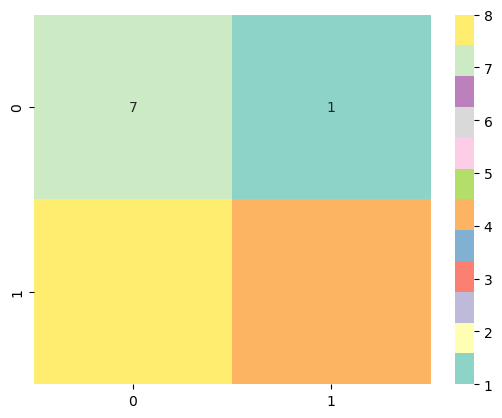

In [133]:
CM_CB=confusion_matrix(Gtest,CB_Pred)
print(CM_CB)
sns.heatmap(CM_CB,annot=True,cmap="Set3")
plt.show()

# **Models Evaluation and Choosing The Final Used Model :**

#### After evaluating both models, the CatBoosting model demonstrates superior performance over the Decision Tree model. The CatBoosting model achieved an accuracy of 55% on the test set compared to the Decision Tree's 40%. Additionally, CatBoosting shows better precision and recall for both classes, indicating a more balanced and robust model. While both models exhibit some degree of overfitting, CatBoosting's metrics are more favorable, with a higher f1-score and accuracy on the test set. Therefore, CatBoosting is the recommended model for deployment.

# **Saving CatBoosting Model :**

In [134]:
joblib.dump(CB,"CatBoostingModel (Mall Customer Segmentation Data) FinalModel - GDSC #4 Task.sav")

['CatBoostingModel (Mall Customer Segmentation Data) FinalModel - GDSC #4 Task.sav']